# RF, XGBOOST, LightGBM

1. 3개의 모델 돌려보기  
      => x_test에 대한 결과를 pkl 파일로 출력하고 정리!
  
  
2. 3개이상의 모델을 만들어서 최종 모델 만들기 (voting)  
      => 단일 모델 v.s voting   
      => 최종 모델로 선정한 모델 pkl파일 출력 및 정리!  
  
  
3. 변수, cv의 종류 등을 변경을하여 최종 모델 만들기

  

# 3개의 모델 돌려보기

## 1. 데이터 불러오기

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
data = pd.read_csv("titanic_train.csv")

In [4]:
data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [5]:
data.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


### Missing Value 다루기

- 컬럼별 NaN값 확인하기

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


- 각 컬럼별로 Missing Value 비율 확인하기

In [7]:
for col in data.columns :
    print(str(col) + " :" , data[col].isnull().sum()/len(data[col]))

PassengerId : 0.0
Survived : 0.0
Pclass : 0.0
Name : 0.0
Sex : 0.0
Age : 0.19865319865319866
SibSp : 0.0
Parch : 0.0
Ticket : 0.0
Fare : 0.0
Cabin : 0.7710437710437711
Embarked : 0.002244668911335578


#### Missing Value 채우기

< 방법1 >
- Age : 평균대치법
- Cabin, Embarked : NaN을 하나의 class로 

In [8]:
# Age
data["Age"].fillna(data["Age"].mean(), inplace = True)

# Cabin, Embarked 
data["Cabin"].fillna("N", inplace = True)
data["Embarked"].fillna("N", inplace = True)

In [9]:
data.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

#### 불필요한 컬럼 제거

In [10]:
data.drop(columns = ["PassengerId", "Name", "Ticket"], axis = 1, inplace = True)

#### Encoding of Categorical Variables

- 성별, Cabin, Embarked에 대해 encoding 작업 하기

In [11]:
# 종류 알아보기
print(data["Sex"].value_counts())
print("--------------------------------")
print(data["Cabin"].value_counts())
print("--------------------------------")
print(data["Embarked"].value_counts())

male      577
female    314
Name: Sex, dtype: int64
--------------------------------
N              687
C23 C25 C27      4
B96 B98          4
G6               4
D                3
              ... 
B42              1
B69              1
B19              1
C45              1
B79              1
Name: Cabin, Length: 148, dtype: int64
--------------------------------
S    644
C    168
Q     77
N      2
Name: Embarked, dtype: int64


In [12]:
# Cabin의 class 묶기
data["Cabin"] = data.loc[:,"Cabin"].apply(lambda x : str(x)[:1])

- Label Encoding

In [2]:
from sklearn.preprocessing import LabelEncoder

In [14]:
for col in ["Sex", "Cabin", "Embarked"]:
    label_encoder = LabelEncoder()
    label_encoder.fit(data[col])
    data[col] = label_encoder.transform(data[col])
    print(data[col].value_counts())

1    577
0    314
Name: Sex, dtype: int64
7    687
2     59
1     47
3     33
4     32
0     15
5     13
6      4
8      1
Name: Cabin, dtype: int64
3    644
0    168
2     77
1      2
Name: Embarked, dtype: int64


## 2. Split Data

In [18]:
y_data = data.loc[:,"Survived"]
x_data = data.drop("Survived", axis = 1)

In [22]:
# y_data비율 확인
y_data.value_counts(normalize = True)

0    0.616162
1    0.383838
Name: Survived, dtype: float64

In [3]:
from sklearn.model_selection import train_test_split

1) Train / Test

      Target 변수의 비율을 유지하면서 train / test를 분리

In [19]:
X_train, X_test, y_train, y_test = train_test_split(x_data, y_data,
                                                   test_size = 0.25,
                                                   stratify = y_data,
                                                   random_state = 10)

2) K-Fold Validation
      
      + y_train의 class 비율이 각각 비슷한 수준이라면 일반적인 KFold 알고리즘 이용 무방!  
      (or)
      + cv 내에서 데이터 비율을 유지하면서 train / validation 분할
          - fold 개수 : 6
      
      + k-fold를 반복하는 RepeatedKfold
      + stratified k-fold를 반복하는 Repeated Stratified K fold
      

- Stratified k fold 이용하기

In [21]:
# k-fold 수행 이전 데이터의 target 변수 (y_train) 비율
y_train.value_counts(normalize = True)

0    0.616766
1    0.383234
Name: Survived, dtype: float64

In [4]:
from sklearn.model_selection import StratifiedKFold

In [28]:
str_kfold = StratifiedKFold(n_splits = 6, random_state = 100, shuffle = True)

## 3. Constructing Model

#### Parameter tuning and evaluating Packages

In [5]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

## 1)  Random Forest stratified k-fold validation

In [6]:
from sklearn.ensemble import RandomForestClassifier

In [32]:
# 1. construction model
rf = RandomForestClassifier(n_jobs = -1, random_state = 12)

# 2. Stratified CV - with parameter tuning 
parameters ={
    "n_estimators" : [30, 60, 100, 300, 500, 1000, 2000],
    "max_features" : ["auto", "log2"],
    "max_depth" : [3,5,10,15,20,30,50],
    "min_samples_split" : [2,4,6,8,10,12],
    "min_samples_leaf" : [2,3,4,5]
}

n_iter_search = 10


## < RGS >
## settings
rf_sk_rgs = RandomizedSearchCV(rf,
                              param_distributions = parameters,
                              cv = str_kfold,
                              scoring = "accuracy",
                              n_jobs = -1,
                              random_state = 100,
                              n_iter = n_iter_search,
                              verbose = 1
                            )

## fitting
rf_sk_rgs.fit(X_train, y_train)

Fitting 6 folds for each of 10 candidates, totalling 60 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=12),
                   n_jobs=-1,
                   param_distributions={'max_depth': [3, 5, 10, 15, 20, 30, 50],
                                        'max_features': ['auto', 'log2'],
                                        'min_samples_leaf': [2, 3, 4, 5],
                                        'min_samples_split': [2, 4, 6, 8, 10,
                                                              12],
                                        'n_estimators': [30, 60, 100, 300, 500,
                                                         1000, 2000]},
                   random_state=100, scoring='accuracy', verbose=1)

In [33]:
rf_sk_rgs.best_score_

0.8204231016731017

In [34]:
rf_sk_rgs.best_params_

{'n_estimators': 500,
 'min_samples_split': 4,
 'min_samples_leaf': 2,
 'max_features': 'log2',
 'max_depth': 30}

In [35]:
## After RGS
## < GS >
## setting
parameters ={
    "n_estimators" : [30, 50, 100, 350, 500, 550, 600],
    "max_features" : ["log2"],
    "max_depth" :  [10,20,30,40,45,50,55,60, 70],
    "min_samples_split" : [2,3,4,5,6],
    "min_samples_leaf" : [2,3]
}

rf_sk_gs = GridSearchCV(rf,
                       param_grid = parameters,
                       cv = str_kfold,
                       scoring = "accuracy",
                       n_jobs = -1,
                       verbose = 2)

## fitting
rf_sk_gs.fit(X_train, y_train)

Fitting 6 folds for each of 630 candidates, totalling 3780 fits


GridSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
             estimator=RandomForestClassifier(n_jobs=-1, random_state=12),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30, 40, 45, 50, 55, 60, 70],
                         'max_features': ['log2'], 'min_samples_leaf': [2, 3],
                         'min_samples_split': [2, 3, 4, 5, 6],
                         'n_estimators': [30, 50, 100, 350, 500, 550, 600]},
             scoring='accuracy', verbose=2)

#### Best Model selected by RandomForest Stratified K-Fold Validation

In [37]:
rf_sk_gs.best_score_

0.8249276061776062

In [38]:
rf_sk_gs.best_params_

{'max_depth': 20,
 'max_features': 'log2',
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 350}

#### Predict y_test by X_test

In [42]:
# the best model
rf_sk_best = rf_sk_gs.best_estimator_

# predict
rf_sk_pred = rf_sk_best.predict(X_test)

# Check test error
rf_sk_accuracy = accuracy_score(y_test, rf_sk_pred)

In [8]:
import pickle

In [88]:
# pkl파일로 저장
with open('RandomForest_best_model.pickle', 'wb') as f:
    pickle.dump({"Best Model" : rf_sk_best, "Accuracy": rf_sk_accuracy}, f, pickle.HIGHEST_PROTOCOL)

## 2) XGBoost stratified K-fold Validation

In [7]:
from xgboost import XGBClassifier

In [59]:
# 1. Constructing Model
## with objective "logistic"
xgbc = XGBClassifier(n_jobs = -1,
                    use_label_encoder= False,
                    eval_metric = "error",
                    objective = "binary:logistic",
                    random_state = 100
                    )

## parameters
params = {
    "booster" : ["gbtree", "gblinear", "dart"],
    "n_estimators" : [50, 100,200,500],
    "learning_rate" : [0.1, 0.2,  0.3, 0.4, 0.5, 0.8],
    "max_depth" : [2,3,4,5,6,7,8],
    "min_child_weight" : [0.5,1, 2, 5, 10],
    "subsample":[0.3, 0.5, 0.7, 0.9],
    "colsample_bytree" : [0.3, 0.5, 0.7, 0.9],
    "reg_alpha" : [0, 0.5, 1, 10,0.1,0.01,0.0001],
    "reg_lambda" : [1, 0.5, 10, 0.1,0.01,0.0001]
}

n_iter_search = 10

## setting the model
xgbc_sk_rgs = RandomizedSearchCV(xgbc,
                                param_distributions = params,
                                cv = str_kfold,
                                scoring = "accuracy",
                                n_jobs = -1,
                                random_state = 100,
                                n_iter = n_iter_search,
                                verbose = 2
                                )

# 2. Fitting the model above
xgbc_sk_rgs.fit(np.ascontiguousarray(X_train), np.ascontiguousarray(y_train))

Fitting 6 folds for each of 10 candidates, totalling 60 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           eval_metric='error', gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           m...
                   param_distributions={'booster': ['gbtree', 'gblinear',
                                                    'dart'],
                                        'colsample_bytree': [0.3, 0.5, 0.7,
             

In [60]:
xgbc_sk_rgs.best_score_

0.8219111969111969

In [61]:
xgbc_sk_rgs.best_params_

{'subsample': 0.7,
 'reg_lambda': 10,
 'reg_alpha': 0.01,
 'n_estimators': 50,
 'min_child_weight': 1,
 'max_depth': 8,
 'learning_rate': 0.2,
 'colsample_bytree': 0.7,
 'booster': 'dart'}

In [63]:
## After first RGS
## < Second RGS >

## setting
params = {
    "booster" : ["dart"],
    "n_estimators" : [30, 40, 50, 60, 70, 80],
    "learning_rate" : [0.1, 0.15,  0.2, 0.25, 0.3, 0.35],
    "max_depth" : [5,6,7,8,9,10],
    "min_child_weight" : [0.6, 0.7, 0.8, 0.9,1,1.1,1.2,1.3],
    "subsample":[0.5, 0.6, 0.7, 0.8, 0.9],
    "colsample_bytree" : [0.5, 0.6, 0.7, 0.8,0.9],
    "reg_alpha" : [0, 0.5, 0.3, 0.1, 0.05, 0.01,0.0007],
    "reg_lambda" : [1, 5, 7, 10, 13, 15]
}

n_iter_search = 20

xgbc_sk_rgs_2 = RandomizedSearchCV(xgbc,
                                  param_distributions = params,
                                  cv = str_kfold,
                                  scoring = "accuracy",
                                   n_jobs = -1,
                                   random_state = 100,
                                   n_iter = n_iter_search,
                                   verbose = 2
                                  )

## Fitting models
xgbc_sk_rgs_2.fit(np.ascontiguousarray(X_train), np.ascontiguousarray(y_train))

Fitting 6 folds for each of 20 candidates, totalling 120 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           eval_metric='error', gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           m...
                                        'colsample_bytree': [0.5, 0.6, 0.7, 0.8,
                                                             0.9],
                                        'learning_rate': [0.1, 0.15, 0.2, 0.

#### Best Model selected by XGBoost Stratified K-Fold Validation

In [64]:
xgbc_sk_rgs_2.best_score_

0.8233858858858859

In [68]:
xgbc_sk_rgs_2.best_params_

{'subsample': 0.9,
 'reg_lambda': 1,
 'reg_alpha': 0.3,
 'n_estimators': 70,
 'min_child_weight': 1,
 'max_depth': 6,
 'learning_rate': 0.1,
 'colsample_bytree': 0.8,
 'booster': 'dart'}

#### Predict y_test by X_test

In [69]:
# The Best model
xgbc_best = xgbc_sk_rgs_2.best_estimator_

# Prediction
xgbc_pred = xgbc_sk_rgs_2.predict(np.ascontiguousarray(X_test))

# Accuracy
xgbc_sk_accuracy = accuracy_score(y_test, xgbc_pred)
print(xgbc_sk_accuracy)

0.8430493273542601


저장하기

In [89]:
with open("XGBoost_best_model.pickle", "wb") as f:
    pickle.dump({"Best Model" : xgbc_best, "Accuracy": xgbc_sk_accuracy},
                f, pickle.HIGHEST_PROTOCOL)

## 3) LightGBM with Stratified K-fold Cross Validation

In [9]:
from lightgbm import LGBMClassifier

In [76]:
# 1. Constructing model 
LGB_clf = LGBMClassifier(random_state = 200,
                        n_jobs = -1)

## setting
## parameters 
params = {
    "n_estimators" : [ 50, 80, 100, 150, 200, 300, 500 ],
    "learning_rate" : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
}

n_iter_search = 10

lgbm_rgs = RandomizedSearchCV(LGB_clf,
                             param_distributions = params,
                             cv = str_kfold,
                             scoring = "accuracy",
                             n_jobs = -1,
                             random_state = 300,
                             n_iter = n_iter_search,
                              verbose=2
                             )

# 2. fitting 
lgbm_rgs.fit(np.ascontiguousarray(X_train), np.ascontiguousarray(y_train))

Fitting 6 folds for each of 10 candidates, totalling 60 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
                   estimator=LGBMClassifier(random_state=200), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.2, 0.3, 0.4,
                                                          0.5, 0.6, 0.7],
                                        'n_estimators': [50, 80, 100, 150, 200,
                                                         300, 500]},
                   random_state=300, scoring='accuracy', verbose=2)

In [77]:
lgbm_rgs.best_params_

{'n_estimators': 100, 'learning_rate': 0.1}

In [79]:
## After RGS
## < GS >
## setting
params = {
    "n_estimators" : [ 90, 100, 110, 120, 130, 140, 150 ],
    "learning_rate" : [0.03, 0.05, 0.07, 0.1, 0.13, 0.15, 0.17]
}

lgbm_gs = GridSearchCV(LGB_clf,
                      param_grid = params,
                      cv = str_kfold,
                      scoring = "accuracy",
                      n_jobs = -1,
                      verbose = 2
                      )

## fitting
lgbm_gs.fit(np.ascontiguousarray(X_train), np.ascontiguousarray(y_train))

Fitting 6 folds for each of 49 candidates, totalling 294 fits


GridSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
             estimator=LGBMClassifier(random_state=200), n_jobs=-1,
             param_grid={'learning_rate': [0.03, 0.05, 0.07, 0.1, 0.13, 0.15,
                                           0.17],
                         'n_estimators': [90, 100, 110, 120, 130, 140, 150]},
             scoring='accuracy', verbose=2)

#### Predict y_test by X_test

In [80]:
# The Best Model
lgbm_str_best = lgbm_gs.best_estimator_

# Prediction
lgbm_str_pred = lgbm_str_best.predict(np.ascontiguousarray(X_test))

# Accuracy
lgbm_str_acc = accuracy_score(y_test, lgbm_str_pred)
print(lgbm_str_acc)

0.8475336322869955


저장하기

In [90]:
with open("LightGBM_Best.pickle", "wb") as f:
    pickle.dump({"Best Model" : lgbm_str_best, "Accuracy": lgbm_str_acc}, f, pickle.HIGHEST_PROTOCOL)

# 3개 이상의 모델 이용한 후 Voting
## -->   단일 결과 v.s voting 비교해보기

### 4) SVM - Stratified K-Fold Cross Validation

In [10]:
from sklearn.svm import SVC

In [108]:
# 1. Constructing Model
svm = SVC(max_iter = 100, random_state = 123, probability = True)

# 2. Setting
## parameters
params = {
    "C" : [0.001, 0.01, 0.1, 1, 10, 30, 50,100],
    "kernel" : ["linear", "rbf", "poly"],
    "gamma" : [0.001, 0.01, 0.1, 0.5],
    "degree" : [2,3,4,5]
}

n_iter_search = 10

## setting
svc_str_rgs = RandomizedSearchCV(svm,
                                param_distributions=params,
                                n_iter=n_iter_search,
                                cv = str_kfold,
                                scoring = "accuracy",
                                n_jobs= -1,
                                random_state=123,
                                verbose = 1
                               )

# 3. Model Fitting
svc_str_rgs.fit(X_train, y_train)

Fitting 6 folds for each of 10 candidates, totalling 60 fits


C:\Users\TFG5076XG\anaconda3\lib\site-packages\sklearn\svm\_base.py:255: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


RandomizedSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
                   estimator=SVC(max_iter=100, probability=True,
                                 random_state=123),
                   n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 1, 10, 30, 50,
                                              100],
                                        'degree': [2, 3, 4, 5],
                                        'gamma': [0.001, 0.01, 0.1, 0.5],
                                        'kernel': ['linear', 'rbf', 'poly']},
                   random_state=123, scoring='accuracy', verbose=1)

In [109]:
svc_str_rgs.best_params_

{'kernel': 'rbf', 'gamma': 0.01, 'degree': 5, 'C': 1}

In [112]:
## After RGS 
## < GS >
## setting
parameters={
    "C" : [1,5,10,15,20,25],
    "kernel" : ["rbf"],
    "gamma" : [0.005, 0.007, 0.01,0.13, 0.015, 0.17, 0.2],
    "degree" : [4,5,6]
}


svm_skr_gs = GridSearchCV(svm,
                     param_grid=parameters,
                     cv=str_kfold,
                     scoring="accuracy",
                     n_jobs=-1,
                     verbose=2)

## fitting
svm_skr_gs.fit(X_train,y_train)

Fitting 6 folds for each of 126 candidates, totalling 756 fits


C:\Users\TFG5076XG\anaconda3\lib\site-packages\sklearn\svm\_base.py:255: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


GridSearchCV(cv=StratifiedKFold(n_splits=6, random_state=100, shuffle=True),
             estimator=SVC(max_iter=100, probability=True, random_state=123),
             n_jobs=-1,
             param_grid={'C': [1, 5, 10, 15, 20, 25], 'degree': [4, 5, 6],
                         'gamma': [0.005, 0.007, 0.01, 0.13, 0.015, 0.17, 0.2],
                         'kernel': ['rbf']},
             scoring='accuracy', verbose=2)

In [113]:
# best model
svm_best = svm_skr_gs.best_estimator_

# Prediction
svm_pred = svm_skr_gs.predict(X_test)

# accuracy
svm_accuracy = accuracy_score(y_test, svm_pred)

In [114]:
with open("SVM_best_model.pickle", "wb") as f:
    pickle.dump({"Best Model" : svm_best, "Accuracy": svm_accuracy},
                f, pickle.HIGHEST_PROTOCOL)

### 5) CatBoost

학습 자료 : https://dailyheumsi.tistory.com/136  
학습 자료 2 : https://gentlej90.tistory.com/100

In [11]:
from catboost import CatBoostClassifier, Pool

In [139]:
CB = CatBoostClassifier(loss_function = "CrossEntropy",
                        score_function = "L2",
                        verbose=True)



## setting 
params = {
    "iterations" : [2, 6, 10, 15, 20],
    'learning_rate': [0.03, 0.05, 0.07, 0.1, 0.13, 0.15],
    'depth': [3, 4, 5, 6], 
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    "one_hot_max_size" : [2,5,7,10],
}


CB_str_rgs_result = CB.randomized_search(param_distributions = params,
                                      X = X_train,
                                      y = y_train,
                                      cv=str_kfold,
                                      n_iter=10,
                                      partition_random_seed=0, 
                                      train_size=0.8, 
                                      verbose=1)

# best parameters
CB_str_rgs_result["params"]

0:	learn: 0.6203112	test: 0.6200787	best: 0.6200787 (0)	total: 746us	remaining: 746us
1:	learn: 0.5673844	test: 0.5705051	best: 0.5705051 (1)	total: 1.48ms	remaining: 0us

bestTest = 0.5705050836
bestIteration = 1

0:	loss: 0.5705051	best: 0.5705051 (0)	total: 13.4ms	remaining: 121ms
0:	learn: 0.6030779	test: 0.6083765	best: 0.6083765 (0)	total: 581us	remaining: 2.91ms
1:	learn: 0.5503429	test: 0.5615733	best: 0.5615733 (1)	total: 1.2ms	remaining: 2.39ms
2:	learn: 0.5137854	test: 0.5288886	best: 0.5288886 (2)	total: 1.83ms	remaining: 1.83ms
3:	learn: 0.4868657	test: 0.5091526	best: 0.5091526 (3)	total: 2.49ms	remaining: 1.25ms
4:	learn: 0.4648368	test: 0.4914116	best: 0.4914116 (4)	total: 3.11ms	remaining: 621us
5:	learn: 0.4490431	test: 0.4813669	best: 0.4813669 (5)	total: 3.78ms	remaining: 0us

bestTest = 0.4813668536
bestIteration = 5

1:	loss: 0.4813669	best: 0.4813669 (1)	total: 18.5ms	remaining: 73.9ms
0:	learn: 0.6571450	test: 0.6575715	best: 0.6575715 (0)	total: 786us	remaining

0:	learn: 0.6217671	test: 0.6285368	best: 0.6285368 (0)
1:	learn: 0.5673266	test: 0.5822813	best: 0.5822813 (1)
2:	learn: 0.5255593	test: 0.5442829	best: 0.5442829 (2)
3:	learn: 0.4914381	test: 0.5157617	best: 0.5157617 (3)
4:	learn: 0.4654770	test: 0.4948966	best: 0.4948966 (4)
5:	learn: 0.4453855	test: 0.4803900	best: 0.4803900 (5)
6:	learn: 0.4289518	test: 0.4687740	best: 0.4687740 (6)
7:	learn: 0.4153249	test: 0.4593004	best: 0.4593004 (7)
8:	learn: 0.4053554	test: 0.4534745	best: 0.4534745 (8)
9:	learn: 0.3952935	test: 0.4497682	best: 0.4497682 (9)
10:	learn: 0.3872197	test: 0.4464760	best: 0.4464760 (10)
11:	learn: 0.3813650	test: 0.4446952	best: 0.4446952 (11)
12:	learn: 0.3758437	test: 0.4423372	best: 0.4423372 (12)
13:	learn: 0.3707124	test: 0.4425329	best: 0.4423372 (12)
14:	learn: 0.3655733	test: 0.4418708	best: 0.4418708 (14)
15:	learn: 0.3612524	test: 0.4409164	best: 0.4409164 (15)
16:	learn: 0.3574602	test: 0.4387398	best: 0.4387398 (16)
17:	learn: 0.3535891	test: 0.43868

{'depth': 6,
 'one_hot_max_size': 5,
 'l2_leaf_reg': 3,
 'iterations': 20,
 'learning_rate': 0.1}

Note. After searching, the model is trained and ready to use

In [144]:
CB = CatBoostClassifier(loss_function = "CrossEntropy",
                        score_function = "L2",
                        verbose=True)

grid = {
    "iterations" : [15, 17, 20, 23, 25],
    'learning_rate': [ 0.07, 0.1, 0.15, 0.2, 0.25],
    'depth': [ 5, 6, 7, 8], 
    'l2_leaf_reg': [1, 2, 3, 4, 5],
    "one_hot_max_size" : [4,5,6,7,8],
}

CB_str_gs_result = CB.grid_search( param_grid=grid,
                                 X = X_train,
                                 y = y_train,
                                 cv = str_kfold,
                                 partition_random_seed=0,
                                 train_size=0.8,
                                 verbose=1)

CB_str_gs_result["params"]

0:	learn: 0.6366835	test: 0.6388223	best: 0.6388223 (0)	total: 1.12ms	remaining: 15.7ms
1:	learn: 0.5958803	test: 0.6006385	best: 0.6006385 (1)	total: 2.1ms	remaining: 13.7ms
2:	learn: 0.5561326	test: 0.5649078	best: 0.5649078 (2)	total: 3ms	remaining: 12ms
3:	learn: 0.5234168	test: 0.5368973	best: 0.5368973 (3)	total: 3.84ms	remaining: 10.6ms
4:	learn: 0.4999864	test: 0.5158365	best: 0.5158365 (4)	total: 4.72ms	remaining: 9.45ms
5:	learn: 0.4782424	test: 0.4967126	best: 0.4967126 (5)	total: 5.55ms	remaining: 8.33ms
6:	learn: 0.4608445	test: 0.4854151	best: 0.4854151 (6)	total: 6.37ms	remaining: 7.28ms
7:	learn: 0.4459127	test: 0.4769818	best: 0.4769818 (7)	total: 7.25ms	remaining: 6.34ms
8:	learn: 0.4322002	test: 0.4676819	best: 0.4676819 (8)	total: 8.12ms	remaining: 5.41ms
9:	learn: 0.4229156	test: 0.4617080	best: 0.4617080 (9)	total: 8.96ms	remaining: 4.48ms
10:	learn: 0.4139073	test: 0.4579703	best: 0.4579703 (10)	total: 9.83ms	remaining: 3.57ms
11:	learn: 0.4058186	test: 0.4561132

14:	learn: 0.3581206	test: 0.4452879	best: 0.4391570 (10)	total: 13ms	remaining: 0us

bestTest = 0.4391569872
bestIteration = 10

6:	loss: 0.4391570	best: 0.4391570 (5)	total: 113ms	remaining: 40.3s
0:	learn: 0.6148196	test: 0.6182120	best: 0.6182120 (0)	total: 828us	remaining: 11.6ms
1:	learn: 0.5629821	test: 0.5691573	best: 0.5691573 (1)	total: 1.8ms	remaining: 11.7ms
2:	learn: 0.5162040	test: 0.5295883	best: 0.5295883 (2)	total: 2.68ms	remaining: 10.7ms
3:	learn: 0.4817665	test: 0.5000666	best: 0.5000666 (3)	total: 3.62ms	remaining: 9.95ms
4:	learn: 0.4577340	test: 0.4799854	best: 0.4799854 (4)	total: 4.48ms	remaining: 8.96ms
5:	learn: 0.4381962	test: 0.4676899	best: 0.4676899 (5)	total: 5.32ms	remaining: 7.98ms
6:	learn: 0.4218999	test: 0.4572610	best: 0.4572610 (6)	total: 6.33ms	remaining: 7.24ms
7:	learn: 0.4086133	test: 0.4491638	best: 0.4491638 (7)	total: 7.29ms	remaining: 6.38ms
8:	learn: 0.3960389	test: 0.4440267	best: 0.4440267 (8)	total: 8.13ms	remaining: 5.42ms
9:	learn: 0

4:	learn: 0.3895452	test: 0.4354112	best: 0.4354112 (4)	total: 4.54ms	remaining: 9.09ms
5:	learn: 0.3748839	test: 0.4343962	best: 0.4343962 (5)	total: 5.58ms	remaining: 8.37ms
6:	learn: 0.3649829	test: 0.4367944	best: 0.4343962 (5)	total: 6.53ms	remaining: 7.47ms
7:	learn: 0.3601166	test: 0.4361707	best: 0.4343962 (5)	total: 7.36ms	remaining: 6.44ms
8:	learn: 0.3522429	test: 0.4337701	best: 0.4337701 (8)	total: 8.22ms	remaining: 5.48ms
9:	learn: 0.3455323	test: 0.4351403	best: 0.4337701 (8)	total: 9.1ms	remaining: 4.55ms
10:	learn: 0.3423518	test: 0.4400556	best: 0.4337701 (8)	total: 9.95ms	remaining: 3.62ms
11:	learn: 0.3378644	test: 0.4436333	best: 0.4337701 (8)	total: 10.9ms	remaining: 2.71ms
12:	learn: 0.3329008	test: 0.4450580	best: 0.4337701 (8)	total: 11.7ms	remaining: 1.79ms
13:	learn: 0.3288157	test: 0.4534156	best: 0.4337701 (8)	total: 12.8ms	remaining: 911us
14:	learn: 0.3242570	test: 0.4551736	best: 0.4337701 (8)	total: 13.6ms	remaining: 0us

bestTest = 0.4337701476
bestIte

9:	learn: 0.3961179	test: 0.4498811	best: 0.4498811 (9)	total: 8.96ms	remaining: 4.48ms
10:	learn: 0.3882782	test: 0.4484347	best: 0.4484347 (10)	total: 9.97ms	remaining: 3.63ms
11:	learn: 0.3814558	test: 0.4504969	best: 0.4484347 (10)	total: 11ms	remaining: 2.75ms
12:	learn: 0.3760769	test: 0.4507452	best: 0.4484347 (10)	total: 11.9ms	remaining: 1.83ms
13:	learn: 0.3714334	test: 0.4508545	best: 0.4484347 (10)	total: 12.8ms	remaining: 911us
14:	learn: 0.3690170	test: 0.4497546	best: 0.4484347 (10)	total: 13.8ms	remaining: 0us

bestTest = 0.4484347477
bestIteration = 10

31:	loss: 0.4484347	best: 0.4337701 (15)	total: 490ms	remaining: 37.8s
0:	learn: 0.6186754	test: 0.6212059	best: 0.6212059 (0)	total: 841us	remaining: 11.8ms
1:	learn: 0.5646462	test: 0.5724333	best: 0.5724333 (1)	total: 1.69ms	remaining: 11ms
2:	learn: 0.5202313	test: 0.5340008	best: 0.5340008 (2)	total: 2.67ms	remaining: 10.7ms
3:	learn: 0.4884157	test: 0.5045361	best: 0.5045361 (3)	total: 3.57ms	remaining: 9.82ms
4:	

1:	learn: 0.4836226	test: 0.5024137	best: 0.5024137 (1)	total: 1.97ms	remaining: 12.8ms
2:	learn: 0.4439771	test: 0.4711341	best: 0.4711341 (2)	total: 2.88ms	remaining: 11.5ms
3:	learn: 0.4155329	test: 0.4529448	best: 0.4529448 (3)	total: 3.81ms	remaining: 10.5ms
4:	learn: 0.3959981	test: 0.4435715	best: 0.4435715 (4)	total: 4.76ms	remaining: 9.53ms
5:	learn: 0.3823976	test: 0.4436933	best: 0.4435715 (4)	total: 5.69ms	remaining: 8.53ms
6:	learn: 0.3694578	test: 0.4462541	best: 0.4435715 (4)	total: 6.62ms	remaining: 7.57ms
7:	learn: 0.3610388	test: 0.4481037	best: 0.4435715 (4)	total: 7.52ms	remaining: 6.58ms
8:	learn: 0.3540902	test: 0.4513335	best: 0.4435715 (4)	total: 8.44ms	remaining: 5.63ms
9:	learn: 0.3479401	test: 0.4494138	best: 0.4435715 (4)	total: 9.38ms	remaining: 4.69ms
10:	learn: 0.3428065	test: 0.4522290	best: 0.4435715 (4)	total: 10.3ms	remaining: 3.74ms
11:	learn: 0.3366222	test: 0.4578132	best: 0.4435715 (4)	total: 11.3ms	remaining: 2.82ms
12:	learn: 0.3340304	test: 0.4

6:	learn: 0.4377233	test: 0.4638402	best: 0.4638402 (6)	total: 6.25ms	remaining: 7.15ms
7:	learn: 0.4241658	test: 0.4577958	best: 0.4577958 (7)	total: 7.17ms	remaining: 6.28ms
8:	learn: 0.4123709	test: 0.4495133	best: 0.4495133 (8)	total: 8.29ms	remaining: 5.53ms
9:	learn: 0.4039267	test: 0.4440144	best: 0.4440144 (9)	total: 9.17ms	remaining: 4.58ms
10:	learn: 0.3959880	test: 0.4419827	best: 0.4419827 (10)	total: 10ms	remaining: 3.65ms
11:	learn: 0.3874459	test: 0.4414356	best: 0.4414356 (11)	total: 11ms	remaining: 2.74ms
12:	learn: 0.3837579	test: 0.4403086	best: 0.4403086 (12)	total: 11.8ms	remaining: 1.82ms
13:	learn: 0.3780479	test: 0.4403617	best: 0.4403086 (12)	total: 12.7ms	remaining: 910us
14:	learn: 0.3734521	test: 0.4406300	best: 0.4403086 (12)	total: 13.7ms	remaining: 0us

bestTest = 0.4403086278
bestIteration = 12

56:	loss: 0.4403086	best: 0.4337701 (15)	total: 865ms	remaining: 37.1s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 845us	remaining: 11.8ms
1:	

10:	learn: 0.3536174	test: 0.4387622	best: 0.4363087 (5)	total: 9.56ms	remaining: 3.48ms
11:	learn: 0.3515616	test: 0.4406205	best: 0.4363087 (5)	total: 10.6ms	remaining: 2.65ms
12:	learn: 0.3469248	test: 0.4406206	best: 0.4363087 (5)	total: 11.5ms	remaining: 1.77ms
13:	learn: 0.3435902	test: 0.4426711	best: 0.4363087 (5)	total: 12.4ms	remaining: 885us
14:	learn: 0.3400750	test: 0.4432543	best: 0.4363087 (5)	total: 13.2ms	remaining: 0us

bestTest = 0.4363086662
bestIteration = 5

68:	loss: 0.4363087	best: 0.4337701 (15)	total: 1.05s	remaining: 36.9s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 785us	remaining: 11ms
1:	learn: 0.4959533	test: 0.5077660	best: 0.5077660 (1)	total: 1.6ms	remaining: 10.4ms
2:	learn: 0.4466901	test: 0.4700273	best: 0.4700273 (2)	total: 2.42ms	remaining: 9.66ms
3:	learn: 0.4179298	test: 0.4477795	best: 0.4477795 (3)	total: 3.23ms	remaining: 8.89ms
4:	learn: 0.3983524	test: 0.4405881	best: 0.4405881 (4)	total: 4.14ms	remaining: 8.27ms
5:	learn

10:	learn: 0.4019579	test: 0.4425615	best: 0.4425615 (10)	total: 9.89ms	remaining: 3.6ms
11:	learn: 0.3952781	test: 0.4421097	best: 0.4421097 (11)	total: 10.9ms	remaining: 2.72ms
12:	learn: 0.3912323	test: 0.4431996	best: 0.4421097 (11)	total: 11.8ms	remaining: 1.81ms
13:	learn: 0.3849567	test: 0.4389816	best: 0.4389816 (13)	total: 12.6ms	remaining: 899us
14:	learn: 0.3802080	test: 0.4389146	best: 0.4389146 (14)	total: 13.5ms	remaining: 0us

bestTest = 0.4389145819
bestIteration = 14

80:	loss: 0.4389146	best: 0.4337701 (15)	total: 1.23s	remaining: 36.8s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 795us	remaining: 11.1ms
1:	learn: 0.5758021	test: 0.5796746	best: 0.5796746 (1)	total: 1.69ms	remaining: 11ms
2:	learn: 0.5323887	test: 0.5382152	best: 0.5382152 (2)	total: 2.68ms	remaining: 10.7ms
3:	learn: 0.5007716	test: 0.5085297	best: 0.5085297 (3)	total: 3.53ms	remaining: 9.71ms
4:	learn: 0.4764553	test: 0.4873179	best: 0.4873179 (4)	total: 4.47ms	remaining: 8.94ms
5:

1:	learn: 0.4990467	test: 0.5096711	best: 0.5096711 (1)	total: 2.04ms	remaining: 13.2ms
2:	learn: 0.4503463	test: 0.4715553	best: 0.4715553 (2)	total: 3.09ms	remaining: 12.3ms
3:	learn: 0.4243322	test: 0.4489757	best: 0.4489757 (3)	total: 4.26ms	remaining: 11.7ms
4:	learn: 0.4046305	test: 0.4390171	best: 0.4390171 (4)	total: 5.12ms	remaining: 10.2ms
5:	learn: 0.3923589	test: 0.4337474	best: 0.4337474 (5)	total: 5.97ms	remaining: 8.95ms
6:	learn: 0.3842225	test: 0.4314388	best: 0.4314388 (6)	total: 6.86ms	remaining: 7.84ms
7:	learn: 0.3773354	test: 0.4294936	best: 0.4294936 (7)	total: 7.92ms	remaining: 6.93ms
8:	learn: 0.3703407	test: 0.4314412	best: 0.4294936 (7)	total: 8.93ms	remaining: 5.95ms
9:	learn: 0.3650867	test: 0.4309044	best: 0.4294936 (7)	total: 9.87ms	remaining: 4.94ms
10:	learn: 0.3620069	test: 0.4331277	best: 0.4294936 (7)	total: 10.7ms	remaining: 3.9ms
11:	learn: 0.3560527	test: 0.4310580	best: 0.4294936 (7)	total: 11.7ms	remaining: 2.93ms
12:	learn: 0.3511633	test: 0.43

10:	learn: 0.4052122	test: 0.4379251	best: 0.4379251 (10)	total: 9.77ms	remaining: 3.55ms
11:	learn: 0.3986457	test: 0.4369677	best: 0.4369677 (11)	total: 10.7ms	remaining: 2.69ms
12:	learn: 0.3934222	test: 0.4363875	best: 0.4363875 (12)	total: 11.6ms	remaining: 1.79ms
13:	learn: 0.3881688	test: 0.4368625	best: 0.4363875 (12)	total: 12.6ms	remaining: 898us
14:	learn: 0.3838095	test: 0.4373369	best: 0.4363875 (12)	total: 13.5ms	remaining: 0us

bestTest = 0.4363874537
bestIteration = 12

105:	loss: 0.4363875	best: 0.4294936 (90)	total: 1.6s	remaining: 36.3s
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 787us	remaining: 11ms
1:	learn: 0.5776185	test: 0.5823937	best: 0.5823937 (1)	total: 1.7ms	remaining: 11.1ms
2:	learn: 0.5347138	test: 0.5411509	best: 0.5411509 (2)	total: 2.56ms	remaining: 10.2ms
3:	learn: 0.5010920	test: 0.5086909	best: 0.5086909 (3)	total: 3.4ms	remaining: 9.36ms
4:	learn: 0.4768317	test: 0.4879419	best: 0.4879419 (4)	total: 4.32ms	remaining: 8.63ms
5:	

5:	learn: 0.4043769	test: 0.4475102	best: 0.4475102 (5)	total: 5.18ms	remaining: 7.78ms
6:	learn: 0.3958596	test: 0.4427058	best: 0.4427058 (6)	total: 6.05ms	remaining: 6.91ms
7:	learn: 0.3843243	test: 0.4416122	best: 0.4416122 (7)	total: 6.89ms	remaining: 6.03ms
8:	learn: 0.3769764	test: 0.4391164	best: 0.4391164 (8)	total: 7.94ms	remaining: 5.29ms
9:	learn: 0.3726007	test: 0.4405772	best: 0.4391164 (8)	total: 8.81ms	remaining: 4.4ms
10:	learn: 0.3680852	test: 0.4429048	best: 0.4391164 (8)	total: 9.52ms	remaining: 3.46ms
11:	learn: 0.3648488	test: 0.4430587	best: 0.4391164 (8)	total: 10.4ms	remaining: 2.59ms
12:	learn: 0.3600553	test: 0.4440003	best: 0.4391164 (8)	total: 11.3ms	remaining: 1.74ms
13:	learn: 0.3576778	test: 0.4431099	best: 0.4391164 (8)	total: 12.2ms	remaining: 871us
14:	learn: 0.3537314	test: 0.4451420	best: 0.4391164 (8)	total: 13.1ms	remaining: 0us

bestTest = 0.4391164344
bestIteration = 8

118:	loss: 0.4391164	best: 0.4294936 (90)	total: 1.79s	remaining: 35.9s
0:	l

7:	learn: 0.4086133	test: 0.4491638	best: 0.4491638 (7)	total: 7.01ms	remaining: 7.88ms
8:	learn: 0.3960389	test: 0.4440267	best: 0.4440267 (8)	total: 7.99ms	remaining: 7.1ms
9:	learn: 0.3877962	test: 0.4400778	best: 0.4400778 (9)	total: 8.88ms	remaining: 6.21ms
10:	learn: 0.3798406	test: 0.4391570	best: 0.4391570 (10)	total: 9.76ms	remaining: 5.32ms
11:	learn: 0.3731711	test: 0.4410837	best: 0.4391570 (10)	total: 10.7ms	remaining: 4.44ms
12:	learn: 0.3675154	test: 0.4430557	best: 0.4391570 (10)	total: 11.5ms	remaining: 3.54ms
13:	learn: 0.3620871	test: 0.4464335	best: 0.4391570 (10)	total: 12.5ms	remaining: 2.68ms
14:	learn: 0.3581206	test: 0.4452879	best: 0.4391570 (10)	total: 13.4ms	remaining: 1.78ms
15:	learn: 0.3507792	test: 0.4437323	best: 0.4391570 (10)	total: 14.2ms	remaining: 886us
16:	learn: 0.3461732	test: 0.4444962	best: 0.4391570 (10)	total: 15.1ms	remaining: 0us

bestTest = 0.4391569872
bestIteration = 10

130:	loss: 0.4391570	best: 0.4294936 (90)	total: 1.98s	remaining: 

10:	learn: 0.3423518	test: 0.4400556	best: 0.4337701 (8)	total: 10.8ms	remaining: 5.88ms
11:	learn: 0.3378644	test: 0.4436333	best: 0.4337701 (8)	total: 11.8ms	remaining: 4.91ms
12:	learn: 0.3329008	test: 0.4450580	best: 0.4337701 (8)	total: 12.8ms	remaining: 3.94ms
13:	learn: 0.3288157	test: 0.4534156	best: 0.4337701 (8)	total: 13.8ms	remaining: 2.95ms
14:	learn: 0.3242570	test: 0.4551736	best: 0.4337701 (8)	total: 14.6ms	remaining: 1.94ms
15:	learn: 0.3129690	test: 0.4545745	best: 0.4337701 (8)	total: 15.4ms	remaining: 965us
16:	learn: 0.3125614	test: 0.4553975	best: 0.4337701 (8)	total: 16.2ms	remaining: 0us

bestTest = 0.4337701476
bestIteration = 8

141:	loss: 0.4337701	best: 0.4294936 (90)	total: 2.17s	remaining: 36s
0:	learn: 0.5515501	test: 0.5604307	best: 0.5604307 (0)	total: 837us	remaining: 13.4ms
1:	learn: 0.4826320	test: 0.4985483	best: 0.4985483 (1)	total: 1.72ms	remaining: 12.9ms
2:	learn: 0.4331989	test: 0.4640543	best: 0.4640543 (2)	total: 2.64ms	remaining: 12.3ms
3:	l

12:	learn: 0.4058174	test: 0.4551140	best: 0.4551140 (12)	total: 11.7ms	remaining: 3.6ms
13:	learn: 0.3981566	test: 0.4494320	best: 0.4494320 (13)	total: 12.8ms	remaining: 2.73ms
14:	learn: 0.3914133	test: 0.4495698	best: 0.4494320 (13)	total: 13.8ms	remaining: 1.84ms
15:	learn: 0.3849198	test: 0.4486649	best: 0.4486649 (15)	total: 14.6ms	remaining: 913us
16:	learn: 0.3799489	test: 0.4478194	best: 0.4478194 (16)	total: 15.4ms	remaining: 0us

bestTest = 0.4478194431
bestIteration = 16

152:	loss: 0.4478194	best: 0.4294936 (90)	total: 2.35s	remaining: 36s
0:	learn: 0.6395988	test: 0.6411777	best: 0.6411777 (0)	total: 795us	remaining: 12.7ms
1:	learn: 0.5972559	test: 0.6022777	best: 0.6022777 (1)	total: 1.6ms	remaining: 12ms
2:	learn: 0.5604047	test: 0.5680115	best: 0.5680115 (2)	total: 2.5ms	remaining: 11.7ms
3:	learn: 0.5293591	test: 0.5411636	best: 0.5411636 (3)	total: 3.48ms	remaining: 11.3ms
4:	learn: 0.5037462	test: 0.5186179	best: 0.5186179 (4)	total: 4.41ms	remaining: 10.6ms
5:	le

15:	learn: 0.3399372	test: 0.4516684	best: 0.4496439 (10)	total: 13.9ms	remaining: 870us
16:	learn: 0.3357599	test: 0.4489651	best: 0.4489651 (16)	total: 14.9ms	remaining: 0us

bestTest = 0.4489651431
bestIteration = 16

163:	loss: 0.4489651	best: 0.4294936 (90)	total: 2.53s	remaining: 36.1s
0:	learn: 0.5864355	test: 0.5908979	best: 0.5908979 (0)	total: 868us	remaining: 13.9ms
1:	learn: 0.5137683	test: 0.5304160	best: 0.5304160 (1)	total: 1.74ms	remaining: 13.1ms
2:	learn: 0.4684740	test: 0.4937281	best: 0.4937281 (2)	total: 2.61ms	remaining: 12.2ms
3:	learn: 0.4375448	test: 0.4765250	best: 0.4765250 (3)	total: 3.56ms	remaining: 11.6ms
4:	learn: 0.4161453	test: 0.4646763	best: 0.4646763 (4)	total: 4.56ms	remaining: 10.9ms
5:	learn: 0.4018406	test: 0.4576055	best: 0.4576055 (5)	total: 5.46ms	remaining: 10ms
6:	learn: 0.3901382	test: 0.4570901	best: 0.4570901 (6)	total: 6.46ms	remaining: 9.23ms
7:	learn: 0.3791517	test: 0.4517859	best: 0.4517859 (7)	total: 7.44ms	remaining: 8.37ms
8:	lea

2:	learn: 0.5671462	test: 0.5711175	best: 0.5711175 (2)	total: 2.81ms	remaining: 13.1ms
3:	learn: 0.5360514	test: 0.5408192	best: 0.5408192 (3)	total: 3.72ms	remaining: 12.1ms
4:	learn: 0.5123830	test: 0.5198502	best: 0.5198502 (4)	total: 4.65ms	remaining: 11.2ms
5:	learn: 0.4929042	test: 0.5045566	best: 0.5045566 (5)	total: 5.53ms	remaining: 10.1ms
6:	learn: 0.4763564	test: 0.4907335	best: 0.4907335 (6)	total: 6.41ms	remaining: 9.16ms
7:	learn: 0.4619610	test: 0.4797023	best: 0.4797023 (7)	total: 7.36ms	remaining: 8.27ms
8:	learn: 0.4483368	test: 0.4685573	best: 0.4685573 (8)	total: 8.26ms	remaining: 7.34ms
9:	learn: 0.4387329	test: 0.4612403	best: 0.4612403 (9)	total: 9.08ms	remaining: 6.35ms
10:	learn: 0.4303243	test: 0.4557327	best: 0.4557327 (10)	total: 10ms	remaining: 5.46ms
11:	learn: 0.4204934	test: 0.4512071	best: 0.4512071 (11)	total: 11ms	remaining: 4.56ms
12:	learn: 0.4141057	test: 0.4479030	best: 0.4479030 (12)	total: 11.8ms	remaining: 3.63ms
13:	learn: 0.4063814	test: 0.4

14:	learn: 0.3539403	test: 0.4465905	best: 0.4402510 (9)	total: 13.9ms	remaining: 1.85ms
15:	learn: 0.3454687	test: 0.4427973	best: 0.4402510 (9)	total: 14.9ms	remaining: 933us
16:	learn: 0.3412738	test: 0.4399717	best: 0.4399717 (16)	total: 16ms	remaining: 0us

bestTest = 0.4399717214
bestIteration = 16

185:	loss: 0.4399717	best: 0.4294936 (90)	total: 2.9s	remaining: 36.1s
0:	learn: 0.5897172	test: 0.5933483	best: 0.5933483 (0)	total: 791us	remaining: 12.7ms
1:	learn: 0.5184292	test: 0.5329688	best: 0.5329688 (1)	total: 1.68ms	remaining: 12.6ms
2:	learn: 0.4734742	test: 0.4956544	best: 0.4956544 (2)	total: 2.91ms	remaining: 13.6ms
3:	learn: 0.4425841	test: 0.4773500	best: 0.4773500 (3)	total: 3.74ms	remaining: 12.2ms
4:	learn: 0.4220217	test: 0.4633322	best: 0.4633322 (4)	total: 4.62ms	remaining: 11.1ms
5:	learn: 0.4073083	test: 0.4531158	best: 0.4531158 (5)	total: 5.54ms	remaining: 10.2ms
6:	learn: 0.3952039	test: 0.4489184	best: 0.4489184 (6)	total: 6.62ms	remaining: 9.46ms
7:	lear

7:	learn: 0.3642545	test: 0.4394721	best: 0.4341862 (5)	total: 7.31ms	remaining: 8.23ms
8:	learn: 0.3562085	test: 0.4422790	best: 0.4341862 (5)	total: 8.48ms	remaining: 7.54ms
9:	learn: 0.3499615	test: 0.4414584	best: 0.4341862 (5)	total: 9.37ms	remaining: 6.56ms
10:	learn: 0.3481364	test: 0.4434258	best: 0.4341862 (5)	total: 10.2ms	remaining: 5.56ms
11:	learn: 0.3453043	test: 0.4452473	best: 0.4341862 (5)	total: 11.1ms	remaining: 4.64ms
12:	learn: 0.3403393	test: 0.4491713	best: 0.4341862 (5)	total: 12.1ms	remaining: 3.73ms
13:	learn: 0.3371421	test: 0.4479823	best: 0.4341862 (5)	total: 13ms	remaining: 2.79ms
14:	learn: 0.3339925	test: 0.4517988	best: 0.4341862 (5)	total: 14ms	remaining: 1.87ms
15:	learn: 0.3338945	test: 0.4520729	best: 0.4341862 (5)	total: 14.6ms	remaining: 915us
16:	learn: 0.3332379	test: 0.4516724	best: 0.4341862 (5)	total: 15.4ms	remaining: 0us

bestTest = 0.4341861926
bestIteration = 5

196:	loss: 0.4341862	best: 0.4294936 (90)	total: 3.1s	remaining: 36.2s
0:	lea

16:	learn: 0.3717607	test: 0.4377677	best: 0.4377677 (16)	total: 17.2ms	remaining: 0us

bestTest = 0.4377676948
bestIteration = 16

206:	loss: 0.4377677	best: 0.4294936 (90)	total: 3.28s	remaining: 36.3s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 877us	remaining: 14ms
1:	learn: 0.5758021	test: 0.5796746	best: 0.5796746 (1)	total: 2ms	remaining: 15ms
2:	learn: 0.5323887	test: 0.5382152	best: 0.5382152 (2)	total: 2.87ms	remaining: 13.4ms
3:	learn: 0.5007716	test: 0.5085297	best: 0.5085297 (3)	total: 3.7ms	remaining: 12ms
4:	learn: 0.4764553	test: 0.4873179	best: 0.4873179 (4)	total: 4.84ms	remaining: 11.6ms
5:	learn: 0.4579599	test: 0.4735214	best: 0.4735214 (5)	total: 5.69ms	remaining: 10.4ms
6:	learn: 0.4433867	test: 0.4641599	best: 0.4641599 (6)	total: 6.55ms	remaining: 9.36ms
7:	learn: 0.4301133	test: 0.4581912	best: 0.4581912 (7)	total: 7.71ms	remaining: 8.67ms
8:	learn: 0.4187407	test: 0.4508682	best: 0.4508682 (8)	total: 8.55ms	remaining: 7.6ms
9:	learn: 0.4099

7:	learn: 0.3773354	test: 0.4294936	best: 0.4294936 (7)	total: 7.62ms	remaining: 8.57ms
8:	learn: 0.3703407	test: 0.4314412	best: 0.4294936 (7)	total: 8.59ms	remaining: 7.64ms
9:	learn: 0.3650867	test: 0.4309044	best: 0.4294936 (7)	total: 9.68ms	remaining: 6.77ms
10:	learn: 0.3620069	test: 0.4331277	best: 0.4294936 (7)	total: 10.6ms	remaining: 5.76ms
11:	learn: 0.3560527	test: 0.4310580	best: 0.4294936 (7)	total: 11.5ms	remaining: 4.79ms
12:	learn: 0.3511633	test: 0.4325824	best: 0.4294936 (7)	total: 12.6ms	remaining: 3.87ms
13:	learn: 0.3474348	test: 0.4367219	best: 0.4294936 (7)	total: 13.5ms	remaining: 2.88ms
14:	learn: 0.3452894	test: 0.4378080	best: 0.4294936 (7)	total: 14.5ms	remaining: 1.94ms
15:	learn: 0.3386547	test: 0.4381382	best: 0.4294936 (7)	total: 15.7ms	remaining: 981us
16:	learn: 0.3380771	test: 0.4387470	best: 0.4294936 (7)	total: 16.6ms	remaining: 0us

bestTest = 0.4294936097
bestIteration = 7

217:	loss: 0.4294936	best: 0.4294936 (90)	total: 3.47s	remaining: 36.3s
0

5:	learn: 0.4993502	test: 0.5070679	best: 0.5070679 (5)	total: 5.42ms	remaining: 9.93ms
6:	learn: 0.4830814	test: 0.4932283	best: 0.4932283 (6)	total: 6.36ms	remaining: 9.08ms
7:	learn: 0.4689191	test: 0.4823875	best: 0.4823875 (7)	total: 7.54ms	remaining: 8.48ms
8:	learn: 0.4555688	test: 0.4709061	best: 0.4709061 (8)	total: 8.43ms	remaining: 7.5ms
9:	learn: 0.4461033	test: 0.4632726	best: 0.4632726 (9)	total: 9.34ms	remaining: 6.54ms
10:	learn: 0.4366995	test: 0.4581320	best: 0.4581320 (10)	total: 10.2ms	remaining: 5.56ms
11:	learn: 0.4277216	test: 0.4534718	best: 0.4534718 (11)	total: 11.2ms	remaining: 4.67ms
12:	learn: 0.4204535	test: 0.4498817	best: 0.4498817 (12)	total: 12ms	remaining: 3.7ms
13:	learn: 0.4142845	test: 0.4477942	best: 0.4477942 (13)	total: 12.9ms	remaining: 2.77ms
14:	learn: 0.4081267	test: 0.4468689	best: 0.4468689 (14)	total: 13.9ms	remaining: 1.86ms
15:	learn: 0.4031370	test: 0.4445961	best: 0.4445961 (15)	total: 14.8ms	remaining: 925us
16:	learn: 0.3983569	test

8:	learn: 0.3870332	test: 0.4471011	best: 0.4468886 (7)	total: 8.13ms	remaining: 7.22ms
9:	learn: 0.3798279	test: 0.4441289	best: 0.4441289 (9)	total: 9.11ms	remaining: 6.37ms
10:	learn: 0.3756795	test: 0.4451334	best: 0.4441289 (9)	total: 9.95ms	remaining: 5.43ms
11:	learn: 0.3694328	test: 0.4452512	best: 0.4441289 (9)	total: 10.9ms	remaining: 4.56ms
12:	learn: 0.3647653	test: 0.4461246	best: 0.4441289 (9)	total: 11.8ms	remaining: 3.64ms
13:	learn: 0.3607626	test: 0.4485066	best: 0.4441289 (9)	total: 12.8ms	remaining: 2.74ms
14:	learn: 0.3584162	test: 0.4478763	best: 0.4441289 (9)	total: 13.7ms	remaining: 1.83ms
15:	learn: 0.3533508	test: 0.4451936	best: 0.4441289 (9)	total: 14.6ms	remaining: 911us
16:	learn: 0.3493827	test: 0.4420109	best: 0.4420109 (16)	total: 15.5ms	remaining: 0us

bestTest = 0.4420109408
bestIteration = 16

239:	loss: 0.4420109	best: 0.4294936 (90)	total: 3.84s	remaining: 36.2s
0:	learn: 0.5669385	test: 0.5731756	best: 0.5731756 (0)	total: 770us	remaining: 12.3ms


12:	learn: 0.3997874	test: 0.4542493	best: 0.4542493 (12)	total: 11.7ms	remaining: 6.29ms
13:	learn: 0.3933299	test: 0.4521559	best: 0.4521559 (13)	total: 12.7ms	remaining: 5.46ms
14:	learn: 0.3864053	test: 0.4534840	best: 0.4521559 (13)	total: 13.8ms	remaining: 4.59ms
15:	learn: 0.3835291	test: 0.4519920	best: 0.4519920 (15)	total: 14.6ms	remaining: 3.65ms
16:	learn: 0.3795951	test: 0.4498554	best: 0.4498554 (16)	total: 15.6ms	remaining: 2.75ms
17:	learn: 0.3743687	test: 0.4499168	best: 0.4498554 (16)	total: 16.6ms	remaining: 1.84ms
18:	learn: 0.3694912	test: 0.4478895	best: 0.4478895 (18)	total: 17.4ms	remaining: 914us
19:	learn: 0.3650736	test: 0.4477503	best: 0.4477503 (19)	total: 18.4ms	remaining: 0us

bestTest = 0.4477502896
bestIteration = 19

250:	loss: 0.4477503	best: 0.4294936 (90)	total: 4.03s	remaining: 36.1s
0:	learn: 0.6366835	test: 0.6388223	best: 0.6388223 (0)	total: 887us	remaining: 16.9ms
1:	learn: 0.5958803	test: 0.6006385	best: 0.6006385 (1)	total: 1.71ms	remaining:

19:	learn: 0.3383808	test: 0.4428294	best: 0.4391570 (10)	total: 17.2ms	remaining: 0us

bestTest = 0.4391569872
bestIteration = 10

259:	loss: 0.4391570	best: 0.4294936 (90)	total: 4.2s	remaining: 36.2s
0:	learn: 0.5813886	test: 0.5872883	best: 0.5872883 (0)	total: 941us	remaining: 17.9ms
1:	learn: 0.5086663	test: 0.5264951	best: 0.5264951 (1)	total: 1.83ms	remaining: 16.4ms
2:	learn: 0.4633479	test: 0.4911927	best: 0.4911927 (2)	total: 2.73ms	remaining: 15.5ms
3:	learn: 0.4336670	test: 0.4710677	best: 0.4710677 (3)	total: 3.64ms	remaining: 14.6ms
4:	learn: 0.4131943	test: 0.4596669	best: 0.4596669 (4)	total: 4.59ms	remaining: 13.8ms
5:	learn: 0.3965134	test: 0.4522178	best: 0.4522178 (5)	total: 5.57ms	remaining: 13ms
6:	learn: 0.3842654	test: 0.4523520	best: 0.4522178 (5)	total: 6.48ms	remaining: 12ms
7:	learn: 0.3751875	test: 0.4520205	best: 0.4520205 (7)	total: 7.42ms	remaining: 11.1ms
8:	learn: 0.3672959	test: 0.4532655	best: 0.4520205 (7)	total: 8.39ms	remaining: 10.3ms
9:	learn: 

9:	learn: 0.3455323	test: 0.4351403	best: 0.4337701 (8)	total: 8.89ms	remaining: 8.89ms
10:	learn: 0.3423518	test: 0.4400556	best: 0.4337701 (8)	total: 9.9ms	remaining: 8.1ms
11:	learn: 0.3378644	test: 0.4436333	best: 0.4337701 (8)	total: 10.9ms	remaining: 7.24ms
12:	learn: 0.3329008	test: 0.4450580	best: 0.4337701 (8)	total: 11.6ms	remaining: 6.26ms
13:	learn: 0.3288157	test: 0.4534156	best: 0.4337701 (8)	total: 12.5ms	remaining: 5.37ms
14:	learn: 0.3242570	test: 0.4551736	best: 0.4337701 (8)	total: 13.5ms	remaining: 4.5ms
15:	learn: 0.3129690	test: 0.4545745	best: 0.4337701 (8)	total: 14.3ms	remaining: 3.58ms
16:	learn: 0.3125614	test: 0.4553975	best: 0.4337701 (8)	total: 15.1ms	remaining: 2.67ms
17:	learn: 0.3064174	test: 0.4617257	best: 0.4337701 (8)	total: 16.2ms	remaining: 1.8ms
18:	learn: 0.3054332	test: 0.4635900	best: 0.4337701 (8)	total: 17.1ms	remaining: 900us
19:	learn: 0.3025934	test: 0.4667570	best: 0.4337701 (8)	total: 18ms	remaining: 0us

bestTest = 0.4337701476
bestIte

11:	learn: 0.4138047	test: 0.4586303	best: 0.4586303 (11)	total: 10.9ms	remaining: 7.25ms
12:	learn: 0.4058174	test: 0.4551140	best: 0.4551140 (12)	total: 11.9ms	remaining: 6.42ms
13:	learn: 0.3981566	test: 0.4494320	best: 0.4494320 (13)	total: 12.9ms	remaining: 5.51ms
14:	learn: 0.3914133	test: 0.4495698	best: 0.4494320 (13)	total: 13.6ms	remaining: 4.55ms
15:	learn: 0.3849198	test: 0.4486649	best: 0.4486649 (15)	total: 14.6ms	remaining: 3.65ms
16:	learn: 0.3799489	test: 0.4478194	best: 0.4478194 (16)	total: 15.6ms	remaining: 2.75ms
17:	learn: 0.3756031	test: 0.4479258	best: 0.4478194 (16)	total: 16.4ms	remaining: 1.83ms
18:	learn: 0.3714414	test: 0.4460697	best: 0.4460697 (18)	total: 17.4ms	remaining: 914us
19:	learn: 0.3685763	test: 0.4459996	best: 0.4459996 (19)	total: 18.3ms	remaining: 0us

bestTest = 0.4459995808
bestIteration = 19

278:	loss: 0.4459996	best: 0.4294936 (90)	total: 4.58s	remaining: 36.5s
0:	learn: 0.6395988	test: 0.6411777	best: 0.6411777 (0)	total: 842us	remainin

4:	learn: 0.4161453	test: 0.4646763	best: 0.4646763 (4)	total: 4.39ms	remaining: 13.2ms
5:	learn: 0.4018406	test: 0.4576055	best: 0.4576055 (5)	total: 5.29ms	remaining: 12.3ms
6:	learn: 0.3901382	test: 0.4570901	best: 0.4570901 (6)	total: 6.13ms	remaining: 11.4ms
7:	learn: 0.3791517	test: 0.4517859	best: 0.4517859 (7)	total: 7.04ms	remaining: 10.6ms
8:	learn: 0.3719604	test: 0.4527630	best: 0.4517859 (7)	total: 8.01ms	remaining: 9.79ms
9:	learn: 0.3639223	test: 0.4503104	best: 0.4503104 (9)	total: 8.85ms	remaining: 8.85ms
10:	learn: 0.3606223	test: 0.4496439	best: 0.4496439 (10)	total: 9.79ms	remaining: 8.01ms
11:	learn: 0.3557545	test: 0.4527388	best: 0.4496439 (10)	total: 10.7ms	remaining: 7.15ms
12:	learn: 0.3505593	test: 0.4547236	best: 0.4496439 (10)	total: 11.5ms	remaining: 6.21ms
13:	learn: 0.3476043	test: 0.4564110	best: 0.4496439 (10)	total: 12.5ms	remaining: 5.34ms
14:	learn: 0.3453246	test: 0.4557918	best: 0.4496439 (10)	total: 13.3ms	remaining: 4.44ms
15:	learn: 0.3399372	t

3:	learn: 0.3927469	test: 0.4466278	best: 0.4466278 (3)	total: 3.56ms	remaining: 14.2ms
4:	learn: 0.3767448	test: 0.4451841	best: 0.4451841 (4)	total: 4.46ms	remaining: 13.4ms
5:	learn: 0.3661314	test: 0.4484834	best: 0.4451841 (4)	total: 5.36ms	remaining: 12.5ms
6:	learn: 0.3601799	test: 0.4511135	best: 0.4451841 (4)	total: 6.32ms	remaining: 11.7ms
7:	learn: 0.3534901	test: 0.4554180	best: 0.4451841 (4)	total: 7.19ms	remaining: 10.8ms
8:	learn: 0.3469411	test: 0.4547059	best: 0.4451841 (4)	total: 8.05ms	remaining: 9.84ms
9:	learn: 0.3409929	test: 0.4539668	best: 0.4451841 (4)	total: 8.99ms	remaining: 8.99ms
10:	learn: 0.3356612	test: 0.4585005	best: 0.4451841 (4)	total: 9.88ms	remaining: 8.08ms
11:	learn: 0.3338483	test: 0.4619908	best: 0.4451841 (4)	total: 10.7ms	remaining: 7.16ms
12:	learn: 0.3286512	test: 0.4618839	best: 0.4451841 (4)	total: 11.7ms	remaining: 6.32ms
13:	learn: 0.3247375	test: 0.4655342	best: 0.4451841 (4)	total: 12.6ms	remaining: 5.42ms
14:	learn: 0.3197445	test: 0

1:	learn: 0.5734419	test: 0.5778709	best: 0.5778709 (1)	total: 1.89ms	remaining: 17ms
2:	learn: 0.5300062	test: 0.5379573	best: 0.5379573 (2)	total: 2.83ms	remaining: 16.1ms
3:	learn: 0.4959188	test: 0.5071970	best: 0.5071970 (3)	total: 3.68ms	remaining: 14.7ms
4:	learn: 0.4709355	test: 0.4862619	best: 0.4862619 (4)	total: 4.56ms	remaining: 13.7ms
5:	learn: 0.4517381	test: 0.4731358	best: 0.4731358 (5)	total: 5.46ms	remaining: 12.7ms
6:	learn: 0.4377233	test: 0.4638402	best: 0.4638402 (6)	total: 6.27ms	remaining: 11.6ms
7:	learn: 0.4241658	test: 0.4577958	best: 0.4577958 (7)	total: 7.14ms	remaining: 10.7ms
8:	learn: 0.4123709	test: 0.4495133	best: 0.4495133 (8)	total: 8.07ms	remaining: 9.86ms
9:	learn: 0.4039267	test: 0.4440144	best: 0.4440144 (9)	total: 8.91ms	remaining: 8.91ms
10:	learn: 0.3959880	test: 0.4419827	best: 0.4419827 (10)	total: 9.73ms	remaining: 7.96ms
11:	learn: 0.3874459	test: 0.4414356	best: 0.4414356 (11)	total: 10.7ms	remaining: 7.14ms
12:	learn: 0.3837579	test: 0.4

19:	learn: 0.3207140	test: 0.4536872	best: 0.4363087 (5)	total: 16.8ms	remaining: 0us

bestTest = 0.4363086662
bestIteration = 5

317:	loss: 0.4363087	best: 0.4294936 (90)	total: 5.32s	remaining: 36.5s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 842us	remaining: 16ms
1:	learn: 0.4959533	test: 0.5077660	best: 0.5077660 (1)	total: 1.73ms	remaining: 15.6ms
2:	learn: 0.4466901	test: 0.4700273	best: 0.4700273 (2)	total: 2.69ms	remaining: 15.2ms
3:	learn: 0.4179298	test: 0.4477795	best: 0.4477795 (3)	total: 3.66ms	remaining: 14.6ms
4:	learn: 0.3983524	test: 0.4405881	best: 0.4405881 (4)	total: 4.56ms	remaining: 13.7ms
5:	learn: 0.3852060	test: 0.4363087	best: 0.4363087 (5)	total: 5.55ms	remaining: 13ms
6:	learn: 0.3748546	test: 0.4377223	best: 0.4363087 (5)	total: 6.42ms	remaining: 11.9ms
7:	learn: 0.3676479	test: 0.4365550	best: 0.4363087 (5)	total: 7.34ms	remaining: 11ms
8:	learn: 0.3614202	test: 0.4381901	best: 0.4363087 (5)	total: 8.27ms	remaining: 10.1ms
9:	learn: 0.3


bestTest = 0.437806436
bestIteration = 19

327:	loss: 0.4378064	best: 0.4294936 (90)	total: 5.51s	remaining: 36.5s
0:	learn: 0.6428343	test: 0.6438453	best: 0.6438453 (0)	total: 811us	remaining: 15.4ms
1:	learn: 0.6059533	test: 0.6084408	best: 0.6084408 (1)	total: 1.66ms	remaining: 15ms
2:	learn: 0.5695951	test: 0.5730115	best: 0.5730115 (2)	total: 2.52ms	remaining: 14.3ms
3:	learn: 0.5389414	test: 0.5429027	best: 0.5429027 (3)	total: 3.41ms	remaining: 13.7ms
4:	learn: 0.5138640	test: 0.5224743	best: 0.5224743 (4)	total: 4.26ms	remaining: 12.8ms
5:	learn: 0.4954255	test: 0.5055182	best: 0.5055182 (5)	total: 5.12ms	remaining: 12ms
6:	learn: 0.4791221	test: 0.4918781	best: 0.4918781 (6)	total: 6.08ms	remaining: 11.3ms
7:	learn: 0.4645040	test: 0.4823933	best: 0.4823933 (7)	total: 6.93ms	remaining: 10.4ms
8:	learn: 0.4511389	test: 0.4710613	best: 0.4710613 (8)	total: 7.78ms	remaining: 9.5ms
9:	learn: 0.4416368	test: 0.4635524	best: 0.4635524 (9)	total: 8.64ms	remaining: 8.64ms
10:	learn:

19:	learn: 0.3411826	test: 0.4458163	best: 0.4385586 (9)	total: 16.5ms	remaining: 0us

bestTest = 0.4385586263
bestIteration = 9

337:	loss: 0.4385586	best: 0.4294936 (90)	total: 5.69s	remaining: 36.4s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 777us	remaining: 14.8ms
1:	learn: 0.5220491	test: 0.5350915	best: 0.5350915 (1)	total: 1.63ms	remaining: 14.7ms
2:	learn: 0.4781375	test: 0.4958689	best: 0.4958689 (2)	total: 2.54ms	remaining: 14.4ms
3:	learn: 0.4489800	test: 0.4747352	best: 0.4747352 (3)	total: 3.38ms	remaining: 13.5ms
4:	learn: 0.4278798	test: 0.4581597	best: 0.4581597 (4)	total: 4.21ms	remaining: 12.6ms
5:	learn: 0.4138448	test: 0.4498813	best: 0.4498813 (5)	total: 5.08ms	remaining: 11.8ms
6:	learn: 0.4022458	test: 0.4440703	best: 0.4440703 (6)	total: 5.92ms	remaining: 11ms
7:	learn: 0.3908542	test: 0.4414518	best: 0.4414518 (7)	total: 6.85ms	remaining: 10.3ms
8:	learn: 0.3829984	test: 0.4419931	best: 0.4414518 (7)	total: 7.7ms	remaining: 9.42ms
9:	learn: 


bestTest = 0.4323847176
bestIteration = 5

347:	loss: 0.4323847	best: 0.4294936 (90)	total: 5.88s	remaining: 36.4s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 855us	remaining: 16.3ms
1:	learn: 0.4718159	test: 0.4864051	best: 0.4864051 (1)	total: 1.75ms	remaining: 15.7ms
2:	learn: 0.4261017	test: 0.4539111	best: 0.4539111 (2)	total: 2.69ms	remaining: 15.2ms
3:	learn: 0.4010692	test: 0.4366304	best: 0.4366304 (3)	total: 3.52ms	remaining: 14.1ms
4:	learn: 0.3857555	test: 0.4330503	best: 0.4330503 (4)	total: 4.41ms	remaining: 13.2ms
5:	learn: 0.3817979	test: 0.4323847	best: 0.4323847 (5)	total: 5.05ms	remaining: 11.8ms
6:	learn: 0.3781919	test: 0.4335994	best: 0.4323847 (5)	total: 5.9ms	remaining: 10.9ms
7:	learn: 0.3671018	test: 0.4405135	best: 0.4323847 (5)	total: 6.8ms	remaining: 10.2ms
8:	learn: 0.3593165	test: 0.4436539	best: 0.4323847 (5)	total: 7.6ms	remaining: 9.29ms
9:	learn: 0.3529195	test: 0.4433662	best: 0.4323847 (5)	total: 8.47ms	remaining: 8.47ms
10:	lear

357:	loss: 0.4304250	best: 0.4294936 (90)	total: 6.06s	remaining: 36.3s
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 830us	remaining: 15.8ms
1:	learn: 0.5776185	test: 0.5823937	best: 0.5823937 (1)	total: 1.69ms	remaining: 15.2ms
2:	learn: 0.5347138	test: 0.5411509	best: 0.5411509 (2)	total: 2.59ms	remaining: 14.7ms
3:	learn: 0.5010920	test: 0.5086909	best: 0.5086909 (3)	total: 3.46ms	remaining: 13.8ms
4:	learn: 0.4768317	test: 0.4879419	best: 0.4879419 (4)	total: 4.34ms	remaining: 13ms
5:	learn: 0.4584453	test: 0.4740938	best: 0.4740938 (5)	total: 5.2ms	remaining: 12.1ms
6:	learn: 0.4439403	test: 0.4647030	best: 0.4647030 (6)	total: 6.17ms	remaining: 11.5ms
7:	learn: 0.4301567	test: 0.4546771	best: 0.4546771 (7)	total: 7.02ms	remaining: 10.5ms
8:	learn: 0.4190946	test: 0.4466664	best: 0.4466664 (8)	total: 7.9ms	remaining: 9.66ms
9:	learn: 0.4107293	test: 0.4406984	best: 0.4406984 (9)	total: 8.82ms	remaining: 8.82ms
10:	learn: 0.4052122	test: 0.4379251	best: 0.4379251 

1:	learn: 0.5019854	test: 0.5141827	best: 0.5141827 (1)	total: 1.97ms	remaining: 17.7ms
2:	learn: 0.4537252	test: 0.4754729	best: 0.4754729 (2)	total: 2.82ms	remaining: 16ms
3:	learn: 0.4282324	test: 0.4613344	best: 0.4613344 (3)	total: 3.76ms	remaining: 15ms
4:	learn: 0.4104241	test: 0.4523668	best: 0.4523668 (4)	total: 4.64ms	remaining: 13.9ms
5:	learn: 0.4043769	test: 0.4475102	best: 0.4475102 (5)	total: 5.27ms	remaining: 12.3ms
6:	learn: 0.3958596	test: 0.4427058	best: 0.4427058 (6)	total: 6.15ms	remaining: 11.4ms
7:	learn: 0.3843243	test: 0.4416122	best: 0.4416122 (7)	total: 7.05ms	remaining: 10.6ms
8:	learn: 0.3769764	test: 0.4391164	best: 0.4391164 (8)	total: 7.88ms	remaining: 9.63ms
9:	learn: 0.3726007	test: 0.4405772	best: 0.4391164 (8)	total: 8.77ms	remaining: 8.77ms
10:	learn: 0.3680852	test: 0.4429048	best: 0.4391164 (8)	total: 9.49ms	remaining: 7.76ms
11:	learn: 0.3648488	test: 0.4430587	best: 0.4391164 (8)	total: 10.3ms	remaining: 6.88ms
12:	learn: 0.3600553	test: 0.44400

19:	learn: 0.3650736	test: 0.4477503	best: 0.4477503 (19)	total: 16.8ms	remaining: 2.52ms
20:	learn: 0.3615092	test: 0.4509974	best: 0.4477503 (19)	total: 17.8ms	remaining: 1.69ms
21:	learn: 0.3594475	test: 0.4516768	best: 0.4477503 (19)	total: 18.7ms	remaining: 850us
22:	learn: 0.3568242	test: 0.4520581	best: 0.4477503 (19)	total: 19.6ms	remaining: 0us

bestTest = 0.4477502896
bestIteration = 19

377:	loss: 0.4477503	best: 0.4294936 (90)	total: 6.44s	remaining: 36.2s
0:	learn: 0.6366835	test: 0.6388223	best: 0.6388223 (0)	total: 845us	remaining: 18.6ms
1:	learn: 0.5958803	test: 0.6006385	best: 0.6006385 (1)	total: 1.72ms	remaining: 18ms
2:	learn: 0.5561326	test: 0.5649078	best: 0.5649078 (2)	total: 2.59ms	remaining: 17.3ms
3:	learn: 0.5234168	test: 0.5368973	best: 0.5368973 (3)	total: 3.45ms	remaining: 16.4ms
4:	learn: 0.4999864	test: 0.5158365	best: 0.5158365 (4)	total: 4.39ms	remaining: 15.8ms
5:	learn: 0.4782424	test: 0.4967126	best: 0.4967126 (5)	total: 5.29ms	remaining: 15ms
6:	l

10:	learn: 0.3515742	test: 0.4591490	best: 0.4520205 (7)	total: 9.38ms	remaining: 10.2ms
11:	learn: 0.3466318	test: 0.4610892	best: 0.4520205 (7)	total: 10.2ms	remaining: 9.39ms
12:	learn: 0.3426813	test: 0.4607045	best: 0.4520205 (7)	total: 11.2ms	remaining: 8.62ms
13:	learn: 0.3380662	test: 0.4668516	best: 0.4520205 (7)	total: 12.1ms	remaining: 7.78ms
14:	learn: 0.3355249	test: 0.4665517	best: 0.4520205 (7)	total: 13ms	remaining: 6.92ms
15:	learn: 0.3316513	test: 0.4685523	best: 0.4520205 (7)	total: 13.9ms	remaining: 6.07ms
16:	learn: 0.3272141	test: 0.4664856	best: 0.4520205 (7)	total: 14.8ms	remaining: 5.21ms
17:	learn: 0.3251071	test: 0.4659172	best: 0.4520205 (7)	total: 15.6ms	remaining: 4.33ms
18:	learn: 0.3239749	test: 0.4659300	best: 0.4520205 (7)	total: 16.4ms	remaining: 3.45ms
19:	learn: 0.3199798	test: 0.4657803	best: 0.4520205 (7)	total: 17.2ms	remaining: 2.59ms
20:	learn: 0.3182863	test: 0.4668073	best: 0.4520205 (7)	total: 18.1ms	remaining: 1.72ms
21:	learn: 0.3163332	te

3:	learn: 0.3859881	test: 0.4500123	best: 0.4500123 (3)	total: 3.62ms	remaining: 17.2ms
4:	learn: 0.3688016	test: 0.4475318	best: 0.4475318 (4)	total: 4.64ms	remaining: 16.7ms
5:	learn: 0.3574990	test: 0.4515472	best: 0.4475318 (4)	total: 5.46ms	remaining: 15.5ms
6:	learn: 0.3489603	test: 0.4546664	best: 0.4475318 (4)	total: 6.25ms	remaining: 14.3ms
7:	learn: 0.3428377	test: 0.4588144	best: 0.4475318 (4)	total: 7.21ms	remaining: 13.5ms
8:	learn: 0.3356468	test: 0.4576115	best: 0.4475318 (4)	total: 8.09ms	remaining: 12.6ms
9:	learn: 0.3305440	test: 0.4591481	best: 0.4475318 (4)	total: 8.95ms	remaining: 11.6ms
10:	learn: 0.3270951	test: 0.4617950	best: 0.4475318 (4)	total: 9.81ms	remaining: 10.7ms
11:	learn: 0.3230889	test: 0.4716831	best: 0.4475318 (4)	total: 10.7ms	remaining: 9.79ms
12:	learn: 0.3195342	test: 0.4698149	best: 0.4475318 (4)	total: 11.6ms	remaining: 8.9ms
13:	learn: 0.3150025	test: 0.4772808	best: 0.4475318 (4)	total: 12.4ms	remaining: 8ms
14:	learn: 0.3116095	test: 0.477

19:	learn: 0.3685763	test: 0.4459996	best: 0.4459996 (19)	total: 16.8ms	remaining: 2.52ms
20:	learn: 0.3657265	test: 0.4462237	best: 0.4459996 (19)	total: 17.7ms	remaining: 1.69ms
21:	learn: 0.3644278	test: 0.4464487	best: 0.4459996 (19)	total: 18.5ms	remaining: 842us
22:	learn: 0.3616889	test: 0.4456431	best: 0.4456431 (22)	total: 19.4ms	remaining: 0us

bestTest = 0.4456431372
bestIteration = 22

403:	loss: 0.4456431	best: 0.4294936 (90)	total: 7s	remaining: 36.3s
0:	learn: 0.6395988	test: 0.6411777	best: 0.6411777 (0)	total: 822us	remaining: 18.1ms
1:	learn: 0.5972559	test: 0.6022777	best: 0.6022777 (1)	total: 1.68ms	remaining: 17.7ms
2:	learn: 0.5604047	test: 0.5680115	best: 0.5680115 (2)	total: 2.57ms	remaining: 17.1ms
3:	learn: 0.5293591	test: 0.5411636	best: 0.5411636 (3)	total: 3.42ms	remaining: 16.3ms
4:	learn: 0.5037462	test: 0.5186179	best: 0.5186179 (4)	total: 4.36ms	remaining: 15.7ms
5:	learn: 0.4842304	test: 0.5038998	best: 0.5038998 (5)	total: 5.22ms	remaining: 14.8ms
6:	

11:	learn: 0.3557545	test: 0.4527388	best: 0.4496439 (10)	total: 10.1ms	remaining: 9.27ms
12:	learn: 0.3505593	test: 0.4547236	best: 0.4496439 (10)	total: 11ms	remaining: 8.43ms
13:	learn: 0.3476043	test: 0.4564110	best: 0.4496439 (10)	total: 11.8ms	remaining: 7.6ms
14:	learn: 0.3453246	test: 0.4557918	best: 0.4496439 (10)	total: 12.8ms	remaining: 6.81ms
15:	learn: 0.3399372	test: 0.4516684	best: 0.4496439 (10)	total: 13.6ms	remaining: 5.94ms
16:	learn: 0.3357599	test: 0.4489651	best: 0.4489651 (16)	total: 14.4ms	remaining: 5.08ms
17:	learn: 0.3332299	test: 0.4480542	best: 0.4480542 (17)	total: 15.2ms	remaining: 4.23ms
18:	learn: 0.3287251	test: 0.4471502	best: 0.4471502 (18)	total: 16ms	remaining: 3.38ms
19:	learn: 0.3269534	test: 0.4491933	best: 0.4471502 (18)	total: 16.9ms	remaining: 2.53ms
20:	learn: 0.3259703	test: 0.4497433	best: 0.4471502 (18)	total: 17.7ms	remaining: 1.69ms
21:	learn: 0.3239464	test: 0.4506984	best: 0.4471502 (18)	total: 18.6ms	remaining: 846us
22:	learn: 0.321

2:	learn: 0.4206655	test: 0.4653207	best: 0.4653207 (2)	total: 2.76ms	remaining: 18.4ms
3:	learn: 0.3927469	test: 0.4466278	best: 0.4466278 (3)	total: 3.6ms	remaining: 17.1ms
4:	learn: 0.3767448	test: 0.4451841	best: 0.4451841 (4)	total: 4.46ms	remaining: 16.1ms
5:	learn: 0.3661314	test: 0.4484834	best: 0.4451841 (4)	total: 5.32ms	remaining: 15.1ms
6:	learn: 0.3601799	test: 0.4511135	best: 0.4451841 (4)	total: 6.2ms	remaining: 14.2ms
7:	learn: 0.3534901	test: 0.4554180	best: 0.4451841 (4)	total: 7.12ms	remaining: 13.3ms
8:	learn: 0.3469411	test: 0.4547059	best: 0.4451841 (4)	total: 8.08ms	remaining: 12.6ms
9:	learn: 0.3409929	test: 0.4539668	best: 0.4451841 (4)	total: 9ms	remaining: 11.7ms
10:	learn: 0.3356612	test: 0.4585005	best: 0.4451841 (4)	total: 9.81ms	remaining: 10.7ms
11:	learn: 0.3338483	test: 0.4619908	best: 0.4451841 (4)	total: 10.7ms	remaining: 9.82ms
12:	learn: 0.3286512	test: 0.4618839	best: 0.4451841 (4)	total: 11.6ms	remaining: 8.92ms
13:	learn: 0.3247375	test: 0.46553

16:	learn: 0.3895071	test: 0.4374531	best: 0.4374531 (16)	total: 14.6ms	remaining: 5.15ms
17:	learn: 0.3853820	test: 0.4371293	best: 0.4371293 (17)	total: 15.6ms	remaining: 4.33ms
18:	learn: 0.3809812	test: 0.4349447	best: 0.4349447 (18)	total: 16.5ms	remaining: 3.47ms
19:	learn: 0.3773483	test: 0.4340942	best: 0.4340942 (19)	total: 17.4ms	remaining: 2.61ms
20:	learn: 0.3743998	test: 0.4339703	best: 0.4339703 (20)	total: 18.2ms	remaining: 1.74ms
21:	learn: 0.3716926	test: 0.4348919	best: 0.4339703 (20)	total: 19.1ms	remaining: 866us
22:	learn: 0.3685650	test: 0.4348356	best: 0.4339703 (20)	total: 20ms	remaining: 0us

bestTest = 0.4339703129
bestIteration = 20

429:	loss: 0.4339703	best: 0.4294936 (90)	total: 7.56s	remaining: 36.4s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 868us	remaining: 19.1ms
1:	learn: 0.5734419	test: 0.5778709	best: 0.5778709 (1)	total: 1.74ms	remaining: 18.3ms
2:	learn: 0.5300062	test: 0.5379573	best: 0.5379573 (2)	total: 2.63ms	remaining: 17.

4:	learn: 0.4220217	test: 0.4633322	best: 0.4633322 (4)	total: 5.12ms	remaining: 18.4ms
5:	learn: 0.4073083	test: 0.4531158	best: 0.4531158 (5)	total: 6.39ms	remaining: 18.1ms
6:	learn: 0.3952039	test: 0.4489184	best: 0.4489184 (6)	total: 7.52ms	remaining: 17.2ms
7:	learn: 0.3847213	test: 0.4449920	best: 0.4449920 (7)	total: 8.44ms	remaining: 15.8ms
8:	learn: 0.3776017	test: 0.4433690	best: 0.4433690 (8)	total: 9.34ms	remaining: 14.5ms
9:	learn: 0.3710986	test: 0.4402510	best: 0.4402510 (9)	total: 10.3ms	remaining: 13.4ms
10:	learn: 0.3688800	test: 0.4403274	best: 0.4402510 (9)	total: 11.4ms	remaining: 12.5ms
11:	learn: 0.3651170	test: 0.4416574	best: 0.4402510 (9)	total: 12.4ms	remaining: 11.4ms
12:	learn: 0.3597417	test: 0.4435418	best: 0.4402510 (9)	total: 13.3ms	remaining: 10.2ms
13:	learn: 0.3563048	test: 0.4468576	best: 0.4402510 (9)	total: 14.3ms	remaining: 9.18ms
14:	learn: 0.3539403	test: 0.4465905	best: 0.4402510 (9)	total: 15.2ms	remaining: 8.11ms
15:	learn: 0.3454687	test: 

11:	learn: 0.3453043	test: 0.4452473	best: 0.4341862 (5)	total: 11.3ms	remaining: 10.4ms
12:	learn: 0.3403393	test: 0.4491713	best: 0.4341862 (5)	total: 12.3ms	remaining: 9.5ms
13:	learn: 0.3371421	test: 0.4479823	best: 0.4341862 (5)	total: 13.4ms	remaining: 8.6ms
14:	learn: 0.3339925	test: 0.4517988	best: 0.4341862 (5)	total: 14.5ms	remaining: 7.73ms
15:	learn: 0.3338945	test: 0.4520729	best: 0.4341862 (5)	total: 15ms	remaining: 6.58ms
16:	learn: 0.3332379	test: 0.4516724	best: 0.4341862 (5)	total: 15.9ms	remaining: 5.61ms
17:	learn: 0.3298824	test: 0.4459907	best: 0.4341862 (5)	total: 16.9ms	remaining: 4.7ms
18:	learn: 0.3269645	test: 0.4499619	best: 0.4341862 (5)	total: 18ms	remaining: 3.79ms
19:	learn: 0.3233411	test: 0.4498769	best: 0.4341862 (5)	total: 18.9ms	remaining: 2.84ms
20:	learn: 0.3225491	test: 0.4505311	best: 0.4341862 (5)	total: 20ms	remaining: 1.9ms
21:	learn: 0.3169405	test: 0.4584671	best: 0.4341862 (5)	total: 20.9ms	remaining: 948us
22:	learn: 0.3130231	test: 0.460

22:	learn: 0.3712122	test: 0.4401748	best: 0.4378064 (19)	total: 21.5ms	remaining: 0us

bestTest = 0.437806436
bestIteration = 19

453:	loss: 0.4378064	best: 0.4294936 (90)	total: 8.12s	remaining: 36.6s
0:	learn: 0.6428343	test: 0.6438453	best: 0.6438453 (0)	total: 890us	remaining: 19.6ms
1:	learn: 0.6059533	test: 0.6084408	best: 0.6084408 (1)	total: 1.75ms	remaining: 18.4ms
2:	learn: 0.5695951	test: 0.5730115	best: 0.5730115 (2)	total: 2.6ms	remaining: 17.3ms
3:	learn: 0.5389414	test: 0.5429027	best: 0.5429027 (3)	total: 3.46ms	remaining: 16.4ms
4:	learn: 0.5138640	test: 0.5224743	best: 0.5224743 (4)	total: 4.34ms	remaining: 15.6ms
5:	learn: 0.4954255	test: 0.5055182	best: 0.5055182 (5)	total: 5.14ms	remaining: 14.6ms
6:	learn: 0.4791221	test: 0.4918781	best: 0.4918781 (6)	total: 6.1ms	remaining: 13.9ms
7:	learn: 0.4645040	test: 0.4823933	best: 0.4823933 (7)	total: 6.98ms	remaining: 13.1ms
8:	learn: 0.4511389	test: 0.4710613	best: 0.4710613 (8)	total: 7.82ms	remaining: 12.2ms
9:	learn

10:	learn: 0.3715593	test: 0.4398859	best: 0.4385586 (9)	total: 9.43ms	remaining: 10.3ms
11:	learn: 0.3667481	test: 0.4403089	best: 0.4385586 (9)	total: 10.4ms	remaining: 9.58ms
12:	learn: 0.3630239	test: 0.4401368	best: 0.4385586 (9)	total: 11.2ms	remaining: 8.64ms
13:	learn: 0.3595209	test: 0.4406780	best: 0.4385586 (9)	total: 12.3ms	remaining: 7.88ms
14:	learn: 0.3566291	test: 0.4415262	best: 0.4385586 (9)	total: 13.1ms	remaining: 7ms
15:	learn: 0.3504896	test: 0.4414258	best: 0.4385586 (9)	total: 14ms	remaining: 6.12ms
16:	learn: 0.3501227	test: 0.4417575	best: 0.4385586 (9)	total: 14.8ms	remaining: 5.21ms
17:	learn: 0.3476566	test: 0.4448490	best: 0.4385586 (9)	total: 15.7ms	remaining: 4.36ms
18:	learn: 0.3441127	test: 0.4459630	best: 0.4385586 (9)	total: 16.5ms	remaining: 3.48ms
19:	learn: 0.3411826	test: 0.4458163	best: 0.4385586 (9)	total: 17.3ms	remaining: 2.6ms
20:	learn: 0.3384666	test: 0.4470690	best: 0.4385586 (9)	total: 18.2ms	remaining: 1.73ms
21:	learn: 0.3383905	test: 

16:	learn: 0.3333484	test: 0.4441733	best: 0.4323847 (5)	total: 14.8ms	remaining: 5.23ms
17:	learn: 0.3301726	test: 0.4368436	best: 0.4323847 (5)	total: 15.9ms	remaining: 4.41ms
18:	learn: 0.3285106	test: 0.4384240	best: 0.4323847 (5)	total: 16.8ms	remaining: 3.54ms
19:	learn: 0.3249918	test: 0.4383482	best: 0.4323847 (5)	total: 17.7ms	remaining: 2.65ms
20:	learn: 0.3240958	test: 0.4389208	best: 0.4323847 (5)	total: 18.5ms	remaining: 1.76ms
21:	learn: 0.3190372	test: 0.4462975	best: 0.4323847 (5)	total: 19.5ms	remaining: 884us
22:	learn: 0.3158623	test: 0.4521814	best: 0.4323847 (5)	total: 20.4ms	remaining: 0us

bestTest = 0.4323847176
bestIteration = 5

470:	loss: 0.4323847	best: 0.4294936 (90)	total: 8.49s	remaining: 36.6s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 871us	remaining: 19.2ms
1:	learn: 0.4718159	test: 0.4864051	best: 0.4864051 (1)	total: 1.76ms	remaining: 18.5ms
2:	learn: 0.4261017	test: 0.4539111	best: 0.4539111 (2)	total: 2.82ms	remaining: 18.8ms
3:

4:	learn: 0.5180565	test: 0.5243374	best: 0.5243374 (4)	total: 4.89ms	remaining: 17.6ms
5:	learn: 0.4993502	test: 0.5070679	best: 0.5070679 (5)	total: 5.95ms	remaining: 16.8ms
6:	learn: 0.4830814	test: 0.4932283	best: 0.4932283 (6)	total: 6.87ms	remaining: 15.7ms
7:	learn: 0.4689191	test: 0.4823875	best: 0.4823875 (7)	total: 7.78ms	remaining: 14.6ms
8:	learn: 0.4555688	test: 0.4709061	best: 0.4709061 (8)	total: 8.88ms	remaining: 13.8ms
9:	learn: 0.4461033	test: 0.4632726	best: 0.4632726 (9)	total: 9.8ms	remaining: 12.7ms
10:	learn: 0.4366995	test: 0.4581320	best: 0.4581320 (10)	total: 10.7ms	remaining: 11.6ms
11:	learn: 0.4277216	test: 0.4534718	best: 0.4534718 (11)	total: 11.6ms	remaining: 10.6ms
12:	learn: 0.4204535	test: 0.4498817	best: 0.4498817 (12)	total: 12.4ms	remaining: 9.56ms
13:	learn: 0.4142845	test: 0.4477942	best: 0.4477942 (13)	total: 13.3ms	remaining: 8.53ms
14:	learn: 0.4081267	test: 0.4468689	best: 0.4468689 (14)	total: 14.2ms	remaining: 7.56ms
15:	learn: 0.4031370	te

6:	learn: 0.4059589	test: 0.4532529	best: 0.4532529 (6)	total: 6.04ms	remaining: 13.8ms
7:	learn: 0.3948220	test: 0.4468886	best: 0.4468886 (7)	total: 6.91ms	remaining: 13ms
8:	learn: 0.3870332	test: 0.4471011	best: 0.4468886 (7)	total: 7.77ms	remaining: 12.1ms
9:	learn: 0.3798279	test: 0.4441289	best: 0.4441289 (9)	total: 8.63ms	remaining: 11.2ms
10:	learn: 0.3756795	test: 0.4451334	best: 0.4441289 (9)	total: 9.51ms	remaining: 10.4ms
11:	learn: 0.3694328	test: 0.4452512	best: 0.4441289 (9)	total: 10.4ms	remaining: 9.55ms
12:	learn: 0.3647653	test: 0.4461246	best: 0.4441289 (9)	total: 11.3ms	remaining: 8.66ms
13:	learn: 0.3607626	test: 0.4485066	best: 0.4441289 (9)	total: 12.2ms	remaining: 7.82ms
14:	learn: 0.3584162	test: 0.4478763	best: 0.4441289 (9)	total: 13.1ms	remaining: 6.97ms
15:	learn: 0.3533508	test: 0.4451936	best: 0.4441289 (9)	total: 13.9ms	remaining: 6.09ms
16:	learn: 0.3493827	test: 0.4420109	best: 0.4420109 (16)	total: 14.8ms	remaining: 5.23ms
17:	learn: 0.3470022	test:

22:	learn: 0.3142519	test: 0.4517610	best: 0.4348494 (5)	total: 18.5ms	remaining: 0us

bestTest = 0.4348494479
bestIteration = 5

495:	loss: 0.4348494	best: 0.4294936 (90)	total: 9.05s	remaining: 36.6s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 812us	remaining: 17.9ms
1:	learn: 0.4749600	test: 0.4916218	best: 0.4916218 (1)	total: 1.72ms	remaining: 18ms
2:	learn: 0.4294364	test: 0.4580595	best: 0.4580595 (2)	total: 2.76ms	remaining: 18.4ms
3:	learn: 0.4044154	test: 0.4393127	best: 0.4393127 (3)	total: 3.67ms	remaining: 17.4ms
4:	learn: 0.3882790	test: 0.4355940	best: 0.4355940 (4)	total: 4.58ms	remaining: 16.5ms
5:	learn: 0.3846498	test: 0.4348494	best: 0.4348494 (5)	total: 5.24ms	remaining: 14.8ms
6:	learn: 0.3810547	test: 0.4357962	best: 0.4348494 (5)	total: 6.05ms	remaining: 13.8ms
7:	learn: 0.3745441	test: 0.4373931	best: 0.4348494 (5)	total: 6.93ms	remaining: 13ms
8:	learn: 0.3677305	test: 0.4388809	best: 0.4348494 (5)	total: 7.88ms	remaining: 12.3ms
9:	learn: 0

6:	learn: 0.4608445	test: 0.4854151	best: 0.4854151 (6)	total: 6.12ms	remaining: 15.7ms
7:	learn: 0.4459127	test: 0.4769818	best: 0.4769818 (7)	total: 7.09ms	remaining: 15.1ms
8:	learn: 0.4322002	test: 0.4676819	best: 0.4676819 (8)	total: 8.01ms	remaining: 14.2ms
9:	learn: 0.4229156	test: 0.4617080	best: 0.4617080 (9)	total: 8.87ms	remaining: 13.3ms
10:	learn: 0.4139073	test: 0.4579703	best: 0.4579703 (10)	total: 9.87ms	remaining: 12.6ms
11:	learn: 0.4058186	test: 0.4561132	best: 0.4561132 (11)	total: 10.8ms	remaining: 11.7ms
12:	learn: 0.3997874	test: 0.4542493	best: 0.4542493 (12)	total: 11.7ms	remaining: 10.8ms
13:	learn: 0.3933299	test: 0.4521559	best: 0.4521559 (13)	total: 12.6ms	remaining: 9.91ms
14:	learn: 0.3864053	test: 0.4534840	best: 0.4521559 (13)	total: 13.5ms	remaining: 8.98ms
15:	learn: 0.3835291	test: 0.4519920	best: 0.4519920 (15)	total: 14.4ms	remaining: 8.11ms
16:	learn: 0.3795951	test: 0.4498554	best: 0.4498554 (16)	total: 15.3ms	remaining: 7.21ms
17:	learn: 0.37436

4:	learn: 0.4131943	test: 0.4596669	best: 0.4596669 (4)	total: 4.34ms	remaining: 17.4ms
5:	learn: 0.3965134	test: 0.4522178	best: 0.4522178 (5)	total: 5.18ms	remaining: 16.4ms
6:	learn: 0.3842654	test: 0.4523520	best: 0.4522178 (5)	total: 6.03ms	remaining: 15.5ms
7:	learn: 0.3751875	test: 0.4520205	best: 0.4520205 (7)	total: 6.87ms	remaining: 14.6ms
8:	learn: 0.3672959	test: 0.4532655	best: 0.4520205 (7)	total: 7.71ms	remaining: 13.7ms
9:	learn: 0.3582138	test: 0.4536163	best: 0.4520205 (7)	total: 8.58ms	remaining: 12.9ms
10:	learn: 0.3515742	test: 0.4591490	best: 0.4520205 (7)	total: 9.5ms	remaining: 12.1ms
11:	learn: 0.3466318	test: 0.4610892	best: 0.4520205 (7)	total: 10.4ms	remaining: 11.3ms
12:	learn: 0.3426813	test: 0.4607045	best: 0.4520205 (7)	total: 11.4ms	remaining: 10.6ms
13:	learn: 0.3380662	test: 0.4668516	best: 0.4520205 (7)	total: 12.3ms	remaining: 9.66ms
14:	learn: 0.3355249	test: 0.4665517	best: 0.4520205 (7)	total: 13.2ms	remaining: 8.77ms
15:	learn: 0.3316513	test: 0

2:	learn: 0.4121956	test: 0.4643462	best: 0.4643462 (2)	total: 2.8ms	remaining: 20.5ms
3:	learn: 0.3859881	test: 0.4500123	best: 0.4500123 (3)	total: 3.8ms	remaining: 20ms
4:	learn: 0.3688016	test: 0.4475318	best: 0.4475318 (4)	total: 4.75ms	remaining: 19ms
5:	learn: 0.3574990	test: 0.4515472	best: 0.4475318 (4)	total: 5.67ms	remaining: 17.9ms
6:	learn: 0.3489603	test: 0.4546664	best: 0.4475318 (4)	total: 6.47ms	remaining: 16.6ms
7:	learn: 0.3428377	test: 0.4588144	best: 0.4475318 (4)	total: 7.32ms	remaining: 15.6ms
8:	learn: 0.3356468	test: 0.4576115	best: 0.4475318 (4)	total: 8.17ms	remaining: 14.5ms
9:	learn: 0.3305440	test: 0.4591481	best: 0.4475318 (4)	total: 9ms	remaining: 13.5ms
10:	learn: 0.3270951	test: 0.4617950	best: 0.4475318 (4)	total: 9.88ms	remaining: 12.6ms
11:	learn: 0.3230889	test: 0.4716831	best: 0.4475318 (4)	total: 10.7ms	remaining: 11.6ms
12:	learn: 0.3195342	test: 0.4698149	best: 0.4475318 (4)	total: 11.7ms	remaining: 10.8ms
13:	learn: 0.3150025	test: 0.4772808	b

4:	learn: 0.5037462	test: 0.5186179	best: 0.5186179 (4)	total: 4.38ms	remaining: 17.5ms
5:	learn: 0.4842304	test: 0.5038998	best: 0.5038998 (5)	total: 5.21ms	remaining: 16.5ms
6:	learn: 0.4672945	test: 0.4908844	best: 0.4908844 (6)	total: 6.04ms	remaining: 15.5ms
7:	learn: 0.4528573	test: 0.4820873	best: 0.4820873 (7)	total: 6.92ms	remaining: 14.7ms
8:	learn: 0.4395303	test: 0.4720752	best: 0.4720752 (8)	total: 7.78ms	remaining: 13.8ms
9:	learn: 0.4301292	test: 0.4650090	best: 0.4650090 (9)	total: 8.68ms	remaining: 13ms
10:	learn: 0.4212934	test: 0.4609658	best: 0.4609658 (10)	total: 9.53ms	remaining: 12.1ms
11:	learn: 0.4138047	test: 0.4586303	best: 0.4586303 (11)	total: 10.3ms	remaining: 11.2ms
12:	learn: 0.4058174	test: 0.4551140	best: 0.4551140 (12)	total: 11.2ms	remaining: 10.3ms
13:	learn: 0.3981566	test: 0.4494320	best: 0.4494320 (13)	total: 12.2ms	remaining: 9.55ms
14:	learn: 0.3914133	test: 0.4495698	best: 0.4494320 (13)	total: 13ms	remaining: 8.65ms
15:	learn: 0.3849198	test:

2:	learn: 0.4684740	test: 0.4937281	best: 0.4937281 (2)	total: 3.06ms	remaining: 22.4ms
3:	learn: 0.4375448	test: 0.4765250	best: 0.4765250 (3)	total: 4.12ms	remaining: 21.6ms
4:	learn: 0.4161453	test: 0.4646763	best: 0.4646763 (4)	total: 4.97ms	remaining: 19.9ms
5:	learn: 0.4018406	test: 0.4576055	best: 0.4576055 (5)	total: 5.78ms	remaining: 18.3ms
6:	learn: 0.3901382	test: 0.4570901	best: 0.4570901 (6)	total: 6.76ms	remaining: 17.4ms
7:	learn: 0.3791517	test: 0.4517859	best: 0.4517859 (7)	total: 7.64ms	remaining: 16.2ms
8:	learn: 0.3719604	test: 0.4527630	best: 0.4517859 (7)	total: 8.53ms	remaining: 15.2ms
9:	learn: 0.3639223	test: 0.4503104	best: 0.4503104 (9)	total: 9.43ms	remaining: 14.1ms
10:	learn: 0.3606223	test: 0.4496439	best: 0.4496439 (10)	total: 10.3ms	remaining: 13.1ms
11:	learn: 0.3557545	test: 0.4527388	best: 0.4496439 (10)	total: 11.1ms	remaining: 12.1ms
12:	learn: 0.3505593	test: 0.4547236	best: 0.4496439 (10)	total: 12.1ms	remaining: 11.2ms
13:	learn: 0.3476043	test:

19:	learn: 0.3137606	test: 0.4764768	best: 0.4435715 (4)	total: 17.8ms	remaining: 4.45ms
20:	learn: 0.3088903	test: 0.4773843	best: 0.4435715 (4)	total: 18.9ms	remaining: 3.59ms
21:	learn: 0.3074375	test: 0.4780207	best: 0.4435715 (4)	total: 19.8ms	remaining: 2.7ms
22:	learn: 0.3045852	test: 0.4795229	best: 0.4435715 (4)	total: 20.8ms	remaining: 1.81ms
23:	learn: 0.3017148	test: 0.4747833	best: 0.4435715 (4)	total: 21.8ms	remaining: 909us
24:	learn: 0.2990644	test: 0.4779237	best: 0.4435715 (4)	total: 22.6ms	remaining: 0us

bestTest = 0.4435714878
bestIteration = 4

543:	loss: 0.4435715	best: 0.4294936 (90)	total: 10.2s	remaining: 36.6s
0:	learn: 0.5573719	test: 0.5641660	best: 0.5641660 (0)	total: 924us	remaining: 22.2ms
1:	learn: 0.4836226	test: 0.5024137	best: 0.5024137 (1)	total: 1.78ms	remaining: 20.5ms
2:	learn: 0.4439771	test: 0.4711341	best: 0.4711341 (2)	total: 2.71ms	remaining: 19.8ms
3:	learn: 0.4155329	test: 0.4529448	best: 0.4529448 (3)	total: 3.73ms	remaining: 19.6ms
4:	l

17:	learn: 0.3853820	test: 0.4371293	best: 0.4371293 (17)	total: 16.5ms	remaining: 6.42ms
18:	learn: 0.3809812	test: 0.4349447	best: 0.4349447 (18)	total: 17.4ms	remaining: 5.51ms
19:	learn: 0.3773483	test: 0.4340942	best: 0.4340942 (19)	total: 18.4ms	remaining: 4.59ms
20:	learn: 0.3743998	test: 0.4339703	best: 0.4339703 (20)	total: 19.3ms	remaining: 3.68ms
21:	learn: 0.3716926	test: 0.4348919	best: 0.4339703 (20)	total: 20.2ms	remaining: 2.76ms
22:	learn: 0.3685650	test: 0.4348356	best: 0.4339703 (20)	total: 21.2ms	remaining: 1.84ms
23:	learn: 0.3653528	test: 0.4343506	best: 0.4339703 (20)	total: 22.1ms	remaining: 921us
24:	learn: 0.3625432	test: 0.4366706	best: 0.4339703 (20)	total: 23ms	remaining: 0us

bestTest = 0.4339703129
bestIteration = 20

550:	loss: 0.4339703	best: 0.4294936 (90)	total: 10.4s	remaining: 36.6s
0:	learn: 0.6414386	test: 0.6426870	best: 0.6426870 (0)	total: 822us	remaining: 19.8ms
1:	learn: 0.6041160	test: 0.6069899	best: 0.6069899 (1)	total: 1.69ms	remaining: 1

1:	learn: 0.5734419	test: 0.5778709	best: 0.5778709 (1)	total: 2ms	remaining: 23ms
2:	learn: 0.5300062	test: 0.5379573	best: 0.5379573 (2)	total: 2.98ms	remaining: 21.9ms
3:	learn: 0.4959188	test: 0.5071970	best: 0.5071970 (3)	total: 4.05ms	remaining: 21.3ms
4:	learn: 0.4709355	test: 0.4862619	best: 0.4862619 (4)	total: 5.02ms	remaining: 20.1ms
5:	learn: 0.4517381	test: 0.4731358	best: 0.4731358 (5)	total: 5.89ms	remaining: 18.7ms
6:	learn: 0.4377233	test: 0.4638402	best: 0.4638402 (6)	total: 6.73ms	remaining: 17.3ms
7:	learn: 0.4241658	test: 0.4577958	best: 0.4577958 (7)	total: 7.53ms	remaining: 16ms
8:	learn: 0.4123709	test: 0.4495133	best: 0.4495133 (8)	total: 8.41ms	remaining: 14.9ms
9:	learn: 0.4039267	test: 0.4440144	best: 0.4440144 (9)	total: 9.38ms	remaining: 14.1ms
10:	learn: 0.3959880	test: 0.4419827	best: 0.4419827 (10)	total: 10.3ms	remaining: 13ms
11:	learn: 0.3874459	test: 0.4414356	best: 0.4414356 (11)	total: 11.3ms	remaining: 12.2ms
12:	learn: 0.3837579	test: 0.4403086	

10:	learn: 0.3536174	test: 0.4387622	best: 0.4363087 (5)	total: 10.2ms	remaining: 13ms
11:	learn: 0.3515616	test: 0.4406205	best: 0.4363087 (5)	total: 11.1ms	remaining: 12ms
12:	learn: 0.3469248	test: 0.4406206	best: 0.4363087 (5)	total: 12.1ms	remaining: 11.2ms
13:	learn: 0.3435902	test: 0.4426711	best: 0.4363087 (5)	total: 13ms	remaining: 10.2ms
14:	learn: 0.3400750	test: 0.4432543	best: 0.4363087 (5)	total: 13.8ms	remaining: 9.23ms
15:	learn: 0.3319290	test: 0.4458586	best: 0.4363087 (5)	total: 14.7ms	remaining: 8.27ms
16:	learn: 0.3316226	test: 0.4461210	best: 0.4363087 (5)	total: 15.6ms	remaining: 7.34ms
17:	learn: 0.3295335	test: 0.4498647	best: 0.4363087 (5)	total: 16.5ms	remaining: 6.43ms
18:	learn: 0.3254390	test: 0.4512857	best: 0.4363087 (5)	total: 17.4ms	remaining: 5.49ms
19:	learn: 0.3207140	test: 0.4536872	best: 0.4363087 (5)	total: 18.4ms	remaining: 4.59ms
20:	learn: 0.3186078	test: 0.4538248	best: 0.4363087 (5)	total: 19.3ms	remaining: 3.67ms
21:	learn: 0.3185833	test: 

1:	learn: 0.4686645	test: 0.4847473	best: 0.4847473 (1)	total: 2.41ms	remaining: 27.7ms
2:	learn: 0.4226021	test: 0.4529656	best: 0.4529656 (2)	total: 3.49ms	remaining: 25.6ms
3:	learn: 0.3973145	test: 0.4367652	best: 0.4367652 (3)	total: 4.42ms	remaining: 23.2ms
4:	learn: 0.3814930	test: 0.4349678	best: 0.4349678 (4)	total: 5.46ms	remaining: 21.8ms
5:	learn: 0.3781916	test: 0.4341862	best: 0.4341862 (5)	total: 6.17ms	remaining: 19.5ms
6:	learn: 0.3742840	test: 0.4354359	best: 0.4341862 (5)	total: 7.05ms	remaining: 18.1ms
7:	learn: 0.3642545	test: 0.4394721	best: 0.4341862 (5)	total: 7.94ms	remaining: 16.9ms
8:	learn: 0.3562085	test: 0.4422790	best: 0.4341862 (5)	total: 8.8ms	remaining: 15.6ms
9:	learn: 0.3499615	test: 0.4414584	best: 0.4341862 (5)	total: 9.75ms	remaining: 14.6ms
10:	learn: 0.3481364	test: 0.4434258	best: 0.4341862 (5)	total: 10.6ms	remaining: 13.5ms
11:	learn: 0.3453043	test: 0.4452473	best: 0.4341862 (5)	total: 11.6ms	remaining: 12.6ms
12:	learn: 0.3403393	test: 0.44

24:	learn: 0.3657332	test: 0.4413190	best: 0.4378064 (19)	total: 34.1ms	remaining: 0us

bestTest = 0.437806436
bestIteration = 19

579:	loss: 0.4378064	best: 0.4294936 (90)	total: 11.1s	remaining: 36.8s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 845us	remaining: 20.3ms
1:	learn: 0.5758021	test: 0.5796746	best: 0.5796746 (1)	total: 1.71ms	remaining: 19.7ms
2:	learn: 0.5323887	test: 0.5382152	best: 0.5382152 (2)	total: 2.63ms	remaining: 19.3ms
3:	learn: 0.5007716	test: 0.5085297	best: 0.5085297 (3)	total: 3.54ms	remaining: 18.6ms
4:	learn: 0.4764553	test: 0.4873179	best: 0.4873179 (4)	total: 4.43ms	remaining: 17.7ms
5:	learn: 0.4579599	test: 0.4735214	best: 0.4735214 (5)	total: 5.25ms	remaining: 16.6ms
6:	learn: 0.4433867	test: 0.4641599	best: 0.4641599 (6)	total: 6.05ms	remaining: 15.6ms
7:	learn: 0.4301133	test: 0.4581912	best: 0.4581912 (7)	total: 6.85ms	remaining: 14.6ms
8:	learn: 0.4187407	test: 0.4508682	best: 0.4508682 (8)	total: 7.68ms	remaining: 13.7ms
9:	lea

4:	learn: 0.4278798	test: 0.4581597	best: 0.4581597 (4)	total: 4.51ms	remaining: 18.1ms
5:	learn: 0.4138448	test: 0.4498813	best: 0.4498813 (5)	total: 5.43ms	remaining: 17.2ms
6:	learn: 0.4022458	test: 0.4440703	best: 0.4440703 (6)	total: 6.33ms	remaining: 16.3ms
7:	learn: 0.3908542	test: 0.4414518	best: 0.4414518 (7)	total: 7.32ms	remaining: 15.6ms
8:	learn: 0.3829984	test: 0.4419931	best: 0.4414518 (7)	total: 8.19ms	remaining: 14.6ms
9:	learn: 0.3765476	test: 0.4385586	best: 0.4385586 (9)	total: 9.03ms	remaining: 13.5ms
10:	learn: 0.3715593	test: 0.4398859	best: 0.4385586 (9)	total: 9.87ms	remaining: 12.6ms
11:	learn: 0.3667481	test: 0.4403089	best: 0.4385586 (9)	total: 10.7ms	remaining: 11.6ms
12:	learn: 0.3630239	test: 0.4401368	best: 0.4385586 (9)	total: 11.6ms	remaining: 10.7ms
13:	learn: 0.3595209	test: 0.4406780	best: 0.4385586 (9)	total: 12.5ms	remaining: 9.81ms
14:	learn: 0.3566291	test: 0.4415262	best: 0.4385586 (9)	total: 13.4ms	remaining: 8.91ms
15:	learn: 0.3504896	test: 

5:	learn: 0.3817979	test: 0.4323847	best: 0.4323847 (5)	total: 5.11ms	remaining: 16.2ms
6:	learn: 0.3781919	test: 0.4335994	best: 0.4323847 (5)	total: 5.98ms	remaining: 15.4ms
7:	learn: 0.3671018	test: 0.4405135	best: 0.4323847 (5)	total: 6.8ms	remaining: 14.5ms
8:	learn: 0.3593165	test: 0.4436539	best: 0.4323847 (5)	total: 7.65ms	remaining: 13.6ms
9:	learn: 0.3529195	test: 0.4433662	best: 0.4323847 (5)	total: 8.51ms	remaining: 12.8ms
10:	learn: 0.3495089	test: 0.4415588	best: 0.4323847 (5)	total: 9.24ms	remaining: 11.8ms
11:	learn: 0.3468447	test: 0.4428180	best: 0.4323847 (5)	total: 10.1ms	remaining: 11ms
12:	learn: 0.3415099	test: 0.4451418	best: 0.4323847 (5)	total: 11ms	remaining: 10.2ms
13:	learn: 0.3383757	test: 0.4439228	best: 0.4323847 (5)	total: 11.9ms	remaining: 9.37ms
14:	learn: 0.3339632	test: 0.4440396	best: 0.4323847 (5)	total: 12.8ms	remaining: 8.53ms
15:	learn: 0.3338617	test: 0.4443741	best: 0.4323847 (5)	total: 13.4ms	remaining: 7.54ms
16:	learn: 0.3333484	test: 0.44

5:	learn: 0.4993502	test: 0.5070679	best: 0.5070679 (5)	total: 5.27ms	remaining: 16.7ms
6:	learn: 0.4830814	test: 0.4932283	best: 0.4932283 (6)	total: 6.21ms	remaining: 16ms
7:	learn: 0.4689191	test: 0.4823875	best: 0.4823875 (7)	total: 7.06ms	remaining: 15ms
8:	learn: 0.4555688	test: 0.4709061	best: 0.4709061 (8)	total: 7.98ms	remaining: 14.2ms
9:	learn: 0.4461033	test: 0.4632726	best: 0.4632726 (9)	total: 8.91ms	remaining: 13.4ms
10:	learn: 0.4366995	test: 0.4581320	best: 0.4581320 (10)	total: 9.77ms	remaining: 12.4ms
11:	learn: 0.4277216	test: 0.4534718	best: 0.4534718 (11)	total: 10.7ms	remaining: 11.6ms
12:	learn: 0.4204535	test: 0.4498817	best: 0.4498817 (12)	total: 11.6ms	remaining: 10.7ms
13:	learn: 0.4142845	test: 0.4477942	best: 0.4477942 (13)	total: 12.5ms	remaining: 9.82ms
14:	learn: 0.4081267	test: 0.4468689	best: 0.4468689 (14)	total: 13.4ms	remaining: 8.93ms
15:	learn: 0.4031370	test: 0.4445961	best: 0.4445961 (15)	total: 14.3ms	remaining: 8.06ms
16:	learn: 0.3983569	tes

1:	learn: 0.5251554	test: 0.5387841	best: 0.5387841 (1)	total: 1.98ms	remaining: 22.8ms
2:	learn: 0.4813826	test: 0.4992518	best: 0.4992518 (2)	total: 2.88ms	remaining: 21.1ms
3:	learn: 0.4516199	test: 0.4768680	best: 0.4768680 (3)	total: 3.75ms	remaining: 19.7ms
4:	learn: 0.4304319	test: 0.4601973	best: 0.4601973 (4)	total: 4.64ms	remaining: 18.6ms
5:	learn: 0.4177662	test: 0.4581587	best: 0.4581587 (5)	total: 5.46ms	remaining: 17.3ms
6:	learn: 0.4059589	test: 0.4532529	best: 0.4532529 (6)	total: 6.33ms	remaining: 16.3ms
7:	learn: 0.3948220	test: 0.4468886	best: 0.4468886 (7)	total: 7.19ms	remaining: 15.3ms
8:	learn: 0.3870332	test: 0.4471011	best: 0.4468886 (7)	total: 8.12ms	remaining: 14.4ms
9:	learn: 0.3798279	test: 0.4441289	best: 0.4441289 (9)	total: 9.02ms	remaining: 13.5ms
10:	learn: 0.3756795	test: 0.4451334	best: 0.4441289 (9)	total: 9.88ms	remaining: 12.6ms
11:	learn: 0.3694328	test: 0.4452512	best: 0.4441289 (9)	total: 10.8ms	remaining: 11.7ms
12:	learn: 0.3647653	test: 0.4

1:	learn: 0.5019854	test: 0.5141827	best: 0.5141827 (1)	total: 1.93ms	remaining: 22.2ms
2:	learn: 0.4537252	test: 0.4754729	best: 0.4754729 (2)	total: 2.74ms	remaining: 20.1ms
3:	learn: 0.4282324	test: 0.4613344	best: 0.4613344 (3)	total: 3.62ms	remaining: 19ms
4:	learn: 0.4104241	test: 0.4523668	best: 0.4523668 (4)	total: 4.55ms	remaining: 18.2ms
5:	learn: 0.4043769	test: 0.4475102	best: 0.4475102 (5)	total: 5.2ms	remaining: 16.5ms
6:	learn: 0.3958596	test: 0.4427058	best: 0.4427058 (6)	total: 6.04ms	remaining: 15.5ms
7:	learn: 0.3843243	test: 0.4416122	best: 0.4416122 (7)	total: 6.89ms	remaining: 14.6ms
8:	learn: 0.3769764	test: 0.4391164	best: 0.4391164 (8)	total: 7.73ms	remaining: 13.7ms
9:	learn: 0.3726007	test: 0.4405772	best: 0.4391164 (8)	total: 8.56ms	remaining: 12.8ms
10:	learn: 0.3680852	test: 0.4429048	best: 0.4391164 (8)	total: 9.35ms	remaining: 11.9ms
11:	learn: 0.3648488	test: 0.4430587	best: 0.4391164 (8)	total: 10.3ms	remaining: 11.1ms
12:	learn: 0.3600553	test: 0.4440

2:	learn: 0.5473503	test: 0.5634510	best: 0.5634510 (2)	total: 3.38ms	remaining: 13.5ms
3:	learn: 0.5152700	test: 0.5337336	best: 0.5337336 (3)	total: 4.5ms	remaining: 12.4ms
4:	learn: 0.4893673	test: 0.5121515	best: 0.5121515 (4)	total: 5.66ms	remaining: 11.3ms
5:	learn: 0.4677050	test: 0.4957411	best: 0.4957411 (5)	total: 6.71ms	remaining: 10.1ms
6:	learn: 0.4492328	test: 0.4866745	best: 0.4866745 (6)	total: 7.79ms	remaining: 8.9ms
7:	learn: 0.4330350	test: 0.4774348	best: 0.4774348 (7)	total: 8.88ms	remaining: 7.77ms
8:	learn: 0.4227125	test: 0.4706676	best: 0.4706676 (8)	total: 10.1ms	remaining: 6.71ms
9:	learn: 0.4115258	test: 0.4633744	best: 0.4633744 (9)	total: 11.1ms	remaining: 5.57ms
10:	learn: 0.4030737	test: 0.4593838	best: 0.4593838 (10)	total: 12.2ms	remaining: 4.45ms
11:	learn: 0.3953139	test: 0.4546440	best: 0.4546440 (11)	total: 13.4ms	remaining: 3.34ms
12:	learn: 0.3875968	test: 0.4553931	best: 0.4546440 (11)	total: 14.4ms	remaining: 2.21ms
13:	learn: 0.3794591	test: 0

1:	learn: 0.5048071	test: 0.5242918	best: 0.5242918 (1)	total: 2.34ms	remaining: 15.2ms
2:	learn: 0.4517139	test: 0.4852333	best: 0.4852333 (2)	total: 3.39ms	remaining: 13.6ms
3:	learn: 0.4168815	test: 0.4665064	best: 0.4665064 (3)	total: 4.49ms	remaining: 12.3ms
4:	learn: 0.3934001	test: 0.4520633	best: 0.4520633 (4)	total: 5.52ms	remaining: 11ms
5:	learn: 0.3749201	test: 0.4438146	best: 0.4438146 (5)	total: 8.02ms	remaining: 12ms
6:	learn: 0.3609170	test: 0.4420126	best: 0.4420126 (6)	total: 9.03ms	remaining: 10.3ms
7:	learn: 0.3496284	test: 0.4470569	best: 0.4420126 (6)	total: 10.1ms	remaining: 8.81ms
8:	learn: 0.3432824	test: 0.4450918	best: 0.4420126 (6)	total: 11.1ms	remaining: 7.39ms
9:	learn: 0.3357688	test: 0.4482442	best: 0.4420126 (6)	total: 12.1ms	remaining: 6.07ms
10:	learn: 0.3294181	test: 0.4527982	best: 0.4420126 (6)	total: 13.2ms	remaining: 4.8ms
11:	learn: 0.3244042	test: 0.4541238	best: 0.4420126 (6)	total: 14.3ms	remaining: 3.57ms
12:	learn: 0.3148466	test: 0.454760

14:	learn: 0.2830863	test: 0.4593914	best: 0.4488923 (5)	total: 15.1ms	remaining: 0us

bestTest = 0.4488922676
bestIteration = 5

649:	loss: 0.4488923	best: 0.4294936 (90)	total: 12.6s	remaining: 35.8s
0:	learn: 0.6378287	test: 0.6423139	best: 0.6423139 (0)	total: 1.27ms	remaining: 17.7ms
1:	learn: 0.5933762	test: 0.5985367	best: 0.5985367 (1)	total: 2.62ms	remaining: 17ms
2:	learn: 0.5563587	test: 0.5625594	best: 0.5625594 (2)	total: 3.49ms	remaining: 14ms
3:	learn: 0.5257941	test: 0.5363852	best: 0.5363852 (3)	total: 4.67ms	remaining: 12.8ms
4:	learn: 0.5004841	test: 0.5141519	best: 0.5141519 (4)	total: 5.78ms	remaining: 11.6ms
5:	learn: 0.4780813	test: 0.4960186	best: 0.4960186 (5)	total: 6.87ms	remaining: 10.3ms
6:	learn: 0.4607130	test: 0.4831236	best: 0.4831236 (6)	total: 8.02ms	remaining: 9.16ms
7:	learn: 0.4447841	test: 0.4713950	best: 0.4713950 (7)	total: 9.08ms	remaining: 7.94ms
8:	learn: 0.4313035	test: 0.4622423	best: 0.4622423 (8)	total: 10.1ms	remaining: 6.76ms
9:	learn: 

9:	learn: 0.3498743	test: 0.4467376	best: 0.4445648 (6)	total: 10.2ms	remaining: 5.09ms
10:	learn: 0.3424046	test: 0.4450332	best: 0.4445648 (6)	total: 11.3ms	remaining: 4.09ms
11:	learn: 0.3375874	test: 0.4552934	best: 0.4445648 (6)	total: 12.3ms	remaining: 3.09ms
12:	learn: 0.3350593	test: 0.4535371	best: 0.4445648 (6)	total: 13.4ms	remaining: 2.06ms
13:	learn: 0.3302999	test: 0.4525819	best: 0.4445648 (6)	total: 14.4ms	remaining: 1.03ms
14:	learn: 0.3255975	test: 0.4514415	best: 0.4445648 (6)	total: 15.5ms	remaining: 0us

bestTest = 0.4445647706
bestIteration = 6

660:	loss: 0.4445648	best: 0.4294936 (90)	total: 12.8s	remaining: 35.6s
0:	learn: 0.5829143	test: 0.5932214	best: 0.5932214 (0)	total: 1.05ms	remaining: 14.7ms
1:	learn: 0.5126772	test: 0.5288087	best: 0.5288087 (1)	total: 2.07ms	remaining: 13.5ms
2:	learn: 0.4651468	test: 0.4878441	best: 0.4878441 (2)	total: 3.18ms	remaining: 12.7ms
3:	learn: 0.4312608	test: 0.4608326	best: 0.4608326 (3)	total: 4.26ms	remaining: 11.7ms
4:

9:	learn: 0.3126240	test: 0.4438911	best: 0.4367677 (4)	total: 10.3ms	remaining: 5.15ms
10:	learn: 0.3073172	test: 0.4485154	best: 0.4367677 (4)	total: 11.4ms	remaining: 4.14ms
11:	learn: 0.3042493	test: 0.4573556	best: 0.4367677 (4)	total: 12.5ms	remaining: 3.12ms
12:	learn: 0.2966534	test: 0.4568087	best: 0.4367677 (4)	total: 13.5ms	remaining: 2.08ms
13:	learn: 0.2943570	test: 0.4589705	best: 0.4367677 (4)	total: 14.6ms	remaining: 1.04ms
14:	learn: 0.2886588	test: 0.4577456	best: 0.4367677 (4)	total: 15.7ms	remaining: 0us

bestTest = 0.4367676609
bestIteration = 4

671:	loss: 0.4367677	best: 0.4294936 (90)	total: 13s	remaining: 35.3s
0:	learn: 0.5259934	test: 0.5444713	best: 0.5444713 (0)	total: 1.14ms	remaining: 15.9ms
1:	learn: 0.4457034	test: 0.4731627	best: 0.4731627 (1)	total: 2.22ms	remaining: 14.4ms
2:	learn: 0.4043497	test: 0.4452977	best: 0.4452977 (2)	total: 3.36ms	remaining: 13.4ms
3:	learn: 0.3741079	test: 0.4395094	best: 0.4395094 (3)	total: 4.53ms	remaining: 12.5ms
4:	l

8:	learn: 0.4020428	test: 0.4480312	best: 0.4480312 (8)	total: 9.09ms	remaining: 6.06ms
9:	learn: 0.3912686	test: 0.4431135	best: 0.4431135 (9)	total: 10.3ms	remaining: 5.14ms
10:	learn: 0.3822506	test: 0.4425854	best: 0.4425854 (10)	total: 11.4ms	remaining: 4.13ms
11:	learn: 0.3772116	test: 0.4408137	best: 0.4408137 (11)	total: 12.4ms	remaining: 3.1ms
12:	learn: 0.3713399	test: 0.4386999	best: 0.4386999 (12)	total: 13.4ms	remaining: 2.06ms
13:	learn: 0.3671023	test: 0.4382420	best: 0.4382420 (13)	total: 14.4ms	remaining: 1.03ms
14:	learn: 0.3620516	test: 0.4357725	best: 0.4357725 (14)	total: 15.5ms	remaining: 0us

bestTest = 0.435772531
bestIteration = 14

682:	loss: 0.4357725	best: 0.4294936 (90)	total: 13.2s	remaining: 35s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 1.04ms	remaining: 14.6ms
1:	learn: 0.5673765	test: 0.5713715	best: 0.5713715 (1)	total: 2.07ms	remaining: 13.4ms
2:	learn: 0.5233091	test: 0.5320891	best: 0.5320891 (2)	total: 3.4ms	remaining: 13.6ms
3

8:	learn: 0.3428510	test: 0.4417538	best: 0.4373253 (5)	total: 9.27ms	remaining: 6.18ms
9:	learn: 0.3358286	test: 0.4456425	best: 0.4373253 (5)	total: 10.3ms	remaining: 5.15ms
10:	learn: 0.3315765	test: 0.4469765	best: 0.4373253 (5)	total: 11.5ms	remaining: 4.2ms
11:	learn: 0.3284775	test: 0.4495923	best: 0.4373253 (5)	total: 12.6ms	remaining: 3.15ms
12:	learn: 0.3268876	test: 0.4492372	best: 0.4373253 (5)	total: 13.6ms	remaining: 2.09ms
13:	learn: 0.3220696	test: 0.4478841	best: 0.4373253 (5)	total: 14.6ms	remaining: 1.04ms
14:	learn: 0.3181264	test: 0.4470201	best: 0.4373253 (5)	total: 15.7ms	remaining: 0us

bestTest = 0.437325336
bestIteration = 5

693:	loss: 0.4373253	best: 0.4294936 (90)	total: 13.3s	remaining: 34.7s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 1.14ms	remaining: 16ms
1:	learn: 0.4839425	test: 0.4986932	best: 0.4986932 (1)	total: 2.33ms	remaining: 15.2ms
2:	learn: 0.4370414	test: 0.4647374	best: 0.4647374 (2)	total: 3.36ms	remaining: 13.5ms
3:	lea

7:	learn: 0.4583996	test: 0.4805373	best: 0.4805373 (7)	total: 8.28ms	remaining: 7.25ms
8:	learn: 0.4465218	test: 0.4717330	best: 0.4717330 (8)	total: 9.41ms	remaining: 6.27ms
9:	learn: 0.4351025	test: 0.4636759	best: 0.4636759 (9)	total: 10.6ms	remaining: 5.32ms
10:	learn: 0.4260380	test: 0.4578778	best: 0.4578778 (10)	total: 11.6ms	remaining: 4.24ms
11:	learn: 0.4172520	test: 0.4539607	best: 0.4539607 (11)	total: 12.7ms	remaining: 3.17ms
12:	learn: 0.4102024	test: 0.4496998	best: 0.4496998 (12)	total: 13.8ms	remaining: 2.12ms
13:	learn: 0.4036883	test: 0.4454942	best: 0.4454942 (13)	total: 14.9ms	remaining: 1.06ms
14:	learn: 0.3957283	test: 0.4424803	best: 0.4424803 (14)	total: 15.9ms	remaining: 0us

bestTest = 0.4424803412
bestIteration = 14

704:	loss: 0.4424803	best: 0.4294936 (90)	total: 13.5s	remaining: 34.4s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.29ms	remaining: 18ms
1:	learn: 0.5742661	test: 0.5771924	best: 0.5771924 (1)	total: 2.37ms	remaining: 15.4m

2:	learn: 0.4442959	test: 0.4707749	best: 0.4707749 (2)	total: 3.32ms	remaining: 13.3ms
3:	learn: 0.4126856	test: 0.4496626	best: 0.4496626 (3)	total: 4.37ms	remaining: 12ms
4:	learn: 0.3938100	test: 0.4376768	best: 0.4376768 (4)	total: 5.46ms	remaining: 10.9ms
5:	learn: 0.3809878	test: 0.4367049	best: 0.4367049 (5)	total: 6.44ms	remaining: 9.66ms
6:	learn: 0.3704332	test: 0.4375863	best: 0.4367049 (5)	total: 7.39ms	remaining: 8.45ms
7:	learn: 0.3590288	test: 0.4388266	best: 0.4367049 (5)	total: 8.42ms	remaining: 7.36ms
8:	learn: 0.3536158	test: 0.4389702	best: 0.4367049 (5)	total: 9.25ms	remaining: 6.16ms
9:	learn: 0.3520516	test: 0.4393816	best: 0.4367049 (5)	total: 9.96ms	remaining: 4.98ms
10:	learn: 0.3435460	test: 0.4389921	best: 0.4367049 (5)	total: 11ms	remaining: 4ms
11:	learn: 0.3392547	test: 0.4386389	best: 0.4367049 (5)	total: 12.1ms	remaining: 3.02ms
12:	learn: 0.3352613	test: 0.4432328	best: 0.4367049 (5)	total: 13.1ms	remaining: 2.01ms
13:	learn: 0.3318139	test: 0.4465353

2:	learn: 0.5705481	test: 0.5746898	best: 0.5746898 (2)	total: 3.27ms	remaining: 13.1ms
3:	learn: 0.5412540	test: 0.5486366	best: 0.5486366 (3)	total: 4.41ms	remaining: 12.1ms
4:	learn: 0.5173864	test: 0.5262850	best: 0.5262850 (4)	total: 5.54ms	remaining: 11.1ms
5:	learn: 0.4957264	test: 0.5111324	best: 0.5111324 (5)	total: 6.54ms	remaining: 9.81ms
6:	learn: 0.4782091	test: 0.5003700	best: 0.5003700 (6)	total: 7.55ms	remaining: 8.63ms
7:	learn: 0.4627628	test: 0.4880743	best: 0.4880743 (7)	total: 8.62ms	remaining: 7.54ms
8:	learn: 0.4508361	test: 0.4793776	best: 0.4793776 (8)	total: 9.67ms	remaining: 6.45ms
9:	learn: 0.4394788	test: 0.4709191	best: 0.4709191 (9)	total: 10.7ms	remaining: 5.33ms
10:	learn: 0.4288348	test: 0.4643873	best: 0.4643873 (10)	total: 11.7ms	remaining: 4.26ms
11:	learn: 0.4203264	test: 0.4607721	best: 0.4607721 (11)	total: 12.8ms	remaining: 3.19ms
12:	learn: 0.4131002	test: 0.4550318	best: 0.4550318 (12)	total: 13.9ms	remaining: 2.14ms
13:	learn: 0.4069016	test:

1:	learn: 0.5286246	test: 0.5354137	best: 0.5354137 (1)	total: 2.47ms	remaining: 16ms
2:	learn: 0.4813413	test: 0.4942142	best: 0.4942142 (2)	total: 3.62ms	remaining: 14.5ms
3:	learn: 0.4499118	test: 0.4676092	best: 0.4676092 (3)	total: 4.88ms	remaining: 13.4ms
4:	learn: 0.4268349	test: 0.4522869	best: 0.4522869 (4)	total: 5.9ms	remaining: 11.8ms
5:	learn: 0.4095372	test: 0.4462271	best: 0.4462271 (5)	total: 6.94ms	remaining: 10.4ms
6:	learn: 0.3969082	test: 0.4433724	best: 0.4433724 (6)	total: 7.98ms	remaining: 9.12ms
7:	learn: 0.3861588	test: 0.4398963	best: 0.4398963 (7)	total: 9.03ms	remaining: 7.9ms
8:	learn: 0.3813939	test: 0.4378922	best: 0.4378922 (8)	total: 10.1ms	remaining: 6.71ms
9:	learn: 0.3752339	test: 0.4379801	best: 0.4378922 (8)	total: 11.1ms	remaining: 5.55ms
10:	learn: 0.3679126	test: 0.4364550	best: 0.4364550 (10)	total: 12.1ms	remaining: 4.4ms
11:	learn: 0.3631523	test: 0.4354175	best: 0.4354175 (11)	total: 13.2ms	remaining: 3.31ms
12:	learn: 0.3608196	test: 0.4344

14:	learn: 0.3186089	test: 0.4524561	best: 0.4413018 (4)	total: 15.3ms	remaining: 0us

bestTest = 0.4413017745
bestIteration = 4

747:	loss: 0.4413018	best: 0.4294936 (90)	total: 14.3s	remaining: 33.4s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 1.08ms	remaining: 15.1ms
1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.09ms	remaining: 13.6ms
2:	learn: 0.4223539	test: 0.4556704	best: 0.4556704 (2)	total: 3.06ms	remaining: 12.2ms
3:	learn: 0.3954606	test: 0.4483114	best: 0.4483114 (3)	total: 4.02ms	remaining: 11.1ms
4:	learn: 0.3803434	test: 0.4413018	best: 0.4413018 (4)	total: 5ms	remaining: 10ms
5:	learn: 0.3670558	test: 0.4422400	best: 0.4413018 (4)	total: 6.07ms	remaining: 9.1ms
6:	learn: 0.3595299	test: 0.4435499	best: 0.4413018 (4)	total: 7.19ms	remaining: 8.22ms
7:	learn: 0.3490143	test: 0.4455179	best: 0.4413018 (4)	total: 8.25ms	remaining: 7.22ms
8:	learn: 0.3419293	test: 0.4471652	best: 0.4413018 (4)	total: 9.29ms	remaining: 6.2ms
9:	learn: 0.3

8:	learn: 0.3832943	test: 0.4528095	best: 0.4528095 (8)	total: 9.83ms	remaining: 8.74ms
9:	learn: 0.3738100	test: 0.4473987	best: 0.4473987 (9)	total: 11.2ms	remaining: 7.87ms
10:	learn: 0.3657755	test: 0.4476402	best: 0.4473987 (9)	total: 12.4ms	remaining: 6.78ms
11:	learn: 0.3599967	test: 0.4454723	best: 0.4454723 (11)	total: 13.4ms	remaining: 5.57ms
12:	learn: 0.3577928	test: 0.4445173	best: 0.4445173 (12)	total: 14.2ms	remaining: 4.37ms
13:	learn: 0.3528291	test: 0.4444898	best: 0.4444898 (13)	total: 15.1ms	remaining: 3.25ms
14:	learn: 0.3433242	test: 0.4491222	best: 0.4444898 (13)	total: 16.3ms	remaining: 2.17ms
15:	learn: 0.3387960	test: 0.4510236	best: 0.4444898 (13)	total: 17.5ms	remaining: 1.09ms
16:	learn: 0.3355452	test: 0.4525127	best: 0.4444898 (13)	total: 18.5ms	remaining: 0us

bestTest = 0.4444898353
bestIteration = 13

757:	loss: 0.4444898	best: 0.4294936 (90)	total: 14.5s	remaining: 33.2s
0:	learn: 0.6113470	test: 0.6193917	best: 0.6193917 (0)	total: 1.18ms	remaining: 

2:	learn: 0.4152336	test: 0.4619956	best: 0.4619956 (2)	total: 3.34ms	remaining: 15.6ms
3:	learn: 0.3830577	test: 0.4507651	best: 0.4507651 (3)	total: 4.49ms	remaining: 14.6ms
4:	learn: 0.3635310	test: 0.4504092	best: 0.4504092 (4)	total: 5.45ms	remaining: 13.1ms
5:	learn: 0.3498224	test: 0.4508985	best: 0.4504092 (4)	total: 6.45ms	remaining: 11.8ms
6:	learn: 0.3381484	test: 0.4486353	best: 0.4486353 (6)	total: 7.5ms	remaining: 10.7ms
7:	learn: 0.3271932	test: 0.4526540	best: 0.4486353 (6)	total: 8.47ms	remaining: 9.53ms
8:	learn: 0.3220385	test: 0.4518231	best: 0.4486353 (6)	total: 9.57ms	remaining: 8.51ms
9:	learn: 0.3136722	test: 0.4480715	best: 0.4480715 (9)	total: 10.6ms	remaining: 7.4ms
10:	learn: 0.3078360	test: 0.4533966	best: 0.4480715 (9)	total: 11.6ms	remaining: 6.34ms
11:	learn: 0.3034741	test: 0.4562449	best: 0.4480715 (9)	total: 12.7ms	remaining: 5.28ms
12:	learn: 0.2941831	test: 0.4539305	best: 0.4480715 (9)	total: 13.7ms	remaining: 4.23ms
13:	learn: 0.2916295	test: 0.45

14:	learn: 0.3842294	test: 0.4374668	best: 0.4374668 (14)	total: 14.7ms	remaining: 1.96ms
15:	learn: 0.3783609	test: 0.4367783	best: 0.4367783 (15)	total: 15.9ms	remaining: 995us
16:	learn: 0.3742843	test: 0.4365501	best: 0.4365501 (16)	total: 19ms	remaining: 0us

bestTest = 0.4365501072
bestIteration = 16

776:	loss: 0.4365501	best: 0.4294936 (90)	total: 14.8s	remaining: 32.9s
0:	learn: 0.6378287	test: 0.6423139	best: 0.6423139 (0)	total: 1.11ms	remaining: 17.7ms
1:	learn: 0.5933762	test: 0.5985367	best: 0.5985367 (1)	total: 2.11ms	remaining: 15.8ms
2:	learn: 0.5563587	test: 0.5625594	best: 0.5625594 (2)	total: 2.91ms	remaining: 13.6ms
3:	learn: 0.5257941	test: 0.5363852	best: 0.5363852 (3)	total: 3.94ms	remaining: 12.8ms
4:	learn: 0.5004841	test: 0.5141519	best: 0.5141519 (4)	total: 4.96ms	remaining: 11.9ms
5:	learn: 0.4780813	test: 0.4960186	best: 0.4960186 (5)	total: 5.94ms	remaining: 10.9ms
6:	learn: 0.4607130	test: 0.4831236	best: 0.4831236 (6)	total: 7.05ms	remaining: 10.1ms
7:	

9:	learn: 0.3498743	test: 0.4467376	best: 0.4445648 (6)	total: 10ms	remaining: 7ms
10:	learn: 0.3424046	test: 0.4450332	best: 0.4445648 (6)	total: 11.3ms	remaining: 6.14ms
11:	learn: 0.3375874	test: 0.4552934	best: 0.4445648 (6)	total: 12.4ms	remaining: 5.17ms
12:	learn: 0.3350593	test: 0.4535371	best: 0.4445648 (6)	total: 13.4ms	remaining: 4.13ms
13:	learn: 0.3302999	test: 0.4525819	best: 0.4445648 (6)	total: 14.4ms	remaining: 3.1ms
14:	learn: 0.3255975	test: 0.4514415	best: 0.4445648 (6)	total: 15.5ms	remaining: 2.07ms
15:	learn: 0.3205426	test: 0.4529763	best: 0.4445648 (6)	total: 16.6ms	remaining: 1.03ms
16:	learn: 0.3153964	test: 0.4530114	best: 0.4445648 (6)	total: 17.7ms	remaining: 0us

bestTest = 0.4445647706
bestIteration = 6

786:	loss: 0.4445648	best: 0.4294936 (90)	total: 15s	remaining: 32.7s
0:	learn: 0.5829143	test: 0.5932214	best: 0.5932214 (0)	total: 1.22ms	remaining: 19.5ms
1:	learn: 0.5126772	test: 0.5288087	best: 0.5288087 (1)	total: 2.23ms	remaining: 16.7ms
2:	learn

16:	learn: 0.2803452	test: 0.4663528	best: 0.4367677 (4)	total: 19ms	remaining: 0us

bestTest = 0.4367676609
bestIteration = 4

795:	loss: 0.4367677	best: 0.4294936 (90)	total: 15.2s	remaining: 32.5s
0:	learn: 0.5259934	test: 0.5444713	best: 0.5444713 (0)	total: 1.22ms	remaining: 19.5ms
1:	learn: 0.4457034	test: 0.4731627	best: 0.4731627 (1)	total: 2.49ms	remaining: 18.7ms
2:	learn: 0.4043497	test: 0.4452977	best: 0.4452977 (2)	total: 3.54ms	remaining: 16.5ms
3:	learn: 0.3741079	test: 0.4395094	best: 0.4395094 (3)	total: 4.63ms	remaining: 15ms
4:	learn: 0.3558805	test: 0.4367677	best: 0.4367677 (4)	total: 5.75ms	remaining: 13.8ms
5:	learn: 0.3456266	test: 0.4390430	best: 0.4367677 (4)	total: 6.83ms	remaining: 12.5ms
6:	learn: 0.3337715	test: 0.4422091	best: 0.4367677 (4)	total: 8.06ms	remaining: 11.5ms
7:	learn: 0.3253895	test: 0.4430080	best: 0.4367677 (4)	total: 9.11ms	remaining: 10.2ms
8:	learn: 0.3198324	test: 0.4423699	best: 0.4367677 (4)	total: 10.2ms	remaining: 9.08ms
9:	learn: 

3:	learn: 0.4897576	test: 0.5021221	best: 0.5021221 (3)	total: 4.58ms	remaining: 14.9ms
4:	learn: 0.4635559	test: 0.4846214	best: 0.4846214 (4)	total: 5.78ms	remaining: 13.9ms
5:	learn: 0.4424037	test: 0.4743064	best: 0.4743064 (5)	total: 6.92ms	remaining: 12.7ms
6:	learn: 0.4257360	test: 0.4619823	best: 0.4619823 (6)	total: 8.05ms	remaining: 11.5ms
7:	learn: 0.4120725	test: 0.4540135	best: 0.4540135 (7)	total: 9.18ms	remaining: 10.3ms
8:	learn: 0.4020428	test: 0.4480312	best: 0.4480312 (8)	total: 10.3ms	remaining: 9.19ms
9:	learn: 0.3912686	test: 0.4431135	best: 0.4431135 (9)	total: 11.5ms	remaining: 8.05ms
10:	learn: 0.3822506	test: 0.4425854	best: 0.4425854 (10)	total: 12.7ms	remaining: 6.9ms
11:	learn: 0.3772116	test: 0.4408137	best: 0.4408137 (11)	total: 13.7ms	remaining: 5.7ms
12:	learn: 0.3713399	test: 0.4386999	best: 0.4386999 (12)	total: 14.9ms	remaining: 4.6ms
13:	learn: 0.3671023	test: 0.4382420	best: 0.4382420 (13)	total: 16ms	remaining: 3.43ms
14:	learn: 0.3620516	test: 0.

7:	learn: 0.3760259	test: 0.4368334	best: 0.4346802 (6)	total: 8.48ms	remaining: 9.54ms
8:	learn: 0.3689321	test: 0.4348171	best: 0.4346802 (6)	total: 9.53ms	remaining: 8.47ms
9:	learn: 0.3615032	test: 0.4362772	best: 0.4346802 (6)	total: 10.7ms	remaining: 7.49ms
10:	learn: 0.3542926	test: 0.4353859	best: 0.4346802 (6)	total: 11.8ms	remaining: 6.43ms
11:	learn: 0.3493181	test: 0.4353600	best: 0.4346802 (6)	total: 12.8ms	remaining: 5.34ms
12:	learn: 0.3415899	test: 0.4367010	best: 0.4346802 (6)	total: 14ms	remaining: 4.31ms
13:	learn: 0.3374141	test: 0.4379095	best: 0.4346802 (6)	total: 15ms	remaining: 3.22ms
14:	learn: 0.3342799	test: 0.4378669	best: 0.4346802 (6)	total: 16.2ms	remaining: 2.16ms
15:	learn: 0.3304173	test: 0.4359241	best: 0.4346802 (6)	total: 17.3ms	remaining: 1.08ms
16:	learn: 0.3251388	test: 0.4382619	best: 0.4346802 (6)	total: 18.3ms	remaining: 0us

bestTest = 0.4346802282
bestIteration = 6

814:	loss: 0.4346802	best: 0.4294936 (90)	total: 15.6s	remaining: 32.2s
0:	l

bestIteration = 5

823:	loss: 0.4359947	best: 0.4294936 (90)	total: 15.8s	remaining: 32s
0:	learn: 0.5355701	test: 0.5434555	best: 0.5434555 (0)	total: 1.07ms	remaining: 17.2ms
1:	learn: 0.4558595	test: 0.4771954	best: 0.4771954 (1)	total: 2.17ms	remaining: 16.2ms
2:	learn: 0.4138394	test: 0.4474746	best: 0.4474746 (2)	total: 3.19ms	remaining: 14.9ms
3:	learn: 0.3842431	test: 0.4396853	best: 0.4396853 (3)	total: 4.24ms	remaining: 13.8ms
4:	learn: 0.3656744	test: 0.4363743	best: 0.4363743 (4)	total: 5.31ms	remaining: 12.8ms
5:	learn: 0.3543151	test: 0.4359947	best: 0.4359947 (5)	total: 6.34ms	remaining: 11.6ms
6:	learn: 0.3426657	test: 0.4385129	best: 0.4359947 (5)	total: 7.41ms	remaining: 10.6ms
7:	learn: 0.3330889	test: 0.4437256	best: 0.4359947 (5)	total: 8.43ms	remaining: 9.48ms
8:	learn: 0.3311744	test: 0.4452576	best: 0.4359947 (5)	total: 9.36ms	remaining: 8.32ms
9:	learn: 0.3300513	test: 0.4461626	best: 0.4359947 (5)	total: 10.1ms	remaining: 7.05ms
10:	learn: 0.3249655	test: 0.44

9:	learn: 0.3990093	test: 0.4477587	best: 0.4477587 (9)	total: 10.4ms	remaining: 7.27ms
10:	learn: 0.3904609	test: 0.4431252	best: 0.4431252 (10)	total: 11.5ms	remaining: 6.25ms
11:	learn: 0.3849913	test: 0.4402290	best: 0.4402290 (11)	total: 12.6ms	remaining: 5.24ms
12:	learn: 0.3783376	test: 0.4394296	best: 0.4394296 (12)	total: 13.6ms	remaining: 4.2ms
13:	learn: 0.3740521	test: 0.4378205	best: 0.4378205 (13)	total: 14.7ms	remaining: 3.15ms
14:	learn: 0.3687446	test: 0.4350886	best: 0.4350886 (14)	total: 15.8ms	remaining: 2.1ms
15:	learn: 0.3635868	test: 0.4378891	best: 0.4350886 (14)	total: 16.8ms	remaining: 1.05ms
16:	learn: 0.3597142	test: 0.4377617	best: 0.4350886 (14)	total: 18ms	remaining: 0us

bestTest = 0.4350886202
bestIteration = 14

833:	loss: 0.4350886	best: 0.4294936 (90)	total: 15.9s	remaining: 31.9s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.08ms	remaining: 17.4ms
1:	learn: 0.5742661	test: 0.5771924	best: 0.5771924 (1)	total: 2.09ms	remaining: 15.

4:	learn: 0.3938100	test: 0.4376768	best: 0.4376768 (4)	total: 5.3ms	remaining: 12.7ms
5:	learn: 0.3809878	test: 0.4367049	best: 0.4367049 (5)	total: 6.41ms	remaining: 11.8ms
6:	learn: 0.3704332	test: 0.4375863	best: 0.4367049 (5)	total: 7.47ms	remaining: 10.7ms
7:	learn: 0.3590288	test: 0.4388266	best: 0.4367049 (5)	total: 8.58ms	remaining: 9.65ms
8:	learn: 0.3536158	test: 0.4389702	best: 0.4367049 (5)	total: 9.6ms	remaining: 8.54ms
9:	learn: 0.3520516	test: 0.4393816	best: 0.4367049 (5)	total: 10.4ms	remaining: 7.29ms
10:	learn: 0.3435460	test: 0.4389921	best: 0.4367049 (5)	total: 11.4ms	remaining: 6.25ms
11:	learn: 0.3392547	test: 0.4386389	best: 0.4367049 (5)	total: 12.8ms	remaining: 5.33ms
12:	learn: 0.3352613	test: 0.4432328	best: 0.4367049 (5)	total: 13.8ms	remaining: 4.24ms
13:	learn: 0.3318139	test: 0.4465353	best: 0.4367049 (5)	total: 14.9ms	remaining: 3.19ms
14:	learn: 0.3266941	test: 0.4468044	best: 0.4367049 (5)	total: 16.2ms	remaining: 2.15ms
15:	learn: 0.3227408	test: 0.

13:	learn: 0.4069016	test: 0.4509336	best: 0.4509336 (13)	total: 14.7ms	remaining: 3.14ms
14:	learn: 0.3993273	test: 0.4477425	best: 0.4477425 (14)	total: 15.8ms	remaining: 2.11ms
15:	learn: 0.3942318	test: 0.4457294	best: 0.4457294 (15)	total: 17ms	remaining: 1.06ms
16:	learn: 0.3894152	test: 0.4437673	best: 0.4437673 (16)	total: 18ms	remaining: 0us

bestTest = 0.4437672934
bestIteration = 16

851:	loss: 0.4437673	best: 0.4294936 (90)	total: 16.3s	remaining: 31.6s
0:	learn: 0.6440167	test: 0.6455570	best: 0.6455570 (0)	total: 1.22ms	remaining: 19.5ms
1:	learn: 0.6067776	test: 0.6086989	best: 0.6086989 (1)	total: 2.54ms	remaining: 19ms
2:	learn: 0.5705481	test: 0.5746898	best: 0.5746898 (2)	total: 3.5ms	remaining: 16.3ms
3:	learn: 0.5412540	test: 0.5486366	best: 0.5486366 (3)	total: 4.57ms	remaining: 14.9ms
4:	learn: 0.5173864	test: 0.5262850	best: 0.5262850 (4)	total: 5.62ms	remaining: 13.5ms
5:	learn: 0.4957264	test: 0.5111324	best: 0.5111324 (5)	total: 6.72ms	remaining: 12.3ms
6:	le

3:	learn: 0.4499118	test: 0.4676092	best: 0.4676092 (3)	total: 4.52ms	remaining: 14.7ms
4:	learn: 0.4268349	test: 0.4522869	best: 0.4522869 (4)	total: 5.66ms	remaining: 13.6ms
5:	learn: 0.4095372	test: 0.4462271	best: 0.4462271 (5)	total: 6.88ms	remaining: 12.6ms
6:	learn: 0.3969082	test: 0.4433724	best: 0.4433724 (6)	total: 7.91ms	remaining: 11.3ms
7:	learn: 0.3861588	test: 0.4398963	best: 0.4398963 (7)	total: 8.89ms	remaining: 10ms
8:	learn: 0.3813939	test: 0.4378922	best: 0.4378922 (8)	total: 9.91ms	remaining: 8.81ms
9:	learn: 0.3752339	test: 0.4379801	best: 0.4378922 (8)	total: 11ms	remaining: 7.68ms
10:	learn: 0.3679126	test: 0.4364550	best: 0.4364550 (10)	total: 12.1ms	remaining: 6.58ms
11:	learn: 0.3631523	test: 0.4354175	best: 0.4354175 (11)	total: 13.1ms	remaining: 5.45ms
12:	learn: 0.3608196	test: 0.4344779	best: 0.4344779 (12)	total: 14.2ms	remaining: 4.38ms
13:	learn: 0.3576513	test: 0.4371851	best: 0.4344779 (12)	total: 15.3ms	remaining: 3.27ms
14:	learn: 0.3547067	test: 0

8:	learn: 0.3419293	test: 0.4471652	best: 0.4413018 (4)	total: 9.81ms	remaining: 8.72ms
9:	learn: 0.3370815	test: 0.4496892	best: 0.4413018 (4)	total: 10.9ms	remaining: 7.65ms
10:	learn: 0.3301913	test: 0.4449236	best: 0.4413018 (4)	total: 12.1ms	remaining: 6.58ms
11:	learn: 0.3274719	test: 0.4480210	best: 0.4413018 (4)	total: 13.1ms	remaining: 5.46ms
12:	learn: 0.3263057	test: 0.4495796	best: 0.4413018 (4)	total: 14.1ms	remaining: 4.33ms
13:	learn: 0.3222950	test: 0.4489337	best: 0.4413018 (4)	total: 15.1ms	remaining: 3.23ms
14:	learn: 0.3186089	test: 0.4524561	best: 0.4413018 (4)	total: 16.2ms	remaining: 2.16ms
15:	learn: 0.3133986	test: 0.4515626	best: 0.4413018 (4)	total: 17.3ms	remaining: 1.08ms
16:	learn: 0.3070316	test: 0.4514021	best: 0.4413018 (4)	total: 18.3ms	remaining: 0us

bestTest = 0.4413017745
bestIteration = 4

870:	loss: 0.4413018	best: 0.4294936 (90)	total: 16.7s	remaining: 31.2s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 1.19ms	remaining: 19.1ms


1:	learn: 0.5867064	test: 0.5969882	best: 0.5969882 (1)	total: 2.4ms	remaining: 21.6ms
2:	learn: 0.5473503	test: 0.5634510	best: 0.5634510 (2)	total: 3.52ms	remaining: 19.9ms
3:	learn: 0.5152700	test: 0.5337336	best: 0.5337336 (3)	total: 4.69ms	remaining: 18.8ms
4:	learn: 0.4893673	test: 0.5121515	best: 0.5121515 (4)	total: 5.76ms	remaining: 17.3ms
5:	learn: 0.4677050	test: 0.4957411	best: 0.4957411 (5)	total: 7ms	remaining: 16.3ms
6:	learn: 0.4492328	test: 0.4866745	best: 0.4866745 (6)	total: 8.04ms	remaining: 14.9ms
7:	learn: 0.4330350	test: 0.4774348	best: 0.4774348 (7)	total: 9.17ms	remaining: 13.8ms
8:	learn: 0.4227125	test: 0.4706676	best: 0.4706676 (8)	total: 10.5ms	remaining: 12.8ms
9:	learn: 0.4115258	test: 0.4633744	best: 0.4633744 (9)	total: 11.6ms	remaining: 11.6ms
10:	learn: 0.4030737	test: 0.4593838	best: 0.4593838 (10)	total: 12.8ms	remaining: 10.5ms
11:	learn: 0.3953139	test: 0.4546440	best: 0.4546440 (11)	total: 13.9ms	remaining: 9.27ms
12:	learn: 0.3875968	test: 0.455


bestTest = 0.4444898353
bestIteration = 13

884:	loss: 0.4444898	best: 0.4294936 (90)	total: 17.1s	remaining: 31.1s
0:	learn: 0.5764940	test: 0.5890385	best: 0.5890385 (0)	total: 1.33ms	remaining: 25.3ms
1:	learn: 0.5048071	test: 0.5242918	best: 0.5242918 (1)	total: 2.63ms	remaining: 23.7ms
2:	learn: 0.4517139	test: 0.4852333	best: 0.4852333 (2)	total: 3.8ms	remaining: 21.6ms
3:	learn: 0.4168815	test: 0.4665064	best: 0.4665064 (3)	total: 4.82ms	remaining: 19.3ms
4:	learn: 0.3934001	test: 0.4520633	best: 0.4520633 (4)	total: 6.1ms	remaining: 18.3ms
5:	learn: 0.3749201	test: 0.4438146	best: 0.4438146 (5)	total: 7.44ms	remaining: 17.4ms
6:	learn: 0.3609170	test: 0.4420126	best: 0.4420126 (6)	total: 8.7ms	remaining: 16.1ms
7:	learn: 0.3496284	test: 0.4470569	best: 0.4420126 (6)	total: 9.97ms	remaining: 14.9ms
8:	learn: 0.3432824	test: 0.4450918	best: 0.4420126 (6)	total: 11.1ms	remaining: 13.6ms
9:	learn: 0.3357688	test: 0.4482442	best: 0.4420126 (6)	total: 12.3ms	remaining: 12.3ms
10:	le

8:	learn: 0.3220385	test: 0.4518231	best: 0.4486353 (6)	total: 9.42ms	remaining: 11.5ms
9:	learn: 0.3136722	test: 0.4480715	best: 0.4480715 (9)	total: 10.5ms	remaining: 10.5ms
10:	learn: 0.3078360	test: 0.4533966	best: 0.4480715 (9)	total: 11.6ms	remaining: 9.46ms
11:	learn: 0.3034741	test: 0.4562449	best: 0.4480715 (9)	total: 12.7ms	remaining: 8.44ms
12:	learn: 0.2941831	test: 0.4539305	best: 0.4480715 (9)	total: 13.7ms	remaining: 7.39ms
13:	learn: 0.2916295	test: 0.4580639	best: 0.4480715 (9)	total: 17ms	remaining: 7.28ms
14:	learn: 0.2861371	test: 0.4553096	best: 0.4480715 (9)	total: 18ms	remaining: 6.01ms
15:	learn: 0.2824474	test: 0.4530264	best: 0.4480715 (9)	total: 19ms	remaining: 4.76ms
16:	learn: 0.2772319	test: 0.4576973	best: 0.4480715 (9)	total: 20.1ms	remaining: 3.54ms
17:	learn: 0.2766412	test: 0.4566392	best: 0.4480715 (9)	total: 20.9ms	remaining: 2.33ms
18:	learn: 0.2742707	test: 0.4618074	best: 0.4480715 (9)	total: 22ms	remaining: 1.16ms
19:	learn: 0.2700711	test: 0.46

9:	learn: 0.3046247	test: 0.4545243	best: 0.4488923 (5)	total: 10.7ms	remaining: 10.7ms
10:	learn: 0.2986221	test: 0.4530780	best: 0.4488923 (5)	total: 11.6ms	remaining: 9.53ms
11:	learn: 0.2959321	test: 0.4567919	best: 0.4488923 (5)	total: 12.8ms	remaining: 8.54ms
12:	learn: 0.2946925	test: 0.4592577	best: 0.4488923 (5)	total: 13.8ms	remaining: 7.45ms
13:	learn: 0.2895497	test: 0.4631962	best: 0.4488923 (5)	total: 14.9ms	remaining: 6.39ms
14:	learn: 0.2830863	test: 0.4593914	best: 0.4488923 (5)	total: 16ms	remaining: 5.32ms
15:	learn: 0.2781642	test: 0.4567440	best: 0.4488923 (5)	total: 17ms	remaining: 4.25ms
16:	learn: 0.2710380	test: 0.4614507	best: 0.4488923 (5)	total: 18.1ms	remaining: 3.19ms
17:	learn: 0.2697398	test: 0.4574330	best: 0.4488923 (5)	total: 18.8ms	remaining: 2.09ms
18:	learn: 0.2650115	test: 0.4585078	best: 0.4488923 (5)	total: 19.9ms	remaining: 1.05ms
19:	learn: 0.2591118	test: 0.4590173	best: 0.4488923 (5)	total: 21ms	remaining: 0us

bestTest = 0.4488922676
bestIt

14:	learn: 0.3543531	test: 0.4326313	best: 0.4326313 (14)	total: 15.5ms	remaining: 5.16ms
15:	learn: 0.3500195	test: 0.4339712	best: 0.4326313 (14)	total: 16.6ms	remaining: 4.16ms
16:	learn: 0.3462457	test: 0.4345724	best: 0.4326313 (14)	total: 17.7ms	remaining: 3.12ms
17:	learn: 0.3418073	test: 0.4318838	best: 0.4318838 (17)	total: 18.9ms	remaining: 2.1ms
18:	learn: 0.3369008	test: 0.4322075	best: 0.4318838 (17)	total: 19.9ms	remaining: 1.05ms
19:	learn: 0.3343338	test: 0.4322399	best: 0.4318838 (17)	total: 21.1ms	remaining: 0us

bestTest = 0.4318838463
bestIteration = 17

906:	loss: 0.4318838	best: 0.4294936 (90)	total: 17.6s	remaining: 30.9s
0:	learn: 0.6162154	test: 0.6228005	best: 0.6228005 (0)	total: 1.07ms	remaining: 20.3ms
1:	learn: 0.5592585	test: 0.5674574	best: 0.5674574 (1)	total: 2.03ms	remaining: 18.2ms
2:	learn: 0.5155435	test: 0.5277183	best: 0.5277183 (2)	total: 3.2ms	remaining: 18.2ms
3:	learn: 0.4812481	test: 0.4966175	best: 0.4966175 (3)	total: 4.27ms	remaining: 17.

17:	learn: 0.3148154	test: 0.4519661	best: 0.4445648 (6)	total: 18.2ms	remaining: 2.02ms
18:	learn: 0.3112448	test: 0.4535849	best: 0.4445648 (6)	total: 19.2ms	remaining: 1.01ms
19:	learn: 0.3080091	test: 0.4551538	best: 0.4445648 (6)	total: 20.4ms	remaining: 0us

bestTest = 0.4445647706
bestIteration = 6

914:	loss: 0.4445648	best: 0.4294936 (90)	total: 17.8s	remaining: 30.8s
0:	learn: 0.5528965	test: 0.5671789	best: 0.5671789 (0)	total: 1.18ms	remaining: 22.4ms
1:	learn: 0.4752282	test: 0.4982368	best: 0.4982368 (1)	total: 2.2ms	remaining: 19.8ms
2:	learn: 0.4277988	test: 0.4610569	best: 0.4610569 (2)	total: 3.29ms	remaining: 18.7ms
3:	learn: 0.3955720	test: 0.4481572	best: 0.4481572 (3)	total: 4.34ms	remaining: 17.4ms
4:	learn: 0.3736574	test: 0.4390747	best: 0.4390747 (4)	total: 5.38ms	remaining: 16.2ms
5:	learn: 0.3596776	test: 0.4417899	best: 0.4390747 (4)	total: 6.45ms	remaining: 15ms
6:	learn: 0.3494644	test: 0.4401498	best: 0.4390747 (4)	total: 7.56ms	remaining: 14ms
7:	learn:

0:	learn: 0.5259934	test: 0.5444713	best: 0.5444713 (0)	total: 1.2ms	remaining: 22.9ms
1:	learn: 0.4457034	test: 0.4731627	best: 0.4731627 (1)	total: 2.48ms	remaining: 22.3ms
2:	learn: 0.4043497	test: 0.4452977	best: 0.4452977 (2)	total: 3.53ms	remaining: 20ms
3:	learn: 0.3741079	test: 0.4395094	best: 0.4395094 (3)	total: 4.55ms	remaining: 18.2ms
4:	learn: 0.3558805	test: 0.4367677	best: 0.4367677 (4)	total: 5.64ms	remaining: 16.9ms
5:	learn: 0.3456266	test: 0.4390430	best: 0.4367677 (4)	total: 6.67ms	remaining: 15.6ms
6:	learn: 0.3337715	test: 0.4422091	best: 0.4367677 (4)	total: 7.79ms	remaining: 14.5ms
7:	learn: 0.3253895	test: 0.4430080	best: 0.4367677 (4)	total: 8.83ms	remaining: 13.2ms
8:	learn: 0.3198324	test: 0.4423699	best: 0.4367677 (4)	total: 9.88ms	remaining: 12.1ms
9:	learn: 0.3126240	test: 0.4438911	best: 0.4367677 (4)	total: 10.9ms	remaining: 10.9ms
10:	learn: 0.3073172	test: 0.4485154	best: 0.4367677 (4)	total: 12ms	remaining: 9.85ms
11:	learn: 0.3042493	test: 0.4573556

2:	learn: 0.5233091	test: 0.5320891	best: 0.5320891 (2)	total: 3.34ms	remaining: 18.9ms
3:	learn: 0.4897576	test: 0.5021221	best: 0.5021221 (3)	total: 4.43ms	remaining: 17.7ms
4:	learn: 0.4635559	test: 0.4846214	best: 0.4846214 (4)	total: 5.6ms	remaining: 16.8ms
5:	learn: 0.4424037	test: 0.4743064	best: 0.4743064 (5)	total: 6.62ms	remaining: 15.4ms
6:	learn: 0.4257360	test: 0.4619823	best: 0.4619823 (6)	total: 7.68ms	remaining: 14.3ms
7:	learn: 0.4120725	test: 0.4540135	best: 0.4540135 (7)	total: 8.75ms	remaining: 13.1ms
8:	learn: 0.4020428	test: 0.4480312	best: 0.4480312 (8)	total: 9.95ms	remaining: 12.2ms
9:	learn: 0.3912686	test: 0.4431135	best: 0.4431135 (9)	total: 11ms	remaining: 11ms
10:	learn: 0.3822506	test: 0.4425854	best: 0.4425854 (10)	total: 12.1ms	remaining: 9.91ms
11:	learn: 0.3772116	test: 0.4408137	best: 0.4408137 (11)	total: 13.1ms	remaining: 8.74ms
12:	learn: 0.3713399	test: 0.4386999	best: 0.4386999 (12)	total: 14.3ms	remaining: 7.71ms
13:	learn: 0.3671023	test: 0.43

5:	learn: 0.4026197	test: 0.4381292	best: 0.4381292 (5)	total: 6.28ms	remaining: 14.6ms
6:	learn: 0.3899213	test: 0.4346802	best: 0.4346802 (6)	total: 7.67ms	remaining: 14.3ms
7:	learn: 0.3760259	test: 0.4368334	best: 0.4346802 (6)	total: 8.74ms	remaining: 13.1ms
8:	learn: 0.3689321	test: 0.4348171	best: 0.4346802 (6)	total: 9.77ms	remaining: 11.9ms
9:	learn: 0.3615032	test: 0.4362772	best: 0.4346802 (6)	total: 11ms	remaining: 11ms
10:	learn: 0.3542926	test: 0.4353859	best: 0.4346802 (6)	total: 12ms	remaining: 9.84ms
11:	learn: 0.3493181	test: 0.4353600	best: 0.4346802 (6)	total: 13.1ms	remaining: 8.73ms
12:	learn: 0.3415899	test: 0.4367010	best: 0.4346802 (6)	total: 14.3ms	remaining: 7.69ms
13:	learn: 0.3374141	test: 0.4379095	best: 0.4346802 (6)	total: 15.3ms	remaining: 6.55ms
14:	learn: 0.3342799	test: 0.4378669	best: 0.4346802 (6)	total: 16.4ms	remaining: 5.47ms
15:	learn: 0.3304173	test: 0.4359241	best: 0.4346802 (6)	total: 17.4ms	remaining: 4.36ms
16:	learn: 0.3251388	test: 0.438

10:	learn: 0.3249655	test: 0.4417385	best: 0.4359947 (5)	total: 11ms	remaining: 8.98ms
11:	learn: 0.3199675	test: 0.4400167	best: 0.4359947 (5)	total: 12.2ms	remaining: 8.11ms
12:	learn: 0.3121610	test: 0.4477578	best: 0.4359947 (5)	total: 13.3ms	remaining: 7.15ms
13:	learn: 0.3095355	test: 0.4498073	best: 0.4359947 (5)	total: 14.3ms	remaining: 6.13ms
14:	learn: 0.3031619	test: 0.4532741	best: 0.4359947 (5)	total: 15.5ms	remaining: 5.15ms
15:	learn: 0.3017860	test: 0.4536119	best: 0.4359947 (5)	total: 16.3ms	remaining: 4.07ms
16:	learn: 0.3008285	test: 0.4542949	best: 0.4359947 (5)	total: 17ms	remaining: 3ms
17:	learn: 0.2946439	test: 0.4493440	best: 0.4359947 (5)	total: 18.4ms	remaining: 2.04ms
18:	learn: 0.2933093	test: 0.4506856	best: 0.4359947 (5)	total: 19.4ms	remaining: 1.02ms
19:	learn: 0.2908481	test: 0.4524840	best: 0.4359947 (5)	total: 20.3ms	remaining: 0us

bestTest = 0.4359946941
bestIteration = 5

947:	loss: 0.4359947	best: 0.4294936 (90)	total: 18.6s	remaining: 30.4s
0:	l

13:	learn: 0.3740521	test: 0.4378205	best: 0.4378205 (13)	total: 14.9ms	remaining: 6.38ms
14:	learn: 0.3687446	test: 0.4350886	best: 0.4350886 (14)	total: 16.3ms	remaining: 5.43ms
15:	learn: 0.3635868	test: 0.4378891	best: 0.4350886 (14)	total: 17.4ms	remaining: 4.35ms
16:	learn: 0.3597142	test: 0.4377617	best: 0.4350886 (14)	total: 18.6ms	remaining: 3.28ms
17:	learn: 0.3569364	test: 0.4360780	best: 0.4350886 (14)	total: 19.7ms	remaining: 2.19ms
18:	learn: 0.3526669	test: 0.4358130	best: 0.4350886 (14)	total: 21ms	remaining: 1.1ms
19:	learn: 0.3500715	test: 0.4344936	best: 0.4344936 (19)	total: 22.1ms	remaining: 0us

bestTest = 0.4344936152
bestIteration = 19

955:	loss: 0.4344936	best: 0.4294936 (90)	total: 18.7s	remaining: 30.3s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 4.55ms	remaining: 86.4ms
1:	learn: 0.5742661	test: 0.5771924	best: 0.5771924 (1)	total: 5.62ms	remaining: 50.6ms
2:	learn: 0.5305668	test: 0.5378906	best: 0.5378906 (2)	total: 6.71ms	remaining: 38

1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 2.42ms	remaining: 21.7ms
2:	learn: 0.4786794	test: 0.4938356	best: 0.4938356 (2)	total: 4.01ms	remaining: 22.7ms
3:	learn: 0.4464696	test: 0.4669636	best: 0.4669636 (3)	total: 5.09ms	remaining: 20.4ms
4:	learn: 0.4227891	test: 0.4510137	best: 0.4510137 (4)	total: 6.22ms	remaining: 18.6ms
5:	learn: 0.4070596	test: 0.4426740	best: 0.4426740 (5)	total: 7.43ms	remaining: 17.3ms
6:	learn: 0.3944678	test: 0.4395007	best: 0.4395007 (6)	total: 8.49ms	remaining: 15.8ms
7:	learn: 0.3811128	test: 0.4403826	best: 0.4395007 (6)	total: 9.84ms	remaining: 14.8ms
8:	learn: 0.3741758	test: 0.4381558	best: 0.4381558 (8)	total: 10.9ms	remaining: 13.4ms
9:	learn: 0.3670203	test: 0.4389967	best: 0.4381558 (8)	total: 12ms	remaining: 12ms
10:	learn: 0.3609142	test: 0.4398821	best: 0.4381558 (8)	total: 13.3ms	remaining: 10.9ms
11:	learn: 0.3562267	test: 0.4390470	best: 0.4381558 (8)	total: 14.3ms	remaining: 9.52ms
12:	learn: 0.3540292	test: 0.43816

12:	learn: 0.3218177	test: 0.4417038	best: 0.4365515 (10)	total: 15ms	remaining: 8.09ms
13:	learn: 0.3198810	test: 0.4438080	best: 0.4365515 (10)	total: 16.4ms	remaining: 7.02ms
14:	learn: 0.3164074	test: 0.4462791	best: 0.4365515 (10)	total: 17.4ms	remaining: 5.81ms
15:	learn: 0.3103772	test: 0.4450017	best: 0.4365515 (10)	total: 18.6ms	remaining: 4.65ms
16:	learn: 0.3039167	test: 0.4444670	best: 0.4365515 (10)	total: 19.8ms	remaining: 3.5ms
17:	learn: 0.3033474	test: 0.4430523	best: 0.4365515 (10)	total: 20.6ms	remaining: 2.29ms
18:	learn: 0.3015843	test: 0.4449898	best: 0.4365515 (10)	total: 21.7ms	remaining: 1.14ms
19:	learn: 0.2973092	test: 0.4481354	best: 0.4365515 (10)	total: 23ms	remaining: 0us

bestTest = 0.4365514785
bestIteration = 10

970:	loss: 0.4365515	best: 0.4294936 (90)	total: 19.1s	remaining: 30.1s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 1.12ms	remaining: 21.4ms
1:	learn: 0.4619743	test: 0.4769378	best: 0.4769378 (1)	total: 2.44ms	remaining: 22

2:	learn: 0.5705481	test: 0.5746898	best: 0.5746898 (2)	total: 3.63ms	remaining: 20.6ms
3:	learn: 0.5412540	test: 0.5486366	best: 0.5486366 (3)	total: 4.83ms	remaining: 19.3ms
4:	learn: 0.5173864	test: 0.5262850	best: 0.5262850 (4)	total: 5.99ms	remaining: 18ms
5:	learn: 0.4957264	test: 0.5111324	best: 0.5111324 (5)	total: 7.02ms	remaining: 16.4ms
6:	learn: 0.4782091	test: 0.5003700	best: 0.5003700 (6)	total: 8.1ms	remaining: 15ms
7:	learn: 0.4627628	test: 0.4880743	best: 0.4880743 (7)	total: 9.32ms	remaining: 14ms
8:	learn: 0.4508361	test: 0.4793776	best: 0.4793776 (8)	total: 10.4ms	remaining: 12.7ms
9:	learn: 0.4394788	test: 0.4709191	best: 0.4709191 (9)	total: 11.8ms	remaining: 11.8ms
10:	learn: 0.4288348	test: 0.4643873	best: 0.4643873 (10)	total: 12.8ms	remaining: 10.4ms
11:	learn: 0.4203264	test: 0.4607721	best: 0.4607721 (11)	total: 13.9ms	remaining: 9.25ms
12:	learn: 0.4131002	test: 0.4550318	best: 0.4550318 (12)	total: 15ms	remaining: 8.06ms
13:	learn: 0.4069016	test: 0.450933

11:	learn: 0.3631523	test: 0.4354175	best: 0.4354175 (11)	total: 13.7ms	remaining: 9.16ms
12:	learn: 0.3608196	test: 0.4344779	best: 0.4344779 (12)	total: 14.9ms	remaining: 8.03ms
13:	learn: 0.3576513	test: 0.4371851	best: 0.4344779 (12)	total: 16.2ms	remaining: 6.95ms
14:	learn: 0.3547067	test: 0.4387867	best: 0.4344779 (12)	total: 17.3ms	remaining: 5.76ms
15:	learn: 0.3513555	test: 0.4411156	best: 0.4344779 (12)	total: 18.4ms	remaining: 4.59ms
16:	learn: 0.3464118	test: 0.4433871	best: 0.4344779 (12)	total: 19.7ms	remaining: 3.47ms
17:	learn: 0.3457661	test: 0.4425774	best: 0.4344779 (12)	total: 20.4ms	remaining: 2.27ms
18:	learn: 0.3419513	test: 0.4447424	best: 0.4344779 (12)	total: 21.6ms	remaining: 1.14ms
19:	learn: 0.3381138	test: 0.4464010	best: 0.4344779 (12)	total: 22.7ms	remaining: 0us

bestTest = 0.4344778527
bestIteration = 12

985:	loss: 0.4344779	best: 0.4294936 (90)	total: 19.5s	remaining: 29.9s
0:	learn: 0.5944541	test: 0.5986157	best: 0.5986157 (0)	total: 1.35ms	remain

12:	learn: 0.3399757	test: 0.4411421	best: 0.4343383 (5)	total: 13.3ms	remaining: 7.14ms
13:	learn: 0.3369281	test: 0.4427108	best: 0.4343383 (5)	total: 14.3ms	remaining: 6.14ms
14:	learn: 0.3334853	test: 0.4418693	best: 0.4343383 (5)	total: 15.5ms	remaining: 5.17ms
15:	learn: 0.3291532	test: 0.4393088	best: 0.4343383 (5)	total: 16.6ms	remaining: 4.14ms
16:	learn: 0.3239826	test: 0.4420209	best: 0.4343383 (5)	total: 17.6ms	remaining: 3.1ms
17:	learn: 0.3234388	test: 0.4408718	best: 0.4343383 (5)	total: 18.4ms	remaining: 2.04ms
18:	learn: 0.3214489	test: 0.4418714	best: 0.4343383 (5)	total: 19.5ms	remaining: 1.03ms
19:	learn: 0.3172099	test: 0.4437498	best: 0.4343383 (5)	total: 20.6ms	remaining: 0us

bestTest = 0.4343382953
bestIteration = 5

993:	loss: 0.4343383	best: 0.4294936 (90)	total: 19.7s	remaining: 29.8s
0:	learn: 0.5669385	test: 0.5731756	best: 0.5731756 (0)	total: 1.14ms	remaining: 21.6ms
1:	learn: 0.4934665	test: 0.5041860	best: 0.5041860 (1)	total: 2.29ms	remaining: 20.6ms


9:	learn: 0.4115258	test: 0.4633744	best: 0.4633744 (9)	total: 10.7ms	remaining: 14ms
10:	learn: 0.4030737	test: 0.4593838	best: 0.4593838 (10)	total: 12ms	remaining: 13.1ms
11:	learn: 0.3953139	test: 0.4546440	best: 0.4546440 (11)	total: 13.1ms	remaining: 12ms
12:	learn: 0.3875968	test: 0.4553931	best: 0.4546440 (11)	total: 14.2ms	remaining: 10.9ms
13:	learn: 0.3794591	test: 0.4560599	best: 0.4546440 (11)	total: 15.5ms	remaining: 9.94ms
14:	learn: 0.3709447	test: 0.4544239	best: 0.4544239 (14)	total: 16.5ms	remaining: 8.79ms
15:	learn: 0.3632719	test: 0.4525004	best: 0.4525004 (15)	total: 17.6ms	remaining: 7.7ms
16:	learn: 0.3568257	test: 0.4519829	best: 0.4519829 (16)	total: 18.7ms	remaining: 6.61ms
17:	learn: 0.3531672	test: 0.4508581	best: 0.4508581 (17)	total: 19.8ms	remaining: 5.49ms
18:	learn: 0.3478312	test: 0.4515032	best: 0.4508581 (17)	total: 21ms	remaining: 4.41ms
19:	learn: 0.3448911	test: 0.4500313	best: 0.4500313 (19)	total: 21.9ms	remaining: 3.29ms
20:	learn: 0.3395573	

6:	learn: 0.4071221	test: 0.4610512	best: 0.4610512 (6)	total: 7.68ms	remaining: 17.6ms
7:	learn: 0.3930865	test: 0.4579794	best: 0.4579794 (7)	total: 9.01ms	remaining: 16.9ms
8:	learn: 0.3832943	test: 0.4528095	best: 0.4528095 (8)	total: 10ms	remaining: 15.6ms
9:	learn: 0.3738100	test: 0.4473987	best: 0.4473987 (9)	total: 11.1ms	remaining: 14.4ms
10:	learn: 0.3657755	test: 0.4476402	best: 0.4473987 (9)	total: 12.2ms	remaining: 13.3ms
11:	learn: 0.3599967	test: 0.4454723	best: 0.4454723 (11)	total: 13.2ms	remaining: 12.1ms
12:	learn: 0.3577928	test: 0.4445173	best: 0.4445173 (12)	total: 14.2ms	remaining: 10.9ms
13:	learn: 0.3528291	test: 0.4444898	best: 0.4444898 (13)	total: 15.3ms	remaining: 9.83ms
14:	learn: 0.3433242	test: 0.4491222	best: 0.4444898 (13)	total: 16.3ms	remaining: 8.71ms
15:	learn: 0.3387960	test: 0.4510236	best: 0.4444898 (13)	total: 17.5ms	remaining: 7.67ms
16:	learn: 0.3355452	test: 0.4525127	best: 0.4444898 (13)	total: 18.6ms	remaining: 6.56ms
17:	learn: 0.3299294	

8:	learn: 0.3220385	test: 0.4518231	best: 0.4486353 (6)	total: 9.57ms	remaining: 14.9ms
9:	learn: 0.3136722	test: 0.4480715	best: 0.4480715 (9)	total: 10.7ms	remaining: 14ms
10:	learn: 0.3078360	test: 0.4533966	best: 0.4480715 (9)	total: 11.9ms	remaining: 13ms
11:	learn: 0.3034741	test: 0.4562449	best: 0.4480715 (9)	total: 12.9ms	remaining: 11.8ms
12:	learn: 0.2941831	test: 0.4539305	best: 0.4480715 (9)	total: 13.9ms	remaining: 10.7ms
13:	learn: 0.2916295	test: 0.4580639	best: 0.4480715 (9)	total: 15ms	remaining: 9.65ms
14:	learn: 0.2861371	test: 0.4553096	best: 0.4480715 (9)	total: 16.1ms	remaining: 8.56ms
15:	learn: 0.2824474	test: 0.4530264	best: 0.4480715 (9)	total: 17.1ms	remaining: 7.5ms
16:	learn: 0.2772319	test: 0.4576973	best: 0.4480715 (9)	total: 18.1ms	remaining: 6.4ms
17:	learn: 0.2766412	test: 0.4566392	best: 0.4480715 (9)	total: 18.9ms	remaining: 5.26ms
18:	learn: 0.2742707	test: 0.4618074	best: 0.4480715 (9)	total: 19.9ms	remaining: 4.19ms
19:	learn: 0.2700711	test: 0.46

8:	learn: 0.3165959	test: 0.4582953	best: 0.4488923 (5)	total: 9.48ms	remaining: 14.7ms
9:	learn: 0.3046247	test: 0.4545243	best: 0.4488923 (5)	total: 10.6ms	remaining: 13.8ms
10:	learn: 0.2986221	test: 0.4530780	best: 0.4488923 (5)	total: 11.7ms	remaining: 12.8ms
11:	learn: 0.2959321	test: 0.4567919	best: 0.4488923 (5)	total: 12.9ms	remaining: 11.8ms
12:	learn: 0.2946925	test: 0.4592577	best: 0.4488923 (5)	total: 13.9ms	remaining: 10.7ms
13:	learn: 0.2895497	test: 0.4631962	best: 0.4488923 (5)	total: 15.1ms	remaining: 9.71ms
14:	learn: 0.2830863	test: 0.4593914	best: 0.4488923 (5)	total: 17ms	remaining: 9.07ms
15:	learn: 0.2781642	test: 0.4567440	best: 0.4488923 (5)	total: 18.1ms	remaining: 7.9ms
16:	learn: 0.2710380	test: 0.4614507	best: 0.4488923 (5)	total: 19.2ms	remaining: 6.76ms
17:	learn: 0.2697398	test: 0.4574330	best: 0.4488923 (5)	total: 20ms	remaining: 5.55ms
18:	learn: 0.2650115	test: 0.4585078	best: 0.4488923 (5)	total: 21ms	remaining: 4.43ms
19:	learn: 0.2591118	test: 0.4

5:	learn: 0.4780813	test: 0.4960186	best: 0.4960186 (5)	total: 6.47ms	remaining: 18.3ms
6:	learn: 0.4607130	test: 0.4831236	best: 0.4831236 (6)	total: 7.68ms	remaining: 17.6ms
7:	learn: 0.4447841	test: 0.4713950	best: 0.4713950 (7)	total: 8.87ms	remaining: 16.6ms
8:	learn: 0.4313035	test: 0.4622423	best: 0.4622423 (8)	total: 9.92ms	remaining: 15.4ms
9:	learn: 0.4203515	test: 0.4539166	best: 0.4539166 (9)	total: 11.2ms	remaining: 14.5ms
10:	learn: 0.4127151	test: 0.4502497	best: 0.4502497 (10)	total: 12.2ms	remaining: 13.3ms
11:	learn: 0.4047989	test: 0.4450503	best: 0.4450503 (11)	total: 13.3ms	remaining: 12.2ms
12:	learn: 0.3987474	test: 0.4425587	best: 0.4425587 (12)	total: 14.3ms	remaining: 11ms
13:	learn: 0.3923158	test: 0.4408712	best: 0.4408712 (13)	total: 15.3ms	remaining: 9.86ms
14:	learn: 0.3842294	test: 0.4374668	best: 0.4374668 (14)	total: 16.4ms	remaining: 8.76ms
15:	learn: 0.3783609	test: 0.4367783	best: 0.4367783 (15)	total: 17.6ms	remaining: 7.71ms
16:	learn: 0.3742843	t

12:	learn: 0.3350593	test: 0.4535371	best: 0.4445648 (6)	total: 13ms	remaining: 10ms
13:	learn: 0.3302999	test: 0.4525819	best: 0.4445648 (6)	total: 14.1ms	remaining: 9.04ms
14:	learn: 0.3255975	test: 0.4514415	best: 0.4445648 (6)	total: 15.2ms	remaining: 8.12ms
15:	learn: 0.3205426	test: 0.4529763	best: 0.4445648 (6)	total: 16.3ms	remaining: 7.11ms
16:	learn: 0.3153964	test: 0.4530114	best: 0.4445648 (6)	total: 17.2ms	remaining: 6.09ms
17:	learn: 0.3148154	test: 0.4519661	best: 0.4445648 (6)	total: 17.9ms	remaining: 4.99ms
18:	learn: 0.3112448	test: 0.4535849	best: 0.4445648 (6)	total: 18.9ms	remaining: 3.98ms
19:	learn: 0.3080091	test: 0.4551538	best: 0.4445648 (6)	total: 20.1ms	remaining: 3.01ms
20:	learn: 0.3039184	test: 0.4541207	best: 0.4445648 (6)	total: 21.1ms	remaining: 2.01ms
21:	learn: 0.3012429	test: 0.4543930	best: 0.4445648 (6)	total: 22.1ms	remaining: 1ms
22:	learn: 0.2982354	test: 0.4566021	best: 0.4445648 (6)	total: 23.1ms	remaining: 0us

bestTest = 0.4445647706
bestIt

19:	learn: 0.2842476	test: 0.4440890	best: 0.4375802 (15)	total: 20.1ms	remaining: 3.01ms
20:	learn: 0.2811245	test: 0.4443811	best: 0.4375802 (15)	total: 21.2ms	remaining: 2.02ms
21:	learn: 0.2788582	test: 0.4449682	best: 0.4375802 (15)	total: 22.5ms	remaining: 1.02ms
22:	learn: 0.2761295	test: 0.4478052	best: 0.4375802 (15)	total: 23.5ms	remaining: 0us

bestTest = 0.43758022
bestIteration = 15

1043:	loss: 0.4375802	best: 0.4294936 (90)	total: 21s	remaining: 29.3s
0:	learn: 0.5528965	test: 0.5671789	best: 0.5671789 (0)	total: 1.07ms	remaining: 23.6ms
1:	learn: 0.4752282	test: 0.4982368	best: 0.4982368 (1)	total: 2.07ms	remaining: 21.8ms
2:	learn: 0.4277988	test: 0.4610569	best: 0.4610569 (2)	total: 3.13ms	remaining: 20.9ms
3:	learn: 0.3955720	test: 0.4481572	best: 0.4481572 (3)	total: 4.17ms	remaining: 19.8ms
4:	learn: 0.3736574	test: 0.4390747	best: 0.4390747 (4)	total: 5.33ms	remaining: 19.2ms
5:	learn: 0.3596776	test: 0.4417899	best: 0.4390747 (4)	total: 6.36ms	remaining: 18ms
6:	

3:	learn: 0.5319355	test: 0.5421365	best: 0.5421365 (3)	total: 4.22ms	remaining: 20.1ms
4:	learn: 0.5088294	test: 0.5209152	best: 0.5209152 (4)	total: 5.23ms	remaining: 18.8ms
5:	learn: 0.4870307	test: 0.5049571	best: 0.5049571 (5)	total: 6.25ms	remaining: 17.7ms
6:	learn: 0.4690156	test: 0.4945557	best: 0.4945557 (6)	total: 7.31ms	remaining: 16.7ms
7:	learn: 0.4534001	test: 0.4826986	best: 0.4826986 (7)	total: 8.31ms	remaining: 15.6ms
8:	learn: 0.4427625	test: 0.4755328	best: 0.4755328 (8)	total: 9.37ms	remaining: 14.6ms
9:	learn: 0.4319341	test: 0.4691718	best: 0.4691718 (9)	total: 10.4ms	remaining: 13.5ms
10:	learn: 0.4207375	test: 0.4617592	best: 0.4617592 (10)	total: 11.4ms	remaining: 12.5ms
11:	learn: 0.4124934	test: 0.4561213	best: 0.4561213 (11)	total: 12.5ms	remaining: 11.5ms
12:	learn: 0.4043706	test: 0.4546631	best: 0.4546631 (12)	total: 13.5ms	remaining: 10.4ms
13:	learn: 0.3988257	test: 0.4507814	best: 0.4507814 (13)	total: 14.5ms	remaining: 9.34ms
14:	learn: 0.3912964	tes

10:	learn: 0.3822506	test: 0.4425854	best: 0.4425854 (10)	total: 11.1ms	remaining: 12.1ms
11:	learn: 0.3772116	test: 0.4408137	best: 0.4408137 (11)	total: 12.1ms	remaining: 11.1ms
12:	learn: 0.3713399	test: 0.4386999	best: 0.4386999 (12)	total: 13.3ms	remaining: 10.2ms
13:	learn: 0.3671023	test: 0.4382420	best: 0.4382420 (13)	total: 14.3ms	remaining: 9.21ms
14:	learn: 0.3620516	test: 0.4357725	best: 0.4357725 (14)	total: 15.4ms	remaining: 8.19ms
15:	learn: 0.3574565	test: 0.4366114	best: 0.4357725 (14)	total: 16.4ms	remaining: 7.18ms
16:	learn: 0.3535557	test: 0.4367816	best: 0.4357725 (14)	total: 17.4ms	remaining: 6.15ms
17:	learn: 0.3500161	test: 0.4357355	best: 0.4357355 (17)	total: 18.5ms	remaining: 5.13ms
18:	learn: 0.3473315	test: 0.4352931	best: 0.4352931 (18)	total: 19.5ms	remaining: 4.1ms
19:	learn: 0.3446530	test: 0.4341954	best: 0.4341954 (19)	total: 20.5ms	remaining: 3.07ms
20:	learn: 0.3399403	test: 0.4343467	best: 0.4341954 (19)	total: 21.6ms	remaining: 2.05ms
21:	learn: 

10:	learn: 0.3315765	test: 0.4469765	best: 0.4373253 (5)	total: 11.1ms	remaining: 12.2ms
11:	learn: 0.3284775	test: 0.4495923	best: 0.4373253 (5)	total: 12.5ms	remaining: 11.5ms
12:	learn: 0.3268876	test: 0.4492372	best: 0.4373253 (5)	total: 13.5ms	remaining: 10.4ms
13:	learn: 0.3220696	test: 0.4478841	best: 0.4373253 (5)	total: 14.6ms	remaining: 9.41ms
14:	learn: 0.3181264	test: 0.4470201	best: 0.4373253 (5)	total: 15.7ms	remaining: 8.35ms
15:	learn: 0.3139600	test: 0.4449215	best: 0.4373253 (5)	total: 16.7ms	remaining: 7.29ms
16:	learn: 0.3096533	test: 0.4477448	best: 0.4373253 (5)	total: 17.9ms	remaining: 6.31ms
17:	learn: 0.3090350	test: 0.4465156	best: 0.4373253 (5)	total: 18.6ms	remaining: 5.17ms
18:	learn: 0.3064825	test: 0.4491919	best: 0.4373253 (5)	total: 19.6ms	remaining: 4.13ms
19:	learn: 0.3030734	test: 0.4506541	best: 0.4373253 (5)	total: 20.7ms	remaining: 3.1ms
20:	learn: 0.2984942	test: 0.4491120	best: 0.4373253 (5)	total: 21.7ms	remaining: 2.06ms
21:	learn: 0.2955600	t

1:	learn: 0.4558595	test: 0.4771954	best: 0.4771954 (1)	total: 2.58ms	remaining: 27.1ms
2:	learn: 0.4138394	test: 0.4474746	best: 0.4474746 (2)	total: 3.74ms	remaining: 24.9ms
3:	learn: 0.3842431	test: 0.4396853	best: 0.4396853 (3)	total: 4.89ms	remaining: 23.2ms
4:	learn: 0.3656744	test: 0.4363743	best: 0.4363743 (4)	total: 5.89ms	remaining: 21.2ms
5:	learn: 0.3543151	test: 0.4359947	best: 0.4359947 (5)	total: 6.99ms	remaining: 19.8ms
6:	learn: 0.3426657	test: 0.4385129	best: 0.4359947 (5)	total: 8.13ms	remaining: 18.6ms
7:	learn: 0.3330889	test: 0.4437256	best: 0.4359947 (5)	total: 9.19ms	remaining: 17.2ms
8:	learn: 0.3311744	test: 0.4452576	best: 0.4359947 (5)	total: 10ms	remaining: 15.6ms
9:	learn: 0.3300513	test: 0.4461626	best: 0.4359947 (5)	total: 10.8ms	remaining: 14ms
10:	learn: 0.3249655	test: 0.4417385	best: 0.4359947 (5)	total: 11.8ms	remaining: 12.9ms
11:	learn: 0.3199675	test: 0.4400167	best: 0.4359947 (5)	total: 12.9ms	remaining: 11.8ms
12:	learn: 0.3121610	test: 0.44775

21:	learn: 0.3664024	test: 0.4358354	best: 0.4344257 (19)	total: 23.2ms	remaining: 1.05ms
22:	learn: 0.3632899	test: 0.4352674	best: 0.4344257 (19)	total: 24.3ms	remaining: 0us

bestTest = 0.4344256733
bestIteration = 19

1078:	loss: 0.4344257	best: 0.4294936 (90)	total: 21.9s	remaining: 28.8s
0:	learn: 0.6428343	test: 0.6438453	best: 0.6438453 (0)	total: 1.05ms	remaining: 23.2ms
1:	learn: 0.6049908	test: 0.6066084	best: 0.6066084 (1)	total: 2.09ms	remaining: 22ms
2:	learn: 0.5681378	test: 0.5723315	best: 0.5723315 (2)	total: 3.14ms	remaining: 20.9ms
3:	learn: 0.5381945	test: 0.5466063	best: 0.5466063 (3)	total: 4.26ms	remaining: 20.2ms
4:	learn: 0.5149560	test: 0.5251812	best: 0.5251812 (4)	total: 5.23ms	remaining: 18.8ms
5:	learn: 0.4918699	test: 0.5071006	best: 0.5071006 (5)	total: 6.3ms	remaining: 17.8ms
6:	learn: 0.4733411	test: 0.4912995	best: 0.4912995 (6)	total: 7.37ms	remaining: 16.8ms
7:	learn: 0.4583996	test: 0.4805373	best: 0.4805373 (7)	total: 8.56ms	remaining: 16.1ms
8:	l

17:	learn: 0.3388648	test: 0.4407155	best: 0.4381558 (8)	total: 17.6ms	remaining: 4.88ms
18:	learn: 0.3343384	test: 0.4422537	best: 0.4381558 (8)	total: 18.7ms	remaining: 3.94ms
19:	learn: 0.3300784	test: 0.4441013	best: 0.4381558 (8)	total: 19.8ms	remaining: 2.97ms
20:	learn: 0.3260043	test: 0.4454735	best: 0.4381558 (8)	total: 20.8ms	remaining: 1.98ms
21:	learn: 0.3235897	test: 0.4458601	best: 0.4381558 (8)	total: 21.8ms	remaining: 991us
22:	learn: 0.3207659	test: 0.4504341	best: 0.4381558 (8)	total: 22.8ms	remaining: 0us

bestTest = 0.4381557669
bestIteration = 8

1085:	loss: 0.4381558	best: 0.4294936 (90)	total: 22.1s	remaining: 28.8s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 1.01ms	remaining: 22.2ms
1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 2ms	remaining: 21.1ms
2:	learn: 0.4786794	test: 0.4938356	best: 0.4938356 (2)	total: 3.5ms	remaining: 23.3ms
3:	learn: 0.4464696	test: 0.4669636	best: 0.4669636 (3)	total: 4.49ms	remaining: 21.3ms
4:	le

22:	learn: 0.3040360	test: 0.4604818	best: 0.4367049 (5)	total: 24.7ms	remaining: 0us

bestTest = 0.4367049327
bestIteration = 5

1092:	loss: 0.4367049	best: 0.4294936 (90)	total: 22.3s	remaining: 28.7s
0:	learn: 0.5642636	test: 0.5690182	best: 0.5690182 (0)	total: 1.1ms	remaining: 24.1ms
1:	learn: 0.4901490	test: 0.5005968	best: 0.5005968 (1)	total: 2.11ms	remaining: 22.2ms
2:	learn: 0.4442959	test: 0.4707749	best: 0.4707749 (2)	total: 3.19ms	remaining: 21.2ms
3:	learn: 0.4126856	test: 0.4496626	best: 0.4496626 (3)	total: 4.22ms	remaining: 20ms
4:	learn: 0.3938100	test: 0.4376768	best: 0.4376768 (4)	total: 5.2ms	remaining: 18.7ms
5:	learn: 0.3809878	test: 0.4367049	best: 0.4367049 (5)	total: 6.21ms	remaining: 17.6ms
6:	learn: 0.3704332	test: 0.4375863	best: 0.4367049 (5)	total: 7.26ms	remaining: 16.6ms
7:	learn: 0.3590288	test: 0.4388266	best: 0.4367049 (5)	total: 8.28ms	remaining: 15.5ms
8:	learn: 0.3536158	test: 0.4389702	best: 0.4367049 (5)	total: 9.14ms	remaining: 14.2ms
9:	learn:

4:	learn: 0.5173864	test: 0.5262850	best: 0.5262850 (4)	total: 5.45ms	remaining: 19.6ms
5:	learn: 0.4957264	test: 0.5111324	best: 0.5111324 (5)	total: 6.64ms	remaining: 18.8ms
6:	learn: 0.4782091	test: 0.5003700	best: 0.5003700 (6)	total: 7.66ms	remaining: 17.5ms
7:	learn: 0.4627628	test: 0.4880743	best: 0.4880743 (7)	total: 8.64ms	remaining: 16.2ms
8:	learn: 0.4508361	test: 0.4793776	best: 0.4793776 (8)	total: 9.71ms	remaining: 15.1ms
9:	learn: 0.4394788	test: 0.4709191	best: 0.4709191 (9)	total: 10.9ms	remaining: 14.2ms
10:	learn: 0.4288348	test: 0.4643873	best: 0.4643873 (10)	total: 11.9ms	remaining: 13ms
11:	learn: 0.4203264	test: 0.4607721	best: 0.4607721 (11)	total: 12.9ms	remaining: 11.8ms
12:	learn: 0.4131002	test: 0.4550318	best: 0.4550318 (12)	total: 13.8ms	remaining: 10.7ms
13:	learn: 0.4069016	test: 0.4509336	best: 0.4509336 (13)	total: 14.9ms	remaining: 9.55ms
14:	learn: 0.3993273	test: 0.4477425	best: 0.4477425 (14)	total: 15.8ms	remaining: 8.43ms
15:	learn: 0.3942318	tes

7:	learn: 0.4235899	test: 0.4613579	best: 0.4613579 (7)	total: 8.3ms	remaining: 15.6ms
8:	learn: 0.4146309	test: 0.4559452	best: 0.4559452 (8)	total: 9.43ms	remaining: 14.7ms
9:	learn: 0.4048187	test: 0.4511877	best: 0.4511877 (9)	total: 10.6ms	remaining: 13.8ms
10:	learn: 0.3970823	test: 0.4474495	best: 0.4474495 (10)	total: 11.6ms	remaining: 12.7ms
11:	learn: 0.3900312	test: 0.4440142	best: 0.4440142 (11)	total: 12.7ms	remaining: 11.6ms
12:	learn: 0.3833894	test: 0.4431211	best: 0.4431211 (12)	total: 13.7ms	remaining: 10.5ms
13:	learn: 0.3779311	test: 0.4428823	best: 0.4428823 (13)	total: 14.7ms	remaining: 9.45ms
14:	learn: 0.3730353	test: 0.4407180	best: 0.4407180 (14)	total: 15.7ms	remaining: 8.35ms
15:	learn: 0.3683605	test: 0.4400299	best: 0.4400299 (15)	total: 16.6ms	remaining: 7.28ms
16:	learn: 0.3643509	test: 0.4402835	best: 0.4400299 (15)	total: 17.6ms	remaining: 6.23ms
17:	learn: 0.3616690	test: 0.4385590	best: 0.4385590 (17)	total: 18.7ms	remaining: 5.21ms
18:	learn: 0.3569

14:	learn: 0.3547067	test: 0.4387867	best: 0.4344779 (12)	total: 15.1ms	remaining: 8.06ms
15:	learn: 0.3513555	test: 0.4411156	best: 0.4344779 (12)	total: 16.4ms	remaining: 7.18ms
16:	learn: 0.3464118	test: 0.4433871	best: 0.4344779 (12)	total: 17.5ms	remaining: 6.17ms
17:	learn: 0.3457661	test: 0.4425774	best: 0.4344779 (12)	total: 18.2ms	remaining: 5.06ms
18:	learn: 0.3419513	test: 0.4447424	best: 0.4344779 (12)	total: 19.2ms	remaining: 4.04ms
19:	learn: 0.3381138	test: 0.4464010	best: 0.4344779 (12)	total: 20.2ms	remaining: 3.03ms
20:	learn: 0.3340766	test: 0.4476599	best: 0.4344779 (12)	total: 21.2ms	remaining: 2.02ms
21:	learn: 0.3317308	test: 0.4479261	best: 0.4344779 (12)	total: 22.2ms	remaining: 1.01ms
22:	learn: 0.3256081	test: 0.4472539	best: 0.4344779 (12)	total: 23.2ms	remaining: 0us

bestTest = 0.4344778527
bestIteration = 12

1114:	loss: 0.4344779	best: 0.4294936 (90)	total: 22.8s	remaining: 28.4s
0:	learn: 0.5669385	test: 0.5731756	best: 0.5731756 (0)	total: 1.01ms	remai

3:	learn: 0.3954606	test: 0.4483114	best: 0.4483114 (3)	total: 4.72ms	remaining: 22.4ms
4:	learn: 0.3803434	test: 0.4413018	best: 0.4413018 (4)	total: 5.82ms	remaining: 21ms
5:	learn: 0.3670558	test: 0.4422400	best: 0.4413018 (4)	total: 6.95ms	remaining: 19.7ms
6:	learn: 0.3595299	test: 0.4435499	best: 0.4413018 (4)	total: 8.04ms	remaining: 18.4ms
7:	learn: 0.3490143	test: 0.4455179	best: 0.4413018 (4)	total: 9.19ms	remaining: 17.2ms
8:	learn: 0.3419293	test: 0.4471652	best: 0.4413018 (4)	total: 10.3ms	remaining: 16ms
9:	learn: 0.3370815	test: 0.4496892	best: 0.4413018 (4)	total: 11.4ms	remaining: 14.8ms
10:	learn: 0.3301913	test: 0.4449236	best: 0.4413018 (4)	total: 12.5ms	remaining: 13.6ms
11:	learn: 0.3274719	test: 0.4480210	best: 0.4413018 (4)	total: 13.6ms	remaining: 12.4ms
12:	learn: 0.3263057	test: 0.4495796	best: 0.4413018 (4)	total: 14.6ms	remaining: 11.2ms
13:	learn: 0.3222950	test: 0.4489337	best: 0.4413018 (4)	total: 15.7ms	remaining: 10.1ms
14:	learn: 0.3186089	test: 0.452

3:	learn: 0.5152700	test: 0.5337336	best: 0.5337336 (3)	total: 4.25ms	remaining: 22.3ms
4:	learn: 0.4893673	test: 0.5121515	best: 0.5121515 (4)	total: 5.29ms	remaining: 21.2ms
5:	learn: 0.4677050	test: 0.4957411	best: 0.4957411 (5)	total: 6.37ms	remaining: 20.2ms
6:	learn: 0.4492328	test: 0.4866745	best: 0.4866745 (6)	total: 7.35ms	remaining: 18.9ms
7:	learn: 0.4330350	test: 0.4774348	best: 0.4774348 (7)	total: 8.32ms	remaining: 17.7ms
8:	learn: 0.4227125	test: 0.4706676	best: 0.4706676 (8)	total: 9.27ms	remaining: 16.5ms
9:	learn: 0.4115258	test: 0.4633744	best: 0.4633744 (9)	total: 10.2ms	remaining: 15.3ms
10:	learn: 0.4030737	test: 0.4593838	best: 0.4593838 (10)	total: 11.2ms	remaining: 14.2ms
11:	learn: 0.3953139	test: 0.4546440	best: 0.4546440 (11)	total: 12.2ms	remaining: 13.2ms
12:	learn: 0.3875968	test: 0.4553931	best: 0.4546440 (11)	total: 13.3ms	remaining: 12.3ms
13:	learn: 0.3794591	test: 0.4560599	best: 0.4546440 (11)	total: 14.3ms	remaining: 11.2ms
14:	learn: 0.3709447	tes


bestTest = 0.4444898353
bestIteration = 13

1134:	loss: 0.4444898	best: 0.4294936 (90)	total: 23.4s	remaining: 28.1s
0:	learn: 0.5764940	test: 0.5890385	best: 0.5890385 (0)	total: 1.15ms	remaining: 27.6ms
1:	learn: 0.5048071	test: 0.5242918	best: 0.5242918 (1)	total: 2.17ms	remaining: 25ms
2:	learn: 0.4517139	test: 0.4852333	best: 0.4852333 (2)	total: 3.23ms	remaining: 23.7ms
3:	learn: 0.4168815	test: 0.4665064	best: 0.4665064 (3)	total: 4.26ms	remaining: 22.4ms
4:	learn: 0.3934001	test: 0.4520633	best: 0.4520633 (4)	total: 5.27ms	remaining: 21.1ms
5:	learn: 0.3749201	test: 0.4438146	best: 0.4438146 (5)	total: 6.24ms	remaining: 19.8ms
6:	learn: 0.3609170	test: 0.4420126	best: 0.4420126 (6)	total: 7.21ms	remaining: 18.5ms
7:	learn: 0.3496284	test: 0.4470569	best: 0.4420126 (6)	total: 8.2ms	remaining: 17.4ms
8:	learn: 0.3432824	test: 0.4450918	best: 0.4420126 (6)	total: 9.19ms	remaining: 16.3ms
9:	learn: 0.3357688	test: 0.4482442	best: 0.4420126 (6)	total: 10.2ms	remaining: 15.2ms
10:	l

21:	learn: 0.2642112	test: 0.4699711	best: 0.4480715 (9)	total: 22.1ms	remaining: 3.01ms
22:	learn: 0.2621863	test: 0.4719852	best: 0.4480715 (9)	total: 23.2ms	remaining: 2.02ms
23:	learn: 0.2593321	test: 0.4751331	best: 0.4480715 (9)	total: 24.3ms	remaining: 1.01ms
24:	learn: 0.2593321	test: 0.4751327	best: 0.4480715 (9)	total: 24.8ms	remaining: 0us

bestTest = 0.4480715226
bestIteration = 9

1141:	loss: 0.4480715	best: 0.4294936 (90)	total: 23.6s	remaining: 28s
0:	learn: 0.5454288	test: 0.5627448	best: 0.5627448 (0)	total: 1.02ms	remaining: 24.5ms
1:	learn: 0.4669368	test: 0.4945105	best: 0.4945105 (1)	total: 1.98ms	remaining: 22.8ms
2:	learn: 0.4152336	test: 0.4619956	best: 0.4619956 (2)	total: 2.93ms	remaining: 21.5ms
3:	learn: 0.3830577	test: 0.4507651	best: 0.4507651 (3)	total: 3.9ms	remaining: 20.5ms
4:	learn: 0.3635310	test: 0.4504092	best: 0.4504092 (4)	total: 4.88ms	remaining: 19.5ms
5:	learn: 0.3498224	test: 0.4508985	best: 0.4504092 (4)	total: 5.83ms	remaining: 18.5ms
6:	le

19:	learn: 0.2591118	test: 0.4590173	best: 0.4488923 (5)	total: 19.6ms	remaining: 4.9ms
20:	learn: 0.2575033	test: 0.4592444	best: 0.4488923 (5)	total: 20.5ms	remaining: 3.9ms
21:	learn: 0.2502288	test: 0.4672485	best: 0.4488923 (5)	total: 21.5ms	remaining: 2.93ms
22:	learn: 0.2434591	test: 0.4681646	best: 0.4488923 (5)	total: 22.6ms	remaining: 1.96ms
23:	learn: 0.2358993	test: 0.4704050	best: 0.4488923 (5)	total: 23.6ms	remaining: 981us
24:	learn: 0.2293839	test: 0.4830579	best: 0.4488923 (5)	total: 24.6ms	remaining: 0us

bestTest = 0.4488922676
bestIteration = 5

1148:	loss: 0.4488923	best: 0.4294936 (90)	total: 23.8s	remaining: 27.9s
0:	learn: 0.5179023	test: 0.5402162	best: 0.5402162 (0)	total: 1.03ms	remaining: 24.7ms
1:	learn: 0.4374632	test: 0.4734847	best: 0.4734847 (1)	total: 2.02ms	remaining: 23.3ms
2:	learn: 0.3911407	test: 0.4523521	best: 0.4523521 (2)	total: 2.99ms	remaining: 21.9ms
3:	learn: 0.3675605	test: 0.4498756	best: 0.4498756 (3)	total: 3.99ms	remaining: 20.9ms
4:	

15:	learn: 0.3500195	test: 0.4339712	best: 0.4326313 (14)	total: 16.2ms	remaining: 9.09ms
16:	learn: 0.3462457	test: 0.4345724	best: 0.4326313 (14)	total: 17.3ms	remaining: 8.12ms
17:	learn: 0.3418073	test: 0.4318838	best: 0.4318838 (17)	total: 18.3ms	remaining: 7.12ms
18:	learn: 0.3369008	test: 0.4322075	best: 0.4318838 (17)	total: 19.4ms	remaining: 6.12ms
19:	learn: 0.3343338	test: 0.4322399	best: 0.4318838 (17)	total: 20.3ms	remaining: 5.09ms
20:	learn: 0.3302209	test: 0.4342874	best: 0.4318838 (17)	total: 21.3ms	remaining: 4.07ms
21:	learn: 0.3277053	test: 0.4343521	best: 0.4318838 (17)	total: 22.4ms	remaining: 3.06ms
22:	learn: 0.3275554	test: 0.4344537	best: 0.4318838 (17)	total: 22.9ms	remaining: 1.99ms
23:	learn: 0.3267314	test: 0.4362709	best: 0.4318838 (17)	total: 23.5ms	remaining: 980us
24:	learn: 0.3225358	test: 0.4375986	best: 0.4318838 (17)	total: 24.5ms	remaining: 0us

bestTest = 0.4318838463
bestIteration = 17

1155:	loss: 0.4318838	best: 0.4294936 (90)	total: 24s	remai

3:	learn: 0.4812481	test: 0.4966175	best: 0.4966175 (3)	total: 4.22ms	remaining: 22.2ms
4:	learn: 0.4567607	test: 0.4778668	best: 0.4778668 (4)	total: 5.39ms	remaining: 21.6ms
5:	learn: 0.4359530	test: 0.4646493	best: 0.4646493 (5)	total: 6.46ms	remaining: 20.4ms
6:	learn: 0.4192985	test: 0.4559600	best: 0.4559600 (6)	total: 7.42ms	remaining: 19.1ms
7:	learn: 0.4041780	test: 0.4476713	best: 0.4476713 (7)	total: 8.37ms	remaining: 17.8ms
8:	learn: 0.3939856	test: 0.4418290	best: 0.4418290 (8)	total: 9.35ms	remaining: 16.6ms
9:	learn: 0.3852287	test: 0.4397966	best: 0.4397966 (9)	total: 10.3ms	remaining: 15.5ms
10:	learn: 0.3774512	test: 0.4366317	best: 0.4366317 (10)	total: 11.3ms	remaining: 14.4ms
11:	learn: 0.3706994	test: 0.4344200	best: 0.4344200 (11)	total: 12.3ms	remaining: 13.3ms
12:	learn: 0.3651576	test: 0.4330349	best: 0.4330349 (12)	total: 13.3ms	remaining: 12.3ms
13:	learn: 0.3600905	test: 0.4357998	best: 0.4330349 (12)	total: 14.3ms	remaining: 11.2ms
14:	learn: 0.3543531	tes

3:	learn: 0.3955720	test: 0.4481572	best: 0.4481572 (3)	total: 4.25ms	remaining: 22.3ms
4:	learn: 0.3736574	test: 0.4390747	best: 0.4390747 (4)	total: 5.3ms	remaining: 21.2ms
5:	learn: 0.3596776	test: 0.4417899	best: 0.4390747 (4)	total: 6.51ms	remaining: 20.6ms
6:	learn: 0.3494644	test: 0.4401498	best: 0.4390747 (4)	total: 7.47ms	remaining: 19.2ms
7:	learn: 0.3417543	test: 0.4420617	best: 0.4390747 (4)	total: 8.43ms	remaining: 17.9ms
8:	learn: 0.3350406	test: 0.4405648	best: 0.4390747 (4)	total: 9.39ms	remaining: 16.7ms
9:	learn: 0.3285740	test: 0.4405828	best: 0.4390747 (4)	total: 10.4ms	remaining: 15.6ms
10:	learn: 0.3230611	test: 0.4428394	best: 0.4390747 (4)	total: 11.3ms	remaining: 14.4ms
11:	learn: 0.3193677	test: 0.4466367	best: 0.4390747 (4)	total: 12.3ms	remaining: 13.3ms
12:	learn: 0.3109022	test: 0.4444068	best: 0.4390747 (4)	total: 13.3ms	remaining: 12.3ms
13:	learn: 0.3046321	test: 0.4432532	best: 0.4390747 (4)	total: 14.3ms	remaining: 11.2ms
14:	learn: 0.2998994	test: 0.


bestTest = 0.4367676609
bestIteration = 4

1172:	loss: 0.4367677	best: 0.4294936 (90)	total: 24.4s	remaining: 27.6s
0:	learn: 0.5259934	test: 0.5444713	best: 0.5444713 (0)	total: 1.41ms	remaining: 33.8ms
1:	learn: 0.4457034	test: 0.4731627	best: 0.4731627 (1)	total: 2.77ms	remaining: 31.9ms
2:	learn: 0.4043497	test: 0.4452977	best: 0.4452977 (2)	total: 3.8ms	remaining: 27.9ms
3:	learn: 0.3741079	test: 0.4395094	best: 0.4395094 (3)	total: 4.81ms	remaining: 25.2ms
4:	learn: 0.3558805	test: 0.4367677	best: 0.4367677 (4)	total: 5.84ms	remaining: 23.4ms
5:	learn: 0.3456266	test: 0.4390430	best: 0.4367677 (4)	total: 6.92ms	remaining: 21.9ms
6:	learn: 0.3337715	test: 0.4422091	best: 0.4367677 (4)	total: 8.08ms	remaining: 20.8ms
7:	learn: 0.3253895	test: 0.4430080	best: 0.4367677 (4)	total: 9.15ms	remaining: 19.5ms
8:	learn: 0.3198324	test: 0.4423699	best: 0.4367677 (4)	total: 10.3ms	remaining: 18.3ms
9:	learn: 0.3126240	test: 0.4438911	best: 0.4367677 (4)	total: 11.4ms	remaining: 17.1ms
10:	

3:	learn: 0.5319355	test: 0.5421365	best: 0.5421365 (3)	total: 4.28ms	remaining: 22.4ms
4:	learn: 0.5088294	test: 0.5209152	best: 0.5209152 (4)	total: 5.29ms	remaining: 21.2ms
5:	learn: 0.4870307	test: 0.5049571	best: 0.5049571 (5)	total: 6.29ms	remaining: 19.9ms
6:	learn: 0.4690156	test: 0.4945557	best: 0.4945557 (6)	total: 7.3ms	remaining: 18.8ms
7:	learn: 0.4534001	test: 0.4826986	best: 0.4826986 (7)	total: 8.29ms	remaining: 17.6ms
8:	learn: 0.4427625	test: 0.4755328	best: 0.4755328 (8)	total: 9.27ms	remaining: 16.5ms
9:	learn: 0.4319341	test: 0.4691718	best: 0.4691718 (9)	total: 10.2ms	remaining: 15.3ms
10:	learn: 0.4207375	test: 0.4617592	best: 0.4617592 (10)	total: 11.3ms	remaining: 14.3ms
11:	learn: 0.4124934	test: 0.4561213	best: 0.4561213 (11)	total: 12.2ms	remaining: 13.3ms
12:	learn: 0.4043706	test: 0.4546631	best: 0.4546631 (12)	total: 13.3ms	remaining: 12.2ms
13:	learn: 0.3988257	test: 0.4507814	best: 0.4507814 (13)	total: 14.3ms	remaining: 11.2ms
14:	learn: 0.3912964	test

1:	learn: 0.5223218	test: 0.5300260	best: 0.5300260 (1)	total: 2.33ms	remaining: 26.8ms
2:	learn: 0.4745840	test: 0.4919093	best: 0.4919093 (2)	total: 3.31ms	remaining: 24.3ms
3:	learn: 0.4410036	test: 0.4644449	best: 0.4644449 (3)	total: 4.27ms	remaining: 22.4ms
4:	learn: 0.4177046	test: 0.4491106	best: 0.4491106 (4)	total: 5.24ms	remaining: 21ms
5:	learn: 0.4026197	test: 0.4381292	best: 0.4381292 (5)	total: 6.26ms	remaining: 19.8ms
6:	learn: 0.3899213	test: 0.4346802	best: 0.4346802 (6)	total: 7.26ms	remaining: 18.7ms
7:	learn: 0.3760259	test: 0.4368334	best: 0.4346802 (6)	total: 8.33ms	remaining: 17.7ms
8:	learn: 0.3689321	test: 0.4348171	best: 0.4346802 (6)	total: 9.31ms	remaining: 16.6ms
9:	learn: 0.3615032	test: 0.4362772	best: 0.4346802 (6)	total: 10.3ms	remaining: 15.5ms
10:	learn: 0.3542926	test: 0.4353859	best: 0.4346802 (6)	total: 11.3ms	remaining: 14.4ms
11:	learn: 0.3493181	test: 0.4353600	best: 0.4346802 (6)	total: 12.3ms	remaining: 13.3ms
12:	learn: 0.3415899	test: 0.436


bestTest = 0.437325336
bestIteration = 5

1192:	loss: 0.4373253	best: 0.4294936 (90)	total: 25s	remaining: 27.4s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 1.18ms	remaining: 28.4ms
1:	learn: 0.4839425	test: 0.4986932	best: 0.4986932 (1)	total: 2.21ms	remaining: 25.5ms
2:	learn: 0.4370414	test: 0.4647374	best: 0.4647374 (2)	total: 3.19ms	remaining: 23.4ms
3:	learn: 0.4057545	test: 0.4510594	best: 0.4510594 (3)	total: 4.17ms	remaining: 21.9ms
4:	learn: 0.3840673	test: 0.4416828	best: 0.4416828 (4)	total: 5.12ms	remaining: 20.5ms
5:	learn: 0.3710752	test: 0.4373253	best: 0.4373253 (5)	total: 6.11ms	remaining: 19.4ms
6:	learn: 0.3599609	test: 0.4400674	best: 0.4373253 (5)	total: 7.14ms	remaining: 18.4ms
7:	learn: 0.3482309	test: 0.4410215	best: 0.4373253 (5)	total: 8.16ms	remaining: 17.3ms
8:	learn: 0.3428510	test: 0.4417538	best: 0.4373253 (5)	total: 9.14ms	remaining: 16.2ms
9:	learn: 0.3358286	test: 0.4456425	best: 0.4373253 (5)	total: 10.1ms	remaining: 15.2ms
10:	le

20:	learn: 0.2898535	test: 0.4555218	best: 0.4359947 (5)	total: 22.3ms	remaining: 4.25ms
21:	learn: 0.2848343	test: 0.4642056	best: 0.4359947 (5)	total: 23.8ms	remaining: 3.24ms
22:	learn: 0.2814407	test: 0.4670388	best: 0.4359947 (5)	total: 25.1ms	remaining: 2.18ms
23:	learn: 0.2814256	test: 0.4672887	best: 0.4359947 (5)	total: 25.7ms	remaining: 1.07ms
24:	learn: 0.2802439	test: 0.4646138	best: 0.4359947 (5)	total: 26.4ms	remaining: 0us

bestTest = 0.4359946941
bestIteration = 5

1199:	loss: 0.4359947	best: 0.4294936 (90)	total: 25.2s	remaining: 27.3s
0:	learn: 0.6428343	test: 0.6438453	best: 0.6438453 (0)	total: 1.02ms	remaining: 24.4ms
1:	learn: 0.6049908	test: 0.6066084	best: 0.6066084 (1)	total: 2.16ms	remaining: 24.8ms
2:	learn: 0.5681378	test: 0.5723315	best: 0.5723315 (2)	total: 3.53ms	remaining: 25.9ms
3:	learn: 0.5381945	test: 0.5466063	best: 0.5466063 (3)	total: 4.58ms	remaining: 24ms
4:	learn: 0.5149560	test: 0.5251812	best: 0.5251812 (4)	total: 5.5ms	remaining: 22ms
5:	lea

21:	learn: 0.3437733	test: 0.4344008	best: 0.4344008 (21)	total: 24.5ms	remaining: 3.33ms
22:	learn: 0.3436073	test: 0.4344879	best: 0.4344008 (21)	total: 25.6ms	remaining: 2.22ms
23:	learn: 0.3410991	test: 0.4358818	best: 0.4344008 (21)	total: 26.6ms	remaining: 1.11ms
24:	learn: 0.3393657	test: 0.4359932	best: 0.4344008 (21)	total: 27.7ms	remaining: 0us

bestTest = 0.4344007848
bestIteration = 21

1205:	loss: 0.4344008	best: 0.4294936 (90)	total: 25.4s	remaining: 27.2s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.06ms	remaining: 25.4ms
1:	learn: 0.5742661	test: 0.5771924	best: 0.5771924 (1)	total: 2.19ms	remaining: 25.2ms
2:	learn: 0.5305668	test: 0.5378906	best: 0.5378906 (2)	total: 3.4ms	remaining: 24.9ms
3:	learn: 0.4974876	test: 0.5083471	best: 0.5083471 (3)	total: 4.44ms	remaining: 23.3ms
4:	learn: 0.4702843	test: 0.4877471	best: 0.4877471 (4)	total: 5.46ms	remaining: 21.8ms
5:	learn: 0.4503163	test: 0.4735401	best: 0.4735401 (5)	total: 6.5ms	remaining: 20.6ms

17:	learn: 0.3388648	test: 0.4407155	best: 0.4381558 (8)	total: 17.9ms	remaining: 6.95ms
18:	learn: 0.3343384	test: 0.4422537	best: 0.4381558 (8)	total: 18.9ms	remaining: 5.98ms
19:	learn: 0.3300784	test: 0.4441013	best: 0.4381558 (8)	total: 20ms	remaining: 5ms
20:	learn: 0.3260043	test: 0.4454735	best: 0.4381558 (8)	total: 21ms	remaining: 4ms
21:	learn: 0.3235897	test: 0.4458601	best: 0.4381558 (8)	total: 22ms	remaining: 3ms
22:	learn: 0.3207659	test: 0.4504341	best: 0.4381558 (8)	total: 23ms	remaining: 2ms
23:	learn: 0.3167712	test: 0.4523795	best: 0.4381558 (8)	total: 24ms	remaining: 999us
24:	learn: 0.3167244	test: 0.4521917	best: 0.4381558 (8)	total: 24.6ms	remaining: 0us

bestTest = 0.4381557669
bestIteration = 8

1212:	loss: 0.4381558	best: 0.4294936 (90)	total: 25.5s	remaining: 27.1s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 1.01ms	remaining: 24.3ms
1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 1.98ms	remaining: 22.8ms
2:	learn: 0.4786794	t

22:	learn: 0.3040360	test: 0.4604818	best: 0.4367049 (5)	total: 25.7ms	remaining: 2.24ms
23:	learn: 0.3024411	test: 0.4623914	best: 0.4367049 (5)	total: 27ms	remaining: 1.13ms
24:	learn: 0.3001042	test: 0.4606882	best: 0.4367049 (5)	total: 28.2ms	remaining: 0us

bestTest = 0.4367049327
bestIteration = 5

1217:	loss: 0.4367049	best: 0.4294936 (90)	total: 25.7s	remaining: 27.1s
0:	learn: 0.5642636	test: 0.5690182	best: 0.5690182 (0)	total: 1.06ms	remaining: 25.6ms
1:	learn: 0.4901490	test: 0.5005968	best: 0.5005968 (1)	total: 2.21ms	remaining: 25.4ms
2:	learn: 0.4442959	test: 0.4707749	best: 0.4707749 (2)	total: 3.37ms	remaining: 24.7ms
3:	learn: 0.4126856	test: 0.4496626	best: 0.4496626 (3)	total: 4.61ms	remaining: 24.2ms
4:	learn: 0.3938100	test: 0.4376768	best: 0.4376768 (4)	total: 5.71ms	remaining: 22.9ms
5:	learn: 0.3809878	test: 0.4367049	best: 0.4367049 (5)	total: 6.71ms	remaining: 21.3ms
6:	learn: 0.3704332	test: 0.4375863	best: 0.4367049 (5)	total: 7.71ms	remaining: 19.8ms
7:	le

9:	learn: 0.3318141	test: 0.4368015	best: 0.4368015 (9)	total: 10.1ms	remaining: 15.2ms
10:	learn: 0.3259453	test: 0.4365515	best: 0.4365515 (10)	total: 11.2ms	remaining: 14.2ms
11:	learn: 0.3231870	test: 0.4396148	best: 0.4365515 (10)	total: 12.3ms	remaining: 13.3ms
12:	learn: 0.3218177	test: 0.4417038	best: 0.4365515 (10)	total: 13.2ms	remaining: 12.2ms
13:	learn: 0.3198810	test: 0.4438080	best: 0.4365515 (10)	total: 14.2ms	remaining: 11.2ms
14:	learn: 0.3164074	test: 0.4462791	best: 0.4365515 (10)	total: 15.2ms	remaining: 10.1ms
15:	learn: 0.3103772	test: 0.4450017	best: 0.4365515 (10)	total: 16.1ms	remaining: 9.08ms
16:	learn: 0.3039167	test: 0.4444670	best: 0.4365515 (10)	total: 17.2ms	remaining: 8.07ms
17:	learn: 0.3033474	test: 0.4430523	best: 0.4365515 (10)	total: 17.9ms	remaining: 6.95ms
18:	learn: 0.3015843	test: 0.4449898	best: 0.4365515 (10)	total: 18.9ms	remaining: 5.95ms
19:	learn: 0.2973092	test: 0.4481354	best: 0.4365515 (10)	total: 19.8ms	remaining: 4.96ms
20:	learn: 0

4:	learn: 0.4739683	test: 0.4907471	best: 0.4907471 (4)	total: 5.25ms	remaining: 21ms
5:	learn: 0.4541278	test: 0.4765321	best: 0.4765321 (5)	total: 6.41ms	remaining: 20.3ms
6:	learn: 0.4373563	test: 0.4692102	best: 0.4692102 (6)	total: 7.44ms	remaining: 19.1ms
7:	learn: 0.4235899	test: 0.4613579	best: 0.4613579 (7)	total: 8.41ms	remaining: 17.9ms
8:	learn: 0.4146309	test: 0.4559452	best: 0.4559452 (8)	total: 9.39ms	remaining: 16.7ms
9:	learn: 0.4048187	test: 0.4511877	best: 0.4511877 (9)	total: 10.4ms	remaining: 15.6ms
10:	learn: 0.3970823	test: 0.4474495	best: 0.4474495 (10)	total: 11.4ms	remaining: 14.5ms
11:	learn: 0.3900312	test: 0.4440142	best: 0.4440142 (11)	total: 12.3ms	remaining: 13.4ms
12:	learn: 0.3833894	test: 0.4431211	best: 0.4431211 (12)	total: 13.4ms	remaining: 12.3ms
13:	learn: 0.3779311	test: 0.4428823	best: 0.4428823 (13)	total: 14.4ms	remaining: 11.3ms
14:	learn: 0.3730353	test: 0.4407180	best: 0.4407180 (14)	total: 15.4ms	remaining: 10.2ms
15:	learn: 0.3683605	tes

1:	learn: 0.5286246	test: 0.5354137	best: 0.5354137 (1)	total: 2.63ms	remaining: 30.2ms
2:	learn: 0.4813413	test: 0.4942142	best: 0.4942142 (2)	total: 3.86ms	remaining: 28.3ms
3:	learn: 0.4499118	test: 0.4676092	best: 0.4676092 (3)	total: 5.11ms	remaining: 26.9ms
4:	learn: 0.4268349	test: 0.4522869	best: 0.4522869 (4)	total: 6.05ms	remaining: 24.2ms
5:	learn: 0.4095372	test: 0.4462271	best: 0.4462271 (5)	total: 7.01ms	remaining: 22.2ms
6:	learn: 0.3969082	test: 0.4433724	best: 0.4433724 (6)	total: 8.03ms	remaining: 20.7ms
7:	learn: 0.3861588	test: 0.4398963	best: 0.4398963 (7)	total: 9.28ms	remaining: 19.7ms
8:	learn: 0.3813939	test: 0.4378922	best: 0.4378922 (8)	total: 10.5ms	remaining: 18.7ms
9:	learn: 0.3752339	test: 0.4379801	best: 0.4378922 (8)	total: 11.7ms	remaining: 17.6ms
10:	learn: 0.3679126	test: 0.4364550	best: 0.4364550 (10)	total: 12.6ms	remaining: 16.1ms
11:	learn: 0.3631523	test: 0.4354175	best: 0.4354175 (11)	total: 13.6ms	remaining: 14.7ms
12:	learn: 0.3608196	test: 0

8:	learn: 0.3561979	test: 0.4408113	best: 0.4343383 (5)	total: 10ms	remaining: 17.8ms
9:	learn: 0.3505993	test: 0.4427285	best: 0.4343383 (5)	total: 11.4ms	remaining: 17.1ms
10:	learn: 0.3456023	test: 0.4399052	best: 0.4343383 (5)	total: 12.5ms	remaining: 16ms
11:	learn: 0.3414274	test: 0.4395689	best: 0.4343383 (5)	total: 13.5ms	remaining: 14.6ms
12:	learn: 0.3399757	test: 0.4411421	best: 0.4343383 (5)	total: 14.5ms	remaining: 13.4ms
13:	learn: 0.3369281	test: 0.4427108	best: 0.4343383 (5)	total: 15.5ms	remaining: 12.2ms
14:	learn: 0.3334853	test: 0.4418693	best: 0.4343383 (5)	total: 16.7ms	remaining: 11.1ms
15:	learn: 0.3291532	test: 0.4393088	best: 0.4343383 (5)	total: 17.9ms	remaining: 10.1ms
16:	learn: 0.3239826	test: 0.4420209	best: 0.4343383 (5)	total: 18.9ms	remaining: 8.89ms
17:	learn: 0.3234388	test: 0.4408718	best: 0.4343383 (5)	total: 19.6ms	remaining: 7.62ms
18:	learn: 0.3214489	test: 0.4418714	best: 0.4343383 (5)	total: 20.6ms	remaining: 6.5ms
19:	learn: 0.3172099	test: 0

19:	learn: 0.2997167	test: 0.4472603	best: 0.4413018 (4)	total: 19.9ms	remaining: 4.99ms
20:	learn: 0.2971904	test: 0.4484234	best: 0.4413018 (4)	total: 21.2ms	remaining: 4.04ms
21:	learn: 0.2944482	test: 0.4474969	best: 0.4413018 (4)	total: 22.3ms	remaining: 3.04ms
22:	learn: 0.2916971	test: 0.4535316	best: 0.4413018 (4)	total: 23.4ms	remaining: 2.04ms
23:	learn: 0.2882085	test: 0.4506223	best: 0.4413018 (4)	total: 24.5ms	remaining: 1.02ms
24:	learn: 0.2881588	test: 0.4503753	best: 0.4413018 (4)	total: 25ms	remaining: 0us

bestTest = 0.4413017745
bestIteration = 4

1249:	loss: 0.4413018	best: 0.4294936 (90)	total: 26.7s	remaining: 26.7s
0:	learn: 0.6335078	test: 0.6401373	best: 0.6401373 (0)	total: 1.26ms	remaining: 17.7ms
1:	learn: 0.5853715	test: 0.5946505	best: 0.5946505 (1)	total: 2.47ms	remaining: 16.1ms
2:	learn: 0.5450130	test: 0.5625918	best: 0.5625918 (2)	total: 3.66ms	remaining: 14.6ms
3:	learn: 0.5128281	test: 0.5353637	best: 0.5353637 (3)	total: 4.89ms	remaining: 13.4ms
4:

12:	learn: 0.3309504	test: 0.4391016	best: 0.4375581 (10)	total: 16.2ms	remaining: 2.49ms
13:	learn: 0.3241029	test: 0.4398229	best: 0.4375581 (10)	total: 17.5ms	remaining: 1.25ms
14:	learn: 0.3184306	test: 0.4376937	best: 0.4375581 (10)	total: 18.8ms	remaining: 0us

bestTest = 0.4375581068
bestIteration = 10

1258:	loss: 0.4375581	best: 0.4294936 (90)	total: 26.8s	remaining: 26.5s
0:	learn: 0.6103341	test: 0.6200949	best: 0.6200949 (0)	total: 1.27ms	remaining: 17.8ms
1:	learn: 0.5462261	test: 0.5594143	best: 0.5594143 (1)	total: 2.49ms	remaining: 16.2ms
2:	learn: 0.4981456	test: 0.5241671	best: 0.5241671 (2)	total: 3.71ms	remaining: 14.8ms
3:	learn: 0.4594637	test: 0.4980352	best: 0.4980352 (3)	total: 4.89ms	remaining: 13.5ms
4:	learn: 0.4303395	test: 0.4754820	best: 0.4754820 (4)	total: 6.06ms	remaining: 12.1ms
5:	learn: 0.4094607	test: 0.4667718	best: 0.4667718 (5)	total: 7.29ms	remaining: 10.9ms
6:	learn: 0.3860125	test: 0.4563284	best: 0.4563284 (6)	total: 8.47ms	remaining: 9.68ms

bestTest = 0.4514583811
bestIteration = 5

1267:	loss: 0.4514584	best: 0.4294936 (90)	total: 27s	remaining: 26.3s
0:	learn: 0.5429722	test: 0.5643002	best: 0.5643002 (0)	total: 1.31ms	remaining: 18.4ms
1:	learn: 0.4574457	test: 0.4939652	best: 0.4939652 (1)	total: 2.56ms	remaining: 16.6ms
2:	learn: 0.4037499	test: 0.4717326	best: 0.4717326 (2)	total: 3.73ms	remaining: 14.9ms
3:	learn: 0.3717953	test: 0.4573372	best: 0.4573372 (3)	total: 4.99ms	remaining: 13.7ms
4:	learn: 0.3518469	test: 0.4542658	best: 0.4542658 (4)	total: 6.22ms	remaining: 12.4ms
5:	learn: 0.3388446	test: 0.4514584	best: 0.4514584 (5)	total: 7.5ms	remaining: 11.3ms
6:	learn: 0.3239258	test: 0.4518353	best: 0.4514584 (5)	total: 8.7ms	remaining: 9.94ms
7:	learn: 0.3156115	test: 0.4558192	best: 0.4514584 (5)	total: 9.91ms	remaining: 8.67ms
8:	learn: 0.3011859	test: 0.4536573	best: 0.4514584 (5)	total: 11.1ms	remaining: 7.42ms
9:	learn: 0.2977381	test: 0.4527427	best: 0.4514584 (5)	total: 11.9ms	remaining: 5.97ms
10:	lear

4:	learn: 0.4926184	test: 0.5189072	best: 0.5189072 (4)	total: 6.54ms	remaining: 13.1ms
5:	learn: 0.4691036	test: 0.4992839	best: 0.4992839 (5)	total: 7.9ms	remaining: 11.9ms
6:	learn: 0.4498301	test: 0.4868421	best: 0.4868421 (6)	total: 9.15ms	remaining: 10.5ms
7:	learn: 0.4341440	test: 0.4749827	best: 0.4749827 (7)	total: 10.3ms	remaining: 9.05ms
8:	learn: 0.4203496	test: 0.4660874	best: 0.4660874 (8)	total: 11.6ms	remaining: 7.72ms
9:	learn: 0.4064189	test: 0.4580414	best: 0.4580414 (9)	total: 12.9ms	remaining: 6.45ms
10:	learn: 0.3955935	test: 0.4534242	best: 0.4534242 (10)	total: 14.2ms	remaining: 5.16ms
11:	learn: 0.3869163	test: 0.4474543	best: 0.4474543 (11)	total: 15.5ms	remaining: 3.86ms
12:	learn: 0.3771939	test: 0.4448007	best: 0.4448007 (12)	total: 16.7ms	remaining: 2.57ms
13:	learn: 0.3736928	test: 0.4424153	best: 0.4424153 (13)	total: 17.5ms	remaining: 1.25ms
14:	learn: 0.3705941	test: 0.4402966	best: 0.4402966 (14)	total: 18.1ms	remaining: 0us

bestTest = 0.4402965629
b

13:	learn: 0.3050460	test: 0.4406672	best: 0.4382409 (9)	total: 17.6ms	remaining: 1.26ms
14:	learn: 0.3007413	test: 0.4376980	best: 0.4376980 (14)	total: 18.9ms	remaining: 0us

bestTest = 0.4376979951
bestIteration = 14

1286:	loss: 0.4376980	best: 0.4294936 (90)	total: 27.4s	remaining: 25.8s
0:	learn: 0.5819831	test: 0.5922427	best: 0.5922427 (0)	total: 1.27ms	remaining: 17.8ms
1:	learn: 0.5067315	test: 0.5218160	best: 0.5218160 (1)	total: 2.46ms	remaining: 16ms
2:	learn: 0.4551853	test: 0.4957110	best: 0.4957110 (2)	total: 3.62ms	remaining: 14.5ms
3:	learn: 0.4204653	test: 0.4735286	best: 0.4735286 (3)	total: 4.8ms	remaining: 13.2ms
4:	learn: 0.3965416	test: 0.4596977	best: 0.4596977 (4)	total: 6.04ms	remaining: 12.1ms
5:	learn: 0.3758211	test: 0.4535327	best: 0.4535327 (5)	total: 7.28ms	remaining: 10.9ms
6:	learn: 0.3597059	test: 0.4489572	best: 0.4489572 (6)	total: 8.53ms	remaining: 9.75ms
7:	learn: 0.3512170	test: 0.4450181	best: 0.4450181 (7)	total: 9.74ms	remaining: 8.52ms
8:	le

14:	learn: 0.2743402	test: 0.4581344	best: 0.4421912 (7)	total: 18.8ms	remaining: 0us

bestTest = 0.4421912344
bestIteration = 7

1295:	loss: 0.4421912	best: 0.4294936 (90)	total: 27.6s	remaining: 25.6s
0:	learn: 0.5242011	test: 0.5425096	best: 0.5425096 (0)	total: 1.31ms	remaining: 18.3ms
1:	learn: 0.4428116	test: 0.4740549	best: 0.4740549 (1)	total: 2.58ms	remaining: 16.8ms
2:	learn: 0.3912881	test: 0.4545782	best: 0.4545782 (2)	total: 3.81ms	remaining: 15.3ms
3:	learn: 0.3644470	test: 0.4462478	best: 0.4462478 (3)	total: 5.01ms	remaining: 13.8ms
4:	learn: 0.3466109	test: 0.4436088	best: 0.4436088 (4)	total: 6.22ms	remaining: 12.4ms
5:	learn: 0.3381034	test: 0.4476852	best: 0.4436088 (4)	total: 7.5ms	remaining: 11.3ms
6:	learn: 0.3257628	test: 0.4436766	best: 0.4436088 (4)	total: 8.66ms	remaining: 9.9ms
7:	learn: 0.3192449	test: 0.4421912	best: 0.4421912 (7)	total: 9.86ms	remaining: 8.63ms
8:	learn: 0.3046637	test: 0.4496534	best: 0.4421912 (7)	total: 11.1ms	remaining: 7.38ms
9:	lear

2:	learn: 0.5215707	test: 0.5306330	best: 0.5306330 (2)	total: 3.75ms	remaining: 15ms
3:	learn: 0.4895003	test: 0.5095868	best: 0.5095868 (3)	total: 5ms	remaining: 13.8ms
4:	learn: 0.4618878	test: 0.4867410	best: 0.4867410 (4)	total: 6.26ms	remaining: 12.5ms
5:	learn: 0.4389262	test: 0.4729319	best: 0.4729319 (5)	total: 7.57ms	remaining: 11.4ms
6:	learn: 0.4199142	test: 0.4591591	best: 0.4591591 (6)	total: 8.85ms	remaining: 10.1ms
7:	learn: 0.4058734	test: 0.4503789	best: 0.4503789 (7)	total: 10.1ms	remaining: 8.8ms
8:	learn: 0.3931951	test: 0.4429652	best: 0.4429652 (8)	total: 11.3ms	remaining: 7.52ms
9:	learn: 0.3829260	test: 0.4370665	best: 0.4370665 (9)	total: 12.5ms	remaining: 6.23ms
10:	learn: 0.3738599	test: 0.4330319	best: 0.4330319 (10)	total: 13.6ms	remaining: 4.96ms
11:	learn: 0.3657339	test: 0.4315841	best: 0.4315841 (11)	total: 14.9ms	remaining: 3.73ms
12:	learn: 0.3589748	test: 0.4298467	best: 0.4298467 (12)	total: 16.1ms	remaining: 2.48ms
13:	learn: 0.3511918	test: 0.430

6:	learn: 0.3894083	test: 0.4432294	best: 0.4432294 (6)	total: 8.49ms	remaining: 9.71ms
7:	learn: 0.3743470	test: 0.4364032	best: 0.4364032 (7)	total: 9.92ms	remaining: 8.68ms
8:	learn: 0.3606934	test: 0.4335933	best: 0.4335933 (8)	total: 11.3ms	remaining: 7.55ms
9:	learn: 0.3524870	test: 0.4350953	best: 0.4335933 (8)	total: 12.5ms	remaining: 6.25ms
10:	learn: 0.3427875	test: 0.4339425	best: 0.4335933 (8)	total: 13.7ms	remaining: 4.98ms
11:	learn: 0.3365905	test: 0.4294868	best: 0.4294868 (11)	total: 14.8ms	remaining: 3.71ms
12:	learn: 0.3324267	test: 0.4306856	best: 0.4294868 (11)	total: 16.1ms	remaining: 2.48ms
13:	learn: 0.3275668	test: 0.4338617	best: 0.4294868 (11)	total: 17.3ms	remaining: 1.24ms
14:	learn: 0.3228655	test: 0.4367333	best: 0.4294868 (11)	total: 18.5ms	remaining: 0us

bestTest = 0.4294867699
bestIteration = 11

1314:	loss: 0.4294868	best: 0.4285744 (1305)	total: 28s	remaining: 25.2s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 1.07ms	remaining: 15m

14:	learn: 0.2986702	test: 0.4555473	best: 0.4351190 (8)	total: 19.7ms	remaining: 0us

bestTest = 0.4351189746
bestIteration = 8

1323:	loss: 0.4351190	best: 0.4278582 (1315)	total: 28.1s	remaining: 25s
0:	learn: 0.5355701	test: 0.5434555	best: 0.5434555 (0)	total: 1.04ms	remaining: 14.6ms
1:	learn: 0.4558595	test: 0.4771954	best: 0.4771954 (1)	total: 2.24ms	remaining: 14.6ms
2:	learn: 0.4125964	test: 0.4667989	best: 0.4667989 (2)	total: 3.46ms	remaining: 13.8ms
3:	learn: 0.3856014	test: 0.4524900	best: 0.4524900 (3)	total: 4.67ms	remaining: 12.8ms
4:	learn: 0.3701824	test: 0.4421007	best: 0.4421007 (4)	total: 5.89ms	remaining: 11.8ms
5:	learn: 0.3551734	test: 0.4398519	best: 0.4398519 (5)	total: 7.08ms	remaining: 10.6ms
6:	learn: 0.3538641	test: 0.4388016	best: 0.4388016 (6)	total: 7.62ms	remaining: 8.71ms
7:	learn: 0.3453270	test: 0.4407680	best: 0.4388016 (6)	total: 8.85ms	remaining: 7.75ms
8:	learn: 0.3340019	test: 0.4351190	best: 0.4351190 (8)	total: 10.1ms	remaining: 6.7ms
9:	lea

7:	learn: 0.4162046	test: 0.4562069	best: 0.4562069 (7)	total: 9.55ms	remaining: 8.36ms
8:	learn: 0.4083286	test: 0.4514374	best: 0.4514374 (8)	total: 10.3ms	remaining: 6.84ms
9:	learn: 0.3978690	test: 0.4432186	best: 0.4432186 (9)	total: 11.5ms	remaining: 5.74ms
10:	learn: 0.3866954	test: 0.4381654	best: 0.4381654 (10)	total: 12.8ms	remaining: 4.65ms
11:	learn: 0.3780361	test: 0.4347506	best: 0.4347506 (11)	total: 14ms	remaining: 3.5ms
12:	learn: 0.3681441	test: 0.4329834	best: 0.4329834 (12)	total: 15.2ms	remaining: 2.34ms
13:	learn: 0.3602294	test: 0.4345066	best: 0.4329834 (12)	total: 16.5ms	remaining: 1.18ms
14:	learn: 0.3530553	test: 0.4361454	best: 0.4329834 (12)	total: 17.8ms	remaining: 0us

bestTest = 0.4329834239
bestIteration = 12

1333:	loss: 0.4329834	best: 0.4278582 (1315)	total: 28.3s	remaining: 24.8s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 993us	remaining: 13.9ms
1:	learn: 0.5722619	test: 0.5749167	best: 0.5749167 (1)	total: 2.21ms	remaining: 14.4


bestTest = 0.4367225372
bestIteration = 7

1342:	loss: 0.4367225	best: 0.4278582 (1315)	total: 28.5s	remaining: 24.6s
0:	learn: 0.5642636	test: 0.5690182	best: 0.5690182 (0)	total: 1.1ms	remaining: 15.4ms
1:	learn: 0.4901490	test: 0.5005968	best: 0.5005968 (1)	total: 2.32ms	remaining: 15.1ms
2:	learn: 0.4431333	test: 0.4693538	best: 0.4693538 (2)	total: 3.52ms	remaining: 14.1ms
3:	learn: 0.4110917	test: 0.4568459	best: 0.4568459 (3)	total: 4.78ms	remaining: 13.1ms
4:	learn: 0.3867489	test: 0.4461806	best: 0.4461806 (4)	total: 6.01ms	remaining: 12ms
5:	learn: 0.3703505	test: 0.4428983	best: 0.4428983 (5)	total: 7.22ms	remaining: 10.8ms
6:	learn: 0.3540081	test: 0.4391726	best: 0.4391726 (6)	total: 8.44ms	remaining: 9.64ms
7:	learn: 0.3450001	test: 0.4367225	best: 0.4367225 (7)	total: 9.62ms	remaining: 8.42ms
8:	learn: 0.3364936	test: 0.4415451	best: 0.4367225 (7)	total: 10.9ms	remaining: 7.27ms
9:	learn: 0.3276572	test: 0.4407777	best: 0.4367225 (7)	total: 12.2ms	remaining: 6.09ms
10:	

8:	learn: 0.4502103	test: 0.4746622	best: 0.4746622 (8)	total: 11.2ms	remaining: 7.48ms
9:	learn: 0.4374537	test: 0.4682805	best: 0.4682805 (9)	total: 12.6ms	remaining: 6.32ms
10:	learn: 0.4288154	test: 0.4634489	best: 0.4634489 (10)	total: 13.8ms	remaining: 5.03ms
11:	learn: 0.4199296	test: 0.4590656	best: 0.4590656 (11)	total: 15ms	remaining: 3.76ms
12:	learn: 0.4116671	test: 0.4569238	best: 0.4569238 (12)	total: 16.2ms	remaining: 2.5ms
13:	learn: 0.4047051	test: 0.4548362	best: 0.4548362 (13)	total: 17.4ms	remaining: 1.25ms
14:	learn: 0.3998068	test: 0.4530382	best: 0.4530382 (14)	total: 18.3ms	remaining: 0us

bestTest = 0.4530381809
bestIteration = 14

1352:	loss: 0.4530382	best: 0.4200602 (1345)	total: 28.7s	remaining: 24.3s
0:	learn: 0.6440167	test: 0.6455570	best: 0.6455570 (0)	total: 1.02ms	remaining: 14.2ms
1:	learn: 0.6067776	test: 0.6086989	best: 0.6086989 (1)	total: 2.23ms	remaining: 14.5ms
2:	learn: 0.5725589	test: 0.5756913	best: 0.5756913 (2)	total: 3.4ms	remaining: 13.6

2:	learn: 0.4830613	test: 0.4945168	best: 0.4945168 (2)	total: 3.76ms	remaining: 15ms
3:	learn: 0.4497040	test: 0.4715213	best: 0.4715213 (3)	total: 5.06ms	remaining: 13.9ms
4:	learn: 0.4238785	test: 0.4558081	best: 0.4558081 (4)	total: 6.3ms	remaining: 12.6ms
5:	learn: 0.4059467	test: 0.4479655	best: 0.4479655 (5)	total: 7.7ms	remaining: 11.6ms
6:	learn: 0.3931709	test: 0.4409535	best: 0.4409535 (6)	total: 8.91ms	remaining: 10.2ms
7:	learn: 0.3838445	test: 0.4365806	best: 0.4365806 (7)	total: 10.1ms	remaining: 8.83ms
8:	learn: 0.3729079	test: 0.4372056	best: 0.4365806 (7)	total: 11.3ms	remaining: 7.54ms
9:	learn: 0.3653336	test: 0.4376528	best: 0.4365806 (7)	total: 12.5ms	remaining: 6.25ms
10:	learn: 0.3587227	test: 0.4393746	best: 0.4365806 (7)	total: 13.7ms	remaining: 4.97ms
11:	learn: 0.3539210	test: 0.4393780	best: 0.4365806 (7)	total: 14.9ms	remaining: 3.72ms
12:	learn: 0.3492792	test: 0.4390842	best: 0.4365806 (7)	total: 16.2ms	remaining: 2.48ms
13:	learn: 0.3481289	test: 0.4394

11:	learn: 0.3225869	test: 0.4400674	best: 0.4400674 (11)	total: 14.4ms	remaining: 3.59ms
12:	learn: 0.3186476	test: 0.4425819	best: 0.4400674 (11)	total: 15.7ms	remaining: 2.41ms
13:	learn: 0.3090258	test: 0.4471938	best: 0.4400674 (11)	total: 16.9ms	remaining: 1.21ms
14:	learn: 0.3042941	test: 0.4525956	best: 0.4400674 (11)	total: 18.1ms	remaining: 0us

bestTest = 0.4400674415
bestIteration = 11

1371:	loss: 0.4400674	best: 0.4200602 (1345)	total: 29.1s	remaining: 23.9s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 1.06ms	remaining: 14.8ms
1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.3ms	remaining: 14.9ms
2:	learn: 0.4242258	test: 0.4694601	best: 0.4694601 (2)	total: 3.55ms	remaining: 14.2ms
3:	learn: 0.3948898	test: 0.4496540	best: 0.4496540 (3)	total: 4.78ms	remaining: 13.1ms
4:	learn: 0.3776544	test: 0.4422324	best: 0.4422324 (4)	total: 5.99ms	remaining: 12ms
5:	learn: 0.3641504	test: 0.4415924	best: 0.4415924 (5)	total: 7.16ms	remaining: 10.7m

5:	learn: 0.4094607	test: 0.4667718	best: 0.4667718 (5)	total: 7.71ms	remaining: 14.1ms
6:	learn: 0.3860125	test: 0.4563284	best: 0.4563284 (6)	total: 9.12ms	remaining: 13ms
7:	learn: 0.3716790	test: 0.4500003	best: 0.4500003 (7)	total: 10.3ms	remaining: 11.6ms
8:	learn: 0.3592157	test: 0.4438726	best: 0.4438726 (8)	total: 11.5ms	remaining: 10.2ms
9:	learn: 0.3490133	test: 0.4404229	best: 0.4404229 (9)	total: 12.7ms	remaining: 8.9ms
10:	learn: 0.3426228	test: 0.4375581	best: 0.4375581 (10)	total: 13.9ms	remaining: 7.59ms
11:	learn: 0.3365108	test: 0.4376989	best: 0.4375581 (10)	total: 15.1ms	remaining: 6.3ms
12:	learn: 0.3309504	test: 0.4391016	best: 0.4375581 (10)	total: 16.3ms	remaining: 5.02ms
13:	learn: 0.3241029	test: 0.4398229	best: 0.4375581 (10)	total: 17.6ms	remaining: 3.77ms
14:	learn: 0.3184306	test: 0.4376937	best: 0.4375581 (10)	total: 18.9ms	remaining: 2.51ms
15:	learn: 0.3152014	test: 0.4381618	best: 0.4375581 (10)	total: 20ms	remaining: 1.25ms
16:	learn: 0.3101602	test:

6:	learn: 0.3476970	test: 0.4448202	best: 0.4448202 (6)	total: 8.89ms	remaining: 12.7ms
7:	learn: 0.3379189	test: 0.4456614	best: 0.4448202 (6)	total: 10.3ms	remaining: 11.6ms
8:	learn: 0.3286842	test: 0.4423416	best: 0.4423416 (8)	total: 11.5ms	remaining: 10.2ms
9:	learn: 0.3244049	test: 0.4418220	best: 0.4418220 (9)	total: 12.3ms	remaining: 8.62ms
10:	learn: 0.3155528	test: 0.4423865	best: 0.4418220 (9)	total: 13.5ms	remaining: 7.39ms
11:	learn: 0.3120622	test: 0.4443592	best: 0.4418220 (9)	total: 14.8ms	remaining: 6.17ms
12:	learn: 0.3066184	test: 0.4437771	best: 0.4418220 (9)	total: 16.1ms	remaining: 4.94ms
13:	learn: 0.3022135	test: 0.4495281	best: 0.4418220 (9)	total: 17.4ms	remaining: 3.72ms
14:	learn: 0.2967930	test: 0.4494659	best: 0.4418220 (9)	total: 18.7ms	remaining: 2.49ms
15:	learn: 0.2925896	test: 0.4468743	best: 0.4418220 (9)	total: 19.9ms	remaining: 1.24ms
16:	learn: 0.2891888	test: 0.4456378	best: 0.4418220 (9)	total: 21.1ms	remaining: 0us

bestTest = 0.4418220025
bes

10:	learn: 0.2693280	test: 0.4644484	best: 0.4509979 (3)	total: 14.1ms	remaining: 7.68ms
11:	learn: 0.2640922	test: 0.4679239	best: 0.4509979 (3)	total: 15.6ms	remaining: 6.49ms
12:	learn: 0.2605668	test: 0.4676796	best: 0.4509979 (3)	total: 16.9ms	remaining: 5.21ms
13:	learn: 0.2555060	test: 0.4665144	best: 0.4509979 (3)	total: 18.2ms	remaining: 3.89ms
14:	learn: 0.2512605	test: 0.4624001	best: 0.4509979 (3)	total: 19.5ms	remaining: 2.6ms
15:	learn: 0.2481096	test: 0.4710555	best: 0.4509979 (3)	total: 20.9ms	remaining: 1.31ms
16:	learn: 0.2410910	test: 0.4694483	best: 0.4509979 (3)	total: 22.2ms	remaining: 0us

bestTest = 0.4509978915
bestIteration = 3

1396:	loss: 0.4509979	best: 0.4200602 (1345)	total: 29.6s	remaining: 23.4s
0:	learn: 0.5146367	test: 0.5423035	best: 0.5423035 (0)	total: 1.26ms	remaining: 20.2ms
1:	learn: 0.4273699	test: 0.4748803	best: 0.4748803 (1)	total: 2.49ms	remaining: 18.7ms
2:	learn: 0.3711386	test: 0.4528514	best: 0.4528514 (2)	total: 3.67ms	remaining: 17.1m

1404:	loss: 0.4363035	best: 0.4200602 (1345)	total: 29.8s	remaining: 23.2s
0:	learn: 0.6156509	test: 0.6222253	best: 0.6222253 (0)	total: 1.43ms	remaining: 22.8ms
1:	learn: 0.5592869	test: 0.5684658	best: 0.5684658 (1)	total: 2.67ms	remaining: 20ms
2:	learn: 0.5131878	test: 0.5352604	best: 0.5352604 (2)	total: 4.01ms	remaining: 18.7ms
3:	learn: 0.4756200	test: 0.5072657	best: 0.5072657 (3)	total: 5.28ms	remaining: 17.2ms
4:	learn: 0.4485813	test: 0.4869407	best: 0.4869407 (4)	total: 6.49ms	remaining: 15.6ms
5:	learn: 0.4278458	test: 0.4753825	best: 0.4753825 (5)	total: 7.65ms	remaining: 14ms
6:	learn: 0.4101150	test: 0.4647517	best: 0.4647517 (6)	total: 8.86ms	remaining: 12.7ms
7:	learn: 0.3958352	test: 0.4548494	best: 0.4548494 (7)	total: 10.1ms	remaining: 11.3ms
8:	learn: 0.3822007	test: 0.4475093	best: 0.4475093 (8)	total: 11.3ms	remaining: 10.1ms
9:	learn: 0.3725061	test: 0.4437229	best: 0.4437229 (9)	total: 12.5ms	remaining: 8.78ms
10:	learn: 0.3634775	test: 0.4450633	best: 0.4437

6:	learn: 0.3597059	test: 0.4489572	best: 0.4489572 (6)	total: 9.04ms	remaining: 12.9ms
7:	learn: 0.3512170	test: 0.4450181	best: 0.4450181 (7)	total: 10.3ms	remaining: 11.6ms
8:	learn: 0.3384609	test: 0.4393564	best: 0.4393564 (8)	total: 11.6ms	remaining: 10.3ms
9:	learn: 0.3300594	test: 0.4382409	best: 0.4382409 (9)	total: 12.8ms	remaining: 8.95ms
10:	learn: 0.3237275	test: 0.4390672	best: 0.4382409 (9)	total: 14.1ms	remaining: 7.71ms
11:	learn: 0.3188715	test: 0.4413744	best: 0.4382409 (9)	total: 15.3ms	remaining: 6.39ms
12:	learn: 0.3097345	test: 0.4426223	best: 0.4382409 (9)	total: 16.6ms	remaining: 5.1ms
13:	learn: 0.3050460	test: 0.4406672	best: 0.4382409 (9)	total: 17.8ms	remaining: 3.81ms
14:	learn: 0.3007413	test: 0.4376980	best: 0.4376980 (14)	total: 18.9ms	remaining: 2.53ms
15:	learn: 0.2997187	test: 0.4387613	best: 0.4376980 (14)	total: 19.7ms	remaining: 1.23ms
16:	learn: 0.2966220	test: 0.4397792	best: 0.4376980 (14)	total: 20.9ms	remaining: 0us

bestTest = 0.4376979951
b

12:	learn: 0.2853081	test: 0.4555562	best: 0.4421912 (7)	total: 16.3ms	remaining: 5.01ms
13:	learn: 0.2776933	test: 0.4600647	best: 0.4421912 (7)	total: 17.6ms	remaining: 3.78ms
14:	learn: 0.2743402	test: 0.4581344	best: 0.4421912 (7)	total: 19ms	remaining: 2.54ms
15:	learn: 0.2712149	test: 0.4600974	best: 0.4421912 (7)	total: 20.3ms	remaining: 1.27ms
16:	learn: 0.2675521	test: 0.4613154	best: 0.4421912 (7)	total: 21.5ms	remaining: 0us

bestTest = 0.4421912344
bestIteration = 7

1421:	loss: 0.4421912	best: 0.4200602 (1345)	total: 30.2s	remaining: 22.9s
0:	learn: 0.5242011	test: 0.5425096	best: 0.5425096 (0)	total: 1.25ms	remaining: 20.1ms
1:	learn: 0.4428116	test: 0.4740549	best: 0.4740549 (1)	total: 2.43ms	remaining: 18.3ms
2:	learn: 0.3912881	test: 0.4545782	best: 0.4545782 (2)	total: 3.65ms	remaining: 17ms
3:	learn: 0.3644470	test: 0.4462478	best: 0.4462478 (3)	total: 4.85ms	remaining: 15.8ms
4:	learn: 0.3466109	test: 0.4436088	best: 0.4436088 (4)	total: 6.02ms	remaining: 14.5ms
5:	

16:	learn: 0.3674058	test: 0.4390729	best: 0.4390729 (16)	total: 20.6ms	remaining: 0us

bestTest = 0.439072872
bestIteration = 16

1429:	loss: 0.4390729	best: 0.4200602 (1345)	total: 30.4s	remaining: 22.7s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 1.06ms	remaining: 16.9ms
1:	learn: 0.5654184	test: 0.5686826	best: 0.5686826 (1)	total: 2.33ms	remaining: 17.4ms
2:	learn: 0.5215707	test: 0.5306330	best: 0.5306330 (2)	total: 3.53ms	remaining: 16.5ms
3:	learn: 0.4895003	test: 0.5095868	best: 0.5095868 (3)	total: 4.8ms	remaining: 15.6ms
4:	learn: 0.4618878	test: 0.4867410	best: 0.4867410 (4)	total: 6ms	remaining: 14.4ms
5:	learn: 0.4389262	test: 0.4729319	best: 0.4729319 (5)	total: 7.26ms	remaining: 13.3ms
6:	learn: 0.4199142	test: 0.4591591	best: 0.4591591 (6)	total: 8.46ms	remaining: 12.1ms
7:	learn: 0.4058734	test: 0.4503789	best: 0.4503789 (7)	total: 9.7ms	remaining: 10.9ms
8:	learn: 0.3931951	test: 0.4429652	best: 0.4429652 (8)	total: 10.9ms	remaining: 9.69ms
9:	lear

3:	learn: 0.4393115	test: 0.4724139	best: 0.4724139 (3)	total: 5.16ms	remaining: 16.8ms
4:	learn: 0.4120660	test: 0.4554681	best: 0.4554681 (4)	total: 6.44ms	remaining: 15.5ms
5:	learn: 0.3936144	test: 0.4470420	best: 0.4470420 (5)	total: 7.68ms	remaining: 14.1ms
6:	learn: 0.3894083	test: 0.4432294	best: 0.4432294 (6)	total: 8.22ms	remaining: 11.8ms
7:	learn: 0.3743470	test: 0.4364032	best: 0.4364032 (7)	total: 9.52ms	remaining: 10.7ms
8:	learn: 0.3606934	test: 0.4335933	best: 0.4335933 (8)	total: 10.9ms	remaining: 9.68ms
9:	learn: 0.3524870	test: 0.4350953	best: 0.4335933 (8)	total: 12.1ms	remaining: 8.46ms
10:	learn: 0.3427875	test: 0.4339425	best: 0.4335933 (8)	total: 13.3ms	remaining: 7.24ms
11:	learn: 0.3365905	test: 0.4294868	best: 0.4294868 (11)	total: 14.5ms	remaining: 6.03ms
12:	learn: 0.3324267	test: 0.4306856	best: 0.4294868 (11)	total: 15.7ms	remaining: 4.83ms
13:	learn: 0.3275668	test: 0.4338617	best: 0.4294868 (11)	total: 16.8ms	remaining: 3.61ms
14:	learn: 0.3228655	test

12:	learn: 0.3143069	test: 0.4415498	best: 0.4351190 (8)	total: 15ms	remaining: 4.6ms
13:	learn: 0.3036324	test: 0.4461943	best: 0.4351190 (8)	total: 16.4ms	remaining: 3.52ms
14:	learn: 0.2986702	test: 0.4555473	best: 0.4351190 (8)	total: 17.8ms	remaining: 2.37ms
15:	learn: 0.2933475	test: 0.4583025	best: 0.4351190 (8)	total: 18.9ms	remaining: 1.18ms
16:	learn: 0.2933475	test: 0.4583030	best: 0.4351190 (8)	total: 19.4ms	remaining: 0us

bestTest = 0.4351189746
bestIteration = 8

1446:	loss: 0.4351190	best: 0.4200602 (1345)	total: 30.8s	remaining: 22.4s
0:	learn: 0.5355701	test: 0.5434555	best: 0.5434555 (0)	total: 1.05ms	remaining: 16.8ms
1:	learn: 0.4558595	test: 0.4771954	best: 0.4771954 (1)	total: 2.24ms	remaining: 16.8ms
2:	learn: 0.4125964	test: 0.4667989	best: 0.4667989 (2)	total: 3.43ms	remaining: 16ms
3:	learn: 0.3856014	test: 0.4524900	best: 0.4524900 (3)	total: 4.67ms	remaining: 15.2ms
4:	learn: 0.3701824	test: 0.4421007	best: 0.4421007 (4)	total: 5.88ms	remaining: 14.1ms
5:	l

7:	learn: 0.4162046	test: 0.4562069	best: 0.4562069 (7)	total: 9.53ms	remaining: 10.7ms
8:	learn: 0.4083286	test: 0.4514374	best: 0.4514374 (8)	total: 10.3ms	remaining: 9.16ms
9:	learn: 0.3978690	test: 0.4432186	best: 0.4432186 (9)	total: 11.6ms	remaining: 8.15ms
10:	learn: 0.3866954	test: 0.4381654	best: 0.4381654 (10)	total: 12.8ms	remaining: 7ms
11:	learn: 0.3780361	test: 0.4347506	best: 0.4347506 (11)	total: 14ms	remaining: 5.85ms
12:	learn: 0.3681441	test: 0.4329834	best: 0.4329834 (12)	total: 15.3ms	remaining: 4.7ms
13:	learn: 0.3602294	test: 0.4345066	best: 0.4329834 (12)	total: 16.5ms	remaining: 3.54ms
14:	learn: 0.3530553	test: 0.4361454	best: 0.4329834 (12)	total: 17.7ms	remaining: 2.36ms
15:	learn: 0.3482456	test: 0.4339141	best: 0.4329834 (12)	total: 19ms	remaining: 1.18ms
16:	learn: 0.3436330	test: 0.4312461	best: 0.4312461 (16)	total: 20.3ms	remaining: 0us

bestTest = 0.4312461445
bestIteration = 16

1455:	loss: 0.4312461	best: 0.4200602 (1345)	total: 31s	remaining: 22.2s

12:	learn: 0.3386118	test: 0.4368522	best: 0.4358575 (8)	total: 16.8ms	remaining: 5.16ms
13:	learn: 0.3372608	test: 0.4371101	best: 0.4358575 (8)	total: 17.6ms	remaining: 3.77ms
14:	learn: 0.3333009	test: 0.4342452	best: 0.4342452 (14)	total: 19ms	remaining: 2.53ms
15:	learn: 0.3289246	test: 0.4349796	best: 0.4342452 (14)	total: 20.4ms	remaining: 1.28ms
16:	learn: 0.3279731	test: 0.4370199	best: 0.4342452 (14)	total: 21.8ms	remaining: 0us

bestTest = 0.4342451727
bestIteration = 14

1463:	loss: 0.4342452	best: 0.4200602 (1345)	total: 31.1s	remaining: 22s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 1.11ms	remaining: 17.8ms
1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 2.48ms	remaining: 18.6ms
2:	learn: 0.4793521	test: 0.4913908	best: 0.4913908 (2)	total: 3.78ms	remaining: 17.6ms
3:	learn: 0.4467158	test: 0.4733046	best: 0.4733046 (3)	total: 5.14ms	remaining: 16.7ms
4:	learn: 0.4192720	test: 0.4556296	best: 0.4556296 (4)	total: 6.46ms	remaining: 15.5ms

10:	learn: 0.3203333	test: 0.4319463	best: 0.4200602 (7)	total: 13.3ms	remaining: 7.28ms
11:	learn: 0.3157522	test: 0.4295632	best: 0.4200602 (7)	total: 14.9ms	remaining: 6.23ms
12:	learn: 0.3109939	test: 0.4277701	best: 0.4200602 (7)	total: 16.3ms	remaining: 5ms
13:	learn: 0.3067692	test: 0.4271805	best: 0.4200602 (7)	total: 17.5ms	remaining: 3.75ms
14:	learn: 0.3065244	test: 0.4268433	best: 0.4200602 (7)	total: 18.4ms	remaining: 2.45ms
15:	learn: 0.3009704	test: 0.4313285	best: 0.4200602 (7)	total: 19.6ms	remaining: 1.23ms
16:	learn: 0.2961360	test: 0.4327922	best: 0.4200602 (7)	total: 20.8ms	remaining: 0us

bestTest = 0.4200601934
bestIteration = 7

1471:	loss: 0.4200602	best: 0.4200602 (1345)	total: 31.3s	remaining: 21.9s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 1.08ms	remaining: 17.2ms
1:	learn: 0.4596876	test: 0.4744039	best: 0.4744039 (1)	total: 2.44ms	remaining: 18.3ms
2:	learn: 0.4164294	test: 0.4461115	best: 0.4461115 (2)	total: 3.87ms	remaining: 18ms
3:

10:	learn: 0.4288154	test: 0.4634489	best: 0.4634489 (10)	total: 14ms	remaining: 7.62ms
11:	learn: 0.4199296	test: 0.4590656	best: 0.4590656 (11)	total: 15.4ms	remaining: 6.42ms
12:	learn: 0.4116671	test: 0.4569238	best: 0.4569238 (12)	total: 16.8ms	remaining: 5.17ms
13:	learn: 0.4047051	test: 0.4548362	best: 0.4548362 (13)	total: 18.2ms	remaining: 3.9ms
14:	learn: 0.3998068	test: 0.4530382	best: 0.4530382 (14)	total: 19ms	remaining: 2.54ms
15:	learn: 0.3929518	test: 0.4488347	best: 0.4488347 (15)	total: 20.4ms	remaining: 1.28ms
16:	learn: 0.3874681	test: 0.4456694	best: 0.4456694 (16)	total: 21.7ms	remaining: 0us

bestTest = 0.4456693673
bestIteration = 16

1479:	loss: 0.4456694	best: 0.4200602 (1345)	total: 31.5s	remaining: 21.7s
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 1ms	remaining: 16.1ms
1:	learn: 0.5747567	test: 0.5778881	best: 0.5778881 (1)	total: 2.23ms	remaining: 16.8ms
2:	learn: 0.5351556	test: 0.5463398	best: 0.5463398 (2)	total: 3.39ms	remaining: 15.8

12:	learn: 0.3492792	test: 0.4390842	best: 0.4365806 (7)	total: 16.3ms	remaining: 5.03ms
13:	learn: 0.3481289	test: 0.4394420	best: 0.4365806 (7)	total: 17ms	remaining: 3.64ms
14:	learn: 0.3433765	test: 0.4356527	best: 0.4356527 (14)	total: 18.3ms	remaining: 2.44ms
15:	learn: 0.3338102	test: 0.4356073	best: 0.4356073 (15)	total: 19.6ms	remaining: 1.23ms
16:	learn: 0.3329283	test: 0.4371550	best: 0.4356073 (15)	total: 20.8ms	remaining: 0us

bestTest = 0.4356073249
bestIteration = 15

1487:	loss: 0.4356073	best: 0.4200602 (1345)	total: 31.7s	remaining: 21.6s
0:	learn: 0.5944541	test: 0.5986157	best: 0.5986157 (0)	total: 1.02ms	remaining: 16.3ms
1:	learn: 0.5286246	test: 0.5354137	best: 0.5354137 (1)	total: 2.26ms	remaining: 16.9ms
2:	learn: 0.4830613	test: 0.4945168	best: 0.4945168 (2)	total: 3.46ms	remaining: 16.2ms
3:	learn: 0.4497040	test: 0.4715213	best: 0.4715213 (3)	total: 4.7ms	remaining: 15.3ms
4:	learn: 0.4238785	test: 0.4558081	best: 0.4558081 (4)	total: 5.91ms	remaining: 14.2m

1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.57ms	remaining: 19.3ms
2:	learn: 0.4242258	test: 0.4694601	best: 0.4694601 (2)	total: 3.9ms	remaining: 18.2ms
3:	learn: 0.3948898	test: 0.4496540	best: 0.4496540 (3)	total: 5.23ms	remaining: 17ms
4:	learn: 0.3776544	test: 0.4422324	best: 0.4422324 (4)	total: 6.43ms	remaining: 15.4ms
5:	learn: 0.3641504	test: 0.4415924	best: 0.4415924 (5)	total: 7.8ms	remaining: 14.3ms
6:	learn: 0.3625878	test: 0.4406533	best: 0.4406533 (6)	total: 8.3ms	remaining: 11.9ms
7:	learn: 0.3556068	test: 0.4420582	best: 0.4406533 (6)	total: 9.59ms	remaining: 10.8ms
8:	learn: 0.3480592	test: 0.4404812	best: 0.4404812 (8)	total: 10.9ms	remaining: 9.65ms
9:	learn: 0.3370343	test: 0.4405136	best: 0.4404812 (8)	total: 12.1ms	remaining: 8.45ms
10:	learn: 0.3281653	test: 0.4427763	best: 0.4404812 (8)	total: 13.4ms	remaining: 7.3ms
11:	learn: 0.3225869	test: 0.4400674	best: 0.4400674 (11)	total: 14.6ms	remaining: 6.07ms
12:	learn: 0.3186476	test: 0.442581

10:	learn: 0.3863683	test: 0.4550295	best: 0.4550295 (10)	total: 14.2ms	remaining: 11.6ms
11:	learn: 0.3783632	test: 0.4529651	best: 0.4529651 (11)	total: 15.6ms	remaining: 10.4ms
12:	learn: 0.3687853	test: 0.4514673	best: 0.4514673 (12)	total: 16.9ms	remaining: 9.11ms
13:	learn: 0.3602813	test: 0.4479636	best: 0.4479636 (13)	total: 18.2ms	remaining: 7.79ms
14:	learn: 0.3532164	test: 0.4468647	best: 0.4468647 (14)	total: 19.5ms	remaining: 6.49ms
15:	learn: 0.3475815	test: 0.4443704	best: 0.4443704 (15)	total: 20.7ms	remaining: 5.18ms
16:	learn: 0.3412340	test: 0.4435402	best: 0.4435402 (16)	total: 21.9ms	remaining: 3.86ms
17:	learn: 0.3342421	test: 0.4441169	best: 0.4435402 (16)	total: 23.1ms	remaining: 2.57ms
18:	learn: 0.3290084	test: 0.4467534	best: 0.4435402 (16)	total: 24.4ms	remaining: 1.28ms
19:	learn: 0.3256786	test: 0.4469079	best: 0.4435402 (16)	total: 25.6ms	remaining: 0us

bestTest = 0.4435402392
bestIteration = 16

1503:	loss: 0.4435402	best: 0.4200602 (1345)	total: 32.1s	

4:	learn: 0.3813799	test: 0.4502103	best: 0.4502103 (4)	total: 6.93ms	remaining: 20.8ms
5:	learn: 0.3657769	test: 0.4484384	best: 0.4484384 (5)	total: 8.51ms	remaining: 19.9ms
6:	learn: 0.3476970	test: 0.4448202	best: 0.4448202 (6)	total: 10ms	remaining: 18.6ms
7:	learn: 0.3379189	test: 0.4456614	best: 0.4448202 (6)	total: 11.7ms	remaining: 17.5ms
8:	learn: 0.3286842	test: 0.4423416	best: 0.4423416 (8)	total: 13.5ms	remaining: 16.5ms
9:	learn: 0.3244049	test: 0.4418220	best: 0.4418220 (9)	total: 14.7ms	remaining: 14.7ms
10:	learn: 0.3155528	test: 0.4423865	best: 0.4418220 (9)	total: 16.3ms	remaining: 13.4ms
11:	learn: 0.3120622	test: 0.4443592	best: 0.4418220 (9)	total: 17.7ms	remaining: 11.8ms
12:	learn: 0.3066184	test: 0.4437771	best: 0.4418220 (9)	total: 19.2ms	remaining: 10.3ms
13:	learn: 0.3022135	test: 0.4495281	best: 0.4418220 (9)	total: 20.7ms	remaining: 8.85ms
14:	learn: 0.2967930	test: 0.4494659	best: 0.4418220 (9)	total: 21.9ms	remaining: 7.3ms
15:	learn: 0.2925896	test: 0.4

bestIteration = 5

1516:	loss: 0.4514584	best: 0.4200602 (1345)	total: 32.4s	remaining: 21s
0:	learn: 0.5429722	test: 0.5643002	best: 0.5643002 (0)	total: 1.43ms	remaining: 27.2ms
1:	learn: 0.4574457	test: 0.4939652	best: 0.4939652 (1)	total: 2.72ms	remaining: 24.5ms
2:	learn: 0.4037499	test: 0.4717326	best: 0.4717326 (2)	total: 4.02ms	remaining: 22.8ms
3:	learn: 0.3717953	test: 0.4573372	best: 0.4573372 (3)	total: 5.28ms	remaining: 21.1ms
4:	learn: 0.3518469	test: 0.4542658	best: 0.4542658 (4)	total: 6.68ms	remaining: 20ms
5:	learn: 0.3388446	test: 0.4514584	best: 0.4514584 (5)	total: 7.91ms	remaining: 18.5ms
6:	learn: 0.3239258	test: 0.4518353	best: 0.4514584 (5)	total: 9.23ms	remaining: 17.1ms
7:	learn: 0.3156115	test: 0.4558192	best: 0.4514584 (5)	total: 10.5ms	remaining: 15.7ms
8:	learn: 0.3011859	test: 0.4536573	best: 0.4514584 (5)	total: 11.7ms	remaining: 14.3ms
9:	learn: 0.2977381	test: 0.4527427	best: 0.4514584 (5)	total: 12.6ms	remaining: 12.6ms
10:	learn: 0.2886219	test: 0.4

18:	learn: 0.2377429	test: 0.4745011	best: 0.4509979 (3)	total: 23.8ms	remaining: 1.25ms
19:	learn: 0.2315088	test: 0.4792350	best: 0.4509979 (3)	total: 25.4ms	remaining: 0us

bestTest = 0.4509978915
bestIteration = 3

1523:	loss: 0.4509979	best: 0.4200602 (1345)	total: 32.6s	remaining: 20.9s
0:	learn: 0.5146367	test: 0.5423035	best: 0.5423035 (0)	total: 1.5ms	remaining: 28.4ms
1:	learn: 0.4273699	test: 0.4748803	best: 0.4748803 (1)	total: 2.94ms	remaining: 26.5ms
2:	learn: 0.3711386	test: 0.4528514	best: 0.4528514 (2)	total: 4.19ms	remaining: 23.7ms
3:	learn: 0.3442913	test: 0.4509979	best: 0.4509979 (3)	total: 5.46ms	remaining: 21.9ms
4:	learn: 0.3173576	test: 0.4540367	best: 0.4509979 (3)	total: 6.78ms	remaining: 20.4ms
5:	learn: 0.3091660	test: 0.4606069	best: 0.4509979 (3)	total: 8.13ms	remaining: 19ms
6:	learn: 0.2950184	test: 0.4634533	best: 0.4509979 (3)	total: 9.28ms	remaining: 17.2ms
7:	learn: 0.2894149	test: 0.4543758	best: 0.4509979 (3)	total: 10.4ms	remaining: 15.6ms
8:	le

19:	learn: 0.3213030	test: 0.4444828	best: 0.4395299 (14)	total: 24.3ms	remaining: 0us

bestTest = 0.4395299049
bestIteration = 14

1530:	loss: 0.4395299	best: 0.4200602 (1345)	total: 32.8s	remaining: 20.8s
0:	learn: 0.6156509	test: 0.6222253	best: 0.6222253 (0)	total: 1.35ms	remaining: 25.7ms
1:	learn: 0.5592869	test: 0.5684658	best: 0.5684658 (1)	total: 2.6ms	remaining: 23.4ms
2:	learn: 0.5131878	test: 0.5352604	best: 0.5352604 (2)	total: 3.89ms	remaining: 22.1ms
3:	learn: 0.4756200	test: 0.5072657	best: 0.5072657 (3)	total: 5.19ms	remaining: 20.7ms
4:	learn: 0.4485813	test: 0.4869407	best: 0.4869407 (4)	total: 6.39ms	remaining: 19.2ms
5:	learn: 0.4278458	test: 0.4753825	best: 0.4753825 (5)	total: 7.65ms	remaining: 17.9ms
6:	learn: 0.4101150	test: 0.4647517	best: 0.4647517 (6)	total: 8.98ms	remaining: 16.7ms
7:	learn: 0.3958352	test: 0.4548494	best: 0.4548494 (7)	total: 10.2ms	remaining: 15.3ms
8:	learn: 0.3822007	test: 0.4475093	best: 0.4475093 (8)	total: 11.4ms	remaining: 14ms
9:	l

17:	learn: 0.2966022	test: 0.4396469	best: 0.4376980 (14)	total: 23.8ms	remaining: 2.64ms
18:	learn: 0.2903176	test: 0.4362339	best: 0.4362339 (18)	total: 25.1ms	remaining: 1.32ms
19:	learn: 0.2852540	test: 0.4408045	best: 0.4362339 (18)	total: 26.5ms	remaining: 0us

bestTest = 0.436233889
bestIteration = 18

1537:	loss: 0.4362339	best: 0.4200602 (1345)	total: 33s	remaining: 20.6s
0:	learn: 0.5819831	test: 0.5922427	best: 0.5922427 (0)	total: 1.39ms	remaining: 26.4ms
1:	learn: 0.5067315	test: 0.5218160	best: 0.5218160 (1)	total: 2.6ms	remaining: 23.4ms
2:	learn: 0.4551853	test: 0.4957110	best: 0.4957110 (2)	total: 3.84ms	remaining: 21.8ms
3:	learn: 0.4204653	test: 0.4735286	best: 0.4735286 (3)	total: 5.2ms	remaining: 20.8ms
4:	learn: 0.3965416	test: 0.4596977	best: 0.4596977 (4)	total: 6.39ms	remaining: 19.2ms
5:	learn: 0.3758211	test: 0.4535327	best: 0.4535327 (5)	total: 7.56ms	remaining: 17.6ms
6:	learn: 0.3597059	test: 0.4489572	best: 0.4489572 (6)	total: 8.84ms	remaining: 16.4ms
7:

15:	learn: 0.2895013	test: 0.4449763	best: 0.4347108 (6)	total: 19.6ms	remaining: 4.89ms
16:	learn: 0.2849137	test: 0.4494672	best: 0.4347108 (6)	total: 20.9ms	remaining: 3.69ms
17:	learn: 0.2814249	test: 0.4484023	best: 0.4347108 (6)	total: 22.2ms	remaining: 2.47ms
18:	learn: 0.2725247	test: 0.4515607	best: 0.4347108 (6)	total: 23.6ms	remaining: 1.24ms
19:	learn: 0.2709597	test: 0.4506974	best: 0.4347108 (6)	total: 24.9ms	remaining: 0us

bestTest = 0.4347108358
bestIteration = 6

1544:	loss: 0.4347108	best: 0.4200602 (1345)	total: 33.2s	remaining: 20.5s
0:	learn: 0.5242011	test: 0.5425096	best: 0.5425096 (0)	total: 1.38ms	remaining: 26.3ms
1:	learn: 0.4428116	test: 0.4740549	best: 0.4740549 (1)	total: 2.61ms	remaining: 23.5ms
2:	learn: 0.3912881	test: 0.4545782	best: 0.4545782 (2)	total: 3.91ms	remaining: 22.2ms
3:	learn: 0.3644470	test: 0.4462478	best: 0.4462478 (3)	total: 5.1ms	remaining: 20.4ms
4:	learn: 0.3466109	test: 0.4436088	best: 0.4436088 (4)	total: 6.4ms	remaining: 19.2ms
5

13:	learn: 0.3857711	test: 0.4446416	best: 0.4446416 (13)	total: 17.5ms	remaining: 7.51ms
14:	learn: 0.3787700	test: 0.4428900	best: 0.4428900 (14)	total: 19ms	remaining: 6.33ms
15:	learn: 0.3725930	test: 0.4409931	best: 0.4409931 (15)	total: 20.2ms	remaining: 5.05ms
16:	learn: 0.3674058	test: 0.4390729	best: 0.4390729 (16)	total: 21.6ms	remaining: 3.81ms
17:	learn: 0.3622161	test: 0.4370458	best: 0.4370458 (17)	total: 22.9ms	remaining: 2.55ms
18:	learn: 0.3583084	test: 0.4354916	best: 0.4354916 (18)	total: 24.3ms	remaining: 1.28ms
19:	learn: 0.3529574	test: 0.4336727	best: 0.4336727 (19)	total: 25.7ms	remaining: 0us

bestTest = 0.4336726822
bestIteration = 19

1551:	loss: 0.4336727	best: 0.4200602 (1345)	total: 33.4s	remaining: 20.4s
0:	learn: 0.6414386	test: 0.6426870	best: 0.6426870 (0)	total: 1.03ms	remaining: 19.6ms
1:	learn: 0.5981706	test: 0.5997765	best: 0.5997765 (1)	total: 2.26ms	remaining: 20.4ms
2:	learn: 0.5617649	test: 0.5671414	best: 0.5671414 (2)	total: 3.51ms	remaining

9:	learn: 0.3829260	test: 0.4370665	best: 0.4370665 (9)	total: 12.6ms	remaining: 12.6ms
10:	learn: 0.3738599	test: 0.4330319	best: 0.4330319 (10)	total: 13.9ms	remaining: 11.4ms
11:	learn: 0.3657339	test: 0.4315841	best: 0.4315841 (11)	total: 15.3ms	remaining: 10.2ms
12:	learn: 0.3589748	test: 0.4298467	best: 0.4298467 (12)	total: 16.5ms	remaining: 8.9ms
13:	learn: 0.3511918	test: 0.4300269	best: 0.4298467 (12)	total: 17.9ms	remaining: 7.66ms
14:	learn: 0.3465065	test: 0.4285744	best: 0.4285744 (14)	total: 19.1ms	remaining: 6.38ms
15:	learn: 0.3446936	test: 0.4289751	best: 0.4285744 (14)	total: 19.9ms	remaining: 4.98ms
16:	learn: 0.3413694	test: 0.4289434	best: 0.4285744 (14)	total: 21.1ms	remaining: 3.73ms
17:	learn: 0.3376140	test: 0.4272773	best: 0.4272773 (17)	total: 22.4ms	remaining: 2.49ms
18:	learn: 0.3339611	test: 0.4269448	best: 0.4269448 (18)	total: 23.7ms	remaining: 1.25ms
19:	learn: 0.3286007	test: 0.4276020	best: 0.4269448 (18)	total: 24.9ms	remaining: 0us

bestTest = 0.42

5:	learn: 0.3597987	test: 0.4364738	best: 0.4364738 (5)	total: 7.66ms	remaining: 17.9ms
6:	learn: 0.3575596	test: 0.4346145	best: 0.4346145 (6)	total: 8.22ms	remaining: 15.3ms
7:	learn: 0.3454102	test: 0.4365232	best: 0.4346145 (6)	total: 9.58ms	remaining: 14.4ms
8:	learn: 0.3370486	test: 0.4325173	best: 0.4325173 (8)	total: 10.9ms	remaining: 13.3ms
9:	learn: 0.3291899	test: 0.4288735	best: 0.4288735 (9)	total: 12.1ms	remaining: 12.1ms
10:	learn: 0.3193433	test: 0.4297444	best: 0.4288735 (9)	total: 13.3ms	remaining: 10.9ms
11:	learn: 0.3147804	test: 0.4278582	best: 0.4278582 (11)	total: 14.7ms	remaining: 9.83ms
12:	learn: 0.3110012	test: 0.4304418	best: 0.4278582 (11)	total: 16ms	remaining: 8.63ms
13:	learn: 0.3024267	test: 0.4340127	best: 0.4278582 (11)	total: 17.2ms	remaining: 7.38ms
14:	learn: 0.2978282	test: 0.4390045	best: 0.4278582 (11)	total: 18.5ms	remaining: 6.15ms
15:	learn: 0.2949570	test: 0.4408554	best: 0.4278582 (11)	total: 19.8ms	remaining: 4.94ms
16:	learn: 0.2876211	te

4:	learn: 0.3701824	test: 0.4421007	best: 0.4421007 (4)	total: 6.58ms	remaining: 19.7ms
5:	learn: 0.3551734	test: 0.4398519	best: 0.4398519 (5)	total: 7.99ms	remaining: 18.7ms
6:	learn: 0.3538641	test: 0.4388016	best: 0.4388016 (6)	total: 8.5ms	remaining: 15.8ms
7:	learn: 0.3453270	test: 0.4407680	best: 0.4388016 (6)	total: 9.78ms	remaining: 14.7ms
8:	learn: 0.3340019	test: 0.4351190	best: 0.4351190 (8)	total: 11.1ms	remaining: 13.6ms
9:	learn: 0.3286427	test: 0.4383577	best: 0.4351190 (8)	total: 12.4ms	remaining: 12.4ms
10:	learn: 0.3234798	test: 0.4409379	best: 0.4351190 (8)	total: 13.7ms	remaining: 11.2ms
11:	learn: 0.3174511	test: 0.4392466	best: 0.4351190 (8)	total: 15.2ms	remaining: 10.1ms
12:	learn: 0.3143069	test: 0.4415498	best: 0.4351190 (8)	total: 16.2ms	remaining: 8.74ms
13:	learn: 0.3036324	test: 0.4461943	best: 0.4351190 (8)	total: 17.7ms	remaining: 7.58ms
14:	learn: 0.2986702	test: 0.4555473	best: 0.4351190 (8)	total: 19ms	remaining: 6.33ms
15:	learn: 0.2933475	test: 0.4

8:	learn: 0.4440888	test: 0.4719499	best: 0.4719499 (8)	total: 10.8ms	remaining: 13.2ms
9:	learn: 0.4316114	test: 0.4664202	best: 0.4664202 (9)	total: 12.3ms	remaining: 12.3ms
10:	learn: 0.4204101	test: 0.4609724	best: 0.4609724 (10)	total: 13.5ms	remaining: 11.1ms
11:	learn: 0.4101480	test: 0.4546295	best: 0.4546295 (11)	total: 14.7ms	remaining: 9.81ms
12:	learn: 0.4007041	test: 0.4518448	best: 0.4518448 (12)	total: 16.1ms	remaining: 8.67ms
13:	learn: 0.3929180	test: 0.4474106	best: 0.4474106 (13)	total: 17.3ms	remaining: 7.41ms
14:	learn: 0.3869862	test: 0.4461127	best: 0.4461127 (14)	total: 18.5ms	remaining: 6.17ms
15:	learn: 0.3826855	test: 0.4428778	best: 0.4428778 (15)	total: 19.4ms	remaining: 4.86ms
16:	learn: 0.3768560	test: 0.4400885	best: 0.4400885 (16)	total: 20.6ms	remaining: 3.64ms
17:	learn: 0.3740716	test: 0.4386011	best: 0.4386011 (17)	total: 21.3ms	remaining: 2.37ms
18:	learn: 0.3694721	test: 0.4375052	best: 0.4375052 (18)	total: 22.5ms	remaining: 1.19ms
19:	learn: 0.3

8:	learn: 0.3620014	test: 0.4358575	best: 0.4358575 (8)	total: 11.4ms	remaining: 13.9ms
9:	learn: 0.3548151	test: 0.4367520	best: 0.4358575 (8)	total: 12.7ms	remaining: 12.7ms
10:	learn: 0.3480225	test: 0.4386908	best: 0.4358575 (8)	total: 14ms	remaining: 11.4ms
11:	learn: 0.3430085	test: 0.4384298	best: 0.4358575 (8)	total: 15.2ms	remaining: 10.2ms
12:	learn: 0.3386118	test: 0.4368522	best: 0.4358575 (8)	total: 16.4ms	remaining: 8.85ms
13:	learn: 0.3372608	test: 0.4371101	best: 0.4358575 (8)	total: 17.1ms	remaining: 7.33ms
14:	learn: 0.3333009	test: 0.4342452	best: 0.4342452 (14)	total: 18.4ms	remaining: 6.12ms
15:	learn: 0.3289246	test: 0.4349796	best: 0.4342452 (14)	total: 19.6ms	remaining: 4.9ms
16:	learn: 0.3279731	test: 0.4370199	best: 0.4342452 (14)	total: 20.9ms	remaining: 3.68ms
17:	learn: 0.3189368	test: 0.4353279	best: 0.4342452 (14)	total: 22.1ms	remaining: 2.46ms
18:	learn: 0.3126953	test: 0.4372414	best: 0.4342452 (14)	total: 23.4ms	remaining: 1.23ms
19:	learn: 0.3075985	

8:	learn: 0.3364936	test: 0.4415451	best: 0.4367225 (7)	total: 11.3ms	remaining: 13.9ms
9:	learn: 0.3276572	test: 0.4407777	best: 0.4367225 (7)	total: 12.8ms	remaining: 12.8ms
10:	learn: 0.3212085	test: 0.4444750	best: 0.4367225 (7)	total: 14.1ms	remaining: 11.5ms
11:	learn: 0.3177873	test: 0.4446134	best: 0.4367225 (7)	total: 15.3ms	remaining: 10.2ms
12:	learn: 0.3135773	test: 0.4445494	best: 0.4367225 (7)	total: 16.5ms	remaining: 8.89ms
13:	learn: 0.3127690	test: 0.4451238	best: 0.4367225 (7)	total: 17.2ms	remaining: 7.37ms
14:	learn: 0.3076059	test: 0.4450618	best: 0.4367225 (7)	total: 18.5ms	remaining: 6.15ms
15:	learn: 0.2984687	test: 0.4474175	best: 0.4367225 (7)	total: 19.7ms	remaining: 4.93ms
16:	learn: 0.2975401	test: 0.4501638	best: 0.4367225 (7)	total: 21ms	remaining: 3.71ms
17:	learn: 0.2903940	test: 0.4495487	best: 0.4367225 (7)	total: 22.2ms	remaining: 2.47ms
18:	learn: 0.2866268	test: 0.4517459	best: 0.4367225 (7)	total: 23.4ms	remaining: 1.23ms
19:	learn: 0.2842466	test

9:	learn: 0.4374537	test: 0.4682805	best: 0.4682805 (9)	total: 13.1ms	remaining: 13.1ms
10:	learn: 0.4288154	test: 0.4634489	best: 0.4634489 (10)	total: 14.6ms	remaining: 11.9ms
11:	learn: 0.4199296	test: 0.4590656	best: 0.4590656 (11)	total: 16.1ms	remaining: 10.7ms
12:	learn: 0.4116671	test: 0.4569238	best: 0.4569238 (12)	total: 17.3ms	remaining: 9.32ms
13:	learn: 0.4047051	test: 0.4548362	best: 0.4548362 (13)	total: 18.9ms	remaining: 8.12ms
14:	learn: 0.3998068	test: 0.4530382	best: 0.4530382 (14)	total: 19.8ms	remaining: 6.61ms
15:	learn: 0.3929518	test: 0.4488347	best: 0.4488347 (15)	total: 21.7ms	remaining: 5.41ms
16:	learn: 0.3874681	test: 0.4456694	best: 0.4456694 (16)	total: 22.9ms	remaining: 4.05ms
17:	learn: 0.3827844	test: 0.4423513	best: 0.4423513 (17)	total: 24.2ms	remaining: 2.69ms
18:	learn: 0.3780572	test: 0.4393909	best: 0.4393909 (18)	total: 25.6ms	remaining: 1.34ms
19:	learn: 0.3752279	test: 0.4385324	best: 0.4385324 (19)	total: 26.5ms	remaining: 0us

bestTest = 0.4

16:	learn: 0.3574608	test: 0.4387969	best: 0.4387969 (16)	total: 22ms	remaining: 3.88ms
17:	learn: 0.3530041	test: 0.4356938	best: 0.4356938 (17)	total: 23.5ms	remaining: 2.61ms
18:	learn: 0.3488802	test: 0.4342634	best: 0.4342634 (18)	total: 25ms	remaining: 1.31ms
19:	learn: 0.3468214	test: 0.4328817	best: 0.4328817 (19)	total: 25.8ms	remaining: 0us

bestTest = 0.4328817411
bestIteration = 19

1606:	loss: 0.4328817	best: 0.4200602 (1345)	total: 34.9s	remaining: 19.4s
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 1.09ms	remaining: 20.8ms
1:	learn: 0.5747567	test: 0.5778881	best: 0.5778881 (1)	total: 2.57ms	remaining: 23.1ms
2:	learn: 0.5351556	test: 0.5463398	best: 0.5463398 (2)	total: 3.9ms	remaining: 22.1ms
3:	learn: 0.5024468	test: 0.5213029	best: 0.5213029 (3)	total: 5.17ms	remaining: 20.7ms
4:	learn: 0.4768429	test: 0.5022716	best: 0.5022716 (4)	total: 6.36ms	remaining: 19.1ms
5:	learn: 0.4545994	test: 0.4849376	best: 0.4849376 (5)	total: 7.59ms	remaining: 17.7ms


4:	learn: 0.4238785	test: 0.4558081	best: 0.4558081 (4)	total: 7.17ms	remaining: 21.5ms
5:	learn: 0.4059467	test: 0.4479655	best: 0.4479655 (5)	total: 8.72ms	remaining: 20.3ms
6:	learn: 0.3931709	test: 0.4409535	best: 0.4409535 (6)	total: 10.1ms	remaining: 18.7ms
7:	learn: 0.3838445	test: 0.4365806	best: 0.4365806 (7)	total: 11.3ms	remaining: 17ms
8:	learn: 0.3729079	test: 0.4372056	best: 0.4365806 (7)	total: 12.6ms	remaining: 15.5ms
9:	learn: 0.3653336	test: 0.4376528	best: 0.4365806 (7)	total: 14ms	remaining: 14ms
10:	learn: 0.3587227	test: 0.4393746	best: 0.4365806 (7)	total: 15.2ms	remaining: 12.4ms
11:	learn: 0.3539210	test: 0.4393780	best: 0.4365806 (7)	total: 16.7ms	remaining: 11.1ms
12:	learn: 0.3492792	test: 0.4390842	best: 0.4365806 (7)	total: 17.9ms	remaining: 9.65ms
13:	learn: 0.3481289	test: 0.4394420	best: 0.4365806 (7)	total: 18.5ms	remaining: 7.94ms
14:	learn: 0.3433765	test: 0.4356527	best: 0.4356527 (14)	total: 20ms	remaining: 6.68ms
15:	learn: 0.3338102	test: 0.43560

16:	learn: 0.3165215	test: 0.4343742	best: 0.4308468 (8)	total: 22.2ms	remaining: 3.92ms
17:	learn: 0.3140840	test: 0.4380235	best: 0.4308468 (8)	total: 23.1ms	remaining: 2.57ms
18:	learn: 0.3113617	test: 0.4407735	best: 0.4308468 (8)	total: 24.6ms	remaining: 1.3ms
19:	learn: 0.3050330	test: 0.4423727	best: 0.4308468 (8)	total: 25.8ms	remaining: 0us

bestTest = 0.4308467565
bestIteration = 8

1619:	loss: 0.4308468	best: 0.4200602 (1345)	total: 35.2s	remaining: 19.1s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 1.15ms	remaining: 21.9ms
1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.41ms	remaining: 21.7ms
2:	learn: 0.4242258	test: 0.4694601	best: 0.4694601 (2)	total: 3.89ms	remaining: 22ms
3:	learn: 0.3948898	test: 0.4496540	best: 0.4496540 (3)	total: 5.35ms	remaining: 21.4ms
4:	learn: 0.3776544	test: 0.4422324	best: 0.4422324 (4)	total: 6.68ms	remaining: 20.1ms
5:	learn: 0.3641504	test: 0.4415924	best: 0.4415924 (5)	total: 8.17ms	remaining: 19.1ms
6:	


bestTest = 0.4435402392
bestIteration = 16

1625:	loss: 0.4435402	best: 0.4200602 (1345)	total: 35.4s	remaining: 19s
0:	learn: 0.6335078	test: 0.6401373	best: 0.6401373 (0)	total: 1.96ms	remaining: 43.1ms
1:	learn: 0.5853715	test: 0.5946505	best: 0.5946505 (1)	total: 3.33ms	remaining: 34.9ms
2:	learn: 0.5450130	test: 0.5625918	best: 0.5625918 (2)	total: 4.57ms	remaining: 30.5ms
3:	learn: 0.5128281	test: 0.5353637	best: 0.5353637 (3)	total: 5.96ms	remaining: 28.3ms
4:	learn: 0.4848176	test: 0.5138772	best: 0.5138772 (4)	total: 7.25ms	remaining: 26.1ms
5:	learn: 0.4590872	test: 0.4939038	best: 0.4939038 (5)	total: 8.59ms	remaining: 24.3ms
6:	learn: 0.4373806	test: 0.4817406	best: 0.4817406 (6)	total: 9.78ms	remaining: 22.4ms
7:	learn: 0.4208143	test: 0.4695667	best: 0.4695667 (7)	total: 11.1ms	remaining: 20.8ms
8:	learn: 0.4072259	test: 0.4602520	best: 0.4602520 (8)	total: 12.3ms	remaining: 19.2ms
9:	learn: 0.3958272	test: 0.4550344	best: 0.4550344 (9)	total: 13.5ms	remaining: 17.6ms
10

22:	learn: 0.2945753	test: 0.4304309	best: 0.4304309 (22)	total: 28.9ms	remaining: 0us

bestTest = 0.4304308933
bestIteration = 22

1631:	loss: 0.4304309	best: 0.4200602 (1345)	total: 35.6s	remaining: 18.9s
0:	learn: 0.6103341	test: 0.6200949	best: 0.6200949 (0)	total: 1.33ms	remaining: 29.2ms
1:	learn: 0.5462261	test: 0.5594143	best: 0.5594143 (1)	total: 2.66ms	remaining: 27.9ms
2:	learn: 0.4981456	test: 0.5241671	best: 0.5241671 (2)	total: 3.94ms	remaining: 26.3ms
3:	learn: 0.4594637	test: 0.4980352	best: 0.4980352 (3)	total: 5.34ms	remaining: 25.4ms
4:	learn: 0.4303395	test: 0.4754820	best: 0.4754820 (4)	total: 6.59ms	remaining: 23.7ms
5:	learn: 0.4094607	test: 0.4667718	best: 0.4667718 (5)	total: 7.9ms	remaining: 22.4ms
6:	learn: 0.3860125	test: 0.4563284	best: 0.4563284 (6)	total: 9.12ms	remaining: 20.8ms
7:	learn: 0.3716790	test: 0.4500003	best: 0.4500003 (7)	total: 10.4ms	remaining: 19.4ms
8:	learn: 0.3592157	test: 0.4438726	best: 0.4438726 (8)	total: 11.7ms	remaining: 18.2ms
9:

18:	learn: 0.2814668	test: 0.4454705	best: 0.4418220 (9)	total: 24.4ms	remaining: 5.14ms
19:	learn: 0.2811591	test: 0.4463817	best: 0.4418220 (9)	total: 25.3ms	remaining: 3.79ms
20:	learn: 0.2795649	test: 0.4507346	best: 0.4418220 (9)	total: 26.6ms	remaining: 2.53ms
21:	learn: 0.2752966	test: 0.4505667	best: 0.4418220 (9)	total: 28ms	remaining: 1.27ms
22:	learn: 0.2702168	test: 0.4523817	best: 0.4418220 (9)	total: 29.4ms	remaining: 0us

bestTest = 0.4418220025
bestIteration = 9

1637:	loss: 0.4418220	best: 0.4200602 (1345)	total: 35.8s	remaining: 18.8s
0:	learn: 0.5747994	test: 0.5901395	best: 0.5901395 (0)	total: 1.31ms	remaining: 28.8ms
1:	learn: 0.4978738	test: 0.5234954	best: 0.5234954 (1)	total: 2.73ms	remaining: 28.7ms
2:	learn: 0.4454589	test: 0.4882579	best: 0.4882579 (2)	total: 3.92ms	remaining: 26.2ms
3:	learn: 0.4085467	test: 0.4666782	best: 0.4666782 (3)	total: 5.37ms	remaining: 25.5ms
4:	learn: 0.3813799	test: 0.4502103	best: 0.4502103 (4)	total: 6.56ms	remaining: 23.6ms
5

8:	learn: 0.3011859	test: 0.4536573	best: 0.4514584 (5)	total: 12.3ms	remaining: 19.2ms
9:	learn: 0.2977381	test: 0.4527427	best: 0.4514584 (5)	total: 13.3ms	remaining: 17.3ms
10:	learn: 0.2886219	test: 0.4575851	best: 0.4514584 (5)	total: 14.6ms	remaining: 15.9ms
11:	learn: 0.2851734	test: 0.4600803	best: 0.4514584 (5)	total: 15.8ms	remaining: 14.5ms
12:	learn: 0.2778693	test: 0.4576972	best: 0.4514584 (5)	total: 17.1ms	remaining: 13.1ms
13:	learn: 0.2745392	test: 0.4624320	best: 0.4514584 (5)	total: 18.4ms	remaining: 11.8ms
14:	learn: 0.2700745	test: 0.4636046	best: 0.4514584 (5)	total: 19.7ms	remaining: 10.5ms
15:	learn: 0.2662955	test: 0.4635828	best: 0.4514584 (5)	total: 20.9ms	remaining: 9.14ms
16:	learn: 0.2636570	test: 0.4631269	best: 0.4514584 (5)	total: 22.2ms	remaining: 7.83ms
17:	learn: 0.2632723	test: 0.4662157	best: 0.4514584 (5)	total: 24.5ms	remaining: 6.81ms
18:	learn: 0.2592322	test: 0.4687757	best: 0.4514584 (5)	total: 25.7ms	remaining: 5.41ms
19:	learn: 0.2547454	te

3:	learn: 0.3442913	test: 0.4509979	best: 0.4509979 (3)	total: 5.34ms	remaining: 25.4ms
4:	learn: 0.3173576	test: 0.4540367	best: 0.4509979 (3)	total: 6.77ms	remaining: 24.4ms
5:	learn: 0.3091660	test: 0.4606069	best: 0.4509979 (3)	total: 7.96ms	remaining: 22.5ms
6:	learn: 0.2950184	test: 0.4634533	best: 0.4509979 (3)	total: 9.19ms	remaining: 21ms
7:	learn: 0.2894149	test: 0.4543758	best: 0.4509979 (3)	total: 10.4ms	remaining: 19.5ms
8:	learn: 0.2776305	test: 0.4579527	best: 0.4509979 (3)	total: 11.7ms	remaining: 18.3ms
9:	learn: 0.2717261	test: 0.4587102	best: 0.4509979 (3)	total: 13ms	remaining: 16.9ms
10:	learn: 0.2693280	test: 0.4644484	best: 0.4509979 (3)	total: 14.2ms	remaining: 15.4ms
11:	learn: 0.2640922	test: 0.4679239	best: 0.4509979 (3)	total: 15.5ms	remaining: 14.2ms
12:	learn: 0.2605668	test: 0.4676796	best: 0.4509979 (3)	total: 16.7ms	remaining: 12.9ms
13:	learn: 0.2555060	test: 0.4665144	best: 0.4509979 (3)	total: 18ms	remaining: 11.5ms
14:	learn: 0.2512605	test: 0.46240

7:	learn: 0.3958352	test: 0.4548494	best: 0.4548494 (7)	total: 10.8ms	remaining: 20.2ms
8:	learn: 0.3822007	test: 0.4475093	best: 0.4475093 (8)	total: 12.4ms	remaining: 19.3ms
9:	learn: 0.3725061	test: 0.4437229	best: 0.4437229 (9)	total: 13.7ms	remaining: 17.8ms
10:	learn: 0.3634775	test: 0.4450633	best: 0.4437229 (9)	total: 14.9ms	remaining: 16.3ms
11:	learn: 0.3568411	test: 0.4442634	best: 0.4437229 (9)	total: 16.3ms	remaining: 14.9ms
12:	learn: 0.3507558	test: 0.4415951	best: 0.4415951 (12)	total: 17.5ms	remaining: 13.5ms
13:	learn: 0.3480931	test: 0.4401485	best: 0.4401485 (13)	total: 18.4ms	remaining: 11.9ms
14:	learn: 0.3462072	test: 0.4395299	best: 0.4395299 (14)	total: 19.1ms	remaining: 10.2ms
15:	learn: 0.3411602	test: 0.4420458	best: 0.4395299 (14)	total: 20.3ms	remaining: 8.9ms
16:	learn: 0.3355693	test: 0.4406900	best: 0.4395299 (14)	total: 21.7ms	remaining: 7.67ms
17:	learn: 0.3316512	test: 0.4416318	best: 0.4395299 (14)	total: 23ms	remaining: 6.4ms
18:	learn: 0.3252602	t

5:	learn: 0.3758211	test: 0.4535327	best: 0.4535327 (5)	total: 7.64ms	remaining: 21.6ms
6:	learn: 0.3597059	test: 0.4489572	best: 0.4489572 (6)	total: 9.01ms	remaining: 20.6ms
7:	learn: 0.3512170	test: 0.4450181	best: 0.4450181 (7)	total: 10.3ms	remaining: 19.3ms
8:	learn: 0.3384609	test: 0.4393564	best: 0.4393564 (8)	total: 11.5ms	remaining: 17.9ms
9:	learn: 0.3300594	test: 0.4382409	best: 0.4382409 (9)	total: 12.7ms	remaining: 16.5ms
10:	learn: 0.3237275	test: 0.4390672	best: 0.4382409 (9)	total: 14ms	remaining: 15.2ms
11:	learn: 0.3188715	test: 0.4413744	best: 0.4382409 (9)	total: 15.2ms	remaining: 13.9ms
12:	learn: 0.3097345	test: 0.4426223	best: 0.4382409 (9)	total: 16.4ms	remaining: 12.6ms
13:	learn: 0.3050460	test: 0.4406672	best: 0.4382409 (9)	total: 17.6ms	remaining: 11.3ms
14:	learn: 0.3007413	test: 0.4376980	best: 0.4376980 (14)	total: 18.8ms	remaining: 10ms
15:	learn: 0.2997187	test: 0.4387613	best: 0.4376980 (14)	total: 19.5ms	remaining: 8.55ms
16:	learn: 0.2966220	test: 0

11:	learn: 0.3021182	test: 0.4428066	best: 0.4347108 (6)	total: 15.3ms	remaining: 14ms
12:	learn: 0.2974935	test: 0.4399951	best: 0.4347108 (6)	total: 16.5ms	remaining: 12.7ms
13:	learn: 0.2965032	test: 0.4404787	best: 0.4347108 (6)	total: 17.3ms	remaining: 11.1ms
14:	learn: 0.2906230	test: 0.4435080	best: 0.4347108 (6)	total: 18.5ms	remaining: 9.86ms
15:	learn: 0.2895013	test: 0.4449763	best: 0.4347108 (6)	total: 19.3ms	remaining: 8.44ms
16:	learn: 0.2849137	test: 0.4494672	best: 0.4347108 (6)	total: 20.5ms	remaining: 7.24ms
17:	learn: 0.2814249	test: 0.4484023	best: 0.4347108 (6)	total: 21.8ms	remaining: 6.05ms
18:	learn: 0.2725247	test: 0.4515607	best: 0.4347108 (6)	total: 23.1ms	remaining: 4.87ms
19:	learn: 0.2709597	test: 0.4506974	best: 0.4347108 (6)	total: 24.4ms	remaining: 3.66ms
20:	learn: 0.2663069	test: 0.4554631	best: 0.4347108 (6)	total: 25.6ms	remaining: 2.44ms
21:	learn: 0.2652047	test: 0.4557676	best: 0.4347108 (6)	total: 26.8ms	remaining: 1.22ms
22:	learn: 0.2617179	te

15:	learn: 0.2712149	test: 0.4600974	best: 0.4421912 (7)	total: 19.7ms	remaining: 8.63ms
16:	learn: 0.2675521	test: 0.4613154	best: 0.4421912 (7)	total: 21.2ms	remaining: 7.49ms
17:	learn: 0.2669934	test: 0.4617508	best: 0.4421912 (7)	total: 22ms	remaining: 6.1ms
18:	learn: 0.2640030	test: 0.4599133	best: 0.4421912 (7)	total: 23.2ms	remaining: 4.88ms
19:	learn: 0.2576748	test: 0.4620537	best: 0.4421912 (7)	total: 24.4ms	remaining: 3.66ms
20:	learn: 0.2525773	test: 0.4597062	best: 0.4421912 (7)	total: 25.6ms	remaining: 2.44ms
21:	learn: 0.2482730	test: 0.4600257	best: 0.4421912 (7)	total: 26.9ms	remaining: 1.22ms
22:	learn: 0.2445268	test: 0.4581698	best: 0.4421912 (7)	total: 28.1ms	remaining: 0us

bestTest = 0.4421912344
bestIteration = 7

1673:	loss: 0.4421912	best: 0.4200602 (1345)	total: 36.9s	remaining: 18.2s
0:	learn: 0.5242011	test: 0.5425096	best: 0.5425096 (0)	total: 1.28ms	remaining: 28.1ms
1:	learn: 0.4428116	test: 0.4740549	best: 0.4740549 (1)	total: 2.49ms	remaining: 26.2ms

18:	learn: 0.3583084	test: 0.4354916	best: 0.4354916 (18)	total: 23.5ms	remaining: 4.95ms
19:	learn: 0.3529574	test: 0.4336727	best: 0.4336727 (19)	total: 25ms	remaining: 3.75ms
20:	learn: 0.3469677	test: 0.4337901	best: 0.4336727 (19)	total: 26.3ms	remaining: 2.5ms
21:	learn: 0.3425181	test: 0.4352226	best: 0.4336727 (19)	total: 27.5ms	remaining: 1.25ms
22:	learn: 0.3376925	test: 0.4369514	best: 0.4336727 (19)	total: 28.7ms	remaining: 0us

bestTest = 0.4336726822
bestIteration = 19

1679:	loss: 0.4336727	best: 0.4200602 (1345)	total: 37.1s	remaining: 18.1s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 1.02ms	remaining: 22.5ms
1:	learn: 0.5654184	test: 0.5686826	best: 0.5686826 (1)	total: 2.24ms	remaining: 23.6ms
2:	learn: 0.5215707	test: 0.5306330	best: 0.5306330 (2)	total: 3.5ms	remaining: 23.3ms
3:	learn: 0.4895003	test: 0.5095868	best: 0.5095868 (3)	total: 4.71ms	remaining: 22.4ms
4:	learn: 0.4618878	test: 0.4867410	best: 0.4867410 (4)	total: 5.91ms	remaining: 21.3

22:	learn: 0.2867566	test: 0.4378132	best: 0.4294868 (11)	total: 27.5ms	remaining: 0us

bestTest = 0.4294867699
bestIteration = 11

1685:	loss: 0.4294868	best: 0.4200602 (1345)	total: 37.3s	remaining: 18s
0:	learn: 0.5897172	test: 0.5933483	best: 0.5933483 (0)	total: 1.04ms	remaining: 23ms
1:	learn: 0.5197760	test: 0.5267849	best: 0.5267849 (1)	total: 2.3ms	remaining: 24.1ms
2:	learn: 0.4728990	test: 0.4901098	best: 0.4901098 (2)	total: 3.52ms	remaining: 23.4ms
3:	learn: 0.4393115	test: 0.4724139	best: 0.4724139 (3)	total: 4.71ms	remaining: 22.4ms
4:	learn: 0.4120660	test: 0.4554681	best: 0.4554681 (4)	total: 5.88ms	remaining: 21.2ms
5:	learn: 0.3936144	test: 0.4470420	best: 0.4470420 (5)	total: 7.08ms	remaining: 20.1ms
6:	learn: 0.3894083	test: 0.4432294	best: 0.4432294 (6)	total: 7.59ms	remaining: 17.3ms
7:	learn: 0.3743470	test: 0.4364032	best: 0.4364032 (7)	total: 8.77ms	remaining: 16.4ms
8:	learn: 0.3606934	test: 0.4335933	best: 0.4335933 (8)	total: 9.97ms	remaining: 15.5ms
9:	lea

4:	learn: 0.3759481	test: 0.4400141	best: 0.4400141 (4)	total: 6.14ms	remaining: 22.1ms
5:	learn: 0.3597987	test: 0.4364738	best: 0.4364738 (5)	total: 7.49ms	remaining: 21.2ms
6:	learn: 0.3575596	test: 0.4346145	best: 0.4346145 (6)	total: 8.02ms	remaining: 18.3ms
7:	learn: 0.3454102	test: 0.4365232	best: 0.4346145 (6)	total: 9.34ms	remaining: 17.5ms
8:	learn: 0.3370486	test: 0.4325173	best: 0.4325173 (8)	total: 10.6ms	remaining: 16.4ms
9:	learn: 0.3291899	test: 0.4288735	best: 0.4288735 (9)	total: 11.8ms	remaining: 15.4ms
10:	learn: 0.3193433	test: 0.4297444	best: 0.4288735 (9)	total: 13ms	remaining: 14.2ms
11:	learn: 0.3147804	test: 0.4278582	best: 0.4278582 (11)	total: 14.2ms	remaining: 13ms
12:	learn: 0.3110012	test: 0.4304418	best: 0.4278582 (11)	total: 15.4ms	remaining: 11.8ms
13:	learn: 0.3024267	test: 0.4340127	best: 0.4278582 (11)	total: 16.6ms	remaining: 10.7ms
14:	learn: 0.2978282	test: 0.4390045	best: 0.4278582 (11)	total: 17.9ms	remaining: 9.52ms
15:	learn: 0.2949570	test: 

12:	learn: 0.3143069	test: 0.4415498	best: 0.4351190 (8)	total: 15ms	remaining: 11.5ms
13:	learn: 0.3036324	test: 0.4461943	best: 0.4351190 (8)	total: 16.4ms	remaining: 10.5ms
14:	learn: 0.2986702	test: 0.4555473	best: 0.4351190 (8)	total: 17.7ms	remaining: 9.46ms
15:	learn: 0.2933475	test: 0.4583025	best: 0.4351190 (8)	total: 19ms	remaining: 8.29ms
16:	learn: 0.2933475	test: 0.4583030	best: 0.4351190 (8)	total: 19.4ms	remaining: 6.84ms
17:	learn: 0.2900269	test: 0.4579976	best: 0.4351190 (8)	total: 20.6ms	remaining: 5.73ms
18:	learn: 0.2871836	test: 0.4588861	best: 0.4351190 (8)	total: 22ms	remaining: 4.63ms
19:	learn: 0.2821668	test: 0.4628728	best: 0.4351190 (8)	total: 23.3ms	remaining: 3.49ms
20:	learn: 0.2756343	test: 0.4695607	best: 0.4351190 (8)	total: 24.5ms	remaining: 2.33ms
21:	learn: 0.2712554	test: 0.4671682	best: 0.4351190 (8)	total: 25.7ms	remaining: 1.17ms
22:	learn: 0.2690637	test: 0.4688421	best: 0.4351190 (8)	total: 26.9ms	remaining: 0us

bestTest = 0.4351189746
bestI

22:	learn: 0.3538274	test: 0.4323173	best: 0.4323173 (22)	total: 27ms	remaining: 0us

bestTest = 0.4323173478
bestIteration = 22

1704:	loss: 0.4323173	best: 0.4200602 (1345)	total: 37.8s	remaining: 17.6s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.02ms	remaining: 22.5ms
1:	learn: 0.5722619	test: 0.5749167	best: 0.5749167 (1)	total: 2.24ms	remaining: 23.5ms
2:	learn: 0.5295160	test: 0.5415350	best: 0.5415350 (2)	total: 3.41ms	remaining: 22.8ms
3:	learn: 0.4962529	test: 0.5164400	best: 0.5164400 (3)	total: 4.64ms	remaining: 22.1ms
4:	learn: 0.4696367	test: 0.4927839	best: 0.4927839 (4)	total: 5.63ms	remaining: 20.3ms
5:	learn: 0.4473819	test: 0.4777694	best: 0.4777694 (5)	total: 6.82ms	remaining: 19.3ms
6:	learn: 0.4312606	test: 0.4679609	best: 0.4679609 (6)	total: 8.04ms	remaining: 18.4ms
7:	learn: 0.4162046	test: 0.4562069	best: 0.4562069 (7)	total: 9.34ms	remaining: 17.5ms
8:	learn: 0.4083286	test: 0.4514374	best: 0.4514374 (8)	total: 10.1ms	remaining: 15.7ms
9:	

7:	learn: 0.3727414	test: 0.4371227	best: 0.4371227 (7)	total: 9.75ms	remaining: 18.3ms
8:	learn: 0.3620014	test: 0.4358575	best: 0.4358575 (8)	total: 11.1ms	remaining: 17.3ms
9:	learn: 0.3548151	test: 0.4367520	best: 0.4358575 (8)	total: 12.3ms	remaining: 16ms
10:	learn: 0.3480225	test: 0.4386908	best: 0.4358575 (8)	total: 13.5ms	remaining: 14.7ms
11:	learn: 0.3430085	test: 0.4384298	best: 0.4358575 (8)	total: 14.7ms	remaining: 13.4ms
12:	learn: 0.3386118	test: 0.4368522	best: 0.4358575 (8)	total: 15.9ms	remaining: 12.2ms
13:	learn: 0.3372608	test: 0.4371101	best: 0.4358575 (8)	total: 16.5ms	remaining: 10.6ms
14:	learn: 0.3333009	test: 0.4342452	best: 0.4342452 (14)	total: 17.8ms	remaining: 9.49ms
15:	learn: 0.3289246	test: 0.4349796	best: 0.4342452 (14)	total: 19.1ms	remaining: 8.34ms
16:	learn: 0.3279731	test: 0.4370199	best: 0.4342452 (14)	total: 20.3ms	remaining: 7.17ms
17:	learn: 0.3189368	test: 0.4353279	best: 0.4342452 (14)	total: 21.5ms	remaining: 5.97ms
18:	learn: 0.3126953	t

12:	learn: 0.3135773	test: 0.4445494	best: 0.4367225 (7)	total: 15.9ms	remaining: 12.3ms
13:	learn: 0.3127690	test: 0.4451238	best: 0.4367225 (7)	total: 16.6ms	remaining: 10.6ms
14:	learn: 0.3076059	test: 0.4450618	best: 0.4367225 (7)	total: 17.8ms	remaining: 9.52ms
15:	learn: 0.2984687	test: 0.4474175	best: 0.4367225 (7)	total: 19.1ms	remaining: 8.33ms
16:	learn: 0.2975401	test: 0.4501638	best: 0.4367225 (7)	total: 20.2ms	remaining: 7.14ms
17:	learn: 0.2903940	test: 0.4495487	best: 0.4367225 (7)	total: 21.4ms	remaining: 5.96ms
18:	learn: 0.2866268	test: 0.4517459	best: 0.4367225 (7)	total: 22.7ms	remaining: 4.78ms
19:	learn: 0.2842466	test: 0.4518912	best: 0.4367225 (7)	total: 23.9ms	remaining: 3.58ms
20:	learn: 0.2814054	test: 0.4532022	best: 0.4367225 (7)	total: 25.2ms	remaining: 2.4ms
21:	learn: 0.2799210	test: 0.4533266	best: 0.4367225 (7)	total: 26.4ms	remaining: 1.2ms
22:	learn: 0.2769109	test: 0.4572853	best: 0.4367225 (7)	total: 27.6ms	remaining: 0us

bestTest = 0.4367225372
b

22:	learn: 0.2726333	test: 0.4341234	best: 0.4200602 (7)	total: 26.3ms	remaining: 0us

bestTest = 0.4200601934
bestIteration = 7

1723:	loss: 0.4200602	best: 0.4200602 (1345)	total: 38.4s	remaining: 17.3s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 1.09ms	remaining: 24ms
1:	learn: 0.4596876	test: 0.4744039	best: 0.4744039 (1)	total: 4.53ms	remaining: 47.5ms
2:	learn: 0.4164294	test: 0.4461115	best: 0.4461115 (2)	total: 5.74ms	remaining: 38.2ms
3:	learn: 0.3887941	test: 0.4341749	best: 0.4341749 (3)	total: 6.95ms	remaining: 33ms
4:	learn: 0.3720716	test: 0.4252032	best: 0.4252032 (4)	total: 8.14ms	remaining: 29.3ms
5:	learn: 0.3581989	test: 0.4228016	best: 0.4228016 (5)	total: 9.32ms	remaining: 26.4ms
6:	learn: 0.3568863	test: 0.4220014	best: 0.4220014 (6)	total: 9.82ms	remaining: 22.5ms
7:	learn: 0.3445038	test: 0.4200602	best: 0.4200602 (7)	total: 11.1ms	remaining: 20.7ms
8:	learn: 0.3380507	test: 0.4240121	best: 0.4200602 (7)	total: 12.3ms	remaining: 19.1ms
9:	lear

21:	learn: 0.3696566	test: 0.4383565	best: 0.4377638 (20)	total: 26.9ms	remaining: 1.22ms
22:	learn: 0.3690142	test: 0.4379065	best: 0.4377638 (20)	total: 27.6ms	remaining: 0us

bestTest = 0.4377637966
bestIteration = 20

1729:	loss: 0.4377638	best: 0.4200602 (1345)	total: 38.6s	remaining: 17.2s
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 1.05ms	remaining: 23.2ms
1:	learn: 0.5747567	test: 0.5778881	best: 0.5778881 (1)	total: 2.3ms	remaining: 24.2ms
2:	learn: 0.5351556	test: 0.5463398	best: 0.5463398 (2)	total: 3.51ms	remaining: 23.4ms
3:	learn: 0.5024468	test: 0.5213029	best: 0.5213029 (3)	total: 4.75ms	remaining: 22.5ms
4:	learn: 0.4768429	test: 0.5022716	best: 0.5022716 (4)	total: 5.72ms	remaining: 20.6ms
5:	learn: 0.4545994	test: 0.4849376	best: 0.4849376 (5)	total: 6.92ms	remaining: 19.6ms
6:	learn: 0.4389063	test: 0.4762224	best: 0.4762224 (6)	total: 8.19ms	remaining: 18.7ms
7:	learn: 0.4247043	test: 0.4670816	best: 0.4670816 (7)	total: 9.39ms	remaining: 17.6ms


2:	learn: 0.4830613	test: 0.4945168	best: 0.4945168 (2)	total: 3.78ms	remaining: 25.2ms
3:	learn: 0.4497040	test: 0.4715213	best: 0.4715213 (3)	total: 5.25ms	remaining: 24.9ms
4:	learn: 0.4238785	test: 0.4558081	best: 0.4558081 (4)	total: 6.48ms	remaining: 23.3ms
5:	learn: 0.4059467	test: 0.4479655	best: 0.4479655 (5)	total: 7.67ms	remaining: 21.7ms
6:	learn: 0.3931709	test: 0.4409535	best: 0.4409535 (6)	total: 8.88ms	remaining: 20.3ms
7:	learn: 0.3838445	test: 0.4365806	best: 0.4365806 (7)	total: 10.1ms	remaining: 18.9ms
8:	learn: 0.3729079	test: 0.4372056	best: 0.4365806 (7)	total: 11.4ms	remaining: 17.7ms
9:	learn: 0.3653336	test: 0.4376528	best: 0.4365806 (7)	total: 12.5ms	remaining: 16.3ms
10:	learn: 0.3587227	test: 0.4393746	best: 0.4365806 (7)	total: 13.7ms	remaining: 15ms
11:	learn: 0.3539210	test: 0.4393780	best: 0.4365806 (7)	total: 14.9ms	remaining: 13.7ms
12:	learn: 0.3492792	test: 0.4390842	best: 0.4365806 (7)	total: 16.2ms	remaining: 12.5ms
13:	learn: 0.3481289	test: 0.43

9:	learn: 0.3444050	test: 0.4355255	best: 0.4308468 (8)	total: 11.6ms	remaining: 15.1ms
10:	learn: 0.3369402	test: 0.4371373	best: 0.4308468 (8)	total: 12.9ms	remaining: 14ms
11:	learn: 0.3323169	test: 0.4360163	best: 0.4308468 (8)	total: 14ms	remaining: 12.9ms
12:	learn: 0.3267158	test: 0.4363455	best: 0.4308468 (8)	total: 15.3ms	remaining: 11.7ms
13:	learn: 0.3218112	test: 0.4337782	best: 0.4308468 (8)	total: 16.4ms	remaining: 10.6ms
14:	learn: 0.3177188	test: 0.4324068	best: 0.4308468 (8)	total: 17.8ms	remaining: 9.48ms
15:	learn: 0.3166300	test: 0.4338930	best: 0.4308468 (8)	total: 18.8ms	remaining: 8.21ms
16:	learn: 0.3165215	test: 0.4343742	best: 0.4308468 (8)	total: 19.4ms	remaining: 6.84ms
17:	learn: 0.3140840	test: 0.4380235	best: 0.4308468 (8)	total: 20.1ms	remaining: 5.59ms
18:	learn: 0.3113617	test: 0.4407735	best: 0.4308468 (8)	total: 21.4ms	remaining: 4.51ms
19:	learn: 0.3050330	test: 0.4423727	best: 0.4308468 (8)	total: 22.6ms	remaining: 3.39ms
20:	learn: 0.3003518	test:

16:	learn: 0.2943126	test: 0.4544844	best: 0.4400674 (11)	total: 20.4ms	remaining: 7.21ms
17:	learn: 0.2881963	test: 0.4594930	best: 0.4400674 (11)	total: 21.7ms	remaining: 6.04ms
18:	learn: 0.2843786	test: 0.4625085	best: 0.4400674 (11)	total: 23ms	remaining: 4.84ms
19:	learn: 0.2778901	test: 0.4609021	best: 0.4400674 (11)	total: 24.2ms	remaining: 3.63ms
20:	learn: 0.2732991	test: 0.4571998	best: 0.4400674 (11)	total: 25.5ms	remaining: 2.43ms
21:	learn: 0.2706466	test: 0.4591428	best: 0.4400674 (11)	total: 26.8ms	remaining: 1.22ms
22:	learn: 0.2700876	test: 0.4629635	best: 0.4400674 (11)	total: 27.9ms	remaining: 0us

bestTest = 0.4400674415
bestIteration = 11

1748:	loss: 0.4400674	best: 0.4200602 (1345)	total: 39.2s	remaining: 16.8s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 1.03ms	remaining: 22.7ms
1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.24ms	remaining: 23.6ms
2:	learn: 0.4242258	test: 0.4694601	best: 0.4694601 (2)	total: 3.44ms	remaining

9:	learn: 0.3958272	test: 0.4550344	best: 0.4550344 (9)	total: 12.8ms	remaining: 19.2ms
10:	learn: 0.3863683	test: 0.4550295	best: 0.4550295 (10)	total: 14.2ms	remaining: 18.1ms
11:	learn: 0.3783632	test: 0.4529651	best: 0.4529651 (11)	total: 15.5ms	remaining: 16.7ms
12:	learn: 0.3687853	test: 0.4514673	best: 0.4514673 (12)	total: 16.9ms	remaining: 15.6ms
13:	learn: 0.3602813	test: 0.4479636	best: 0.4479636 (13)	total: 18ms	remaining: 14.2ms
14:	learn: 0.3532164	test: 0.4468647	best: 0.4468647 (14)	total: 19.2ms	remaining: 12.8ms
15:	learn: 0.3475815	test: 0.4443704	best: 0.4443704 (15)	total: 20.4ms	remaining: 11.5ms
16:	learn: 0.3412340	test: 0.4435402	best: 0.4435402 (16)	total: 21.6ms	remaining: 10.2ms
17:	learn: 0.3342421	test: 0.4441169	best: 0.4435402 (16)	total: 22.8ms	remaining: 8.86ms
18:	learn: 0.3290084	test: 0.4467534	best: 0.4435402 (16)	total: 24ms	remaining: 7.59ms
19:	learn: 0.3256786	test: 0.4469079	best: 0.4435402 (16)	total: 25.4ms	remaining: 6.35ms
20:	learn: 0.321

23:	learn: 0.2916269	test: 0.4313594	best: 0.4304309 (22)	total: 30.3ms	remaining: 1.26ms
24:	learn: 0.2890692	test: 0.4315586	best: 0.4304309 (22)	total: 31.5ms	remaining: 0us

bestTest = 0.4304308933
bestIteration = 22

1759:	loss: 0.4304309	best: 0.4200602 (1345)	total: 39.5s	remaining: 16.6s
0:	learn: 0.5747994	test: 0.5901395	best: 0.5901395 (0)	total: 1.4ms	remaining: 33.6ms
1:	learn: 0.4978738	test: 0.5234954	best: 0.5234954 (1)	total: 2.66ms	remaining: 30.6ms
2:	learn: 0.4454589	test: 0.4882579	best: 0.4882579 (2)	total: 4ms	remaining: 29.4ms
3:	learn: 0.4085467	test: 0.4666782	best: 0.4666782 (3)	total: 5.28ms	remaining: 27.7ms
4:	learn: 0.3813799	test: 0.4502103	best: 0.4502103 (4)	total: 6.83ms	remaining: 27.3ms
5:	learn: 0.3657769	test: 0.4484384	best: 0.4484384 (5)	total: 7.99ms	remaining: 25.3ms
6:	learn: 0.3476970	test: 0.4448202	best: 0.4448202 (6)	total: 9.19ms	remaining: 23.6ms
7:	learn: 0.3379189	test: 0.4456614	best: 0.4448202 (6)	total: 10.4ms	remaining: 22.1ms
8:	

10:	learn: 0.2886219	test: 0.4575851	best: 0.4514584 (5)	total: 13.9ms	remaining: 17.7ms
11:	learn: 0.2851734	test: 0.4600803	best: 0.4514584 (5)	total: 15.3ms	remaining: 16.6ms
12:	learn: 0.2778693	test: 0.4576972	best: 0.4514584 (5)	total: 16.6ms	remaining: 15.4ms
13:	learn: 0.2745392	test: 0.4624320	best: 0.4514584 (5)	total: 17.9ms	remaining: 14ms
14:	learn: 0.2700745	test: 0.4636046	best: 0.4514584 (5)	total: 19.1ms	remaining: 12.7ms
15:	learn: 0.2662955	test: 0.4635828	best: 0.4514584 (5)	total: 20.4ms	remaining: 11.5ms
16:	learn: 0.2636570	test: 0.4631269	best: 0.4514584 (5)	total: 21.7ms	remaining: 10.2ms
17:	learn: 0.2632723	test: 0.4662157	best: 0.4514584 (5)	total: 22.4ms	remaining: 8.69ms
18:	learn: 0.2592322	test: 0.4687757	best: 0.4514584 (5)	total: 23.5ms	remaining: 7.44ms
19:	learn: 0.2547454	test: 0.4676529	best: 0.4514584 (5)	total: 24.8ms	remaining: 6.19ms
20:	learn: 0.2516842	test: 0.4708884	best: 0.4514584 (5)	total: 26.1ms	remaining: 4.97ms
21:	learn: 0.2507191	te

0:	learn: 0.5146367	test: 0.5423035	best: 0.5423035 (0)	total: 1.37ms	remaining: 32.9ms
1:	learn: 0.4273699	test: 0.4748803	best: 0.4748803 (1)	total: 2.64ms	remaining: 30.4ms
2:	learn: 0.3711386	test: 0.4528514	best: 0.4528514 (2)	total: 4.01ms	remaining: 29.4ms
3:	learn: 0.3442913	test: 0.4509979	best: 0.4509979 (3)	total: 5.09ms	remaining: 26.7ms
4:	learn: 0.3173576	test: 0.4540367	best: 0.4509979 (3)	total: 6.33ms	remaining: 25.3ms
5:	learn: 0.3091660	test: 0.4606069	best: 0.4509979 (3)	total: 7.74ms	remaining: 24.5ms
6:	learn: 0.2950184	test: 0.4634533	best: 0.4509979 (3)	total: 9.05ms	remaining: 23.3ms
7:	learn: 0.2894149	test: 0.4543758	best: 0.4509979 (3)	total: 10.3ms	remaining: 21.9ms
8:	learn: 0.2776305	test: 0.4579527	best: 0.4509979 (3)	total: 11.6ms	remaining: 20.6ms
9:	learn: 0.2717261	test: 0.4587102	best: 0.4509979 (3)	total: 12.8ms	remaining: 19.2ms
10:	learn: 0.2693280	test: 0.4644484	best: 0.4509979 (3)	total: 14.1ms	remaining: 17.9ms
11:	learn: 0.2640922	test: 0.46


bestTest = 0.4312756388
bestIteration = 24

1775:	loss: 0.4312756	best: 0.4200602 (1345)	total: 40.1s	remaining: 16.3s
0:	learn: 0.6374585	test: 0.6419454	best: 0.6419454 (0)	total: 1.63ms	remaining: 39.1ms
1:	learn: 0.5919217	test: 0.5998960	best: 0.5998960 (1)	total: 2.9ms	remaining: 33.3ms
2:	learn: 0.5525361	test: 0.5648274	best: 0.5648274 (2)	total: 4.1ms	remaining: 30.1ms
3:	learn: 0.5198128	test: 0.5400872	best: 0.5400872 (3)	total: 5.26ms	remaining: 27.6ms
4:	learn: 0.4926184	test: 0.5189072	best: 0.5189072 (4)	total: 6.51ms	remaining: 26ms
5:	learn: 0.4691036	test: 0.4992839	best: 0.4992839 (5)	total: 7.75ms	remaining: 24.5ms
6:	learn: 0.4498301	test: 0.4868421	best: 0.4868421 (6)	total: 8.98ms	remaining: 23.1ms
7:	learn: 0.4341440	test: 0.4749827	best: 0.4749827 (7)	total: 10.3ms	remaining: 21.8ms
8:	learn: 0.4203496	test: 0.4660874	best: 0.4660874 (8)	total: 11.4ms	remaining: 20.3ms
9:	learn: 0.4064189	test: 0.4580414	best: 0.4580414 (9)	total: 12.7ms	remaining: 19.1ms
10:	

13:	learn: 0.3480931	test: 0.4401485	best: 0.4401485 (13)	total: 17.1ms	remaining: 13.4ms
14:	learn: 0.3462072	test: 0.4395299	best: 0.4395299 (14)	total: 17.8ms	remaining: 11.9ms
15:	learn: 0.3411602	test: 0.4420458	best: 0.4395299 (14)	total: 19ms	remaining: 10.7ms
16:	learn: 0.3355693	test: 0.4406900	best: 0.4395299 (14)	total: 20.3ms	remaining: 9.54ms
17:	learn: 0.3316512	test: 0.4416318	best: 0.4395299 (14)	total: 21.6ms	remaining: 8.4ms
18:	learn: 0.3252602	test: 0.4429060	best: 0.4395299 (14)	total: 22.8ms	remaining: 7.19ms
19:	learn: 0.3213030	test: 0.4444828	best: 0.4395299 (14)	total: 24ms	remaining: 6ms
20:	learn: 0.3174358	test: 0.4432706	best: 0.4395299 (14)	total: 25.2ms	remaining: 4.8ms
21:	learn: 0.3134875	test: 0.4442684	best: 0.4395299 (14)	total: 26.4ms	remaining: 3.6ms
22:	learn: 0.3117608	test: 0.4458184	best: 0.4395299 (14)	total: 27.7ms	remaining: 2.41ms
23:	learn: 0.3086220	test: 0.4463602	best: 0.4395299 (14)	total: 28.9ms	remaining: 1.2ms
24:	learn: 0.3027635	

7:	learn: 0.3512170	test: 0.4450181	best: 0.4450181 (7)	total: 10ms	remaining: 21.4ms
8:	learn: 0.3384609	test: 0.4393564	best: 0.4393564 (8)	total: 11.5ms	remaining: 20.4ms
9:	learn: 0.3300594	test: 0.4382409	best: 0.4382409 (9)	total: 12.7ms	remaining: 19ms
10:	learn: 0.3237275	test: 0.4390672	best: 0.4382409 (9)	total: 13.9ms	remaining: 17.7ms
11:	learn: 0.3188715	test: 0.4413744	best: 0.4382409 (9)	total: 15.1ms	remaining: 16.4ms
12:	learn: 0.3097345	test: 0.4426223	best: 0.4382409 (9)	total: 16.3ms	remaining: 15.1ms
13:	learn: 0.3050460	test: 0.4406672	best: 0.4382409 (9)	total: 17.5ms	remaining: 13.8ms
14:	learn: 0.3007413	test: 0.4376980	best: 0.4376980 (14)	total: 18.9ms	remaining: 12.6ms
15:	learn: 0.2997187	test: 0.4387613	best: 0.4376980 (14)	total: 19.6ms	remaining: 11ms
16:	learn: 0.2966220	test: 0.4397792	best: 0.4376980 (14)	total: 20.7ms	remaining: 9.76ms
17:	learn: 0.2966022	test: 0.4396469	best: 0.4376980 (14)	total: 21.2ms	remaining: 8.23ms
18:	learn: 0.2903176	test:

3:	learn: 0.3853965	test: 0.4482122	best: 0.4482122 (3)	total: 5.16ms	remaining: 27.1ms
4:	learn: 0.3661318	test: 0.4392833	best: 0.4392833 (4)	total: 6.51ms	remaining: 26ms
5:	learn: 0.3550510	test: 0.4394790	best: 0.4392833 (4)	total: 7.76ms	remaining: 24.6ms
6:	learn: 0.3361670	test: 0.4347108	best: 0.4347108 (6)	total: 8.93ms	remaining: 23ms
7:	learn: 0.3271378	test: 0.4363899	best: 0.4347108 (6)	total: 10.1ms	remaining: 21.5ms
8:	learn: 0.3164662	test: 0.4355549	best: 0.4347108 (6)	total: 11.3ms	remaining: 20.1ms
9:	learn: 0.3087645	test: 0.4369977	best: 0.4347108 (6)	total: 12.6ms	remaining: 18.9ms
10:	learn: 0.3070796	test: 0.4371965	best: 0.4347108 (6)	total: 13.8ms	remaining: 17.6ms
11:	learn: 0.3021182	test: 0.4428066	best: 0.4347108 (6)	total: 15ms	remaining: 16.3ms
12:	learn: 0.2974935	test: 0.4399951	best: 0.4347108 (6)	total: 16.2ms	remaining: 14.9ms
13:	learn: 0.2965032	test: 0.4404787	best: 0.4347108 (6)	total: 17ms	remaining: 13.4ms
14:	learn: 0.2906230	test: 0.4435080

13:	learn: 0.2776933	test: 0.4600647	best: 0.4421912 (7)	total: 19.2ms	remaining: 15.1ms
14:	learn: 0.2743402	test: 0.4581344	best: 0.4421912 (7)	total: 20.7ms	remaining: 13.8ms
15:	learn: 0.2712149	test: 0.4600974	best: 0.4421912 (7)	total: 22ms	remaining: 12.3ms
16:	learn: 0.2675521	test: 0.4613154	best: 0.4421912 (7)	total: 23.2ms	remaining: 10.9ms
17:	learn: 0.2669934	test: 0.4617508	best: 0.4421912 (7)	total: 23.9ms	remaining: 9.31ms
18:	learn: 0.2640030	test: 0.4599133	best: 0.4421912 (7)	total: 25.2ms	remaining: 7.97ms
19:	learn: 0.2576748	test: 0.4620537	best: 0.4421912 (7)	total: 26.5ms	remaining: 6.63ms
20:	learn: 0.2525773	test: 0.4597062	best: 0.4421912 (7)	total: 27.8ms	remaining: 5.29ms
21:	learn: 0.2482730	test: 0.4600257	best: 0.4421912 (7)	total: 29ms	remaining: 3.96ms
22:	learn: 0.2445268	test: 0.4581698	best: 0.4421912 (7)	total: 30.3ms	remaining: 2.63ms
23:	learn: 0.2432623	test: 0.4544236	best: 0.4421912 (7)	total: 31.5ms	remaining: 1.31ms
24:	learn: 0.2382540	test

18:	learn: 0.3583084	test: 0.4354916	best: 0.4354916 (18)	total: 27.1ms	remaining: 8.56ms
19:	learn: 0.3529574	test: 0.4336727	best: 0.4336727 (19)	total: 28.7ms	remaining: 7.17ms
20:	learn: 0.3469677	test: 0.4337901	best: 0.4336727 (19)	total: 29.9ms	remaining: 5.7ms
21:	learn: 0.3425181	test: 0.4352226	best: 0.4336727 (19)	total: 31.3ms	remaining: 4.27ms
22:	learn: 0.3376925	test: 0.4369514	best: 0.4336727 (19)	total: 32.8ms	remaining: 2.85ms
23:	learn: 0.3350153	test: 0.4373548	best: 0.4336727 (19)	total: 34.2ms	remaining: 1.42ms
24:	learn: 0.3341828	test: 0.4372281	best: 0.4336727 (19)	total: 35ms	remaining: 0us

bestTest = 0.4336726822
bestIteration = 19

1803:	loss: 0.4336727	best: 0.4200602 (1345)	total: 41s	remaining: 15.8s
0:	learn: 0.6414386	test: 0.6426870	best: 0.6426870 (0)	total: 1.19ms	remaining: 28.5ms
1:	learn: 0.5981706	test: 0.5997765	best: 0.5997765 (1)	total: 2.47ms	remaining: 28.4ms
2:	learn: 0.5617649	test: 0.5671414	best: 0.5671414 (2)	total: 3.76ms	remaining: 2

20:	learn: 0.3244498	test: 0.4282677	best: 0.4269448 (18)	total: 28.5ms	remaining: 5.43ms
21:	learn: 0.3226028	test: 0.4281776	best: 0.4269448 (18)	total: 30.1ms	remaining: 4.1ms
22:	learn: 0.3200571	test: 0.4260743	best: 0.4260743 (22)	total: 31.3ms	remaining: 2.72ms
23:	learn: 0.3170458	test: 0.4258805	best: 0.4258805 (23)	total: 32.6ms	remaining: 1.36ms
24:	learn: 0.3147151	test: 0.4267575	best: 0.4258805 (23)	total: 34.1ms	remaining: 0us

bestTest = 0.4258805157
bestIteration = 23

1808:	loss: 0.4258805	best: 0.4200602 (1345)	total: 41.2s	remaining: 15.7s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 1.14ms	remaining: 27.4ms
1:	learn: 0.5654184	test: 0.5686826	best: 0.5686826 (1)	total: 2.47ms	remaining: 28.4ms
2:	learn: 0.5215707	test: 0.5306330	best: 0.5306330 (2)	total: 3.87ms	remaining: 28.4ms
3:	learn: 0.4895003	test: 0.5095868	best: 0.5095868 (3)	total: 5.19ms	remaining: 27.2ms
4:	learn: 0.4618878	test: 0.4867410	best: 0.4867410 (4)	total: 6.47ms	remaining: 2


bestTest = 0.4294867699
bestIteration = 11

1813:	loss: 0.4294868	best: 0.4200602 (1345)	total: 41.4s	remaining: 15.7s
0:	learn: 0.5897172	test: 0.5933483	best: 0.5933483 (0)	total: 1.12ms	remaining: 26.9ms
1:	learn: 0.5197760	test: 0.5267849	best: 0.5267849 (1)	total: 2.5ms	remaining: 28.7ms
2:	learn: 0.4728990	test: 0.4901098	best: 0.4901098 (2)	total: 3.72ms	remaining: 27.3ms
3:	learn: 0.4393115	test: 0.4724139	best: 0.4724139 (3)	total: 5.2ms	remaining: 27.3ms
4:	learn: 0.4120660	test: 0.4554681	best: 0.4554681 (4)	total: 6.62ms	remaining: 26.5ms
5:	learn: 0.3936144	test: 0.4470420	best: 0.4470420 (5)	total: 8ms	remaining: 25.3ms
6:	learn: 0.3894083	test: 0.4432294	best: 0.4432294 (6)	total: 8.53ms	remaining: 21.9ms
7:	learn: 0.3743470	test: 0.4364032	best: 0.4364032 (7)	total: 9.96ms	remaining: 21.2ms
8:	learn: 0.3606934	test: 0.4335933	best: 0.4335933 (8)	total: 11.3ms	remaining: 20ms
9:	learn: 0.3524870	test: 0.4350953	best: 0.4335933 (8)	total: 12.7ms	remaining: 19ms
10:	learn

2:	learn: 0.4329232	test: 0.4625782	best: 0.4625782 (2)	total: 4.4ms	remaining: 32.3ms
3:	learn: 0.4002763	test: 0.4513020	best: 0.4513020 (3)	total: 6.11ms	remaining: 32.1ms
4:	learn: 0.3759481	test: 0.4400141	best: 0.4400141 (4)	total: 7.47ms	remaining: 29.9ms
5:	learn: 0.3597987	test: 0.4364738	best: 0.4364738 (5)	total: 8.95ms	remaining: 28.3ms
6:	learn: 0.3575596	test: 0.4346145	best: 0.4346145 (6)	total: 9.52ms	remaining: 24.5ms
7:	learn: 0.3454102	test: 0.4365232	best: 0.4346145 (6)	total: 10.9ms	remaining: 23.2ms
8:	learn: 0.3370486	test: 0.4325173	best: 0.4325173 (8)	total: 12.4ms	remaining: 22.1ms
9:	learn: 0.3291899	test: 0.4288735	best: 0.4288735 (9)	total: 13.7ms	remaining: 20.6ms
10:	learn: 0.3193433	test: 0.4297444	best: 0.4288735 (9)	total: 15.1ms	remaining: 19.2ms
11:	learn: 0.3147804	test: 0.4278582	best: 0.4278582 (11)	total: 16.5ms	remaining: 17.9ms
12:	learn: 0.3110012	test: 0.4304418	best: 0.4278582 (11)	total: 17.9ms	remaining: 16.6ms
13:	learn: 0.3024267	test: 0

9:	learn: 0.3286427	test: 0.4383577	best: 0.4351190 (8)	total: 12.7ms	remaining: 19ms
10:	learn: 0.3234798	test: 0.4409379	best: 0.4351190 (8)	total: 14.1ms	remaining: 17.9ms
11:	learn: 0.3174511	test: 0.4392466	best: 0.4351190 (8)	total: 15.6ms	remaining: 16.9ms
12:	learn: 0.3143069	test: 0.4415498	best: 0.4351190 (8)	total: 16.8ms	remaining: 15.5ms
13:	learn: 0.3036324	test: 0.4461943	best: 0.4351190 (8)	total: 18.2ms	remaining: 14.3ms
14:	learn: 0.2986702	test: 0.4555473	best: 0.4351190 (8)	total: 19.7ms	remaining: 13.1ms
15:	learn: 0.2933475	test: 0.4583025	best: 0.4351190 (8)	total: 21ms	remaining: 11.8ms
16:	learn: 0.2933475	test: 0.4583030	best: 0.4351190 (8)	total: 21.4ms	remaining: 10.1ms
17:	learn: 0.2900269	test: 0.4579976	best: 0.4351190 (8)	total: 22.7ms	remaining: 8.83ms
18:	learn: 0.2871836	test: 0.4588861	best: 0.4351190 (8)	total: 24.2ms	remaining: 7.64ms
19:	learn: 0.2821668	test: 0.4628728	best: 0.4351190 (8)	total: 25.6ms	remaining: 6.39ms
20:	learn: 0.2756343	test:

17:	learn: 0.3740716	test: 0.4386011	best: 0.4386011 (17)	total: 22.8ms	remaining: 8.87ms
18:	learn: 0.3694721	test: 0.4375052	best: 0.4375052 (18)	total: 24.1ms	remaining: 7.6ms
19:	learn: 0.3646293	test: 0.4360200	best: 0.4360200 (19)	total: 25.4ms	remaining: 6.34ms
20:	learn: 0.3611136	test: 0.4351934	best: 0.4351934 (20)	total: 26.6ms	remaining: 5.07ms
21:	learn: 0.3579222	test: 0.4341028	best: 0.4341028 (21)	total: 27.9ms	remaining: 3.81ms
22:	learn: 0.3538274	test: 0.4323173	best: 0.4323173 (22)	total: 29.4ms	remaining: 2.55ms
23:	learn: 0.3490326	test: 0.4319741	best: 0.4319741 (23)	total: 30.8ms	remaining: 1.28ms
24:	learn: 0.3447231	test: 0.4301907	best: 0.4301907 (24)	total: 32.1ms	remaining: 0us

bestTest = 0.4301906939
bestIteration = 24

1829:	loss: 0.4301907	best: 0.4200602 (1345)	total: 42s	remaining: 15.4s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.06ms	remaining: 25.6ms
1:	learn: 0.5722619	test: 0.5749167	best: 0.5749167 (1)	total: 2.54ms	remainin

10:	learn: 0.3480225	test: 0.4386908	best: 0.4358575 (8)	total: 13.5ms	remaining: 17.2ms
11:	learn: 0.3430085	test: 0.4384298	best: 0.4358575 (8)	total: 14.9ms	remaining: 16.2ms
12:	learn: 0.3386118	test: 0.4368522	best: 0.4358575 (8)	total: 16.2ms	remaining: 14.9ms
13:	learn: 0.3372608	test: 0.4371101	best: 0.4358575 (8)	total: 16.8ms	remaining: 13.2ms
14:	learn: 0.3333009	test: 0.4342452	best: 0.4342452 (14)	total: 18.1ms	remaining: 12ms
15:	learn: 0.3289246	test: 0.4349796	best: 0.4342452 (14)	total: 19.4ms	remaining: 10.9ms
16:	learn: 0.3279731	test: 0.4370199	best: 0.4342452 (14)	total: 20.6ms	remaining: 9.72ms
17:	learn: 0.3189368	test: 0.4353279	best: 0.4342452 (14)	total: 21.9ms	remaining: 8.52ms
18:	learn: 0.3126953	test: 0.4372414	best: 0.4342452 (14)	total: 23.4ms	remaining: 7.38ms
19:	learn: 0.3075985	test: 0.4354517	best: 0.4342452 (14)	total: 24.7ms	remaining: 6.16ms
20:	learn: 0.3043312	test: 0.4344862	best: 0.4342452 (14)	total: 26ms	remaining: 4.96ms
21:	learn: 0.30332


bestTest = 0.4367225372
bestIteration = 7

1840:	loss: 0.4367225	best: 0.4200602 (1345)	total: 42.3s	remaining: 15.1s
0:	learn: 0.5642636	test: 0.5690182	best: 0.5690182 (0)	total: 1.08ms	remaining: 25.9ms
1:	learn: 0.4901490	test: 0.5005968	best: 0.5005968 (1)	total: 2.63ms	remaining: 30.3ms
2:	learn: 0.4431333	test: 0.4693538	best: 0.4693538 (2)	total: 3.96ms	remaining: 29ms
3:	learn: 0.4110917	test: 0.4568459	best: 0.4568459 (3)	total: 5.22ms	remaining: 27.4ms
4:	learn: 0.3867489	test: 0.4461806	best: 0.4461806 (4)	total: 6.5ms	remaining: 26ms
5:	learn: 0.3703505	test: 0.4428983	best: 0.4428983 (5)	total: 7.81ms	remaining: 24.7ms
6:	learn: 0.3540081	test: 0.4391726	best: 0.4391726 (6)	total: 9.15ms	remaining: 23.5ms
7:	learn: 0.3450001	test: 0.4367225	best: 0.4367225 (7)	total: 10.3ms	remaining: 21.9ms
8:	learn: 0.3364936	test: 0.4415451	best: 0.4367225 (7)	total: 11.8ms	remaining: 20.9ms
9:	learn: 0.3276572	test: 0.4407777	best: 0.4367225 (7)	total: 13.1ms	remaining: 19.6ms
10:	le

18:	learn: 0.2911778	test: 0.4335281	best: 0.4200602 (7)	total: 21.1ms	remaining: 6.67ms
19:	learn: 0.2816685	test: 0.4356763	best: 0.4200602 (7)	total: 22.5ms	remaining: 5.63ms
20:	learn: 0.2773688	test: 0.4319698	best: 0.4200602 (7)	total: 23.8ms	remaining: 4.54ms
21:	learn: 0.2741097	test: 0.4340636	best: 0.4200602 (7)	total: 25.2ms	remaining: 3.44ms
22:	learn: 0.2726333	test: 0.4341234	best: 0.4200602 (7)	total: 26.4ms	remaining: 2.29ms
23:	learn: 0.2684284	test: 0.4380801	best: 0.4200602 (7)	total: 27.7ms	remaining: 1.15ms
24:	learn: 0.2645100	test: 0.4452367	best: 0.4200602 (7)	total: 29.1ms	remaining: 0us

bestTest = 0.4200601934
bestIteration = 7

1846:	loss: 0.4200602	best: 0.4200602 (1345)	total: 42.5s	remaining: 15s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 1.08ms	remaining: 26ms
1:	learn: 0.4596876	test: 0.4744039	best: 0.4744039 (1)	total: 2.4ms	remaining: 27.5ms
2:	learn: 0.4164294	test: 0.4461115	best: 0.4461115 (2)	total: 3.65ms	remaining: 26.7ms
3:

10:	learn: 0.4288154	test: 0.4634489	best: 0.4634489 (10)	total: 13.2ms	remaining: 16.8ms
11:	learn: 0.4199296	test: 0.4590656	best: 0.4590656 (11)	total: 14.7ms	remaining: 15.9ms
12:	learn: 0.4116671	test: 0.4569238	best: 0.4569238 (12)	total: 16.1ms	remaining: 14.8ms
13:	learn: 0.4047051	test: 0.4548362	best: 0.4548362 (13)	total: 17.4ms	remaining: 13.6ms
14:	learn: 0.3998068	test: 0.4530382	best: 0.4530382 (14)	total: 18.3ms	remaining: 12.2ms
15:	learn: 0.3929518	test: 0.4488347	best: 0.4488347 (15)	total: 19.6ms	remaining: 11ms
16:	learn: 0.3874681	test: 0.4456694	best: 0.4456694 (16)	total: 20.8ms	remaining: 9.81ms
17:	learn: 0.3827844	test: 0.4423513	best: 0.4423513 (17)	total: 22.1ms	remaining: 8.61ms
18:	learn: 0.3780572	test: 0.4393909	best: 0.4393909 (18)	total: 23.7ms	remaining: 7.49ms
19:	learn: 0.3752279	test: 0.4385324	best: 0.4385324 (19)	total: 24.8ms	remaining: 6.2ms
20:	learn: 0.3732219	test: 0.4377638	best: 0.4377638 (20)	total: 25.5ms	remaining: 4.86ms
21:	learn: 0.

5:	learn: 0.4545994	test: 0.4849376	best: 0.4849376 (5)	total: 7.23ms	remaining: 22.9ms
6:	learn: 0.4389063	test: 0.4762224	best: 0.4762224 (6)	total: 8.56ms	remaining: 22ms
7:	learn: 0.4247043	test: 0.4670816	best: 0.4670816 (7)	total: 9.88ms	remaining: 21ms
8:	learn: 0.4169652	test: 0.4624906	best: 0.4624906 (8)	total: 10.7ms	remaining: 19ms
9:	learn: 0.4062677	test: 0.4552022	best: 0.4552022 (9)	total: 12ms	remaining: 18ms
10:	learn: 0.3946493	test: 0.4501203	best: 0.4501203 (10)	total: 13.3ms	remaining: 16.9ms
11:	learn: 0.3877661	test: 0.4466314	best: 0.4466314 (11)	total: 14.6ms	remaining: 15.8ms
12:	learn: 0.3787252	test: 0.4435166	best: 0.4435166 (12)	total: 15.9ms	remaining: 14.7ms
13:	learn: 0.3722070	test: 0.4418770	best: 0.4418770 (13)	total: 17.1ms	remaining: 13.4ms
14:	learn: 0.3660067	test: 0.4424336	best: 0.4418770 (13)	total: 18.3ms	remaining: 12.2ms
15:	learn: 0.3618782	test: 0.4410808	best: 0.4410808 (15)	total: 19.8ms	remaining: 11.1ms
16:	learn: 0.3574608	test: 0.4

23:	learn: 0.3098903	test: 0.4434839	best: 0.4353944 (17)	total: 28.2ms	remaining: 1.18ms
24:	learn: 0.3064620	test: 0.4407381	best: 0.4353944 (17)	total: 29.6ms	remaining: 0us

bestTest = 0.4353944448
bestIteration = 17

1863:	loss: 0.4353944	best: 0.4200602 (1345)	total: 43.1s	remaining: 14.7s
0:	learn: 0.5944541	test: 0.5986157	best: 0.5986157 (0)	total: 1.07ms	remaining: 25.8ms
1:	learn: 0.5286246	test: 0.5354137	best: 0.5354137 (1)	total: 2.31ms	remaining: 26.6ms
2:	learn: 0.4830613	test: 0.4945168	best: 0.4945168 (2)	total: 3.57ms	remaining: 26.2ms
3:	learn: 0.4497040	test: 0.4715213	best: 0.4715213 (3)	total: 4.85ms	remaining: 25.4ms
4:	learn: 0.4238785	test: 0.4558081	best: 0.4558081 (4)	total: 6.13ms	remaining: 24.5ms
5:	learn: 0.4059467	test: 0.4479655	best: 0.4479655 (5)	total: 7.49ms	remaining: 23.7ms
6:	learn: 0.3931709	test: 0.4409535	best: 0.4409535 (6)	total: 8.85ms	remaining: 22.8ms
7:	learn: 0.3838445	test: 0.4365806	best: 0.4365806 (7)	total: 10.1ms	remaining: 21.5ms

18:	learn: 0.3113617	test: 0.4407735	best: 0.4308468 (8)	total: 23ms	remaining: 7.27ms
19:	learn: 0.3050330	test: 0.4423727	best: 0.4308468 (8)	total: 24.5ms	remaining: 6.12ms
20:	learn: 0.3003518	test: 0.4436806	best: 0.4308468 (8)	total: 25.7ms	remaining: 4.9ms
21:	learn: 0.2947752	test: 0.4424929	best: 0.4308468 (8)	total: 27.1ms	remaining: 3.7ms
22:	learn: 0.2913829	test: 0.4467075	best: 0.4308468 (8)	total: 28.4ms	remaining: 2.47ms
23:	learn: 0.2881281	test: 0.4451198	best: 0.4308468 (8)	total: 29.7ms	remaining: 1.24ms
24:	learn: 0.2857983	test: 0.4469234	best: 0.4308468 (8)	total: 31ms	remaining: 0us

bestTest = 0.4308467565
bestIteration = 8

1869:	loss: 0.4308468	best: 0.4200602 (1345)	total: 43.3s	remaining: 14.6s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 1.07ms	remaining: 25.7ms
1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.38ms	remaining: 27.3ms
2:	learn: 0.4242258	test: 0.4694601	best: 0.4694601 (2)	total: 3.66ms	remaining: 26.9ms
3:	

6:	learn: 0.4329503	test: 0.4853446	best: 0.4853446 (6)	total: 11.7ms	remaining: 13.4ms
7:	learn: 0.4153931	test: 0.4758754	best: 0.4758754 (7)	total: 13.6ms	remaining: 11.9ms
8:	learn: 0.3978047	test: 0.4670556	best: 0.4670556 (8)	total: 15.4ms	remaining: 10.2ms
9:	learn: 0.3850317	test: 0.4596885	best: 0.4596885 (9)	total: 17.1ms	remaining: 8.55ms
10:	learn: 0.3713071	test: 0.4558692	best: 0.4558692 (10)	total: 18.8ms	remaining: 6.83ms
11:	learn: 0.3593677	test: 0.4490554	best: 0.4490554 (11)	total: 20.5ms	remaining: 5.13ms
12:	learn: 0.3508444	test: 0.4460892	best: 0.4460892 (12)	total: 22.2ms	remaining: 3.42ms
13:	learn: 0.3464623	test: 0.4446807	best: 0.4446807 (13)	total: 22.9ms	remaining: 1.64ms
14:	learn: 0.3379608	test: 0.4417094	best: 0.4417094 (14)	total: 24.6ms	remaining: 0us

bestTest = 0.4417093521
bestIteration = 14

1875:	loss: 0.4417094	best: 0.4200602 (1345)	total: 43.5s	remaining: 14.5s
0:	learn: 0.6335578	test: 0.6406098	best: 0.6406098 (0)	total: 1.8ms	remaining: 2

5:	learn: 0.4096265	test: 0.4734023	best: 0.4734023 (5)	total: 10.6ms	remaining: 15.9ms
6:	learn: 0.3916652	test: 0.4613098	best: 0.4613098 (6)	total: 12.4ms	remaining: 14.2ms
7:	learn: 0.3747914	test: 0.4534901	best: 0.4534901 (7)	total: 14.2ms	remaining: 12.5ms
8:	learn: 0.3613974	test: 0.4543305	best: 0.4534901 (7)	total: 16ms	remaining: 10.7ms
9:	learn: 0.3490336	test: 0.4510511	best: 0.4510511 (9)	total: 18ms	remaining: 8.99ms
10:	learn: 0.3401641	test: 0.4476712	best: 0.4476712 (10)	total: 19.7ms	remaining: 7.16ms
11:	learn: 0.3291565	test: 0.4478021	best: 0.4476712 (10)	total: 21.4ms	remaining: 5.35ms
12:	learn: 0.3232021	test: 0.4468583	best: 0.4468583 (12)	total: 23.1ms	remaining: 3.55ms
13:	learn: 0.3222982	test: 0.4459699	best: 0.4459699 (13)	total: 23.8ms	remaining: 1.7ms
14:	learn: 0.3127548	test: 0.4472092	best: 0.4459699 (13)	total: 25.6ms	remaining: 0us

bestTest = 0.4459698924
bestIteration = 13

1882:	loss: 0.4459699	best: 0.4200602 (1345)	total: 43.6s	remaining: 14.3

11:	learn: 0.2845375	test: 0.4273706	best: 0.4273706 (11)	total: 18.9ms	remaining: 4.71ms
12:	learn: 0.2829127	test: 0.4294734	best: 0.4273706 (11)	total: 20ms	remaining: 3.07ms
13:	learn: 0.2749282	test: 0.4331140	best: 0.4273706 (11)	total: 21.7ms	remaining: 1.55ms
14:	learn: 0.2744656	test: 0.4327269	best: 0.4273706 (11)	total: 22.5ms	remaining: 0us

bestTest = 0.427370575
bestIteration = 11

1889:	loss: 0.4273706	best: 0.4200602 (1345)	total: 43.8s	remaining: 14.1s
0:	learn: 0.5425939	test: 0.5638978	best: 0.5638978 (0)	total: 1.89ms	remaining: 26.5ms
1:	learn: 0.4634219	test: 0.5001823	best: 0.5001823 (1)	total: 3.54ms	remaining: 23ms
2:	learn: 0.4078648	test: 0.4692059	best: 0.4692059 (2)	total: 5.28ms	remaining: 21.1ms
3:	learn: 0.3614572	test: 0.4576461	best: 0.4576461 (3)	total: 6.93ms	remaining: 19.1ms
4:	learn: 0.3373951	test: 0.4471029	best: 0.4471029 (4)	total: 8.89ms	remaining: 17.8ms
5:	learn: 0.3193906	test: 0.4423785	best: 0.4423785 (5)	total: 10.5ms	remaining: 15.8ms


1:	learn: 0.4266003	test: 0.4799717	best: 0.4799717 (1)	total: 3.83ms	remaining: 24.9ms
2:	learn: 0.3702305	test: 0.4594755	best: 0.4594755 (2)	total: 5.7ms	remaining: 22.8ms
3:	learn: 0.3426060	test: 0.4480650	best: 0.4480650 (3)	total: 7.36ms	remaining: 20.3ms
4:	learn: 0.3204260	test: 0.4389429	best: 0.4389429 (4)	total: 9.18ms	remaining: 18.4ms
5:	learn: 0.2969539	test: 0.4344741	best: 0.4344741 (5)	total: 10.9ms	remaining: 16.3ms
6:	learn: 0.2898215	test: 0.4335406	best: 0.4335406 (6)	total: 12.6ms	remaining: 14.5ms
7:	learn: 0.2773494	test: 0.4345877	best: 0.4335406 (6)	total: 14.3ms	remaining: 12.5ms
8:	learn: 0.2696108	test: 0.4437107	best: 0.4335406 (6)	total: 16ms	remaining: 10.7ms
9:	learn: 0.2604234	test: 0.4450404	best: 0.4335406 (6)	total: 17.8ms	remaining: 8.89ms
10:	learn: 0.2507131	test: 0.4513295	best: 0.4335406 (6)	total: 19.7ms	remaining: 7.17ms
11:	learn: 0.2460680	test: 0.4500613	best: 0.4335406 (6)	total: 21.4ms	remaining: 5.36ms
12:	learn: 0.2441957	test: 0.4573

1:	learn: 0.5929303	test: 0.6015079	best: 0.6015079 (1)	total: 3.76ms	remaining: 24.4ms
2:	learn: 0.5536915	test: 0.5685520	best: 0.5685520 (2)	total: 5.77ms	remaining: 23.1ms
3:	learn: 0.5226944	test: 0.5424723	best: 0.5424723 (3)	total: 7.54ms	remaining: 20.7ms
4:	learn: 0.4939549	test: 0.5196170	best: 0.5196170 (4)	total: 9.29ms	remaining: 18.6ms
5:	learn: 0.4695678	test: 0.5033639	best: 0.5033639 (5)	total: 11ms	remaining: 16.5ms
6:	learn: 0.4519085	test: 0.4906301	best: 0.4906301 (6)	total: 12.7ms	remaining: 14.5ms
7:	learn: 0.4329089	test: 0.4799793	best: 0.4799793 (7)	total: 14.5ms	remaining: 12.7ms
8:	learn: 0.4188869	test: 0.4706106	best: 0.4706106 (8)	total: 16.3ms	remaining: 10.8ms
9:	learn: 0.4065402	test: 0.4631042	best: 0.4631042 (9)	total: 18.1ms	remaining: 9.06ms
10:	learn: 0.3932382	test: 0.4552307	best: 0.4552307 (10)	total: 19.9ms	remaining: 7.24ms
11:	learn: 0.3807184	test: 0.4523400	best: 0.4523400 (11)	total: 21.7ms	remaining: 5.42ms
12:	learn: 0.3716282	test: 0.4

1:	learn: 0.5108571	test: 0.5275522	best: 0.5275522 (1)	total: 3.82ms	remaining: 24.8ms
2:	learn: 0.4571450	test: 0.4905273	best: 0.4905273 (2)	total: 5.6ms	remaining: 22.4ms
3:	learn: 0.4164945	test: 0.4616859	best: 0.4616859 (3)	total: 7.48ms	remaining: 20.6ms
4:	learn: 0.3917454	test: 0.4505507	best: 0.4505507 (4)	total: 9.36ms	remaining: 18.7ms
5:	learn: 0.3698244	test: 0.4418078	best: 0.4418078 (5)	total: 11.2ms	remaining: 16.7ms
6:	learn: 0.3550413	test: 0.4366202	best: 0.4366202 (6)	total: 12.8ms	remaining: 14.6ms
7:	learn: 0.3410321	test: 0.4343607	best: 0.4343607 (7)	total: 14.5ms	remaining: 12.7ms
8:	learn: 0.3255771	test: 0.4351319	best: 0.4343607 (7)	total: 16.3ms	remaining: 10.9ms
9:	learn: 0.3157555	test: 0.4323437	best: 0.4323437 (9)	total: 18.2ms	remaining: 9.12ms
10:	learn: 0.3070371	test: 0.4297052	best: 0.4297052 (10)	total: 19.8ms	remaining: 7.21ms
11:	learn: 0.2995605	test: 0.4271275	best: 0.4271275 (11)	total: 21.6ms	remaining: 5.4ms
12:	learn: 0.2966307	test: 0.4

2:	learn: 0.4206976	test: 0.4610932	best: 0.4610932 (2)	total: 5.64ms	remaining: 22.6ms
3:	learn: 0.3795208	test: 0.4450854	best: 0.4450854 (3)	total: 7.66ms	remaining: 21.1ms
4:	learn: 0.3557958	test: 0.4336125	best: 0.4336125 (4)	total: 9.68ms	remaining: 19.4ms
5:	learn: 0.3407960	test: 0.4284307	best: 0.4284307 (5)	total: 11ms	remaining: 16.5ms
6:	learn: 0.3279124	test: 0.4223428	best: 0.4223428 (6)	total: 12.9ms	remaining: 14.8ms
7:	learn: 0.3132732	test: 0.4188450	best: 0.4188450 (7)	total: 14.8ms	remaining: 12.9ms
8:	learn: 0.3091370	test: 0.4192164	best: 0.4188450 (7)	total: 15.6ms	remaining: 10.4ms
9:	learn: 0.2966639	test: 0.4218901	best: 0.4188450 (7)	total: 17.6ms	remaining: 8.82ms
10:	learn: 0.2926549	test: 0.4219225	best: 0.4188450 (7)	total: 19.4ms	remaining: 7.06ms
11:	learn: 0.2817368	test: 0.4289972	best: 0.4188450 (7)	total: 21ms	remaining: 5.25ms
12:	learn: 0.2813369	test: 0.4293081	best: 0.4188450 (7)	total: 21.6ms	remaining: 3.32ms
13:	learn: 0.2770204	test: 0.4317

8:	learn: 0.4293832	test: 0.4670459	best: 0.4670459 (8)	total: 14.6ms	remaining: 9.73ms
9:	learn: 0.4149422	test: 0.4598697	best: 0.4598697 (9)	total: 16.4ms	remaining: 8.21ms
10:	learn: 0.4030588	test: 0.4553573	best: 0.4553573 (10)	total: 18.3ms	remaining: 6.64ms
11:	learn: 0.3915896	test: 0.4516117	best: 0.4516117 (11)	total: 20.3ms	remaining: 5.07ms
12:	learn: 0.3849479	test: 0.4497004	best: 0.4497004 (12)	total: 21.6ms	remaining: 3.32ms
13:	learn: 0.3766057	test: 0.4464241	best: 0.4464241 (13)	total: 23.4ms	remaining: 1.67ms
14:	learn: 0.3699615	test: 0.4442720	best: 0.4442720 (14)	total: 25.2ms	remaining: 0us

bestTest = 0.4442720223
bestIteration = 14

1925:	loss: 0.4442720	best: 0.4188450 (1915)	total: 44.8s	remaining: 13.3s
0:	learn: 0.6414386	test: 0.6426870	best: 0.6426870 (0)	total: 1.1ms	remaining: 15.5ms
1:	learn: 0.5982747	test: 0.6006487	best: 0.6006487 (1)	total: 3.25ms	remaining: 21.1ms
2:	learn: 0.5598973	test: 0.5678343	best: 0.5678343 (2)	total: 5.02ms	remaining: 2

11:	learn: 0.3622176	test: 0.4245698	best: 0.4245698 (11)	total: 18.7ms	remaining: 4.67ms
12:	learn: 0.3494918	test: 0.4224365	best: 0.4224365 (12)	total: 20.5ms	remaining: 3.15ms
13:	learn: 0.3418831	test: 0.4204908	best: 0.4204908 (13)	total: 22.3ms	remaining: 1.59ms
14:	learn: 0.3396444	test: 0.4205738	best: 0.4204908 (13)	total: 22.9ms	remaining: 0us

bestTest = 0.4204907895
bestIteration = 13

1932:	loss: 0.4204908	best: 0.4188450 (1915)	total: 44.9s	remaining: 13.2s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 1.05ms	remaining: 14.7ms
1:	learn: 0.5655347	test: 0.5698329	best: 0.5698329 (1)	total: 2.88ms	remaining: 18.8ms
2:	learn: 0.5189644	test: 0.5314674	best: 0.5314674 (2)	total: 4.71ms	remaining: 18.8ms
3:	learn: 0.4841291	test: 0.5058379	best: 0.5058379 (3)	total: 6.36ms	remaining: 17.5ms
4:	learn: 0.4543914	test: 0.4831159	best: 0.4831159 (4)	total: 8ms	remaining: 16ms
5:	learn: 0.4342194	test: 0.4683674	best: 0.4683674 (5)	total: 9.8ms	remaining: 14.7ms
6

8:	learn: 0.3509709	test: 0.4281260	best: 0.4281260 (8)	total: 15ms	remaining: 9.97ms
9:	learn: 0.3479745	test: 0.4285240	best: 0.4281260 (8)	total: 15.8ms	remaining: 7.88ms
10:	learn: 0.3410359	test: 0.4259434	best: 0.4259434 (10)	total: 17.5ms	remaining: 6.36ms
11:	learn: 0.3325695	test: 0.4253590	best: 0.4253590 (11)	total: 19.2ms	remaining: 4.79ms
12:	learn: 0.3320551	test: 0.4251263	best: 0.4251263 (12)	total: 19.7ms	remaining: 3.03ms
13:	learn: 0.3265014	test: 0.4246348	best: 0.4246348 (13)	total: 21.4ms	remaining: 1.53ms
14:	learn: 0.3180728	test: 0.4211975	best: 0.4211975 (14)	total: 23.4ms	remaining: 0us

bestTest = 0.4211975338
bestIteration = 14

1939:	loss: 0.4211975	best: 0.4188450 (1915)	total: 45.1s	remaining: 13s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 1.12ms	remaining: 15.7ms
1:	learn: 0.4807441	test: 0.4967868	best: 0.4967868 (1)	total: 2.91ms	remaining: 18.9ms
2:	learn: 0.4283772	test: 0.4688647	best: 0.4688647 (2)	total: 4.66ms	remaining: 18.6

5:	learn: 0.3436619	test: 0.4538606	best: 0.4487946 (4)	total: 8.96ms	remaining: 13.4ms
6:	learn: 0.3284710	test: 0.4566380	best: 0.4487946 (4)	total: 10.7ms	remaining: 12.2ms
7:	learn: 0.3185914	test: 0.4633431	best: 0.4487946 (4)	total: 12.6ms	remaining: 11ms
8:	learn: 0.3094054	test: 0.4641291	best: 0.4487946 (4)	total: 14.2ms	remaining: 9.45ms
9:	learn: 0.3082336	test: 0.4675458	best: 0.4487946 (4)	total: 15ms	remaining: 7.51ms
10:	learn: 0.2999317	test: 0.4741406	best: 0.4487946 (4)	total: 17ms	remaining: 6.17ms
11:	learn: 0.2942198	test: 0.4828691	best: 0.4487946 (4)	total: 18.6ms	remaining: 4.65ms
12:	learn: 0.2836028	test: 0.4845341	best: 0.4487946 (4)	total: 20.3ms	remaining: 3.12ms
13:	learn: 0.2759023	test: 0.4890375	best: 0.4487946 (4)	total: 22ms	remaining: 1.57ms
14:	learn: 0.2745309	test: 0.4875329	best: 0.4487946 (4)	total: 23.2ms	remaining: 0us

bestTest = 0.4487946157
bestIteration = 4

1947:	loss: 0.4487946	best: 0.4188450 (1915)	total: 45.3s	remaining: 12.8s
0:	lear

13:	learn: 0.3876766	test: 0.4462861	best: 0.4462861 (13)	total: 21.7ms	remaining: 1.55ms
14:	learn: 0.3839988	test: 0.4441205	best: 0.4441205 (14)	total: 22.4ms	remaining: 0us

bestTest = 0.4441205452
bestIteration = 14

1954:	loss: 0.4441205	best: 0.4188450 (1915)	total: 45.5s	remaining: 12.7s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.06ms	remaining: 14.8ms
1:	learn: 0.5724094	test: 0.5757097	best: 0.5757097 (1)	total: 2.97ms	remaining: 19.3ms
2:	learn: 0.5293769	test: 0.5402458	best: 0.5402458 (2)	total: 4.66ms	remaining: 18.6ms
3:	learn: 0.4963876	test: 0.5142273	best: 0.5142273 (3)	total: 6.49ms	remaining: 17.9ms
4:	learn: 0.4672531	test: 0.4895117	best: 0.4895117 (4)	total: 8.32ms	remaining: 16.6ms
5:	learn: 0.4476889	test: 0.4752937	best: 0.4752937 (5)	total: 10.2ms	remaining: 15.3ms
6:	learn: 0.4305090	test: 0.4604025	best: 0.4604025 (6)	total: 11ms	remaining: 12.6ms
7:	learn: 0.4150645	test: 0.4511012	best: 0.4511012 (7)	total: 12.8ms	remaining: 11.2ms
8

7:	learn: 0.3638746	test: 0.4328142	best: 0.4328142 (7)	total: 11.3ms	remaining: 9.88ms
8:	learn: 0.3538312	test: 0.4315621	best: 0.4315621 (8)	total: 13ms	remaining: 8.69ms
9:	learn: 0.3444094	test: 0.4289730	best: 0.4289730 (9)	total: 14.8ms	remaining: 7.4ms
10:	learn: 0.3377147	test: 0.4324084	best: 0.4289730 (9)	total: 16.6ms	remaining: 6.03ms
11:	learn: 0.3287287	test: 0.4293075	best: 0.4289730 (9)	total: 18.4ms	remaining: 4.6ms
12:	learn: 0.3224306	test: 0.4268480	best: 0.4268480 (12)	total: 20.2ms	remaining: 3.11ms
13:	learn: 0.3163067	test: 0.4280124	best: 0.4268480 (12)	total: 22ms	remaining: 1.57ms
14:	learn: 0.3125145	test: 0.4300055	best: 0.4268480 (12)	total: 23.8ms	remaining: 0us

bestTest = 0.4268480399
bestIteration = 12

1962:	loss: 0.4268480	best: 0.4188450 (1915)	total: 45.7s	remaining: 12.5s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 8.33ms	remaining: 117ms
1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 9.69ms	remaining: 63ms
2:	l

7:	learn: 0.3406515	test: 0.4420938	best: 0.4420938 (7)	total: 12.4ms	remaining: 10.9ms
8:	learn: 0.3304556	test: 0.4464175	best: 0.4420938 (7)	total: 14.3ms	remaining: 9.51ms
9:	learn: 0.3286906	test: 0.4484520	best: 0.4420938 (7)	total: 15.2ms	remaining: 7.58ms
10:	learn: 0.3199890	test: 0.4493425	best: 0.4420938 (7)	total: 16.9ms	remaining: 6.14ms
11:	learn: 0.3119400	test: 0.4481110	best: 0.4420938 (7)	total: 18.7ms	remaining: 4.67ms
12:	learn: 0.3039480	test: 0.4463847	best: 0.4420938 (7)	total: 20.5ms	remaining: 3.16ms
13:	learn: 0.2965070	test: 0.4498545	best: 0.4420938 (7)	total: 22.3ms	remaining: 1.59ms
14:	learn: 0.2935265	test: 0.4498176	best: 0.4420938 (7)	total: 24.1ms	remaining: 0us

bestTest = 0.442093843
bestIteration = 7

1969:	loss: 0.4420938	best: 0.4188450 (1915)	total: 45.9s	remaining: 12.3s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 1.15ms	remaining: 16.1ms
1:	learn: 0.4597847	test: 0.4761840	best: 0.4761840 (1)	total: 2.96ms	remaining: 19.2ms


1:	learn: 0.6067776	test: 0.6086989	best: 0.6086989 (1)	total: 2.6ms	remaining: 16.9ms
2:	learn: 0.5725589	test: 0.5756913	best: 0.5756913 (2)	total: 3.87ms	remaining: 15.5ms
3:	learn: 0.5436371	test: 0.5509657	best: 0.5509657 (3)	total: 5.62ms	remaining: 15.5ms
4:	learn: 0.5201095	test: 0.5271433	best: 0.5271433 (4)	total: 6.44ms	remaining: 12.9ms
5:	learn: 0.4989223	test: 0.5072062	best: 0.5072062 (5)	total: 7.87ms	remaining: 11.8ms
6:	learn: 0.4831979	test: 0.4930705	best: 0.4930705 (6)	total: 8.74ms	remaining: 9.99ms
7:	learn: 0.4666911	test: 0.4803574	best: 0.4803574 (7)	total: 10.4ms	remaining: 9.12ms
8:	learn: 0.4520217	test: 0.4736572	best: 0.4736572 (8)	total: 12.2ms	remaining: 8.12ms
9:	learn: 0.4386686	test: 0.4654072	best: 0.4654072 (9)	total: 14.1ms	remaining: 7.03ms
10:	learn: 0.4278610	test: 0.4579021	best: 0.4579021 (10)	total: 15.8ms	remaining: 5.75ms
11:	learn: 0.4174655	test: 0.4536075	best: 0.4536075 (11)	total: 17.5ms	remaining: 4.38ms
12:	learn: 0.4086443	test: 0.

12:	learn: 0.3760610	test: 0.4298895	best: 0.4298895 (12)	total: 19.1ms	remaining: 2.94ms
13:	learn: 0.3673710	test: 0.4264294	best: 0.4264294 (13)	total: 20.9ms	remaining: 1.49ms
14:	learn: 0.3594226	test: 0.4245559	best: 0.4245559 (14)	total: 25ms	remaining: 0us

bestTest = 0.4245558983
bestIteration = 14

1984:	loss: 0.4245559	best: 0.4188450 (1915)	total: 46.2s	remaining: 12s
0:	learn: 0.5944541	test: 0.5986157	best: 0.5986157 (0)	total: 1.09ms	remaining: 15.3ms
1:	learn: 0.5286246	test: 0.5354137	best: 0.5354137 (1)	total: 2.33ms	remaining: 15.2ms
2:	learn: 0.4830613	test: 0.4945168	best: 0.4945168 (2)	total: 3.51ms	remaining: 14ms
3:	learn: 0.4484473	test: 0.4721757	best: 0.4721757 (3)	total: 5.63ms	remaining: 15.5ms
4:	learn: 0.4240935	test: 0.4573080	best: 0.4573080 (4)	total: 7.26ms	remaining: 14.5ms
5:	learn: 0.4049874	test: 0.4484584	best: 0.4484584 (5)	total: 9.5ms	remaining: 14.2ms
6:	learn: 0.3860768	test: 0.4406895	best: 0.4406895 (6)	total: 11.1ms	remaining: 12.7ms
7:	l

11:	learn: 0.3277749	test: 0.4508672	best: 0.4416996 (8)	total: 27.8ms	remaining: 6.95ms
12:	learn: 0.3191725	test: 0.4483176	best: 0.4416996 (8)	total: 29.7ms	remaining: 4.56ms
13:	learn: 0.3114535	test: 0.4476532	best: 0.4416996 (8)	total: 31.4ms	remaining: 2.24ms
14:	learn: 0.3089597	test: 0.4473288	best: 0.4416996 (8)	total: 33.2ms	remaining: 0us

bestTest = 0.4416996341
bestIteration = 8

1991:	loss: 0.4416996	best: 0.4188450 (1915)	total: 46.4s	remaining: 11.8s
0:	learn: 0.5669385	test: 0.5731756	best: 0.5731756 (0)	total: 1.13ms	remaining: 15.8ms
1:	learn: 0.4934665	test: 0.5041860	best: 0.5041860 (1)	total: 2.46ms	remaining: 16ms
2:	learn: 0.4443948	test: 0.4760870	best: 0.4760870 (2)	total: 4.53ms	remaining: 18.1ms
3:	learn: 0.4167292	test: 0.4570934	best: 0.4570934 (3)	total: 6.32ms	remaining: 17.4ms
4:	learn: 0.3922595	test: 0.4490628	best: 0.4490628 (4)	total: 8.03ms	remaining: 16.1ms
5:	learn: 0.3761721	test: 0.4472055	best: 0.4472055 (5)	total: 9.92ms	remaining: 14.9ms
6:

2:	learn: 0.4214315	test: 0.4743195	best: 0.4743195 (2)	total: 4.14ms	remaining: 16.6ms
3:	learn: 0.3934319	test: 0.4604353	best: 0.4604353 (3)	total: 5.92ms	remaining: 16.3ms
4:	learn: 0.3713814	test: 0.4605137	best: 0.4604353 (3)	total: 7.67ms	remaining: 15.3ms
5:	learn: 0.3595042	test: 0.4578017	best: 0.4578017 (5)	total: 9.5ms	remaining: 14.3ms
6:	learn: 0.3459764	test: 0.4594942	best: 0.4578017 (5)	total: 11.1ms	remaining: 12.7ms
7:	learn: 0.3341539	test: 0.4649679	best: 0.4578017 (5)	total: 12.9ms	remaining: 11.3ms
8:	learn: 0.3219623	test: 0.4652060	best: 0.4578017 (5)	total: 14.7ms	remaining: 9.78ms
9:	learn: 0.3206241	test: 0.4674207	best: 0.4578017 (5)	total: 15.5ms	remaining: 7.76ms
10:	learn: 0.3162572	test: 0.4678918	best: 0.4578017 (5)	total: 17.2ms	remaining: 6.27ms
11:	learn: 0.3156500	test: 0.4671623	best: 0.4578017 (5)	total: 17.9ms	remaining: 4.49ms
12:	learn: 0.3085663	test: 0.4656137	best: 0.4578017 (5)	total: 19.7ms	remaining: 3.04ms
13:	learn: 0.3010420	test: 0.4

10:	learn: 0.3401641	test: 0.4476712	best: 0.4476712 (10)	total: 18.3ms	remaining: 9.96ms
11:	learn: 0.3291565	test: 0.4478021	best: 0.4476712 (10)	total: 20.1ms	remaining: 8.39ms
12:	learn: 0.3232021	test: 0.4468583	best: 0.4468583 (12)	total: 21.9ms	remaining: 6.74ms
13:	learn: 0.3222982	test: 0.4459699	best: 0.4459699 (13)	total: 22.7ms	remaining: 4.85ms
14:	learn: 0.3127548	test: 0.4472092	best: 0.4459699 (13)	total: 24.6ms	remaining: 3.28ms
15:	learn: 0.3079181	test: 0.4462824	best: 0.4459699 (13)	total: 26.3ms	remaining: 1.64ms
16:	learn: 0.3029433	test: 0.4464589	best: 0.4459699 (13)	total: 28ms	remaining: 0us

bestTest = 0.4459698924
bestIteration = 13

2005:	loss: 0.4459699	best: 0.4188450 (1915)	total: 46.8s	remaining: 11.5s
0:	learn: 0.6103400	test: 0.6205559	best: 0.6205559 (0)	total: 1.96ms	remaining: 31.4ms
1:	learn: 0.5504604	test: 0.5689742	best: 0.5689742 (1)	total: 3.62ms	remaining: 27.2ms
2:	learn: 0.4980246	test: 0.5339218	best: 0.5339218 (2)	total: 5.36ms	remaining


bestTest = 0.427370575
bestIteration = 11

2011:	loss: 0.4273706	best: 0.4188450 (1915)	total: 47s	remaining: 11.4s
0:	learn: 0.5746542	test: 0.5903174	best: 0.5903174 (0)	total: 2.02ms	remaining: 32.3ms
1:	learn: 0.5014101	test: 0.5291766	best: 0.5291766 (1)	total: 3.74ms	remaining: 28.1ms
2:	learn: 0.4490333	test: 0.4910163	best: 0.4910163 (2)	total: 5.53ms	remaining: 25.8ms
3:	learn: 0.4024882	test: 0.4716884	best: 0.4716884 (3)	total: 7.26ms	remaining: 23.6ms
4:	learn: 0.3697948	test: 0.4523359	best: 0.4523359 (4)	total: 9.31ms	remaining: 22.3ms
5:	learn: 0.3477921	test: 0.4429142	best: 0.4429142 (5)	total: 10.9ms	remaining: 20.1ms
6:	learn: 0.3346203	test: 0.4326177	best: 0.4326177 (6)	total: 12.8ms	remaining: 18.2ms
7:	learn: 0.3322079	test: 0.4302180	best: 0.4302180 (7)	total: 13.3ms	remaining: 15ms
8:	learn: 0.3193450	test: 0.4306583	best: 0.4302180 (7)	total: 15.1ms	remaining: 13.4ms
9:	learn: 0.3030804	test: 0.4318783	best: 0.4302180 (7)	total: 16.9ms	remaining: 11.9ms
10:	l

5:	learn: 0.3193906	test: 0.4423785	best: 0.4423785 (5)	total: 10.5ms	remaining: 19.3ms
6:	learn: 0.2961796	test: 0.4284507	best: 0.4284507 (6)	total: 12.3ms	remaining: 17.6ms
7:	learn: 0.2812785	test: 0.4344532	best: 0.4284507 (6)	total: 14.2ms	remaining: 16ms
8:	learn: 0.2803615	test: 0.4337739	best: 0.4284507 (6)	total: 15ms	remaining: 13.4ms
9:	learn: 0.2692326	test: 0.4398835	best: 0.4284507 (6)	total: 16.7ms	remaining: 11.7ms
10:	learn: 0.2613135	test: 0.4506730	best: 0.4284507 (6)	total: 18.6ms	remaining: 10.1ms
11:	learn: 0.2581102	test: 0.4530299	best: 0.4284507 (6)	total: 20.4ms	remaining: 8.51ms
12:	learn: 0.2578981	test: 0.4534892	best: 0.4284507 (6)	total: 21.1ms	remaining: 6.48ms
13:	learn: 0.2528299	test: 0.4504457	best: 0.4284507 (6)	total: 22.8ms	remaining: 4.9ms
14:	learn: 0.2483834	test: 0.4402838	best: 0.4284507 (6)	total: 24.5ms	remaining: 3.27ms
15:	learn: 0.2452898	test: 0.4380883	best: 0.4284507 (6)	total: 26.3ms	remaining: 1.65ms
16:	learn: 0.2447250	test: 0.43

4:	learn: 0.3204260	test: 0.4389429	best: 0.4389429 (4)	total: 9.2ms	remaining: 22.1ms
5:	learn: 0.2969539	test: 0.4344741	best: 0.4344741 (5)	total: 11.1ms	remaining: 20.4ms
6:	learn: 0.2898215	test: 0.4335406	best: 0.4335406 (6)	total: 12.9ms	remaining: 18.5ms
7:	learn: 0.2773494	test: 0.4345877	best: 0.4335406 (6)	total: 14.6ms	remaining: 16.5ms
8:	learn: 0.2696108	test: 0.4437107	best: 0.4335406 (6)	total: 16.4ms	remaining: 14.6ms
9:	learn: 0.2604234	test: 0.4450404	best: 0.4335406 (6)	total: 18.3ms	remaining: 12.8ms
10:	learn: 0.2507131	test: 0.4513295	best: 0.4335406 (6)	total: 20.1ms	remaining: 10.9ms
11:	learn: 0.2460680	test: 0.4500613	best: 0.4335406 (6)	total: 21.9ms	remaining: 9.11ms
12:	learn: 0.2441957	test: 0.4573339	best: 0.4335406 (6)	total: 23.2ms	remaining: 7.13ms
13:	learn: 0.2320416	test: 0.4618211	best: 0.4335406 (6)	total: 25ms	remaining: 5.36ms
14:	learn: 0.2276929	test: 0.4658471	best: 0.4335406 (6)	total: 26.8ms	remaining: 3.57ms
15:	learn: 0.2225540	test: 0.4

4:	learn: 0.4444048	test: 0.4889560	best: 0.4889560 (4)	total: 8.99ms	remaining: 21.6ms
5:	learn: 0.4203089	test: 0.4771623	best: 0.4771623 (5)	total: 10.9ms	remaining: 20ms
6:	learn: 0.4016440	test: 0.4679808	best: 0.4679808 (6)	total: 12.7ms	remaining: 18.1ms
7:	learn: 0.3867779	test: 0.4570730	best: 0.4570730 (7)	total: 14.6ms	remaining: 16.5ms
8:	learn: 0.3744442	test: 0.4519303	best: 0.4519303 (8)	total: 16.4ms	remaining: 14.6ms
9:	learn: 0.3633808	test: 0.4498864	best: 0.4498864 (9)	total: 18.4ms	remaining: 12.9ms
10:	learn: 0.3528835	test: 0.4434516	best: 0.4434516 (10)	total: 20.3ms	remaining: 11.1ms
11:	learn: 0.3436407	test: 0.4410827	best: 0.4410827 (11)	total: 22.1ms	remaining: 9.22ms
12:	learn: 0.3359747	test: 0.4412156	best: 0.4410827 (11)	total: 24.1ms	remaining: 7.42ms
13:	learn: 0.3299576	test: 0.4393826	best: 0.4393826 (13)	total: 26.1ms	remaining: 5.58ms
14:	learn: 0.3238601	test: 0.4399517	best: 0.4393826 (13)	total: 27.8ms	remaining: 3.71ms
15:	learn: 0.3143923	tes

2:	learn: 0.4571450	test: 0.4905273	best: 0.4905273 (2)	total: 5.56ms	remaining: 25.9ms
3:	learn: 0.4164945	test: 0.4616859	best: 0.4616859 (3)	total: 7.52ms	remaining: 24.4ms
4:	learn: 0.3917454	test: 0.4505507	best: 0.4505507 (4)	total: 9.23ms	remaining: 22.2ms
5:	learn: 0.3698244	test: 0.4418078	best: 0.4418078 (5)	total: 11.2ms	remaining: 20.5ms
6:	learn: 0.3550413	test: 0.4366202	best: 0.4366202 (6)	total: 13ms	remaining: 18.5ms
7:	learn: 0.3410321	test: 0.4343607	best: 0.4343607 (7)	total: 14.7ms	remaining: 16.5ms
8:	learn: 0.3255771	test: 0.4351319	best: 0.4343607 (7)	total: 16.6ms	remaining: 14.8ms
9:	learn: 0.3157555	test: 0.4323437	best: 0.4323437 (9)	total: 18.5ms	remaining: 12.9ms
10:	learn: 0.3070371	test: 0.4297052	best: 0.4297052 (10)	total: 20.3ms	remaining: 11.1ms
11:	learn: 0.2995605	test: 0.4271275	best: 0.4271275 (11)	total: 22.2ms	remaining: 9.23ms
12:	learn: 0.2966307	test: 0.4300706	best: 0.4271275 (11)	total: 23.4ms	remaining: 7.21ms
13:	learn: 0.2889985	test: 0

7:	learn: 0.3132732	test: 0.4188450	best: 0.4188450 (7)	total: 13.1ms	remaining: 14.7ms
8:	learn: 0.3091370	test: 0.4192164	best: 0.4188450 (7)	total: 14.1ms	remaining: 12.5ms
9:	learn: 0.2966639	test: 0.4218901	best: 0.4188450 (7)	total: 16.2ms	remaining: 11.3ms
10:	learn: 0.2926549	test: 0.4219225	best: 0.4188450 (7)	total: 18.3ms	remaining: 9.98ms
11:	learn: 0.2817368	test: 0.4289972	best: 0.4188450 (7)	total: 19.9ms	remaining: 8.29ms
12:	learn: 0.2813369	test: 0.4293081	best: 0.4188450 (7)	total: 20.5ms	remaining: 6.29ms
13:	learn: 0.2770204	test: 0.4317153	best: 0.4188450 (7)	total: 22.2ms	remaining: 4.76ms
14:	learn: 0.2681763	test: 0.4300172	best: 0.4188450 (7)	total: 24ms	remaining: 3.2ms
15:	learn: 0.2587567	test: 0.4279022	best: 0.4188450 (7)	total: 25.8ms	remaining: 1.61ms
16:	learn: 0.2583150	test: 0.4299665	best: 0.4188450 (7)	total: 26.5ms	remaining: 0us

bestTest = 0.4188449862
bestIteration = 7

2042:	loss: 0.4188450	best: 0.4188450 (1915)	total: 47.9s	remaining: 10.7s


15:	learn: 0.2604206	test: 0.4512267	best: 0.4293714 (7)	total: 24.7ms	remaining: 1.54ms
16:	learn: 0.2465713	test: 0.4576150	best: 0.4293714 (7)	total: 26.7ms	remaining: 0us

bestTest = 0.4293713882
bestIteration = 7

2048:	loss: 0.4293714	best: 0.4188450 (1915)	total: 48.1s	remaining: 10.6s
0:	learn: 0.5242011	test: 0.5425096	best: 0.5425096 (0)	total: 1.79ms	remaining: 28.7ms
1:	learn: 0.4415578	test: 0.4841087	best: 0.4841087 (1)	total: 3.62ms	remaining: 27.1ms
2:	learn: 0.3873230	test: 0.4575371	best: 0.4575371 (2)	total: 5.38ms	remaining: 25.1ms
3:	learn: 0.3573562	test: 0.4379457	best: 0.4379457 (3)	total: 7.36ms	remaining: 23.9ms
4:	learn: 0.3329190	test: 0.4339119	best: 0.4339119 (4)	total: 9.22ms	remaining: 22.1ms
5:	learn: 0.3152449	test: 0.4318891	best: 0.4318891 (5)	total: 11.1ms	remaining: 20.3ms
6:	learn: 0.3056622	test: 0.4294786	best: 0.4294786 (6)	total: 12.8ms	remaining: 18.3ms
7:	learn: 0.2939965	test: 0.4293714	best: 0.4293714 (7)	total: 14.5ms	remaining: 16.3ms
8:

3:	learn: 0.4841291	test: 0.5058379	best: 0.5058379 (3)	total: 6.45ms	remaining: 21ms
4:	learn: 0.4543914	test: 0.4831159	best: 0.4831159 (4)	total: 8.27ms	remaining: 19.8ms
5:	learn: 0.4342194	test: 0.4683674	best: 0.4683674 (5)	total: 10ms	remaining: 18.3ms
6:	learn: 0.4168744	test: 0.4539871	best: 0.4539871 (6)	total: 10.9ms	remaining: 15.6ms
7:	learn: 0.4014478	test: 0.4431287	best: 0.4431287 (7)	total: 12.7ms	remaining: 14.3ms
8:	learn: 0.3874026	test: 0.4390490	best: 0.4390490 (8)	total: 14.6ms	remaining: 12.9ms
9:	learn: 0.3786345	test: 0.4331443	best: 0.4331443 (9)	total: 16.4ms	remaining: 11.5ms
10:	learn: 0.3682194	test: 0.4274113	best: 0.4274113 (10)	total: 18.1ms	remaining: 9.85ms
11:	learn: 0.3622176	test: 0.4245698	best: 0.4245698 (11)	total: 19.9ms	remaining: 8.29ms
12:	learn: 0.3494918	test: 0.4224365	best: 0.4224365 (12)	total: 21.7ms	remaining: 6.67ms
13:	learn: 0.3418831	test: 0.4204908	best: 0.4204908 (13)	total: 23.5ms	remaining: 5.04ms
14:	learn: 0.3396444	test: 0

11:	learn: 0.3325695	test: 0.4253590	best: 0.4253590 (11)	total: 18.9ms	remaining: 7.87ms
12:	learn: 0.3320551	test: 0.4251263	best: 0.4251263 (12)	total: 19.6ms	remaining: 6.02ms
13:	learn: 0.3265014	test: 0.4246348	best: 0.4246348 (13)	total: 21.3ms	remaining: 4.55ms
14:	learn: 0.3180728	test: 0.4211975	best: 0.4211975 (14)	total: 23.1ms	remaining: 3.07ms
15:	learn: 0.3106370	test: 0.4237296	best: 0.4211975 (14)	total: 24.8ms	remaining: 1.55ms
16:	learn: 0.3083229	test: 0.4256808	best: 0.4211975 (14)	total: 26.1ms	remaining: 0us

bestTest = 0.4211975338
bestIteration = 14

2061:	loss: 0.4211975	best: 0.4188450 (1915)	total: 48.5s	remaining: 10.3s
0:	learn: 0.5897172	test: 0.5933483	best: 0.5933483 (0)	total: 1.13ms	remaining: 18ms
1:	learn: 0.5198770	test: 0.5282898	best: 0.5282898 (1)	total: 3.1ms	remaining: 23.3ms
2:	learn: 0.4701352	test: 0.4901979	best: 0.4901979 (2)	total: 4.82ms	remaining: 22.5ms
3:	learn: 0.4347720	test: 0.4657743	best: 0.4657743 (3)	total: 6.62ms	remaining: 2

4:	learn: 0.3746323	test: 0.4438246	best: 0.4438246 (4)	total: 8.23ms	remaining: 19.8ms
5:	learn: 0.3554472	test: 0.4349026	best: 0.4349026 (5)	total: 10.1ms	remaining: 18.6ms
6:	learn: 0.3398162	test: 0.4332238	best: 0.4332238 (6)	total: 11.9ms	remaining: 17.1ms
7:	learn: 0.3289799	test: 0.4362813	best: 0.4332238 (6)	total: 13.8ms	remaining: 15.5ms
8:	learn: 0.3193612	test: 0.4346759	best: 0.4332238 (6)	total: 15.6ms	remaining: 13.9ms
9:	learn: 0.3070802	test: 0.4317323	best: 0.4317323 (9)	total: 17.4ms	remaining: 12.2ms
10:	learn: 0.3064747	test: 0.4318531	best: 0.4317323 (9)	total: 18ms	remaining: 9.84ms
11:	learn: 0.2978097	test: 0.4335514	best: 0.4317323 (9)	total: 19.8ms	remaining: 8.24ms
12:	learn: 0.2970079	test: 0.4353503	best: 0.4317323 (9)	total: 20.4ms	remaining: 6.28ms
13:	learn: 0.2954185	test: 0.4344099	best: 0.4317323 (9)	total: 21.1ms	remaining: 4.52ms
14:	learn: 0.2885038	test: 0.4446538	best: 0.4317323 (9)	total: 23.2ms	remaining: 3.09ms
15:	learn: 0.2884511	test: 0.

13:	learn: 0.2759023	test: 0.4890375	best: 0.4487946 (4)	total: 22.6ms	remaining: 4.85ms
14:	learn: 0.2745309	test: 0.4875329	best: 0.4487946 (4)	total: 24ms	remaining: 3.21ms
15:	learn: 0.2702716	test: 0.4885563	best: 0.4487946 (4)	total: 26ms	remaining: 1.63ms
16:	learn: 0.2596395	test: 0.4932775	best: 0.4487946 (4)	total: 27.9ms	remaining: 0us

bestTest = 0.4487946157
bestIteration = 4

2074:	loss: 0.4487946	best: 0.4188450 (1915)	total: 48.9s	remaining: 10s
0:	learn: 0.6428343	test: 0.6438453	best: 0.6438453 (0)	total: 1.12ms	remaining: 17.9ms
1:	learn: 0.6035562	test: 0.6054536	best: 0.6054536 (1)	total: 2.98ms	remaining: 22.3ms
2:	learn: 0.5675509	test: 0.5734548	best: 0.5734548 (2)	total: 4.61ms	remaining: 21.5ms
3:	learn: 0.5364382	test: 0.5466105	best: 0.5466105 (3)	total: 6.39ms	remaining: 20.8ms
4:	learn: 0.5099292	test: 0.5235023	best: 0.5235023 (4)	total: 8.05ms	remaining: 19.3ms
5:	learn: 0.4883266	test: 0.5077461	best: 0.5077461 (5)	total: 9.81ms	remaining: 18ms
6:	learn

3:	learn: 0.4963876	test: 0.5142273	best: 0.5142273 (3)	total: 7.55ms	remaining: 24.5ms
4:	learn: 0.4672531	test: 0.4895117	best: 0.4895117 (4)	total: 10.1ms	remaining: 24.2ms
5:	learn: 0.4476889	test: 0.4752937	best: 0.4752937 (5)	total: 14.6ms	remaining: 26.8ms
6:	learn: 0.4305090	test: 0.4604025	best: 0.4604025 (6)	total: 15.6ms	remaining: 22.3ms
7:	learn: 0.4150645	test: 0.4511012	best: 0.4511012 (7)	total: 17.7ms	remaining: 19.9ms
8:	learn: 0.4063866	test: 0.4443582	best: 0.4443582 (8)	total: 18.5ms	remaining: 16.5ms
9:	learn: 0.3986186	test: 0.4383654	best: 0.4383654 (9)	total: 20ms	remaining: 14ms
10:	learn: 0.3886854	test: 0.4353914	best: 0.4353914 (10)	total: 21.9ms	remaining: 12ms
11:	learn: 0.3788591	test: 0.4318679	best: 0.4318679 (11)	total: 23.8ms	remaining: 9.91ms
12:	learn: 0.3686092	test: 0.4299131	best: 0.4299131 (12)	total: 25.7ms	remaining: 7.9ms
13:	learn: 0.3646549	test: 0.4281535	best: 0.4281535 (13)	total: 27ms	remaining: 5.79ms
14:	learn: 0.3584988	test: 0.4252

12:	learn: 0.3224306	test: 0.4268480	best: 0.4268480 (12)	total: 20.1ms	remaining: 6.17ms
13:	learn: 0.3163067	test: 0.4280124	best: 0.4268480 (12)	total: 22ms	remaining: 4.71ms
14:	learn: 0.3125145	test: 0.4300055	best: 0.4268480 (12)	total: 24.3ms	remaining: 3.25ms
15:	learn: 0.3116129	test: 0.4293562	best: 0.4268480 (12)	total: 25.1ms	remaining: 1.57ms
16:	learn: 0.3049743	test: 0.4321736	best: 0.4268480 (12)	total: 26.7ms	remaining: 0us

bestTest = 0.4268480399
bestIteration = 12

2087:	loss: 0.4268480	best: 0.4188450 (1915)	total: 49.2s	remaining: 9.71s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 1.15ms	remaining: 18.4ms
1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 2.53ms	remaining: 18.9ms
2:	learn: 0.4793521	test: 0.4913908	best: 0.4913908 (2)	total: 3.76ms	remaining: 17.5ms
3:	learn: 0.4427125	test: 0.4721682	best: 0.4721682 (3)	total: 5.66ms	remaining: 18.4ms
4:	learn: 0.4220692	test: 0.4539789	best: 0.4539789 (4)	total: 6.49ms	remaining: 15

3:	learn: 0.4103355	test: 0.4558020	best: 0.4558020 (3)	total: 6.24ms	remaining: 20.3ms
4:	learn: 0.3855273	test: 0.4475255	best: 0.4475255 (4)	total: 7.94ms	remaining: 19.1ms
5:	learn: 0.3656182	test: 0.4447667	best: 0.4447667 (5)	total: 9.67ms	remaining: 17.7ms
6:	learn: 0.3512151	test: 0.4430538	best: 0.4430538 (6)	total: 11.3ms	remaining: 16.2ms
7:	learn: 0.3406515	test: 0.4420938	best: 0.4420938 (7)	total: 13ms	remaining: 14.6ms
8:	learn: 0.3304556	test: 0.4464175	best: 0.4420938 (7)	total: 14.9ms	remaining: 13.2ms
9:	learn: 0.3286906	test: 0.4484520	best: 0.4420938 (7)	total: 15.8ms	remaining: 11ms
10:	learn: 0.3199890	test: 0.4493425	best: 0.4420938 (7)	total: 17.5ms	remaining: 9.57ms
11:	learn: 0.3119400	test: 0.4481110	best: 0.4420938 (7)	total: 19.4ms	remaining: 8.07ms
12:	learn: 0.3039480	test: 0.4463847	best: 0.4420938 (7)	total: 21.2ms	remaining: 6.52ms
13:	learn: 0.2965070	test: 0.4498545	best: 0.4420938 (7)	total: 23.2ms	remaining: 4.96ms
14:	learn: 0.2935265	test: 0.449

9:	learn: 0.4386686	test: 0.4654072	best: 0.4654072 (9)	total: 13.6ms	remaining: 9.52ms
10:	learn: 0.4278610	test: 0.4579021	best: 0.4579021 (10)	total: 15.7ms	remaining: 8.58ms
11:	learn: 0.4174655	test: 0.4536075	best: 0.4536075 (11)	total: 17.5ms	remaining: 7.28ms
12:	learn: 0.4086443	test: 0.4490791	best: 0.4490791 (12)	total: 19.1ms	remaining: 5.88ms
13:	learn: 0.4004849	test: 0.4471030	best: 0.4471030 (13)	total: 21ms	remaining: 4.49ms
14:	learn: 0.3933852	test: 0.4437241	best: 0.4437241 (14)	total: 22.9ms	remaining: 3.05ms
15:	learn: 0.3896019	test: 0.4415493	best: 0.4415493 (15)	total: 23.6ms	remaining: 1.48ms
16:	learn: 0.3830930	test: 0.4384569	best: 0.4384569 (16)	total: 25.6ms	remaining: 0us

bestTest = 0.4384568588
bestIteration = 16

2100:	loss: 0.4384569	best: 0.4188450 (1915)	total: 49.6s	remaining: 9.42s
0:	learn: 0.6440167	test: 0.6455570	best: 0.6455570 (0)	total: 1.11ms	remaining: 17.7ms
1:	learn: 0.6067776	test: 0.6086989	best: 0.6086989 (1)	total: 2.42ms	remaining

4:	learn: 0.4701897	test: 0.4906973	best: 0.4906973 (4)	total: 7.92ms	remaining: 19ms
5:	learn: 0.4514885	test: 0.4751480	best: 0.4751480 (5)	total: 9.8ms	remaining: 18ms
6:	learn: 0.4345116	test: 0.4603679	best: 0.4603679 (6)	total: 10.9ms	remaining: 15.5ms
7:	learn: 0.4202058	test: 0.4498246	best: 0.4498246 (7)	total: 12.6ms	remaining: 14.2ms
8:	learn: 0.4117679	test: 0.4434797	best: 0.4434797 (8)	total: 13.6ms	remaining: 12.1ms
9:	learn: 0.4041630	test: 0.4373217	best: 0.4373217 (9)	total: 14.9ms	remaining: 10.4ms
10:	learn: 0.3940602	test: 0.4355265	best: 0.4355265 (10)	total: 16.8ms	remaining: 9.14ms
11:	learn: 0.3844176	test: 0.4329216	best: 0.4329216 (11)	total: 18.5ms	remaining: 7.72ms
12:	learn: 0.3760610	test: 0.4298895	best: 0.4298895 (12)	total: 20.2ms	remaining: 6.23ms
13:	learn: 0.3673710	test: 0.4264294	best: 0.4264294 (13)	total: 22.1ms	remaining: 4.73ms
14:	learn: 0.3594226	test: 0.4245559	best: 0.4245559 (14)	total: 23.9ms	remaining: 3.19ms
15:	learn: 0.3544489	test: 

14:	learn: 0.3228709	test: 0.4335085	best: 0.4315308 (10)	total: 24.6ms	remaining: 3.29ms
15:	learn: 0.3184918	test: 0.4343036	best: 0.4315308 (10)	total: 26.4ms	remaining: 1.65ms
16:	learn: 0.3172820	test: 0.4355265	best: 0.4315308 (10)	total: 27.4ms	remaining: 0us

bestTest = 0.4315307631
bestIteration = 10

2113:	loss: 0.4315308	best: 0.4188450 (1915)	total: 50s	remaining: 9.12s
0:	learn: 0.5944541	test: 0.5986157	best: 0.5986157 (0)	total: 1.16ms	remaining: 18.5ms
1:	learn: 0.5286246	test: 0.5354137	best: 0.5354137 (1)	total: 2.64ms	remaining: 19.8ms
2:	learn: 0.4830613	test: 0.4945168	best: 0.4945168 (2)	total: 3.96ms	remaining: 18.5ms
3:	learn: 0.4484473	test: 0.4721757	best: 0.4721757 (3)	total: 6.04ms	remaining: 19.6ms
4:	learn: 0.4240935	test: 0.4573080	best: 0.4573080 (4)	total: 7.71ms	remaining: 18.5ms
5:	learn: 0.4049874	test: 0.4484584	best: 0.4484584 (5)	total: 10ms	remaining: 18.3ms
6:	learn: 0.3860768	test: 0.4406895	best: 0.4406895 (6)	total: 11.7ms	remaining: 16.7ms
7

3:	learn: 0.3934319	test: 0.4604353	best: 0.4604353 (3)	total: 5.97ms	remaining: 19.4ms
4:	learn: 0.3713814	test: 0.4605137	best: 0.4604353 (3)	total: 8ms	remaining: 19.2ms
5:	learn: 0.3595042	test: 0.4578017	best: 0.4578017 (5)	total: 9.88ms	remaining: 18.1ms
6:	learn: 0.3459764	test: 0.4594942	best: 0.4578017 (5)	total: 11.7ms	remaining: 16.7ms
7:	learn: 0.3341539	test: 0.4649679	best: 0.4578017 (5)	total: 13.6ms	remaining: 15.3ms
8:	learn: 0.3219623	test: 0.4652060	best: 0.4578017 (5)	total: 15.3ms	remaining: 13.6ms
9:	learn: 0.3206241	test: 0.4674207	best: 0.4578017 (5)	total: 16.2ms	remaining: 11.3ms
10:	learn: 0.3162572	test: 0.4678918	best: 0.4578017 (5)	total: 18ms	remaining: 9.81ms
11:	learn: 0.3156500	test: 0.4671623	best: 0.4578017 (5)	total: 18.7ms	remaining: 7.8ms
12:	learn: 0.3085663	test: 0.4656137	best: 0.4578017 (5)	total: 20.9ms	remaining: 6.43ms
13:	learn: 0.3010420	test: 0.4625053	best: 0.4578017 (5)	total: 22.7ms	remaining: 4.86ms
14:	learn: 0.2937370	test: 0.46074

7:	learn: 0.4153931	test: 0.4758754	best: 0.4758754 (7)	total: 13.8ms	remaining: 20.8ms
8:	learn: 0.3978047	test: 0.4670556	best: 0.4670556 (8)	total: 15.9ms	remaining: 19.4ms
9:	learn: 0.3850317	test: 0.4596885	best: 0.4596885 (9)	total: 17.6ms	remaining: 17.6ms
10:	learn: 0.3713071	test: 0.4558692	best: 0.4558692 (10)	total: 19.5ms	remaining: 16ms
11:	learn: 0.3593677	test: 0.4490554	best: 0.4490554 (11)	total: 21.3ms	remaining: 14.2ms
12:	learn: 0.3508444	test: 0.4460892	best: 0.4460892 (12)	total: 23ms	remaining: 12.4ms
13:	learn: 0.3464623	test: 0.4446807	best: 0.4446807 (13)	total: 23.7ms	remaining: 10.2ms
14:	learn: 0.3379608	test: 0.4417094	best: 0.4417094 (14)	total: 25.5ms	remaining: 8.5ms
15:	learn: 0.3332602	test: 0.4412364	best: 0.4412364 (15)	total: 27.3ms	remaining: 6.83ms
16:	learn: 0.3267974	test: 0.4413308	best: 0.4412364 (15)	total: 29.1ms	remaining: 5.13ms
17:	learn: 0.3201210	test: 0.4400322	best: 0.4400322 (17)	total: 30.9ms	remaining: 3.43ms
18:	learn: 0.3132836	

13:	learn: 0.3222982	test: 0.4459699	best: 0.4459699 (13)	total: 22.9ms	remaining: 9.79ms
14:	learn: 0.3127548	test: 0.4472092	best: 0.4459699 (13)	total: 24.7ms	remaining: 8.24ms
15:	learn: 0.3079181	test: 0.4462824	best: 0.4459699 (13)	total: 26.5ms	remaining: 6.63ms
16:	learn: 0.3029433	test: 0.4464589	best: 0.4459699 (13)	total: 28.3ms	remaining: 5ms
17:	learn: 0.3022000	test: 0.4459986	best: 0.4459699 (13)	total: 29.2ms	remaining: 3.25ms
18:	learn: 0.2976734	test: 0.4447336	best: 0.4447336 (18)	total: 31ms	remaining: 1.63ms
19:	learn: 0.2927524	test: 0.4464497	best: 0.4447336 (18)	total: 32.8ms	remaining: 0us

bestTest = 0.4447336276
bestIteration = 18

2131:	loss: 0.4447336	best: 0.4188450 (1915)	total: 50.5s	remaining: 8.72s
0:	learn: 0.6103400	test: 0.6205559	best: 0.6205559 (0)	total: 1.84ms	remaining: 35.1ms
1:	learn: 0.5504604	test: 0.5689742	best: 0.5689742 (1)	total: 3.69ms	remaining: 33.2ms
2:	learn: 0.4980246	test: 0.5339218	best: 0.5339218 (2)	total: 5.83ms	remaining: 3

13:	learn: 0.2749282	test: 0.4331140	best: 0.4273706 (11)	total: 23.9ms	remaining: 10.3ms
14:	learn: 0.2744656	test: 0.4327269	best: 0.4273706 (11)	total: 24.9ms	remaining: 8.29ms
15:	learn: 0.2687288	test: 0.4337398	best: 0.4273706 (11)	total: 26.7ms	remaining: 6.68ms
16:	learn: 0.2652266	test: 0.4352456	best: 0.4273706 (11)	total: 28.9ms	remaining: 5.1ms
17:	learn: 0.2632242	test: 0.4375806	best: 0.4273706 (11)	total: 30.3ms	remaining: 3.36ms
18:	learn: 0.2587719	test: 0.4344952	best: 0.4273706 (11)	total: 32.2ms	remaining: 1.7ms
19:	learn: 0.2537462	test: 0.4384310	best: 0.4273706 (11)	total: 34.2ms	remaining: 0us

bestTest = 0.427370575
bestIteration = 11

2136:	loss: 0.4273706	best: 0.4188450 (1915)	total: 50.7s	remaining: 8.62s
0:	learn: 0.5746542	test: 0.5903174	best: 0.5903174 (0)	total: 2.53ms	remaining: 48ms
1:	learn: 0.5014101	test: 0.5291766	best: 0.5291766 (1)	total: 4.16ms	remaining: 37.4ms
2:	learn: 0.4490333	test: 0.4910163	best: 0.4910163 (2)	total: 6.32ms	remaining: 3

14:	learn: 0.2483834	test: 0.4402838	best: 0.4284507 (6)	total: 26.1ms	remaining: 8.72ms
15:	learn: 0.2452898	test: 0.4380883	best: 0.4284507 (6)	total: 28.2ms	remaining: 7.05ms
16:	learn: 0.2447250	test: 0.4389481	best: 0.4284507 (6)	total: 29ms	remaining: 5.12ms
17:	learn: 0.2427870	test: 0.4388158	best: 0.4284507 (6)	total: 31ms	remaining: 3.44ms
18:	learn: 0.2390931	test: 0.4430306	best: 0.4284507 (6)	total: 32.9ms	remaining: 1.73ms
19:	learn: 0.2390720	test: 0.4432061	best: 0.4284507 (6)	total: 33.5ms	remaining: 0us

bestTest = 0.4284506528
bestIteration = 6

2141:	loss: 0.4284507	best: 0.4188450 (1915)	total: 50.9s	remaining: 8.51s
0:	learn: 0.5425939	test: 0.5638978	best: 0.5638978 (0)	total: 2.28ms	remaining: 43.4ms
1:	learn: 0.4634219	test: 0.5001823	best: 0.5001823 (1)	total: 4.25ms	remaining: 38.3ms
2:	learn: 0.4078648	test: 0.4692059	best: 0.4692059 (2)	total: 6.18ms	remaining: 35ms
3:	learn: 0.3614572	test: 0.4576461	best: 0.4576461 (3)	total: 7.97ms	remaining: 31.9ms
4:	l

15:	learn: 0.2225540	test: 0.4677134	best: 0.4335406 (6)	total: 28.7ms	remaining: 7.19ms
16:	learn: 0.2196941	test: 0.4675712	best: 0.4335406 (6)	total: 30.7ms	remaining: 5.42ms
17:	learn: 0.2159047	test: 0.4669201	best: 0.4335406 (6)	total: 32.4ms	remaining: 3.6ms
18:	learn: 0.2103575	test: 0.4765371	best: 0.4335406 (6)	total: 34.4ms	remaining: 1.81ms
19:	learn: 0.2060076	test: 0.4734187	best: 0.4335406 (6)	total: 36.2ms	remaining: 0us

bestTest = 0.43354061
bestIteration = 6

2146:	loss: 0.4335406	best: 0.4188450 (1915)	total: 51.1s	remaining: 8.4s
0:	learn: 0.5139630	test: 0.5410677	best: 0.5410677 (0)	total: 2.98ms	remaining: 56.6ms
1:	learn: 0.4266003	test: 0.4799717	best: 0.4799717 (1)	total: 4.98ms	remaining: 44.8ms
2:	learn: 0.3702305	test: 0.4594755	best: 0.4594755 (2)	total: 6.97ms	remaining: 39.5ms
3:	learn: 0.3426060	test: 0.4480650	best: 0.4480650 (3)	total: 8.98ms	remaining: 35.9ms
4:	learn: 0.3204260	test: 0.4389429	best: 0.4389429 (4)	total: 11ms	remaining: 33.1ms
5:	le

8:	learn: 0.4188869	test: 0.4706106	best: 0.4706106 (8)	total: 16.7ms	remaining: 20.5ms
9:	learn: 0.4065402	test: 0.4631042	best: 0.4631042 (9)	total: 18.8ms	remaining: 18.8ms
10:	learn: 0.3932382	test: 0.4552307	best: 0.4552307 (10)	total: 20.8ms	remaining: 17ms
11:	learn: 0.3807184	test: 0.4523400	best: 0.4523400 (11)	total: 22.7ms	remaining: 15.2ms
12:	learn: 0.3716282	test: 0.4491336	best: 0.4491336 (12)	total: 24.8ms	remaining: 13.4ms
13:	learn: 0.3644709	test: 0.4467036	best: 0.4467036 (13)	total: 26.7ms	remaining: 11.4ms
14:	learn: 0.3584715	test: 0.4439419	best: 0.4439419 (14)	total: 27.8ms	remaining: 9.26ms
15:	learn: 0.3471837	test: 0.4413595	best: 0.4413595 (15)	total: 29.8ms	remaining: 7.46ms
16:	learn: 0.3402736	test: 0.4383335	best: 0.4383335 (16)	total: 31.6ms	remaining: 5.57ms
17:	learn: 0.3328064	test: 0.4360921	best: 0.4360921 (17)	total: 33.5ms	remaining: 3.72ms
18:	learn: 0.3261588	test: 0.4360646	best: 0.4360646 (18)	total: 35.5ms	remaining: 1.87ms
19:	learn: 0.322

10:	learn: 0.3528835	test: 0.4434516	best: 0.4434516 (10)	total: 18.4ms	remaining: 15ms
11:	learn: 0.3436407	test: 0.4410827	best: 0.4410827 (11)	total: 20.2ms	remaining: 13.5ms
12:	learn: 0.3359747	test: 0.4412156	best: 0.4410827 (11)	total: 22.1ms	remaining: 11.9ms
13:	learn: 0.3299576	test: 0.4393826	best: 0.4393826 (13)	total: 23.8ms	remaining: 10.2ms
14:	learn: 0.3238601	test: 0.4399517	best: 0.4393826 (13)	total: 25.6ms	remaining: 8.52ms
15:	learn: 0.3143923	test: 0.4422377	best: 0.4393826 (13)	total: 27.4ms	remaining: 6.85ms
16:	learn: 0.3098908	test: 0.4402726	best: 0.4393826 (13)	total: 29.2ms	remaining: 5.15ms
17:	learn: 0.3056842	test: 0.4386067	best: 0.4386067 (17)	total: 30.9ms	remaining: 3.43ms
18:	learn: 0.3032600	test: 0.4373143	best: 0.4373143 (18)	total: 32.6ms	remaining: 1.72ms
19:	learn: 0.3021073	test: 0.4370854	best: 0.4370854 (19)	total: 33.4ms	remaining: 0us

bestTest = 0.4370853968
bestIteration = 19

2156:	loss: 0.4370854	best: 0.4188450 (1915)	total: 51.5s	re

10:	learn: 0.3070371	test: 0.4297052	best: 0.4297052 (10)	total: 19.1ms	remaining: 15.6ms
11:	learn: 0.2995605	test: 0.4271275	best: 0.4271275 (11)	total: 21.1ms	remaining: 14.1ms
12:	learn: 0.2966307	test: 0.4300706	best: 0.4271275 (11)	total: 24.1ms	remaining: 13ms
13:	learn: 0.2889985	test: 0.4303189	best: 0.4271275 (11)	total: 26.2ms	remaining: 11.2ms
14:	learn: 0.2862261	test: 0.4307282	best: 0.4271275 (11)	total: 27.5ms	remaining: 9.16ms
15:	learn: 0.2807767	test: 0.4327305	best: 0.4271275 (11)	total: 29.2ms	remaining: 7.29ms
16:	learn: 0.2761660	test: 0.4348978	best: 0.4271275 (11)	total: 31ms	remaining: 5.46ms
17:	learn: 0.2721608	test: 0.4364182	best: 0.4271275 (11)	total: 32.9ms	remaining: 3.65ms
18:	learn: 0.2699233	test: 0.4381643	best: 0.4271275 (11)	total: 34.6ms	remaining: 1.82ms
19:	learn: 0.2666754	test: 0.4400431	best: 0.4271275 (11)	total: 36.7ms	remaining: 0us

bestTest = 0.4271275046
bestIteration = 11

2161:	loss: 0.4271275	best: 0.4188450 (1915)	total: 51.7s	rema

12:	learn: 0.2813369	test: 0.4293081	best: 0.4188450 (7)	total: 20.4ms	remaining: 11ms
13:	learn: 0.2770204	test: 0.4317153	best: 0.4188450 (7)	total: 22.2ms	remaining: 9.52ms
14:	learn: 0.2681763	test: 0.4300172	best: 0.4188450 (7)	total: 24.2ms	remaining: 8.05ms
15:	learn: 0.2587567	test: 0.4279022	best: 0.4188450 (7)	total: 26.1ms	remaining: 6.51ms
16:	learn: 0.2583150	test: 0.4299665	best: 0.4188450 (7)	total: 27ms	remaining: 4.76ms
17:	learn: 0.2502232	test: 0.4269195	best: 0.4188450 (7)	total: 28.7ms	remaining: 3.19ms
18:	learn: 0.2490820	test: 0.4285108	best: 0.4188450 (7)	total: 30.5ms	remaining: 1.61ms
19:	learn: 0.2490609	test: 0.4286939	best: 0.4188450 (7)	total: 31.1ms	remaining: 0us

bestTest = 0.4188449862
bestIteration = 7

2166:	loss: 0.4188450	best: 0.4188450 (1915)	total: 51.8s	remaining: 7.97s
0:	learn: 0.5515527	test: 0.5657335	best: 0.5657335 (0)	total: 2.19ms	remaining: 41.6ms
1:	learn: 0.4733500	test: 0.4995647	best: 0.4995647 (1)	total: 4.23ms	remaining: 38.1ms


4:	learn: 0.3329190	test: 0.4339119	best: 0.4339119 (4)	total: 8.77ms	remaining: 26.3ms
5:	learn: 0.3152449	test: 0.4318891	best: 0.4318891 (5)	total: 10.5ms	remaining: 24.5ms
6:	learn: 0.3056622	test: 0.4294786	best: 0.4294786 (6)	total: 12.2ms	remaining: 22.6ms
7:	learn: 0.2939965	test: 0.4293714	best: 0.4293714 (7)	total: 14ms	remaining: 21.1ms
8:	learn: 0.2929283	test: 0.4300466	best: 0.4293714 (7)	total: 14.7ms	remaining: 18ms
9:	learn: 0.2848409	test: 0.4315684	best: 0.4293714 (7)	total: 16.6ms	remaining: 16.6ms
10:	learn: 0.2808676	test: 0.4319729	best: 0.4293714 (7)	total: 18.3ms	remaining: 14.9ms
11:	learn: 0.2769462	test: 0.4318760	best: 0.4293714 (7)	total: 20.1ms	remaining: 13.4ms
12:	learn: 0.2768118	test: 0.4322630	best: 0.4293714 (7)	total: 20.7ms	remaining: 11.1ms
13:	learn: 0.2699007	test: 0.4363391	best: 0.4293714 (7)	total: 22.5ms	remaining: 9.66ms
14:	learn: 0.2617956	test: 0.4448935	best: 0.4293714 (7)	total: 24.4ms	remaining: 8.15ms
15:	learn: 0.2604206	test: 0.45

10:	learn: 0.4030588	test: 0.4553573	best: 0.4553573 (10)	total: 19.3ms	remaining: 15.8ms
11:	learn: 0.3915896	test: 0.4516117	best: 0.4516117 (11)	total: 21.5ms	remaining: 14.3ms
12:	learn: 0.3849479	test: 0.4497004	best: 0.4497004 (12)	total: 22.8ms	remaining: 12.3ms
13:	learn: 0.3766057	test: 0.4464241	best: 0.4464241 (13)	total: 24.7ms	remaining: 10.6ms
14:	learn: 0.3699615	test: 0.4442720	best: 0.4442720 (14)	total: 26.7ms	remaining: 8.9ms
15:	learn: 0.3656417	test: 0.4405572	best: 0.4405572 (15)	total: 27.8ms	remaining: 6.96ms
16:	learn: 0.3586494	test: 0.4396494	best: 0.4396494 (16)	total: 30ms	remaining: 5.29ms
17:	learn: 0.3526077	test: 0.4378404	best: 0.4378404 (17)	total: 31.7ms	remaining: 3.52ms
18:	learn: 0.3464753	test: 0.4373638	best: 0.4373638 (18)	total: 33.4ms	remaining: 1.76ms
19:	learn: 0.3417805	test: 0.4375006	best: 0.4373638 (18)	total: 35.3ms	remaining: 0us

bestTest = 0.4373637838
bestIteration = 18

2177:	loss: 0.4373638	best: 0.4188450 (1915)	total: 52.2s	rem

12:	learn: 0.3494918	test: 0.4224365	best: 0.4224365 (12)	total: 20ms	remaining: 10.7ms
13:	learn: 0.3418831	test: 0.4204908	best: 0.4204908 (13)	total: 21.8ms	remaining: 9.33ms
14:	learn: 0.3396444	test: 0.4205738	best: 0.4204908 (13)	total: 22.4ms	remaining: 7.47ms
15:	learn: 0.3335021	test: 0.4207450	best: 0.4204908 (13)	total: 24.3ms	remaining: 6.07ms
16:	learn: 0.3263910	test: 0.4190533	best: 0.4190533 (16)	total: 26ms	remaining: 4.58ms
17:	learn: 0.3213172	test: 0.4191022	best: 0.4190533 (16)	total: 27.9ms	remaining: 3.1ms
18:	learn: 0.3198194	test: 0.4195534	best: 0.4190533 (16)	total: 28.8ms	remaining: 1.51ms
19:	learn: 0.3138886	test: 0.4214256	best: 0.4190533 (16)	total: 30.5ms	remaining: 0us

bestTest = 0.4190533381
bestIteration = 16

2182:	loss: 0.4190533	best: 0.4188450 (1915)	total: 52.4s	remaining: 7.61s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 1.06ms	remaining: 20.2ms
1:	learn: 0.5655347	test: 0.5698329	best: 0.5698329 (1)	total: 2.78ms	remaining:

3:	learn: 0.4347720	test: 0.4657743	best: 0.4657743 (3)	total: 6.36ms	remaining: 25.4ms
4:	learn: 0.4066074	test: 0.4494786	best: 0.4494786 (4)	total: 8.16ms	remaining: 24.5ms
5:	learn: 0.3897869	test: 0.4412567	best: 0.4412567 (5)	total: 9.91ms	remaining: 23.1ms
6:	learn: 0.3715175	test: 0.4341187	best: 0.4341187 (6)	total: 11.5ms	remaining: 21.4ms
7:	learn: 0.3610045	test: 0.4304905	best: 0.4304905 (7)	total: 13.3ms	remaining: 19.9ms
8:	learn: 0.3509709	test: 0.4281260	best: 0.4281260 (8)	total: 15.1ms	remaining: 18.4ms
9:	learn: 0.3479745	test: 0.4285240	best: 0.4281260 (8)	total: 15.8ms	remaining: 15.8ms
10:	learn: 0.3410359	test: 0.4259434	best: 0.4259434 (10)	total: 17.4ms	remaining: 14.3ms
11:	learn: 0.3325695	test: 0.4253590	best: 0.4253590 (11)	total: 19.4ms	remaining: 12.9ms
12:	learn: 0.3320551	test: 0.4251263	best: 0.4251263 (12)	total: 19.9ms	remaining: 10.7ms
13:	learn: 0.3265014	test: 0.4246348	best: 0.4246348 (13)	total: 21.8ms	remaining: 9.36ms
14:	learn: 0.3180728	tes

1:	learn: 0.4807441	test: 0.4967868	best: 0.4967868 (1)	total: 3.16ms	remaining: 28.5ms
2:	learn: 0.4283772	test: 0.4688647	best: 0.4688647 (2)	total: 5ms	remaining: 28.4ms
3:	learn: 0.3970239	test: 0.4467791	best: 0.4467791 (3)	total: 6.78ms	remaining: 27.1ms
4:	learn: 0.3746323	test: 0.4438246	best: 0.4438246 (4)	total: 8.58ms	remaining: 25.7ms
5:	learn: 0.3554472	test: 0.4349026	best: 0.4349026 (5)	total: 10.2ms	remaining: 23.8ms
6:	learn: 0.3398162	test: 0.4332238	best: 0.4332238 (6)	total: 12.1ms	remaining: 22.4ms
7:	learn: 0.3289799	test: 0.4362813	best: 0.4332238 (6)	total: 13.9ms	remaining: 20.8ms
8:	learn: 0.3193612	test: 0.4346759	best: 0.4332238 (6)	total: 15.6ms	remaining: 19ms
9:	learn: 0.3070802	test: 0.4317323	best: 0.4317323 (9)	total: 17.3ms	remaining: 17.3ms
10:	learn: 0.3064747	test: 0.4318531	best: 0.4317323 (9)	total: 18ms	remaining: 14.7ms
11:	learn: 0.2978097	test: 0.4335514	best: 0.4317323 (9)	total: 19.8ms	remaining: 13.2ms
12:	learn: 0.2970079	test: 0.4353503	

12:	learn: 0.2836028	test: 0.4845341	best: 0.4487946 (4)	total: 19.4ms	remaining: 10.5ms
13:	learn: 0.2759023	test: 0.4890375	best: 0.4487946 (4)	total: 21.3ms	remaining: 9.12ms
14:	learn: 0.2745309	test: 0.4875329	best: 0.4487946 (4)	total: 22.7ms	remaining: 7.58ms
15:	learn: 0.2702716	test: 0.4885563	best: 0.4487946 (4)	total: 24.5ms	remaining: 6.14ms
16:	learn: 0.2596395	test: 0.4932775	best: 0.4487946 (4)	total: 26.3ms	remaining: 4.64ms
17:	learn: 0.2490849	test: 0.4937514	best: 0.4487946 (4)	total: 28.1ms	remaining: 3.12ms
18:	learn: 0.2430586	test: 0.4925177	best: 0.4487946 (4)	total: 29.9ms	remaining: 1.57ms
19:	learn: 0.2407419	test: 0.4936665	best: 0.4487946 (4)	total: 31.6ms	remaining: 0us

bestTest = 0.4487946157
bestIteration = 4

2199:	loss: 0.4487946	best: 0.4188450 (1915)	total: 53s	remaining: 7.22s
0:	learn: 0.6428343	test: 0.6438453	best: 0.6438453 (0)	total: 1.13ms	remaining: 21.5ms
1:	learn: 0.6035562	test: 0.6054536	best: 0.6054536 (1)	total: 3.05ms	remaining: 27.4m

3:	learn: 0.4963876	test: 0.5142273	best: 0.5142273 (3)	total: 6.3ms	remaining: 25.2ms
4:	learn: 0.4672531	test: 0.4895117	best: 0.4895117 (4)	total: 8ms	remaining: 24ms
5:	learn: 0.4476889	test: 0.4752937	best: 0.4752937 (5)	total: 9.68ms	remaining: 22.6ms
6:	learn: 0.4305090	test: 0.4604025	best: 0.4604025 (6)	total: 10.6ms	remaining: 19.6ms
7:	learn: 0.4150645	test: 0.4511012	best: 0.4511012 (7)	total: 12.2ms	remaining: 18.4ms
8:	learn: 0.4063866	test: 0.4443582	best: 0.4443582 (8)	total: 13.2ms	remaining: 16.1ms
9:	learn: 0.3986186	test: 0.4383654	best: 0.4383654 (9)	total: 14.5ms	remaining: 14.5ms
10:	learn: 0.3886854	test: 0.4353914	best: 0.4353914 (10)	total: 16.3ms	remaining: 13.3ms
11:	learn: 0.3788591	test: 0.4318679	best: 0.4318679 (11)	total: 18ms	remaining: 12ms
12:	learn: 0.3686092	test: 0.4299131	best: 0.4299131 (12)	total: 19.9ms	remaining: 10.7ms
13:	learn: 0.3646549	test: 0.4281535	best: 0.4281535 (13)	total: 21.2ms	remaining: 9.06ms
14:	learn: 0.3584988	test: 0.42529

19:	learn: 0.2904172	test: 0.4377943	best: 0.4268480 (12)	total: 30.5ms	remaining: 0us

bestTest = 0.4268480399
bestIteration = 12

2210:	loss: 0.4268480	best: 0.4188450 (1915)	total: 53.3s	remaining: 6.97s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 1.09ms	remaining: 20.7ms
1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 2.32ms	remaining: 20.9ms
2:	learn: 0.4793521	test: 0.4913908	best: 0.4913908 (2)	total: 3.49ms	remaining: 19.8ms
3:	learn: 0.4427125	test: 0.4721682	best: 0.4721682 (3)	total: 5.58ms	remaining: 22.3ms
4:	learn: 0.4220692	test: 0.4539789	best: 0.4539789 (4)	total: 6.43ms	remaining: 19.3ms
5:	learn: 0.3973355	test: 0.4448073	best: 0.4448073 (5)	total: 8.04ms	remaining: 18.8ms
6:	learn: 0.3773646	test: 0.4386151	best: 0.4386151 (6)	total: 9.78ms	remaining: 18.2ms
7:	learn: 0.3638746	test: 0.4328142	best: 0.4328142 (7)	total: 11.5ms	remaining: 17.3ms
8:	learn: 0.3538312	test: 0.4315621	best: 0.4315621 (8)	total: 13.2ms	remaining: 16.2ms
9

12:	learn: 0.3039480	test: 0.4463847	best: 0.4420938 (7)	total: 19.9ms	remaining: 10.7ms
13:	learn: 0.2965070	test: 0.4498545	best: 0.4420938 (7)	total: 21.7ms	remaining: 9.3ms
14:	learn: 0.2935265	test: 0.4498176	best: 0.4420938 (7)	total: 23.4ms	remaining: 7.81ms
15:	learn: 0.2879549	test: 0.4526488	best: 0.4420938 (7)	total: 25.2ms	remaining: 6.29ms
16:	learn: 0.2866577	test: 0.4549129	best: 0.4420938 (7)	total: 26.1ms	remaining: 4.6ms
17:	learn: 0.2825025	test: 0.4570406	best: 0.4420938 (7)	total: 27.9ms	remaining: 3.1ms
18:	learn: 0.2800142	test: 0.4581163	best: 0.4420938 (7)	total: 28.9ms	remaining: 1.52ms
19:	learn: 0.2756854	test: 0.4632876	best: 0.4420938 (7)	total: 30.8ms	remaining: 0us

bestTest = 0.442093843
bestIteration = 7

2216:	loss: 0.4420938	best: 0.4188450 (1915)	total: 53.5s	remaining: 6.83s
0:	learn: 0.5642636	test: 0.5690182	best: 0.5690182 (0)	total: 1.34ms	remaining: 25.6ms
1:	learn: 0.4901490	test: 0.5005968	best: 0.5005968 (1)	total: 2.94ms	remaining: 26.5ms


5:	learn: 0.3497039	test: 0.4340809	best: 0.4340809 (5)	total: 9.84ms	remaining: 23ms
6:	learn: 0.3440695	test: 0.4331305	best: 0.4331305 (6)	total: 10.7ms	remaining: 19.9ms
7:	learn: 0.3343055	test: 0.4307397	best: 0.4307397 (7)	total: 12.5ms	remaining: 18.7ms
8:	learn: 0.3301652	test: 0.4302090	best: 0.4302090 (8)	total: 13.3ms	remaining: 16.3ms
9:	learn: 0.3169393	test: 0.4283963	best: 0.4283963 (9)	total: 15.2ms	remaining: 15.2ms
10:	learn: 0.3095185	test: 0.4288245	best: 0.4283963 (9)	total: 16.9ms	remaining: 13.9ms
11:	learn: 0.3058006	test: 0.4272482	best: 0.4272482 (11)	total: 18.6ms	remaining: 12.4ms
12:	learn: 0.3014833	test: 0.4314086	best: 0.4272482 (11)	total: 20.2ms	remaining: 10.9ms
13:	learn: 0.2933165	test: 0.4354773	best: 0.4272482 (11)	total: 21.9ms	remaining: 9.4ms
14:	learn: 0.2828609	test: 0.4399583	best: 0.4272482 (11)	total: 23.9ms	remaining: 7.97ms
15:	learn: 0.2761605	test: 0.4395149	best: 0.4272482 (11)	total: 25.5ms	remaining: 6.38ms
16:	learn: 0.2730529	tes

3:	learn: 0.5436371	test: 0.5509657	best: 0.5509657 (3)	total: 5.4ms	remaining: 21.6ms
4:	learn: 0.5201095	test: 0.5271433	best: 0.5271433 (4)	total: 6.39ms	remaining: 19.2ms
5:	learn: 0.4989223	test: 0.5072062	best: 0.5072062 (5)	total: 7.68ms	remaining: 17.9ms
6:	learn: 0.4831979	test: 0.4930705	best: 0.4930705 (6)	total: 8.57ms	remaining: 15.9ms
7:	learn: 0.4666911	test: 0.4803574	best: 0.4803574 (7)	total: 10.4ms	remaining: 15.6ms
8:	learn: 0.4520217	test: 0.4736572	best: 0.4736572 (8)	total: 12.1ms	remaining: 14.8ms
9:	learn: 0.4386686	test: 0.4654072	best: 0.4654072 (9)	total: 14ms	remaining: 14ms
10:	learn: 0.4278610	test: 0.4579021	best: 0.4579021 (10)	total: 15.6ms	remaining: 12.8ms
11:	learn: 0.4174655	test: 0.4536075	best: 0.4536075 (11)	total: 17.5ms	remaining: 11.6ms
12:	learn: 0.4086443	test: 0.4490791	best: 0.4490791 (12)	total: 19.1ms	remaining: 10.3ms
13:	learn: 0.4004849	test: 0.4471030	best: 0.4471030 (13)	total: 20.8ms	remaining: 8.92ms
14:	learn: 0.3933852	test: 0.


bestTest = 0.4209961247
bestIteration = 18

2233:	loss: 0.4209961	best: 0.4188450 (1915)	total: 54.1s	remaining: 6.44s
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 1.19ms	remaining: 22.7ms
1:	learn: 0.5749544	test: 0.5786595	best: 0.5786595 (1)	total: 3.08ms	remaining: 27.7ms
2:	learn: 0.5322982	test: 0.5418596	best: 0.5418596 (2)	total: 4.76ms	remaining: 27ms
3:	learn: 0.4980367	test: 0.5145986	best: 0.5145986 (3)	total: 6.4ms	remaining: 25.6ms
4:	learn: 0.4701897	test: 0.4906973	best: 0.4906973 (4)	total: 8.28ms	remaining: 24.8ms
5:	learn: 0.4514885	test: 0.4751480	best: 0.4751480 (5)	total: 9.99ms	remaining: 23.3ms
6:	learn: 0.4345116	test: 0.4603679	best: 0.4603679 (6)	total: 10.8ms	remaining: 20.1ms
7:	learn: 0.4202058	test: 0.4498246	best: 0.4498246 (7)	total: 12.7ms	remaining: 19ms
8:	learn: 0.4117679	test: 0.4434797	best: 0.4434797 (8)	total: 13.5ms	remaining: 16.5ms
9:	learn: 0.4041630	test: 0.4373217	best: 0.4373217 (9)	total: 14.8ms	remaining: 14.8ms
10:	l

13:	learn: 0.3268369	test: 0.4326725	best: 0.4315308 (10)	total: 21.7ms	remaining: 9.32ms
14:	learn: 0.3228709	test: 0.4335085	best: 0.4315308 (10)	total: 23.5ms	remaining: 7.84ms
15:	learn: 0.3184918	test: 0.4343036	best: 0.4315308 (10)	total: 25.4ms	remaining: 6.34ms
16:	learn: 0.3172820	test: 0.4355265	best: 0.4315308 (10)	total: 26.3ms	remaining: 4.64ms
17:	learn: 0.3143695	test: 0.4342659	best: 0.4315308 (10)	total: 28ms	remaining: 3.11ms
18:	learn: 0.3092035	test: 0.4376698	best: 0.4315308 (10)	total: 29.9ms	remaining: 1.57ms
19:	learn: 0.3043545	test: 0.4375796	best: 0.4315308 (10)	total: 31.6ms	remaining: 0us

bestTest = 0.4315307631
bestIteration = 10

2239:	loss: 0.4315308	best: 0.4188450 (1915)	total: 54.3s	remaining: 6.3s
0:	learn: 0.5669385	test: 0.5731756	best: 0.5731756 (0)	total: 1.1ms	remaining: 21ms
1:	learn: 0.4934665	test: 0.5041860	best: 0.5041860 (1)	total: 2.46ms	remaining: 22.1ms
2:	learn: 0.4443948	test: 0.4760870	best: 0.4760870 (2)	total: 4.29ms	remaining: 24

5:	learn: 0.3595042	test: 0.4578017	best: 0.4578017 (5)	total: 9.05ms	remaining: 21.1ms
6:	learn: 0.3459764	test: 0.4594942	best: 0.4578017 (5)	total: 10.9ms	remaining: 20.3ms
7:	learn: 0.3341539	test: 0.4649679	best: 0.4578017 (5)	total: 12.6ms	remaining: 18.9ms
8:	learn: 0.3219623	test: 0.4652060	best: 0.4578017 (5)	total: 14.4ms	remaining: 17.6ms
9:	learn: 0.3206241	test: 0.4674207	best: 0.4578017 (5)	total: 15.3ms	remaining: 15.3ms
10:	learn: 0.3162572	test: 0.4678918	best: 0.4578017 (5)	total: 17ms	remaining: 13.9ms
11:	learn: 0.3156500	test: 0.4671623	best: 0.4578017 (5)	total: 17.8ms	remaining: 11.8ms
12:	learn: 0.3085663	test: 0.4656137	best: 0.4578017 (5)	total: 19.5ms	remaining: 10.5ms
13:	learn: 0.3010420	test: 0.4625053	best: 0.4578017 (5)	total: 21.4ms	remaining: 9.18ms
14:	learn: 0.2937370	test: 0.4607424	best: 0.4578017 (5)	total: 23.2ms	remaining: 7.73ms
15:	learn: 0.2895635	test: 0.4626010	best: 0.4578017 (5)	total: 24.9ms	remaining: 6.22ms
16:	learn: 0.2792230	test: 0

15:	learn: 0.3332602	test: 0.4412364	best: 0.4412364 (15)	total: 26.1ms	remaining: 11.4ms
16:	learn: 0.3267974	test: 0.4413308	best: 0.4412364 (15)	total: 27.9ms	remaining: 9.84ms
17:	learn: 0.3201210	test: 0.4400322	best: 0.4400322 (17)	total: 29.6ms	remaining: 8.22ms
18:	learn: 0.3132836	test: 0.4412342	best: 0.4400322 (17)	total: 31.4ms	remaining: 6.6ms
19:	learn: 0.3126197	test: 0.4407031	best: 0.4400322 (17)	total: 31.9ms	remaining: 4.79ms
20:	learn: 0.3111966	test: 0.4405633	best: 0.4400322 (17)	total: 32.6ms	remaining: 3.11ms
21:	learn: 0.3074446	test: 0.4402124	best: 0.4400322 (17)	total: 34.6ms	remaining: 1.57ms
22:	learn: 0.3033104	test: 0.4400001	best: 0.4400001 (22)	total: 36.2ms	remaining: 0us

bestTest = 0.4400001436
bestIteration = 22

2250:	loss: 0.4400001	best: 0.4188450 (1915)	total: 54.6s	remaining: 6.04s
0:	learn: 0.6335578	test: 0.6406098	best: 0.6406098 (0)	total: 1.93ms	remaining: 42.5ms
1:	learn: 0.5863626	test: 0.5992743	best: 0.5992743 (1)	total: 3.5ms	remaini

12:	learn: 0.3232021	test: 0.4468583	best: 0.4468583 (12)	total: 21.6ms	remaining: 16.6ms
13:	learn: 0.3222982	test: 0.4459699	best: 0.4459699 (13)	total: 22.4ms	remaining: 14.4ms
14:	learn: 0.3127548	test: 0.4472092	best: 0.4459699 (13)	total: 24.2ms	remaining: 12.9ms
15:	learn: 0.3079181	test: 0.4462824	best: 0.4459699 (13)	total: 25.9ms	remaining: 11.3ms
16:	learn: 0.3029433	test: 0.4464589	best: 0.4459699 (13)	total: 27.6ms	remaining: 9.73ms
17:	learn: 0.3022000	test: 0.4459986	best: 0.4459699 (13)	total: 28.3ms	remaining: 7.87ms
18:	learn: 0.2976734	test: 0.4447336	best: 0.4447336 (18)	total: 30ms	remaining: 6.3ms
19:	learn: 0.2927524	test: 0.4464497	best: 0.4447336 (18)	total: 32ms	remaining: 4.8ms
20:	learn: 0.2880036	test: 0.4473428	best: 0.4447336 (18)	total: 33.6ms	remaining: 3.2ms
21:	learn: 0.2853464	test: 0.4456532	best: 0.4447336 (18)	total: 35.4ms	remaining: 1.61ms
22:	learn: 0.2853027	test: 0.4454376	best: 0.4447336 (18)	total: 35.9ms	remaining: 0us

bestTest = 0.444733

10:	learn: 0.2927693	test: 0.4294997	best: 0.4294997 (10)	total: 16.7ms	remaining: 18.3ms
11:	learn: 0.2845375	test: 0.4273706	best: 0.4273706 (11)	total: 18.5ms	remaining: 17ms
12:	learn: 0.2829127	test: 0.4294734	best: 0.4273706 (11)	total: 19.5ms	remaining: 15ms
13:	learn: 0.2749282	test: 0.4331140	best: 0.4273706 (11)	total: 21.5ms	remaining: 13.8ms
14:	learn: 0.2744656	test: 0.4327269	best: 0.4273706 (11)	total: 22.2ms	remaining: 11.9ms
15:	learn: 0.2687288	test: 0.4337398	best: 0.4273706 (11)	total: 23.9ms	remaining: 10.4ms
16:	learn: 0.2652266	test: 0.4352456	best: 0.4273706 (11)	total: 25.7ms	remaining: 9.06ms
17:	learn: 0.2632242	test: 0.4375806	best: 0.4273706 (11)	total: 26.9ms	remaining: 7.48ms
18:	learn: 0.2587719	test: 0.4344952	best: 0.4273706 (11)	total: 28.7ms	remaining: 6.03ms
19:	learn: 0.2537462	test: 0.4384310	best: 0.4273706 (11)	total: 30.3ms	remaining: 4.55ms
20:	learn: 0.2475249	test: 0.4418887	best: 0.4273706 (11)	total: 32.1ms	remaining: 3.05ms
21:	learn: 0.2

5:	learn: 0.3193906	test: 0.4423785	best: 0.4423785 (5)	total: 10.2ms	remaining: 29ms
6:	learn: 0.2961796	test: 0.4284507	best: 0.4284507 (6)	total: 12ms	remaining: 27.5ms
7:	learn: 0.2812785	test: 0.4344532	best: 0.4284507 (6)	total: 13.8ms	remaining: 25.8ms
8:	learn: 0.2803615	test: 0.4337739	best: 0.4284507 (6)	total: 14.5ms	remaining: 22.6ms
9:	learn: 0.2692326	test: 0.4398835	best: 0.4284507 (6)	total: 16.2ms	remaining: 21ms
10:	learn: 0.2613135	test: 0.4506730	best: 0.4284507 (6)	total: 18ms	remaining: 19.7ms
11:	learn: 0.2581102	test: 0.4530299	best: 0.4284507 (6)	total: 19.8ms	remaining: 18.2ms
12:	learn: 0.2578981	test: 0.4534892	best: 0.4284507 (6)	total: 20.5ms	remaining: 15.7ms
13:	learn: 0.2528299	test: 0.4504457	best: 0.4284507 (6)	total: 22.4ms	remaining: 14.4ms
14:	learn: 0.2483834	test: 0.4402838	best: 0.4284507 (6)	total: 24.1ms	remaining: 12.8ms
15:	learn: 0.2452898	test: 0.4380883	best: 0.4284507 (6)	total: 25.9ms	remaining: 11.3ms
16:	learn: 0.2447250	test: 0.43894

6:	learn: 0.2898215	test: 0.4335406	best: 0.4335406 (6)	total: 11.9ms	remaining: 27.2ms
7:	learn: 0.2773494	test: 0.4345877	best: 0.4335406 (6)	total: 13.8ms	remaining: 25.9ms
8:	learn: 0.2696108	test: 0.4437107	best: 0.4335406 (6)	total: 15.4ms	remaining: 24ms
9:	learn: 0.2604234	test: 0.4450404	best: 0.4335406 (6)	total: 17.1ms	remaining: 22.3ms
10:	learn: 0.2507131	test: 0.4513295	best: 0.4335406 (6)	total: 19ms	remaining: 20.7ms
11:	learn: 0.2460680	test: 0.4500613	best: 0.4335406 (6)	total: 20.8ms	remaining: 19ms
12:	learn: 0.2441957	test: 0.4573339	best: 0.4335406 (6)	total: 22.1ms	remaining: 17ms
13:	learn: 0.2320416	test: 0.4618211	best: 0.4335406 (6)	total: 23.9ms	remaining: 15.4ms
14:	learn: 0.2276929	test: 0.4658471	best: 0.4335406 (6)	total: 25.6ms	remaining: 13.7ms
15:	learn: 0.2225540	test: 0.4677134	best: 0.4335406 (6)	total: 27.3ms	remaining: 12ms
16:	learn: 0.2196941	test: 0.4675712	best: 0.4335406 (6)	total: 29.3ms	remaining: 10.4ms
17:	learn: 0.2159047	test: 0.466920

21:	learn: 0.2030899	test: 0.4697259	best: 0.4335406 (6)	total: 35.3ms	remaining: 1.6ms
22:	learn: 0.2007801	test: 0.4715603	best: 0.4335406 (6)	total: 37ms	remaining: 0us

bestTest = 0.43354061
bestIteration = 6

2274:	loss: 0.4335406	best: 0.4188450 (1915)	total: 55.6s	remaining: 5.5s
0:	learn: 0.6374585	test: 0.6419454	best: 0.6419454 (0)	total: 1.86ms	remaining: 40.8ms
1:	learn: 0.5929303	test: 0.6015079	best: 0.6015079 (1)	total: 3.68ms	remaining: 38.6ms
2:	learn: 0.5536915	test: 0.5685520	best: 0.5685520 (2)	total: 5.41ms	remaining: 36ms
3:	learn: 0.5226944	test: 0.5424723	best: 0.5424723 (3)	total: 7.12ms	remaining: 33.8ms
4:	learn: 0.4939549	test: 0.5196170	best: 0.5196170 (4)	total: 9.15ms	remaining: 32.9ms
5:	learn: 0.4695678	test: 0.5033639	best: 0.5033639 (5)	total: 10.7ms	remaining: 30.4ms
6:	learn: 0.4519085	test: 0.4906301	best: 0.4906301 (6)	total: 12.7ms	remaining: 29ms
7:	learn: 0.4329089	test: 0.4799793	best: 0.4799793 (7)	total: 14.5ms	remaining: 27.2ms
8:	learn: 0.

17:	learn: 0.3328064	test: 0.4360921	best: 0.4360921 (17)	total: 29.1ms	remaining: 8.09ms
18:	learn: 0.3261588	test: 0.4360646	best: 0.4360646 (18)	total: 30.9ms	remaining: 6.51ms
19:	learn: 0.3223165	test: 0.4341599	best: 0.4341599 (19)	total: 32.7ms	remaining: 4.9ms
20:	learn: 0.3178987	test: 0.4328581	best: 0.4328581 (20)	total: 34.4ms	remaining: 3.28ms
21:	learn: 0.3175555	test: 0.4326784	best: 0.4326784 (21)	total: 35.1ms	remaining: 1.6ms
22:	learn: 0.3153116	test: 0.4321845	best: 0.4321845 (22)	total: 36ms	remaining: 0us

bestTest = 0.4321845369
bestIteration = 22

2279:	loss: 0.4321845	best: 0.4188450 (1915)	total: 55.8s	remaining: 5.38s
0:	learn: 0.6156509	test: 0.6222253	best: 0.6222253 (0)	total: 1.95ms	remaining: 43ms
1:	learn: 0.5579250	test: 0.5688065	best: 0.5688065 (1)	total: 3.56ms	remaining: 37.3ms
2:	learn: 0.5159419	test: 0.5323884	best: 0.5323884 (2)	total: 5.67ms	remaining: 37.8ms
3:	learn: 0.4769009	test: 0.5088891	best: 0.5088891 (3)	total: 7.3ms	remaining: 34.7m

10:	learn: 0.3528835	test: 0.4434516	best: 0.4434516 (10)	total: 18.3ms	remaining: 19.9ms
11:	learn: 0.3436407	test: 0.4410827	best: 0.4410827 (11)	total: 20.8ms	remaining: 19.1ms
12:	learn: 0.3359747	test: 0.4412156	best: 0.4410827 (11)	total: 22.5ms	remaining: 17.3ms
13:	learn: 0.3299576	test: 0.4393826	best: 0.4393826 (13)	total: 24.2ms	remaining: 15.5ms
14:	learn: 0.3238601	test: 0.4399517	best: 0.4393826 (13)	total: 26ms	remaining: 13.8ms
15:	learn: 0.3143923	test: 0.4422377	best: 0.4393826 (13)	total: 27.8ms	remaining: 12.1ms
16:	learn: 0.3098908	test: 0.4402726	best: 0.4393826 (13)	total: 29.4ms	remaining: 10.4ms
17:	learn: 0.3056842	test: 0.4386067	best: 0.4386067 (17)	total: 31.1ms	remaining: 8.64ms
18:	learn: 0.3032600	test: 0.4373143	best: 0.4373143 (18)	total: 32.8ms	remaining: 6.9ms
19:	learn: 0.3021073	test: 0.4370854	best: 0.4370854 (19)	total: 33.5ms	remaining: 5.03ms
20:	learn: 0.3011232	test: 0.4376852	best: 0.4370854 (19)	total: 34.4ms	remaining: 3.27ms
21:	learn: 0.

4:	learn: 0.3917454	test: 0.4505507	best: 0.4505507 (4)	total: 8.49ms	remaining: 30.6ms
5:	learn: 0.3698244	test: 0.4418078	best: 0.4418078 (5)	total: 10.3ms	remaining: 29.1ms
6:	learn: 0.3550413	test: 0.4366202	best: 0.4366202 (6)	total: 11.9ms	remaining: 27.2ms
7:	learn: 0.3410321	test: 0.4343607	best: 0.4343607 (7)	total: 13.6ms	remaining: 25.5ms
8:	learn: 0.3255771	test: 0.4351319	best: 0.4343607 (7)	total: 15.4ms	remaining: 24ms
9:	learn: 0.3157555	test: 0.4323437	best: 0.4323437 (9)	total: 17.4ms	remaining: 22.6ms
10:	learn: 0.3070371	test: 0.4297052	best: 0.4297052 (10)	total: 19.1ms	remaining: 20.9ms
11:	learn: 0.2995605	test: 0.4271275	best: 0.4271275 (11)	total: 20.9ms	remaining: 19.2ms
12:	learn: 0.2966307	test: 0.4300706	best: 0.4271275 (11)	total: 22.2ms	remaining: 17.1ms
13:	learn: 0.2889985	test: 0.4303189	best: 0.4271275 (11)	total: 24.1ms	remaining: 15.5ms
14:	learn: 0.2862261	test: 0.4307282	best: 0.4271275 (11)	total: 25.1ms	remaining: 13.4ms
15:	learn: 0.2807767	tes

6:	learn: 0.3279124	test: 0.4223428	best: 0.4223428 (6)	total: 11.3ms	remaining: 25.8ms
7:	learn: 0.3132732	test: 0.4188450	best: 0.4188450 (7)	total: 13.2ms	remaining: 24.8ms
8:	learn: 0.3091370	test: 0.4192164	best: 0.4188450 (7)	total: 14.1ms	remaining: 21.9ms
9:	learn: 0.2966639	test: 0.4218901	best: 0.4188450 (7)	total: 15.8ms	remaining: 20.5ms
10:	learn: 0.2926549	test: 0.4219225	best: 0.4188450 (7)	total: 17.6ms	remaining: 19.2ms
11:	learn: 0.2817368	test: 0.4289972	best: 0.4188450 (7)	total: 19.3ms	remaining: 17.7ms
12:	learn: 0.2813369	test: 0.4293081	best: 0.4188450 (7)	total: 19.9ms	remaining: 15.3ms
13:	learn: 0.2770204	test: 0.4317153	best: 0.4188450 (7)	total: 21.6ms	remaining: 13.9ms
14:	learn: 0.2681763	test: 0.4300172	best: 0.4188450 (7)	total: 23.4ms	remaining: 12.5ms
15:	learn: 0.2587567	test: 0.4279022	best: 0.4188450 (7)	total: 25.1ms	remaining: 11ms
16:	learn: 0.2583150	test: 0.4299665	best: 0.4188450 (7)	total: 25.9ms	remaining: 9.13ms
17:	learn: 0.2502232	test: 

4:	learn: 0.3329190	test: 0.4339119	best: 0.4339119 (4)	total: 11.4ms	remaining: 41.1ms
5:	learn: 0.3152449	test: 0.4318891	best: 0.4318891 (5)	total: 13.5ms	remaining: 38.3ms
6:	learn: 0.3056622	test: 0.4294786	best: 0.4294786 (6)	total: 15.3ms	remaining: 35.1ms
7:	learn: 0.2939965	test: 0.4293714	best: 0.4293714 (7)	total: 17.2ms	remaining: 32.2ms
8:	learn: 0.2929283	test: 0.4300466	best: 0.4293714 (7)	total: 17.9ms	remaining: 27.9ms
9:	learn: 0.2848409	test: 0.4315684	best: 0.4293714 (7)	total: 19.8ms	remaining: 25.8ms
10:	learn: 0.2808676	test: 0.4319729	best: 0.4293714 (7)	total: 21.7ms	remaining: 23.7ms
11:	learn: 0.2769462	test: 0.4318760	best: 0.4293714 (7)	total: 23.5ms	remaining: 21.5ms
12:	learn: 0.2768118	test: 0.4322630	best: 0.4293714 (7)	total: 24.2ms	remaining: 18.6ms
13:	learn: 0.2699007	test: 0.4363391	best: 0.4293714 (7)	total: 26.1ms	remaining: 16.8ms
14:	learn: 0.2617956	test: 0.4448935	best: 0.4293714 (7)	total: 27.9ms	remaining: 14.9ms
15:	learn: 0.2604206	test: 

21:	learn: 0.3339282	test: 0.4341853	best: 0.4341853 (21)	total: 35ms	remaining: 1.59ms
22:	learn: 0.3276878	test: 0.4337997	best: 0.4337997 (22)	total: 36.6ms	remaining: 0us

bestTest = 0.433799743
bestIteration = 22

2303:	loss: 0.4337997	best: 0.4188450 (1915)	total: 56.7s	remaining: 4.82s
0:	learn: 0.6414386	test: 0.6426870	best: 0.6426870 (0)	total: 1.11ms	remaining: 24.4ms
1:	learn: 0.5982747	test: 0.6006487	best: 0.6006487 (1)	total: 2.87ms	remaining: 30.1ms
2:	learn: 0.5598973	test: 0.5678343	best: 0.5678343 (2)	total: 4.56ms	remaining: 30.4ms
3:	learn: 0.5281121	test: 0.5409383	best: 0.5409383 (3)	total: 6.44ms	remaining: 30.6ms
4:	learn: 0.5019940	test: 0.5185642	best: 0.5185642 (4)	total: 8.22ms	remaining: 29.6ms
5:	learn: 0.4793264	test: 0.5026685	best: 0.5026685 (5)	total: 9.93ms	remaining: 28.1ms
6:	learn: 0.4607882	test: 0.4888213	best: 0.4888213 (6)	total: 11.6ms	remaining: 26.6ms
7:	learn: 0.4450110	test: 0.4769255	best: 0.4769255 (7)	total: 13.4ms	remaining: 25.2ms
8:

17:	learn: 0.3213172	test: 0.4191022	best: 0.4190533 (16)	total: 27.2ms	remaining: 7.55ms
18:	learn: 0.3198194	test: 0.4195534	best: 0.4190533 (16)	total: 28.1ms	remaining: 5.92ms
19:	learn: 0.3138886	test: 0.4214256	best: 0.4190533 (16)	total: 29.9ms	remaining: 4.48ms
20:	learn: 0.3081152	test: 0.4191293	best: 0.4190533 (16)	total: 31.9ms	remaining: 3.03ms
21:	learn: 0.3041303	test: 0.4220105	best: 0.4190533 (16)	total: 33.5ms	remaining: 1.52ms
22:	learn: 0.3017760	test: 0.4221474	best: 0.4190533 (16)	total: 35.2ms	remaining: 0us

bestTest = 0.4190533381
bestIteration = 16

2308:	loss: 0.4190533	best: 0.4188450 (1915)	total: 56.9s	remaining: 4.71s
0:	learn: 0.6211347	test: 0.6231609	best: 0.6231609 (0)	total: 1.19ms	remaining: 26.3ms
1:	learn: 0.5655347	test: 0.5698329	best: 0.5698329 (1)	total: 3.17ms	remaining: 33.3ms
2:	learn: 0.5189644	test: 0.5314674	best: 0.5314674 (2)	total: 4.95ms	remaining: 33ms
3:	learn: 0.4841291	test: 0.5058379	best: 0.5058379 (3)	total: 6.6ms	remaining: 3

15:	learn: 0.3106370	test: 0.4237296	best: 0.4211975 (14)	total: 24ms	remaining: 10.5ms
16:	learn: 0.3083229	test: 0.4256808	best: 0.4211975 (14)	total: 25.3ms	remaining: 8.93ms
17:	learn: 0.3040419	test: 0.4290889	best: 0.4211975 (14)	total: 27.1ms	remaining: 7.51ms
18:	learn: 0.2989982	test: 0.4279886	best: 0.4211975 (14)	total: 28.8ms	remaining: 6.07ms
19:	learn: 0.2914842	test: 0.4273975	best: 0.4211975 (14)	total: 30.6ms	remaining: 4.59ms
20:	learn: 0.2901773	test: 0.4283294	best: 0.4211975 (14)	total: 32.3ms	remaining: 3.08ms
21:	learn: 0.2866732	test: 0.4294799	best: 0.4211975 (14)	total: 34ms	remaining: 1.55ms
22:	learn: 0.2863411	test: 0.4308781	best: 0.4211975 (14)	total: 34.8ms	remaining: 0us

bestTest = 0.4211975338
bestIteration = 14

2313:	loss: 0.4211975	best: 0.4188450 (1915)	total: 57.1s	remaining: 4.59s
0:	learn: 0.5897172	test: 0.5933483	best: 0.5933483 (0)	total: 1.11ms	remaining: 24.4ms
1:	learn: 0.5198770	test: 0.5282898	best: 0.5282898 (1)	total: 2.99ms	remaining

19:	learn: 0.2674270	test: 0.4485670	best: 0.4317323 (9)	total: 28.4ms	remaining: 4.26ms
20:	learn: 0.2667035	test: 0.4521489	best: 0.4317323 (9)	total: 29.3ms	remaining: 2.79ms
21:	learn: 0.2655512	test: 0.4520477	best: 0.4317323 (9)	total: 31ms	remaining: 1.41ms
22:	learn: 0.2629601	test: 0.4513234	best: 0.4317323 (9)	total: 32.7ms	remaining: 0us

bestTest = 0.4317322964
bestIteration = 9

2318:	loss: 0.4317323	best: 0.4188450 (1915)	total: 57.3s	remaining: 4.47s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 1.09ms	remaining: 24ms
1:	learn: 0.4807441	test: 0.4967868	best: 0.4967868 (1)	total: 3.17ms	remaining: 33.3ms
2:	learn: 0.4283772	test: 0.4688647	best: 0.4688647 (2)	total: 5.16ms	remaining: 34.4ms
3:	learn: 0.3970239	test: 0.4467791	best: 0.4467791 (3)	total: 6.91ms	remaining: 32.8ms
4:	learn: 0.3746323	test: 0.4438246	best: 0.4438246 (4)	total: 8.63ms	remaining: 31.1ms
5:	learn: 0.3554472	test: 0.4349026	best: 0.4349026 (5)	total: 10.5ms	remaining: 29.6ms
6:	l

20:	learn: 0.2397336	test: 0.4924897	best: 0.4487946 (4)	total: 31.8ms	remaining: 3.03ms
21:	learn: 0.2381749	test: 0.4902085	best: 0.4487946 (4)	total: 33.5ms	remaining: 1.52ms
22:	learn: 0.2381490	test: 0.4906406	best: 0.4487946 (4)	total: 34.2ms	remaining: 0us

bestTest = 0.4487946157
bestIteration = 4

2323:	loss: 0.4487946	best: 0.4188450 (1915)	total: 57.4s	remaining: 4.35s
0:	learn: 0.5355701	test: 0.5434555	best: 0.5434555 (0)	total: 1.16ms	remaining: 25.5ms
1:	learn: 0.4558595	test: 0.4771954	best: 0.4771954 (1)	total: 2.49ms	remaining: 26.1ms
2:	learn: 0.4110180	test: 0.4638405	best: 0.4638405 (2)	total: 4.33ms	remaining: 28.9ms
3:	learn: 0.3819724	test: 0.4514412	best: 0.4514412 (3)	total: 6.13ms	remaining: 29.1ms
4:	learn: 0.3561102	test: 0.4487946	best: 0.4487946 (4)	total: 7.7ms	remaining: 27.7ms
5:	learn: 0.3436619	test: 0.4538606	best: 0.4487946 (4)	total: 9.55ms	remaining: 27.1ms
6:	learn: 0.3284710	test: 0.4566380	best: 0.4487946 (4)	total: 11.2ms	remaining: 25.6ms
7:

18:	learn: 0.3593907	test: 0.4332387	best: 0.4332387 (18)	total: 28.9ms	remaining: 6.08ms
19:	learn: 0.3542773	test: 0.4324599	best: 0.4324599 (19)	total: 30.7ms	remaining: 4.6ms
20:	learn: 0.3521519	test: 0.4320037	best: 0.4320037 (20)	total: 31.6ms	remaining: 3ms
21:	learn: 0.3480911	test: 0.4315032	best: 0.4315032 (21)	total: 33.3ms	remaining: 1.51ms
22:	learn: 0.3439368	test: 0.4297023	best: 0.4297023 (22)	total: 35.2ms	remaining: 0us

bestTest = 0.4297023111
bestIteration = 22

2328:	loss: 0.4297023	best: 0.4188450 (1915)	total: 57.6s	remaining: 4.23s
0:	learn: 0.6428343	test: 0.6438453	best: 0.6438453 (0)	total: 1.25ms	remaining: 27.6ms
1:	learn: 0.6035562	test: 0.6054536	best: 0.6054536 (1)	total: 3.07ms	remaining: 32.3ms
2:	learn: 0.5675509	test: 0.5734548	best: 0.5734548 (2)	total: 4.86ms	remaining: 32.4ms
3:	learn: 0.5364382	test: 0.5466105	best: 0.5466105 (3)	total: 6.67ms	remaining: 31.7ms
4:	learn: 0.5099292	test: 0.5235023	best: 0.5235023 (4)	total: 8.36ms	remaining: 30.1

18:	learn: 0.3370171	test: 0.4194565	best: 0.4194565 (18)	total: 28ms	remaining: 5.89ms
19:	learn: 0.3304736	test: 0.4208508	best: 0.4194565 (18)	total: 29.9ms	remaining: 4.48ms
20:	learn: 0.3264343	test: 0.4224463	best: 0.4194565 (18)	total: 31.5ms	remaining: 3ms
21:	learn: 0.3232724	test: 0.4222979	best: 0.4194565 (18)	total: 33.2ms	remaining: 1.51ms
22:	learn: 0.3228296	test: 0.4225320	best: 0.4194565 (18)	total: 34ms	remaining: 0us

bestTest = 0.419456452
bestIteration = 18

2333:	loss: 0.4194565	best: 0.4188450 (1915)	total: 57.8s	remaining: 4.11s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.16ms	remaining: 25.5ms
1:	learn: 0.5724094	test: 0.5757097	best: 0.5757097 (1)	total: 3.05ms	remaining: 32ms
2:	learn: 0.5293769	test: 0.5402458	best: 0.5402458 (2)	total: 4.83ms	remaining: 32.2ms
3:	learn: 0.4963876	test: 0.5142273	best: 0.5142273 (3)	total: 6.52ms	remaining: 31ms
4:	learn: 0.4672531	test: 0.4895117	best: 0.4895117 (4)	total: 8.14ms	remaining: 29.3ms
5:	le

19:	learn: 0.2904172	test: 0.4377943	best: 0.4268480 (12)	total: 30.3ms	remaining: 4.54ms
20:	learn: 0.2864317	test: 0.4371560	best: 0.4268480 (12)	total: 32.2ms	remaining: 3.07ms
21:	learn: 0.2851230	test: 0.4395722	best: 0.4268480 (12)	total: 33.1ms	remaining: 1.5ms
22:	learn: 0.2815713	test: 0.4400967	best: 0.4268480 (12)	total: 34.7ms	remaining: 0us

bestTest = 0.4268480399
bestIteration = 12

2338:	loss: 0.4268480	best: 0.4188450 (1915)	total: 58s	remaining: 3.99s
0:	learn: 0.5922523	test: 0.5952958	best: 0.5952958 (0)	total: 1.17ms	remaining: 25.6ms
1:	learn: 0.5256464	test: 0.5321132	best: 0.5321132 (1)	total: 2.43ms	remaining: 25.5ms
2:	learn: 0.4793521	test: 0.4913908	best: 0.4913908 (2)	total: 3.69ms	remaining: 24.6ms
3:	learn: 0.4427125	test: 0.4721682	best: 0.4721682 (3)	total: 5.62ms	remaining: 26.7ms
4:	learn: 0.4220692	test: 0.4539789	best: 0.4539789 (4)	total: 6.52ms	remaining: 23.5ms
5:	learn: 0.3973355	test: 0.4448073	best: 0.4448073 (5)	total: 8.16ms	remaining: 23.1m

20:	learn: 0.2715957	test: 0.4667401	best: 0.4420938 (7)	total: 31.9ms	remaining: 3.04ms
21:	learn: 0.2712999	test: 0.4672800	best: 0.4420938 (7)	total: 32.6ms	remaining: 1.48ms
22:	learn: 0.2689585	test: 0.4665750	best: 0.4420938 (7)	total: 34.4ms	remaining: 0us

bestTest = 0.442093843
bestIteration = 7

2343:	loss: 0.4420938	best: 0.4188450 (1915)	total: 58.2s	remaining: 3.87s
0:	learn: 0.5642636	test: 0.5690182	best: 0.5690182 (0)	total: 1.17ms	remaining: 25.7ms
1:	learn: 0.4901490	test: 0.5005968	best: 0.5005968 (1)	total: 2.48ms	remaining: 26.1ms
2:	learn: 0.4397115	test: 0.4719010	best: 0.4719010 (2)	total: 4.53ms	remaining: 30.2ms
3:	learn: 0.4103355	test: 0.4558020	best: 0.4558020 (3)	total: 6.33ms	remaining: 30.1ms
4:	learn: 0.3855273	test: 0.4475255	best: 0.4475255 (4)	total: 7.93ms	remaining: 28.6ms
5:	learn: 0.3656182	test: 0.4447667	best: 0.4447667 (5)	total: 9.8ms	remaining: 27.8ms
6:	learn: 0.3512151	test: 0.4430538	best: 0.4430538 (6)	total: 11.6ms	remaining: 26.4ms
7:	

19:	learn: 0.2655693	test: 0.4429484	best: 0.4272482 (11)	total: 29.4ms	remaining: 4.42ms
20:	learn: 0.2540533	test: 0.4487423	best: 0.4272482 (11)	total: 31.3ms	remaining: 2.98ms
21:	learn: 0.2520978	test: 0.4519799	best: 0.4272482 (11)	total: 32.6ms	remaining: 1.48ms
22:	learn: 0.2484590	test: 0.4565854	best: 0.4272482 (11)	total: 34.4ms	remaining: 0us

bestTest = 0.4272481936
bestIteration = 11

2348:	loss: 0.4272482	best: 0.4188450 (1915)	total: 58.4s	remaining: 3.75s
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 1.08ms	remaining: 23.8ms
1:	learn: 0.4597847	test: 0.4761840	best: 0.4761840 (1)	total: 2.84ms	remaining: 29.9ms
2:	learn: 0.4165523	test: 0.4482141	best: 0.4482141 (2)	total: 4.71ms	remaining: 31.4ms
3:	learn: 0.3872338	test: 0.4391879	best: 0.4391879 (3)	total: 6.49ms	remaining: 30.8ms
4:	learn: 0.3664931	test: 0.4362236	best: 0.4362236 (4)	total: 8.13ms	remaining: 29.3ms
5:	learn: 0.3497039	test: 0.4340809	best: 0.4340809 (5)	total: 9.71ms	remaining: 27

22:	learn: 0.3548924	test: 0.4313838	best: 0.4313838 (22)	total: 32.7ms	remaining: 0us

bestTest = 0.4313837619
bestIteration = 22

2353:	loss: 0.4313838	best: 0.4188450 (1915)	total: 58.6s	remaining: 3.63s
0:	learn: 0.6440167	test: 0.6455570	best: 0.6455570 (0)	total: 1.16ms	remaining: 25.4ms
1:	learn: 0.6067776	test: 0.6086989	best: 0.6086989 (1)	total: 2.53ms	remaining: 26.6ms
2:	learn: 0.5725589	test: 0.5756913	best: 0.5756913 (2)	total: 3.79ms	remaining: 25.3ms
3:	learn: 0.5436371	test: 0.5509657	best: 0.5509657 (3)	total: 5.51ms	remaining: 26.2ms
4:	learn: 0.5201095	test: 0.5271433	best: 0.5271433 (4)	total: 6.37ms	remaining: 22.9ms
5:	learn: 0.4989223	test: 0.5072062	best: 0.5072062 (5)	total: 7.89ms	remaining: 22.3ms
6:	learn: 0.4831979	test: 0.4930705	best: 0.4930705 (6)	total: 8.8ms	remaining: 20.1ms
7:	learn: 0.4666911	test: 0.4803574	best: 0.4803574 (7)	total: 10.6ms	remaining: 19.8ms
8:	learn: 0.4520217	test: 0.4736572	best: 0.4736572 (8)	total: 13.2ms	remaining: 20.5ms
9:

21:	learn: 0.3295018	test: 0.4209617	best: 0.4209617 (21)	total: 33.3ms	remaining: 1.51ms
22:	learn: 0.3260925	test: 0.4223920	best: 0.4209617 (21)	total: 34.9ms	remaining: 0us

bestTest = 0.4209617015
bestIteration = 21

2358:	loss: 0.4209617	best: 0.4188450 (1915)	total: 58.7s	remaining: 3.51s
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 1.07ms	remaining: 23.6ms
1:	learn: 0.5749544	test: 0.5786595	best: 0.5786595 (1)	total: 2.79ms	remaining: 29.2ms
2:	learn: 0.5322982	test: 0.5418596	best: 0.5418596 (2)	total: 4.49ms	remaining: 30ms
3:	learn: 0.4980367	test: 0.5145986	best: 0.5145986 (3)	total: 6.26ms	remaining: 29.8ms
4:	learn: 0.4701897	test: 0.4906973	best: 0.4906973 (4)	total: 8.2ms	remaining: 29.5ms
5:	learn: 0.4514885	test: 0.4751480	best: 0.4751480 (5)	total: 9.92ms	remaining: 28.1ms
6:	learn: 0.4345116	test: 0.4603679	best: 0.4603679 (6)	total: 10.7ms	remaining: 24.6ms
7:	learn: 0.4202058	test: 0.4498246	best: 0.4498246 (7)	total: 12.5ms	remaining: 23.4ms
8:

19:	learn: 0.3043545	test: 0.4375796	best: 0.4315308 (10)	total: 32.3ms	remaining: 4.84ms
20:	learn: 0.3011690	test: 0.4379567	best: 0.4315308 (10)	total: 34.1ms	remaining: 3.25ms
21:	learn: 0.2996418	test: 0.4380370	best: 0.4315308 (10)	total: 35ms	remaining: 1.59ms
22:	learn: 0.2950912	test: 0.4381412	best: 0.4315308 (10)	total: 36.7ms	remaining: 0us

bestTest = 0.4315307631
bestIteration = 10

2363:	loss: 0.4315308	best: 0.4188450 (1915)	total: 58.9s	remaining: 3.39s
0:	learn: 0.5944541	test: 0.5986157	best: 0.5986157 (0)	total: 1.03ms	remaining: 22.7ms
1:	learn: 0.5286246	test: 0.5354137	best: 0.5354137 (1)	total: 2.27ms	remaining: 23.9ms
2:	learn: 0.4830613	test: 0.4945168	best: 0.4945168 (2)	total: 3.8ms	remaining: 25.3ms
3:	learn: 0.4484473	test: 0.4721757	best: 0.4721757 (3)	total: 5.68ms	remaining: 27ms
4:	learn: 0.4240935	test: 0.4573080	best: 0.4573080 (4)	total: 7.37ms	remaining: 26.5ms
5:	learn: 0.4049874	test: 0.4484584	best: 0.4484584 (5)	total: 9.21ms	remaining: 26.1ms


17:	learn: 0.2948925	test: 0.4516020	best: 0.4416996 (8)	total: 28.3ms	remaining: 7.86ms
18:	learn: 0.2948372	test: 0.4520196	best: 0.4416996 (8)	total: 29ms	remaining: 6.1ms
19:	learn: 0.2911786	test: 0.4545263	best: 0.4416996 (8)	total: 30.8ms	remaining: 4.61ms
20:	learn: 0.2894000	test: 0.4566186	best: 0.4416996 (8)	total: 32.4ms	remaining: 3.09ms
21:	learn: 0.2879427	test: 0.4591467	best: 0.4416996 (8)	total: 33.4ms	remaining: 1.52ms
22:	learn: 0.2842256	test: 0.4635387	best: 0.4416996 (8)	total: 35.2ms	remaining: 0us

bestTest = 0.4416996341
bestIteration = 8

2368:	loss: 0.4416996	best: 0.4188450 (1915)	total: 59.1s	remaining: 3.27s
0:	learn: 0.5669385	test: 0.5731756	best: 0.5731756 (0)	total: 1.1ms	remaining: 24.3ms
1:	learn: 0.4934665	test: 0.5041860	best: 0.5041860 (1)	total: 2.43ms	remaining: 25.5ms
2:	learn: 0.4443948	test: 0.4760870	best: 0.4760870 (2)	total: 4.25ms	remaining: 28.3ms
3:	learn: 0.4167292	test: 0.4570934	best: 0.4570934 (3)	total: 6.03ms	remaining: 28.6ms
4:

15:	learn: 0.2895635	test: 0.4626010	best: 0.4578017 (5)	total: 23.7ms	remaining: 10.3ms
16:	learn: 0.2792230	test: 0.4584161	best: 0.4578017 (5)	total: 25.5ms	remaining: 9ms
17:	learn: 0.2734415	test: 0.4553401	best: 0.4553401 (17)	total: 27.4ms	remaining: 7.61ms
18:	learn: 0.2687897	test: 0.4501859	best: 0.4501859 (18)	total: 29.1ms	remaining: 6.13ms
19:	learn: 0.2642932	test: 0.4515724	best: 0.4501859 (18)	total: 30.8ms	remaining: 4.61ms
20:	learn: 0.2618695	test: 0.4519287	best: 0.4501859 (18)	total: 32.4ms	remaining: 3.09ms
21:	learn: 0.2589204	test: 0.4489678	best: 0.4489678 (21)	total: 34.1ms	remaining: 1.55ms
22:	learn: 0.2545544	test: 0.4483892	best: 0.4483892 (22)	total: 35.8ms	remaining: 0us

bestTest = 0.4483891914
bestIteration = 22

2373:	loss: 0.4483892	best: 0.4188450 (1915)	total: 59.3s	remaining: 3.15s
0:	learn: 0.5419748	test: 0.5505945	best: 0.5505945 (0)	total: 1.17ms	remaining: 25.7ms
1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.54ms	remaining:

5:	learn: 0.4526281	test: 0.4974787	best: 0.4974787 (5)	total: 10.2ms	remaining: 32.3ms
6:	learn: 0.4329503	test: 0.4853446	best: 0.4853446 (6)	total: 12ms	remaining: 30.8ms
7:	learn: 0.4153931	test: 0.4758754	best: 0.4758754 (7)	total: 13.8ms	remaining: 29.4ms
8:	learn: 0.3978047	test: 0.4670556	best: 0.4670556 (8)	total: 15.6ms	remaining: 27.7ms
9:	learn: 0.3850317	test: 0.4596885	best: 0.4596885 (9)	total: 17.6ms	remaining: 26.4ms
10:	learn: 0.3713071	test: 0.4558692	best: 0.4558692 (10)	total: 19.2ms	remaining: 24.5ms
11:	learn: 0.3593677	test: 0.4490554	best: 0.4490554 (11)	total: 20.9ms	remaining: 22.6ms
12:	learn: 0.3508444	test: 0.4460892	best: 0.4460892 (12)	total: 22.6ms	remaining: 20.9ms
13:	learn: 0.3464623	test: 0.4446807	best: 0.4446807 (13)	total: 23.4ms	remaining: 18.4ms
14:	learn: 0.3379608	test: 0.4417094	best: 0.4417094 (14)	total: 25.4ms	remaining: 17ms
15:	learn: 0.3332602	test: 0.4412364	best: 0.4412364 (15)	total: 27.3ms	remaining: 15.3ms
16:	learn: 0.3267974	tes

16:	learn: 0.3029433	test: 0.4464589	best: 0.4459699 (13)	total: 27.1ms	remaining: 12.8ms
17:	learn: 0.3022000	test: 0.4459986	best: 0.4459699 (13)	total: 27.9ms	remaining: 10.9ms
18:	learn: 0.2976734	test: 0.4447336	best: 0.4447336 (18)	total: 29.7ms	remaining: 9.38ms
19:	learn: 0.2927524	test: 0.4464497	best: 0.4447336 (18)	total: 31.5ms	remaining: 7.88ms
20:	learn: 0.2880036	test: 0.4473428	best: 0.4447336 (18)	total: 33.3ms	remaining: 6.34ms
21:	learn: 0.2853464	test: 0.4456532	best: 0.4447336 (18)	total: 34.9ms	remaining: 4.76ms
22:	learn: 0.2853027	test: 0.4454376	best: 0.4447336 (18)	total: 35.6ms	remaining: 3.09ms
23:	learn: 0.2801238	test: 0.4455667	best: 0.4447336 (18)	total: 37.5ms	remaining: 1.56ms
24:	learn: 0.2800984	test: 0.4454317	best: 0.4447336 (18)	total: 37.9ms	remaining: 0us

bestTest = 0.4447336276
bestIteration = 18

2382:	loss: 0.4447336	best: 0.4188450 (1915)	total: 59.7s	remaining: 2.93s
0:	learn: 0.6103400	test: 0.6205559	best: 0.6205559 (0)	total: 1.94ms	rem

5:	learn: 0.3477921	test: 0.4429142	best: 0.4429142 (5)	total: 10.3ms	remaining: 32.7ms
6:	learn: 0.3346203	test: 0.4326177	best: 0.4326177 (6)	total: 12.1ms	remaining: 31ms
7:	learn: 0.3322079	test: 0.4302180	best: 0.4302180 (7)	total: 12.6ms	remaining: 26.8ms
8:	learn: 0.3193450	test: 0.4306583	best: 0.4302180 (7)	total: 14.3ms	remaining: 25.4ms
9:	learn: 0.3030804	test: 0.4318783	best: 0.4302180 (7)	total: 16.1ms	remaining: 24.1ms
10:	learn: 0.2927693	test: 0.4294997	best: 0.4294997 (10)	total: 17.6ms	remaining: 22.5ms
11:	learn: 0.2845375	test: 0.4273706	best: 0.4273706 (11)	total: 19.5ms	remaining: 21.1ms
12:	learn: 0.2829127	test: 0.4294734	best: 0.4273706 (11)	total: 20.5ms	remaining: 18.9ms
13:	learn: 0.2749282	test: 0.4331140	best: 0.4273706 (11)	total: 22.3ms	remaining: 17.5ms
14:	learn: 0.2744656	test: 0.4327269	best: 0.4273706 (11)	total: 23.1ms	remaining: 15.4ms
15:	learn: 0.2687288	test: 0.4337398	best: 0.4273706 (11)	total: 24.7ms	remaining: 13.9ms
16:	learn: 0.2652266	t

22:	learn: 0.2317084	test: 0.4424033	best: 0.4284507 (6)	total: 32.7ms	remaining: 2.84ms
23:	learn: 0.2300173	test: 0.4445380	best: 0.4284507 (6)	total: 34.6ms	remaining: 1.44ms
24:	learn: 0.2299551	test: 0.4447715	best: 0.4284507 (6)	total: 35.2ms	remaining: 0us

bestTest = 0.4284506528
bestIteration = 6

2391:	loss: 0.4284507	best: 0.4188450 (1915)	total: 1m	remaining: 2.71s
0:	learn: 0.5425939	test: 0.5638978	best: 0.5638978 (0)	total: 1.84ms	remaining: 44.2ms
1:	learn: 0.4634219	test: 0.5001823	best: 0.5001823 (1)	total: 3.52ms	remaining: 40.5ms
2:	learn: 0.4078648	test: 0.4692059	best: 0.4692059 (2)	total: 5.24ms	remaining: 38.4ms
3:	learn: 0.3614572	test: 0.4576461	best: 0.4576461 (3)	total: 7.03ms	remaining: 36.9ms
4:	learn: 0.3373951	test: 0.4471029	best: 0.4471029 (4)	total: 8.78ms	remaining: 35.1ms
5:	learn: 0.3193906	test: 0.4423785	best: 0.4423785 (5)	total: 10.4ms	remaining: 33ms
6:	learn: 0.2961796	test: 0.4284507	best: 0.4284507 (6)	total: 12.1ms	remaining: 31.2ms
7:	lea

15:	learn: 0.2225540	test: 0.4677134	best: 0.4335406 (6)	total: 26.3ms	remaining: 14.8ms
16:	learn: 0.2196941	test: 0.4675712	best: 0.4335406 (6)	total: 28.1ms	remaining: 13.2ms
17:	learn: 0.2159047	test: 0.4669201	best: 0.4335406 (6)	total: 29.9ms	remaining: 11.6ms
18:	learn: 0.2103575	test: 0.4765371	best: 0.4335406 (6)	total: 31.7ms	remaining: 10ms
19:	learn: 0.2060076	test: 0.4734187	best: 0.4335406 (6)	total: 33.6ms	remaining: 8.4ms
20:	learn: 0.2031156	test: 0.4699184	best: 0.4335406 (6)	total: 35.2ms	remaining: 6.71ms
21:	learn: 0.2030899	test: 0.4697259	best: 0.4335406 (6)	total: 35.8ms	remaining: 4.88ms
22:	learn: 0.2007801	test: 0.4715603	best: 0.4335406 (6)	total: 37.4ms	remaining: 3.26ms
23:	learn: 0.1998261	test: 0.4824034	best: 0.4335406 (6)	total: 38.4ms	remaining: 1.6ms
24:	learn: 0.1998145	test: 0.4825423	best: 0.4335406 (6)	total: 39ms	remaining: 0us

bestTest = 0.43354061
bestIteration = 6

2396:	loss: 0.4335406	best: 0.4188450 (1915)	total: 1m	remaining: 2.59s
0:	le

2:	learn: 0.5536915	test: 0.5685520	best: 0.5685520 (2)	total: 5.24ms	remaining: 38.4ms
3:	learn: 0.5226944	test: 0.5424723	best: 0.5424723 (3)	total: 7.1ms	remaining: 37.3ms
4:	learn: 0.4939549	test: 0.5196170	best: 0.5196170 (4)	total: 8.96ms	remaining: 35.8ms
5:	learn: 0.4695678	test: 0.5033639	best: 0.5033639 (5)	total: 10.6ms	remaining: 33.4ms
6:	learn: 0.4519085	test: 0.4906301	best: 0.4906301 (6)	total: 12.3ms	remaining: 31.5ms
7:	learn: 0.4329089	test: 0.4799793	best: 0.4799793 (7)	total: 14ms	remaining: 29.7ms
8:	learn: 0.4188869	test: 0.4706106	best: 0.4706106 (8)	total: 15.8ms	remaining: 28.1ms
9:	learn: 0.4065402	test: 0.4631042	best: 0.4631042 (9)	total: 17.6ms	remaining: 26.4ms
10:	learn: 0.3932382	test: 0.4552307	best: 0.4552307 (10)	total: 19.3ms	remaining: 24.5ms
11:	learn: 0.3807184	test: 0.4523400	best: 0.4523400 (11)	total: 21.1ms	remaining: 22.8ms
12:	learn: 0.3716282	test: 0.4491336	best: 0.4491336 (12)	total: 23ms	remaining: 21.2ms
13:	learn: 0.3644709	test: 0.44

12:	learn: 0.3359747	test: 0.4412156	best: 0.4410827 (11)	total: 21.3ms	remaining: 19.6ms
13:	learn: 0.3299576	test: 0.4393826	best: 0.4393826 (13)	total: 23.1ms	remaining: 18.1ms
14:	learn: 0.3238601	test: 0.4399517	best: 0.4393826 (13)	total: 24.8ms	remaining: 16.5ms
15:	learn: 0.3143923	test: 0.4422377	best: 0.4393826 (13)	total: 26.5ms	remaining: 14.9ms
16:	learn: 0.3098908	test: 0.4402726	best: 0.4393826 (13)	total: 28.3ms	remaining: 13.3ms
17:	learn: 0.3056842	test: 0.4386067	best: 0.4386067 (17)	total: 30.3ms	remaining: 11.8ms
18:	learn: 0.3032600	test: 0.4373143	best: 0.4373143 (18)	total: 32ms	remaining: 10.1ms
19:	learn: 0.3021073	test: 0.4370854	best: 0.4370854 (19)	total: 32.8ms	remaining: 8.19ms
20:	learn: 0.3011232	test: 0.4376852	best: 0.4370854 (19)	total: 33.7ms	remaining: 6.41ms
21:	learn: 0.2964360	test: 0.4387828	best: 0.4370854 (19)	total: 35.5ms	remaining: 4.84ms
22:	learn: 0.2935193	test: 0.4376581	best: 0.4370854 (19)	total: 37.4ms	remaining: 3.25ms
23:	learn: 0

23:	learn: 0.2888946	test: 0.4388766	best: 0.4370854 (19)	total: 38.1ms	remaining: 1.59ms
24:	learn: 0.2887662	test: 0.4388707	best: 0.4370854 (19)	total: 38.7ms	remaining: 0us

bestTest = 0.4370853968
bestIteration = 19

2409:	loss: 0.4370854	best: 0.4188450 (1915)	total: 1m	remaining: 2.27s
0:	learn: 0.5819831	test: 0.5922427	best: 0.5922427 (0)	total: 1.99ms	remaining: 47.7ms
1:	learn: 0.5108571	test: 0.5275522	best: 0.5275522 (1)	total: 3.65ms	remaining: 42ms
2:	learn: 0.4571450	test: 0.4905273	best: 0.4905273 (2)	total: 5.42ms	remaining: 39.7ms
3:	learn: 0.4164945	test: 0.4616859	best: 0.4616859 (3)	total: 7.09ms	remaining: 37.2ms
4:	learn: 0.3917454	test: 0.4505507	best: 0.4505507 (4)	total: 8.7ms	remaining: 34.8ms
5:	learn: 0.3698244	test: 0.4418078	best: 0.4418078 (5)	total: 10.6ms	remaining: 33.5ms
6:	learn: 0.3550413	test: 0.4366202	best: 0.4366202 (6)	total: 12.3ms	remaining: 31.6ms
7:	learn: 0.3410321	test: 0.4343607	best: 0.4343607 (7)	total: 13.9ms	remaining: 29.6ms
8:	le

7:	learn: 0.3410321	test: 0.4343607	best: 0.4343607 (7)	total: 13.1ms	remaining: 27.8ms
8:	learn: 0.3255771	test: 0.4351319	best: 0.4343607 (7)	total: 14.9ms	remaining: 26.5ms
9:	learn: 0.3157555	test: 0.4323437	best: 0.4323437 (9)	total: 16.5ms	remaining: 24.8ms
10:	learn: 0.3070371	test: 0.4297052	best: 0.4297052 (10)	total: 18.3ms	remaining: 23.4ms
11:	learn: 0.2995605	test: 0.4271275	best: 0.4271275 (11)	total: 20ms	remaining: 21.7ms
12:	learn: 0.2966307	test: 0.4300706	best: 0.4271275 (11)	total: 21.3ms	remaining: 19.7ms
13:	learn: 0.2889985	test: 0.4303189	best: 0.4271275 (11)	total: 23.2ms	remaining: 18.3ms
14:	learn: 0.2862261	test: 0.4307282	best: 0.4271275 (11)	total: 24.2ms	remaining: 16.2ms
15:	learn: 0.2807767	test: 0.4327305	best: 0.4271275 (11)	total: 25.9ms	remaining: 14.6ms
16:	learn: 0.2761660	test: 0.4348978	best: 0.4271275 (11)	total: 27.7ms	remaining: 13ms
17:	learn: 0.2721608	test: 0.4364182	best: 0.4271275 (11)	total: 29.5ms	remaining: 11.5ms
18:	learn: 0.2699233

23:	learn: 0.2395126	test: 0.4324844	best: 0.4188450 (7)	total: 34.7ms	remaining: 1.45ms
24:	learn: 0.2367911	test: 0.4347741	best: 0.4188450 (7)	total: 36.5ms	remaining: 0us

bestTest = 0.4188449862
bestIteration = 7

2418:	loss: 0.4188450	best: 0.4188450 (1915)	total: 1m 1s	remaining: 2.05s
0:	learn: 0.5515527	test: 0.5657335	best: 0.5657335 (0)	total: 1.93ms	remaining: 46.2ms
1:	learn: 0.4733500	test: 0.4995647	best: 0.4995647 (1)	total: 3.57ms	remaining: 41.1ms
2:	learn: 0.4206976	test: 0.4610932	best: 0.4610932 (2)	total: 5.3ms	remaining: 38.9ms
3:	learn: 0.3795208	test: 0.4450854	best: 0.4450854 (3)	total: 7.03ms	remaining: 36.9ms
4:	learn: 0.3557958	test: 0.4336125	best: 0.4336125 (4)	total: 8.9ms	remaining: 35.6ms
5:	learn: 0.3407960	test: 0.4284307	best: 0.4284307 (5)	total: 10.1ms	remaining: 32.1ms
6:	learn: 0.3279124	test: 0.4223428	best: 0.4223428 (6)	total: 11.9ms	remaining: 30.5ms
7:	learn: 0.3132732	test: 0.4188450	best: 0.4188450 (7)	total: 13.5ms	remaining: 28.8ms
8:	l

11:	learn: 0.2769462	test: 0.4318760	best: 0.4293714 (7)	total: 19.1ms	remaining: 20.7ms
12:	learn: 0.2768118	test: 0.4322630	best: 0.4293714 (7)	total: 19.7ms	remaining: 18.2ms
13:	learn: 0.2699007	test: 0.4363391	best: 0.4293714 (7)	total: 21.5ms	remaining: 16.9ms
14:	learn: 0.2617956	test: 0.4448935	best: 0.4293714 (7)	total: 23.2ms	remaining: 15.4ms
15:	learn: 0.2604206	test: 0.4512267	best: 0.4293714 (7)	total: 24.1ms	remaining: 13.6ms
16:	learn: 0.2465713	test: 0.4576150	best: 0.4293714 (7)	total: 25.9ms	remaining: 12.2ms
17:	learn: 0.2382193	test: 0.4666191	best: 0.4293714 (7)	total: 27.6ms	remaining: 10.7ms
18:	learn: 0.2357003	test: 0.4643041	best: 0.4293714 (7)	total: 29.5ms	remaining: 9.3ms
19:	learn: 0.2338063	test: 0.4639447	best: 0.4293714 (7)	total: 31.2ms	remaining: 7.8ms
20:	learn: 0.2297107	test: 0.4630149	best: 0.4293714 (7)	total: 33ms	remaining: 6.28ms
21:	learn: 0.2286422	test: 0.4673515	best: 0.4293714 (7)	total: 33.9ms	remaining: 4.62ms
22:	learn: 0.2254355	test

23:	learn: 0.3262307	test: 0.4344205	best: 0.4337997 (22)	total: 37ms	remaining: 1.54ms
24:	learn: 0.3250236	test: 0.4348757	best: 0.4337997 (22)	total: 37.8ms	remaining: 0us

bestTest = 0.433799743
bestIteration = 22

2427:	loss: 0.4337997	best: 0.4188450 (1915)	total: 1m 1s	remaining: 1.82s
0:	learn: 0.6414386	test: 0.6426870	best: 0.6426870 (0)	total: 1.06ms	remaining: 25.4ms
1:	learn: 0.5982747	test: 0.6006487	best: 0.6006487 (1)	total: 2.88ms	remaining: 33.1ms
2:	learn: 0.5598973	test: 0.5678343	best: 0.5678343 (2)	total: 4.86ms	remaining: 35.6ms
3:	learn: 0.5281121	test: 0.5409383	best: 0.5409383 (3)	total: 6.39ms	remaining: 33.5ms
4:	learn: 0.5019940	test: 0.5185642	best: 0.5185642 (4)	total: 8.05ms	remaining: 32.2ms
5:	learn: 0.4793264	test: 0.5026685	best: 0.5026685 (5)	total: 9.74ms	remaining: 30.8ms
6:	learn: 0.4607882	test: 0.4888213	best: 0.4888213 (6)	total: 11.5ms	remaining: 29.6ms
7:	learn: 0.4450110	test: 0.4769255	best: 0.4769255 (7)	total: 13.2ms	remaining: 28.1ms
8:

13:	learn: 0.3418831	test: 0.4204908	best: 0.4204908 (13)	total: 21.6ms	remaining: 17ms
14:	learn: 0.3396444	test: 0.4205738	best: 0.4204908 (13)	total: 22.4ms	remaining: 14.9ms
15:	learn: 0.3335021	test: 0.4207450	best: 0.4204908 (13)	total: 24.1ms	remaining: 13.6ms
16:	learn: 0.3263910	test: 0.4190533	best: 0.4190533 (16)	total: 25.8ms	remaining: 12.2ms
17:	learn: 0.3213172	test: 0.4191022	best: 0.4190533 (16)	total: 27.6ms	remaining: 10.7ms
18:	learn: 0.3198194	test: 0.4195534	best: 0.4190533 (16)	total: 28.7ms	remaining: 9.06ms
19:	learn: 0.3138886	test: 0.4214256	best: 0.4190533 (16)	total: 30.5ms	remaining: 7.61ms
20:	learn: 0.3081152	test: 0.4191293	best: 0.4190533 (16)	total: 32.1ms	remaining: 6.12ms
21:	learn: 0.3041303	test: 0.4220105	best: 0.4190533 (16)	total: 33.9ms	remaining: 4.62ms
22:	learn: 0.3017760	test: 0.4221474	best: 0.4190533 (16)	total: 35.6ms	remaining: 3.09ms
23:	learn: 0.2998503	test: 0.4220425	best: 0.4190533 (16)	total: 37.4ms	remaining: 1.56ms
24:	learn: 0

4:	learn: 0.4066074	test: 0.4494786	best: 0.4494786 (4)	total: 8.22ms	remaining: 32.9ms
5:	learn: 0.3897869	test: 0.4412567	best: 0.4412567 (5)	total: 10.1ms	remaining: 32.1ms
6:	learn: 0.3715175	test: 0.4341187	best: 0.4341187 (6)	total: 11.9ms	remaining: 30.5ms
7:	learn: 0.3610045	test: 0.4304905	best: 0.4304905 (7)	total: 13.5ms	remaining: 28.6ms
8:	learn: 0.3509709	test: 0.4281260	best: 0.4281260 (8)	total: 15.3ms	remaining: 27.1ms
9:	learn: 0.3479745	test: 0.4285240	best: 0.4281260 (8)	total: 16.1ms	remaining: 24.2ms
10:	learn: 0.3410359	test: 0.4259434	best: 0.4259434 (10)	total: 17.7ms	remaining: 22.6ms
11:	learn: 0.3325695	test: 0.4253590	best: 0.4253590 (11)	total: 19.4ms	remaining: 21ms
12:	learn: 0.3320551	test: 0.4251263	best: 0.4251263 (12)	total: 20ms	remaining: 18.4ms
13:	learn: 0.3265014	test: 0.4246348	best: 0.4246348 (13)	total: 21.6ms	remaining: 17ms
14:	learn: 0.3180728	test: 0.4211975	best: 0.4211975 (14)	total: 23.3ms	remaining: 15.5ms
15:	learn: 0.3106370	test: 0

23:	learn: 0.2531288	test: 0.4535835	best: 0.4317323 (9)	total: 34.2ms	remaining: 1.43ms
24:	learn: 0.2495998	test: 0.4603433	best: 0.4317323 (9)	total: 36.2ms	remaining: 0us

bestTest = 0.4317322964
bestIteration = 9

2441:	loss: 0.4317323	best: 0.4188450 (1915)	total: 1m 2s	remaining: 1.47s
0:	learn: 0.5612386	test: 0.5668346	best: 0.5668346 (0)	total: 1.14ms	remaining: 27.3ms
1:	learn: 0.4807441	test: 0.4967868	best: 0.4967868 (1)	total: 3.18ms	remaining: 36.5ms
2:	learn: 0.4283772	test: 0.4688647	best: 0.4688647 (2)	total: 4.97ms	remaining: 36.5ms
3:	learn: 0.3970239	test: 0.4467791	best: 0.4467791 (3)	total: 6.66ms	remaining: 35ms
4:	learn: 0.3746323	test: 0.4438246	best: 0.4438246 (4)	total: 8.35ms	remaining: 33.4ms
5:	learn: 0.3554472	test: 0.4349026	best: 0.4349026 (5)	total: 10.2ms	remaining: 32.2ms
6:	learn: 0.3398162	test: 0.4332238	best: 0.4332238 (6)	total: 11.8ms	remaining: 30.3ms
7:	learn: 0.3289799	test: 0.4362813	best: 0.4332238 (6)	total: 13.8ms	remaining: 29.3ms
8:	l

16:	learn: 0.2596395	test: 0.4932775	best: 0.4487946 (4)	total: 26.4ms	remaining: 12.4ms
17:	learn: 0.2490849	test: 0.4937514	best: 0.4487946 (4)	total: 28.3ms	remaining: 11ms
18:	learn: 0.2430586	test: 0.4925177	best: 0.4487946 (4)	total: 30.1ms	remaining: 9.51ms
19:	learn: 0.2407419	test: 0.4936665	best: 0.4487946 (4)	total: 32ms	remaining: 8ms
20:	learn: 0.2397336	test: 0.4924897	best: 0.4487946 (4)	total: 32.9ms	remaining: 6.27ms
21:	learn: 0.2381749	test: 0.4902085	best: 0.4487946 (4)	total: 34.6ms	remaining: 4.72ms
22:	learn: 0.2381490	test: 0.4906406	best: 0.4487946 (4)	total: 35.2ms	remaining: 3.06ms
23:	learn: 0.2381332	test: 0.4909997	best: 0.4487946 (4)	total: 36ms	remaining: 1.5ms
24:	learn: 0.2374731	test: 0.4899616	best: 0.4487946 (4)	total: 36.7ms	remaining: 0us

bestTest = 0.4487946157
bestIteration = 4

2446:	loss: 0.4487946	best: 0.4188450 (1915)	total: 1m 2s	remaining: 1.35s
0:	learn: 0.5355701	test: 0.5434555	best: 0.5434555 (0)	total: 1.03ms	remaining: 24.8ms
1:	le

11:	learn: 0.4057860	test: 0.4503698	best: 0.4503698 (11)	total: 18.3ms	remaining: 19.8ms
12:	learn: 0.3965903	test: 0.4490005	best: 0.4490005 (12)	total: 20.1ms	remaining: 18.5ms
13:	learn: 0.3876766	test: 0.4462861	best: 0.4462861 (13)	total: 21.8ms	remaining: 17.2ms
14:	learn: 0.3839988	test: 0.4441205	best: 0.4441205 (14)	total: 22.5ms	remaining: 15ms
15:	learn: 0.3770493	test: 0.4418116	best: 0.4418116 (15)	total: 24.3ms	remaining: 13.6ms
16:	learn: 0.3705537	test: 0.4384286	best: 0.4384286 (16)	total: 26.1ms	remaining: 12.3ms
17:	learn: 0.3651461	test: 0.4361656	best: 0.4361656 (17)	total: 27.9ms	remaining: 10.8ms
18:	learn: 0.3593907	test: 0.4332387	best: 0.4332387 (18)	total: 29.8ms	remaining: 9.41ms
19:	learn: 0.3542773	test: 0.4324599	best: 0.4324599 (19)	total: 31.5ms	remaining: 7.87ms
20:	learn: 0.3521519	test: 0.4320037	best: 0.4320037 (20)	total: 32.5ms	remaining: 6.2ms
21:	learn: 0.3480911	test: 0.4315032	best: 0.4315032 (21)	total: 34.5ms	remaining: 4.7ms
22:	learn: 0.3

22:	learn: 0.3228296	test: 0.4225320	best: 0.4194565 (18)	total: 33.5ms	remaining: 2.91ms
23:	learn: 0.3199664	test: 0.4238746	best: 0.4194565 (18)	total: 35.3ms	remaining: 1.47ms
24:	learn: 0.3151890	test: 0.4229161	best: 0.4194565 (18)	total: 37ms	remaining: 0us

bestTest = 0.419456452
bestIteration = 18

2455:	loss: 0.4194565	best: 0.4188450 (1915)	total: 1m 2s	remaining: 1.12s
0:	learn: 0.6230123	test: 0.6246790	best: 0.6246790 (0)	total: 1.09ms	remaining: 26.2ms
1:	learn: 0.5724094	test: 0.5757097	best: 0.5757097 (1)	total: 2.81ms	remaining: 32.3ms
2:	learn: 0.5293769	test: 0.5402458	best: 0.5402458 (2)	total: 4.56ms	remaining: 33.5ms
3:	learn: 0.4963876	test: 0.5142273	best: 0.5142273 (3)	total: 6.31ms	remaining: 33.1ms
4:	learn: 0.4672531	test: 0.4895117	best: 0.4895117 (4)	total: 8.06ms	remaining: 32.3ms
5:	learn: 0.4476889	test: 0.4752937	best: 0.4752937 (5)	total: 9.69ms	remaining: 30.7ms
6:	learn: 0.4305090	test: 0.4604025	best: 0.4604025 (6)	total: 10.7ms	remaining: 27.4ms


13:	learn: 0.3163067	test: 0.4280124	best: 0.4268480 (12)	total: 21.4ms	remaining: 16.8ms
14:	learn: 0.3125145	test: 0.4300055	best: 0.4268480 (12)	total: 23.2ms	remaining: 15.5ms
15:	learn: 0.3116129	test: 0.4293562	best: 0.4268480 (12)	total: 24.1ms	remaining: 13.5ms
16:	learn: 0.3049743	test: 0.4321736	best: 0.4268480 (12)	total: 26ms	remaining: 12.2ms
17:	learn: 0.2980470	test: 0.4316036	best: 0.4268480 (12)	total: 27.8ms	remaining: 10.8ms
18:	learn: 0.2922119	test: 0.4362182	best: 0.4268480 (12)	total: 29.8ms	remaining: 9.42ms
19:	learn: 0.2904172	test: 0.4377943	best: 0.4268480 (12)	total: 31.4ms	remaining: 7.85ms
20:	learn: 0.2864317	test: 0.4371560	best: 0.4268480 (12)	total: 33.4ms	remaining: 6.36ms
21:	learn: 0.2851230	test: 0.4395722	best: 0.4268480 (12)	total: 34.2ms	remaining: 4.66ms
22:	learn: 0.2815713	test: 0.4400967	best: 0.4268480 (12)	total: 36.3ms	remaining: 3.15ms
23:	learn: 0.2770594	test: 0.4413078	best: 0.4268480 (12)	total: 38.1ms	remaining: 1.59ms
24:	learn: 0

20:	learn: 0.2864317	test: 0.4371560	best: 0.4268480 (12)	total: 32.5ms	remaining: 6.18ms
21:	learn: 0.2851230	test: 0.4395722	best: 0.4268480 (12)	total: 33.4ms	remaining: 4.55ms
22:	learn: 0.2815713	test: 0.4400967	best: 0.4268480 (12)	total: 35.3ms	remaining: 3.07ms
23:	learn: 0.2770594	test: 0.4413078	best: 0.4268480 (12)	total: 37ms	remaining: 1.54ms
24:	learn: 0.2737738	test: 0.4434190	best: 0.4268480 (12)	total: 39ms	remaining: 0us

bestTest = 0.4268480399
bestIteration = 12

2464:	loss: 0.4268480	best: 0.4188450 (1915)	total: 1m 3s	remaining: 895ms
0:	learn: 0.5642636	test: 0.5690182	best: 0.5690182 (0)	total: 1.05ms	remaining: 25.2ms
1:	learn: 0.4901490	test: 0.5005968	best: 0.5005968 (1)	total: 2.38ms	remaining: 27.4ms
2:	learn: 0.4397115	test: 0.4719010	best: 0.4719010 (2)	total: 4.46ms	remaining: 32.7ms
3:	learn: 0.4103355	test: 0.4558020	best: 0.4558020 (3)	total: 6.31ms	remaining: 33.1ms
4:	learn: 0.3855273	test: 0.4475255	best: 0.4475255 (4)	total: 8.2ms	remaining: 32.8m

3:	learn: 0.4103355	test: 0.4558020	best: 0.4558020 (3)	total: 6.22ms	remaining: 32.7ms
4:	learn: 0.3855273	test: 0.4475255	best: 0.4475255 (4)	total: 8.13ms	remaining: 32.5ms
5:	learn: 0.3656182	test: 0.4447667	best: 0.4447667 (5)	total: 9.79ms	remaining: 31ms
6:	learn: 0.3512151	test: 0.4430538	best: 0.4430538 (6)	total: 11.6ms	remaining: 29.8ms
7:	learn: 0.3406515	test: 0.4420938	best: 0.4420938 (7)	total: 13.3ms	remaining: 28.4ms
8:	learn: 0.3304556	test: 0.4464175	best: 0.4420938 (7)	total: 15.1ms	remaining: 26.9ms
9:	learn: 0.3286906	test: 0.4484520	best: 0.4420938 (7)	total: 16ms	remaining: 24ms
10:	learn: 0.3199890	test: 0.4493425	best: 0.4420938 (7)	total: 17.9ms	remaining: 22.8ms
11:	learn: 0.3119400	test: 0.4481110	best: 0.4420938 (7)	total: 19.7ms	remaining: 21.3ms
12:	learn: 0.3039480	test: 0.4463847	best: 0.4420938 (7)	total: 21.5ms	remaining: 19.9ms
13:	learn: 0.2965070	test: 0.4498545	best: 0.4420938 (7)	total: 23.3ms	remaining: 18.3ms
14:	learn: 0.2935265	test: 0.44981

17:	learn: 0.2671336	test: 0.4415622	best: 0.4272482 (11)	total: 28.2ms	remaining: 11ms
18:	learn: 0.2670892	test: 0.4416108	best: 0.4272482 (11)	total: 28.9ms	remaining: 9.14ms
19:	learn: 0.2655693	test: 0.4429484	best: 0.4272482 (11)	total: 30.3ms	remaining: 7.59ms
20:	learn: 0.2540533	test: 0.4487423	best: 0.4272482 (11)	total: 32.4ms	remaining: 6.18ms
21:	learn: 0.2520978	test: 0.4519799	best: 0.4272482 (11)	total: 33.6ms	remaining: 4.58ms
22:	learn: 0.2484590	test: 0.4565854	best: 0.4272482 (11)	total: 35.3ms	remaining: 3.07ms
23:	learn: 0.2471935	test: 0.4540007	best: 0.4272482 (11)	total: 37.1ms	remaining: 1.55ms
24:	learn: 0.2471716	test: 0.4538988	best: 0.4272482 (11)	total: 37.6ms	remaining: 0us

bestTest = 0.4272481936
bestIteration = 11

2473:	loss: 0.4272482	best: 0.4188450 (1915)	total: 1m 3s	remaining: 666ms
0:	learn: 0.5389377	test: 0.5457084	best: 0.5457084 (0)	total: 1.16ms	remaining: 27.8ms
1:	learn: 0.4597847	test: 0.4761840	best: 0.4761840 (1)	total: 3.31ms	remaini

8:	learn: 0.4520217	test: 0.4736572	best: 0.4736572 (8)	total: 12.5ms	remaining: 22.2ms
9:	learn: 0.4386686	test: 0.4654072	best: 0.4654072 (9)	total: 14.3ms	remaining: 21.5ms
10:	learn: 0.4278610	test: 0.4579021	best: 0.4579021 (10)	total: 16.2ms	remaining: 20.6ms
11:	learn: 0.4174655	test: 0.4536075	best: 0.4536075 (11)	total: 18ms	remaining: 19.5ms
12:	learn: 0.4086443	test: 0.4490791	best: 0.4490791 (12)	total: 19.8ms	remaining: 18.2ms
13:	learn: 0.4004849	test: 0.4471030	best: 0.4471030 (13)	total: 21.5ms	remaining: 16.9ms
14:	learn: 0.3933852	test: 0.4437241	best: 0.4437241 (14)	total: 23.3ms	remaining: 15.6ms
15:	learn: 0.3896019	test: 0.4415493	best: 0.4415493 (15)	total: 24.1ms	remaining: 13.6ms
16:	learn: 0.3830930	test: 0.4384569	best: 0.4384569 (16)	total: 25.9ms	remaining: 12.2ms
17:	learn: 0.3776520	test: 0.4378210	best: 0.4378210 (17)	total: 27.7ms	remaining: 10.8ms
18:	learn: 0.3723807	test: 0.4358195	best: 0.4358195 (18)	total: 29.4ms	remaining: 9.3ms
19:	learn: 0.3682

20:	learn: 0.3327076	test: 0.4216927	best: 0.4209961 (18)	total: 34.8ms	remaining: 6.62ms
21:	learn: 0.3295018	test: 0.4209617	best: 0.4209617 (21)	total: 36.6ms	remaining: 4.99ms
22:	learn: 0.3260925	test: 0.4223920	best: 0.4209617 (21)	total: 38.3ms	remaining: 3.33ms
23:	learn: 0.3257964	test: 0.4223876	best: 0.4209617 (21)	total: 39.1ms	remaining: 1.63ms
24:	learn: 0.3211826	test: 0.4218822	best: 0.4209617 (21)	total: 40.7ms	remaining: 0us

bestTest = 0.4209617015
bestIteration = 21

2482:	loss: 0.4209617	best: 0.4188450 (1915)	total: 1m 3s	remaining: 437ms
0:	learn: 0.6246171	test: 0.6270354	best: 0.6270354 (0)	total: 1.16ms	remaining: 27.9ms
1:	learn: 0.5749544	test: 0.5786595	best: 0.5786595 (1)	total: 3.12ms	remaining: 35.8ms
2:	learn: 0.5322982	test: 0.5418596	best: 0.5418596 (2)	total: 4.99ms	remaining: 36.6ms
3:	learn: 0.4980367	test: 0.5145986	best: 0.5145986 (3)	total: 6.64ms	remaining: 34.9ms
4:	learn: 0.4701897	test: 0.4906973	best: 0.4906973 (4)	total: 8.53ms	remaining: 

7:	learn: 0.3735426	test: 0.4342967	best: 0.4342967 (7)	total: 12.1ms	remaining: 25.7ms
8:	learn: 0.3641028	test: 0.4323765	best: 0.4323765 (8)	total: 14ms	remaining: 24.9ms
9:	learn: 0.3570755	test: 0.4341362	best: 0.4323765 (8)	total: 15ms	remaining: 22.6ms
10:	learn: 0.3485902	test: 0.4315308	best: 0.4315308 (10)	total: 16.7ms	remaining: 21.2ms
11:	learn: 0.3421579	test: 0.4350606	best: 0.4315308 (10)	total: 18.4ms	remaining: 20ms
12:	learn: 0.3330734	test: 0.4340517	best: 0.4315308 (10)	total: 20.4ms	remaining: 18.8ms
13:	learn: 0.3268369	test: 0.4326725	best: 0.4315308 (10)	total: 22ms	remaining: 17.3ms
14:	learn: 0.3228709	test: 0.4335085	best: 0.4315308 (10)	total: 23.9ms	remaining: 15.9ms
15:	learn: 0.3184918	test: 0.4343036	best: 0.4315308 (10)	total: 25.6ms	remaining: 14.4ms
16:	learn: 0.3172820	test: 0.4355265	best: 0.4315308 (10)	total: 26.5ms	remaining: 12.5ms
17:	learn: 0.3143695	test: 0.4342659	best: 0.4315308 (10)	total: 28.3ms	remaining: 11ms
18:	learn: 0.3092035	test:

17:	learn: 0.2948925	test: 0.4516020	best: 0.4416996 (8)	total: 28.9ms	remaining: 11.2ms
18:	learn: 0.2948372	test: 0.4520196	best: 0.4416996 (8)	total: 29.7ms	remaining: 9.37ms
19:	learn: 0.2911786	test: 0.4545263	best: 0.4416996 (8)	total: 31.4ms	remaining: 7.86ms
20:	learn: 0.2894000	test: 0.4566186	best: 0.4416996 (8)	total: 33.5ms	remaining: 6.39ms
21:	learn: 0.2879427	test: 0.4591467	best: 0.4416996 (8)	total: 34.5ms	remaining: 4.71ms
22:	learn: 0.2842256	test: 0.4635387	best: 0.4416996 (8)	total: 36.3ms	remaining: 3.16ms
23:	learn: 0.2762620	test: 0.4606463	best: 0.4416996 (8)	total: 38.1ms	remaining: 1.59ms
24:	learn: 0.2728055	test: 0.4599540	best: 0.4416996 (8)	total: 40.1ms	remaining: 0us

bestTest = 0.4416996341
bestIteration = 8

2491:	loss: 0.4416996	best: 0.4188450 (1915)	total: 1m 4s	remaining: 206ms
0:	learn: 0.5669385	test: 0.5731756	best: 0.5731756 (0)	total: 1.09ms	remaining: 26.2ms
1:	learn: 0.4934665	test: 0.5041860	best: 0.5041860 (1)	total: 2.71ms	remaining: 31.

1:	learn: 0.4654586	test: 0.4805995	best: 0.4805995 (1)	total: 2.61ms	remaining: 30.1ms
2:	learn: 0.4214315	test: 0.4743195	best: 0.4743195 (2)	total: 4.64ms	remaining: 34ms
3:	learn: 0.3934319	test: 0.4604353	best: 0.4604353 (3)	total: 6.23ms	remaining: 32.7ms
4:	learn: 0.3713814	test: 0.4605137	best: 0.4604353 (3)	total: 8.06ms	remaining: 32.3ms
5:	learn: 0.3595042	test: 0.4578017	best: 0.4578017 (5)	total: 9.97ms	remaining: 31.6ms
6:	learn: 0.3459764	test: 0.4594942	best: 0.4578017 (5)	total: 11.8ms	remaining: 30.3ms
7:	learn: 0.3341539	test: 0.4649679	best: 0.4578017 (5)	total: 13.5ms	remaining: 28.7ms
8:	learn: 0.3219623	test: 0.4652060	best: 0.4578017 (5)	total: 15.2ms	remaining: 27.1ms
9:	learn: 0.3206241	test: 0.4674207	best: 0.4578017 (5)	total: 16.2ms	remaining: 24.4ms
10:	learn: 0.3162572	test: 0.4678918	best: 0.4578017 (5)	total: 17.9ms	remaining: 22.8ms
11:	learn: 0.3156500	test: 0.4671623	best: 0.4578017 (5)	total: 18.8ms	remaining: 20.3ms
12:	learn: 0.3085663	test: 0.465

0:	learn: 0.5525350	test: 0.5742802	best: 0.5742802 (0)
1:	learn: 0.4709604	test: 0.5107117	best: 0.5107117 (1)
2:	learn: 0.4198444	test: 0.4827578	best: 0.4827578 (2)
3:	learn: 0.3867661	test: 0.4649726	best: 0.4649726 (3)
4:	learn: 0.3637146	test: 0.4577082	best: 0.4577082 (4)
5:	learn: 0.3447229	test: 0.4548712	best: 0.4548712 (5)
6:	learn: 0.3301006	test: 0.4512841	best: 0.4512841 (6)
7:	learn: 0.3176571	test: 0.4481256	best: 0.4481256 (7)
8:	learn: 0.3057385	test: 0.4512214	best: 0.4481256 (7)
9:	learn: 0.2973972	test: 0.4525297	best: 0.4481256 (7)
10:	learn: 0.2879424	test: 0.4528607	best: 0.4481256 (7)
11:	learn: 0.2827836	test: 0.4518165	best: 0.4481256 (7)
12:	learn: 0.2792808	test: 0.4541370	best: 0.4481256 (7)
13:	learn: 0.2744914	test: 0.4565121	best: 0.4481256 (7)
14:	learn: 0.2705879	test: 0.4581540	best: 0.4481256 (7)	total: 225ms	remaining: 0us


{'depth': 8,
 'one_hot_max_size': 4,
 'l2_leaf_reg': 2,
 'iterations': 15,
 'learning_rate': 0.2}

In [146]:
# Predict
CB_str_pred = CB.predict(X_test, 
                        prediction_type='Class', 
                        ntree_start=1, 
                        ntree_end=8, 
                        thread_count=-1)

# Accuracy 
CB_str_accuracy = accuracy_score(y_test,CB_str_pred)

In [147]:
with open("CB_best_model.pickle", "wb") as f:
    pickle.dump({"Best Model" : CB, "Accuracy": CB_str_accuracy},
                f, pickle.HIGHEST_PROTOCOL)

# Voting

각 모델과 데이터 가져오기

In [150]:
files = ["SVM_best_model.pickle", "RandomForest_best_model.pickle",
         "XGBoost_best_model.pickle", "LightGBM_Best.pickle", "CB_best_model.pickle"]

data = []
for file in files:
    with open(file, "rb") as f:
        el = pickle.load(f, encoding = "utf-8")
        data.append(el)
        
print(data)

[{'Best Model': SVC(C=5, degree=4, gamma=0.01, max_iter=100, probability=True, random_state=123), 'Accuracy': 0.5650224215246636}, {'Best Model': RandomForestClassifier(max_depth=20, max_features='log2', min_samples_leaf=2,
                       min_samples_split=5, n_estimators=350, n_jobs=-1,
                       random_state=12), 'Accuracy': 0.8475336322869955}, {'Best Model': XGBClassifier(base_score=0.5, booster='dart', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, eval_metric='error',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=70, n_jobs=-1,
              num_parallel_tree=1, random_state=100, reg_alpha=0.3,
              reg_lambda=1, scale_pos_weight=1, subsample=0.9,
              tree_method='exact', use_label_encoder=False,
             

## Soft Voting

In [12]:
from sklearn.ensemble import VotingClassifier

In [155]:
models = ["RF", "XGB", "LGBM", "CB"]
est = []

for i, m in enumerate(models):
    est.append((m,data[i+1]["Best Model"]))

ensemble_clf = VotingClassifier(
    estimators = est,
    voting = "soft",
    weights = [1,2,3,4]
)
ensemble_clf.fit(X_train, y_train)
ensemble_clf_pred = ensemble_clf.predict(X_test)
ensemble_clf_accuracy = accuracy_score(y_test, ensemble_clf_pred)
print("Soft Voting [1:4] accuracy : {}".format(ensemble_clf_accuracy))

0:	learn: 0.6142474	total: 1.27ms	remaining: 17.8ms
1:	learn: 0.5604170	total: 3.42ms	remaining: 22.2ms
2:	learn: 0.5221122	total: 5.15ms	remaining: 20.6ms
3:	learn: 0.4910464	total: 6.39ms	remaining: 17.6ms
4:	learn: 0.4671828	total: 8.3ms	remaining: 16.6ms
5:	learn: 0.4462507	total: 10.2ms	remaining: 15.3ms
6:	learn: 0.4279842	total: 12ms	remaining: 13.7ms
7:	learn: 0.4154841	total: 13.8ms	remaining: 12ms
8:	learn: 0.4048941	total: 15.5ms	remaining: 10.4ms
9:	learn: 0.3954803	total: 17.3ms	remaining: 8.67ms
10:	learn: 0.3872288	total: 19ms	remaining: 6.9ms
11:	learn: 0.3805999	total: 20.6ms	remaining: 5.14ms
12:	learn: 0.3746896	total: 22.4ms	remaining: 3.44ms
13:	learn: 0.3679600	total: 24.4ms	remaining: 1.74ms
14:	learn: 0.3625265	total: 26.1ms	remaining: 0us
Soft Voting [1:4] accuracy : 0.8609865470852018


### Voting의 결과 accuracy가 더 높아졌다.

- Hard Voting

In [156]:
models = ["SVM","RF", "XGB", "LGBM", "CB"]
est = []

for i, m in enumerate(models):
    est.append((m,data[i]["Best Model"]))

ensemble_clf = VotingClassifier(
    estimators = est,
    voting = "hard",
)
ensemble_clf.fit(X_train, y_train)
ensemble_clf_pred = ensemble_clf.predict(X_test)
ensemble_clf_accuracy = accuracy_score(y_test, ensemble_clf_pred)
print("Soft Voting [1:4] accuracy : {}".format(ensemble_clf_accuracy))

C:\Users\TFG5076XG\anaconda3\lib\site-packages\sklearn\svm\_base.py:255: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


0:	learn: 0.6142474	total: 954us	remaining: 13.4ms
1:	learn: 0.5604170	total: 3.15ms	remaining: 20.5ms
2:	learn: 0.5221122	total: 5ms	remaining: 20ms
3:	learn: 0.4910464	total: 6.36ms	remaining: 17.5ms
4:	learn: 0.4671828	total: 8.5ms	remaining: 17ms
5:	learn: 0.4462507	total: 10ms	remaining: 15ms
6:	learn: 0.4279842	total: 12.2ms	remaining: 13.9ms
7:	learn: 0.4154841	total: 14.1ms	remaining: 12.3ms
8:	learn: 0.4048941	total: 15.6ms	remaining: 10.4ms
9:	learn: 0.3954803	total: 17.6ms	remaining: 8.8ms
10:	learn: 0.3872288	total: 19.5ms	remaining: 7.09ms
11:	learn: 0.3805999	total: 21.2ms	remaining: 5.3ms
12:	learn: 0.3746896	total: 23ms	remaining: 3.54ms
13:	learn: 0.3679600	total: 24.7ms	remaining: 1.76ms
14:	learn: 0.3625265	total: 26.5ms	remaining: 0us
Soft Voting [1:4] accuracy : 0.8475336322869955


Hard Voting 의 결과보다 Soft Voting의 결과가 더욱 좋아졌다, 
근데 weight를 CatBoost에 크게 주었을때 Soft Voting의 Accuracy가 0.1차이가 난다..

# 변수, cv의 종류 등을 변경을하여 최종 모델 만들기


### 결측치 처리 


## 방법 2)
### 수치형 변수
### MICE 방법으로 결측치 처리하기

In [13]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [14]:
data = pd.read_csv("titanic_train.csv")
data.drop(columns = ["Name", "PassengerId", "Ticket"], axis = 1, inplace = True)

In [15]:
cat_columns = [c for c, t in zip(data.dtypes.index, data.dtypes) if t == 'O'] 
num_columns = [c for c    in data.columns if c not in cat_columns]

In [16]:
missed_data = data.copy()
impute_df = missed_data.copy()

In [17]:
pd.isna(impute_df[num_columns]).sum()

Survived      0
Pclass        0
Age         177
SibSp         0
Parch         0
Fare          0
dtype: int64

In [18]:
imp_mean = IterativeImputer(random_state=0)
data[num_columns] = imp_mean.fit_transform(data[num_columns])

In [19]:
pd.isna(data[num_columns]).sum()

Survived    0
Pclass      0
Age         0
SibSp       0
Parch       0
Fare        0
dtype: int64

### 범주형 변수
### 최빈값으로 변경


In [20]:
from sklearn.impute import SimpleImputer

In [21]:
pd.isna(data[cat_columns]).sum()

Sex           0
Cabin       687
Embarked      2
dtype: int64

In [22]:
imputer = SimpleImputer(strategy='most_frequent')
data[cat_columns] = imputer.fit_transform(data[cat_columns])

In [23]:
pd.isna(data[cat_columns]).sum()

Sex         0
Cabin       0
Embarked    0
dtype: int64

In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    float64
 1   Pclass    891 non-null    float64
 2   Sex       891 non-null    object 
 3   Age       891 non-null    float64
 4   SibSp     891 non-null    float64
 5   Parch     891 non-null    float64
 6   Fare      891 non-null    float64
 7   Cabin     891 non-null    object 
 8   Embarked  891 non-null    object 
dtypes: float64(6), object(3)
memory usage: 62.8+ KB


#### Encoding

In [25]:
data["Cabin"] = data.loc[:,"Cabin"].apply(lambda x : str(x)[:1])

for col in ["Sex", "Cabin", "Embarked"]:
    label_encoder = LabelEncoder()
    label_encoder.fit(data[col])
    data[col] = label_encoder.transform(data[col])
    print(data[col].value_counts())

1    577
0    314
Name: Sex, dtype: int64
1    734
2     59
3     33
4     32
0     15
5     13
6      4
7      1
Name: Cabin, dtype: int64
2    646
0    168
1     77
Name: Embarked, dtype: int64


#### Split Data

In [26]:
y_data = data.loc[:,"Survived"]
x_data = data.drop("Survived", axis = 1)

# y_train의 비율에 따라서!
X_train, X_test, y_train, y_test = train_test_split(x_data, y_data,
                                                   test_size = 0.25,
                                                   stratify = y_data,
                                                   random_state = 10)

### Stratified K fold

In [27]:
str_kfold = StratifiedKFold(n_splits = 10, random_state = 100, shuffle = True)

+ K-fold 안에서 Training Set을 이용한 Scaling이 Validation Set의 Model train에 끼치는 간섭에 대해 줄일 수 있음!

    => 구현 방법 공부 필요..

### Scaling - Min-Max Scaling

In [28]:
from sklearn.preprocessing import MinMaxScaler

In [29]:
scaler = MinMaxScaler()

In [30]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### PCA

In [31]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

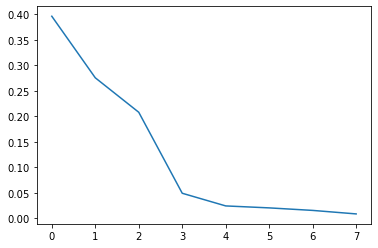

In [32]:
n_cols = 8
pca = PCA(n_components=n_cols)
pca.fit(X_train)
plt.plot(pca.explained_variance_ratio_)

주성분 3개를 이용한다!

In [33]:
pca = PCA(n_components=3)
train_pca = pca.fit_transform(X_train)
test_pca = pca.transform(X_test)

### Constructing Model
### [ RF, XGBOOST , LightGBM, CatBoost ]

1. RF

In [34]:
# 1. construction model
rf = RandomForestClassifier(n_jobs = -1, random_state = 12)

# 2. Stratified CV - with parameter tuning 
parameters ={
    "n_estimators" : [30, 60, 100, 300, 500, 1000, 2000],
    "max_features" : ["auto", "log2"],
    "max_depth" : [3,5,10,15,20,30,50],
    "min_samples_split" : [2,4,6,8,10,12],
    "min_samples_leaf" : [2,3,4,5]
}

n_iter_search = 10


## < RGS >
## settings
rf_sk_rgs = RandomizedSearchCV(rf,
                              param_distributions = parameters,
                              cv = str_kfold,
                              scoring = "accuracy",
                              n_jobs = -1,
                              random_state = 100,
                              n_iter = n_iter_search,
                              verbose = 1
                            )

## fitting
rf_sk_rgs.fit(train_pca, y_train)

# best parameters
rf_sk_rgs.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 500,
 'min_samples_split': 4,
 'min_samples_leaf': 2,
 'max_features': 'log2',
 'max_depth': 30}

In [35]:
## After RGS
## < GS >
## setting
parameters ={
    "n_estimators" : [400, 450, 500, 550, 600],
    "max_features" : ["log2"],
    "max_depth" :  [10,20,30,40,45,50],
    "min_samples_split" : [2,3,4,5,6],
    "min_samples_leaf" : [2,3]
}

rf_sk_gs = GridSearchCV(rf,
                       param_grid = parameters,
                       cv = str_kfold,
                       scoring = "accuracy",
                       n_jobs = -1,
                       verbose = 2)

## fitting
rf_sk_gs.fit(train_pca, y_train)

Fitting 10 folds for each of 300 candidates, totalling 3000 fits


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=100, shuffle=True),
             estimator=RandomForestClassifier(n_jobs=-1, random_state=12),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30, 40, 45, 50],
                         'max_features': ['log2'], 'min_samples_leaf': [2, 3],
                         'min_samples_split': [2, 3, 4, 5, 6],
                         'n_estimators': [400, 450, 500, 550, 600]},
             scoring='accuracy', verbose=2)

In [36]:
# the best model
rf_sk_best = rf_sk_gs.best_estimator_

# predict
rf_sk_pred = rf_sk_best.predict(test_pca)

# Check test error
rf_sk_accuracy = accuracy_score(y_test, rf_sk_pred)

In [50]:
rf_sk_accuracy

0.8026905829596412

2, XGBoost stratified K-fold Validation

In [37]:
# 1. Constructing Model
## with objective "logistic"
xgbc = XGBClassifier(n_jobs = -1,
                    use_label_encoder= False,
                    eval_metric = "error",
                    objective = "binary:logistic",
                    random_state = 100
                    )

## parameters
params = {
    "booster" : ["gbtree", "gblinear", "dart"],
    "n_estimators" : [50, 100,200,500],
    "learning_rate" : [0.1, 0.2,  0.3, 0.4, 0.5, 0.8],
    "max_depth" : [2,3,4,5,6,7,8],
    "min_child_weight" : [0.5,1, 2, 5, 10],
    "subsample":[0.3, 0.5, 0.7, 0.9],
    "colsample_bytree" : [0.3, 0.5, 0.7, 0.9],
    "reg_alpha" : [0, 0.5, 1, 10,0.1,0.01,0.0001],
    "reg_lambda" : [1, 0.5, 10, 0.1,0.01,0.0001]
}

n_iter_search = 10

## setting the model
xgbc_sk_rgs = RandomizedSearchCV(xgbc,
                                param_distributions = params,
                                cv = str_kfold,
                                scoring = "accuracy",
                                n_jobs = -1,
                                random_state = 100,
                                n_iter = n_iter_search,
                                verbose = 2
                                )

# 2. Fitting the model above
xgbc_sk_rgs.fit(np.ascontiguousarray(train_pca), np.ascontiguousarray(y_train))

# best parameters
xgbc_sk_rgs.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'subsample': 0.9,
 'reg_lambda': 0.0001,
 'reg_alpha': 10,
 'n_estimators': 200,
 'min_child_weight': 2,
 'max_depth': 7,
 'learning_rate': 0.3,
 'colsample_bytree': 0.3,
 'booster': 'gbtree'}

In [38]:
## After first RGS
## < Second RGS >

## setting
params = {
    "booster" : ["gbtree"],
    "n_estimators" : [80, 100, 150, 200, 250, 300],
    "learning_rate" : [0.2, 0.25, 0.3, 0.35, 0.4, 0.5],
    "max_depth" : [5,6,7,8,9,10],
    "min_child_weight" : [0.5, 1, 1.5, 2, 2.5, 3],
    "subsample":[0.5, 0.6, 0.7, 0.8, 0.9],
    "colsample_bytree" : [0.1,0.2,0.3,0.4, 0.5, 0.6],
    "reg_alpha" : [0, 0.5, 1, 10,0.1,5 ,3],
    "reg_lambda" : [1, 5, 7, 10, 13, 15]
}

n_iter_search = 20

xgbc_sk_rgs_2 = RandomizedSearchCV(xgbc,
                                  param_distributions = params,
                                  cv = str_kfold,
                                  scoring = "accuracy",
                                   n_jobs = -1,
                                   random_state = 100,
                                   n_iter = n_iter_search,
                                   verbose = 2
                                  )

## Fitting models
xgbc_sk_rgs_2.fit(np.ascontiguousarray(train_pca), np.ascontiguousarray(y_train))

Fitting 10 folds for each of 20 candidates, totalling 200 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=100, shuffle=True),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           eval_metric='error', gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,...
                   param_distributions={'booster': ['gbtree'],
                                        'colsample_bytree': [0.1, 0.2, 0.3, 0.4,
                                                             0.5, 0.6],
                                        'learning_ra

In [39]:
# The Best model
xgbc_best = xgbc_sk_rgs_2.best_estimator_

# Prediction
xgbc_pred = xgbc_sk_rgs_2.predict(np.ascontiguousarray(test_pca))

# Accuracy
xgbc_sk_accuracy = accuracy_score(y_test, xgbc_pred)
print(xgbc_sk_accuracy)

0.8251121076233184


3.  LightGBM with Stratified K-fold Cross Validation

In [40]:
# 1. Constructing model 
LGB_clf = LGBMClassifier(random_state = 200,
                        n_jobs = -1)

## setting
## parameters 
params = {
    "n_estimators" : [ 50, 80, 100, 150, 200, 300, 500 ],
    "learning_rate" : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
}

n_iter_search = 10

lgbm_rgs = RandomizedSearchCV(LGB_clf,
                             param_distributions = params,
                             cv = str_kfold,
                             scoring = "accuracy",
                             n_jobs = -1,
                             random_state = 300,
                             n_iter = n_iter_search,
                              verbose=2
                             )

# 2. fitting 
lgbm_rgs.fit(np.ascontiguousarray(train_pca), np.ascontiguousarray(y_train))

# best parameters
lgbm_rgs.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 100, 'learning_rate': 0.1}

In [41]:
## After RGS
## < GS >
## setting
params = {
    "n_estimators" : [ 50, 80, 100, 110, 130, 150 ],
    "learning_rate" : [0.03, 0.05, 0.07, 0.1, 0.13, 0.15, 0.2]
}

lgbm_gs = GridSearchCV(LGB_clf,
                      param_grid = params,
                      cv = str_kfold,
                      scoring = "accuracy",
                      n_jobs = -1,
                      verbose = 2
                      )

## fitting
lgbm_gs.fit(np.ascontiguousarray(train_pca), np.ascontiguousarray(y_train))

Fitting 10 folds for each of 42 candidates, totalling 420 fits


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=100, shuffle=True),
             estimator=LGBMClassifier(random_state=200), n_jobs=-1,
             param_grid={'learning_rate': [0.03, 0.05, 0.07, 0.1, 0.13, 0.15,
                                           0.2],
                         'n_estimators': [50, 80, 100, 110, 130, 150]},
             scoring='accuracy', verbose=2)

In [42]:
# The Best Model
lgbm_str_best = lgbm_gs.best_estimator_

# Prediction
lgbm_str_pred = lgbm_str_best.predict(np.ascontiguousarray(test_pca))

# Accuracy
lgbm_str_acc = accuracy_score(y_test, lgbm_str_pred)
print(lgbm_str_acc)

0.7982062780269058


4. CatBoost Stratified K-Fold Cross Validation

In [43]:
CB = CatBoostClassifier(loss_function = "CrossEntropy",
                        score_function = "L2",
                        verbose=True)



## setting 
params = {
    "iterations" : [2, 6, 10, 15, 20],
    'learning_rate': [0.03, 0.05, 0.07, 0.1, 0.13, 0.15],
    'depth': [3, 4, 5, 6], 
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    "one_hot_max_size" : [2,5,7,10],
}


CB_str_rgs_result = CB.randomized_search(param_distributions = params,
                                      X = train_pca,
                                      y = y_train,
                                      cv=str_kfold,
                                      n_iter=10,
                                      partition_random_seed=0, 
                                      train_size=0.8, 
                                      verbose=1)

# best parameters
CB_str_rgs_result["params"]

0:	learn: 0.6239566	test: 0.6274062	best: 0.6274062 (0)	total: 149ms	remaining: 149ms
1:	learn: 0.5762604	test: 0.5872886	best: 0.5872886 (1)	total: 150ms	remaining: 0us

bestTest = 0.5872885921
bestIteration = 1

0:	loss: 0.5872886	best: 0.5872886 (0)	total: 168ms	remaining: 1.51s
0:	learn: 0.6199320	test: 0.6258193	best: 0.6258193 (0)	total: 649us	remaining: 3.25ms
1:	learn: 0.5662897	test: 0.5791092	best: 0.5791092 (1)	total: 1.4ms	remaining: 2.8ms
2:	learn: 0.5322838	test: 0.5499490	best: 0.5499490 (2)	total: 2.21ms	remaining: 2.21ms
3:	learn: 0.4983506	test: 0.5200123	best: 0.5200123 (3)	total: 3.02ms	remaining: 1.51ms
4:	learn: 0.4796389	test: 0.5083883	best: 0.5083883 (4)	total: 3.76ms	remaining: 752us
5:	learn: 0.4651808	test: 0.5010322	best: 0.5010322 (5)	total: 4.49ms	remaining: 0us

bestTest = 0.5010322015
bestIteration = 5

1:	loss: 0.5010322	best: 0.5010322 (1)	total: 174ms	remaining: 696ms
0:	learn: 0.6631727	test: 0.6655606	best: 0.6655606 (0)	total: 914us	remaining: 914

0:	learn: 0.6184092	test: 0.6246164	best: 0.6246164 (0)
1:	learn: 0.5630040	test: 0.5734431	best: 0.5734431 (1)
2:	learn: 0.5243479	test: 0.5421461	best: 0.5421461 (2)
3:	learn: 0.4940305	test: 0.5158269	best: 0.5158269 (3)
4:	learn: 0.4728961	test: 0.5002906	best: 0.5002906 (4)
5:	learn: 0.4569600	test: 0.4870825	best: 0.4870825 (5)
6:	learn: 0.4436731	test: 0.4781567	best: 0.4781567 (6)
7:	learn: 0.4342798	test: 0.4716752	best: 0.4716752 (7)
8:	learn: 0.4254725	test: 0.4659248	best: 0.4659248 (8)
9:	learn: 0.4192550	test: 0.4630150	best: 0.4630150 (9)
10:	learn: 0.4132773	test: 0.4614921	best: 0.4614921 (10)
11:	learn: 0.4082899	test: 0.4600598	best: 0.4600598 (11)
12:	learn: 0.4040438	test: 0.4585682	best: 0.4585682 (12)
13:	learn: 0.3990163	test: 0.4579533	best: 0.4579533 (13)
14:	learn: 0.3960447	test: 0.4579499	best: 0.4579499 (14)	total: 276ms	remaining: 0us


{'depth': 5,
 'one_hot_max_size': 7,
 'l2_leaf_reg': 1,
 'iterations': 15,
 'learning_rate': 0.13}

In [44]:
CB = CatBoostClassifier(loss_function = "CrossEntropy",
                        score_function = "L2",
                        verbose=True)

grid = {
    "iterations" : [5, 10, 15, 20, 25],
    'learning_rate': [ 0.07, 0.1, 0.13, 0.15, 0.2, 0.25],
    'depth': [3, 4, 5, 6, 7], 
    'l2_leaf_reg': [1, 2, 3, 4],
    "one_hot_max_size" : [5,6,7,8,9],
}

CB_str_gs_result = CB.grid_search( param_grid=grid,
                                 X = train_pca,
                                 y = y_train,
                                 cv = str_kfold,
                                 partition_random_seed=0,
                                 train_size=0.8,
                                 verbose=1)

CB_str_gs_result["params"]

0:	learn: 0.6518953	test: 0.6549232	best: 0.6549232 (0)	total: 718us	remaining: 2.88ms
1:	learn: 0.6205016	test: 0.6271318	best: 0.6271318 (1)	total: 1.75ms	remaining: 2.63ms
2:	learn: 0.5934156	test: 0.6028791	best: 0.6028791 (2)	total: 2.54ms	remaining: 1.69ms
3:	learn: 0.5700119	test: 0.5813177	best: 0.5813177 (3)	total: 3.29ms	remaining: 823us
4:	learn: 0.5435300	test: 0.5537686	best: 0.5537686 (4)	total: 4.1ms	remaining: 0us

bestTest = 0.5537686047
bestIteration = 4

0:	loss: 0.5537686	best: 0.5537686 (0)	total: 16.6ms	remaining: 49.9s
0:	learn: 0.6518953	test: 0.6549232	best: 0.6549232 (0)	total: 667us	remaining: 2.67ms
1:	learn: 0.6205016	test: 0.6271318	best: 0.6271318 (1)	total: 1.33ms	remaining: 1.99ms
2:	learn: 0.5934156	test: 0.6028791	best: 0.6028791 (2)	total: 2.03ms	remaining: 1.35ms
3:	learn: 0.5700119	test: 0.5813177	best: 0.5813177 (3)	total: 2.89ms	remaining: 722us
4:	learn: 0.5435300	test: 0.5537686	best: 0.5537686 (4)	total: 3.68ms	remaining: 0us

bestTest = 0.553

3:	learn: 0.5022563	test: 0.5190349	best: 0.5190349 (3)	total: 2.97ms	remaining: 743us
4:	learn: 0.4835056	test: 0.5067391	best: 0.5067391 (4)	total: 3.62ms	remaining: 0us

bestTest = 0.506739133
bestIteration = 4

42:	loss: 0.5067391	best: 0.4845816 (25)	total: 195ms	remaining: 13.4s
0:	learn: 0.6199721	test: 0.6258525	best: 0.6258525 (0)	total: 606us	remaining: 2.43ms
1:	learn: 0.5665340	test: 0.5781451	best: 0.5781451 (1)	total: 1.24ms	remaining: 1.86ms
2:	learn: 0.5296984	test: 0.5447985	best: 0.5447985 (2)	total: 1.9ms	remaining: 1.26ms
3:	learn: 0.5022563	test: 0.5190349	best: 0.5190349 (3)	total: 2.58ms	remaining: 644us
4:	learn: 0.4835056	test: 0.5067391	best: 0.5067391 (4)	total: 3.22ms	remaining: 0us

bestTest = 0.506739133
bestIteration = 4

43:	loss: 0.5067391	best: 0.4845816 (25)	total: 199ms	remaining: 13.4s
0:	learn: 0.6199721	test: 0.6258525	best: 0.6258525 (0)	total: 563us	remaining: 2.25ms
1:	learn: 0.5665340	test: 0.5781451	best: 0.5781451 (1)	total: 1.17ms	remaining

1:	learn: 0.5061264	test: 0.5325137	best: 0.5325137 (1)	total: 1.66ms	remaining: 2.49ms
2:	learn: 0.4726794	test: 0.5078648	best: 0.5078648 (2)	total: 2.41ms	remaining: 1.61ms
3:	learn: 0.4487203	test: 0.4910737	best: 0.4910737 (3)	total: 3.15ms	remaining: 788us
4:	learn: 0.4343002	test: 0.4831113	best: 0.4831113 (4)	total: 3.8ms	remaining: 0us

bestTest = 0.4831112978
bestIteration = 4

87:	loss: 0.4831113	best: 0.4831113 (85)	total: 380ms	remaining: 12.6s
0:	learn: 0.5652168	test: 0.5775125	best: 0.5775125 (0)	total: 556us	remaining: 2.23ms
1:	learn: 0.5061264	test: 0.5325137	best: 0.5325137 (1)	total: 1.19ms	remaining: 1.79ms
2:	learn: 0.4726794	test: 0.5078648	best: 0.5078648 (2)	total: 1.92ms	remaining: 1.28ms
3:	learn: 0.4487203	test: 0.4910737	best: 0.4910737 (3)	total: 2.56ms	remaining: 639us
4:	learn: 0.4343002	test: 0.4831113	best: 0.4831113 (4)	total: 3.19ms	remaining: 0us

bestTest = 0.4831112978
bestIteration = 4

88:	loss: 0.4831113	best: 0.4831113 (85)	total: 385ms	remai

6:	learn: 0.4777701	test: 0.5046546	best: 0.5046546 (6)	total: 4.7ms	remaining: 2.01ms
7:	learn: 0.4667248	test: 0.4981945	best: 0.4981945 (7)	total: 5.37ms	remaining: 1.34ms
8:	learn: 0.4584576	test: 0.4946331	best: 0.4946331 (8)	total: 5.99ms	remaining: 665us
9:	learn: 0.4501689	test: 0.4879924	best: 0.4879924 (9)	total: 6.58ms	remaining: 0us

bestTest = 0.487992403
bestIteration = 9

126:	loss: 0.4879924	best: 0.4807227 (110)	total: 563ms	remaining: 12.7s
0:	learn: 0.6355247	test: 0.6399521	best: 0.6399521 (0)	total: 579us	remaining: 5.21ms
1:	learn: 0.5897060	test: 0.5994122	best: 0.5994122 (1)	total: 1.18ms	remaining: 4.71ms
2:	learn: 0.5561690	test: 0.5682986	best: 0.5682986 (2)	total: 1.76ms	remaining: 4.12ms
3:	learn: 0.5310436	test: 0.5489535	best: 0.5489535 (3)	total: 2.39ms	remaining: 3.58ms
4:	learn: 0.5098930	test: 0.5332134	best: 0.5332134 (4)	total: 3.02ms	remaining: 3.02ms
5:	learn: 0.4907537	test: 0.5149320	best: 0.5149320 (5)	total: 3.68ms	remaining: 2.45ms
6:	learn: 

7:	learn: 0.5014535	test: 0.5205315	best: 0.5205315 (7)	total: 5.06ms	remaining: 1.26ms
8:	learn: 0.4905499	test: 0.5104874	best: 0.5104874 (8)	total: 5.68ms	remaining: 630us
9:	learn: 0.4819880	test: 0.5031103	best: 0.5031103 (9)	total: 6.32ms	remaining: 0us

bestTest = 0.5031102625
bestIteration = 9

151:	loss: 0.5031103	best: 0.4807227 (110)	total: 747ms	remaining: 14s
0:	learn: 0.6519195	test: 0.6549440	best: 0.6549440 (0)	total: 557us	remaining: 5.02ms
1:	learn: 0.6205228	test: 0.6271493	best: 0.6271493 (1)	total: 1.13ms	remaining: 4.53ms
2:	learn: 0.5943959	test: 0.6028753	best: 0.6028753 (2)	total: 1.86ms	remaining: 4.35ms
3:	learn: 0.5723240	test: 0.5825864	best: 0.5825864 (3)	total: 2.48ms	remaining: 3.71ms
4:	learn: 0.5517342	test: 0.5646655	best: 0.5646655 (4)	total: 3.06ms	remaining: 3.06ms
5:	learn: 0.5326095	test: 0.5488700	best: 0.5488700 (5)	total: 3.64ms	remaining: 2.42ms
6:	learn: 0.5168113	test: 0.5357399	best: 0.5357399 (6)	total: 4.26ms	remaining: 1.83ms
7:	learn: 

6:	learn: 0.4228914	test: 0.4835564	best: 0.4835564 (6)	total: 4.63ms	remaining: 1.98ms
7:	learn: 0.4210012	test: 0.4841095	best: 0.4835564 (6)	total: 5.29ms	remaining: 1.32ms
8:	learn: 0.4175317	test: 0.4872142	best: 0.4835564 (6)	total: 5.96ms	remaining: 661us
9:	learn: 0.4139536	test: 0.4860676	best: 0.4835564 (6)	total: 6.57ms	remaining: 0us

bestTest = 0.4835563724
bestIteration = 6

176:	loss: 0.4835564	best: 0.4737233 (170)	total: 933ms	remaining: 14.9s
0:	learn: 0.5652229	test: 0.5775175	best: 0.5775175 (0)	total: 639us	remaining: 5.75ms
1:	learn: 0.5061028	test: 0.5325293	best: 0.5325293 (1)	total: 1.26ms	remaining: 5.03ms
2:	learn: 0.4732700	test: 0.5114056	best: 0.5114056 (2)	total: 1.88ms	remaining: 4.38ms
3:	learn: 0.4499655	test: 0.4999341	best: 0.4999341 (3)	total: 2.47ms	remaining: 3.71ms
4:	learn: 0.4365927	test: 0.4897901	best: 0.4897901 (4)	total: 3.11ms	remaining: 3.11ms
5:	learn: 0.4275025	test: 0.4843069	best: 0.4843069 (5)	total: 3.78ms	remaining: 2.52ms
6:	learn

6:	learn: 0.4302280	test: 0.4794310	best: 0.4794310 (6)	total: 4.63ms	remaining: 1.99ms
7:	learn: 0.4266269	test: 0.4758849	best: 0.4758849 (7)	total: 5.29ms	remaining: 1.32ms
8:	learn: 0.4227720	test: 0.4747736	best: 0.4747736 (8)	total: 5.97ms	remaining: 663us
9:	learn: 0.4184285	test: 0.4757294	best: 0.4747736 (8)	total: 6.63ms	remaining: 0us

bestTest = 0.4747736048
bestIteration = 8

200:	loss: 0.4747736	best: 0.4737233 (170)	total: 1.12s	remaining: 15.6s
0:	learn: 0.5865766	test: 0.5960888	best: 0.5960888 (0)	total: 596us	remaining: 5.37ms
1:	learn: 0.5292717	test: 0.5490401	best: 0.5490401 (1)	total: 1.19ms	remaining: 4.77ms
2:	learn: 0.4927715	test: 0.5197433	best: 0.5197433 (2)	total: 1.89ms	remaining: 4.42ms
3:	learn: 0.4658816	test: 0.4979530	best: 0.4979530 (3)	total: 2.5ms	remaining: 3.75ms
4:	learn: 0.4472841	test: 0.4850602	best: 0.4850602 (4)	total: 3.12ms	remaining: 3.12ms
5:	learn: 0.4399354	test: 0.4830968	best: 0.4830968 (5)	total: 3.77ms	remaining: 2.51ms
6:	learn:

2:	learn: 0.5358452	test: 0.5533358	best: 0.5533358 (2)	total: 2.56ms	remaining: 5.96ms
3:	learn: 0.5069164	test: 0.5284573	best: 0.5284573 (3)	total: 3.39ms	remaining: 5.09ms
4:	learn: 0.4863196	test: 0.5138263	best: 0.5138263 (4)	total: 4.37ms	remaining: 4.37ms
5:	learn: 0.4713552	test: 0.5015390	best: 0.5015390 (5)	total: 5.09ms	remaining: 3.4ms
6:	learn: 0.4604713	test: 0.4956874	best: 0.4956874 (6)	total: 5.97ms	remaining: 2.56ms
7:	learn: 0.4515322	test: 0.4918796	best: 0.4918796 (7)	total: 6.72ms	remaining: 1.68ms
8:	learn: 0.4435955	test: 0.4859411	best: 0.4859411 (8)	total: 7.49ms	remaining: 832us
9:	learn: 0.4393473	test: 0.4853743	best: 0.4853743 (9)	total: 8.15ms	remaining: 0us

bestTest = 0.4853742513
bestIteration = 9

221:	loss: 0.4853743	best: 0.4737233 (170)	total: 1.31s	remaining: 16.4s
0:	learn: 0.6199379	test: 0.6258238	best: 0.6258238 (0)	total: 633us	remaining: 5.7ms
1:	learn: 0.5725345	test: 0.5859950	best: 0.5859950 (1)	total: 1.3ms	remaining: 5.19ms
2:	learn: 0

6:	learn: 0.5118926	test: 0.5282501	best: 0.5282501 (6)	total: 4.71ms	remaining: 5.38ms
7:	learn: 0.4994792	test: 0.5189168	best: 0.5189168 (7)	total: 5.31ms	remaining: 4.65ms
8:	learn: 0.4909993	test: 0.5128115	best: 0.5128115 (8)	total: 6.1ms	remaining: 4.07ms
9:	learn: 0.4811543	test: 0.5048817	best: 0.5048817 (9)	total: 6.77ms	remaining: 3.38ms
10:	learn: 0.4715682	test: 0.4981966	best: 0.4981966 (10)	total: 7.53ms	remaining: 2.74ms
11:	learn: 0.4659011	test: 0.4940963	best: 0.4940963 (11)	total: 8.15ms	remaining: 2.04ms
12:	learn: 0.4598841	test: 0.4909987	best: 0.4909987 (12)	total: 8.78ms	remaining: 1.35ms
13:	learn: 0.4540796	test: 0.4859843	best: 0.4859843 (13)	total: 9.41ms	remaining: 672us
14:	learn: 0.4506017	test: 0.4840802	best: 0.4840802 (14)	total: 10.1ms	remaining: 0us

bestTest = 0.4840801588
bestIteration = 14

241:	loss: 0.4840802	best: 0.4737233 (170)	total: 1.49s	remaining: 17s
0:	learn: 0.6518953	test: 0.6549232	best: 0.6549232 (0)	total: 616us	remaining: 8.63ms


1:	learn: 0.5585884	test: 0.5732304	best: 0.5732304 (1)	total: 1.66ms	remaining: 10.8ms
2:	learn: 0.5201613	test: 0.5403984	best: 0.5403984 (2)	total: 2.35ms	remaining: 9.41ms
3:	learn: 0.4850265	test: 0.5102525	best: 0.5102525 (3)	total: 3.09ms	remaining: 8.5ms
4:	learn: 0.4670534	test: 0.5003070	best: 0.5003070 (4)	total: 3.89ms	remaining: 7.78ms
5:	learn: 0.4526771	test: 0.4937819	best: 0.4937819 (5)	total: 4.68ms	remaining: 7.02ms
6:	learn: 0.4433018	test: 0.4879033	best: 0.4879033 (6)	total: 5.36ms	remaining: 6.12ms
7:	learn: 0.4388565	test: 0.4824322	best: 0.4824322 (7)	total: 6.1ms	remaining: 5.34ms
8:	learn: 0.4315564	test: 0.4819426	best: 0.4819426 (8)	total: 6.87ms	remaining: 4.58ms
9:	learn: 0.4265526	test: 0.4834292	best: 0.4819426 (8)	total: 7.49ms	remaining: 3.75ms
10:	learn: 0.4234570	test: 0.4835734	best: 0.4819426 (8)	total: 8.06ms	remaining: 2.93ms
11:	learn: 0.4184305	test: 0.4841137	best: 0.4819426 (8)	total: 8.69ms	remaining: 2.17ms
12:	learn: 0.4153096	test: 0.484

10:	learn: 0.4748980	test: 0.4977199	best: 0.4977199 (10)	total: 7.18ms	remaining: 2.61ms
11:	learn: 0.4687736	test: 0.4929702	best: 0.4929702 (11)	total: 7.8ms	remaining: 1.95ms
12:	learn: 0.4614506	test: 0.4882293	best: 0.4882293 (12)	total: 8.44ms	remaining: 1.3ms
13:	learn: 0.4553899	test: 0.4833723	best: 0.4833723 (13)	total: 9.05ms	remaining: 646us
14:	learn: 0.4514187	test: 0.4824833	best: 0.4824833 (14)	total: 9.76ms	remaining: 0us

bestTest = 0.4824832745
bestIteration = 14

273:	loss: 0.4824833	best: 0.4737233 (170)	total: 1.86s	remaining: 18.5s
0:	learn: 0.6519195	test: 0.6549440	best: 0.6549440 (0)	total: 551us	remaining: 7.72ms
1:	learn: 0.6205228	test: 0.6271493	best: 0.6271493 (1)	total: 1.22ms	remaining: 7.9ms
2:	learn: 0.5943959	test: 0.6028753	best: 0.6028753 (2)	total: 1.84ms	remaining: 7.38ms
3:	learn: 0.5723240	test: 0.5825864	best: 0.5825864 (3)	total: 2.46ms	remaining: 6.77ms
4:	learn: 0.5517342	test: 0.5646655	best: 0.5646655 (4)	total: 3.07ms	remaining: 6.14ms


2:	learn: 0.5217528	test: 0.5421139	best: 0.5421139 (2)	total: 2.21ms	remaining: 8.84ms
3:	learn: 0.4955535	test: 0.5222921	best: 0.5222921 (3)	total: 2.84ms	remaining: 7.81ms
4:	learn: 0.4735395	test: 0.5029661	best: 0.5029661 (4)	total: 3.47ms	remaining: 6.94ms
5:	learn: 0.4606581	test: 0.4965241	best: 0.4965241 (5)	total: 4.12ms	remaining: 6.19ms
6:	learn: 0.4474825	test: 0.4890917	best: 0.4890917 (6)	total: 4.78ms	remaining: 5.46ms
7:	learn: 0.4406848	test: 0.4859253	best: 0.4859253 (7)	total: 5.43ms	remaining: 4.75ms
8:	learn: 0.4335682	test: 0.4802830	best: 0.4802830 (8)	total: 6.11ms	remaining: 4.07ms
9:	learn: 0.4285868	test: 0.4809415	best: 0.4802830 (8)	total: 6.75ms	remaining: 3.38ms
10:	learn: 0.4248391	test: 0.4818451	best: 0.4802830 (8)	total: 7.46ms	remaining: 2.71ms
11:	learn: 0.4225021	test: 0.4804707	best: 0.4802830 (8)	total: 8.25ms	remaining: 2.06ms
12:	learn: 0.4199288	test: 0.4808716	best: 0.4802830 (8)	total: 8.86ms	remaining: 1.36ms
13:	learn: 0.4157384	test: 0.


bestTest = 0.4797322471
bestIteration = 14

305:	loss: 0.4797322	best: 0.4729403 (290)	total: 2.23s	remaining: 19.6s
0:	learn: 0.6355540	test: 0.6399766	best: 0.6399766 (0)	total: 561us	remaining: 7.86ms
1:	learn: 0.5901398	test: 0.5988737	best: 0.5988737 (1)	total: 1.29ms	remaining: 8.37ms
2:	learn: 0.5561320	test: 0.5674723	best: 0.5674723 (2)	total: 1.93ms	remaining: 7.71ms
3:	learn: 0.5308626	test: 0.5449989	best: 0.5449989 (3)	total: 2.6ms	remaining: 7.16ms
4:	learn: 0.5110636	test: 0.5305172	best: 0.5305172 (4)	total: 3.24ms	remaining: 6.49ms
5:	learn: 0.4956070	test: 0.5176068	best: 0.5176068 (5)	total: 3.91ms	remaining: 5.87ms
6:	learn: 0.4790936	test: 0.5018829	best: 0.5018829 (6)	total: 4.55ms	remaining: 5.2ms
7:	learn: 0.4677896	test: 0.4945218	best: 0.4945218 (7)	total: 5.18ms	remaining: 4.53ms
8:	learn: 0.4579463	test: 0.4880761	best: 0.4880761 (8)	total: 5.81ms	remaining: 3.88ms
9:	learn: 0.4524630	test: 0.4862392	best: 0.4862392 (9)	total: 6.48ms	remaining: 3.24ms
10:	l


bestTest = 0.4747736048
bestIteration = 8

321:	loss: 0.4747736	best: 0.4729187 (310)	total: 2.41s	remaining: 20.1s
0:	learn: 0.5865766	test: 0.5960888	best: 0.5960888 (0)	total: 580us	remaining: 8.13ms
1:	learn: 0.5292717	test: 0.5490401	best: 0.5490401 (1)	total: 1.23ms	remaining: 7.98ms
2:	learn: 0.4927715	test: 0.5197433	best: 0.5197433 (2)	total: 1.93ms	remaining: 7.72ms
3:	learn: 0.4658816	test: 0.4979530	best: 0.4979530 (3)	total: 2.62ms	remaining: 7.21ms
4:	learn: 0.4472841	test: 0.4850602	best: 0.4850602 (4)	total: 3.44ms	remaining: 6.89ms
5:	learn: 0.4399354	test: 0.4830968	best: 0.4830968 (5)	total: 4.08ms	remaining: 6.12ms
6:	learn: 0.4302280	test: 0.4794310	best: 0.4794310 (6)	total: 4.83ms	remaining: 5.53ms
7:	learn: 0.4266269	test: 0.4758849	best: 0.4758849 (7)	total: 5.59ms	remaining: 4.89ms
8:	learn: 0.4227720	test: 0.4747736	best: 0.4747736 (8)	total: 6.25ms	remaining: 4.17ms
9:	learn: 0.4184285	test: 0.4757294	best: 0.4747736 (8)	total: 6.95ms	remaining: 3.48ms
10:	

11:	learn: 0.4436214	test: 0.4833571	best: 0.4833571 (11)	total: 7.72ms	remaining: 1.93ms
12:	learn: 0.4387414	test: 0.4821631	best: 0.4821631 (12)	total: 8.39ms	remaining: 1.29ms
13:	learn: 0.4348279	test: 0.4812829	best: 0.4812829 (13)	total: 9.11ms	remaining: 650us
14:	learn: 0.4314831	test: 0.4791796	best: 0.4791796 (14)	total: 9.74ms	remaining: 0us

bestTest = 0.4791796022
bestIteration = 14

338:	loss: 0.4791796	best: 0.4729187 (310)	total: 2.6s	remaining: 20.4s
0:	learn: 0.6355295	test: 0.6399558	best: 0.6399558 (0)	total: 576us	remaining: 8.06ms
1:	learn: 0.5952417	test: 0.6055126	best: 0.6055126 (1)	total: 1.36ms	remaining: 8.86ms
2:	learn: 0.5623945	test: 0.5765928	best: 0.5765928 (2)	total: 2.02ms	remaining: 8.06ms
3:	learn: 0.5334374	test: 0.5505399	best: 0.5505399 (3)	total: 2.68ms	remaining: 7.37ms
4:	learn: 0.5126414	test: 0.5347890	best: 0.5347890 (4)	total: 3.33ms	remaining: 6.66ms
5:	learn: 0.4949270	test: 0.5178647	best: 0.5178647 (5)	total: 4.05ms	remaining: 6.08ms


9:	learn: 0.4155998	test: 0.4906561	best: 0.4848426 (6)	total: 6.42ms	remaining: 3.21ms
10:	learn: 0.4130290	test: 0.4920661	best: 0.4848426 (6)	total: 7.04ms	remaining: 2.56ms
11:	learn: 0.4113372	test: 0.4966987	best: 0.4848426 (6)	total: 7.8ms	remaining: 1.95ms
12:	learn: 0.4090157	test: 0.4939754	best: 0.4848426 (6)	total: 8.51ms	remaining: 1.31ms
13:	learn: 0.4081741	test: 0.4957153	best: 0.4848426 (6)	total: 9.16ms	remaining: 654us
14:	learn: 0.4059206	test: 0.4970111	best: 0.4848426 (6)	total: 9.83ms	remaining: 0us

bestTest = 0.4848426142
bestIteration = 6

355:	loss: 0.4848426	best: 0.4725963 (350)	total: 2.79s	remaining: 20.7s
0:	learn: 0.5651719	test: 0.5774796	best: 0.5774796 (0)	total: 573us	remaining: 8.03ms
1:	learn: 0.5049217	test: 0.5289741	best: 0.5289741 (1)	total: 1.21ms	remaining: 7.89ms
2:	learn: 0.4729174	test: 0.5079343	best: 0.5079343 (2)	total: 1.88ms	remaining: 7.52ms
3:	learn: 0.4499190	test: 0.4967259	best: 0.4967259 (3)	total: 2.51ms	remaining: 6.91ms
4:	l

9:	learn: 0.4501689	test: 0.4879924	best: 0.4879924 (9)	total: 6.69ms	remaining: 6.69ms
10:	learn: 0.4444153	test: 0.4847925	best: 0.4847925 (10)	total: 7.37ms	remaining: 6.03ms
11:	learn: 0.4365865	test: 0.4807604	best: 0.4807604 (11)	total: 8.18ms	remaining: 5.45ms
12:	learn: 0.4326101	test: 0.4801623	best: 0.4801623 (12)	total: 8.89ms	remaining: 4.78ms
13:	learn: 0.4284191	test: 0.4794063	best: 0.4794063 (13)	total: 9.53ms	remaining: 4.08ms
14:	learn: 0.4256622	test: 0.4787952	best: 0.4787952 (14)	total: 10.2ms	remaining: 3.41ms
15:	learn: 0.4231142	test: 0.4778102	best: 0.4778102 (15)	total: 10.9ms	remaining: 2.73ms
16:	learn: 0.4198485	test: 0.4758781	best: 0.4758781 (16)	total: 11.7ms	remaining: 2.06ms
17:	learn: 0.4161332	test: 0.4767627	best: 0.4758781 (16)	total: 12.4ms	remaining: 1.38ms
18:	learn: 0.4140066	test: 0.4749945	best: 0.4749945 (18)	total: 13ms	remaining: 685us
19:	learn: 0.4119110	test: 0.4765610	best: 0.4749945 (18)	total: 13.8ms	remaining: 0us

bestTest = 0.4749

7:	learn: 0.4253311	test: 0.4873542	best: 0.4873542 (7)	total: 5.29ms	remaining: 7.93ms
8:	learn: 0.4183428	test: 0.4855072	best: 0.4855072 (8)	total: 5.97ms	remaining: 7.29ms
9:	learn: 0.4146619	test: 0.4879146	best: 0.4855072 (8)	total: 6.63ms	remaining: 6.63ms
10:	learn: 0.4103150	test: 0.4891021	best: 0.4855072 (8)	total: 7.32ms	remaining: 5.99ms
11:	learn: 0.4076497	test: 0.4947291	best: 0.4855072 (8)	total: 8.07ms	remaining: 5.38ms
12:	learn: 0.4031862	test: 0.4876478	best: 0.4855072 (8)	total: 8.7ms	remaining: 4.69ms
13:	learn: 0.4019895	test: 0.4901284	best: 0.4855072 (8)	total: 9.32ms	remaining: 3.99ms
14:	learn: 0.3999916	test: 0.4906747	best: 0.4855072 (8)	total: 10.1ms	remaining: 3.36ms
15:	learn: 0.3974335	test: 0.4934610	best: 0.4855072 (8)	total: 10.7ms	remaining: 2.68ms
16:	learn: 0.3948196	test: 0.4942214	best: 0.4855072 (8)	total: 11.3ms	remaining: 2ms
17:	learn: 0.3941043	test: 0.4937094	best: 0.4855072 (8)	total: 12ms	remaining: 1.33ms
18:	learn: 0.3925007	test: 0.4

6:	learn: 0.4794404	test: 0.5053615	best: 0.5053615 (6)	total: 4.54ms	remaining: 8.43ms
7:	learn: 0.4696321	test: 0.4994813	best: 0.4994813 (7)	total: 5.19ms	remaining: 7.78ms
8:	learn: 0.4591936	test: 0.4930159	best: 0.4930159 (8)	total: 5.85ms	remaining: 7.15ms
9:	learn: 0.4520516	test: 0.4886148	best: 0.4886148 (9)	total: 6.5ms	remaining: 6.5ms
10:	learn: 0.4468307	test: 0.4861349	best: 0.4861349 (10)	total: 7.19ms	remaining: 5.88ms
11:	learn: 0.4412286	test: 0.4827513	best: 0.4827513 (11)	total: 7.82ms	remaining: 5.21ms
12:	learn: 0.4387275	test: 0.4812696	best: 0.4812696 (12)	total: 8.46ms	remaining: 4.55ms
13:	learn: 0.4348254	test: 0.4809692	best: 0.4809692 (13)	total: 9.09ms	remaining: 3.9ms
14:	learn: 0.4330953	test: 0.4807666	best: 0.4807666 (14)	total: 9.7ms	remaining: 3.23ms
15:	learn: 0.4303568	test: 0.4793179	best: 0.4793179 (15)	total: 10.3ms	remaining: 2.58ms
16:	learn: 0.4280342	test: 0.4805277	best: 0.4793179 (15)	total: 10.9ms	remaining: 1.93ms
17:	learn: 0.4248591	t

5:	learn: 0.4606581	test: 0.4965241	best: 0.4965241 (5)	total: 4.14ms	remaining: 9.66ms
6:	learn: 0.4474825	test: 0.4890917	best: 0.4890917 (6)	total: 4.81ms	remaining: 8.93ms
7:	learn: 0.4406848	test: 0.4859253	best: 0.4859253 (7)	total: 5.46ms	remaining: 8.18ms
8:	learn: 0.4335682	test: 0.4802830	best: 0.4802830 (8)	total: 6.24ms	remaining: 7.62ms
9:	learn: 0.4285868	test: 0.4809415	best: 0.4802830 (8)	total: 6.95ms	remaining: 6.95ms
10:	learn: 0.4248391	test: 0.4818451	best: 0.4802830 (8)	total: 7.58ms	remaining: 6.2ms
11:	learn: 0.4225021	test: 0.4804707	best: 0.4802830 (8)	total: 8.19ms	remaining: 5.46ms
12:	learn: 0.4199288	test: 0.4808716	best: 0.4802830 (8)	total: 8.82ms	remaining: 4.75ms
13:	learn: 0.4157384	test: 0.4790972	best: 0.4790972 (13)	total: 9.46ms	remaining: 4.05ms
14:	learn: 0.4128129	test: 0.4750237	best: 0.4750237 (14)	total: 10.1ms	remaining: 3.35ms
15:	learn: 0.4102804	test: 0.4746319	best: 0.4746319 (15)	total: 10.8ms	remaining: 2.69ms
16:	learn: 0.4054201	tes

5:	learn: 0.5297240	test: 0.5458748	best: 0.5458748 (5)	total: 3.95ms	remaining: 9.21ms
6:	learn: 0.5141245	test: 0.5331158	best: 0.5331158 (6)	total: 4.55ms	remaining: 8.45ms
7:	learn: 0.5007936	test: 0.5225915	best: 0.5225915 (7)	total: 5.19ms	remaining: 7.79ms
8:	learn: 0.4918352	test: 0.5156045	best: 0.5156045 (8)	total: 5.83ms	remaining: 7.13ms
9:	learn: 0.4832426	test: 0.5100269	best: 0.5100269 (9)	total: 6.57ms	remaining: 6.57ms
10:	learn: 0.4747538	test: 0.5038259	best: 0.5038259 (10)	total: 7.28ms	remaining: 5.96ms
11:	learn: 0.4684570	test: 0.4987954	best: 0.4987954 (11)	total: 7.89ms	remaining: 5.26ms
12:	learn: 0.4613502	test: 0.4940143	best: 0.4940143 (12)	total: 8.54ms	remaining: 4.6ms
13:	learn: 0.4560094	test: 0.4904210	best: 0.4904210 (13)	total: 9.16ms	remaining: 3.93ms
14:	learn: 0.4518887	test: 0.4894776	best: 0.4894776 (14)	total: 9.77ms	remaining: 3.26ms
15:	learn: 0.4486989	test: 0.4878428	best: 0.4878428 (15)	total: 10.5ms	remaining: 2.62ms
16:	learn: 0.4456034	

7:	learn: 0.4494844	test: 0.4831337	best: 0.4831337 (7)	total: 5.25ms	remaining: 7.88ms
8:	learn: 0.4405191	test: 0.4785236	best: 0.4785236 (8)	total: 5.91ms	remaining: 7.22ms
9:	learn: 0.4346567	test: 0.4775447	best: 0.4775447 (9)	total: 6.56ms	remaining: 6.56ms
10:	learn: 0.4293885	test: 0.4760189	best: 0.4760189 (10)	total: 7.33ms	remaining: 6ms
11:	learn: 0.4261878	test: 0.4749808	best: 0.4749808 (11)	total: 8.1ms	remaining: 5.4ms
12:	learn: 0.4225601	test: 0.4752930	best: 0.4749808 (11)	total: 8.78ms	remaining: 4.73ms
13:	learn: 0.4213294	test: 0.4751155	best: 0.4749808 (11)	total: 9.36ms	remaining: 4.01ms
14:	learn: 0.4181254	test: 0.4729187	best: 0.4729187 (14)	total: 9.98ms	remaining: 3.33ms
15:	learn: 0.4173689	test: 0.4735724	best: 0.4729187 (14)	total: 10.7ms	remaining: 2.67ms
16:	learn: 0.4157876	test: 0.4766692	best: 0.4729187 (14)	total: 11.4ms	remaining: 2.01ms
17:	learn: 0.4136092	test: 0.4772934	best: 0.4729187 (14)	total: 12.1ms	remaining: 1.34ms
18:	learn: 0.4116927	

6:	learn: 0.4226532	test: 0.4784148	best: 0.4784148 (6)	total: 4.73ms	remaining: 8.79ms
7:	learn: 0.4190621	test: 0.4791494	best: 0.4784148 (6)	total: 5.38ms	remaining: 8.08ms
8:	learn: 0.4160246	test: 0.4792980	best: 0.4784148 (6)	total: 5.99ms	remaining: 7.32ms
9:	learn: 0.4143477	test: 0.4771239	best: 0.4771239 (9)	total: 6.62ms	remaining: 6.62ms
10:	learn: 0.4107860	test: 0.4777109	best: 0.4771239 (9)	total: 7.51ms	remaining: 6.14ms
11:	learn: 0.4091670	test: 0.4776106	best: 0.4771239 (9)	total: 8.16ms	remaining: 5.44ms
12:	learn: 0.4060147	test: 0.4790739	best: 0.4771239 (9)	total: 8.77ms	remaining: 4.72ms
13:	learn: 0.4018312	test: 0.4785310	best: 0.4771239 (9)	total: 9.38ms	remaining: 4.02ms
14:	learn: 0.3997330	test: 0.4810729	best: 0.4771239 (9)	total: 10.1ms	remaining: 3.35ms
15:	learn: 0.3992976	test: 0.4815732	best: 0.4771239 (9)	total: 10.7ms	remaining: 2.68ms
16:	learn: 0.3971322	test: 0.4837756	best: 0.4771239 (9)	total: 11.5ms	remaining: 2.02ms
17:	learn: 0.3936720	test

19:	learn: 0.4189529	test: 0.4793522	best: 0.4784000 (15)	total: 12.9ms	remaining: 0us

bestTest = 0.4784000425
bestIteration = 15

459:	loss: 0.4784000	best: 0.4722799 (435)	total: 4.28s	remaining: 23.6s
0:	learn: 0.6199379	test: 0.6258238	best: 0.6258238 (0)	total: 735us	remaining: 14ms
1:	learn: 0.5725345	test: 0.5859950	best: 0.5859950 (1)	total: 1.41ms	remaining: 12.7ms
2:	learn: 0.5358452	test: 0.5533358	best: 0.5533358 (2)	total: 2.05ms	remaining: 11.6ms
3:	learn: 0.5069164	test: 0.5284573	best: 0.5284573 (3)	total: 2.67ms	remaining: 10.7ms
4:	learn: 0.4863196	test: 0.5138263	best: 0.5138263 (4)	total: 3.31ms	remaining: 9.94ms
5:	learn: 0.4713552	test: 0.5015390	best: 0.5015390 (5)	total: 3.96ms	remaining: 9.23ms
6:	learn: 0.4604713	test: 0.4956874	best: 0.4956874 (6)	total: 4.59ms	remaining: 8.53ms
7:	learn: 0.4515322	test: 0.4918796	best: 0.4918796 (7)	total: 5.22ms	remaining: 7.83ms
8:	learn: 0.4435955	test: 0.4859411	best: 0.4859411 (8)	total: 5.91ms	remaining: 7.22ms
9:	lea

5:	learn: 0.4418973	test: 0.4779971	best: 0.4779971 (5)	total: 4.74ms	remaining: 11.1ms
6:	learn: 0.4361320	test: 0.4763663	best: 0.4763663 (6)	total: 5.48ms	remaining: 10.2ms
7:	learn: 0.4309406	test: 0.4774709	best: 0.4763663 (6)	total: 6.31ms	remaining: 9.47ms
8:	learn: 0.4283540	test: 0.4791675	best: 0.4763663 (6)	total: 6.96ms	remaining: 8.5ms
9:	learn: 0.4246484	test: 0.4766162	best: 0.4763663 (6)	total: 7.64ms	remaining: 7.64ms
10:	learn: 0.4231896	test: 0.4765729	best: 0.4763663 (6)	total: 8.29ms	remaining: 6.79ms
11:	learn: 0.4219247	test: 0.4762871	best: 0.4762871 (11)	total: 9.14ms	remaining: 6.1ms
12:	learn: 0.4191928	test: 0.4743907	best: 0.4743907 (12)	total: 9.86ms	remaining: 5.31ms
13:	learn: 0.4173750	test: 0.4725963	best: 0.4725963 (13)	total: 10.5ms	remaining: 4.49ms
14:	learn: 0.4160416	test: 0.4729637	best: 0.4725963 (13)	total: 11.2ms	remaining: 3.72ms
15:	learn: 0.4127239	test: 0.4779859	best: 0.4725963 (13)	total: 11.9ms	remaining: 2.97ms
16:	learn: 0.4126137	te

7:	learn: 0.4994792	test: 0.5189168	best: 0.5189168 (7)	total: 6.03ms	remaining: 12.8ms
8:	learn: 0.4909993	test: 0.5128115	best: 0.5128115 (8)	total: 6.67ms	remaining: 11.9ms
9:	learn: 0.4811543	test: 0.5048817	best: 0.5048817 (9)	total: 7.33ms	remaining: 11ms
10:	learn: 0.4715682	test: 0.4981966	best: 0.4981966 (10)	total: 7.99ms	remaining: 10.2ms
11:	learn: 0.4659011	test: 0.4940963	best: 0.4940963 (11)	total: 8.64ms	remaining: 9.36ms
12:	learn: 0.4598841	test: 0.4909987	best: 0.4909987 (12)	total: 9.29ms	remaining: 8.58ms
13:	learn: 0.4540796	test: 0.4859843	best: 0.4859843 (13)	total: 9.94ms	remaining: 7.81ms
14:	learn: 0.4506017	test: 0.4840802	best: 0.4840802 (14)	total: 10.6ms	remaining: 7.05ms
15:	learn: 0.4472736	test: 0.4814000	best: 0.4814000 (15)	total: 11.2ms	remaining: 6.32ms
16:	learn: 0.4434960	test: 0.4795989	best: 0.4795989 (16)	total: 11.9ms	remaining: 5.62ms
17:	learn: 0.4409409	test: 0.4781581	best: 0.4781581 (17)	total: 12.6ms	remaining: 4.9ms
18:	learn: 0.438935

3:	learn: 0.4983506	test: 0.5200123	best: 0.5200123 (3)	total: 2.86ms	remaining: 15ms
4:	learn: 0.4796389	test: 0.5083883	best: 0.5083883 (4)	total: 3.57ms	remaining: 14.3ms
5:	learn: 0.4651808	test: 0.5010322	best: 0.5010322 (5)	total: 4.25ms	remaining: 13.5ms
6:	learn: 0.4529232	test: 0.4926941	best: 0.4926941 (6)	total: 4.94ms	remaining: 12.7ms
7:	learn: 0.4452905	test: 0.4889987	best: 0.4889987 (7)	total: 5.59ms	remaining: 11.9ms
8:	learn: 0.4349800	test: 0.4855561	best: 0.4855561 (8)	total: 6.23ms	remaining: 11.1ms
9:	learn: 0.4299481	test: 0.4851363	best: 0.4851363 (9)	total: 6.85ms	remaining: 10.3ms
10:	learn: 0.4261157	test: 0.4831456	best: 0.4831456 (10)	total: 7.75ms	remaining: 9.86ms
11:	learn: 0.4235267	test: 0.4841870	best: 0.4831456 (10)	total: 8.4ms	remaining: 9.1ms
12:	learn: 0.4195049	test: 0.4840894	best: 0.4831456 (10)	total: 9.15ms	remaining: 8.45ms
13:	learn: 0.4161607	test: 0.4820949	best: 0.4820949 (13)	total: 9.83ms	remaining: 7.72ms
14:	learn: 0.4140527	test: 0

2:	learn: 0.4909509	test: 0.5180659	best: 0.5180659 (2)	total: 2.33ms	remaining: 17.1ms
3:	learn: 0.4586267	test: 0.4945433	best: 0.4945433 (3)	total: 3ms	remaining: 15.7ms
4:	learn: 0.4443446	test: 0.4899034	best: 0.4899034 (4)	total: 3.78ms	remaining: 15.1ms
5:	learn: 0.4336213	test: 0.4890838	best: 0.4890838 (5)	total: 4.39ms	remaining: 13.9ms
6:	learn: 0.4277920	test: 0.4879904	best: 0.4879904 (6)	total: 5.01ms	remaining: 12.9ms
7:	learn: 0.4253311	test: 0.4873542	best: 0.4873542 (7)	total: 5.62ms	remaining: 11.9ms
8:	learn: 0.4183428	test: 0.4855072	best: 0.4855072 (8)	total: 6.39ms	remaining: 11.4ms
9:	learn: 0.4146619	test: 0.4879146	best: 0.4855072 (8)	total: 7.06ms	remaining: 10.6ms
10:	learn: 0.4103150	test: 0.4891021	best: 0.4855072 (8)	total: 7.74ms	remaining: 9.85ms
11:	learn: 0.4076497	test: 0.4947291	best: 0.4855072 (8)	total: 8.41ms	remaining: 9.11ms
12:	learn: 0.4031862	test: 0.4876478	best: 0.4855072 (8)	total: 9.07ms	remaining: 8.37ms
13:	learn: 0.4019895	test: 0.490

6:	learn: 0.5168113	test: 0.5357399	best: 0.5357399 (6)	total: 5.34ms	remaining: 13.7ms
7:	learn: 0.5014535	test: 0.5205315	best: 0.5205315 (7)	total: 6.07ms	remaining: 12.9ms
8:	learn: 0.4905499	test: 0.5104874	best: 0.5104874 (8)	total: 6.88ms	remaining: 12.2ms
9:	learn: 0.4819880	test: 0.5031103	best: 0.5031103 (9)	total: 7.5ms	remaining: 11.2ms
10:	learn: 0.4748980	test: 0.4977199	best: 0.4977199 (10)	total: 8.17ms	remaining: 10.4ms
11:	learn: 0.4687736	test: 0.4929702	best: 0.4929702 (11)	total: 8.85ms	remaining: 9.59ms
12:	learn: 0.4614506	test: 0.4882293	best: 0.4882293 (12)	total: 9.54ms	remaining: 8.81ms
13:	learn: 0.4553899	test: 0.4833723	best: 0.4833723 (13)	total: 10.3ms	remaining: 8.07ms
14:	learn: 0.4514187	test: 0.4824833	best: 0.4824833 (14)	total: 11.1ms	remaining: 7.38ms
15:	learn: 0.4483018	test: 0.4808342	best: 0.4808342 (15)	total: 11.7ms	remaining: 6.61ms
16:	learn: 0.4455981	test: 0.4801059	best: 0.4801059 (16)	total: 12.5ms	remaining: 5.88ms
17:	learn: 0.442471

20:	learn: 0.4093410	test: 0.4795506	best: 0.4779557 (12)	total: 14.4ms	remaining: 2.75ms
21:	learn: 0.4087882	test: 0.4801370	best: 0.4779557 (12)	total: 15.2ms	remaining: 2.07ms
22:	learn: 0.4065028	test: 0.4812157	best: 0.4779557 (12)	total: 16ms	remaining: 1.39ms
23:	learn: 0.4062882	test: 0.4819003	best: 0.4779557 (12)	total: 16.6ms	remaining: 692us
24:	learn: 0.4056737	test: 0.4822573	best: 0.4779557 (12)	total: 17.3ms	remaining: 0us

bestTest = 0.4779557386
bestIteration = 12

521:	loss: 0.4779557	best: 0.4722799 (435)	total: 5.4s	remaining: 25.6s
0:	learn: 0.6199721	test: 0.6258525	best: 0.6258525 (0)	total: 583us	remaining: 14ms
1:	learn: 0.5665340	test: 0.5781451	best: 0.5781451 (1)	total: 1.25ms	remaining: 14.4ms
2:	learn: 0.5296984	test: 0.5447985	best: 0.5447985 (2)	total: 2.03ms	remaining: 14.9ms
3:	learn: 0.5022563	test: 0.5190349	best: 0.5190349 (3)	total: 2.7ms	remaining: 14.2ms
4:	learn: 0.4835056	test: 0.5067391	best: 0.5067391 (4)	total: 3.33ms	remaining: 13.3ms
5:	

14:	learn: 0.4030932	test: 0.4805015	best: 0.4729403 (10)	total: 10.4ms	remaining: 6.93ms
15:	learn: 0.4010733	test: 0.4815883	best: 0.4729403 (10)	total: 11.2ms	remaining: 6.3ms
16:	learn: 0.3982767	test: 0.4794550	best: 0.4729403 (10)	total: 12ms	remaining: 5.65ms
17:	learn: 0.3977752	test: 0.4807546	best: 0.4729403 (10)	total: 12.7ms	remaining: 4.94ms
18:	learn: 0.3954398	test: 0.4814600	best: 0.4729403 (10)	total: 13.4ms	remaining: 4.24ms
19:	learn: 0.3945023	test: 0.4815637	best: 0.4729403 (10)	total: 14.1ms	remaining: 3.52ms
20:	learn: 0.3911281	test: 0.4737852	best: 0.4729403 (10)	total: 14.8ms	remaining: 2.81ms
21:	learn: 0.3898483	test: 0.4748866	best: 0.4729403 (10)	total: 15.4ms	remaining: 2.1ms
22:	learn: 0.3889496	test: 0.4756131	best: 0.4729403 (10)	total: 16.2ms	remaining: 1.41ms
23:	learn: 0.3869425	test: 0.4785206	best: 0.4729403 (10)	total: 17ms	remaining: 708us
24:	learn: 0.3867166	test: 0.4801306	best: 0.4729403 (10)	total: 17.7ms	remaining: 0us

bestTest = 0.472940

1:	learn: 0.6205205	test: 0.6271471	best: 0.6271471 (1)	total: 1.59ms	remaining: 18.3ms
2:	learn: 0.5926920	test: 0.6014227	best: 0.6014227 (2)	total: 2.22ms	remaining: 16.3ms
3:	learn: 0.5665752	test: 0.5773321	best: 0.5773321 (3)	total: 2.87ms	remaining: 15.1ms
4:	learn: 0.5470122	test: 0.5615141	best: 0.5615141 (4)	total: 3.57ms	remaining: 14.3ms
5:	learn: 0.5297240	test: 0.5458748	best: 0.5458748 (5)	total: 4.2ms	remaining: 13.3ms
6:	learn: 0.5141245	test: 0.5331158	best: 0.5331158 (6)	total: 4.89ms	remaining: 12.6ms
7:	learn: 0.5007936	test: 0.5225915	best: 0.5225915 (7)	total: 5.57ms	remaining: 11.8ms
8:	learn: 0.4918352	test: 0.5156045	best: 0.5156045 (8)	total: 6.22ms	remaining: 11.1ms
9:	learn: 0.4832426	test: 0.5100269	best: 0.5100269 (9)	total: 6.88ms	remaining: 10.3ms
10:	learn: 0.4747538	test: 0.5038259	best: 0.5038259 (10)	total: 7.56ms	remaining: 9.62ms
11:	learn: 0.4684570	test: 0.4987954	best: 0.4987954 (11)	total: 8.22ms	remaining: 8.91ms
12:	learn: 0.4613502	test: 0.

6:	learn: 0.4576603	test: 0.4885360	best: 0.4885360 (6)	total: 4.76ms	remaining: 12.2ms
7:	learn: 0.4494844	test: 0.4831337	best: 0.4831337 (7)	total: 5.59ms	remaining: 11.9ms
8:	learn: 0.4405191	test: 0.4785236	best: 0.4785236 (8)	total: 6.41ms	remaining: 11.4ms
9:	learn: 0.4346567	test: 0.4775447	best: 0.4775447 (9)	total: 7.15ms	remaining: 10.7ms
10:	learn: 0.4293885	test: 0.4760189	best: 0.4760189 (10)	total: 7.79ms	remaining: 9.91ms
11:	learn: 0.4261878	test: 0.4749808	best: 0.4749808 (11)	total: 8.55ms	remaining: 9.26ms
12:	learn: 0.4225601	test: 0.4752930	best: 0.4749808 (11)	total: 9.31ms	remaining: 8.59ms
13:	learn: 0.4213294	test: 0.4751155	best: 0.4749808 (11)	total: 9.9ms	remaining: 7.78ms
14:	learn: 0.4181254	test: 0.4729187	best: 0.4729187 (14)	total: 10.6ms	remaining: 7.03ms
15:	learn: 0.4173689	test: 0.4735724	best: 0.4729187 (14)	total: 11.3ms	remaining: 6.37ms
16:	learn: 0.4157876	test: 0.4766692	best: 0.4729187 (14)	total: 12.1ms	remaining: 5.68ms
17:	learn: 0.413609

12:	learn: 0.4142443	test: 0.4780756	best: 0.4747736 (8)	total: 8.74ms	remaining: 8.07ms
13:	learn: 0.4105907	test: 0.4768194	best: 0.4747736 (8)	total: 9.43ms	remaining: 7.41ms
14:	learn: 0.4078867	test: 0.4798957	best: 0.4747736 (8)	total: 10.1ms	remaining: 6.76ms
15:	learn: 0.4074847	test: 0.4811932	best: 0.4747736 (8)	total: 10.9ms	remaining: 6.1ms
16:	learn: 0.4069492	test: 0.4819776	best: 0.4747736 (8)	total: 11.5ms	remaining: 5.43ms
17:	learn: 0.4065524	test: 0.4832330	best: 0.4747736 (8)	total: 12.2ms	remaining: 4.73ms
18:	learn: 0.4023336	test: 0.4790811	best: 0.4747736 (8)	total: 12.8ms	remaining: 4.04ms
19:	learn: 0.3980561	test: 0.4801833	best: 0.4747736 (8)	total: 13.5ms	remaining: 3.38ms
20:	learn: 0.3965424	test: 0.4834945	best: 0.4747736 (8)	total: 14.1ms	remaining: 2.69ms
21:	learn: 0.3962005	test: 0.4843563	best: 0.4747736 (8)	total: 14.8ms	remaining: 2.02ms
22:	learn: 0.3949157	test: 0.4852626	best: 0.4747736 (8)	total: 15.5ms	remaining: 1.35ms
23:	learn: 0.3938745	t

17:	learn: 0.4411252	test: 0.4807532	best: 0.4807532 (17)	total: 11.8ms	remaining: 4.6ms
18:	learn: 0.4378230	test: 0.4800065	best: 0.4800065 (18)	total: 12.5ms	remaining: 3.94ms
19:	learn: 0.4351931	test: 0.4785899	best: 0.4785899 (19)	total: 13.2ms	remaining: 3.3ms
20:	learn: 0.4325477	test: 0.4776369	best: 0.4776369 (20)	total: 13.9ms	remaining: 2.64ms
21:	learn: 0.4306984	test: 0.4772849	best: 0.4772849 (21)	total: 14.5ms	remaining: 1.98ms
22:	learn: 0.4278213	test: 0.4776156	best: 0.4772849 (21)	total: 15.2ms	remaining: 1.32ms
23:	learn: 0.4259001	test: 0.4774273	best: 0.4772849 (21)	total: 15.8ms	remaining: 657us
24:	learn: 0.4250582	test: 0.4770779	best: 0.4770779 (24)	total: 16.4ms	remaining: 0us

bestTest = 0.477077939
bestIteration = 24

571:	loss: 0.4770779	best: 0.4722799 (435)	total: 6.33s	remaining: 26.9s
0:	learn: 0.6518989	test: 0.6549260	best: 0.6549260 (0)	total: 585us	remaining: 14.1ms
1:	learn: 0.6208268	test: 0.6279474	best: 0.6279474 (1)	total: 1.16ms	remaining: 1

20:	learn: 0.4133537	test: 0.4796726	best: 0.4778493 (15)	total: 15.4ms	remaining: 2.93ms
21:	learn: 0.4128991	test: 0.4808766	best: 0.4778493 (15)	total: 16.1ms	remaining: 2.19ms
22:	learn: 0.4116355	test: 0.4814511	best: 0.4778493 (15)	total: 16.8ms	remaining: 1.46ms
23:	learn: 0.4108082	test: 0.4827965	best: 0.4778493 (15)	total: 17.5ms	remaining: 730us
24:	learn: 0.4077258	test: 0.4783038	best: 0.4778493 (15)	total: 18.3ms	remaining: 0us

bestTest = 0.4778492673
bestIteration = 15

581:	loss: 0.4778493	best: 0.4722799 (435)	total: 6.52s	remaining: 27.1s
0:	learn: 0.6199379	test: 0.6258238	best: 0.6258238 (0)	total: 557us	remaining: 13.4ms
1:	learn: 0.5725345	test: 0.5859950	best: 0.5859950 (1)	total: 1.15ms	remaining: 13.2ms
2:	learn: 0.5358452	test: 0.5533358	best: 0.5533358 (2)	total: 1.74ms	remaining: 12.8ms
3:	learn: 0.5069164	test: 0.5284573	best: 0.5284573 (3)	total: 2.36ms	remaining: 12.4ms
4:	learn: 0.4863196	test: 0.5138263	best: 0.5138263 (4)	total: 2.91ms	remaining: 11.6

17:	learn: 0.4110574	test: 0.4789535	best: 0.4725963 (13)	total: 12.6ms	remaining: 4.89ms
18:	learn: 0.4087119	test: 0.4823341	best: 0.4725963 (13)	total: 13.3ms	remaining: 4.19ms
19:	learn: 0.4069588	test: 0.4851542	best: 0.4725963 (13)	total: 14ms	remaining: 3.51ms
20:	learn: 0.4051754	test: 0.4865275	best: 0.4725963 (13)	total: 14.8ms	remaining: 2.82ms
21:	learn: 0.4038569	test: 0.4859576	best: 0.4725963 (13)	total: 15.5ms	remaining: 2.11ms
22:	learn: 0.4023783	test: 0.4883876	best: 0.4725963 (13)	total: 16.1ms	remaining: 1.4ms
23:	learn: 0.4012129	test: 0.4880666	best: 0.4725963 (13)	total: 16.8ms	remaining: 699us
24:	learn: 0.4005006	test: 0.4886070	best: 0.4725963 (13)	total: 17.5ms	remaining: 0us

bestTest = 0.4725962958
bestIteration = 13

591:	loss: 0.4725963	best: 0.4722799 (435)	total: 6.71s	remaining: 27.3s
0:	learn: 0.5865365	test: 0.5960576	best: 0.5960576 (0)	total: 607us	remaining: 14.6ms
1:	learn: 0.5289427	test: 0.5482160	best: 0.5482160 (1)	total: 1.25ms	remaining: 1

2:	learn: 0.5556678	test: 0.5736027	best: 0.5736027 (2)	total: 2.6ms	remaining: 1.73ms
3:	learn: 0.5293575	test: 0.5528637	best: 0.5528637 (3)	total: 3.37ms	remaining: 841us
4:	learn: 0.5076740	test: 0.5375035	best: 0.5375035 (4)	total: 4.11ms	remaining: 0us

bestTest = 0.5375034641
bestIteration = 4

606:	loss: 0.5375035	best: 0.4722799 (435)	total: 6.89s	remaining: 27.2s
0:	learn: 0.6353369	test: 0.6402926	best: 0.6402926 (0)	total: 719us	remaining: 2.88ms
1:	learn: 0.5893756	test: 0.6032637	best: 0.6032637 (1)	total: 1.44ms	remaining: 2.16ms
2:	learn: 0.5556678	test: 0.5736027	best: 0.5736027 (2)	total: 2.14ms	remaining: 1.43ms
3:	learn: 0.5293575	test: 0.5528637	best: 0.5528637 (3)	total: 2.89ms	remaining: 722us
4:	learn: 0.5076740	test: 0.5375035	best: 0.5375035 (4)	total: 3.64ms	remaining: 0us

bestTest = 0.5375034641
bestIteration = 4

607:	loss: 0.5375035	best: 0.4722799 (435)	total: 6.89s	remaining: 27.1s
0:	learn: 0.6353369	test: 0.6402926	best: 0.6402926 (0)	total: 668us	rem

2:	learn: 0.5163987	test: 0.5407252	best: 0.5407252 (2)	total: 2.44ms	remaining: 1.63ms
3:	learn: 0.4903683	test: 0.5231680	best: 0.5231680 (3)	total: 3.17ms	remaining: 792us
4:	learn: 0.4709435	test: 0.5047063	best: 0.5047063 (4)	total: 3.92ms	remaining: 0us

bestTest = 0.5047063165
bestIteration = 4

646:	loss: 0.5047063	best: 0.4722799 (435)	total: 7.07s	remaining: 25.7s
0:	learn: 0.6097635	test: 0.6174403	best: 0.6174403 (0)	total: 695us	remaining: 2.78ms
1:	learn: 0.5551446	test: 0.5716964	best: 0.5716964 (1)	total: 1.44ms	remaining: 2.16ms
2:	learn: 0.5163987	test: 0.5407252	best: 0.5407252 (2)	total: 2.17ms	remaining: 1.45ms
3:	learn: 0.4903683	test: 0.5231680	best: 0.5231680 (3)	total: 2.9ms	remaining: 725us
4:	learn: 0.4709435	test: 0.5047063	best: 0.5047063 (4)	total: 3.68ms	remaining: 0us

bestTest = 0.5047063165
bestIteration = 4

647:	loss: 0.5047063	best: 0.4722799 (435)	total: 7.08s	remaining: 25.7s
0:	learn: 0.6097635	test: 0.6174403	best: 0.6174403 (0)	total: 695us	rem

1:	learn: 0.4963477	test: 0.5276179	best: 0.5276179 (1)	total: 1.67ms	remaining: 2.5ms
2:	learn: 0.4567433	test: 0.4982132	best: 0.4982132 (2)	total: 2.41ms	remaining: 1.6ms
3:	learn: 0.4395955	test: 0.4913988	best: 0.4913988 (3)	total: 3.06ms	remaining: 765us
4:	learn: 0.4243361	test: 0.4874677	best: 0.4874677 (4)	total: 3.77ms	remaining: 0us

bestTest = 0.4874676551
bestIteration = 4

685:	loss: 0.4874677	best: 0.4722799 (435)	total: 7.26s	remaining: 24.5s
0:	learn: 0.5648384	test: 0.5784612	best: 0.5784612 (0)	total: 647us	remaining: 2.59ms
1:	learn: 0.4963477	test: 0.5276179	best: 0.5276179 (1)	total: 1.32ms	remaining: 1.98ms
2:	learn: 0.4567433	test: 0.4982132	best: 0.4982132 (2)	total: 2ms	remaining: 1.34ms
3:	learn: 0.4395955	test: 0.4913988	best: 0.4913988 (3)	total: 2.73ms	remaining: 681us
4:	learn: 0.4243361	test: 0.4874677	best: 0.4874677 (4)	total: 3.46ms	remaining: 0us

bestTest = 0.4874676551
bestIteration = 4

686:	loss: 0.4874677	best: 0.4722799 (435)	total: 7.26s	remai

1:	learn: 0.6163390	test: 0.6259622	best: 0.6259622 (1)	total: 1.8ms	remaining: 7.21ms
2:	learn: 0.5876243	test: 0.6010485	best: 0.6010485 (2)	total: 2.56ms	remaining: 5.96ms
3:	learn: 0.5617295	test: 0.5797166	best: 0.5797166 (3)	total: 3.25ms	remaining: 4.88ms
4:	learn: 0.5399568	test: 0.5606690	best: 0.5606690 (4)	total: 4ms	remaining: 4ms
5:	learn: 0.5179422	test: 0.5398584	best: 0.5398584 (5)	total: 4.83ms	remaining: 3.22ms
6:	learn: 0.5034234	test: 0.5292641	best: 0.5292641 (6)	total: 5.52ms	remaining: 2.37ms
7:	learn: 0.4912707	test: 0.5202373	best: 0.5202373 (7)	total: 6.2ms	remaining: 1.55ms
8:	learn: 0.4781615	test: 0.5093337	best: 0.5093337 (8)	total: 6.93ms	remaining: 770us
9:	learn: 0.4685512	test: 0.5033497	best: 0.5033497 (9)	total: 7.68ms	remaining: 0us

bestTest = 0.5033497275
bestIteration = 9

723:	loss: 0.5033497	best: 0.4722799 (435)	total: 7.45s	remaining: 23.4s
0:	learn: 0.6517614	test: 0.6551580	best: 0.6551580 (0)	total: 651us	remaining: 5.86ms
1:	learn: 0.6163

1:	learn: 0.5243016	test: 0.5483058	best: 0.5483058 (1)	total: 1.94ms	remaining: 7.78ms
2:	learn: 0.4761152	test: 0.5082073	best: 0.5082073 (2)	total: 3.06ms	remaining: 7.15ms
3:	learn: 0.4561821	test: 0.4963643	best: 0.4963643 (3)	total: 3.98ms	remaining: 5.98ms
4:	learn: 0.4409932	test: 0.4881719	best: 0.4881719 (4)	total: 4.73ms	remaining: 4.73ms
5:	learn: 0.4257489	test: 0.4878815	best: 0.4878815 (5)	total: 5.57ms	remaining: 3.71ms
6:	learn: 0.4138073	test: 0.4744237	best: 0.4744237 (6)	total: 6.34ms	remaining: 2.72ms
7:	learn: 0.4054377	test: 0.4752977	best: 0.4744237 (6)	total: 7.18ms	remaining: 1.8ms
8:	learn: 0.4038149	test: 0.4742485	best: 0.4742485 (8)	total: 8.06ms	remaining: 895us
9:	learn: 0.3982411	test: 0.4706148	best: 0.4706148 (9)	total: 8.85ms	remaining: 0us

bestTest = 0.4706147957
bestIteration = 9

743:	loss: 0.4706148	best: 0.4706148 (740)	total: 7.63s	remaining: 23.1s
0:	learn: 0.5861769	test: 0.5967669	best: 0.5967669 (0)	total: 738us	remaining: 6.64ms
1:	learn:

4:	learn: 0.4747065	test: 0.5052679	best: 0.5052679 (4)	total: 3.71ms	remaining: 3.71ms
5:	learn: 0.4585145	test: 0.4964621	best: 0.4964621 (5)	total: 4.5ms	remaining: 3ms
6:	learn: 0.4465035	test: 0.4897752	best: 0.4897752 (6)	total: 5.21ms	remaining: 2.23ms
7:	learn: 0.4376282	test: 0.4871478	best: 0.4871478 (7)	total: 5.93ms	remaining: 1.48ms
8:	learn: 0.4289084	test: 0.4843155	best: 0.4843155 (8)	total: 6.61ms	remaining: 734us
9:	learn: 0.4237931	test: 0.4822901	best: 0.4822901 (9)	total: 7.37ms	remaining: 0us

bestTest = 0.4822900896
bestIteration = 9

762:	loss: 0.4822901	best: 0.4699588 (745)	total: 7.81s	remaining: 22.9s
0:	learn: 0.6197564	test: 0.6263214	best: 0.6263214 (0)	total: 671us	remaining: 6.04ms
1:	learn: 0.5691295	test: 0.5833632	best: 0.5833632 (1)	total: 1.38ms	remaining: 5.52ms
2:	learn: 0.5276608	test: 0.5445365	best: 0.5445365 (2)	total: 2.06ms	remaining: 4.8ms
3:	learn: 0.5018083	test: 0.5262828	best: 0.5262828 (3)	total: 2.76ms	remaining: 4.14ms
4:	learn: 0.4

5:	learn: 0.5254661	test: 0.5484605	best: 0.5484605 (5)	total: 5.71ms	remaining: 3.81ms
6:	learn: 0.5102477	test: 0.5369192	best: 0.5369192 (6)	total: 6.41ms	remaining: 2.75ms
7:	learn: 0.4959685	test: 0.5237746	best: 0.5237746 (7)	total: 7.16ms	remaining: 1.79ms
8:	learn: 0.4825904	test: 0.5137294	best: 0.5137294 (8)	total: 7.86ms	remaining: 873us
9:	learn: 0.4730239	test: 0.5075921	best: 0.5075921 (9)	total: 8.57ms	remaining: 0us

bestTest = 0.5075920787
bestIteration = 9

784:	loss: 0.5075921	best: 0.4699588 (745)	total: 8s	remaining: 22.6s
0:	learn: 0.6353915	test: 0.6403384	best: 0.6403384 (0)	total: 661us	remaining: 5.95ms
1:	learn: 0.5906028	test: 0.6010447	best: 0.6010447 (1)	total: 1.37ms	remaining: 5.47ms
2:	learn: 0.5565232	test: 0.5727545	best: 0.5727545 (2)	total: 2.09ms	remaining: 4.87ms
3:	learn: 0.5283324	test: 0.5493758	best: 0.5493758 (3)	total: 2.82ms	remaining: 4.23ms
4:	learn: 0.5073764	test: 0.5323020	best: 0.5323020 (4)	total: 3.55ms	remaining: 3.55ms
5:	learn: 0


bestTest = 0.4789598551
bestIteration = 9

806:	loss: 0.4789599	best: 0.4699588 (745)	total: 8.18s	remaining: 22.2s
0:	learn: 0.5648384	test: 0.5784612	best: 0.5784612 (0)	total: 636us	remaining: 5.72ms
1:	learn: 0.4963477	test: 0.5276179	best: 0.5276179 (1)	total: 1.37ms	remaining: 5.48ms
2:	learn: 0.4567433	test: 0.4982132	best: 0.4982132 (2)	total: 2.09ms	remaining: 4.87ms
3:	learn: 0.4395955	test: 0.4913988	best: 0.4913988 (3)	total: 2.83ms	remaining: 4.24ms
4:	learn: 0.4243361	test: 0.4874677	best: 0.4874677 (4)	total: 3.61ms	remaining: 3.61ms
5:	learn: 0.4156017	test: 0.4816907	best: 0.4816907 (5)	total: 4.33ms	remaining: 2.88ms
6:	learn: 0.4119903	test: 0.4824895	best: 0.4816907 (5)	total: 5.01ms	remaining: 2.15ms
7:	learn: 0.4085198	test: 0.4818962	best: 0.4816907 (5)	total: 5.77ms	remaining: 1.44ms
8:	learn: 0.4051021	test: 0.4810241	best: 0.4810241 (8)	total: 6.55ms	remaining: 727us
9:	learn: 0.4035341	test: 0.4789599	best: 0.4789599 (9)	total: 7.26ms	remaining: 0us

bestTes

bestTest = 0.4801270631
bestIteration = 9

826:	loss: 0.4801271	best: 0.4699588 (745)	total: 8.36s	remaining: 22s
0:	learn: 0.6097096	test: 0.6173959	best: 0.6173959 (0)	total: 756us	remaining: 6.81ms
1:	learn: 0.5505708	test: 0.5666895	best: 0.5666895 (1)	total: 1.57ms	remaining: 6.29ms
2:	learn: 0.5137589	test: 0.5386632	best: 0.5386632 (2)	total: 2.4ms	remaining: 5.61ms
3:	learn: 0.4874779	test: 0.5202696	best: 0.5202696 (3)	total: 3.18ms	remaining: 4.77ms
4:	learn: 0.4680152	test: 0.5083281	best: 0.5083281 (4)	total: 3.96ms	remaining: 3.96ms
5:	learn: 0.4547048	test: 0.4995012	best: 0.4995012 (5)	total: 4.76ms	remaining: 3.17ms
6:	learn: 0.4417935	test: 0.4916126	best: 0.4916126 (6)	total: 5.48ms	remaining: 2.35ms
7:	learn: 0.4335655	test: 0.4878047	best: 0.4878047 (7)	total: 6.31ms	remaining: 1.58ms
8:	learn: 0.4265437	test: 0.4855142	best: 0.4855142 (8)	total: 7.25ms	remaining: 805us
9:	learn: 0.4196790	test: 0.4801271	best: 0.4801271 (9)	total: 8.03ms	remaining: 0us

bestTest = 

3:	learn: 0.5617295	test: 0.5797166	best: 0.5797166 (3)	total: 3.39ms	remaining: 9.32ms
4:	learn: 0.5399568	test: 0.5606690	best: 0.5606690 (4)	total: 4.16ms	remaining: 8.32ms
5:	learn: 0.5179422	test: 0.5398584	best: 0.5398584 (5)	total: 5.15ms	remaining: 7.72ms
6:	learn: 0.5034234	test: 0.5292641	best: 0.5292641 (6)	total: 5.95ms	remaining: 6.8ms
7:	learn: 0.4912707	test: 0.5202373	best: 0.5202373 (7)	total: 6.78ms	remaining: 5.93ms
8:	learn: 0.4781615	test: 0.5093337	best: 0.5093337 (8)	total: 7.6ms	remaining: 5.07ms
9:	learn: 0.4685512	test: 0.5033497	best: 0.5033497 (9)	total: 8.49ms	remaining: 4.25ms
10:	learn: 0.4594408	test: 0.4952683	best: 0.4952683 (10)	total: 9.29ms	remaining: 3.38ms
11:	learn: 0.4497325	test: 0.4889353	best: 0.4889353 (11)	total: 9.99ms	remaining: 2.5ms
12:	learn: 0.4441911	test: 0.4866320	best: 0.4866320 (12)	total: 10.8ms	remaining: 1.66ms
13:	learn: 0.4396017	test: 0.4828863	best: 0.4828863 (13)	total: 11.7ms	remaining: 834us
14:	learn: 0.4358869	test: 0

4:	learn: 0.4643146	test: 0.4995130	best: 0.4995130 (4)	total: 3.8ms	remaining: 7.6ms
5:	learn: 0.4488921	test: 0.4935146	best: 0.4935146 (5)	total: 4.55ms	remaining: 6.83ms
6:	learn: 0.4380947	test: 0.4865922	best: 0.4865922 (6)	total: 5.27ms	remaining: 6.02ms
7:	learn: 0.4299959	test: 0.4854165	best: 0.4854165 (7)	total: 6.01ms	remaining: 5.26ms
8:	learn: 0.4239545	test: 0.4798498	best: 0.4798498 (8)	total: 6.75ms	remaining: 4.5ms
9:	learn: 0.4185332	test: 0.4735468	best: 0.4735468 (9)	total: 7.49ms	remaining: 3.74ms
10:	learn: 0.4131778	test: 0.4754487	best: 0.4735468 (9)	total: 8.22ms	remaining: 2.99ms
11:	learn: 0.4095195	test: 0.4754687	best: 0.4735468 (9)	total: 8.96ms	remaining: 2.24ms
12:	learn: 0.4051306	test: 0.4748777	best: 0.4735468 (9)	total: 9.7ms	remaining: 1.49ms
13:	learn: 0.4004604	test: 0.4780398	best: 0.4735468 (9)	total: 10.4ms	remaining: 744us
14:	learn: 0.3973219	test: 0.4796833	best: 0.4735468 (9)	total: 11.2ms	remaining: 0us

bestTest = 0.4735468182
bestIterat

6:	learn: 0.5072320	test: 0.5311969	best: 0.5311969 (6)	total: 5.19ms	remaining: 5.93ms
7:	learn: 0.4934687	test: 0.5188074	best: 0.5188074 (7)	total: 6.03ms	remaining: 5.28ms
8:	learn: 0.4803850	test: 0.5093090	best: 0.5093090 (8)	total: 6.92ms	remaining: 4.62ms
9:	learn: 0.4716557	test: 0.5046623	best: 0.5046623 (9)	total: 7.86ms	remaining: 3.93ms
10:	learn: 0.4630391	test: 0.4969846	best: 0.4969846 (10)	total: 8.59ms	remaining: 3.12ms
11:	learn: 0.4543826	test: 0.4907264	best: 0.4907264 (11)	total: 9.29ms	remaining: 2.32ms
12:	learn: 0.4489541	test: 0.4881351	best: 0.4881351 (12)	total: 10ms	remaining: 1.54ms
13:	learn: 0.4433392	test: 0.4857704	best: 0.4857704 (13)	total: 10.8ms	remaining: 768us
14:	learn: 0.4395445	test: 0.4825243	best: 0.4825243 (14)	total: 11.5ms	remaining: 0us

bestTest = 0.4825243197
bestIteration = 14

874:	loss: 0.4825243	best: 0.4693103 (835)	total: 8.93s	remaining: 21.7s
0:	learn: 0.6353889	test: 0.6403365	best: 0.6403365 (0)	total: 717us	remaining: 10ms
1

1:	learn: 0.5551446	test: 0.5716964	best: 0.5716964 (1)	total: 1.91ms	remaining: 12.4ms
2:	learn: 0.5163987	test: 0.5407252	best: 0.5407252 (2)	total: 2.88ms	remaining: 11.5ms
3:	learn: 0.4903683	test: 0.5231680	best: 0.5231680 (3)	total: 3.72ms	remaining: 10.2ms
4:	learn: 0.4709435	test: 0.5047063	best: 0.5047063 (4)	total: 4.59ms	remaining: 9.19ms
5:	learn: 0.4512643	test: 0.4917106	best: 0.4917106 (5)	total: 5.37ms	remaining: 8.06ms
6:	learn: 0.4385619	test: 0.4826838	best: 0.4826838 (6)	total: 6.2ms	remaining: 7.09ms
7:	learn: 0.4296900	test: 0.4793090	best: 0.4793090 (7)	total: 6.95ms	remaining: 6.08ms
8:	learn: 0.4218244	test: 0.4780368	best: 0.4780368 (8)	total: 7.86ms	remaining: 5.24ms
9:	learn: 0.4173984	test: 0.4751574	best: 0.4751574 (9)	total: 8.83ms	remaining: 4.42ms
10:	learn: 0.4144115	test: 0.4739140	best: 0.4739140 (10)	total: 9.68ms	remaining: 3.52ms
11:	learn: 0.4096698	test: 0.4722451	best: 0.4722451 (11)	total: 10.4ms	remaining: 2.6ms
12:	learn: 0.4068551	test: 0.4

14:	learn: 0.4390282	test: 0.4851177	best: 0.4851177 (14)	total: 10.7ms	remaining: 0us

bestTest = 0.4851177202
bestIteration = 14

902:	loss: 0.4851177	best: 0.4659680 (875)	total: 9.29s	remaining: 21.6s
0:	learn: 0.6518017	test: 0.6551925	best: 0.6551925 (0)	total: 719us	remaining: 10.1ms
1:	learn: 0.6170826	test: 0.6242382	best: 0.6242382 (1)	total: 1.43ms	remaining: 9.29ms
2:	learn: 0.5891262	test: 0.5996907	best: 0.5996907 (2)	total: 2.11ms	remaining: 8.45ms
3:	learn: 0.5634937	test: 0.5765845	best: 0.5765845 (3)	total: 2.83ms	remaining: 7.78ms
4:	learn: 0.5428571	test: 0.5599652	best: 0.5599652 (4)	total: 3.52ms	remaining: 7.04ms
5:	learn: 0.5254661	test: 0.5484605	best: 0.5484605 (5)	total: 4.24ms	remaining: 6.36ms
6:	learn: 0.5102477	test: 0.5369192	best: 0.5369192 (6)	total: 4.97ms	remaining: 5.68ms
7:	learn: 0.4959685	test: 0.5237746	best: 0.5237746 (7)	total: 5.73ms	remaining: 5.01ms
8:	learn: 0.4825904	test: 0.5137294	best: 0.5137294 (8)	total: 6.6ms	remaining: 4.4ms
9:	lea

4:	learn: 0.4666494	test: 0.5040605	best: 0.5040605 (4)	total: 3.97ms	remaining: 7.94ms
5:	learn: 0.4526251	test: 0.4971949	best: 0.4971949 (5)	total: 4.79ms	remaining: 7.19ms
6:	learn: 0.4400612	test: 0.4892236	best: 0.4892236 (6)	total: 5.94ms	remaining: 6.78ms
7:	learn: 0.4353941	test: 0.4874772	best: 0.4874772 (7)	total: 6.65ms	remaining: 5.82ms
8:	learn: 0.4280207	test: 0.4859042	best: 0.4859042 (8)	total: 7.5ms	remaining: 5ms
9:	learn: 0.4218874	test: 0.4851726	best: 0.4851726 (9)	total: 8.27ms	remaining: 4.13ms
10:	learn: 0.4180453	test: 0.4850770	best: 0.4850770 (10)	total: 9.03ms	remaining: 3.28ms
11:	learn: 0.4140183	test: 0.4864305	best: 0.4850770 (10)	total: 9.75ms	remaining: 2.44ms
12:	learn: 0.4120773	test: 0.4862560	best: 0.4850770 (10)	total: 10.5ms	remaining: 1.62ms
13:	learn: 0.4079123	test: 0.4872434	best: 0.4850770 (10)	total: 11.4ms	remaining: 814us
14:	learn: 0.4064119	test: 0.4863179	best: 0.4850770 (10)	total: 12.2ms	remaining: 0us

bestTest = 0.4850769604
bestI

14:	learn: 0.4398243	test: 0.4823539	best: 0.4823539 (14)	total: 10.8ms	remaining: 0us

bestTest = 0.482353934
bestIteration = 14

930:	loss: 0.4823539	best: 0.4659680 (875)	total: 9.67s	remaining: 21.5s
0:	learn: 0.6517705	test: 0.6551656	best: 0.6551656 (0)	total: 677us	remaining: 9.48ms
1:	learn: 0.6183210	test: 0.6256664	best: 0.6256664 (1)	total: 1.37ms	remaining: 8.89ms
2:	learn: 0.5867811	test: 0.5974036	best: 0.5974036 (2)	total: 2.07ms	remaining: 8.29ms
3:	learn: 0.5614438	test: 0.5745574	best: 0.5745574 (3)	total: 2.8ms	remaining: 7.69ms
4:	learn: 0.5411375	test: 0.5583087	best: 0.5583087 (4)	total: 3.54ms	remaining: 7.09ms
5:	learn: 0.5207630	test: 0.5385979	best: 0.5385979 (5)	total: 4.25ms	remaining: 6.37ms
6:	learn: 0.5043393	test: 0.5243081	best: 0.5243081 (6)	total: 4.97ms	remaining: 5.68ms
7:	learn: 0.4913480	test: 0.5159754	best: 0.5159754 (7)	total: 5.68ms	remaining: 4.97ms
8:	learn: 0.4803730	test: 0.5071415	best: 0.5071415 (8)	total: 6.42ms	remaining: 4.28ms
9:	lea

1:	learn: 0.5505708	test: 0.5666895	best: 0.5666895 (1)	total: 1.79ms	remaining: 11.6ms
2:	learn: 0.5137589	test: 0.5386632	best: 0.5386632 (2)	total: 2.52ms	remaining: 10.1ms
3:	learn: 0.4874779	test: 0.5202696	best: 0.5202696 (3)	total: 3.25ms	remaining: 8.92ms
4:	learn: 0.4680152	test: 0.5083281	best: 0.5083281 (4)	total: 3.98ms	remaining: 7.96ms
5:	learn: 0.4547048	test: 0.4995012	best: 0.4995012 (5)	total: 4.74ms	remaining: 7.11ms
6:	learn: 0.4417935	test: 0.4916126	best: 0.4916126 (6)	total: 5.49ms	remaining: 6.27ms
7:	learn: 0.4335655	test: 0.4878047	best: 0.4878047 (7)	total: 6.19ms	remaining: 5.42ms
8:	learn: 0.4265437	test: 0.4855142	best: 0.4855142 (8)	total: 6.91ms	remaining: 4.61ms
9:	learn: 0.4196790	test: 0.4801271	best: 0.4801271 (9)	total: 7.63ms	remaining: 3.82ms
10:	learn: 0.4139928	test: 0.4753067	best: 0.4753067 (10)	total: 8.41ms	remaining: 3.06ms
11:	learn: 0.4100231	test: 0.4746882	best: 0.4746882 (11)	total: 9.26ms	remaining: 2.31ms
12:	learn: 0.4070939	test: 0

19:	learn: 0.4181757	test: 0.4739721	best: 0.4739721 (19)	total: 14.3ms	remaining: 0us

bestTest = 0.473972112
bestIteration = 19

960:	loss: 0.4739721	best: 0.4659680 (875)	total: 10s	remaining: 21.3s
0:	learn: 0.6517614	test: 0.6551580	best: 0.6551580 (0)	total: 669us	remaining: 12.7ms
1:	learn: 0.6163390	test: 0.6259622	best: 0.6259622 (1)	total: 1.36ms	remaining: 12.2ms
2:	learn: 0.5876243	test: 0.6010485	best: 0.6010485 (2)	total: 2.04ms	remaining: 11.6ms
3:	learn: 0.5617295	test: 0.5797166	best: 0.5797166 (3)	total: 2.77ms	remaining: 11.1ms
4:	learn: 0.5399568	test: 0.5606690	best: 0.5606690 (4)	total: 3.51ms	remaining: 10.5ms
5:	learn: 0.5179422	test: 0.5398584	best: 0.5398584 (5)	total: 4.23ms	remaining: 9.87ms
6:	learn: 0.5034234	test: 0.5292641	best: 0.5292641 (6)	total: 4.99ms	remaining: 9.28ms
7:	learn: 0.4912707	test: 0.5202373	best: 0.5202373 (7)	total: 5.65ms	remaining: 8.47ms
8:	learn: 0.4781615	test: 0.5093337	best: 0.5093337 (8)	total: 6.42ms	remaining: 7.85ms
9:	lear

8:	learn: 0.4316561	test: 0.4857726	best: 0.4857726 (8)	total: 6.53ms	remaining: 7.99ms
9:	learn: 0.4234317	test: 0.4825869	best: 0.4825869 (9)	total: 7.37ms	remaining: 7.37ms
10:	learn: 0.4201083	test: 0.4818131	best: 0.4818131 (10)	total: 8.12ms	remaining: 6.65ms
11:	learn: 0.4135750	test: 0.4751351	best: 0.4751351 (11)	total: 8.86ms	remaining: 5.91ms
12:	learn: 0.4091756	test: 0.4752496	best: 0.4751351 (11)	total: 9.57ms	remaining: 5.15ms
13:	learn: 0.4059303	test: 0.4758208	best: 0.4751351 (11)	total: 10.3ms	remaining: 4.42ms
14:	learn: 0.4038358	test: 0.4758854	best: 0.4751351 (11)	total: 11.1ms	remaining: 3.69ms
15:	learn: 0.4021272	test: 0.4762933	best: 0.4751351 (11)	total: 11.8ms	remaining: 2.94ms
16:	learn: 0.4009904	test: 0.4764453	best: 0.4751351 (11)	total: 12.5ms	remaining: 2.2ms
17:	learn: 0.3983075	test: 0.4764197	best: 0.4751351 (11)	total: 13.3ms	remaining: 1.48ms
18:	learn: 0.3957286	test: 0.4785428	best: 0.4751351 (11)	total: 14ms	remaining: 739us
19:	learn: 0.39481

7:	learn: 0.4054377	test: 0.4752977	best: 0.4744237 (6)	total: 6.82ms	remaining: 10.2ms
8:	learn: 0.4038149	test: 0.4742485	best: 0.4742485 (8)	total: 7.63ms	remaining: 9.33ms
9:	learn: 0.3982411	test: 0.4706148	best: 0.4706148 (9)	total: 8.62ms	remaining: 8.62ms
10:	learn: 0.3949083	test: 0.4713406	best: 0.4706148 (9)	total: 9.43ms	remaining: 7.72ms
11:	learn: 0.3920171	test: 0.4746409	best: 0.4706148 (9)	total: 10.3ms	remaining: 6.87ms
12:	learn: 0.3897731	test: 0.4766485	best: 0.4706148 (9)	total: 11.9ms	remaining: 6.43ms
13:	learn: 0.3874984	test: 0.4773622	best: 0.4706148 (9)	total: 12.7ms	remaining: 5.46ms
14:	learn: 0.3843031	test: 0.4802404	best: 0.4706148 (9)	total: 13.5ms	remaining: 4.51ms
15:	learn: 0.3832074	test: 0.4810296	best: 0.4706148 (9)	total: 14.4ms	remaining: 3.61ms
16:	learn: 0.3806141	test: 0.4815590	best: 0.4706148 (9)	total: 15.3ms	remaining: 2.7ms
17:	learn: 0.3785040	test: 0.4797581	best: 0.4706148 (9)	total: 16.3ms	remaining: 1.81ms
18:	learn: 0.3735024	test

14:	learn: 0.4395445	test: 0.4825243	best: 0.4825243 (14)	total: 10.6ms	remaining: 3.54ms
15:	learn: 0.4352598	test: 0.4807962	best: 0.4807962 (15)	total: 11.3ms	remaining: 2.84ms
16:	learn: 0.4307561	test: 0.4790578	best: 0.4790578 (16)	total: 12.1ms	remaining: 2.14ms
17:	learn: 0.4268982	test: 0.4789124	best: 0.4789124 (17)	total: 12.9ms	remaining: 1.43ms
18:	learn: 0.4243537	test: 0.4778015	best: 0.4778015 (18)	total: 13.6ms	remaining: 715us
19:	learn: 0.4208384	test: 0.4769234	best: 0.4769234 (19)	total: 14.3ms	remaining: 0us

bestTest = 0.4769234076
bestIteration = 19

993:	loss: 0.4769234	best: 0.4659680 (875)	total: 10.6s	remaining: 21.4s
0:	learn: 0.6517998	test: 0.6551911	best: 0.6551911 (0)	total: 652us	remaining: 12.4ms
1:	learn: 0.6186807	test: 0.6261345	best: 0.6261345 (1)	total: 1.42ms	remaining: 12.8ms
2:	learn: 0.5897680	test: 0.6009688	best: 0.6009688 (2)	total: 2.17ms	remaining: 12.3ms
3:	learn: 0.5635187	test: 0.5793934	best: 0.5793934 (3)	total: 2.92ms	remaining: 11

19:	learn: 0.3932742	test: 0.4824254	best: 0.4805202 (15)	total: 16.7ms	remaining: 0us

bestTest = 0.4805201896
bestIteration = 15

1004:	loss: 0.4805202	best: 0.4607227 (995)	total: 10.8s	remaining: 21.4s
0:	learn: 0.6097635	test: 0.6174403	best: 0.6174403 (0)	total: 707us	remaining: 13.4ms
1:	learn: 0.5551446	test: 0.5716964	best: 0.5716964 (1)	total: 1.48ms	remaining: 13.3ms
2:	learn: 0.5163987	test: 0.5407252	best: 0.5407252 (2)	total: 2.44ms	remaining: 13.9ms
3:	learn: 0.4903683	test: 0.5231680	best: 0.5231680 (3)	total: 3.29ms	remaining: 13.1ms
4:	learn: 0.4709435	test: 0.5047063	best: 0.5047063 (4)	total: 4.27ms	remaining: 12.8ms
5:	learn: 0.4512643	test: 0.4917106	best: 0.4917106 (5)	total: 5.08ms	remaining: 11.8ms
6:	learn: 0.4385619	test: 0.4826838	best: 0.4826838 (6)	total: 5.87ms	remaining: 10.9ms
7:	learn: 0.4296900	test: 0.4793090	best: 0.4793090 (7)	total: 6.72ms	remaining: 10.1ms
8:	learn: 0.4218244	test: 0.4780368	best: 0.4780368 (8)	total: 7.47ms	remaining: 9.13ms
9:	

2:	learn: 0.4580900	test: 0.5000737	best: 0.5000737 (2)	total: 2.38ms	remaining: 13.5ms
3:	learn: 0.4382340	test: 0.4882982	best: 0.4882982 (3)	total: 3.15ms	remaining: 12.6ms
4:	learn: 0.4287128	test: 0.4849074	best: 0.4849074 (4)	total: 3.85ms	remaining: 11.6ms
5:	learn: 0.4201279	test: 0.4878153	best: 0.4849074 (4)	total: 4.55ms	remaining: 10.6ms
6:	learn: 0.4128058	test: 0.4917981	best: 0.4849074 (4)	total: 5.28ms	remaining: 9.8ms
7:	learn: 0.4051293	test: 0.4860499	best: 0.4849074 (4)	total: 6.08ms	remaining: 9.12ms
8:	learn: 0.4029823	test: 0.4880943	best: 0.4849074 (4)	total: 6.78ms	remaining: 8.29ms
9:	learn: 0.3969966	test: 0.4937353	best: 0.4849074 (4)	total: 7.49ms	remaining: 7.49ms
10:	learn: 0.3941615	test: 0.4977753	best: 0.4849074 (4)	total: 8.26ms	remaining: 6.76ms
11:	learn: 0.3884688	test: 0.4956641	best: 0.4849074 (4)	total: 9.07ms	remaining: 6.05ms
12:	learn: 0.3874835	test: 0.4939409	best: 0.4849074 (4)	total: 9.88ms	remaining: 5.32ms
13:	learn: 0.3840952	test: 0.5

13:	learn: 0.4212682	test: 0.4738308	best: 0.4738308 (13)	total: 10ms	remaining: 4.29ms
14:	learn: 0.4194464	test: 0.4721995	best: 0.4721995 (14)	total: 10.8ms	remaining: 3.59ms
15:	learn: 0.4169080	test: 0.4720180	best: 0.4720180 (15)	total: 11.5ms	remaining: 2.87ms
16:	learn: 0.4144274	test: 0.4725887	best: 0.4720180 (15)	total: 12.2ms	remaining: 2.16ms
17:	learn: 0.4108010	test: 0.4729940	best: 0.4720180 (15)	total: 13ms	remaining: 1.44ms
18:	learn: 0.4093813	test: 0.4733401	best: 0.4720180 (15)	total: 13.7ms	remaining: 723us
19:	learn: 0.4079071	test: 0.4739187	best: 0.4720180 (15)	total: 14.5ms	remaining: 0us

bestTest = 0.4720179986
bestIteration = 15

1026:	loss: 0.4720180	best: 0.4607227 (995)	total: 11.2s	remaining: 21.4s
0:	learn: 0.6353915	test: 0.6403384	best: 0.6403384 (0)	total: 661us	remaining: 12.6ms
1:	learn: 0.5906028	test: 0.6010447	best: 0.6010447 (1)	total: 1.38ms	remaining: 12.4ms
2:	learn: 0.5565232	test: 0.5727545	best: 0.5727545 (2)	total: 2.07ms	remaining: 11.

2:	learn: 0.5165403	test: 0.5365810	best: 0.5365810 (2)	total: 2.46ms	remaining: 13.9ms
3:	learn: 0.4870444	test: 0.5188447	best: 0.5188447 (3)	total: 3.2ms	remaining: 12.8ms
4:	learn: 0.4666494	test: 0.5040605	best: 0.5040605 (4)	total: 3.92ms	remaining: 11.8ms
5:	learn: 0.4526251	test: 0.4971949	best: 0.4971949 (5)	total: 4.65ms	remaining: 10.8ms
6:	learn: 0.4400612	test: 0.4892236	best: 0.4892236 (6)	total: 5.37ms	remaining: 9.98ms
7:	learn: 0.4353941	test: 0.4874772	best: 0.4874772 (7)	total: 5.99ms	remaining: 8.99ms
8:	learn: 0.4280207	test: 0.4859042	best: 0.4859042 (8)	total: 6.91ms	remaining: 8.45ms
9:	learn: 0.4218874	test: 0.4851726	best: 0.4851726 (9)	total: 7.65ms	remaining: 7.65ms
10:	learn: 0.4180453	test: 0.4850770	best: 0.4850770 (10)	total: 8.46ms	remaining: 6.92ms
11:	learn: 0.4140183	test: 0.4864305	best: 0.4850770 (10)	total: 9.24ms	remaining: 6.16ms
12:	learn: 0.4120773	test: 0.4862560	best: 0.4850770 (10)	total: 9.92ms	remaining: 5.34ms
13:	learn: 0.4079123	test: 

7:	learn: 0.4085198	test: 0.4818962	best: 0.4816907 (5)	total: 6.18ms	remaining: 9.27ms
8:	learn: 0.4051021	test: 0.4810241	best: 0.4810241 (8)	total: 6.97ms	remaining: 8.52ms
9:	learn: 0.4035341	test: 0.4789599	best: 0.4789599 (9)	total: 7.74ms	remaining: 7.74ms
10:	learn: 0.3981850	test: 0.4822257	best: 0.4789599 (9)	total: 8.52ms	remaining: 6.97ms
11:	learn: 0.3951974	test: 0.4815895	best: 0.4789599 (9)	total: 9.3ms	remaining: 6.2ms
12:	learn: 0.3944387	test: 0.4818202	best: 0.4789599 (9)	total: 10.1ms	remaining: 5.45ms
13:	learn: 0.3933612	test: 0.4805132	best: 0.4789599 (9)	total: 10.9ms	remaining: 4.67ms
14:	learn: 0.3927027	test: 0.4803536	best: 0.4789599 (9)	total: 11.6ms	remaining: 3.86ms
15:	learn: 0.3914310	test: 0.4856233	best: 0.4789599 (9)	total: 12.3ms	remaining: 3.09ms
16:	learn: 0.3878081	test: 0.4885000	best: 0.4789599 (9)	total: 13.3ms	remaining: 2.34ms
17:	learn: 0.3844785	test: 0.4823558	best: 0.4789599 (9)	total: 14ms	remaining: 1.56ms
18:	learn: 0.3814683	test: 0

8:	learn: 0.4292543	test: 0.4775388	best: 0.4775388 (8)	total: 6.64ms	remaining: 8.12ms
9:	learn: 0.4246494	test: 0.4757479	best: 0.4757479 (9)	total: 7.42ms	remaining: 7.42ms
10:	learn: 0.4183884	test: 0.4757896	best: 0.4757479 (9)	total: 8.16ms	remaining: 6.68ms
11:	learn: 0.4135517	test: 0.4732771	best: 0.4732771 (11)	total: 8.96ms	remaining: 5.97ms
12:	learn: 0.4112272	test: 0.4720813	best: 0.4720813 (12)	total: 9.69ms	remaining: 5.22ms
13:	learn: 0.4093135	test: 0.4726912	best: 0.4720813 (12)	total: 10.5ms	remaining: 4.49ms
14:	learn: 0.4065016	test: 0.4720410	best: 0.4720410 (14)	total: 11.3ms	remaining: 3.76ms
15:	learn: 0.4050013	test: 0.4719848	best: 0.4719848 (15)	total: 12ms	remaining: 3ms
16:	learn: 0.4039324	test: 0.4721408	best: 0.4719848 (15)	total: 12.8ms	remaining: 2.25ms
17:	learn: 0.4025226	test: 0.4740388	best: 0.4719848 (15)	total: 13.5ms	remaining: 1.5ms
18:	learn: 0.4008900	test: 0.4724484	best: 0.4719848 (15)	total: 14.2ms	remaining: 748us
19:	learn: 0.3992093	t

12:	learn: 0.3956975	test: 0.4703357	best: 0.4702175 (11)	total: 9.69ms	remaining: 5.21ms
13:	learn: 0.3950286	test: 0.4700805	best: 0.4700805 (13)	total: 10.5ms	remaining: 4.49ms
14:	learn: 0.3943991	test: 0.4697966	best: 0.4697966 (14)	total: 11.2ms	remaining: 3.73ms
15:	learn: 0.3902707	test: 0.4707079	best: 0.4697966 (14)	total: 12ms	remaining: 3.01ms
16:	learn: 0.3880868	test: 0.4777148	best: 0.4697966 (14)	total: 12.9ms	remaining: 2.28ms
17:	learn: 0.3852507	test: 0.4775566	best: 0.4697966 (14)	total: 13.7ms	remaining: 1.52ms
18:	learn: 0.3831056	test: 0.4806338	best: 0.4697966 (14)	total: 14.4ms	remaining: 758us
19:	learn: 0.3817781	test: 0.4817061	best: 0.4697966 (14)	total: 15.2ms	remaining: 0us

bestTest = 0.4697966052
bestIteration = 14

1071:	loss: 0.4697966	best: 0.4607227 (995)	total: 11.9s	remaining: 21.4s
0:	learn: 0.5861972	test: 0.5967821	best: 0.5967821 (0)	total: 685us	remaining: 13ms
1:	learn: 0.5205112	test: 0.5452935	best: 0.5452935 (1)	total: 1.37ms	remaining: 1

9:	learn: 0.4685512	test: 0.5033497	best: 0.5033497 (9)	total: 7.35ms	remaining: 11ms
10:	learn: 0.4594408	test: 0.4952683	best: 0.4952683 (10)	total: 8.09ms	remaining: 10.3ms
11:	learn: 0.4497325	test: 0.4889353	best: 0.4889353 (11)	total: 8.88ms	remaining: 9.63ms
12:	learn: 0.4441911	test: 0.4866320	best: 0.4866320 (12)	total: 9.62ms	remaining: 8.88ms
13:	learn: 0.4396017	test: 0.4828863	best: 0.4828863 (13)	total: 10.4ms	remaining: 8.14ms
14:	learn: 0.4358869	test: 0.4805195	best: 0.4805195 (14)	total: 11.2ms	remaining: 7.44ms
15:	learn: 0.4304895	test: 0.4772720	best: 0.4772720 (15)	total: 11.9ms	remaining: 6.68ms
16:	learn: 0.4266439	test: 0.4762177	best: 0.4762177 (16)	total: 12.7ms	remaining: 5.98ms
17:	learn: 0.4229990	test: 0.4745266	best: 0.4745266 (17)	total: 13.5ms	remaining: 5.25ms
18:	learn: 0.4205891	test: 0.4745513	best: 0.4745266 (17)	total: 14.3ms	remaining: 4.51ms
19:	learn: 0.4181757	test: 0.4739721	best: 0.4739721 (19)	total: 15ms	remaining: 3.74ms
20:	learn: 0.415

4:	learn: 0.4751089	test: 0.5061229	best: 0.5061229 (4)	total: 3.77ms	remaining: 15.1ms
5:	learn: 0.4615186	test: 0.4992211	best: 0.4992211 (5)	total: 4.5ms	remaining: 14.3ms
6:	learn: 0.4503366	test: 0.4934549	best: 0.4934549 (6)	total: 5.24ms	remaining: 13.5ms
7:	learn: 0.4411579	test: 0.4905728	best: 0.4905728 (7)	total: 6.01ms	remaining: 12.8ms
8:	learn: 0.4316561	test: 0.4857726	best: 0.4857726 (8)	total: 6.79ms	remaining: 12.1ms
9:	learn: 0.4234317	test: 0.4825869	best: 0.4825869 (9)	total: 7.51ms	remaining: 11.3ms
10:	learn: 0.4201083	test: 0.4818131	best: 0.4818131 (10)	total: 8.19ms	remaining: 10.4ms
11:	learn: 0.4135750	test: 0.4751351	best: 0.4751351 (11)	total: 8.89ms	remaining: 9.63ms
12:	learn: 0.4091756	test: 0.4752496	best: 0.4751351 (11)	total: 9.6ms	remaining: 8.86ms
13:	learn: 0.4059303	test: 0.4758208	best: 0.4751351 (11)	total: 10.3ms	remaining: 8.09ms
14:	learn: 0.4038358	test: 0.4758854	best: 0.4751351 (11)	total: 11ms	remaining: 7.35ms
15:	learn: 0.4021272	test:

14:	learn: 0.3843031	test: 0.4802404	best: 0.4706148 (9)	total: 10.8ms	remaining: 7.21ms
15:	learn: 0.3832074	test: 0.4810296	best: 0.4706148 (9)	total: 11.6ms	remaining: 6.5ms
16:	learn: 0.3806141	test: 0.4815590	best: 0.4706148 (9)	total: 12.3ms	remaining: 5.78ms
17:	learn: 0.3785040	test: 0.4797581	best: 0.4706148 (9)	total: 13ms	remaining: 5.04ms
18:	learn: 0.3735024	test: 0.4771094	best: 0.4706148 (9)	total: 13.7ms	remaining: 4.33ms
19:	learn: 0.3722362	test: 0.4839929	best: 0.4706148 (9)	total: 14.5ms	remaining: 3.62ms
20:	learn: 0.3685736	test: 0.4894177	best: 0.4706148 (9)	total: 15.2ms	remaining: 2.89ms
21:	learn: 0.3677621	test: 0.4883554	best: 0.4706148 (9)	total: 15.8ms	remaining: 2.16ms
22:	learn: 0.3648351	test: 0.4890945	best: 0.4706148 (9)	total: 16.6ms	remaining: 1.44ms
23:	learn: 0.3621820	test: 0.4932357	best: 0.4706148 (9)	total: 17.4ms	remaining: 723us
24:	learn: 0.3577972	test: 0.4930685	best: 0.4706148 (9)	total: 18.1ms	remaining: 0us

bestTest = 0.4706147957
bes

17:	learn: 0.3702773	test: 0.4772529	best: 0.4699588 (6)	total: 13.1ms	remaining: 5.08ms
18:	learn: 0.3671787	test: 0.4792007	best: 0.4699588 (6)	total: 13.8ms	remaining: 4.35ms
19:	learn: 0.3626478	test: 0.4834832	best: 0.4699588 (6)	total: 14.6ms	remaining: 3.64ms
20:	learn: 0.3593799	test: 0.4862573	best: 0.4699588 (6)	total: 15.3ms	remaining: 2.91ms
21:	learn: 0.3545216	test: 0.4906706	best: 0.4699588 (6)	total: 16.1ms	remaining: 2.19ms
22:	learn: 0.3524278	test: 0.4909201	best: 0.4699588 (6)	total: 16.8ms	remaining: 1.46ms
23:	learn: 0.3449541	test: 0.4948767	best: 0.4699588 (6)	total: 17.5ms	remaining: 728us
24:	learn: 0.3432407	test: 0.5004878	best: 0.4699588 (6)	total: 18.2ms	remaining: 0us

bestTest = 0.4699587952
bestIteration = 6

1109:	loss: 0.4699588	best: 0.4607227 (995)	total: 12.7s	remaining: 21.5s
0:	learn: 0.6517998	test: 0.6551911	best: 0.6551911 (0)	total: 678us	remaining: 16.3ms
1:	learn: 0.6186807	test: 0.6261345	best: 0.6261345 (1)	total: 1.36ms	remaining: 15.7ms

22:	learn: 0.3977037	test: 0.4633525	best: 0.4607227 (19)	total: 16.5ms	remaining: 1.43ms
23:	learn: 0.3970376	test: 0.4620442	best: 0.4607227 (19)	total: 17.2ms	remaining: 717us
24:	learn: 0.3956720	test: 0.4628763	best: 0.4607227 (19)	total: 17.9ms	remaining: 0us

bestTest = 0.4607226895
bestIteration = 19

1118:	loss: 0.4607227	best: 0.4607227 (995)	total: 12.8s	remaining: 21.6s
0:	learn: 0.6353889	test: 0.6403365	best: 0.6403365 (0)	total: 664us	remaining: 15.9ms
1:	learn: 0.5884195	test: 0.5981980	best: 0.5981980 (1)	total: 1.35ms	remaining: 15.5ms
2:	learn: 0.5544992	test: 0.5694650	best: 0.5694650 (2)	total: 2.02ms	remaining: 14.8ms
3:	learn: 0.5220717	test: 0.5365398	best: 0.5365398 (3)	total: 2.8ms	remaining: 14.7ms
4:	learn: 0.4998203	test: 0.5206763	best: 0.5206763 (4)	total: 3.52ms	remaining: 14.1ms
5:	learn: 0.4853667	test: 0.5120849	best: 0.5120849 (5)	total: 4.27ms	remaining: 13.5ms
6:	learn: 0.4693585	test: 0.4986191	best: 0.4986191 (6)	total: 5ms	remaining: 12.9ms
7:	l

2:	learn: 0.5163987	test: 0.5407252	best: 0.5407252 (2)	total: 2.74ms	remaining: 20.1ms
3:	learn: 0.4903683	test: 0.5231680	best: 0.5231680 (3)	total: 3.56ms	remaining: 18.7ms
4:	learn: 0.4709435	test: 0.5047063	best: 0.5047063 (4)	total: 4.38ms	remaining: 17.5ms
5:	learn: 0.4512643	test: 0.4917106	best: 0.4917106 (5)	total: 5.21ms	remaining: 16.5ms
6:	learn: 0.4385619	test: 0.4826838	best: 0.4826838 (6)	total: 5.92ms	remaining: 15.2ms
7:	learn: 0.4296900	test: 0.4793090	best: 0.4793090 (7)	total: 6.69ms	remaining: 14.2ms
8:	learn: 0.4218244	test: 0.4780368	best: 0.4780368 (8)	total: 7.42ms	remaining: 13.2ms
9:	learn: 0.4173984	test: 0.4751574	best: 0.4751574 (9)	total: 8.21ms	remaining: 12.3ms
10:	learn: 0.4144115	test: 0.4739140	best: 0.4739140 (10)	total: 9.07ms	remaining: 11.5ms
11:	learn: 0.4096698	test: 0.4722451	best: 0.4722451 (11)	total: 9.76ms	remaining: 10.6ms
12:	learn: 0.4068551	test: 0.4741230	best: 0.4722451 (11)	total: 10.5ms	remaining: 9.69ms
13:	learn: 0.4048047	test:

9:	learn: 0.3969966	test: 0.4937353	best: 0.4849074 (4)	total: 7.61ms	remaining: 11.4ms
10:	learn: 0.3941615	test: 0.4977753	best: 0.4849074 (4)	total: 8.45ms	remaining: 10.8ms
11:	learn: 0.3884688	test: 0.4956641	best: 0.4849074 (4)	total: 9.31ms	remaining: 10.1ms
12:	learn: 0.3874835	test: 0.4939409	best: 0.4849074 (4)	total: 10.1ms	remaining: 9.32ms
13:	learn: 0.3840952	test: 0.5011357	best: 0.4849074 (4)	total: 10.9ms	remaining: 8.56ms
14:	learn: 0.3819510	test: 0.5005148	best: 0.4849074 (4)	total: 11.8ms	remaining: 7.88ms
15:	learn: 0.3780179	test: 0.5034246	best: 0.4849074 (4)	total: 12.6ms	remaining: 7.08ms
16:	learn: 0.3770019	test: 0.5048131	best: 0.4849074 (4)	total: 13.3ms	remaining: 6.28ms
17:	learn: 0.3728024	test: 0.5093713	best: 0.4849074 (4)	total: 14.1ms	remaining: 5.47ms
18:	learn: 0.3727536	test: 0.5092678	best: 0.4849074 (4)	total: 14.8ms	remaining: 4.68ms
19:	learn: 0.3701247	test: 0.5048814	best: 0.4849074 (4)	total: 15.6ms	remaining: 3.9ms
20:	learn: 0.3690473	te

7:	learn: 0.4631609	test: 0.4951855	best: 0.4951855 (7)	total: 6.07ms	remaining: 12.9ms
8:	learn: 0.4543216	test: 0.4894454	best: 0.4894454 (8)	total: 6.88ms	remaining: 12.2ms
9:	learn: 0.4444991	test: 0.4834962	best: 0.4834962 (9)	total: 7.63ms	remaining: 11.4ms
10:	learn: 0.4372656	test: 0.4789095	best: 0.4789095 (10)	total: 8.43ms	remaining: 10.7ms
11:	learn: 0.4312918	test: 0.4771959	best: 0.4771959 (11)	total: 9.27ms	remaining: 10ms
12:	learn: 0.4257958	test: 0.4753633	best: 0.4753633 (12)	total: 10ms	remaining: 9.23ms
13:	learn: 0.4212682	test: 0.4738308	best: 0.4738308 (13)	total: 10.7ms	remaining: 8.45ms
14:	learn: 0.4194464	test: 0.4721995	best: 0.4721995 (14)	total: 11.5ms	remaining: 7.67ms
15:	learn: 0.4169080	test: 0.4720180	best: 0.4720180 (15)	total: 12.3ms	remaining: 6.89ms
16:	learn: 0.4144274	test: 0.4725887	best: 0.4720180 (15)	total: 13.1ms	remaining: 6.14ms
17:	learn: 0.4108010	test: 0.4729940	best: 0.4720180 (15)	total: 13.8ms	remaining: 5.38ms
18:	learn: 0.4093813

4:	learn: 0.4795620	test: 0.5120715	best: 0.5120715 (4)	total: 4.06ms	remaining: 16.3ms
5:	learn: 0.4643068	test: 0.5032214	best: 0.5032214 (5)	total: 4.85ms	remaining: 15.4ms
6:	learn: 0.4516699	test: 0.4934742	best: 0.4934742 (6)	total: 5.63ms	remaining: 14.5ms
7:	learn: 0.4460415	test: 0.4907586	best: 0.4907586 (7)	total: 6.38ms	remaining: 13.6ms
8:	learn: 0.4384160	test: 0.4866360	best: 0.4866360 (8)	total: 7.15ms	remaining: 12.7ms
9:	learn: 0.4302952	test: 0.4835692	best: 0.4835692 (9)	total: 7.99ms	remaining: 12ms
10:	learn: 0.4261452	test: 0.4829046	best: 0.4829046 (10)	total: 8.92ms	remaining: 11.3ms
11:	learn: 0.4218670	test: 0.4805615	best: 0.4805615 (11)	total: 9.81ms	remaining: 10.6ms
12:	learn: 0.4174056	test: 0.4804325	best: 0.4804325 (12)	total: 10.6ms	remaining: 9.77ms
13:	learn: 0.4146425	test: 0.4803102	best: 0.4803102 (13)	total: 11.4ms	remaining: 8.92ms
14:	learn: 0.4125525	test: 0.4790773	best: 0.4790773 (14)	total: 12.1ms	remaining: 8.04ms
15:	learn: 0.4087916	tes

22:	learn: 0.3716484	test: 0.4849992	best: 0.4709765 (8)	total: 17.6ms	remaining: 1.53ms
23:	learn: 0.3705421	test: 0.4830674	best: 0.4709765 (8)	total: 18.4ms	remaining: 766us
24:	learn: 0.3679838	test: 0.4836451	best: 0.4709765 (8)	total: 19.2ms	remaining: 0us

bestTest = 0.4709765034
bestIteration = 8

1162:	loss: 0.4709765	best: 0.4607227 (995)	total: 13.8s	remaining: 21.7s
0:	learn: 0.5862664	test: 0.5968359	best: 0.5968359 (0)	total: 683us	remaining: 16.4ms
1:	learn: 0.5196386	test: 0.5415528	best: 0.5415528 (1)	total: 1.46ms	remaining: 16.8ms
2:	learn: 0.4781655	test: 0.5056830	best: 0.5056830 (2)	total: 2.31ms	remaining: 16.9ms
3:	learn: 0.4557325	test: 0.4926223	best: 0.4926223 (3)	total: 3.09ms	remaining: 16.2ms
4:	learn: 0.4399355	test: 0.4864626	best: 0.4864626 (4)	total: 3.84ms	remaining: 15.4ms
5:	learn: 0.4290458	test: 0.4821795	best: 0.4821795 (5)	total: 4.6ms	remaining: 14.6ms
6:	learn: 0.4209129	test: 0.4778518	best: 0.4778518 (6)	total: 5.33ms	remaining: 13.7ms
7:	le

18:	learn: 0.4249720	test: 0.4777005	best: 0.4777005 (18)	total: 14.6ms	remaining: 4.63ms
19:	learn: 0.4230098	test: 0.4771523	best: 0.4771523 (19)	total: 15.5ms	remaining: 3.87ms
20:	learn: 0.4205929	test: 0.4767576	best: 0.4767576 (20)	total: 16.2ms	remaining: 3.09ms
21:	learn: 0.4189978	test: 0.4764397	best: 0.4764397 (21)	total: 17ms	remaining: 2.32ms
22:	learn: 0.4170662	test: 0.4760837	best: 0.4760837 (22)	total: 17.8ms	remaining: 1.54ms
23:	learn: 0.4139117	test: 0.4752179	best: 0.4752179 (23)	total: 18.6ms	remaining: 773us
24:	learn: 0.4127564	test: 0.4744244	best: 0.4744244 (24)	total: 19.5ms	remaining: 0us

bestTest = 0.4744244411
bestIteration = 24

1171:	loss: 0.4744244	best: 0.4607227 (995)	total: 14s	remaining: 21.8s
0:	learn: 0.6517705	test: 0.6551656	best: 0.6551656 (0)	total: 638us	remaining: 15.3ms
1:	learn: 0.6183210	test: 0.6256664	best: 0.6256664 (1)	total: 1.49ms	remaining: 17.1ms
2:	learn: 0.5867811	test: 0.5974036	best: 0.5974036 (2)	total: 2.2ms	remaining: 16.1

15:	learn: 0.4050013	test: 0.4719848	best: 0.4719848 (15)	total: 12.4ms	remaining: 6.97ms
16:	learn: 0.4039324	test: 0.4721408	best: 0.4719848 (15)	total: 13.2ms	remaining: 6.19ms
17:	learn: 0.4025226	test: 0.4740388	best: 0.4719848 (15)	total: 14ms	remaining: 5.45ms
18:	learn: 0.4008900	test: 0.4724484	best: 0.4719848 (15)	total: 14.8ms	remaining: 4.67ms
19:	learn: 0.3992093	test: 0.4734321	best: 0.4719848 (15)	total: 15.6ms	remaining: 3.9ms
20:	learn: 0.3977504	test: 0.4742713	best: 0.4719848 (15)	total: 16.4ms	remaining: 3.11ms
21:	learn: 0.3973906	test: 0.4740454	best: 0.4719848 (15)	total: 17.2ms	remaining: 2.35ms
22:	learn: 0.3967368	test: 0.4752751	best: 0.4719848 (15)	total: 18ms	remaining: 1.56ms
23:	learn: 0.3955782	test: 0.4742800	best: 0.4719848 (15)	total: 18.7ms	remaining: 781us
24:	learn: 0.3947168	test: 0.4744461	best: 0.4719848 (15)	total: 19.5ms	remaining: 0us

bestTest = 0.4719848477
bestIteration = 15

1180:	loss: 0.4719848	best: 0.4607227 (995)	total: 14.1s	remaini

11:	learn: 0.4100231	test: 0.4746882	best: 0.4746882 (11)	total: 9.27ms	remaining: 10ms
12:	learn: 0.4070939	test: 0.4754117	best: 0.4746882 (11)	total: 10.1ms	remaining: 9.31ms
13:	learn: 0.4032672	test: 0.4767828	best: 0.4746882 (11)	total: 10.8ms	remaining: 8.52ms
14:	learn: 0.4003913	test: 0.4762452	best: 0.4746882 (11)	total: 11.9ms	remaining: 7.93ms
15:	learn: 0.3987271	test: 0.4761811	best: 0.4746882 (11)	total: 12.8ms	remaining: 7.21ms
16:	learn: 0.3975590	test: 0.4764745	best: 0.4746882 (11)	total: 13.6ms	remaining: 6.38ms
17:	learn: 0.3972945	test: 0.4766236	best: 0.4746882 (11)	total: 14.3ms	remaining: 5.56ms
18:	learn: 0.3946068	test: 0.4756336	best: 0.4746882 (11)	total: 15.1ms	remaining: 4.76ms
19:	learn: 0.3932738	test: 0.4791546	best: 0.4746882 (11)	total: 16ms	remaining: 3.99ms
20:	learn: 0.3920809	test: 0.4786866	best: 0.4746882 (11)	total: 16.8ms	remaining: 3.2ms
21:	learn: 0.3899169	test: 0.4804755	best: 0.4746882 (11)	total: 17.5ms	remaining: 2.39ms
22:	learn: 0.38

7:	learn: 0.4174323	test: 0.4796966	best: 0.4796966 (7)	total: 6.36ms	remaining: 13.5ms
8:	learn: 0.4088845	test: 0.4693103	best: 0.4693103 (8)	total: 7.25ms	remaining: 12.9ms
9:	learn: 0.4034210	test: 0.4706698	best: 0.4693103 (8)	total: 8.07ms	remaining: 12.1ms
10:	learn: 0.4013732	test: 0.4689416	best: 0.4689416 (10)	total: 8.9ms	remaining: 11.3ms
11:	learn: 0.3998956	test: 0.4708731	best: 0.4689416 (10)	total: 9.65ms	remaining: 10.4ms
12:	learn: 0.3967078	test: 0.4755209	best: 0.4689416 (10)	total: 10.4ms	remaining: 9.57ms
13:	learn: 0.3923498	test: 0.4781803	best: 0.4689416 (10)	total: 11.2ms	remaining: 8.84ms
14:	learn: 0.3889814	test: 0.4745144	best: 0.4689416 (10)	total: 12ms	remaining: 8ms
15:	learn: 0.3877414	test: 0.4752853	best: 0.4689416 (10)	total: 12.7ms	remaining: 7.14ms
16:	learn: 0.3867186	test: 0.4778286	best: 0.4689416 (10)	total: 13.5ms	remaining: 6.34ms
17:	learn: 0.3864699	test: 0.4779778	best: 0.4689416 (10)	total: 14.3ms	remaining: 5.55ms
18:	learn: 0.3849004	t


bestTest = 0.4897392036
bestIteration = 4

1225:	loss: 0.4897392	best: 0.4607227 (995)	total: 14.7s	remaining: 21.3s
0:	learn: 0.5534096	test: 0.5766167	best: 0.5766167 (0)	total: 904us	remaining: 3.62ms
1:	learn: 0.4761292	test: 0.5178864	best: 0.5178864 (1)	total: 1.83ms	remaining: 2.75ms
2:	learn: 0.4409730	test: 0.4999217	best: 0.4999217 (2)	total: 2.84ms	remaining: 1.89ms
3:	learn: 0.4224656	test: 0.4932165	best: 0.4932165 (3)	total: 3.65ms	remaining: 912us
4:	learn: 0.4097299	test: 0.4897392	best: 0.4897392 (4)	total: 4.59ms	remaining: 0us

bestTest = 0.4897392036
bestIteration = 4

1226:	loss: 0.4897392	best: 0.4607227 (995)	total: 14.7s	remaining: 21.2s
0:	learn: 0.5534096	test: 0.5766167	best: 0.5766167 (0)	total: 996us	remaining: 3.99ms
1:	learn: 0.4761292	test: 0.5178864	best: 0.5178864 (1)	total: 2ms	remaining: 3ms
2:	learn: 0.4409730	test: 0.4999217	best: 0.4999217 (2)	total: 2.86ms	remaining: 1.91ms
3:	learn: 0.4224656	test: 0.4932165	best: 0.4932165 (3)	total: 3.75ms	re

2:	learn: 0.4497184	test: 0.4878764	best: 0.4878764 (2)	total: 3.44ms	remaining: 2.29ms
3:	learn: 0.4311810	test: 0.4792826	best: 0.4792826 (3)	total: 4.66ms	remaining: 1.17ms
4:	learn: 0.4146169	test: 0.4649463	best: 0.4649463 (4)	total: 5.56ms	remaining: 0us

bestTest = 0.4649463376
bestIteration = 4

1258:	loss: 0.4649463	best: 0.4607227 (995)	total: 14.9s	remaining: 20.6s
0:	learn: 0.5573443	test: 0.5724511	best: 0.5724511 (0)	total: 926us	remaining: 3.71ms
1:	learn: 0.4889669	test: 0.5129608	best: 0.5129608 (1)	total: 1.86ms	remaining: 2.79ms
2:	learn: 0.4497184	test: 0.4878764	best: 0.4878764 (2)	total: 2.88ms	remaining: 1.92ms
3:	learn: 0.4311810	test: 0.4792826	best: 0.4792826 (3)	total: 3.81ms	remaining: 951us
4:	learn: 0.4146169	test: 0.4649463	best: 0.4649463 (4)	total: 4.67ms	remaining: 0us

bestTest = 0.4649463376
bestIteration = 4

1259:	loss: 0.4649463	best: 0.4607227 (995)	total: 14.9s	remaining: 20.6s
0:	learn: 0.6491689	test: 0.6529128	best: 0.6529128 (0)	total: 969us

1:	learn: 0.6120352	test: 0.6195569	best: 0.6195569 (1)	total: 2.28ms	remaining: 3.42ms
2:	learn: 0.5833139	test: 0.5956746	best: 0.5956746 (2)	total: 3.14ms	remaining: 2.1ms
3:	learn: 0.5554813	test: 0.5722882	best: 0.5722882 (3)	total: 4.01ms	remaining: 1ms
4:	learn: 0.5345709	test: 0.5553133	best: 0.5553133 (4)	total: 5.11ms	remaining: 0us

bestTest = 0.5553133125
bestIteration = 4

1290:	loss: 0.5553133	best: 0.4607227 (995)	total: 15.1s	remaining: 20s
0:	learn: 0.6492283	test: 0.6529631	best: 0.6529631 (0)	total: 1.04ms	remaining: 4.18ms
1:	learn: 0.6120352	test: 0.6195569	best: 0.6195569 (1)	total: 1.91ms	remaining: 2.86ms
2:	learn: 0.5833139	test: 0.5956746	best: 0.5956746 (2)	total: 2.75ms	remaining: 1.83ms
3:	learn: 0.5554813	test: 0.5722882	best: 0.5722882 (3)	total: 3.8ms	remaining: 950us
4:	learn: 0.5345709	test: 0.5553133	best: 0.5553133 (4)	total: 4.76ms	remaining: 0us

bestTest = 0.5553133125
bestIteration = 4

1291:	loss: 0.5553133	best: 0.4607227 (995)	total: 15.1s	rem

5:	learn: 0.5171542	test: 0.5462530	best: 0.5462530 (5)	total: 5.45ms	remaining: 3.63ms
6:	learn: 0.4985911	test: 0.5290932	best: 0.5290932 (6)	total: 6.51ms	remaining: 2.79ms
7:	learn: 0.4863053	test: 0.5203644	best: 0.5203644 (7)	total: 7.5ms	remaining: 1.87ms
8:	learn: 0.4726468	test: 0.5106042	best: 0.5106042 (8)	total: 8.34ms	remaining: 926us
9:	learn: 0.4634018	test: 0.5047718	best: 0.5047718 (9)	total: 9.18ms	remaining: 0us

bestTest = 0.5047717752
bestIteration = 9

1321:	loss: 0.5047718	best: 0.4607227 (995)	total: 15.3s	remaining: 19.4s
0:	learn: 0.6477625	test: 0.6538638	best: 0.6538638 (0)	total: 931us	remaining: 8.38ms
1:	learn: 0.6111473	test: 0.6218578	best: 0.6218578 (1)	total: 1.78ms	remaining: 7.13ms
2:	learn: 0.5823843	test: 0.5978110	best: 0.5978110 (2)	total: 2.69ms	remaining: 6.29ms
3:	learn: 0.5562371	test: 0.5749413	best: 0.5749413 (3)	total: 3.58ms	remaining: 5.37ms
4:	learn: 0.5348811	test: 0.5581214	best: 0.5581214 (4)	total: 4.44ms	remaining: 4.44ms
5:	learn

2:	learn: 0.4970704	test: 0.5321683	best: 0.5321683 (2)	total: 3.39ms	remaining: 7.91ms
3:	learn: 0.4688659	test: 0.5131110	best: 0.5131110 (3)	total: 4.43ms	remaining: 6.64ms
4:	learn: 0.4515188	test: 0.5048925	best: 0.5048925 (4)	total: 5.39ms	remaining: 5.39ms
5:	learn: 0.4360253	test: 0.5002956	best: 0.5002956 (5)	total: 6.24ms	remaining: 4.16ms
6:	learn: 0.4227998	test: 0.4939485	best: 0.4939485 (6)	total: 7.26ms	remaining: 3.11ms
7:	learn: 0.4141812	test: 0.4934326	best: 0.4934326 (7)	total: 8.37ms	remaining: 2.09ms
8:	learn: 0.4044185	test: 0.4932949	best: 0.4932949 (8)	total: 9.28ms	remaining: 1.03ms
9:	learn: 0.3959345	test: 0.4912014	best: 0.4912014 (9)	total: 10.1ms	remaining: 0us

bestTest = 0.4912014263
bestIteration = 9

1339:	loss: 0.4912014	best: 0.4607227 (995)	total: 15.4s	remaining: 19.1s
0:	learn: 0.5764949	test: 0.5947503	best: 0.5947503 (0)	total: 979us	remaining: 8.81ms
1:	learn: 0.5016800	test: 0.5329525	best: 0.5329525 (1)	total: 1.89ms	remaining: 7.57ms
2:	lea

5:	learn: 0.4766885	test: 0.5081887	best: 0.5081887 (5)	total: 5.79ms	remaining: 3.86ms
6:	learn: 0.4644661	test: 0.5014669	best: 0.5014669 (6)	total: 6.92ms	remaining: 2.96ms
7:	learn: 0.4533016	test: 0.4961387	best: 0.4961387 (7)	total: 7.94ms	remaining: 1.99ms
8:	learn: 0.4432502	test: 0.4910498	best: 0.4910498 (8)	total: 8.83ms	remaining: 981us
9:	learn: 0.4357774	test: 0.4880030	best: 0.4880030 (9)	total: 9.75ms	remaining: 0us

bestTest = 0.4880030154
bestIteration = 9

1356:	loss: 0.4880030	best: 0.4607227 (995)	total: 15.6s	remaining: 18.9s
0:	learn: 0.6317468	test: 0.6372174	best: 0.6372174 (0)	total: 1.03ms	remaining: 9.28ms
1:	learn: 0.5871506	test: 0.5992212	best: 0.5992212 (1)	total: 1.86ms	remaining: 7.46ms
2:	learn: 0.5457843	test: 0.5607914	best: 0.5607914 (2)	total: 2.77ms	remaining: 6.45ms
3:	learn: 0.5197557	test: 0.5401875	best: 0.5401875 (3)	total: 3.75ms	remaining: 5.62ms
4:	learn: 0.4959458	test: 0.5221956	best: 0.5221956 (4)	total: 4.67ms	remaining: 4.67ms
5:	lea

1:	learn: 0.5107259	test: 0.5352100	best: 0.5352100 (1)	total: 2.16ms	remaining: 8.65ms
2:	learn: 0.4711172	test: 0.5083905	best: 0.5083905 (2)	total: 3.07ms	remaining: 7.17ms
3:	learn: 0.4490700	test: 0.4965942	best: 0.4965942 (3)	total: 3.95ms	remaining: 5.92ms
4:	learn: 0.4346773	test: 0.4891043	best: 0.4891043 (4)	total: 5.08ms	remaining: 5.08ms
5:	learn: 0.4196510	test: 0.4807114	best: 0.4807114 (5)	total: 6.16ms	remaining: 4.11ms
6:	learn: 0.4088914	test: 0.4742083	best: 0.4742083 (6)	total: 6.96ms	remaining: 2.98ms
7:	learn: 0.4018247	test: 0.4796927	best: 0.4742083 (6)	total: 7.79ms	remaining: 1.95ms
8:	learn: 0.3948856	test: 0.4765910	best: 0.4742083 (6)	total: 8.65ms	remaining: 960us
9:	learn: 0.3910066	test: 0.4776324	best: 0.4742083 (6)	total: 9.72ms	remaining: 0us

bestTest = 0.4742082796
bestIteration = 6

1374:	loss: 0.4742083	best: 0.4607227 (995)	total: 15.8s	remaining: 18.7s
0:	learn: 0.5573443	test: 0.5724511	best: 0.5724511 (0)	total: 940us	remaining: 8.47ms
1:	lear

8:	learn: 0.4167472	test: 0.4801303	best: 0.4801303 (8)	total: 8.38ms	remaining: 931us
9:	learn: 0.4112241	test: 0.4782667	best: 0.4782667 (9)	total: 9.36ms	remaining: 0us

bestTest = 0.4782666534
bestIteration = 9

1391:	loss: 0.4782667	best: 0.4607227 (995)	total: 16s	remaining: 18.5s
0:	learn: 0.6152197	test: 0.6224787	best: 0.6224787 (0)	total: 1.01ms	remaining: 9.09ms
1:	learn: 0.5557323	test: 0.5692302	best: 0.5692302 (1)	total: 2.22ms	remaining: 8.88ms
2:	learn: 0.5193711	test: 0.5429014	best: 0.5429014 (2)	total: 3.1ms	remaining: 7.24ms
3:	learn: 0.4875215	test: 0.5203694	best: 0.5203694 (3)	total: 4.02ms	remaining: 6.04ms
4:	learn: 0.4647230	test: 0.5039660	best: 0.5039660 (4)	total: 4.94ms	remaining: 4.94ms
5:	learn: 0.4482560	test: 0.4956321	best: 0.4956321 (5)	total: 5.99ms	remaining: 3.99ms
6:	learn: 0.4362171	test: 0.4908791	best: 0.4908791 (6)	total: 6.89ms	remaining: 2.96ms
7:	learn: 0.4267315	test: 0.4857328	best: 0.4857328 (7)	total: 7.9ms	remaining: 1.97ms
8:	learn: 

2:	learn: 0.4501085	test: 0.4950425	best: 0.4950425 (2)	total: 3.28ms	remaining: 7.65ms
3:	learn: 0.4300207	test: 0.4867890	best: 0.4867890 (3)	total: 4.24ms	remaining: 6.36ms
4:	learn: 0.4172231	test: 0.4845157	best: 0.4845157 (4)	total: 5.2ms	remaining: 5.2ms
5:	learn: 0.4116274	test: 0.4839578	best: 0.4839578 (5)	total: 6.22ms	remaining: 4.15ms
6:	learn: 0.4011917	test: 0.4736468	best: 0.4736468 (6)	total: 7.49ms	remaining: 3.21ms
7:	learn: 0.3959244	test: 0.4780331	best: 0.4736468 (6)	total: 8.36ms	remaining: 2.09ms
8:	learn: 0.3856213	test: 0.4778574	best: 0.4736468 (6)	total: 9.27ms	remaining: 1.03ms
9:	learn: 0.3817229	test: 0.4793236	best: 0.4736468 (6)	total: 10.3ms	remaining: 0us

bestTest = 0.473646801
bestIteration = 6

1409:	loss: 0.4736468	best: 0.4607227 (995)	total: 16.2s	remaining: 18.3s
0:	learn: 0.6492283	test: 0.6529631	best: 0.6529631 (0)	total: 1.03ms	remaining: 9.25ms
1:	learn: 0.6120352	test: 0.6195569	best: 0.6195569 (1)	total: 2.35ms	remaining: 9.39ms
2:	learn

7:	learn: 0.4225388	test: 0.4812664	best: 0.4812664 (7)	total: 7.48ms	remaining: 1.87ms
8:	learn: 0.4146143	test: 0.4791369	best: 0.4791369 (8)	total: 8.36ms	remaining: 928us
9:	learn: 0.4093432	test: 0.4803239	best: 0.4791369 (8)	total: 9.37ms	remaining: 0us

bestTest = 0.4791368728
bestIteration = 8

1426:	loss: 0.4791369	best: 0.4607227 (995)	total: 16.4s	remaining: 18s
0:	learn: 0.6047722	test: 0.6132430	best: 0.6132430 (0)	total: 1.06ms	remaining: 9.53ms
1:	learn: 0.5419286	test: 0.5586117	best: 0.5586117 (1)	total: 2.07ms	remaining: 8.27ms
2:	learn: 0.5056283	test: 0.5327120	best: 0.5327120 (2)	total: 3.06ms	remaining: 7.13ms
3:	learn: 0.4798771	test: 0.5149236	best: 0.5149236 (3)	total: 4.11ms	remaining: 6.17ms
4:	learn: 0.4575980	test: 0.4997131	best: 0.4997131 (4)	total: 4.99ms	remaining: 4.99ms
5:	learn: 0.4421667	test: 0.4930285	best: 0.4930285 (5)	total: 6ms	remaining: 4ms
6:	learn: 0.4323513	test: 0.4852974	best: 0.4852974 (6)	total: 7.06ms	remaining: 3.03ms
7:	learn: 0.42

0:	learn: 0.6477625	test: 0.6538638	best: 0.6538638 (0)	total: 1.01ms	remaining: 14.2ms
1:	learn: 0.6111473	test: 0.6218578	best: 0.6218578 (1)	total: 2ms	remaining: 13ms
2:	learn: 0.5823843	test: 0.5978110	best: 0.5978110 (2)	total: 2.89ms	remaining: 11.6ms
3:	learn: 0.5562371	test: 0.5749413	best: 0.5749413 (3)	total: 3.81ms	remaining: 10.5ms
4:	learn: 0.5348811	test: 0.5581214	best: 0.5581214 (4)	total: 4.87ms	remaining: 9.73ms
5:	learn: 0.5171542	test: 0.5462530	best: 0.5462530 (5)	total: 5.73ms	remaining: 8.6ms
6:	learn: 0.4985911	test: 0.5290932	best: 0.5290932 (6)	total: 6.65ms	remaining: 7.59ms
7:	learn: 0.4863053	test: 0.5203644	best: 0.5203644 (7)	total: 7.6ms	remaining: 6.65ms
8:	learn: 0.4726468	test: 0.5106042	best: 0.5106042 (8)	total: 8.56ms	remaining: 5.71ms
9:	learn: 0.4634018	test: 0.5047718	best: 0.5047718 (9)	total: 9.5ms	remaining: 4.75ms
10:	learn: 0.4549813	test: 0.4991103	best: 0.4991103 (10)	total: 10.4ms	remaining: 3.79ms
11:	learn: 0.4482354	test: 0.4954452	b


bestTest = 0.4651285175
bestIteration = 11

1454:	loss: 0.4651285	best: 0.4607227 (995)	total: 16.7s	remaining: 17.8s
0:	learn: 0.6019429	test: 0.6153987	best: 0.6153987 (0)	total: 974us	remaining: 13.6ms
1:	learn: 0.5346319	test: 0.5568665	best: 0.5568665 (1)	total: 1.94ms	remaining: 12.6ms
2:	learn: 0.4970704	test: 0.5321683	best: 0.5321683 (2)	total: 2.83ms	remaining: 11.3ms
3:	learn: 0.4688659	test: 0.5131110	best: 0.5131110 (3)	total: 3.79ms	remaining: 10.4ms
4:	learn: 0.4515188	test: 0.5048925	best: 0.5048925 (4)	total: 4.75ms	remaining: 9.51ms
5:	learn: 0.4360253	test: 0.5002956	best: 0.5002956 (5)	total: 5.68ms	remaining: 8.52ms
6:	learn: 0.4227998	test: 0.4939485	best: 0.4939485 (6)	total: 6.64ms	remaining: 7.59ms
7:	learn: 0.4141812	test: 0.4934326	best: 0.4934326 (7)	total: 7.57ms	remaining: 6.62ms
8:	learn: 0.4044185	test: 0.4932949	best: 0.4932949 (8)	total: 8.41ms	remaining: 5.61ms
9:	learn: 0.3959345	test: 0.4912014	best: 0.4912014 (9)	total: 9.27ms	remaining: 4.63ms
10

1:	learn: 0.4761292	test: 0.5178864	best: 0.5178864 (1)	total: 2.07ms	remaining: 13.5ms
2:	learn: 0.4409730	test: 0.4999217	best: 0.4999217 (2)	total: 3.22ms	remaining: 12.9ms
3:	learn: 0.4224656	test: 0.4932165	best: 0.4932165 (3)	total: 4.13ms	remaining: 11.4ms
4:	learn: 0.4097299	test: 0.4897392	best: 0.4897392 (4)	total: 5.07ms	remaining: 10.1ms
5:	learn: 0.3992982	test: 0.4820255	best: 0.4820255 (5)	total: 5.94ms	remaining: 8.91ms
6:	learn: 0.3882469	test: 0.4761700	best: 0.4761700 (6)	total: 6.87ms	remaining: 7.85ms
7:	learn: 0.3839056	test: 0.4807414	best: 0.4761700 (6)	total: 7.8ms	remaining: 6.83ms
8:	learn: 0.3793989	test: 0.4827806	best: 0.4761700 (6)	total: 8.75ms	remaining: 5.83ms
9:	learn: 0.3752418	test: 0.4844228	best: 0.4761700 (6)	total: 9.65ms	remaining: 4.82ms
10:	learn: 0.3710347	test: 0.4885406	best: 0.4761700 (6)	total: 10.6ms	remaining: 3.86ms
11:	learn: 0.3680637	test: 0.4846043	best: 0.4761700 (6)	total: 11.6ms	remaining: 2.9ms
12:	learn: 0.3631253	test: 0.491

4:	learn: 0.4959458	test: 0.5221956	best: 0.5221956 (4)	total: 4.86ms	remaining: 9.73ms
5:	learn: 0.4766885	test: 0.5081887	best: 0.5081887 (5)	total: 5.79ms	remaining: 8.68ms
6:	learn: 0.4644661	test: 0.5014669	best: 0.5014669 (6)	total: 6.7ms	remaining: 7.66ms
7:	learn: 0.4533016	test: 0.4961387	best: 0.4961387 (7)	total: 7.75ms	remaining: 6.78ms
8:	learn: 0.4432502	test: 0.4910498	best: 0.4910498 (8)	total: 8.71ms	remaining: 5.8ms
9:	learn: 0.4357774	test: 0.4880030	best: 0.4880030 (9)	total: 9.64ms	remaining: 4.82ms
10:	learn: 0.4283719	test: 0.4845219	best: 0.4845219 (10)	total: 10.5ms	remaining: 3.81ms
11:	learn: 0.4216269	test: 0.4816491	best: 0.4816491 (11)	total: 11.3ms	remaining: 2.83ms
12:	learn: 0.4156172	test: 0.4799065	best: 0.4799065 (12)	total: 12.3ms	remaining: 1.9ms
13:	learn: 0.4130487	test: 0.4795562	best: 0.4795562 (13)	total: 13.2ms	remaining: 942us
14:	learn: 0.4094099	test: 0.4758967	best: 0.4758967 (14)	total: 14.2ms	remaining: 0us

bestTest = 0.4758966893
best

3:	learn: 0.4490700	test: 0.4965942	best: 0.4965942 (3)	total: 4.11ms	remaining: 11.3ms
4:	learn: 0.4346773	test: 0.4891043	best: 0.4891043 (4)	total: 5.06ms	remaining: 10.1ms
5:	learn: 0.4196510	test: 0.4807114	best: 0.4807114 (5)	total: 5.98ms	remaining: 8.97ms
6:	learn: 0.4088914	test: 0.4742083	best: 0.4742083 (6)	total: 6.84ms	remaining: 7.82ms
7:	learn: 0.4018247	test: 0.4796927	best: 0.4742083 (6)	total: 7.83ms	remaining: 6.85ms
8:	learn: 0.3948856	test: 0.4765910	best: 0.4742083 (6)	total: 10.9ms	remaining: 7.3ms
9:	learn: 0.3910066	test: 0.4776324	best: 0.4742083 (6)	total: 11.8ms	remaining: 5.91ms
10:	learn: 0.3867264	test: 0.4798189	best: 0.4742083 (6)	total: 12.7ms	remaining: 4.61ms
11:	learn: 0.3842246	test: 0.4769997	best: 0.4742083 (6)	total: 13.7ms	remaining: 3.41ms
12:	learn: 0.3817708	test: 0.4788732	best: 0.4742083 (6)	total: 14.7ms	remaining: 2.26ms
13:	learn: 0.3780644	test: 0.4824860	best: 0.4742083 (6)	total: 15.6ms	remaining: 1.11ms
14:	learn: 0.3729036	test: 0.

6:	learn: 0.5032923	test: 0.5277976	best: 0.5277976 (6)	total: 6.72ms	remaining: 7.68ms
7:	learn: 0.4921882	test: 0.5194552	best: 0.5194552 (7)	total: 7.66ms	remaining: 6.7ms
8:	learn: 0.4814905	test: 0.5128064	best: 0.5128064 (8)	total: 8.76ms	remaining: 5.84ms
9:	learn: 0.4707848	test: 0.5041879	best: 0.5041879 (9)	total: 9.67ms	remaining: 4.83ms
10:	learn: 0.4603257	test: 0.4974522	best: 0.4974522 (10)	total: 10.6ms	remaining: 3.85ms
11:	learn: 0.4514969	test: 0.4941702	best: 0.4941702 (11)	total: 11.7ms	remaining: 2.92ms
12:	learn: 0.4442967	test: 0.4907915	best: 0.4907915 (12)	total: 12.5ms	remaining: 1.92ms
13:	learn: 0.4383312	test: 0.4887982	best: 0.4887982 (13)	total: 13.3ms	remaining: 953us
14:	learn: 0.4332270	test: 0.4857101	best: 0.4857101 (14)	total: 14.5ms	remaining: 0us

bestTest = 0.4857101322
bestIteration = 14

1502:	loss: 0.4857101	best: 0.4607227 (995)	total: 17.5s	remaining: 17.4s
0:	learn: 0.6491689	test: 0.6529128	best: 0.6529128 (0)	total: 937us	remaining: 13.1


1513:	loss: 0.4748317	best: 0.4607227 (995)	total: 17.7s	remaining: 17.3s
0:	learn: 0.6152197	test: 0.6224787	best: 0.6224787 (0)	total: 942us	remaining: 13.2ms
1:	learn: 0.5557323	test: 0.5692302	best: 0.5692302 (1)	total: 2.1ms	remaining: 13.7ms
2:	learn: 0.5193711	test: 0.5429014	best: 0.5429014 (2)	total: 2.95ms	remaining: 11.8ms
3:	learn: 0.4875215	test: 0.5203694	best: 0.5203694 (3)	total: 3.96ms	remaining: 10.9ms
4:	learn: 0.4647230	test: 0.5039660	best: 0.5039660 (4)	total: 4.89ms	remaining: 9.79ms
5:	learn: 0.4482560	test: 0.4956321	best: 0.4956321 (5)	total: 5.78ms	remaining: 8.66ms
6:	learn: 0.4362171	test: 0.4908791	best: 0.4908791 (6)	total: 6.85ms	remaining: 7.83ms
7:	learn: 0.4267315	test: 0.4857328	best: 0.4857328 (7)	total: 7.71ms	remaining: 6.75ms
8:	learn: 0.4167472	test: 0.4801303	best: 0.4801303 (8)	total: 8.63ms	remaining: 5.75ms
9:	learn: 0.4112241	test: 0.4782667	best: 0.4782667 (9)	total: 9.59ms	remaining: 4.79ms
10:	learn: 0.4061904	test: 0.4778556	best: 0.47

11:	learn: 0.3742938	test: 0.4786699	best: 0.4736468 (6)	total: 11.4ms	remaining: 2.86ms
12:	learn: 0.3685879	test: 0.4779392	best: 0.4736468 (6)	total: 12.6ms	remaining: 1.93ms
13:	learn: 0.3660493	test: 0.4798785	best: 0.4736468 (6)	total: 13.6ms	remaining: 972us
14:	learn: 0.3642714	test: 0.4787192	best: 0.4736468 (6)	total: 14.5ms	remaining: 0us

bestTest = 0.473646801
bestIteration = 6

1525:	loss: 0.4736468	best: 0.4607227 (995)	total: 17.9s	remaining: 17.3s
0:	learn: 0.5573807	test: 0.5724770	best: 0.5724770 (0)	total: 1.01ms	remaining: 14.1ms
1:	learn: 0.4837410	test: 0.5160454	best: 0.5160454 (1)	total: 2ms	remaining: 13ms
2:	learn: 0.4501085	test: 0.4950425	best: 0.4950425 (2)	total: 2.81ms	remaining: 11.2ms
3:	learn: 0.4300207	test: 0.4867890	best: 0.4867890 (3)	total: 3.74ms	remaining: 10.3ms
4:	learn: 0.4172231	test: 0.4845157	best: 0.4845157 (4)	total: 4.76ms	remaining: 9.52ms
5:	learn: 0.4116274	test: 0.4839578	best: 0.4839578 (5)	total: 5.65ms	remaining: 8.48ms
6:	learn

6:	learn: 0.4658068	test: 0.5047965	best: 0.5047965 (6)	total: 6.67ms	remaining: 7.63ms
7:	learn: 0.4552086	test: 0.4995659	best: 0.4995659 (7)	total: 7.64ms	remaining: 6.68ms
8:	learn: 0.4443931	test: 0.4938328	best: 0.4938328 (8)	total: 8.68ms	remaining: 5.78ms
9:	learn: 0.4369074	test: 0.4896166	best: 0.4896166 (9)	total: 9.65ms	remaining: 4.82ms
10:	learn: 0.4301681	test: 0.4851531	best: 0.4851531 (10)	total: 10.5ms	remaining: 3.83ms
11:	learn: 0.4247938	test: 0.4834134	best: 0.4834134 (11)	total: 11.5ms	remaining: 2.86ms
12:	learn: 0.4207156	test: 0.4835432	best: 0.4834134 (11)	total: 12.3ms	remaining: 1.9ms
13:	learn: 0.4168203	test: 0.4821338	best: 0.4821338 (13)	total: 13.3ms	remaining: 953us
14:	learn: 0.4133505	test: 0.4791485	best: 0.4791485 (14)	total: 14.3ms	remaining: 0us

bestTest = 0.4791485398
bestIteration = 14

1537:	loss: 0.4791485	best: 0.4607227 (995)	total: 18.1s	remaining: 17.2s
0:	learn: 0.6318465	test: 0.6372996	best: 0.6372996 (0)	total: 847us	remaining: 11.9

5:	learn: 0.4421667	test: 0.4930285	best: 0.4930285 (5)	total: 5.74ms	remaining: 8.61ms
6:	learn: 0.4323513	test: 0.4852974	best: 0.4852974 (6)	total: 6.87ms	remaining: 7.85ms
7:	learn: 0.4225388	test: 0.4812664	best: 0.4812664 (7)	total: 7.83ms	remaining: 6.85ms
8:	learn: 0.4146143	test: 0.4791369	best: 0.4791369 (8)	total: 8.86ms	remaining: 5.9ms
9:	learn: 0.4093432	test: 0.4803239	best: 0.4791369 (8)	total: 9.75ms	remaining: 4.88ms
10:	learn: 0.4047873	test: 0.4795445	best: 0.4791369 (8)	total: 10.7ms	remaining: 3.89ms
11:	learn: 0.4020546	test: 0.4792560	best: 0.4791369 (8)	total: 11.5ms	remaining: 2.88ms
12:	learn: 0.3982928	test: 0.4801303	best: 0.4791369 (8)	total: 12.5ms	remaining: 1.92ms
13:	learn: 0.3955378	test: 0.4826078	best: 0.4791369 (8)	total: 13.4ms	remaining: 954us
14:	learn: 0.3924922	test: 0.4856670	best: 0.4791369 (8)	total: 14.4ms	remaining: 0us

bestTest = 0.4791368728
bestIteration = 8

1549:	loss: 0.4791369	best: 0.4607227 (995)	total: 18.2s	remaining: 17.1s
0:

19:	learn: 0.4092582	test: 0.4798049	best: 0.4798049 (19)	total: 18.3ms	remaining: 0us

bestTest = 0.4798049446
bestIteration = 19

1560:	loss: 0.4798049	best: 0.4607227 (995)	total: 18.4s	remaining: 17s
0:	learn: 0.6477625	test: 0.6538638	best: 0.6538638 (0)	total: 1.07ms	remaining: 20.4ms
1:	learn: 0.6111473	test: 0.6218578	best: 0.6218578 (1)	total: 1.94ms	remaining: 17.5ms
2:	learn: 0.5823843	test: 0.5978110	best: 0.5978110 (2)	total: 2.86ms	remaining: 16.2ms
3:	learn: 0.5562371	test: 0.5749413	best: 0.5749413 (3)	total: 3.73ms	remaining: 14.9ms
4:	learn: 0.5348811	test: 0.5581214	best: 0.5581214 (4)	total: 4.72ms	remaining: 14.2ms
5:	learn: 0.5171542	test: 0.5462530	best: 0.5462530 (5)	total: 5.7ms	remaining: 13.3ms
6:	learn: 0.4985911	test: 0.5290932	best: 0.5290932 (6)	total: 6.66ms	remaining: 12.4ms
7:	learn: 0.4863053	test: 0.5203644	best: 0.5203644 (7)	total: 7.57ms	remaining: 11.4ms
8:	learn: 0.4726468	test: 0.5106042	best: 0.5106042 (8)	total: 8.52ms	remaining: 10.4ms
9:	le

13:	learn: 0.4062644	test: 0.4831502	best: 0.4810214 (11)	total: 13.6ms	remaining: 5.83ms
14:	learn: 0.4023615	test: 0.4792600	best: 0.4792600 (14)	total: 14.7ms	remaining: 4.9ms
15:	learn: 0.3988153	test: 0.4774958	best: 0.4774958 (15)	total: 15.6ms	remaining: 3.9ms
16:	learn: 0.3960185	test: 0.4799821	best: 0.4774958 (15)	total: 16.6ms	remaining: 2.92ms
17:	learn: 0.3930727	test: 0.4801796	best: 0.4774958 (15)	total: 17.6ms	remaining: 1.95ms
18:	learn: 0.3895389	test: 0.4842174	best: 0.4774958 (15)	total: 18.4ms	remaining: 970us
19:	learn: 0.3877066	test: 0.4843073	best: 0.4774958 (15)	total: 19.4ms	remaining: 0us

bestTest = 0.4774957517
bestIteration = 15

1569:	loss: 0.4774958	best: 0.4607227 (995)	total: 18.6s	remaining: 17s
0:	learn: 0.6128018	test: 0.6243812	best: 0.6243812 (0)	total: 956us	remaining: 18.2ms
1:	learn: 0.5559397	test: 0.5734536	best: 0.5734536 (1)	total: 2.02ms	remaining: 18.2ms
2:	learn: 0.5093464	test: 0.5327990	best: 0.5327990 (2)	total: 2.98ms	remaining: 16.

10:	learn: 0.3900693	test: 0.4925878	best: 0.4912014 (9)	total: 10.4ms	remaining: 8.54ms
11:	learn: 0.3826066	test: 0.4856989	best: 0.4856989 (11)	total: 11.5ms	remaining: 7.67ms
12:	learn: 0.3791914	test: 0.4867707	best: 0.4856989 (11)	total: 12.5ms	remaining: 6.74ms
13:	learn: 0.3751563	test: 0.4902399	best: 0.4856989 (11)	total: 13.4ms	remaining: 5.75ms
14:	learn: 0.3718747	test: 0.4914484	best: 0.4856989 (11)	total: 14.4ms	remaining: 4.81ms
15:	learn: 0.3698974	test: 0.4926539	best: 0.4856989 (11)	total: 15.3ms	remaining: 3.83ms
16:	learn: 0.3676461	test: 0.4959385	best: 0.4856989 (11)	total: 16.2ms	remaining: 2.85ms
17:	learn: 0.3651136	test: 0.4935542	best: 0.4856989 (11)	total: 17.2ms	remaining: 1.92ms
18:	learn: 0.3620432	test: 0.4941491	best: 0.4856989 (11)	total: 18.3ms	remaining: 961us
19:	learn: 0.3556593	test: 0.4938420	best: 0.4856989 (11)	total: 19.2ms	remaining: 0us

bestTest = 0.4856989319
bestIteration = 11

1578:	loss: 0.4856989	best: 0.4607227 (995)	total: 18.8s	rem

10:	learn: 0.3710347	test: 0.4885406	best: 0.4761700 (6)	total: 10.3ms	remaining: 8.39ms
11:	learn: 0.3680637	test: 0.4846043	best: 0.4761700 (6)	total: 11.3ms	remaining: 7.53ms
12:	learn: 0.3631253	test: 0.4911025	best: 0.4761700 (6)	total: 12.3ms	remaining: 6.65ms
13:	learn: 0.3567597	test: 0.4970972	best: 0.4761700 (6)	total: 13.3ms	remaining: 5.71ms
14:	learn: 0.3519224	test: 0.5014449	best: 0.4761700 (6)	total: 14.3ms	remaining: 4.77ms
15:	learn: 0.3506839	test: 0.5034658	best: 0.4761700 (6)	total: 15.3ms	remaining: 3.82ms
16:	learn: 0.3467773	test: 0.5071597	best: 0.4761700 (6)	total: 16.1ms	remaining: 2.84ms
17:	learn: 0.3425128	test: 0.5042835	best: 0.4761700 (6)	total: 17.3ms	remaining: 1.92ms
18:	learn: 0.3388355	test: 0.5092586	best: 0.4761700 (6)	total: 18.2ms	remaining: 959us
19:	learn: 0.3337071	test: 0.5062407	best: 0.4761700 (6)	total: 19.3ms	remaining: 0us

bestTest = 0.4761700008
bestIteration = 6

1587:	loss: 0.4761700	best: 0.4607227 (995)	total: 19s	remaining: 16.9

10:	learn: 0.4283719	test: 0.4845219	best: 0.4845219 (10)	total: 10.5ms	remaining: 8.56ms
11:	learn: 0.4216269	test: 0.4816491	best: 0.4816491 (11)	total: 11.4ms	remaining: 7.6ms
12:	learn: 0.4156172	test: 0.4799065	best: 0.4799065 (12)	total: 12.6ms	remaining: 6.77ms
13:	learn: 0.4130487	test: 0.4795562	best: 0.4795562 (13)	total: 13.6ms	remaining: 5.83ms
14:	learn: 0.4094099	test: 0.4758967	best: 0.4758967 (14)	total: 14.5ms	remaining: 4.82ms
15:	learn: 0.4057301	test: 0.4737680	best: 0.4737680 (15)	total: 15.3ms	remaining: 3.83ms
16:	learn: 0.4019167	test: 0.4741267	best: 0.4737680 (15)	total: 16.4ms	remaining: 2.89ms
17:	learn: 0.3985898	test: 0.4751842	best: 0.4737680 (15)	total: 17.3ms	remaining: 1.92ms
18:	learn: 0.3955718	test: 0.4783501	best: 0.4737680 (15)	total: 18.2ms	remaining: 956us
19:	learn: 0.3943143	test: 0.4772806	best: 0.4737680 (15)	total: 19.3ms	remaining: 0us

bestTest = 0.4737680134
bestIteration = 15

1596:	loss: 0.4737680	best: 0.4607227 (995)	total: 19.2s	rem

9:	learn: 0.4060624	test: 0.4639224	best: 0.4639224 (9)	total: 8.97ms	remaining: 8.97ms
10:	learn: 0.4004708	test: 0.4644334	best: 0.4639224 (9)	total: 9.92ms	remaining: 8.11ms
11:	learn: 0.3942809	test: 0.4656910	best: 0.4639224 (9)	total: 10.9ms	remaining: 7.25ms
12:	learn: 0.3897960	test: 0.4687173	best: 0.4639224 (9)	total: 11.9ms	remaining: 6.43ms
13:	learn: 0.3868206	test: 0.4681673	best: 0.4639224 (9)	total: 12.9ms	remaining: 5.54ms
14:	learn: 0.3816398	test: 0.4717525	best: 0.4639224 (9)	total: 13.9ms	remaining: 4.63ms
15:	learn: 0.3808177	test: 0.4729181	best: 0.4639224 (9)	total: 14.8ms	remaining: 3.69ms
16:	learn: 0.3788491	test: 0.4755716	best: 0.4639224 (9)	total: 15.6ms	remaining: 2.76ms
17:	learn: 0.3776090	test: 0.4768218	best: 0.4639224 (9)	total: 16.8ms	remaining: 1.87ms
18:	learn: 0.3756762	test: 0.4782215	best: 0.4639224 (9)	total: 17.6ms	remaining: 927us
19:	learn: 0.3735506	test: 0.4788450	best: 0.4639224 (9)	total: 18.4ms	remaining: 0us

bestTest = 0.4639224155
b

10:	learn: 0.3867264	test: 0.4798189	best: 0.4742083 (6)	total: 10.6ms	remaining: 8.69ms
11:	learn: 0.3842246	test: 0.4769997	best: 0.4742083 (6)	total: 11.8ms	remaining: 7.84ms
12:	learn: 0.3817708	test: 0.4788732	best: 0.4742083 (6)	total: 12.7ms	remaining: 6.86ms
13:	learn: 0.3780644	test: 0.4824860	best: 0.4742083 (6)	total: 13.6ms	remaining: 5.84ms
14:	learn: 0.3729036	test: 0.4835183	best: 0.4742083 (6)	total: 14.6ms	remaining: 4.85ms
15:	learn: 0.3698724	test: 0.4877420	best: 0.4742083 (6)	total: 15.7ms	remaining: 3.92ms
16:	learn: 0.3679527	test: 0.4900886	best: 0.4742083 (6)	total: 16.7ms	remaining: 2.94ms
17:	learn: 0.3675160	test: 0.4903976	best: 0.4742083 (6)	total: 17.6ms	remaining: 1.95ms
18:	learn: 0.3657710	test: 0.4910200	best: 0.4742083 (6)	total: 18.6ms	remaining: 980us
19:	learn: 0.3617047	test: 0.4925727	best: 0.4742083 (6)	total: 19.5ms	remaining: 0us

bestTest = 0.4742082796
bestIteration = 6

1614:	loss: 0.4742083	best: 0.4607227 (995)	total: 19.5s	remaining: 16

6:	learn: 0.5032923	test: 0.5277976	best: 0.5277976 (6)	total: 8.73ms	remaining: 16.2ms
7:	learn: 0.4921882	test: 0.5194552	best: 0.5194552 (7)	total: 9.78ms	remaining: 14.7ms
8:	learn: 0.4814905	test: 0.5128064	best: 0.5128064 (8)	total: 11ms	remaining: 13.4ms
9:	learn: 0.4707848	test: 0.5041879	best: 0.5041879 (9)	total: 12.1ms	remaining: 12.1ms
10:	learn: 0.4603257	test: 0.4974522	best: 0.4974522 (10)	total: 13.1ms	remaining: 10.7ms
11:	learn: 0.4514969	test: 0.4941702	best: 0.4941702 (11)	total: 14.4ms	remaining: 9.62ms
12:	learn: 0.4442967	test: 0.4907915	best: 0.4907915 (12)	total: 15.4ms	remaining: 8.32ms
13:	learn: 0.4383312	test: 0.4887982	best: 0.4887982 (13)	total: 16.7ms	remaining: 7.14ms
14:	learn: 0.4332270	test: 0.4857101	best: 0.4857101 (14)	total: 17.6ms	remaining: 5.86ms
15:	learn: 0.4292498	test: 0.4840648	best: 0.4840648 (15)	total: 18.6ms	remaining: 4.66ms
16:	learn: 0.4246970	test: 0.4822436	best: 0.4822436 (16)	total: 19.6ms	remaining: 3.46ms
17:	learn: 0.4203880

7:	learn: 0.4267315	test: 0.4857328	best: 0.4857328 (7)	total: 7.29ms	remaining: 10.9ms
8:	learn: 0.4167472	test: 0.4801303	best: 0.4801303 (8)	total: 8.27ms	remaining: 10.1ms
9:	learn: 0.4112241	test: 0.4782667	best: 0.4782667 (9)	total: 9.13ms	remaining: 9.13ms
10:	learn: 0.4061904	test: 0.4778556	best: 0.4778556 (10)	total: 10.2ms	remaining: 8.31ms
11:	learn: 0.4024384	test: 0.4748317	best: 0.4748317 (11)	total: 11.1ms	remaining: 7.37ms
12:	learn: 0.3985830	test: 0.4757647	best: 0.4748317 (11)	total: 11.9ms	remaining: 6.4ms
13:	learn: 0.3954078	test: 0.4763545	best: 0.4748317 (11)	total: 12.8ms	remaining: 5.5ms
14:	learn: 0.3920493	test: 0.4794156	best: 0.4748317 (11)	total: 13.8ms	remaining: 4.59ms
15:	learn: 0.3902107	test: 0.4798986	best: 0.4748317 (11)	total: 14.6ms	remaining: 3.66ms
16:	learn: 0.3867709	test: 0.4856980	best: 0.4748317 (11)	total: 15.6ms	remaining: 2.75ms
17:	learn: 0.3858310	test: 0.4864412	best: 0.4748317 (11)	total: 16.6ms	remaining: 1.84ms
18:	learn: 0.38355

16:	learn: 0.3738369	test: 0.4842730	best: 0.4692582 (8)	total: 15ms	remaining: 2.64ms
17:	learn: 0.3707902	test: 0.4824344	best: 0.4692582 (8)	total: 16ms	remaining: 1.78ms
18:	learn: 0.3683627	test: 0.4854231	best: 0.4692582 (8)	total: 17ms	remaining: 896us
19:	learn: 0.3660447	test: 0.4889827	best: 0.4692582 (8)	total: 17.9ms	remaining: 0us

bestTest = 0.4692582418
bestIteration = 8

1641:	loss: 0.4692582	best: 0.4607227 (995)	total: 20.1s	remaining: 16.6s
0:	learn: 0.5798876	test: 0.5915922	best: 0.5915922 (0)	total: 879us	remaining: 16.7ms
1:	learn: 0.5088862	test: 0.5331484	best: 0.5331484 (1)	total: 1.69ms	remaining: 15.2ms
2:	learn: 0.4721920	test: 0.5096670	best: 0.5096670 (2)	total: 2.72ms	remaining: 15.4ms
3:	learn: 0.4464566	test: 0.4913732	best: 0.4913732 (3)	total: 3.53ms	remaining: 14.1ms
4:	learn: 0.4283831	test: 0.4837594	best: 0.4837594 (4)	total: 4.41ms	remaining: 13.2ms
5:	learn: 0.4168889	test: 0.4806967	best: 0.4806967 (5)	total: 5.28ms	remaining: 12.3ms
6:	learn:

4:	learn: 0.5345709	test: 0.5553133	best: 0.5553133 (4)	total: 4.44ms	remaining: 13.3ms
5:	learn: 0.5152308	test: 0.5376304	best: 0.5376304 (5)	total: 5.45ms	remaining: 12.7ms
6:	learn: 0.5003074	test: 0.5264232	best: 0.5264232 (6)	total: 6.45ms	remaining: 12ms
7:	learn: 0.4881509	test: 0.5182167	best: 0.5182167 (7)	total: 7.41ms	remaining: 11.1ms
8:	learn: 0.4757179	test: 0.5094388	best: 0.5094388 (8)	total: 8.26ms	remaining: 10.1ms
9:	learn: 0.4671517	test: 0.5037264	best: 0.5037264 (9)	total: 9.15ms	remaining: 9.15ms
10:	learn: 0.4587239	test: 0.4969470	best: 0.4969470 (10)	total: 10.1ms	remaining: 8.25ms
11:	learn: 0.4522230	test: 0.4913423	best: 0.4913423 (11)	total: 11ms	remaining: 7.3ms
12:	learn: 0.4462469	test: 0.4880680	best: 0.4880680 (12)	total: 11.8ms	remaining: 6.37ms
13:	learn: 0.4392510	test: 0.4855394	best: 0.4855394 (13)	total: 12.8ms	remaining: 5.5ms
14:	learn: 0.4336345	test: 0.4816434	best: 0.4816434 (14)	total: 13.7ms	remaining: 4.55ms
15:	learn: 0.4287950	test: 0

9:	learn: 0.4170145	test: 0.4832257	best: 0.4832257 (9)	total: 9.08ms	remaining: 9.08ms
10:	learn: 0.4112040	test: 0.4797367	best: 0.4797367 (10)	total: 10ms	remaining: 8.22ms
11:	learn: 0.4076768	test: 0.4783167	best: 0.4783167 (11)	total: 10.9ms	remaining: 7.3ms
12:	learn: 0.4037529	test: 0.4790361	best: 0.4783167 (11)	total: 12ms	remaining: 6.47ms
13:	learn: 0.3996359	test: 0.4796600	best: 0.4783167 (11)	total: 12.9ms	remaining: 5.55ms
14:	learn: 0.3965207	test: 0.4824515	best: 0.4783167 (11)	total: 13.9ms	remaining: 4.64ms
15:	learn: 0.3942457	test: 0.4824189	best: 0.4783167 (11)	total: 15ms	remaining: 3.74ms
16:	learn: 0.3928192	test: 0.4839598	best: 0.4783167 (11)	total: 15.8ms	remaining: 2.79ms
17:	learn: 0.3910988	test: 0.4840175	best: 0.4783167 (11)	total: 16.6ms	remaining: 1.85ms
18:	learn: 0.3892926	test: 0.4854435	best: 0.4783167 (11)	total: 17.6ms	remaining: 927us
19:	learn: 0.3860546	test: 0.4864593	best: 0.4783167 (11)	total: 18.5ms	remaining: 0us

bestTest = 0.478316662

17:	learn: 0.3873863	test: 0.4864393	best: 0.4791369 (8)	total: 16.1ms	remaining: 1.79ms
18:	learn: 0.3855582	test: 0.4874661	best: 0.4791369 (8)	total: 17ms	remaining: 896us
19:	learn: 0.3824552	test: 0.4874694	best: 0.4791369 (8)	total: 18ms	remaining: 0us

bestTest = 0.4791368728
bestIteration = 8

1669:	loss: 0.4791369	best: 0.4607227 (995)	total: 20.7s	remaining: 16.5s
0:	learn: 0.5800233	test: 0.5916985	best: 0.5916985 (0)	total: 910us	remaining: 17.3ms
1:	learn: 0.5100270	test: 0.5340930	best: 0.5340930 (1)	total: 1.73ms	remaining: 15.6ms
2:	learn: 0.4713099	test: 0.5017018	best: 0.5017018 (2)	total: 2.61ms	remaining: 14.8ms
3:	learn: 0.4496056	test: 0.4904166	best: 0.4904166 (3)	total: 3.52ms	remaining: 14.1ms
4:	learn: 0.4341204	test: 0.4838629	best: 0.4838629 (4)	total: 4.33ms	remaining: 13ms
5:	learn: 0.4239229	test: 0.4836169	best: 0.4836169 (5)	total: 5.26ms	remaining: 12.3ms
6:	learn: 0.4172891	test: 0.4793497	best: 0.4793497 (6)	total: 6.47ms	remaining: 12ms
7:	learn: 0.

4:	learn: 0.4182962	test: 0.4840533	best: 0.4840533 (4)	total: 4.48ms	remaining: 13.4ms
5:	learn: 0.4097061	test: 0.4808777	best: 0.4808777 (5)	total: 5.57ms	remaining: 13ms
6:	learn: 0.3999008	test: 0.4709239	best: 0.4709239 (6)	total: 6.42ms	remaining: 11.9ms
7:	learn: 0.3946432	test: 0.4749257	best: 0.4709239 (6)	total: 7.3ms	remaining: 10.9ms
8:	learn: 0.3886608	test: 0.4712252	best: 0.4709239 (6)	total: 8.33ms	remaining: 10.2ms
9:	learn: 0.3859805	test: 0.4720597	best: 0.4709239 (6)	total: 9.19ms	remaining: 9.19ms
10:	learn: 0.3834361	test: 0.4759954	best: 0.4709239 (6)	total: 10.1ms	remaining: 8.28ms
11:	learn: 0.3808374	test: 0.4737711	best: 0.4709239 (6)	total: 11.3ms	remaining: 7.51ms
12:	learn: 0.3778797	test: 0.4772015	best: 0.4709239 (6)	total: 12.1ms	remaining: 6.53ms
13:	learn: 0.3737892	test: 0.4771682	best: 0.4709239 (6)	total: 13ms	remaining: 5.58ms
14:	learn: 0.3703623	test: 0.4787900	best: 0.4709239 (6)	total: 14.3ms	remaining: 4.76ms
15:	learn: 0.3690134	test: 0.479

15:	learn: 0.3988153	test: 0.4774958	best: 0.4774958 (15)	total: 15.2ms	remaining: 8.57ms
16:	learn: 0.3960185	test: 0.4799821	best: 0.4774958 (15)	total: 16.2ms	remaining: 7.64ms
17:	learn: 0.3930727	test: 0.4801796	best: 0.4774958 (15)	total: 17.1ms	remaining: 6.66ms
18:	learn: 0.3895389	test: 0.4842174	best: 0.4774958 (15)	total: 18.3ms	remaining: 5.79ms
19:	learn: 0.3877066	test: 0.4843073	best: 0.4774958 (15)	total: 19.3ms	remaining: 4.82ms
20:	learn: 0.3864781	test: 0.4833907	best: 0.4774958 (15)	total: 20.3ms	remaining: 3.86ms
21:	learn: 0.3852684	test: 0.4835964	best: 0.4774958 (15)	total: 21.4ms	remaining: 2.92ms
22:	learn: 0.3828743	test: 0.4830734	best: 0.4774958 (15)	total: 22.3ms	remaining: 1.94ms
23:	learn: 0.3806411	test: 0.4833284	best: 0.4774958 (15)	total: 23.4ms	remaining: 973us
24:	learn: 0.3789540	test: 0.4853599	best: 0.4774958 (15)	total: 24.3ms	remaining: 0us

bestTest = 0.4774957517
bestIteration = 15

1686:	loss: 0.4774958	best: 0.4607227 (995)	total: 21s	rema

20:	learn: 0.3653100	test: 0.4697402	best: 0.4651285 (11)	total: 19.5ms	remaining: 3.71ms
21:	learn: 0.3637911	test: 0.4700498	best: 0.4651285 (11)	total: 20.6ms	remaining: 2.81ms
22:	learn: 0.3630146	test: 0.4700070	best: 0.4651285 (11)	total: 21.5ms	remaining: 1.87ms
23:	learn: 0.3609076	test: 0.4717405	best: 0.4651285 (11)	total: 22.5ms	remaining: 937us
24:	learn: 0.3587476	test: 0.4743314	best: 0.4651285 (11)	total: 23.5ms	remaining: 0us

bestTest = 0.4651285175
bestIteration = 11

1693:	loss: 0.4651285	best: 0.4607227 (995)	total: 21.2s	remaining: 16.4s
0:	learn: 0.6128018	test: 0.6243812	best: 0.6243812 (0)	total: 1.32ms	remaining: 31.6ms
1:	learn: 0.5559397	test: 0.5734536	best: 0.5734536 (1)	total: 2.31ms	remaining: 26.6ms
2:	learn: 0.5093464	test: 0.5327990	best: 0.5327990 (2)	total: 3.28ms	remaining: 24.1ms
3:	learn: 0.4811692	test: 0.5122999	best: 0.5122999 (3)	total: 4.24ms	remaining: 22.3ms
4:	learn: 0.4632283	test: 0.5033036	best: 0.5033036 (4)	total: 5.26ms	remaining: 21

24:	learn: 0.3391287	test: 0.4993207	best: 0.4759258 (6)	total: 23.2ms	remaining: 0us

bestTest = 0.4759257862
bestIteration = 6

1700:	loss: 0.4759258	best: 0.4607227 (995)	total: 21.4s	remaining: 16.3s
0:	learn: 0.5764949	test: 0.5947503	best: 0.5947503 (0)	total: 1.02ms	remaining: 24.6ms
1:	learn: 0.5016800	test: 0.5329525	best: 0.5329525 (1)	total: 2.19ms	remaining: 25.1ms
2:	learn: 0.4611881	test: 0.5053834	best: 0.5053834 (2)	total: 3.04ms	remaining: 22.3ms
3:	learn: 0.4388471	test: 0.4944138	best: 0.4944138 (3)	total: 3.98ms	remaining: 20.9ms
4:	learn: 0.4258505	test: 0.4887296	best: 0.4887296 (4)	total: 5ms	remaining: 20ms
5:	learn: 0.4110267	test: 0.4807090	best: 0.4807090 (5)	total: 5.89ms	remaining: 18.7ms
6:	learn: 0.4007545	test: 0.4759258	best: 0.4759258 (6)	total: 6.84ms	remaining: 17.6ms
7:	learn: 0.3955073	test: 0.4786461	best: 0.4759258 (6)	total: 7.94ms	remaining: 16.9ms
8:	learn: 0.3911213	test: 0.4776159	best: 0.4759258 (6)	total: 8.8ms	remaining: 15.6ms
9:	learn: 

3:	learn: 0.4224656	test: 0.4932165	best: 0.4932165 (3)	total: 3.98ms	remaining: 20.9ms
4:	learn: 0.4097299	test: 0.4897392	best: 0.4897392 (4)	total: 5.05ms	remaining: 20.2ms
5:	learn: 0.3992982	test: 0.4820255	best: 0.4820255 (5)	total: 6.03ms	remaining: 19.1ms
6:	learn: 0.3882469	test: 0.4761700	best: 0.4761700 (6)	total: 6.96ms	remaining: 17.9ms
7:	learn: 0.3839056	test: 0.4807414	best: 0.4761700 (6)	total: 7.92ms	remaining: 16.8ms
8:	learn: 0.3793989	test: 0.4827806	best: 0.4761700 (6)	total: 8.86ms	remaining: 15.7ms
9:	learn: 0.3752418	test: 0.4844228	best: 0.4761700 (6)	total: 9.75ms	remaining: 14.6ms
10:	learn: 0.3710347	test: 0.4885406	best: 0.4761700 (6)	total: 10.9ms	remaining: 13.9ms
11:	learn: 0.3680637	test: 0.4846043	best: 0.4761700 (6)	total: 11.8ms	remaining: 12.8ms
12:	learn: 0.3631253	test: 0.4911025	best: 0.4761700 (6)	total: 12.7ms	remaining: 11.7ms
13:	learn: 0.3567597	test: 0.4970972	best: 0.4761700 (6)	total: 13.8ms	remaining: 10.8ms
14:	learn: 0.3519224	test: 0

17:	learn: 0.3985898	test: 0.4751842	best: 0.4737680 (15)	total: 16ms	remaining: 6.2ms
18:	learn: 0.3955718	test: 0.4783501	best: 0.4737680 (15)	total: 16.9ms	remaining: 5.32ms
19:	learn: 0.3943143	test: 0.4772806	best: 0.4737680 (15)	total: 17.9ms	remaining: 4.49ms
20:	learn: 0.3930106	test: 0.4758385	best: 0.4737680 (15)	total: 18.9ms	remaining: 3.6ms
21:	learn: 0.3917089	test: 0.4760843	best: 0.4737680 (15)	total: 19.7ms	remaining: 2.69ms
22:	learn: 0.3890560	test: 0.4778176	best: 0.4737680 (15)	total: 20.6ms	remaining: 1.79ms
23:	learn: 0.3871712	test: 0.4777270	best: 0.4737680 (15)	total: 21.5ms	remaining: 894us
24:	learn: 0.3855228	test: 0.4793832	best: 0.4737680 (15)	total: 22.3ms	remaining: 0us

bestTest = 0.4737680134
bestIteration = 15

1715:	loss: 0.4737680	best: 0.4607227 (995)	total: 21.8s	remaining: 16.3s
0:	learn: 0.6317468	test: 0.6372174	best: 0.6372174 (0)	total: 905us	remaining: 21.7ms
1:	learn: 0.5871506	test: 0.5992212	best: 0.5992212 (1)	total: 1.74ms	remaining: 2

5:	learn: 0.4495062	test: 0.4915589	best: 0.4915589 (5)	total: 5.58ms	remaining: 17.7ms
6:	learn: 0.4383311	test: 0.4866606	best: 0.4866606 (6)	total: 6.54ms	remaining: 16.8ms
7:	learn: 0.4284385	test: 0.4887789	best: 0.4866606 (6)	total: 7.55ms	remaining: 16ms
8:	learn: 0.4220921	test: 0.4864548	best: 0.4864548 (8)	total: 8.45ms	remaining: 15ms
9:	learn: 0.4140453	test: 0.4831035	best: 0.4831035 (9)	total: 9.28ms	remaining: 13.9ms
10:	learn: 0.4099526	test: 0.4818831	best: 0.4818831 (10)	total: 10.3ms	remaining: 13.1ms
11:	learn: 0.4043705	test: 0.4841144	best: 0.4818831 (10)	total: 11.2ms	remaining: 12.2ms
12:	learn: 0.4009489	test: 0.4869247	best: 0.4818831 (10)	total: 12.1ms	remaining: 11.2ms
13:	learn: 0.3987688	test: 0.4873935	best: 0.4818831 (10)	total: 13.1ms	remaining: 10.3ms
14:	learn: 0.3954344	test: 0.4866063	best: 0.4818831 (10)	total: 14ms	remaining: 9.34ms
15:	learn: 0.3934554	test: 0.4865625	best: 0.4818831 (10)	total: 14.9ms	remaining: 8.4ms
16:	learn: 0.3906814	test: 

15:	learn: 0.3698724	test: 0.4877420	best: 0.4742083 (6)	total: 16.6ms	remaining: 9.32ms
16:	learn: 0.3679527	test: 0.4900886	best: 0.4742083 (6)	total: 17.4ms	remaining: 8.21ms
17:	learn: 0.3675160	test: 0.4903976	best: 0.4742083 (6)	total: 18.5ms	remaining: 7.21ms
18:	learn: 0.3657710	test: 0.4910200	best: 0.4742083 (6)	total: 19.4ms	remaining: 6.12ms
19:	learn: 0.3617047	test: 0.4925727	best: 0.4742083 (6)	total: 20.3ms	remaining: 5.08ms
20:	learn: 0.3608367	test: 0.4948918	best: 0.4742083 (6)	total: 21.2ms	remaining: 4.05ms
21:	learn: 0.3591249	test: 0.4941802	best: 0.4742083 (6)	total: 22.1ms	remaining: 3.01ms
22:	learn: 0.3557582	test: 0.4949129	best: 0.4742083 (6)	total: 23.1ms	remaining: 2.01ms
23:	learn: 0.3535824	test: 0.4920399	best: 0.4742083 (6)	total: 24.1ms	remaining: 1ms
24:	learn: 0.3515937	test: 0.4935544	best: 0.4742083 (6)	total: 25ms	remaining: 0us

bestTest = 0.4742082796
bestIteration = 6

1730:	loss: 0.4742083	best: 0.4607227 (995)	total: 22.2s	remaining: 16.2s


1:	learn: 0.4889669	test: 0.5129608	best: 0.5129608 (1)	total: 2.23ms	remaining: 25.7ms
2:	learn: 0.4497184	test: 0.4878764	best: 0.4878764 (2)	total: 3.11ms	remaining: 22.8ms
3:	learn: 0.4311810	test: 0.4792826	best: 0.4792826 (3)	total: 4.05ms	remaining: 21.2ms
4:	learn: 0.4146169	test: 0.4649463	best: 0.4649463 (4)	total: 4.99ms	remaining: 19.9ms
5:	learn: 0.4076605	test: 0.4638694	best: 0.4638694 (5)	total: 5.78ms	remaining: 18.3ms
6:	learn: 0.4008158	test: 0.4633014	best: 0.4633014 (6)	total: 6.72ms	remaining: 17.3ms
7:	learn: 0.3987579	test: 0.4685940	best: 0.4633014 (6)	total: 7.72ms	remaining: 16.4ms
8:	learn: 0.3930605	test: 0.4744685	best: 0.4633014 (6)	total: 8.59ms	remaining: 15.3ms
9:	learn: 0.3880744	test: 0.4723416	best: 0.4633014 (6)	total: 9.58ms	remaining: 14.4ms
10:	learn: 0.3865451	test: 0.4731974	best: 0.4633014 (6)	total: 10.6ms	remaining: 13.5ms
11:	learn: 0.3849511	test: 0.4766283	best: 0.4633014 (6)	total: 11.5ms	remaining: 12.4ms
12:	learn: 0.3784722	test: 0.4

12:	learn: 0.4149325	test: 0.4776389	best: 0.4776389 (12)	total: 11.5ms	remaining: 10.6ms
13:	learn: 0.4124094	test: 0.4770551	best: 0.4770551 (13)	total: 12.3ms	remaining: 9.7ms
14:	learn: 0.4087944	test: 0.4736647	best: 0.4736647 (14)	total: 13.3ms	remaining: 8.89ms
15:	learn: 0.4056326	test: 0.4739188	best: 0.4736647 (14)	total: 14.3ms	remaining: 8.05ms
16:	learn: 0.4021017	test: 0.4742098	best: 0.4736647 (14)	total: 15.2ms	remaining: 7.14ms
17:	learn: 0.4002938	test: 0.4730373	best: 0.4730373 (17)	total: 16ms	remaining: 6.23ms
18:	learn: 0.3971584	test: 0.4745434	best: 0.4730373 (17)	total: 16.9ms	remaining: 5.35ms
19:	learn: 0.3960369	test: 0.4733750	best: 0.4730373 (17)	total: 17.9ms	remaining: 4.47ms
20:	learn: 0.3944125	test: 0.4741477	best: 0.4730373 (17)	total: 18.9ms	remaining: 3.6ms
21:	learn: 0.3930080	test: 0.4743384	best: 0.4730373 (17)	total: 19.9ms	remaining: 2.71ms
22:	learn: 0.3909888	test: 0.4742950	best: 0.4730373 (17)	total: 20.8ms	remaining: 1.81ms
23:	learn: 0.3

19:	learn: 0.3807996	test: 0.4870356	best: 0.4748317 (11)	total: 18.1ms	remaining: 4.52ms
20:	learn: 0.3800897	test: 0.4877953	best: 0.4748317 (11)	total: 19.2ms	remaining: 3.66ms
21:	learn: 0.3783551	test: 0.4884824	best: 0.4748317 (11)	total: 20.2ms	remaining: 2.75ms
22:	learn: 0.3762710	test: 0.4873802	best: 0.4748317 (11)	total: 21ms	remaining: 1.83ms
23:	learn: 0.3750253	test: 0.4880677	best: 0.4748317 (11)	total: 22.1ms	remaining: 922us
24:	learn: 0.3735379	test: 0.4887924	best: 0.4748317 (11)	total: 23ms	remaining: 0us

bestTest = 0.474831721
bestIteration = 11

1752:	loss: 0.4748317	best: 0.4607227 (995)	total: 22.7s	remaining: 16.2s
0:	learn: 0.6152197	test: 0.6224787	best: 0.6224787 (0)	total: 1.06ms	remaining: 25.4ms
1:	learn: 0.5557323	test: 0.5692302	best: 0.5692302 (1)	total: 2.12ms	remaining: 24.4ms
2:	learn: 0.5193711	test: 0.5429014	best: 0.5429014 (2)	total: 3.02ms	remaining: 22.1ms
3:	learn: 0.4875215	test: 0.5203694	best: 0.5203694 (3)	total: 4.02ms	remaining: 21.1m

8:	learn: 0.3946498	test: 0.4692582	best: 0.4692582 (8)	total: 8.24ms	remaining: 14.7ms
9:	learn: 0.3911284	test: 0.4709162	best: 0.4692582 (8)	total: 9.11ms	remaining: 13.7ms
10:	learn: 0.3880853	test: 0.4726699	best: 0.4692582 (8)	total: 10ms	remaining: 12.8ms
11:	learn: 0.3845117	test: 0.4733102	best: 0.4692582 (8)	total: 11ms	remaining: 11.9ms
12:	learn: 0.3834401	test: 0.4718457	best: 0.4692582 (8)	total: 11.9ms	remaining: 11ms
13:	learn: 0.3809456	test: 0.4731294	best: 0.4692582 (8)	total: 12.7ms	remaining: 10ms
14:	learn: 0.3784910	test: 0.4753429	best: 0.4692582 (8)	total: 13.7ms	remaining: 9.15ms
15:	learn: 0.3752770	test: 0.4812465	best: 0.4692582 (8)	total: 14.6ms	remaining: 8.24ms
16:	learn: 0.3738369	test: 0.4842730	best: 0.4692582 (8)	total: 15.5ms	remaining: 7.3ms
17:	learn: 0.3707902	test: 0.4824344	best: 0.4692582 (8)	total: 16.4ms	remaining: 6.38ms
18:	learn: 0.3683627	test: 0.4854231	best: 0.4692582 (8)	total: 17.3ms	remaining: 5.48ms
19:	learn: 0.3660447	test: 0.488

3:	learn: 0.4300207	test: 0.4867890	best: 0.4867890 (3)	total: 3.68ms	remaining: 19.3ms
4:	learn: 0.4172231	test: 0.4845157	best: 0.4845157 (4)	total: 4.63ms	remaining: 18.5ms
5:	learn: 0.4116274	test: 0.4839578	best: 0.4839578 (5)	total: 5.54ms	remaining: 17.5ms
6:	learn: 0.4011917	test: 0.4736468	best: 0.4736468 (6)	total: 6.44ms	remaining: 16.6ms
7:	learn: 0.3959244	test: 0.4780331	best: 0.4736468 (6)	total: 7.35ms	remaining: 15.6ms
8:	learn: 0.3856213	test: 0.4778574	best: 0.4736468 (6)	total: 8.24ms	remaining: 14.6ms
9:	learn: 0.3817229	test: 0.4793236	best: 0.4736468 (6)	total: 9.11ms	remaining: 13.7ms
10:	learn: 0.3771840	test: 0.4816581	best: 0.4736468 (6)	total: 9.99ms	remaining: 12.7ms
11:	learn: 0.3742938	test: 0.4786699	best: 0.4736468 (6)	total: 10.9ms	remaining: 11.9ms
12:	learn: 0.3685879	test: 0.4779392	best: 0.4736468 (6)	total: 12ms	remaining: 11ms
13:	learn: 0.3660493	test: 0.4798785	best: 0.4736468 (6)	total: 12.8ms	remaining: 10ms
14:	learn: 0.3642714	test: 0.47871

1:	learn: 0.5838395	test: 0.5946932	best: 0.5946932 (1)	total: 2.01ms	remaining: 23.1ms
2:	learn: 0.5497998	test: 0.5673050	best: 0.5673050 (2)	total: 2.9ms	remaining: 21.2ms
3:	learn: 0.5200447	test: 0.5435243	best: 0.5435243 (3)	total: 3.79ms	remaining: 19.9ms
4:	learn: 0.4982970	test: 0.5275492	best: 0.5275492 (4)	total: 4.73ms	remaining: 18.9ms
5:	learn: 0.4806503	test: 0.5154255	best: 0.5154255 (5)	total: 5.62ms	remaining: 17.8ms
6:	learn: 0.4658068	test: 0.5047965	best: 0.5047965 (6)	total: 6.48ms	remaining: 16.7ms
7:	learn: 0.4552086	test: 0.4995659	best: 0.4995659 (7)	total: 7.36ms	remaining: 15.6ms
8:	learn: 0.4443931	test: 0.4938328	best: 0.4938328 (8)	total: 8.28ms	remaining: 14.7ms
9:	learn: 0.4369074	test: 0.4896166	best: 0.4896166 (9)	total: 9.16ms	remaining: 13.7ms
10:	learn: 0.4301681	test: 0.4851531	best: 0.4851531 (10)	total: 10.1ms	remaining: 12.8ms
11:	learn: 0.4247938	test: 0.4834134	best: 0.4834134 (11)	total: 11ms	remaining: 12ms
12:	learn: 0.4207156	test: 0.4835

23:	learn: 0.3796283	test: 0.4890503	best: 0.4783167 (11)	total: 20.5ms	remaining: 853us
24:	learn: 0.3783004	test: 0.4896684	best: 0.4783167 (11)	total: 21.5ms	remaining: 0us

bestTest = 0.4783166621
bestIteration = 11

1783:	loss: 0.4783167	best: 0.4607227 (995)	total: 23.5s	remaining: 16s
0:	learn: 0.6153197	test: 0.6225607	best: 0.6225607 (0)	total: 967us	remaining: 23.2ms
1:	learn: 0.5568434	test: 0.5703794	best: 0.5703794 (1)	total: 1.79ms	remaining: 20.6ms
2:	learn: 0.5210908	test: 0.5441993	best: 0.5441993 (2)	total: 2.6ms	remaining: 19ms
3:	learn: 0.4891261	test: 0.5212543	best: 0.5212543 (3)	total: 3.61ms	remaining: 18.9ms
4:	learn: 0.4688635	test: 0.5075933	best: 0.5075933 (4)	total: 4.59ms	remaining: 18.4ms
5:	learn: 0.4520115	test: 0.4987146	best: 0.4987146 (5)	total: 5.41ms	remaining: 17.1ms
6:	learn: 0.4399499	test: 0.4896323	best: 0.4896323 (6)	total: 6.32ms	remaining: 16.3ms
7:	learn: 0.4319226	test: 0.4872251	best: 0.4872251 (7)	total: 7.18ms	remaining: 15.3ms
8:	lear

21:	learn: 0.3693818	test: 0.4759642	best: 0.4692754 (7)	total: 18.7ms	remaining: 2.54ms
22:	learn: 0.3664141	test: 0.4746109	best: 0.4692754 (7)	total: 19.5ms	remaining: 1.7ms
23:	learn: 0.3647806	test: 0.4747563	best: 0.4692754 (7)	total: 20.4ms	remaining: 849us
24:	learn: 0.3633295	test: 0.4761116	best: 0.4692754 (7)	total: 21.4ms	remaining: 0us

bestTest = 0.4692754334
bestIteration = 7

1791:	loss: 0.4692754	best: 0.4607227 (995)	total: 23.6s	remaining: 15.9s
0:	learn: 0.5800233	test: 0.5916985	best: 0.5916985 (0)	total: 1ms	remaining: 24.1ms
1:	learn: 0.5100270	test: 0.5340930	best: 0.5340930 (1)	total: 1.88ms	remaining: 21.6ms
2:	learn: 0.4713099	test: 0.5017018	best: 0.5017018 (2)	total: 2.77ms	remaining: 20.3ms
3:	learn: 0.4496056	test: 0.4904166	best: 0.4904166 (3)	total: 3.66ms	remaining: 19.2ms
4:	learn: 0.4341204	test: 0.4838629	best: 0.4838629 (4)	total: 4.59ms	remaining: 18.4ms
5:	learn: 0.4239229	test: 0.4836169	best: 0.4836169 (5)	total: 5.44ms	remaining: 17.2ms
6:	lea

17:	learn: 0.3643270	test: 0.4811126	best: 0.4709239 (6)	total: 19ms	remaining: 7.38ms
18:	learn: 0.3618769	test: 0.4828357	best: 0.4709239 (6)	total: 20.2ms	remaining: 6.38ms
19:	learn: 0.3584792	test: 0.4831022	best: 0.4709239 (6)	total: 21.2ms	remaining: 5.31ms
20:	learn: 0.3549031	test: 0.4816234	best: 0.4709239 (6)	total: 22.2ms	remaining: 4.23ms
21:	learn: 0.3527741	test: 0.4816706	best: 0.4709239 (6)	total: 23.2ms	remaining: 3.17ms
22:	learn: 0.3499535	test: 0.4806769	best: 0.4709239 (6)	total: 24.2ms	remaining: 2.1ms
23:	learn: 0.3481449	test: 0.4802617	best: 0.4709239 (6)	total: 25.3ms	remaining: 1.05ms
24:	learn: 0.3465542	test: 0.4804873	best: 0.4709239 (6)	total: 26.4ms	remaining: 0us

bestTest = 0.4709239454
bestIteration = 6

1799:	loss: 0.4709239	best: 0.4607227 (995)	total: 23.8s	remaining: 15.9s
0:	learn: 0.6464978	test: 0.6530475	best: 0.6530475 (0)	total: 2.33ms	remaining: 9.3ms
1:	learn: 0.6036252	test: 0.6127407	best: 0.6127407 (1)	total: 3.83ms	remaining: 5.75ms
2

1:	learn: 0.4965010	test: 0.5311780	best: 0.5311780 (1)	total: 2.79ms	remaining: 4.19ms
2:	learn: 0.4622167	test: 0.5085269	best: 0.5085269 (2)	total: 3.89ms	remaining: 2.6ms
3:	learn: 0.4348043	test: 0.4922297	best: 0.4922297 (3)	total: 4.95ms	remaining: 1.24ms
4:	learn: 0.4160204	test: 0.4887680	best: 0.4887680 (4)	total: 6.07ms	remaining: 0us

bestTest = 0.4887679852
bestIteration = 4

1824:	loss: 0.4887680	best: 0.4607227 (995)	total: 24s	remaining: 15.5s
0:	learn: 0.5493369	test: 0.5740954	best: 0.5740954 (0)	total: 1.14ms	remaining: 4.57ms
1:	learn: 0.4712457	test: 0.5078287	best: 0.5078287 (1)	total: 2.21ms	remaining: 3.31ms
2:	learn: 0.4398125	test: 0.4826410	best: 0.4826410 (2)	total: 3.24ms	remaining: 2.16ms
3:	learn: 0.4132179	test: 0.4717399	best: 0.4717399 (3)	total: 4.47ms	remaining: 1.12ms
4:	learn: 0.3991053	test: 0.4717108	best: 0.4717108 (4)	total: 5.53ms	remaining: 0us

bestTest = 0.4717107775
bestIteration = 4

1825:	loss: 0.4717108	best: 0.4607227 (995)	total: 24s	

4:	learn: 0.4198890	test: 0.4798227	best: 0.4798227 (4)	total: 5.59ms	remaining: 0us

bestTest = 0.4798227221
bestIteration = 4

1850:	loss: 0.4798227	best: 0.4607227 (995)	total: 24.2s	remaining: 15s
0:	learn: 0.5764624	test: 0.5894349	best: 0.5894349 (0)	total: 1.22ms	remaining: 4.86ms
1:	learn: 0.5031108	test: 0.5271651	best: 0.5271651 (1)	total: 2.34ms	remaining: 3.52ms
2:	learn: 0.4685958	test: 0.5071999	best: 0.5071999 (2)	total: 3.36ms	remaining: 2.24ms
3:	learn: 0.4389204	test: 0.4852795	best: 0.4852795 (3)	total: 4.46ms	remaining: 1.11ms
4:	learn: 0.4198890	test: 0.4798227	best: 0.4798227 (4)	total: 5.51ms	remaining: 0us

bestTest = 0.4798227221
bestIteration = 4

1851:	loss: 0.4798227	best: 0.4607227 (995)	total: 24.2s	remaining: 15s
0:	learn: 0.5764624	test: 0.5894349	best: 0.5894349 (0)	total: 1.11ms	remaining: 4.44ms
1:	learn: 0.5031108	test: 0.5271651	best: 0.5271651 (1)	total: 2.19ms	remaining: 3.29ms
2:	learn: 0.4685958	test: 0.5071999	best: 0.5071999 (2)	total: 3.31ms	

2:	learn: 0.4965793	test: 0.5212034	best: 0.5212034 (2)	total: 3.48ms	remaining: 2.32ms
3:	learn: 0.4706454	test: 0.5010277	best: 0.5010277 (3)	total: 4.55ms	remaining: 1.14ms
4:	learn: 0.4487356	test: 0.4913422	best: 0.4913422 (4)	total: 5.63ms	remaining: 0us

bestTest = 0.4913421619
bestIteration = 4

1879:	loss: 0.4913422	best: 0.4607227 (995)	total: 24.4s	remaining: 14.5s
0:	learn: 0.5765310	test: 0.5894877	best: 0.5894877 (0)	total: 1.1ms	remaining: 4.42ms
1:	learn: 0.5045904	test: 0.5283771	best: 0.5283771 (1)	total: 2.13ms	remaining: 3.2ms
2:	learn: 0.4705402	test: 0.5030037	best: 0.5030037 (2)	total: 3.23ms	remaining: 2.15ms
3:	learn: 0.4418007	test: 0.4819729	best: 0.4819729 (3)	total: 4.27ms	remaining: 1.07ms
4:	learn: 0.4216294	test: 0.4767110	best: 0.4767110 (4)	total: 5.33ms	remaining: 0us

bestTest = 0.4767110211
bestIteration = 4

1880:	loss: 0.4767110	best: 0.4607227 (995)	total: 24.4s	remaining: 14.5s
0:	learn: 0.5765310	test: 0.5894877	best: 0.5894877 (0)	total: 1.27m

4:	learn: 0.4506181	test: 0.4933145	best: 0.4933145 (4)	total: 5.92ms	remaining: 0us

bestTest = 0.4933144728
bestIteration = 4

1907:	loss: 0.4933145	best: 0.4607227 (995)	total: 24.6s	remaining: 14.1s
0:	learn: 0.6021810	test: 0.6115989	best: 0.6115989 (0)	total: 1.63ms	remaining: 6.53ms
1:	learn: 0.5410123	test: 0.5579457	best: 0.5579457 (1)	total: 3.25ms	remaining: 4.87ms
2:	learn: 0.4982768	test: 0.5208422	best: 0.5208422 (2)	total: 4.57ms	remaining: 3.05ms
3:	learn: 0.4721752	test: 0.5037574	best: 0.5037574 (3)	total: 5.77ms	remaining: 1.44ms
4:	learn: 0.4506181	test: 0.4933145	best: 0.4933145 (4)	total: 6.9ms	remaining: 0us

bestTest = 0.4933144728
bestIteration = 4

1908:	loss: 0.4933145	best: 0.4607227 (995)	total: 24.6s	remaining: 14s
0:	learn: 0.6021810	test: 0.6115989	best: 0.6115989 (0)	total: 1.27ms	remaining: 5.07ms
1:	learn: 0.5410123	test: 0.5579457	best: 0.5579457 (1)	total: 2.33ms	remaining: 3.49ms
2:	learn: 0.4982768	test: 0.5208422	best: 0.5208422 (2)	total: 3.46ms

6:	learn: 0.4478818	test: 0.4984892	best: 0.4984892 (6)	total: 7.7ms	remaining: 3.3ms
7:	learn: 0.4356039	test: 0.4906224	best: 0.4906224 (7)	total: 8.83ms	remaining: 2.21ms
8:	learn: 0.4233319	test: 0.4813842	best: 0.4813842 (8)	total: 9.88ms	remaining: 1.1ms
9:	learn: 0.4157980	test: 0.4755233	best: 0.4755233 (9)	total: 11ms	remaining: 0us

bestTest = 0.4755232887
bestIteration = 9

1928:	loss: 0.4755233	best: 0.4607227 (995)	total: 24.8s	remaining: 13.7s
0:	learn: 0.6280549	test: 0.6375040	best: 0.6375040 (0)	total: 1.11ms	remaining: 9.96ms
1:	learn: 0.5823480	test: 0.6006085	best: 0.6006085 (1)	total: 2.13ms	remaining: 8.52ms
2:	learn: 0.5410115	test: 0.5657633	best: 0.5657633 (2)	total: 3.16ms	remaining: 7.38ms
3:	learn: 0.5054042	test: 0.5334287	best: 0.5334287 (3)	total: 4.21ms	remaining: 6.32ms
4:	learn: 0.4814419	test: 0.5212742	best: 0.5212742 (4)	total: 5.23ms	remaining: 5.23ms
5:	learn: 0.4616898	test: 0.5063672	best: 0.5063672 (5)	total: 6.32ms	remaining: 4.21ms
6:	learn: 

3:	learn: 0.4348043	test: 0.4922297	best: 0.4922297 (3)	total: 4.34ms	remaining: 6.51ms
4:	learn: 0.4160204	test: 0.4887680	best: 0.4887680 (4)	total: 5.52ms	remaining: 5.52ms
5:	learn: 0.4045414	test: 0.4900170	best: 0.4887680 (4)	total: 6.67ms	remaining: 4.45ms
6:	learn: 0.3948962	test: 0.4836923	best: 0.4836923 (6)	total: 7.69ms	remaining: 3.3ms
7:	learn: 0.3825611	test: 0.4820589	best: 0.4820589 (7)	total: 8.72ms	remaining: 2.18ms
8:	learn: 0.3744149	test: 0.4776501	best: 0.4776501 (8)	total: 9.81ms	remaining: 1.09ms
9:	learn: 0.3705046	test: 0.4760277	best: 0.4760277 (9)	total: 10.9ms	remaining: 0us

bestTest = 0.4760276695
bestIteration = 9

1944:	loss: 0.4760277	best: 0.4607227 (995)	total: 24.9s	remaining: 13.5s
0:	learn: 0.5493369	test: 0.5740954	best: 0.5740954 (0)	total: 1.06ms	remaining: 9.59ms
1:	learn: 0.4712457	test: 0.5078287	best: 0.5078287 (1)	total: 2.16ms	remaining: 8.62ms
2:	learn: 0.4398125	test: 0.4826410	best: 0.4826410 (2)	total: 3.23ms	remaining: 7.54ms
3:	lea

1:	learn: 0.5604784	test: 0.5785337	best: 0.5785337 (1)	total: 2.43ms	remaining: 9.71ms
2:	learn: 0.5158114	test: 0.5396049	best: 0.5396049 (2)	total: 3.71ms	remaining: 8.66ms
3:	learn: 0.4889755	test: 0.5202863	best: 0.5202863 (3)	total: 4.89ms	remaining: 7.33ms
4:	learn: 0.4646499	test: 0.5076275	best: 0.5076275 (4)	total: 5.93ms	remaining: 5.93ms
5:	learn: 0.4465119	test: 0.4950802	best: 0.4950802 (5)	total: 6.94ms	remaining: 4.63ms
6:	learn: 0.4315110	test: 0.4859217	best: 0.4859217 (6)	total: 8.04ms	remaining: 3.45ms
7:	learn: 0.4183300	test: 0.4791781	best: 0.4791781 (7)	total: 9.14ms	remaining: 2.29ms
8:	learn: 0.4095893	test: 0.4738413	best: 0.4738413 (8)	total: 10.3ms	remaining: 1.14ms
9:	learn: 0.4022886	test: 0.4725572	best: 0.4725572 (9)	total: 11.3ms	remaining: 0us

bestTest = 0.4725571889
bestIteration = 9

1960:	loss: 0.4725572	best: 0.4571605 (1945)	total: 25.1s	remaining: 13.3s
0:	learn: 0.6128977	test: 0.6209904	best: 0.6209904 (0)	total: 1.14ms	remaining: 10.3ms
1:	l

6:	learn: 0.3857500	test: 0.4721981	best: 0.4721981 (6)	total: 7.23ms	remaining: 3.1ms
7:	learn: 0.3790059	test: 0.4746476	best: 0.4721981 (6)	total: 8.29ms	remaining: 2.07ms
8:	learn: 0.3725994	test: 0.4764267	best: 0.4721981 (6)	total: 9.51ms	remaining: 1.06ms
9:	learn: 0.3693273	test: 0.4760780	best: 0.4721981 (6)	total: 10.5ms	remaining: 0us

bestTest = 0.472198137
bestIteration = 6

1975:	loss: 0.4721981	best: 0.4571605 (1945)	total: 25.3s	remaining: 13.1s
0:	learn: 0.5532302	test: 0.5698980	best: 0.5698980 (0)	total: 1.14ms	remaining: 10.3ms
1:	learn: 0.4837623	test: 0.5245723	best: 0.5245723 (1)	total: 2.19ms	remaining: 8.74ms
2:	learn: 0.4387469	test: 0.4922114	best: 0.4922114 (2)	total: 3.28ms	remaining: 7.65ms
3:	learn: 0.4179811	test: 0.4859575	best: 0.4859575 (3)	total: 4.33ms	remaining: 6.49ms
4:	learn: 0.4053901	test: 0.4840602	best: 0.4840602 (4)	total: 5.36ms	remaining: 5.36ms
5:	learn: 0.3920306	test: 0.4728631	best: 0.4728631 (5)	total: 6.57ms	remaining: 4.38ms
6:	lea

4:	learn: 0.4640335	test: 0.5019095	best: 0.5019095 (4)	total: 5.38ms	remaining: 5.38ms
5:	learn: 0.4451795	test: 0.4892676	best: 0.4892676 (5)	total: 6.43ms	remaining: 4.29ms
6:	learn: 0.4332144	test: 0.4835014	best: 0.4835014 (6)	total: 7.55ms	remaining: 3.24ms
7:	learn: 0.4230233	test: 0.4815266	best: 0.4815266 (7)	total: 8.67ms	remaining: 2.17ms
8:	learn: 0.4143623	test: 0.4755140	best: 0.4755140 (8)	total: 9.8ms	remaining: 1.09ms
9:	learn: 0.4098996	test: 0.4747478	best: 0.4747478 (9)	total: 10.9ms	remaining: 0us

bestTest = 0.4747478283
bestIteration = 9

1991:	loss: 0.4747478	best: 0.4571605 (1945)	total: 25.5s	remaining: 12.9s
0:	learn: 0.6129481	test: 0.6210311	best: 0.6210311 (0)	total: 1.16ms	remaining: 10.4ms
1:	learn: 0.5606993	test: 0.5785748	best: 0.5785748 (1)	total: 2.17ms	remaining: 8.68ms
2:	learn: 0.5171127	test: 0.5404607	best: 0.5404607 (2)	total: 3.33ms	remaining: 7.76ms
3:	learn: 0.4869166	test: 0.5140536	best: 0.5140536 (3)	total: 4.39ms	remaining: 6.58ms
4:	le


bestTest = 0.4700875115
bestIteration = 6

2006:	loss: 0.4700875	best: 0.4571605 (1945)	total: 25.7s	remaining: 12.7s
0:	learn: 0.5533081	test: 0.5699556	best: 0.5699556 (0)	total: 1.11ms	remaining: 10ms
1:	learn: 0.4842329	test: 0.5241146	best: 0.5241146 (1)	total: 2.14ms	remaining: 8.57ms
2:	learn: 0.4403202	test: 0.4918885	best: 0.4918885 (2)	total: 3.23ms	remaining: 7.53ms
3:	learn: 0.4197229	test: 0.4851986	best: 0.4851986 (3)	total: 4.31ms	remaining: 6.47ms
4:	learn: 0.4073533	test: 0.4829364	best: 0.4829364 (4)	total: 5.34ms	remaining: 5.34ms
5:	learn: 0.3957247	test: 0.4781154	best: 0.4781154 (5)	total: 6.47ms	remaining: 4.32ms
6:	learn: 0.3868900	test: 0.4700875	best: 0.4700875 (6)	total: 7.54ms	remaining: 3.23ms
7:	learn: 0.3803480	test: 0.4740374	best: 0.4700875 (6)	total: 8.6ms	remaining: 2.15ms
8:	learn: 0.3737962	test: 0.4740547	best: 0.4700875 (6)	total: 9.71ms	remaining: 1.08ms
9:	learn: 0.3706817	test: 0.4735312	best: 0.4700875 (6)	total: 10.8ms	remaining: 0us

bestTe

6:	learn: 0.4328016	test: 0.4808485	best: 0.4808485 (6)	total: 7.46ms	remaining: 3.2ms
7:	learn: 0.4215256	test: 0.4755296	best: 0.4755296 (7)	total: 8.58ms	remaining: 2.14ms
8:	learn: 0.4131943	test: 0.4704563	best: 0.4704563 (8)	total: 9.65ms	remaining: 1.07ms
9:	learn: 0.4089967	test: 0.4698165	best: 0.4698165 (9)	total: 10.7ms	remaining: 0us

bestTest = 0.4698164888
bestIteration = 9

2022:	loss: 0.4698165	best: 0.4571605 (1945)	total: 25.9s	remaining: 12.5s
0:	learn: 0.6130484	test: 0.6211130	best: 0.6211130 (0)	total: 1.14ms	remaining: 10.3ms
1:	learn: 0.5561075	test: 0.5706647	best: 0.5706647 (1)	total: 2.19ms	remaining: 8.75ms
2:	learn: 0.5141292	test: 0.5343872	best: 0.5343872 (2)	total: 3.27ms	remaining: 7.64ms
3:	learn: 0.4876625	test: 0.5157631	best: 0.5157631 (3)	total: 4.31ms	remaining: 6.46ms
4:	learn: 0.4665378	test: 0.5033875	best: 0.5033875 (4)	total: 5.42ms	remaining: 5.42ms
5:	learn: 0.4482258	test: 0.4904990	best: 0.4904990 (5)	total: 6.53ms	remaining: 4.35ms
6:	le

4:	learn: 0.4076713	test: 0.4745357	best: 0.4745357 (4)	total: 5.28ms	remaining: 5.28ms
5:	learn: 0.3969684	test: 0.4698914	best: 0.4698914 (5)	total: 6.43ms	remaining: 4.29ms
6:	learn: 0.3923309	test: 0.4703934	best: 0.4698914 (5)	total: 7.55ms	remaining: 3.23ms
7:	learn: 0.3853029	test: 0.4738854	best: 0.4698914 (5)	total: 8.59ms	remaining: 2.15ms
8:	learn: 0.3816841	test: 0.4685553	best: 0.4685553 (8)	total: 9.62ms	remaining: 1.07ms
9:	learn: 0.3796443	test: 0.4706014	best: 0.4685553 (8)	total: 10.6ms	remaining: 0us

bestTest = 0.468555313
bestIteration = 8

2038:	loss: 0.4685553	best: 0.4571605 (1945)	total: 26.1s	remaining: 12.3s
0:	learn: 0.5534626	test: 0.5700714	best: 0.5700714 (0)	total: 1.17ms	remaining: 10.5ms
1:	learn: 0.4846451	test: 0.5238513	best: 0.5238513 (1)	total: 2.2ms	remaining: 8.81ms
2:	learn: 0.4415805	test: 0.4917849	best: 0.4917849 (2)	total: 3.22ms	remaining: 7.52ms
3:	learn: 0.4180962	test: 0.4782763	best: 0.4782763 (3)	total: 4.38ms	remaining: 6.57ms
4:	lea

10:	learn: 0.4083168	test: 0.4741276	best: 0.4741276 (10)	total: 11.6ms	remaining: 4.22ms
11:	learn: 0.4025421	test: 0.4722542	best: 0.4722542 (11)	total: 12.7ms	remaining: 3.16ms
12:	learn: 0.3985637	test: 0.4731102	best: 0.4722542 (11)	total: 13.8ms	remaining: 2.12ms
13:	learn: 0.3913261	test: 0.4685603	best: 0.4685603 (13)	total: 14.9ms	remaining: 1.06ms
14:	learn: 0.3874090	test: 0.4701766	best: 0.4685603 (13)	total: 15.9ms	remaining: 0us

bestTest = 0.4685603223
bestIteration = 13

2049:	loss: 0.4685603	best: 0.4571605 (1945)	total: 26.2s	remaining: 12.2s
0:	learn: 0.6105302	test: 0.6229336	best: 0.6229336 (0)	total: 1.11ms	remaining: 15.5ms
1:	learn: 0.5517119	test: 0.5762042	best: 0.5762042 (1)	total: 2.19ms	remaining: 14.3ms
2:	learn: 0.5060724	test: 0.5344584	best: 0.5344584 (2)	total: 3.23ms	remaining: 12.9ms
3:	learn: 0.4725388	test: 0.5076184	best: 0.5076184 (3)	total: 4.41ms	remaining: 12.1ms
4:	learn: 0.4504706	test: 0.4975018	best: 0.4975018 (4)	total: 5.51ms	remaining: 

4:	learn: 0.4160204	test: 0.4887680	best: 0.4887680 (4)	total: 5.53ms	remaining: 11.1ms
5:	learn: 0.4045414	test: 0.4900170	best: 0.4887680 (4)	total: 6.63ms	remaining: 9.95ms
6:	learn: 0.3948962	test: 0.4836923	best: 0.4836923 (6)	total: 7.74ms	remaining: 8.85ms
7:	learn: 0.3825611	test: 0.4820589	best: 0.4820589 (7)	total: 8.88ms	remaining: 7.77ms
8:	learn: 0.3744149	test: 0.4776501	best: 0.4776501 (8)	total: 10.1ms	remaining: 6.76ms
9:	learn: 0.3705046	test: 0.4760277	best: 0.4760277 (9)	total: 11.2ms	remaining: 5.62ms
10:	learn: 0.3653120	test: 0.4792347	best: 0.4760277 (9)	total: 12.3ms	remaining: 4.47ms
11:	learn: 0.3624347	test: 0.4826300	best: 0.4760277 (9)	total: 13.6ms	remaining: 3.41ms
12:	learn: 0.3585608	test: 0.4806002	best: 0.4760277 (9)	total: 14.7ms	remaining: 2.26ms
13:	learn: 0.3555560	test: 0.4834902	best: 0.4760277 (9)	total: 15.8ms	remaining: 1.13ms
14:	learn: 0.3519779	test: 0.4884721	best: 0.4760277 (9)	total: 16.8ms	remaining: 0us

bestTest = 0.4760276695
bestI

12:	learn: 0.4336105	test: 0.4854830	best: 0.4854830 (12)	total: 13.3ms	remaining: 2.05ms
13:	learn: 0.4280666	test: 0.4826388	best: 0.4826388 (13)	total: 14.4ms	remaining: 1.03ms
14:	learn: 0.4219868	test: 0.4810334	best: 0.4810334 (14)	total: 15.5ms	remaining: 0us

bestTest = 0.4810334362
bestIteration = 14

2070:	loss: 0.4810334	best: 0.4571605 (1945)	total: 26.6s	remaining: 11.9s
0:	learn: 0.6478743	test: 0.6520715	best: 0.6520715 (0)	total: 1.12ms	remaining: 15.6ms
1:	learn: 0.6133290	test: 0.6228098	best: 0.6228098 (1)	total: 2.2ms	remaining: 14.3ms
2:	learn: 0.5783054	test: 0.5908040	best: 0.5908040 (2)	total: 3.25ms	remaining: 13ms
3:	learn: 0.5532850	test: 0.5719857	best: 0.5719857 (3)	total: 4.37ms	remaining: 12ms
4:	learn: 0.5321536	test: 0.5562146	best: 0.5562146 (4)	total: 5.51ms	remaining: 11ms
5:	learn: 0.5126529	test: 0.5398001	best: 0.5398001 (5)	total: 6.67ms	remaining: 10ms
6:	learn: 0.4971999	test: 0.5288417	best: 0.5288417 (6)	total: 7.75ms	remaining: 8.86ms
7:	lea

7:	learn: 0.4183300	test: 0.4791781	best: 0.4791781 (7)	total: 8.78ms	remaining: 7.68ms
8:	learn: 0.4095893	test: 0.4738413	best: 0.4738413 (8)	total: 10ms	remaining: 6.67ms
9:	learn: 0.4022886	test: 0.4725572	best: 0.4725572 (9)	total: 11.1ms	remaining: 5.56ms
10:	learn: 0.3972053	test: 0.4712570	best: 0.4712570 (10)	total: 12.2ms	remaining: 4.45ms
11:	learn: 0.3928472	test: 0.4690360	best: 0.4690360 (11)	total: 13.4ms	remaining: 3.34ms
12:	learn: 0.3866417	test: 0.4685472	best: 0.4685472 (12)	total: 14.4ms	remaining: 2.22ms
13:	learn: 0.3836918	test: 0.4696244	best: 0.4685472 (12)	total: 15.6ms	remaining: 1.12ms
14:	learn: 0.3812001	test: 0.4717611	best: 0.4685472 (12)	total: 16.6ms	remaining: 0us

bestTest = 0.4685471949
bestIteration = 12

2081:	loss: 0.4685472	best: 0.4571605 (1945)	total: 26.8s	remaining: 11.8s
0:	learn: 0.6128977	test: 0.6209904	best: 0.6209904 (0)	total: 1.15ms	remaining: 16.1ms
1:	learn: 0.5604784	test: 0.5785337	best: 0.5785337 (1)	total: 2.21ms	remaining: 14

1:	learn: 0.5031108	test: 0.5271651	best: 0.5271651 (1)	total: 2.49ms	remaining: 16.2ms
2:	learn: 0.4685958	test: 0.5071999	best: 0.5071999 (2)	total: 3.66ms	remaining: 14.6ms
3:	learn: 0.4389204	test: 0.4852795	best: 0.4852795 (3)	total: 4.76ms	remaining: 13.1ms
4:	learn: 0.4198890	test: 0.4798227	best: 0.4798227 (4)	total: 5.81ms	remaining: 11.6ms
5:	learn: 0.4089499	test: 0.4788925	best: 0.4788925 (5)	total: 6.9ms	remaining: 10.4ms
6:	learn: 0.3998993	test: 0.4734652	best: 0.4734652 (6)	total: 8.02ms	remaining: 9.17ms
7:	learn: 0.3908660	test: 0.4716369	best: 0.4716369 (7)	total: 9.08ms	remaining: 7.94ms
8:	learn: 0.3808281	test: 0.4713450	best: 0.4713450 (8)	total: 10.3ms	remaining: 6.9ms
9:	learn: 0.3768455	test: 0.4694166	best: 0.4694166 (9)	total: 11.4ms	remaining: 5.68ms
10:	learn: 0.3722180	test: 0.4726023	best: 0.4694166 (9)	total: 12.4ms	remaining: 4.52ms
11:	learn: 0.3673630	test: 0.4718373	best: 0.4694166 (9)	total: 13.5ms	remaining: 3.37ms
12:	learn: 0.3639774	test: 0.469

13:	learn: 0.4294780	test: 0.4846303	best: 0.4846303 (13)	total: 14.6ms	remaining: 1.04ms
14:	learn: 0.4237199	test: 0.4828744	best: 0.4828744 (14)	total: 15.8ms	remaining: 0us

bestTest = 0.4828744024
bestIteration = 14

2102:	loss: 0.4828744	best: 0.4571605 (1945)	total: 27.2s	remaining: 11.6s
0:	learn: 0.6479042	test: 0.6520965	best: 0.6520965 (0)	total: 1.18ms	remaining: 16.5ms
1:	learn: 0.6098420	test: 0.6189009	best: 0.6189009 (1)	total: 2.21ms	remaining: 14.4ms
2:	learn: 0.5758546	test: 0.5882821	best: 0.5882821 (2)	total: 3.25ms	remaining: 13ms
3:	learn: 0.5514113	test: 0.5698244	best: 0.5698244 (3)	total: 4.34ms	remaining: 11.9ms
4:	learn: 0.5308154	test: 0.5544299	best: 0.5544299 (4)	total: 5.35ms	remaining: 10.7ms
5:	learn: 0.5126029	test: 0.5398565	best: 0.5398565 (5)	total: 6.42ms	remaining: 9.64ms
6:	learn: 0.4930681	test: 0.5248969	best: 0.5248969 (6)	total: 7.48ms	remaining: 8.54ms
7:	learn: 0.4784779	test: 0.5134611	best: 0.5134611 (7)	total: 8.5ms	remaining: 7.44ms
8:

9:	learn: 0.4098996	test: 0.4747478	best: 0.4747478 (9)	total: 10.6ms	remaining: 5.28ms
10:	learn: 0.4041371	test: 0.4734858	best: 0.4734858 (10)	total: 11.8ms	remaining: 4.29ms
11:	learn: 0.3991077	test: 0.4715602	best: 0.4715602 (11)	total: 13.1ms	remaining: 3.27ms
12:	learn: 0.3948512	test: 0.4725531	best: 0.4715602 (11)	total: 14.2ms	remaining: 2.18ms
13:	learn: 0.3920356	test: 0.4735769	best: 0.4715602 (11)	total: 15.3ms	remaining: 1.09ms
14:	learn: 0.3879971	test: 0.4740082	best: 0.4715602 (11)	total: 16.4ms	remaining: 0us

bestTest = 0.4715601948
bestIteration = 11

2113:	loss: 0.4715602	best: 0.4571605 (1945)	total: 27.4s	remaining: 11.5s
0:	learn: 0.6129481	test: 0.6210311	best: 0.6210311 (0)	total: 1.16ms	remaining: 16.2ms
1:	learn: 0.5606993	test: 0.5785748	best: 0.5785748 (1)	total: 2.15ms	remaining: 13.9ms
2:	learn: 0.5171127	test: 0.5404607	best: 0.5404607 (2)	total: 3.21ms	remaining: 12.8ms
3:	learn: 0.4869166	test: 0.5140536	best: 0.5140536 (3)	total: 4.39ms	remaining: 

3:	learn: 0.4418007	test: 0.4819729	best: 0.4819729 (3)	total: 4.71ms	remaining: 12.9ms
4:	learn: 0.4216294	test: 0.4767110	best: 0.4767110 (4)	total: 5.8ms	remaining: 11.6ms
5:	learn: 0.4110643	test: 0.4746740	best: 0.4746740 (5)	total: 6.93ms	remaining: 10.4ms
6:	learn: 0.4029170	test: 0.4727934	best: 0.4727934 (6)	total: 8ms	remaining: 9.14ms
7:	learn: 0.3944460	test: 0.4712367	best: 0.4712367 (7)	total: 9.05ms	remaining: 7.92ms
8:	learn: 0.3870768	test: 0.4702164	best: 0.4702164 (8)	total: 10.1ms	remaining: 6.7ms
9:	learn: 0.3845437	test: 0.4704350	best: 0.4702164 (8)	total: 13.3ms	remaining: 6.67ms
10:	learn: 0.3796742	test: 0.4716447	best: 0.4702164 (8)	total: 14.4ms	remaining: 5.22ms
11:	learn: 0.3763336	test: 0.4701840	best: 0.4701840 (11)	total: 15.4ms	remaining: 3.84ms
12:	learn: 0.3754899	test: 0.4709642	best: 0.4701840 (11)	total: 16.4ms	remaining: 2.52ms
13:	learn: 0.3728204	test: 0.4733101	best: 0.4701840 (11)	total: 17.5ms	remaining: 1.25ms
14:	learn: 0.3709183	test: 0.4

6:	learn: 0.4974131	test: 0.5265373	best: 0.5265373 (6)	total: 7.62ms	remaining: 8.7ms
7:	learn: 0.4825188	test: 0.5157362	best: 0.5157362 (7)	total: 8.76ms	remaining: 7.66ms
8:	learn: 0.4696003	test: 0.5059066	best: 0.5059066 (8)	total: 9.79ms	remaining: 6.53ms
9:	learn: 0.4605033	test: 0.5007038	best: 0.5007038 (9)	total: 10.9ms	remaining: 5.47ms
10:	learn: 0.4511402	test: 0.4939766	best: 0.4939766 (10)	total: 12.1ms	remaining: 4.39ms
11:	learn: 0.4449959	test: 0.4914569	best: 0.4914569 (11)	total: 13.2ms	remaining: 3.31ms
12:	learn: 0.4382048	test: 0.4863301	best: 0.4863301 (12)	total: 14.3ms	remaining: 2.19ms
13:	learn: 0.4318195	test: 0.4819881	best: 0.4819881 (13)	total: 15.3ms	remaining: 1.09ms
14:	learn: 0.4262581	test: 0.4800598	best: 0.4800598 (14)	total: 16.4ms	remaining: 0us

bestTest = 0.4800597569
bestIteration = 14

2134:	loss: 0.4800598	best: 0.4571605 (1945)	total: 27.7s	remaining: 11.2s
0:	learn: 0.6300697	test: 0.6361598	best: 0.6361598 (0)	total: 1.22ms	remaining: 1

10:	learn: 0.4045948	test: 0.4677836	best: 0.4677836 (10)	total: 11.8ms	remaining: 4.3ms
11:	learn: 0.4003469	test: 0.4659769	best: 0.4659769 (11)	total: 13ms	remaining: 3.25ms
12:	learn: 0.3968697	test: 0.4681264	best: 0.4659769 (11)	total: 14.1ms	remaining: 2.17ms
13:	learn: 0.3943985	test: 0.4674509	best: 0.4659769 (11)	total: 15.6ms	remaining: 1.11ms
14:	learn: 0.3900885	test: 0.4690226	best: 0.4659769 (11)	total: 16.7ms	remaining: 0us

bestTest = 0.4659769269
bestIteration = 11

2144:	loss: 0.4659769	best: 0.4571605 (1945)	total: 27.9s	remaining: 11.1s
0:	learn: 0.6021810	test: 0.6115989	best: 0.6115989 (0)	total: 1.14ms	remaining: 15.9ms
1:	learn: 0.5410123	test: 0.5579457	best: 0.5579457 (1)	total: 2.15ms	remaining: 14ms
2:	learn: 0.4982768	test: 0.5208422	best: 0.5208422 (2)	total: 3.31ms	remaining: 13.3ms
3:	learn: 0.4721752	test: 0.5037574	best: 0.5037574 (3)	total: 4.59ms	remaining: 12.6ms
4:	learn: 0.4506181	test: 0.4933145	best: 0.4933145 (4)	total: 5.64ms	remaining: 11.3m

12:	learn: 0.3799356	test: 0.4760227	best: 0.4714168 (6)	total: 13.7ms	remaining: 2.1ms
13:	learn: 0.3773025	test: 0.4780399	best: 0.4714168 (6)	total: 14.9ms	remaining: 1.06ms
14:	learn: 0.3751905	test: 0.4802894	best: 0.4714168 (6)	total: 16.1ms	remaining: 0us

bestTest = 0.4714167856
bestIteration = 6

2154:	loss: 0.4714168	best: 0.4571605 (1945)	total: 28.1s	remaining: 11s
0:	learn: 0.5534626	test: 0.5700714	best: 0.5700714 (0)	total: 1.15ms	remaining: 16.1ms
1:	learn: 0.4846451	test: 0.5238513	best: 0.5238513 (1)	total: 2.17ms	remaining: 14.1ms
2:	learn: 0.4415805	test: 0.4917849	best: 0.4917849 (2)	total: 3.21ms	remaining: 12.8ms
3:	learn: 0.4180962	test: 0.4782763	best: 0.4782763 (3)	total: 4.28ms	remaining: 11.8ms
4:	learn: 0.4076713	test: 0.4745357	best: 0.4745357 (4)	total: 5.31ms	remaining: 10.6ms
5:	learn: 0.3969684	test: 0.4698914	best: 0.4698914 (5)	total: 6.36ms	remaining: 9.54ms
6:	learn: 0.3923309	test: 0.4703934	best: 0.4698914 (5)	total: 7.43ms	remaining: 8.49ms
7:	l

18:	learn: 0.4000472	test: 0.4759792	best: 0.4759792 (18)	total: 21.9ms	remaining: 1.15ms
19:	learn: 0.3980138	test: 0.4756953	best: 0.4756953 (19)	total: 23.3ms	remaining: 0us

bestTest = 0.4756952518
bestIteration = 19

2163:	loss: 0.4756953	best: 0.4571605 (1945)	total: 28.3s	remaining: 10.9s
0:	learn: 0.6464978	test: 0.6530475	best: 0.6530475 (0)	total: 1.18ms	remaining: 22.5ms
1:	learn: 0.6036252	test: 0.6127407	best: 0.6127407 (1)	total: 2.31ms	remaining: 20.8ms
2:	learn: 0.5752470	test: 0.5882558	best: 0.5882558 (2)	total: 3.45ms	remaining: 19.5ms
3:	learn: 0.5505266	test: 0.5699854	best: 0.5699854 (3)	total: 4.62ms	remaining: 18.5ms
4:	learn: 0.5293415	test: 0.5541586	best: 0.5541586 (4)	total: 5.73ms	remaining: 17.2ms
5:	learn: 0.5086348	test: 0.5363627	best: 0.5363627 (5)	total: 6.86ms	remaining: 16ms
6:	learn: 0.4925808	test: 0.5246899	best: 0.5246899 (6)	total: 7.93ms	remaining: 14.7ms
7:	learn: 0.4745224	test: 0.5123256	best: 0.5123256 (7)	total: 9.12ms	remaining: 13.7ms
8

9:	learn: 0.3935124	test: 0.4777016	best: 0.4777016 (9)	total: 13.3ms	remaining: 13.3ms
10:	learn: 0.3859132	test: 0.4736665	best: 0.4736665 (10)	total: 14.6ms	remaining: 12ms
11:	learn: 0.3820735	test: 0.4722677	best: 0.4722677 (11)	total: 16ms	remaining: 10.7ms
12:	learn: 0.3751906	test: 0.4729901	best: 0.4722677 (11)	total: 17.2ms	remaining: 9.24ms
13:	learn: 0.3722826	test: 0.4743977	best: 0.4722677 (11)	total: 18.4ms	remaining: 7.88ms
14:	learn: 0.3691413	test: 0.4779034	best: 0.4722677 (11)	total: 19.8ms	remaining: 6.61ms
15:	learn: 0.3663491	test: 0.4773301	best: 0.4722677 (11)	total: 20.9ms	remaining: 5.24ms
16:	learn: 0.3637941	test: 0.4787960	best: 0.4722677 (11)	total: 22.3ms	remaining: 3.94ms
17:	learn: 0.3613183	test: 0.4792719	best: 0.4722677 (11)	total: 23.3ms	remaining: 2.59ms
18:	learn: 0.3581156	test: 0.4780798	best: 0.4722677 (11)	total: 24.6ms	remaining: 1.29ms
19:	learn: 0.3532742	test: 0.4781705	best: 0.4722677 (11)	total: 25.9ms	remaining: 0us

bestTest = 0.47226

1:	learn: 0.5299310	test: 0.5540994	best: 0.5540994 (1)	total: 2.79ms	remaining: 25.1ms
2:	learn: 0.4930204	test: 0.5243440	best: 0.5243440 (2)	total: 3.96ms	remaining: 22.4ms
3:	learn: 0.4628354	test: 0.5010880	best: 0.5010880 (3)	total: 5ms	remaining: 20ms
4:	learn: 0.4390726	test: 0.4955490	best: 0.4955490 (4)	total: 6.12ms	remaining: 18.4ms
5:	learn: 0.4208748	test: 0.4850139	best: 0.4850139 (5)	total: 7.22ms	remaining: 16.8ms
6:	learn: 0.4113507	test: 0.4808351	best: 0.4808351 (6)	total: 8.35ms	remaining: 15.5ms
7:	learn: 0.3985481	test: 0.4753537	best: 0.4753537 (7)	total: 9.4ms	remaining: 14.1ms
8:	learn: 0.3933630	test: 0.4744937	best: 0.4744937 (8)	total: 10.5ms	remaining: 12.8ms
9:	learn: 0.3862276	test: 0.4695008	best: 0.4695008 (9)	total: 11.6ms	remaining: 11.6ms
10:	learn: 0.3811371	test: 0.4650954	best: 0.4650954 (10)	total: 12.7ms	remaining: 10.4ms
11:	learn: 0.3768137	test: 0.4627330	best: 0.4627330 (11)	total: 13.9ms	remaining: 9.29ms
12:	learn: 0.3719715	test: 0.46363


bestTest = 0.4571605269
bestIteration = 8

2185:	loss: 0.4571605	best: 0.4571605 (1945)	total: 28.9s	remaining: 10.7s
0:	learn: 0.5493369	test: 0.5740954	best: 0.5740954 (0)	total: 1.16ms	remaining: 22.1ms
1:	learn: 0.4712457	test: 0.5078287	best: 0.5078287 (1)	total: 2.26ms	remaining: 20.4ms
2:	learn: 0.4398125	test: 0.4826410	best: 0.4826410 (2)	total: 3.33ms	remaining: 18.9ms
3:	learn: 0.4132179	test: 0.4717399	best: 0.4717399 (3)	total: 4.51ms	remaining: 18ms
4:	learn: 0.3991053	test: 0.4717108	best: 0.4717108 (4)	total: 5.6ms	remaining: 16.8ms
5:	learn: 0.3825574	test: 0.4671088	best: 0.4671088 (5)	total: 6.79ms	remaining: 15.8ms
6:	learn: 0.3765106	test: 0.4639603	best: 0.4639603 (6)	total: 7.98ms	remaining: 14.8ms
7:	learn: 0.3671585	test: 0.4584574	best: 0.4584574 (7)	total: 9.14ms	remaining: 13.7ms
8:	learn: 0.3613406	test: 0.4571605	best: 0.4571605 (8)	total: 10.2ms	remaining: 12.5ms
9:	learn: 0.3568936	test: 0.4581545	best: 0.4571605 (8)	total: 11.3ms	remaining: 11.3ms
10:	

4:	learn: 0.5321536	test: 0.5562146	best: 0.5562146 (4)	total: 6.52ms	remaining: 19.6ms
5:	learn: 0.5126529	test: 0.5398001	best: 0.5398001 (5)	total: 8.04ms	remaining: 18.8ms
6:	learn: 0.4971999	test: 0.5288417	best: 0.5288417 (6)	total: 9.21ms	remaining: 17.1ms
7:	learn: 0.4829742	test: 0.5184954	best: 0.5184954 (7)	total: 10.5ms	remaining: 15.8ms
8:	learn: 0.4694249	test: 0.5073385	best: 0.5073385 (8)	total: 11.9ms	remaining: 14.5ms
9:	learn: 0.4601098	test: 0.5022771	best: 0.5022771 (9)	total: 13ms	remaining: 13ms
10:	learn: 0.4493248	test: 0.4956266	best: 0.4956266 (10)	total: 14.3ms	remaining: 11.7ms
11:	learn: 0.4410849	test: 0.4891855	best: 0.4891855 (11)	total: 15.4ms	remaining: 10.2ms
12:	learn: 0.4336105	test: 0.4854830	best: 0.4854830 (12)	total: 16.6ms	remaining: 8.93ms
13:	learn: 0.4280666	test: 0.4826388	best: 0.4826388 (13)	total: 17.6ms	remaining: 7.56ms
14:	learn: 0.4219868	test: 0.4810334	best: 0.4810334 (14)	total: 19ms	remaining: 6.32ms
15:	learn: 0.4183653	test: 0

5:	learn: 0.4465119	test: 0.4950802	best: 0.4950802 (5)	total: 7.74ms	remaining: 18.1ms
6:	learn: 0.4315110	test: 0.4859217	best: 0.4859217 (6)	total: 8.99ms	remaining: 16.7ms
7:	learn: 0.4183300	test: 0.4791781	best: 0.4791781 (7)	total: 10.2ms	remaining: 15.4ms
8:	learn: 0.4095893	test: 0.4738413	best: 0.4738413 (8)	total: 11.3ms	remaining: 13.8ms
9:	learn: 0.4022886	test: 0.4725572	best: 0.4725572 (9)	total: 12.4ms	remaining: 12.4ms
10:	learn: 0.3972053	test: 0.4712570	best: 0.4712570 (10)	total: 13.8ms	remaining: 11.3ms
11:	learn: 0.3928472	test: 0.4690360	best: 0.4690360 (11)	total: 14.9ms	remaining: 9.94ms
12:	learn: 0.3866417	test: 0.4685472	best: 0.4685472 (12)	total: 16.2ms	remaining: 8.74ms
13:	learn: 0.3836918	test: 0.4696244	best: 0.4685472 (12)	total: 17.3ms	remaining: 7.43ms
14:	learn: 0.3812001	test: 0.4717611	best: 0.4685472 (12)	total: 18.3ms	remaining: 6.11ms
15:	learn: 0.3790984	test: 0.4730982	best: 0.4685472 (12)	total: 19.4ms	remaining: 4.86ms
16:	learn: 0.3767813

11:	learn: 0.3833114	test: 0.4654449	best: 0.4645441 (10)	total: 12.9ms	remaining: 8.62ms
12:	learn: 0.3768417	test: 0.4676665	best: 0.4645441 (10)	total: 14.2ms	remaining: 7.64ms
13:	learn: 0.3741253	test: 0.4693807	best: 0.4645441 (10)	total: 15.3ms	remaining: 6.57ms
14:	learn: 0.3697266	test: 0.4721584	best: 0.4645441 (10)	total: 16.4ms	remaining: 5.46ms
15:	learn: 0.3677914	test: 0.4715690	best: 0.4645441 (10)	total: 17.5ms	remaining: 4.37ms
16:	learn: 0.3655994	test: 0.4733949	best: 0.4645441 (10)	total: 18.6ms	remaining: 3.27ms
17:	learn: 0.3618632	test: 0.4730159	best: 0.4645441 (10)	total: 19.6ms	remaining: 2.17ms
18:	learn: 0.3604624	test: 0.4731033	best: 0.4645441 (10)	total: 20.7ms	remaining: 1.09ms
19:	learn: 0.3584136	test: 0.4736491	best: 0.4645441 (10)	total: 21.9ms	remaining: 0us

bestTest = 0.4645440913
bestIteration = 10

2207:	loss: 0.4645441	best: 0.4571605 (1945)	total: 29.4s	remaining: 10.6s
0:	learn: 0.6020130	test: 0.6114638	best: 0.6114638 (0)	total: 1.25ms	rem

13:	learn: 0.3533175	test: 0.4827429	best: 0.4721981 (6)	total: 15.3ms	remaining: 6.56ms
14:	learn: 0.3508211	test: 0.4864344	best: 0.4721981 (6)	total: 16.6ms	remaining: 5.53ms
15:	learn: 0.3493813	test: 0.4862626	best: 0.4721981 (6)	total: 17.6ms	remaining: 4.41ms
16:	learn: 0.3477448	test: 0.4875159	best: 0.4721981 (6)	total: 18.8ms	remaining: 3.32ms
17:	learn: 0.3454310	test: 0.4922389	best: 0.4721981 (6)	total: 19.8ms	remaining: 2.2ms
18:	learn: 0.3424799	test: 0.4953702	best: 0.4721981 (6)	total: 20.9ms	remaining: 1.1ms
19:	learn: 0.3387528	test: 0.4949500	best: 0.4721981 (6)	total: 22ms	remaining: 0us

bestTest = 0.472198137
bestIteration = 6

2215:	loss: 0.4721981	best: 0.4571605 (1945)	total: 29.6s	remaining: 10.5s
0:	learn: 0.5532302	test: 0.5698980	best: 0.5698980 (0)	total: 1.19ms	remaining: 22.6ms
1:	learn: 0.4837623	test: 0.5245723	best: 0.5245723 (1)	total: 2.29ms	remaining: 20.7ms
2:	learn: 0.4387469	test: 0.4922114	best: 0.4922114 (2)	total: 3.44ms	remaining: 19.5ms
3:

16:	learn: 0.4158176	test: 0.4784156	best: 0.4784156 (16)	total: 17.7ms	remaining: 3.13ms
17:	learn: 0.4118204	test: 0.4757968	best: 0.4757968 (17)	total: 19.1ms	remaining: 2.12ms
18:	learn: 0.4088035	test: 0.4747420	best: 0.4747420 (18)	total: 20.1ms	remaining: 1.06ms
19:	learn: 0.4056754	test: 0.4730584	best: 0.4730584 (19)	total: 21.3ms	remaining: 0us

bestTest = 0.4730583987
bestIteration = 19

2223:	loss: 0.4730584	best: 0.4571605 (1945)	total: 29.8s	remaining: 10.4s
0:	learn: 0.6479042	test: 0.6520965	best: 0.6520965 (0)	total: 1.16ms	remaining: 22.1ms
1:	learn: 0.6098420	test: 0.6189009	best: 0.6189009 (1)	total: 2.22ms	remaining: 20ms
2:	learn: 0.5758546	test: 0.5882821	best: 0.5882821 (2)	total: 3.35ms	remaining: 19ms
3:	learn: 0.5514113	test: 0.5698244	best: 0.5698244 (3)	total: 4.37ms	remaining: 17.5ms
4:	learn: 0.5308154	test: 0.5544299	best: 0.5544299 (4)	total: 5.46ms	remaining: 16.4ms
5:	learn: 0.5126029	test: 0.5398565	best: 0.5398565 (5)	total: 6.5ms	remaining: 15.2ms


19:	learn: 0.3766123	test: 0.4811858	best: 0.4715602 (11)	total: 23ms	remaining: 0us

bestTest = 0.4715601948
bestIteration = 11

2231:	loss: 0.4715602	best: 0.4571605 (1945)	total: 30s	remaining: 10.3s
0:	learn: 0.6129481	test: 0.6210311	best: 0.6210311 (0)	total: 1.13ms	remaining: 21.5ms
1:	learn: 0.5606993	test: 0.5785748	best: 0.5785748 (1)	total: 2.14ms	remaining: 19.2ms
2:	learn: 0.5171127	test: 0.5404607	best: 0.5404607 (2)	total: 3.17ms	remaining: 18ms
3:	learn: 0.4869166	test: 0.5140536	best: 0.5140536 (3)	total: 4.25ms	remaining: 17ms
4:	learn: 0.4640335	test: 0.5019095	best: 0.5019095 (4)	total: 5.26ms	remaining: 15.8ms
5:	learn: 0.4451795	test: 0.4892676	best: 0.4892676 (5)	total: 6.5ms	remaining: 15.2ms
6:	learn: 0.4332144	test: 0.4835014	best: 0.4835014 (6)	total: 7.5ms	remaining: 13.9ms
7:	learn: 0.4230233	test: 0.4815266	best: 0.4815266 (7)	total: 8.54ms	remaining: 12.8ms
8:	learn: 0.4143623	test: 0.4755140	best: 0.4755140 (8)	total: 9.61ms	remaining: 11.7ms
9:	learn: 0

2:	learn: 0.4705402	test: 0.5030037	best: 0.5030037 (2)	total: 3.46ms	remaining: 19.6ms
3:	learn: 0.4418007	test: 0.4819729	best: 0.4819729 (3)	total: 4.52ms	remaining: 18.1ms
4:	learn: 0.4216294	test: 0.4767110	best: 0.4767110 (4)	total: 5.67ms	remaining: 17ms
5:	learn: 0.4110643	test: 0.4746740	best: 0.4746740 (5)	total: 6.68ms	remaining: 15.6ms
6:	learn: 0.4029170	test: 0.4727934	best: 0.4727934 (6)	total: 7.75ms	remaining: 14.4ms
7:	learn: 0.3944460	test: 0.4712367	best: 0.4712367 (7)	total: 8.99ms	remaining: 13.5ms
8:	learn: 0.3870768	test: 0.4702164	best: 0.4702164 (8)	total: 10ms	remaining: 12.3ms
9:	learn: 0.3845437	test: 0.4704350	best: 0.4702164 (8)	total: 11.1ms	remaining: 11.1ms
10:	learn: 0.3796742	test: 0.4716447	best: 0.4702164 (8)	total: 12.2ms	remaining: 9.98ms
11:	learn: 0.3763336	test: 0.4701840	best: 0.4701840 (11)	total: 13.2ms	remaining: 8.8ms
12:	learn: 0.3754899	test: 0.4709642	best: 0.4701840 (11)	total: 14.2ms	remaining: 7.67ms
13:	learn: 0.3728204	test: 0.473

6:	learn: 0.3868900	test: 0.4700875	best: 0.4700875 (6)	total: 7.58ms	remaining: 14.1ms
7:	learn: 0.3803480	test: 0.4740374	best: 0.4700875 (6)	total: 8.7ms	remaining: 13ms
8:	learn: 0.3737962	test: 0.4740547	best: 0.4700875 (6)	total: 10.1ms	remaining: 12.3ms
9:	learn: 0.3706817	test: 0.4735312	best: 0.4700875 (6)	total: 11.2ms	remaining: 11.2ms
10:	learn: 0.3682502	test: 0.4736605	best: 0.4700875 (6)	total: 12.2ms	remaining: 10ms
11:	learn: 0.3673499	test: 0.4737210	best: 0.4700875 (6)	total: 13.3ms	remaining: 8.85ms
12:	learn: 0.3636967	test: 0.4708627	best: 0.4700875 (6)	total: 14.4ms	remaining: 7.76ms
13:	learn: 0.3605990	test: 0.4738158	best: 0.4700875 (6)	total: 15.5ms	remaining: 6.65ms
14:	learn: 0.3584437	test: 0.4769858	best: 0.4700875 (6)	total: 16.5ms	remaining: 5.5ms
15:	learn: 0.3563282	test: 0.4753760	best: 0.4700875 (6)	total: 17.5ms	remaining: 4.38ms
16:	learn: 0.3548907	test: 0.4764209	best: 0.4700875 (6)	total: 18.6ms	remaining: 3.28ms
17:	learn: 0.3534046	test: 0.48

9:	learn: 0.4266764	test: 0.4734943	best: 0.4734943 (9)	total: 10.5ms	remaining: 10.5ms
10:	learn: 0.4196470	test: 0.4686959	best: 0.4686959 (10)	total: 11.6ms	remaining: 9.51ms
11:	learn: 0.4124117	test: 0.4667047	best: 0.4667047 (11)	total: 12.8ms	remaining: 8.55ms
12:	learn: 0.4058615	test: 0.4650833	best: 0.4650833 (12)	total: 13.9ms	remaining: 7.49ms
13:	learn: 0.4009914	test: 0.4643660	best: 0.4643660 (13)	total: 14.9ms	remaining: 6.41ms
14:	learn: 0.3971949	test: 0.4646958	best: 0.4643660 (13)	total: 16ms	remaining: 5.34ms
15:	learn: 0.3946856	test: 0.4648706	best: 0.4643660 (13)	total: 17.1ms	remaining: 4.28ms
16:	learn: 0.3916496	test: 0.4650759	best: 0.4643660 (13)	total: 18.2ms	remaining: 3.21ms
17:	learn: 0.3879569	test: 0.4661156	best: 0.4643660 (13)	total: 19.3ms	remaining: 2.14ms
18:	learn: 0.3847661	test: 0.4653080	best: 0.4643660 (13)	total: 20.2ms	remaining: 1.06ms
19:	learn: 0.3832192	test: 0.4660758	best: 0.4643660 (13)	total: 21.2ms	remaining: 0us

bestTest = 0.464

14:	learn: 0.3900885	test: 0.4690226	best: 0.4659769 (11)	total: 15.6ms	remaining: 5.2ms
15:	learn: 0.3883597	test: 0.4702721	best: 0.4659769 (11)	total: 16.8ms	remaining: 4.2ms
16:	learn: 0.3857341	test: 0.4731521	best: 0.4659769 (11)	total: 18ms	remaining: 3.17ms
17:	learn: 0.3835097	test: 0.4757932	best: 0.4659769 (11)	total: 19.1ms	remaining: 2.12ms
18:	learn: 0.3821839	test: 0.4757523	best: 0.4659769 (11)	total: 20.4ms	remaining: 1.07ms
19:	learn: 0.3808015	test: 0.4757673	best: 0.4659769 (11)	total: 21.6ms	remaining: 0us

bestTest = 0.4659769269
bestIteration = 11

2264:	loss: 0.4659769	best: 0.4571605 (1945)	total: 30.7s	remaining: 9.97s
0:	learn: 0.6021810	test: 0.6115989	best: 0.6115989 (0)	total: 1.22ms	remaining: 23.2ms
1:	learn: 0.5410123	test: 0.5579457	best: 0.5579457 (1)	total: 2.58ms	remaining: 23.2ms
2:	learn: 0.4982768	test: 0.5208422	best: 0.5208422 (2)	total: 3.8ms	remaining: 21.5ms
3:	learn: 0.4721752	test: 0.5037574	best: 0.5037574 (3)	total: 4.81ms	remaining: 19.

16:	learn: 0.3720640	test: 0.4789698	best: 0.4714168 (6)	total: 17.4ms	remaining: 3.06ms
17:	learn: 0.3688772	test: 0.4817445	best: 0.4714168 (6)	total: 18.4ms	remaining: 2.05ms
18:	learn: 0.3670040	test: 0.4817039	best: 0.4714168 (6)	total: 19.6ms	remaining: 1.03ms
19:	learn: 0.3633154	test: 0.4806788	best: 0.4714168 (6)	total: 20.7ms	remaining: 0us

bestTest = 0.4714167856
bestIteration = 6

2272:	loss: 0.4714168	best: 0.4571605 (1945)	total: 30.9s	remaining: 9.89s
0:	learn: 0.5766671	test: 0.5895939	best: 0.5895939 (0)	total: 1.08ms	remaining: 20.5ms
1:	learn: 0.5139072	test: 0.5425642	best: 0.5425642 (1)	total: 2.1ms	remaining: 18.9ms
2:	learn: 0.4697666	test: 0.5071376	best: 0.5071376 (2)	total: 3.23ms	remaining: 18.3ms
3:	learn: 0.4433379	test: 0.4868046	best: 0.4868046 (3)	total: 4.34ms	remaining: 17.4ms
4:	learn: 0.4242086	test: 0.4808778	best: 0.4808778 (4)	total: 5.4ms	remaining: 16.2ms
5:	learn: 0.4126556	test: 0.4732779	best: 0.4732779 (5)	total: 6.57ms	remaining: 15.3ms
6:

21:	learn: 0.3921561	test: 0.4759883	best: 0.4756953 (19)	total: 22.2ms	remaining: 3.03ms
22:	learn: 0.3901555	test: 0.4769497	best: 0.4756953 (19)	total: 23.3ms	remaining: 2.03ms
23:	learn: 0.3871533	test: 0.4785264	best: 0.4756953 (19)	total: 24.5ms	remaining: 1.02ms
24:	learn: 0.3849371	test: 0.4779043	best: 0.4756953 (19)	total: 25.5ms	remaining: 0us

bestTest = 0.4756952518
bestIteration = 19

2280:	loss: 0.4756953	best: 0.4571605 (1945)	total: 31.1s	remaining: 9.8s
0:	learn: 0.6464978	test: 0.6530475	best: 0.6530475 (0)	total: 1.16ms	remaining: 27.9ms
1:	learn: 0.6036252	test: 0.6127407	best: 0.6127407 (1)	total: 2.15ms	remaining: 24.8ms
2:	learn: 0.5752470	test: 0.5882558	best: 0.5882558 (2)	total: 3.2ms	remaining: 23.5ms
3:	learn: 0.5505266	test: 0.5699854	best: 0.5699854 (3)	total: 4.34ms	remaining: 22.8ms
4:	learn: 0.5293415	test: 0.5541586	best: 0.5541586 (4)	total: 5.32ms	remaining: 21.3ms
5:	learn: 0.5086348	test: 0.5363627	best: 0.5363627 (5)	total: 6.31ms	remaining: 20ms

9:	learn: 0.4157980	test: 0.4755233	best: 0.4755233 (9)	total: 10.5ms	remaining: 15.7ms
10:	learn: 0.4083168	test: 0.4741276	best: 0.4741276 (10)	total: 11.6ms	remaining: 14.8ms
11:	learn: 0.4025421	test: 0.4722542	best: 0.4722542 (11)	total: 12.7ms	remaining: 13.7ms
12:	learn: 0.3985637	test: 0.4731102	best: 0.4722542 (11)	total: 13.7ms	remaining: 12.6ms
13:	learn: 0.3913261	test: 0.4685603	best: 0.4685603 (13)	total: 14.8ms	remaining: 11.6ms
14:	learn: 0.3874090	test: 0.4701766	best: 0.4685603 (13)	total: 15.9ms	remaining: 10.6ms
15:	learn: 0.3826269	test: 0.4696785	best: 0.4685603 (13)	total: 17ms	remaining: 9.54ms
16:	learn: 0.3785435	test: 0.4688856	best: 0.4685603 (13)	total: 18.1ms	remaining: 8.5ms
17:	learn: 0.3743255	test: 0.4714662	best: 0.4685603 (13)	total: 19.2ms	remaining: 7.47ms
18:	learn: 0.3728357	test: 0.4711187	best: 0.4685603 (13)	total: 20.3ms	remaining: 6.41ms
19:	learn: 0.3709120	test: 0.4720046	best: 0.4685603 (13)	total: 21.2ms	remaining: 5.3ms
20:	learn: 0.366

1:	learn: 0.5517119	test: 0.5762042	best: 0.5762042 (1)	total: 2.46ms	remaining: 28.3ms
2:	learn: 0.5060724	test: 0.5344584	best: 0.5344584 (2)	total: 3.61ms	remaining: 26.5ms
3:	learn: 0.4725388	test: 0.5076184	best: 0.5076184 (3)	total: 4.74ms	remaining: 24.9ms
4:	learn: 0.4504706	test: 0.4975018	best: 0.4975018 (4)	total: 5.79ms	remaining: 23.2ms
5:	learn: 0.4315559	test: 0.4842911	best: 0.4842911 (5)	total: 6.87ms	remaining: 21.7ms
6:	learn: 0.4201078	test: 0.4791765	best: 0.4791765 (6)	total: 7.9ms	remaining: 20.3ms
7:	learn: 0.4090383	test: 0.4828770	best: 0.4791765 (6)	total: 9.08ms	remaining: 19.3ms
8:	learn: 0.4006282	test: 0.4780254	best: 0.4780254 (8)	total: 10.2ms	remaining: 18.1ms
9:	learn: 0.3935124	test: 0.4777016	best: 0.4777016 (9)	total: 11.3ms	remaining: 16.9ms
10:	learn: 0.3859132	test: 0.4736665	best: 0.4736665 (10)	total: 12.4ms	remaining: 15.8ms
11:	learn: 0.3820735	test: 0.4722677	best: 0.4722677 (11)	total: 13.4ms	remaining: 14.6ms
12:	learn: 0.3751906	test: 0.

16:	learn: 0.3487809	test: 0.4893904	best: 0.4760277 (9)	total: 17.5ms	remaining: 8.21ms
17:	learn: 0.3433460	test: 0.4910247	best: 0.4760277 (9)	total: 18.6ms	remaining: 7.25ms
18:	learn: 0.3418669	test: 0.4910116	best: 0.4760277 (9)	total: 19.7ms	remaining: 6.23ms
19:	learn: 0.3387017	test: 0.4911650	best: 0.4760277 (9)	total: 20.8ms	remaining: 5.21ms
20:	learn: 0.3319653	test: 0.4896885	best: 0.4760277 (9)	total: 21.9ms	remaining: 4.17ms
21:	learn: 0.3302853	test: 0.4902116	best: 0.4760277 (9)	total: 22.9ms	remaining: 3.13ms
22:	learn: 0.3287269	test: 0.4957860	best: 0.4760277 (9)	total: 24ms	remaining: 2.09ms
23:	learn: 0.3250639	test: 0.4962000	best: 0.4760277 (9)	total: 25.1ms	remaining: 1.04ms
24:	learn: 0.3185540	test: 0.4924436	best: 0.4760277 (9)	total: 26.1ms	remaining: 0us

bestTest = 0.4760276695
bestIteration = 9

2300:	loss: 0.4760277	best: 0.4571605 (1945)	total: 31.7s	remaining: 9.62s
0:	learn: 0.5731383	test: 0.5926458	best: 0.5926458 (0)	total: 1.14ms	remaining: 27.3

4:	learn: 0.3991053	test: 0.4717108	best: 0.4717108 (4)	total: 5.52ms	remaining: 22.1ms
5:	learn: 0.3825574	test: 0.4671088	best: 0.4671088 (5)	total: 6.77ms	remaining: 21.5ms
6:	learn: 0.3765106	test: 0.4639603	best: 0.4639603 (6)	total: 7.87ms	remaining: 20.2ms
7:	learn: 0.3671585	test: 0.4584574	best: 0.4584574 (7)	total: 8.99ms	remaining: 19.1ms
8:	learn: 0.3613406	test: 0.4571605	best: 0.4571605 (8)	total: 10.1ms	remaining: 17.9ms
9:	learn: 0.3568936	test: 0.4581545	best: 0.4571605 (8)	total: 11.1ms	remaining: 16.6ms
10:	learn: 0.3527524	test: 0.4663226	best: 0.4571605 (8)	total: 12.2ms	remaining: 15.5ms
11:	learn: 0.3495455	test: 0.4709558	best: 0.4571605 (8)	total: 13.3ms	remaining: 14.4ms
12:	learn: 0.3488703	test: 0.4719769	best: 0.4571605 (8)	total: 14.3ms	remaining: 13.2ms
13:	learn: 0.3436110	test: 0.4784551	best: 0.4571605 (8)	total: 15.4ms	remaining: 12.1ms
14:	learn: 0.3396919	test: 0.4823298	best: 0.4571605 (8)	total: 16.6ms	remaining: 11.1ms
15:	learn: 0.3384400	test: 

20:	learn: 0.3994179	test: 0.4784630	best: 0.4784630 (20)	total: 21.5ms	remaining: 4.1ms
21:	learn: 0.3966004	test: 0.4771318	best: 0.4771318 (21)	total: 22.7ms	remaining: 3.1ms
22:	learn: 0.3949302	test: 0.4765420	best: 0.4765420 (22)	total: 23.9ms	remaining: 2.08ms
23:	learn: 0.3914580	test: 0.4770671	best: 0.4765420 (22)	total: 25ms	remaining: 1.04ms
24:	learn: 0.3877472	test: 0.4751506	best: 0.4751506 (24)	total: 26.1ms	remaining: 0us

bestTest = 0.4751506477
bestIteration = 24

2313:	loss: 0.4751506	best: 0.4571605 (1945)	total: 32s	remaining: 9.5s
0:	learn: 0.6478743	test: 0.6520715	best: 0.6520715 (0)	total: 1.14ms	remaining: 27.4ms
1:	learn: 0.6133290	test: 0.6228098	best: 0.6228098 (1)	total: 2.15ms	remaining: 24.7ms
2:	learn: 0.5783054	test: 0.5908040	best: 0.5908040 (2)	total: 3.16ms	remaining: 23.2ms
3:	learn: 0.5532850	test: 0.5719857	best: 0.5719857 (3)	total: 4.31ms	remaining: 22.6ms
4:	learn: 0.5321536	test: 0.5562146	best: 0.5562146 (4)	total: 5.39ms	remaining: 21.5ms


10:	learn: 0.3972053	test: 0.4712570	best: 0.4712570 (10)	total: 11.8ms	remaining: 15.1ms
11:	learn: 0.3928472	test: 0.4690360	best: 0.4690360 (11)	total: 13ms	remaining: 14.1ms
12:	learn: 0.3866417	test: 0.4685472	best: 0.4685472 (12)	total: 14.1ms	remaining: 13ms
13:	learn: 0.3836918	test: 0.4696244	best: 0.4685472 (12)	total: 15.1ms	remaining: 11.9ms
14:	learn: 0.3812001	test: 0.4717611	best: 0.4685472 (12)	total: 16.2ms	remaining: 10.8ms
15:	learn: 0.3790984	test: 0.4730982	best: 0.4685472 (12)	total: 17.3ms	remaining: 9.76ms
16:	learn: 0.3767813	test: 0.4741235	best: 0.4685472 (12)	total: 18.4ms	remaining: 8.64ms
17:	learn: 0.3739975	test: 0.4783090	best: 0.4685472 (12)	total: 19.6ms	remaining: 7.62ms
18:	learn: 0.3726829	test: 0.4780377	best: 0.4685472 (12)	total: 20.6ms	remaining: 6.51ms
19:	learn: 0.3698603	test: 0.4780024	best: 0.4685472 (12)	total: 21.6ms	remaining: 5.4ms
20:	learn: 0.3661533	test: 0.4750323	best: 0.4685472 (12)	total: 22.6ms	remaining: 4.3ms
21:	learn: 0.364

24:	learn: 0.3487852	test: 0.4761766	best: 0.4645441 (10)	total: 27.6ms	remaining: 0us

bestTest = 0.4645440913
bestIteration = 10

2326:	loss: 0.4645441	best: 0.4571605 (1945)	total: 32.4s	remaining: 9.37s
0:	learn: 0.6020130	test: 0.6114638	best: 0.6114638 (0)	total: 1.18ms	remaining: 28.4ms
1:	learn: 0.5405065	test: 0.5577458	best: 0.5577458 (1)	total: 2.29ms	remaining: 26.3ms
2:	learn: 0.4960266	test: 0.5195279	best: 0.5195279 (2)	total: 3.29ms	remaining: 24.1ms
3:	learn: 0.4693367	test: 0.5029008	best: 0.5029008 (3)	total: 4.35ms	remaining: 22.9ms
4:	learn: 0.4496421	test: 0.4928173	best: 0.4928173 (4)	total: 5.43ms	remaining: 21.7ms
5:	learn: 0.4294723	test: 0.4802410	best: 0.4802410 (5)	total: 6.49ms	remaining: 20.6ms
6:	learn: 0.4174896	test: 0.4729542	best: 0.4729542 (6)	total: 7.54ms	remaining: 19.4ms
7:	learn: 0.4077570	test: 0.4698959	best: 0.4698959 (7)	total: 8.71ms	remaining: 18.5ms
8:	learn: 0.3998317	test: 0.4653411	best: 0.4653411 (8)	total: 9.89ms	remaining: 17.6ms
9

14:	learn: 0.3588372	test: 0.4755046	best: 0.4694166 (9)	total: 15.9ms	remaining: 10.6ms
15:	learn: 0.3569496	test: 0.4742805	best: 0.4694166 (9)	total: 17ms	remaining: 9.59ms
16:	learn: 0.3556727	test: 0.4761449	best: 0.4694166 (9)	total: 18.2ms	remaining: 8.56ms
17:	learn: 0.3529787	test: 0.4798097	best: 0.4694166 (9)	total: 19.2ms	remaining: 7.47ms
18:	learn: 0.3502276	test: 0.4813080	best: 0.4694166 (9)	total: 20.3ms	remaining: 6.42ms
19:	learn: 0.3487357	test: 0.4807010	best: 0.4694166 (9)	total: 21.5ms	remaining: 5.36ms
20:	learn: 0.3423923	test: 0.4788806	best: 0.4694166 (9)	total: 22.4ms	remaining: 4.28ms
21:	learn: 0.3399570	test: 0.4816723	best: 0.4694166 (9)	total: 23.6ms	remaining: 3.21ms
22:	learn: 0.3382856	test: 0.4837668	best: 0.4694166 (9)	total: 24.6ms	remaining: 2.14ms
23:	learn: 0.3358719	test: 0.4837033	best: 0.4694166 (9)	total: 25.6ms	remaining: 1.07ms
24:	learn: 0.3335813	test: 0.4821067	best: 0.4694166 (9)	total: 26.7ms	remaining: 0us

bestTest = 0.4694166444
b

24:	learn: 0.3210153	test: 0.4967262	best: 0.4721981 (6)	total: 25.6ms	remaining: 0us

bestTest = 0.472198137
bestIteration = 6

2339:	loss: 0.4721981	best: 0.4571605 (1945)	total: 32.8s	remaining: 9.24s
0:	learn: 0.6479042	test: 0.6520965	best: 0.6520965 (0)	total: 1.22ms	remaining: 29.2ms
1:	learn: 0.6098420	test: 0.6189009	best: 0.6189009 (1)	total: 2.24ms	remaining: 25.8ms
2:	learn: 0.5758546	test: 0.5882821	best: 0.5882821 (2)	total: 3.47ms	remaining: 25.5ms
3:	learn: 0.5514113	test: 0.5698244	best: 0.5698244 (3)	total: 4.51ms	remaining: 23.7ms
4:	learn: 0.5308154	test: 0.5544299	best: 0.5544299 (4)	total: 5.55ms	remaining: 22.2ms
5:	learn: 0.5126029	test: 0.5398565	best: 0.5398565 (5)	total: 6.7ms	remaining: 21.2ms
6:	learn: 0.4930681	test: 0.5248969	best: 0.5248969 (6)	total: 7.72ms	remaining: 19.8ms
7:	learn: 0.4784779	test: 0.5134611	best: 0.5134611 (7)	total: 8.76ms	remaining: 18.6ms
8:	learn: 0.4670544	test: 0.5060663	best: 0.5060663 (8)	total: 9.85ms	remaining: 17.5ms
9:	le

15:	learn: 0.3976751	test: 0.4796655	best: 0.4780584 (13)	total: 16.6ms	remaining: 9.35ms
16:	learn: 0.3952805	test: 0.4817913	best: 0.4780584 (13)	total: 17.8ms	remaining: 8.39ms
17:	learn: 0.3919409	test: 0.4829883	best: 0.4780584 (13)	total: 19ms	remaining: 7.38ms
18:	learn: 0.3887147	test: 0.4822402	best: 0.4780584 (13)	total: 20.1ms	remaining: 6.36ms
19:	learn: 0.3872874	test: 0.4830156	best: 0.4780584 (13)	total: 21.1ms	remaining: 5.27ms
20:	learn: 0.3844837	test: 0.4834579	best: 0.4780584 (13)	total: 22.1ms	remaining: 4.21ms
21:	learn: 0.3818704	test: 0.4848764	best: 0.4780584 (13)	total: 23.2ms	remaining: 3.16ms
22:	learn: 0.3804103	test: 0.4838199	best: 0.4780584 (13)	total: 24.3ms	remaining: 2.11ms
23:	learn: 0.3785721	test: 0.4862947	best: 0.4780584 (13)	total: 25.3ms	remaining: 1.05ms
24:	learn: 0.3767822	test: 0.4867319	best: 0.4780584 (13)	total: 26.4ms	remaining: 0us

bestTest = 0.4780584285
bestIteration = 13

2346:	loss: 0.4780584	best: 0.4571605 (1945)	total: 33s	rema

3:	learn: 0.4869166	test: 0.5140536	best: 0.5140536 (3)	total: 4.68ms	remaining: 24.6ms
4:	learn: 0.4640335	test: 0.5019095	best: 0.5019095 (4)	total: 5.94ms	remaining: 23.8ms
5:	learn: 0.4451795	test: 0.4892676	best: 0.4892676 (5)	total: 7.08ms	remaining: 22.4ms
6:	learn: 0.4332144	test: 0.4835014	best: 0.4835014 (6)	total: 8.15ms	remaining: 21ms
7:	learn: 0.4230233	test: 0.4815266	best: 0.4815266 (7)	total: 9.49ms	remaining: 20.2ms
8:	learn: 0.4143623	test: 0.4755140	best: 0.4755140 (8)	total: 10.6ms	remaining: 18.8ms
9:	learn: 0.4098996	test: 0.4747478	best: 0.4747478 (9)	total: 11.7ms	remaining: 17.5ms
10:	learn: 0.4041371	test: 0.4734858	best: 0.4734858 (10)	total: 12.9ms	remaining: 16.4ms
11:	learn: 0.3991077	test: 0.4715602	best: 0.4715602 (11)	total: 13.9ms	remaining: 15.1ms
12:	learn: 0.3948512	test: 0.4725531	best: 0.4715602 (11)	total: 15ms	remaining: 13.9ms
13:	learn: 0.3920356	test: 0.4735769	best: 0.4715602 (11)	total: 16.2ms	remaining: 12.7ms
14:	learn: 0.3879971	test: 0

13:	learn: 0.3827074	test: 0.4676815	best: 0.4647971 (11)	total: 16.2ms	remaining: 12.7ms
14:	learn: 0.3784021	test: 0.4703170	best: 0.4647971 (11)	total: 17.4ms	remaining: 11.6ms
15:	learn: 0.3768613	test: 0.4695317	best: 0.4647971 (11)	total: 18.9ms	remaining: 10.6ms
16:	learn: 0.3750488	test: 0.4737240	best: 0.4647971 (11)	total: 20ms	remaining: 9.43ms
17:	learn: 0.3730145	test: 0.4726303	best: 0.4647971 (11)	total: 21.3ms	remaining: 8.29ms
18:	learn: 0.3714013	test: 0.4724956	best: 0.4647971 (11)	total: 22.6ms	remaining: 7.13ms
19:	learn: 0.3693877	test: 0.4731490	best: 0.4647971 (11)	total: 23.7ms	remaining: 5.94ms
20:	learn: 0.3679431	test: 0.4739400	best: 0.4647971 (11)	total: 25ms	remaining: 4.76ms
21:	learn: 0.3661189	test: 0.4734895	best: 0.4647971 (11)	total: 26.1ms	remaining: 3.56ms
22:	learn: 0.3649352	test: 0.4728485	best: 0.4647971 (11)	total: 27.3ms	remaining: 2.37ms
23:	learn: 0.3627559	test: 0.4742051	best: 0.4647971 (11)	total: 28.4ms	remaining: 1.18ms
24:	learn: 0.3

20:	learn: 0.3443507	test: 0.4774134	best: 0.4700875 (6)	total: 22.5ms	remaining: 4.28ms
21:	learn: 0.3421081	test: 0.4774143	best: 0.4700875 (6)	total: 23.7ms	remaining: 3.23ms
22:	learn: 0.3386106	test: 0.4815625	best: 0.4700875 (6)	total: 24.8ms	remaining: 2.15ms
23:	learn: 0.3364679	test: 0.4817180	best: 0.4700875 (6)	total: 25.9ms	remaining: 1.08ms
24:	learn: 0.3346181	test: 0.4798772	best: 0.4700875 (6)	total: 27.2ms	remaining: 0us

bestTest = 0.4700875115
bestIteration = 6

2365:	loss: 0.4700875	best: 0.4571605 (1945)	total: 33.5s	remaining: 8.98s
0:	learn: 0.5533081	test: 0.5699556	best: 0.5699556 (0)	total: 1.11ms	remaining: 26.6ms
1:	learn: 0.4842329	test: 0.5241146	best: 0.5241146 (1)	total: 2.3ms	remaining: 26.4ms
2:	learn: 0.4403202	test: 0.4918885	best: 0.4918885 (2)	total: 3.54ms	remaining: 26ms
3:	learn: 0.4197229	test: 0.4851986	best: 0.4851986 (3)	total: 4.58ms	remaining: 24.1ms
4:	learn: 0.4073533	test: 0.4829364	best: 0.4829364 (4)	total: 5.67ms	remaining: 22.7ms
5:

1:	learn: 0.6099710	test: 0.6189931	best: 0.6189931 (1)	total: 2.43ms	remaining: 27.9ms
2:	learn: 0.5779239	test: 0.5898760	best: 0.5898760 (2)	total: 3.69ms	remaining: 27.1ms
3:	learn: 0.5532247	test: 0.5711233	best: 0.5711233 (3)	total: 4.91ms	remaining: 25.8ms
4:	learn: 0.5319177	test: 0.5547937	best: 0.5547937 (4)	total: 5.95ms	remaining: 23.8ms
5:	learn: 0.5122592	test: 0.5375696	best: 0.5375696 (5)	total: 7.08ms	remaining: 22.4ms
6:	learn: 0.4974131	test: 0.5265373	best: 0.5265373 (6)	total: 8.33ms	remaining: 21.4ms
7:	learn: 0.4825188	test: 0.5157362	best: 0.5157362 (7)	total: 9.31ms	remaining: 19.8ms
8:	learn: 0.4696003	test: 0.5059066	best: 0.5059066 (8)	total: 10.5ms	remaining: 18.7ms
9:	learn: 0.4605033	test: 0.5007038	best: 0.5007038 (9)	total: 11.5ms	remaining: 17.3ms
10:	learn: 0.4511402	test: 0.4939766	best: 0.4939766 (10)	total: 12.6ms	remaining: 16.1ms
11:	learn: 0.4449959	test: 0.4914569	best: 0.4914569 (11)	total: 13.8ms	remaining: 15ms
12:	learn: 0.4382048	test: 0.4

12:	learn: 0.4058615	test: 0.4650833	best: 0.4650833 (12)	total: 13.8ms	remaining: 12.7ms
13:	learn: 0.4009914	test: 0.4643660	best: 0.4643660 (13)	total: 15.2ms	remaining: 11.9ms
14:	learn: 0.3971949	test: 0.4646958	best: 0.4643660 (13)	total: 16.5ms	remaining: 11ms
15:	learn: 0.3946856	test: 0.4648706	best: 0.4643660 (13)	total: 17.5ms	remaining: 9.82ms
16:	learn: 0.3916496	test: 0.4650759	best: 0.4643660 (13)	total: 18.4ms	remaining: 8.68ms
17:	learn: 0.3879569	test: 0.4661156	best: 0.4643660 (13)	total: 19.6ms	remaining: 7.63ms
18:	learn: 0.3847661	test: 0.4653080	best: 0.4643660 (13)	total: 20.7ms	remaining: 6.53ms
19:	learn: 0.3832192	test: 0.4660758	best: 0.4643660 (13)	total: 21.5ms	remaining: 5.37ms
20:	learn: 0.3816266	test: 0.4656412	best: 0.4643660 (13)	total: 22.8ms	remaining: 4.34ms
21:	learn: 0.3788956	test: 0.4668313	best: 0.4643660 (13)	total: 23.8ms	remaining: 3.24ms
22:	learn: 0.3770467	test: 0.4673926	best: 0.4643660 (13)	total: 24.8ms	remaining: 2.16ms
23:	learn: 0

23:	learn: 0.3732421	test: 0.4758598	best: 0.4659769 (11)	total: 25.2ms	remaining: 1.05ms
24:	learn: 0.3695962	test: 0.4733784	best: 0.4659769 (11)	total: 26.5ms	remaining: 0us

bestTest = 0.4659769269
bestIteration = 11

2384:	loss: 0.4659769	best: 0.4571605 (1945)	total: 34.1s	remaining: 8.79s
0:	learn: 0.6021810	test: 0.6115989	best: 0.6115989 (0)	total: 1.16ms	remaining: 27.9ms
1:	learn: 0.5410123	test: 0.5579457	best: 0.5579457 (1)	total: 2.25ms	remaining: 25.9ms
2:	learn: 0.4982768	test: 0.5208422	best: 0.5208422 (2)	total: 3.32ms	remaining: 24.3ms
3:	learn: 0.4721752	test: 0.5037574	best: 0.5037574 (3)	total: 4.45ms	remaining: 23.4ms
4:	learn: 0.4506181	test: 0.4933145	best: 0.4933145 (4)	total: 5.55ms	remaining: 22.2ms
5:	learn: 0.4353645	test: 0.4845187	best: 0.4845187 (5)	total: 6.71ms	remaining: 21.2ms
6:	learn: 0.4233192	test: 0.4778254	best: 0.4778254 (6)	total: 7.7ms	remaining: 19.8ms
7:	learn: 0.4136325	test: 0.4737036	best: 0.4737036 (7)	total: 8.78ms	remaining: 18.7ms


6:	learn: 0.4052096	test: 0.4714168	best: 0.4714168 (6)	total: 7.6ms	remaining: 19.5ms
7:	learn: 0.3974470	test: 0.4734301	best: 0.4714168 (6)	total: 8.84ms	remaining: 18.8ms
8:	learn: 0.3902292	test: 0.4724327	best: 0.4714168 (6)	total: 9.97ms	remaining: 17.7ms
9:	learn: 0.3880301	test: 0.4728394	best: 0.4714168 (6)	total: 11.1ms	remaining: 16.6ms
10:	learn: 0.3855766	test: 0.4734719	best: 0.4714168 (6)	total: 12.1ms	remaining: 15.4ms
11:	learn: 0.3834546	test: 0.4743527	best: 0.4714168 (6)	total: 13.2ms	remaining: 14.3ms
12:	learn: 0.3799356	test: 0.4760227	best: 0.4714168 (6)	total: 14.3ms	remaining: 13.2ms
13:	learn: 0.3773025	test: 0.4780399	best: 0.4714168 (6)	total: 15.3ms	remaining: 12ms
14:	learn: 0.3751905	test: 0.4802894	best: 0.4714168 (6)	total: 16.4ms	remaining: 10.9ms
15:	learn: 0.3732453	test: 0.4773547	best: 0.4714168 (6)	total: 17.4ms	remaining: 9.8ms
16:	learn: 0.3720640	test: 0.4789698	best: 0.4714168 (6)	total: 18.6ms	remaining: 8.76ms
17:	learn: 0.3688772	test: 0.

17:	learn: 0.3623181	test: 0.4790087	best: 0.4685553 (8)	total: 19.2ms	remaining: 7.48ms
18:	learn: 0.3600200	test: 0.4792665	best: 0.4685553 (8)	total: 20.4ms	remaining: 6.43ms
19:	learn: 0.3559416	test: 0.4781889	best: 0.4685553 (8)	total: 21.5ms	remaining: 5.37ms
20:	learn: 0.3490203	test: 0.4772341	best: 0.4685553 (8)	total: 22.5ms	remaining: 4.29ms
21:	learn: 0.3459647	test: 0.4767774	best: 0.4685553 (8)	total: 23.7ms	remaining: 3.23ms
22:	learn: 0.3431435	test: 0.4774647	best: 0.4685553 (8)	total: 24.7ms	remaining: 2.15ms
23:	learn: 0.3403119	test: 0.4780238	best: 0.4685553 (8)	total: 25.9ms	remaining: 1.08ms
24:	learn: 0.3372537	test: 0.4814488	best: 0.4685553 (8)	total: 27ms	remaining: 0us

bestTest = 0.468555313
bestIteration = 8

2397:	loss: 0.4685553	best: 0.4571605 (1945)	total: 34.5s	remaining: 8.65s
0:	learn: 0.5534626	test: 0.5700714	best: 0.5700714 (0)	total: 1.18ms	remaining: 28.4ms
1:	learn: 0.4846451	test: 0.5238513	best: 0.5238513 (1)	total: 2.27ms	remaining: 26.1ms

2:	learn: 0.5028765	test: 0.5355354	best: 0.5355354 (2)	total: 4.5ms	remaining: 3ms
3:	learn: 0.4758450	test: 0.5180160	best: 0.5180160 (3)	total: 6ms	remaining: 1.5ms
4:	learn: 0.4497496	test: 0.5017054	best: 0.5017054 (4)	total: 7.5ms	remaining: 0us

bestTest = 0.5017054321
bestIteration = 4

2414:	loss: 0.5017054	best: 0.4571605 (1945)	total: 34.6s	remaining: 8.39s
0:	learn: 0.5980509	test: 0.6144248	best: 0.6144248 (0)	total: 1.51ms	remaining: 6.05ms
1:	learn: 0.5308952	test: 0.5576429	best: 0.5576429 (1)	total: 3.11ms	remaining: 4.66ms
2:	learn: 0.4838037	test: 0.5202646	best: 0.5202646 (2)	total: 4.44ms	remaining: 2.96ms
3:	learn: 0.4501503	test: 0.5014726	best: 0.5014726 (3)	total: 5.99ms	remaining: 1.5ms
4:	learn: 0.4289204	test: 0.4913227	best: 0.4913227 (4)	total: 7.39ms	remaining: 0us

bestTest = 0.4913226787
bestIteration = 4

2415:	loss: 0.4913227	best: 0.4571605 (1945)	total: 34.7s	remaining: 8.38s
0:	learn: 0.5980509	test: 0.6144248	best: 0.6144248 (0)	total: 1.52ms	rema

4:	learn: 0.4810783	test: 0.5119797	best: 0.5119797 (4)	total: 7.32ms	remaining: 0us

bestTest = 0.5119796891
bestIteration = 4

2436:	loss: 0.5119797	best: 0.4571605 (1945)	total: 34.8s	remaining: 8.05s
0:	learn: 0.6282879	test: 0.6351893	best: 0.6351893 (0)	total: 1.68ms	remaining: 6.73ms
1:	learn: 0.5765756	test: 0.5929779	best: 0.5929779 (1)	total: 2.99ms	remaining: 4.48ms
2:	learn: 0.5363360	test: 0.5546942	best: 0.5546942 (2)	total: 4.29ms	remaining: 2.86ms
3:	learn: 0.5061446	test: 0.5298900	best: 0.5298900 (3)	total: 5.68ms	remaining: 1.42ms
4:	learn: 0.4810783	test: 0.5119797	best: 0.5119797 (4)	total: 7.19ms	remaining: 0us

bestTest = 0.5119796891
bestIteration = 4

2437:	loss: 0.5119797	best: 0.4571605 (1945)	total: 34.8s	remaining: 8.03s
0:	learn: 0.6282879	test: 0.6351893	best: 0.6351893 (0)	total: 1.52ms	remaining: 6.07ms
1:	learn: 0.5765756	test: 0.5929779	best: 0.5929779 (1)	total: 2.76ms	remaining: 4.13ms
2:	learn: 0.5363360	test: 0.5546942	best: 0.5546942 (2)	total: 4

3:	learn: 0.4161866	test: 0.4775088	best: 0.4775088 (3)	total: 5.82ms	remaining: 1.45ms
4:	learn: 0.3968331	test: 0.4741430	best: 0.4741430 (4)	total: 7.3ms	remaining: 0us

bestTest = 0.4741430149
bestIteration = 4

2459:	loss: 0.4741430	best: 0.4571605 (1945)	total: 35s	remaining: 7.69s
0:	learn: 0.6468155	test: 0.6514876	best: 0.6514876 (0)	total: 1.47ms	remaining: 5.87ms
1:	learn: 0.6062617	test: 0.6187548	best: 0.6187548 (1)	total: 2.86ms	remaining: 4.29ms
2:	learn: 0.5722646	test: 0.5868440	best: 0.5868440 (2)	total: 4.33ms	remaining: 2.88ms
3:	learn: 0.5469307	test: 0.5645670	best: 0.5645670 (3)	total: 5.59ms	remaining: 1.4ms
4:	learn: 0.5237021	test: 0.5455276	best: 0.5455276 (4)	total: 6.95ms	remaining: 0us

bestTest = 0.5455276341
bestIteration = 4

2460:	loss: 0.5455276	best: 0.4571605 (1945)	total: 35s	remaining: 7.67s
0:	learn: 0.6468155	test: 0.6514876	best: 0.6514876 (0)	total: 1.61ms	remaining: 6.44ms
1:	learn: 0.6062617	test: 0.6187548	best: 0.6187548 (1)	total: 3.03ms	

2:	learn: 0.4614265	test: 0.4987650	best: 0.4987650 (2)	total: 4.5ms	remaining: 3ms
3:	learn: 0.4402188	test: 0.4847192	best: 0.4847192 (3)	total: 5.99ms	remaining: 1.5ms
4:	learn: 0.4210592	test: 0.4730586	best: 0.4730586 (4)	total: 7.59ms	remaining: 0us

bestTest = 0.4730585555
bestIteration = 4

2482:	loss: 0.4730586	best: 0.4571605 (1945)	total: 35.2s	remaining: 7.33s
0:	learn: 0.5736768	test: 0.5880774	best: 0.5880774 (0)	total: 1.55ms	remaining: 6.19ms
1:	learn: 0.5061487	test: 0.5322501	best: 0.5322501 (1)	total: 2.87ms	remaining: 4.3ms
2:	learn: 0.4614265	test: 0.4987650	best: 0.4987650 (2)	total: 4.32ms	remaining: 2.88ms
3:	learn: 0.4402188	test: 0.4847192	best: 0.4847192 (3)	total: 5.73ms	remaining: 1.43ms
4:	learn: 0.4210592	test: 0.4730586	best: 0.4730586 (4)	total: 7.16ms	remaining: 0us

bestTest = 0.4730585555
bestIteration = 4

2483:	loss: 0.4730586	best: 0.4571605 (1945)	total: 35.2s	remaining: 7.31s
0:	learn: 0.5736768	test: 0.5880774	best: 0.5880774 (0)	total: 1.64ms	

4:	learn: 0.4583952	test: 0.5024537	best: 0.5024537 (4)	total: 7.01ms	remaining: 0us

bestTest = 0.5024536636
bestIteration = 4

2504:	loss: 0.5024537	best: 0.4571605 (1945)	total: 35.4s	remaining: 6.99s
0:	learn: 0.6001258	test: 0.6105060	best: 0.6105060 (0)	total: 1.55ms	remaining: 6.2ms
1:	learn: 0.5393624	test: 0.5586516	best: 0.5586516 (1)	total: 2.9ms	remaining: 4.36ms
2:	learn: 0.4950585	test: 0.5216934	best: 0.5216934 (2)	total: 4.28ms	remaining: 2.85ms
3:	learn: 0.4683890	test: 0.5047858	best: 0.5047858 (3)	total: 5.82ms	remaining: 1.45ms
4:	learn: 0.4450303	test: 0.4900947	best: 0.4900947 (4)	total: 7.14ms	remaining: 0us

bestTest = 0.4900946724
bestIteration = 4

2505:	loss: 0.4900947	best: 0.4571605 (1945)	total: 35.4s	remaining: 6.98s
0:	learn: 0.6001258	test: 0.6105060	best: 0.6105060 (0)	total: 1.47ms	remaining: 5.88ms
1:	learn: 0.5393624	test: 0.5586516	best: 0.5586516 (1)	total: 2.91ms	remaining: 4.37ms
2:	learn: 0.4950585	test: 0.5216934	best: 0.5216934 (2)	total: 4.4

9:	learn: 0.4432739	test: 0.4896328	best: 0.4896328 (9)	total: 13.4ms	remaining: 0us

bestTest = 0.4896327732
bestIteration = 9

2523:	loss: 0.4896328	best: 0.4571605 (1945)	total: 35.6s	remaining: 6.71s
0:	learn: 0.6458495	test: 0.6532596	best: 0.6532596 (0)	total: 1.65ms	remaining: 14.9ms
1:	learn: 0.6045587	test: 0.6188047	best: 0.6188047 (1)	total: 3.11ms	remaining: 12.4ms
2:	learn: 0.5689461	test: 0.5844224	best: 0.5844224 (2)	total: 4.52ms	remaining: 10.5ms
3:	learn: 0.5434758	test: 0.5653642	best: 0.5653642 (3)	total: 5.87ms	remaining: 8.8ms
4:	learn: 0.5190315	test: 0.5456594	best: 0.5456594 (4)	total: 7.26ms	remaining: 7.26ms
5:	learn: 0.4973907	test: 0.5265158	best: 0.5265158 (5)	total: 8.67ms	remaining: 5.78ms
6:	learn: 0.4794030	test: 0.5142601	best: 0.5142601 (6)	total: 10.1ms	remaining: 4.31ms
7:	learn: 0.4661490	test: 0.5054294	best: 0.5054294 (7)	total: 11.5ms	remaining: 2.87ms
8:	learn: 0.4531422	test: 0.4949695	best: 0.4949695 (8)	total: 12.9ms	remaining: 1.43ms
9:	le

1:	learn: 0.5308952	test: 0.5576429	best: 0.5576429 (1)	total: 3.27ms	remaining: 13.1ms
2:	learn: 0.4838037	test: 0.5202646	best: 0.5202646 (2)	total: 4.84ms	remaining: 11.3ms
3:	learn: 0.4501503	test: 0.5014726	best: 0.5014726 (3)	total: 6.32ms	remaining: 9.47ms
4:	learn: 0.4289204	test: 0.4913227	best: 0.4913227 (4)	total: 7.78ms	remaining: 7.78ms
5:	learn: 0.4127951	test: 0.4826055	best: 0.4826055 (5)	total: 9.59ms	remaining: 6.39ms
6:	learn: 0.4000748	test: 0.4819384	best: 0.4819384 (6)	total: 11ms	remaining: 4.7ms
7:	learn: 0.3911509	test: 0.4778714	best: 0.4778714 (7)	total: 12.4ms	remaining: 3.1ms
8:	learn: 0.3811666	test: 0.4712964	best: 0.4712964 (8)	total: 13.9ms	remaining: 1.54ms
9:	learn: 0.3743419	test: 0.4711028	best: 0.4711028 (9)	total: 15.3ms	remaining: 0us

bestTest = 0.4711027591
bestIteration = 9

2536:	loss: 0.4711028	best: 0.4571605 (1945)	total: 35.8s	remaining: 6.53s
0:	learn: 0.5980509	test: 0.6144248	best: 0.6144248 (0)	total: 1.6ms	remaining: 14.4ms
1:	learn:

1:	learn: 0.4700959	test: 0.5166142	best: 0.5166142 (1)	total: 3.18ms	remaining: 12.7ms
2:	learn: 0.4271223	test: 0.4910773	best: 0.4910773 (2)	total: 4.66ms	remaining: 10.9ms
3:	learn: 0.4063273	test: 0.4798755	best: 0.4798755 (3)	total: 6.18ms	remaining: 9.27ms
4:	learn: 0.3845075	test: 0.4714246	best: 0.4714246 (4)	total: 7.51ms	remaining: 7.51ms
5:	learn: 0.3755485	test: 0.4772240	best: 0.4714246 (4)	total: 9.1ms	remaining: 6.07ms
6:	learn: 0.3654279	test: 0.4843397	best: 0.4714246 (4)	total: 10.5ms	remaining: 4.48ms
7:	learn: 0.3583830	test: 0.4815527	best: 0.4714246 (4)	total: 11.9ms	remaining: 2.97ms
8:	learn: 0.3552578	test: 0.4821317	best: 0.4714246 (4)	total: 13.3ms	remaining: 1.47ms
9:	learn: 0.3477196	test: 0.4843500	best: 0.4714246 (4)	total: 14.9ms	remaining: 0us

bestTest = 0.4714246138
bestIteration = 4

2548:	loss: 0.4714246	best: 0.4571605 (1945)	total: 36s	remaining: 6.36s
0:	learn: 0.5473480	test: 0.5756462	best: 0.5756462 (0)	total: 1.45ms	remaining: 13.1ms
1:	lear

2:	learn: 0.5092500	test: 0.5326398	best: 0.5326398 (2)	total: 4.55ms	remaining: 10.6ms
3:	learn: 0.4817175	test: 0.5146631	best: 0.5146631 (3)	total: 5.97ms	remaining: 8.96ms
4:	learn: 0.4561003	test: 0.4979126	best: 0.4979126 (4)	total: 7.46ms	remaining: 7.46ms
5:	learn: 0.4398737	test: 0.4895311	best: 0.4895311 (5)	total: 8.76ms	remaining: 5.84ms
6:	learn: 0.4232132	test: 0.4829413	best: 0.4829413 (6)	total: 10.3ms	remaining: 4.41ms
7:	learn: 0.4124336	test: 0.4816559	best: 0.4816559 (7)	total: 11.8ms	remaining: 2.95ms
8:	learn: 0.4034132	test: 0.4767332	best: 0.4767332 (8)	total: 13.3ms	remaining: 1.47ms
9:	learn: 0.3966742	test: 0.4784423	best: 0.4767332 (8)	total: 14.7ms	remaining: 0us

bestTest = 0.4767331775
bestIteration = 8

2560:	loss: 0.4767332	best: 0.4571605 (1945)	total: 36.1s	remaining: 6.2s
0:	learn: 0.6107853	test: 0.6199132	best: 0.6199132 (0)	total: 1.56ms	remaining: 14.1ms
1:	learn: 0.5535757	test: 0.5733701	best: 0.5733701 (1)	total: 2.88ms	remaining: 11.5ms
2:	le

3:	learn: 0.4371660	test: 0.4809002	best: 0.4809002 (3)	total: 5.93ms	remaining: 8.89ms
4:	learn: 0.4145448	test: 0.4697451	best: 0.4697451 (4)	total: 7.51ms	remaining: 7.51ms
5:	learn: 0.4045009	test: 0.4705250	best: 0.4697451 (4)	total: 8.9ms	remaining: 5.94ms
6:	learn: 0.3904381	test: 0.4678694	best: 0.4678694 (6)	total: 10.3ms	remaining: 4.42ms
7:	learn: 0.3806978	test: 0.4672387	best: 0.4672387 (7)	total: 11.8ms	remaining: 2.96ms
8:	learn: 0.3776285	test: 0.4677582	best: 0.4672387 (7)	total: 13.7ms	remaining: 1.52ms
9:	learn: 0.3724973	test: 0.4691285	best: 0.4672387 (7)	total: 15.1ms	remaining: 0us

bestTest = 0.4672387165
bestIteration = 7

2572:	loss: 0.4672387	best: 0.4571605 (1945)	total: 36.3s	remaining: 6.03s
0:	learn: 0.5733745	test: 0.5879675	best: 0.5879675 (0)	total: 1.67ms	remaining: 15ms
1:	learn: 0.4997020	test: 0.5264407	best: 0.5264407 (1)	total: 2.98ms	remaining: 11.9ms
2:	learn: 0.4590319	test: 0.4968707	best: 0.4968707 (2)	total: 4.45ms	remaining: 10.4ms
3:	lear

4:	learn: 0.5237021	test: 0.5455276	best: 0.5455276 (4)	total: 7.09ms	remaining: 7.09ms
5:	learn: 0.5057104	test: 0.5327298	best: 0.5327298 (5)	total: 8.6ms	remaining: 5.73ms
6:	learn: 0.4883108	test: 0.5192077	best: 0.5192077 (6)	total: 9.96ms	remaining: 4.27ms
7:	learn: 0.4766343	test: 0.5124401	best: 0.5124401 (7)	total: 11.5ms	remaining: 2.88ms
8:	learn: 0.4637030	test: 0.5025964	best: 0.5025964 (8)	total: 12.8ms	remaining: 1.43ms
9:	learn: 0.4543193	test: 0.4972405	best: 0.4972405 (9)	total: 14.3ms	remaining: 0us

bestTest = 0.4972405077
bestIteration = 9

2584:	loss: 0.4972405	best: 0.4571605 (1945)	total: 36.5s	remaining: 5.86s
0:	learn: 0.6284631	test: 0.6352608	best: 0.6352608 (0)	total: 1.58ms	remaining: 14.3ms
1:	learn: 0.5776027	test: 0.5936768	best: 0.5936768 (1)	total: 2.97ms	remaining: 11.9ms
2:	learn: 0.5380680	test: 0.5574239	best: 0.5574239 (2)	total: 4.45ms	remaining: 10.4ms
3:	learn: 0.5107488	test: 0.5392282	best: 0.5392282 (3)	total: 5.76ms	remaining: 8.64ms
4:	le

5:	learn: 0.4303314	test: 0.4760023	best: 0.4760023 (5)	total: 8.67ms	remaining: 5.78ms
6:	learn: 0.4160493	test: 0.4691414	best: 0.4691414 (6)	total: 10.2ms	remaining: 4.39ms
7:	learn: 0.4089325	test: 0.4674906	best: 0.4674906 (7)	total: 11.8ms	remaining: 2.96ms
8:	learn: 0.4017359	test: 0.4632202	best: 0.4632202 (8)	total: 13.1ms	remaining: 1.46ms
9:	learn: 0.3959735	test: 0.4642449	best: 0.4632202 (8)	total: 14.6ms	remaining: 0us

bestTest = 0.4632201925
bestIteration = 8

2596:	loss: 0.4632202	best: 0.4571605 (1945)	total: 36.7s	remaining: 5.69s
0:	learn: 0.5998551	test: 0.6103565	best: 0.6103565 (0)	total: 1.62ms	remaining: 14.6ms
1:	learn: 0.5389192	test: 0.5582559	best: 0.5582559 (1)	total: 3.15ms	remaining: 12.6ms
2:	learn: 0.4975051	test: 0.5218808	best: 0.5218808 (2)	total: 4.6ms	remaining: 10.7ms
3:	learn: 0.4708925	test: 0.4989586	best: 0.4989586 (3)	total: 6.24ms	remaining: 9.36ms
4:	learn: 0.4465116	test: 0.4844833	best: 0.4844833 (4)	total: 7.67ms	remaining: 7.67ms
5:	le

1:	learn: 0.4835599	test: 0.5185784	best: 0.5185784 (1)	total: 3.17ms	remaining: 12.7ms
2:	learn: 0.4403946	test: 0.4927186	best: 0.4927186 (2)	total: 4.77ms	remaining: 11.1ms
3:	learn: 0.4187782	test: 0.4858426	best: 0.4858426 (3)	total: 6.23ms	remaining: 9.35ms
4:	learn: 0.3991503	test: 0.4830805	best: 0.4830805 (4)	total: 7.83ms	remaining: 7.83ms
5:	learn: 0.3877991	test: 0.4756200	best: 0.4756200 (5)	total: 9.57ms	remaining: 6.38ms
6:	learn: 0.3776587	test: 0.4743576	best: 0.4743576 (6)	total: 11.1ms	remaining: 4.75ms
7:	learn: 0.3711332	test: 0.4735798	best: 0.4735798 (7)	total: 12.6ms	remaining: 3.14ms
8:	learn: 0.3691210	test: 0.4736718	best: 0.4735798 (7)	total: 14.3ms	remaining: 1.58ms
9:	learn: 0.3626527	test: 0.4784785	best: 0.4735798 (7)	total: 15.7ms	remaining: 0us

bestTest = 0.4735797559
bestIteration = 7

2608:	loss: 0.4735798	best: 0.4571605 (1945)	total: 36.9s	remaining: 5.53s
0:	learn: 0.5498615	test: 0.5683485	best: 0.5683485 (0)	total: 1.64ms	remaining: 14.8ms
1:	l

2:	learn: 0.5381156	test: 0.5577431	best: 0.5577431 (2)	total: 4.75ms	remaining: 11.1ms
3:	learn: 0.5104539	test: 0.5399469	best: 0.5399469 (3)	total: 6.4ms	remaining: 9.6ms
4:	learn: 0.4859240	test: 0.5214390	best: 0.5214390 (4)	total: 7.79ms	remaining: 7.79ms
5:	learn: 0.4678192	test: 0.5097153	best: 0.5097153 (5)	total: 9.21ms	remaining: 6.14ms
6:	learn: 0.4503412	test: 0.4990165	best: 0.4990165 (6)	total: 10.7ms	remaining: 4.58ms
7:	learn: 0.4394518	test: 0.4914873	best: 0.4914873 (7)	total: 12.2ms	remaining: 3.06ms
8:	learn: 0.4280777	test: 0.4825569	best: 0.4825569 (8)	total: 13.8ms	remaining: 1.53ms
9:	learn: 0.4186917	test: 0.4764199	best: 0.4764199 (9)	total: 15.2ms	remaining: 0us

bestTest = 0.4764199031
bestIteration = 9

2619:	loss: 0.4764199	best: 0.4571605 (1945)	total: 37.1s	remaining: 5.38s
0:	learn: 0.6112451	test: 0.6201357	best: 0.6201357 (0)	total: 1.59ms	remaining: 14.3ms
1:	learn: 0.5553568	test: 0.5745826	best: 0.5745826 (1)	total: 3.05ms	remaining: 12.2ms
2:	lea

3:	learn: 0.4454235	test: 0.4880607	best: 0.4880607 (3)	total: 6.19ms	remaining: 9.29ms
4:	learn: 0.4221521	test: 0.4768945	best: 0.4768945 (4)	total: 8.01ms	remaining: 8.01ms
5:	learn: 0.4105246	test: 0.4747877	best: 0.4747877 (5)	total: 9.5ms	remaining: 6.33ms
6:	learn: 0.3979922	test: 0.4690626	best: 0.4690626 (6)	total: 11ms	remaining: 4.7ms
7:	learn: 0.3909844	test: 0.4668898	best: 0.4668898 (7)	total: 12.6ms	remaining: 3.16ms
8:	learn: 0.3847967	test: 0.4646005	best: 0.4646005 (8)	total: 14.2ms	remaining: 1.57ms
9:	learn: 0.3803440	test: 0.4655218	best: 0.4646005 (8)	total: 15.7ms	remaining: 0us

bestTest = 0.4646005031
bestIteration = 8

2630:	loss: 0.4646005	best: 0.4571605 (1945)	total: 37.3s	remaining: 5.22s
0:	learn: 0.5740114	test: 0.5882518	best: 0.5882518 (0)	total: 1.94ms	remaining: 17.5ms
1:	learn: 0.5114708	test: 0.5369889	best: 0.5369889 (1)	total: 3.32ms	remaining: 13.3ms
2:	learn: 0.4669831	test: 0.5028405	best: 0.5028405 (2)	total: 5.13ms	remaining: 12ms
3:	learn: 

14:	learn: 0.4049528	test: 0.4735427	best: 0.4735427 (14)	total: 22.3ms	remaining: 0us

bestTest = 0.4735427198
bestIteration = 14

2640:	loss: 0.4735427	best: 0.4571605 (1945)	total: 37.4s	remaining: 5.09s
0:	learn: 0.6458495	test: 0.6532596	best: 0.6532596 (0)	total: 1.66ms	remaining: 23.2ms
1:	learn: 0.6045587	test: 0.6188047	best: 0.6188047 (1)	total: 3.29ms	remaining: 21.4ms
2:	learn: 0.5689461	test: 0.5844224	best: 0.5844224 (2)	total: 5ms	remaining: 20ms
3:	learn: 0.5434758	test: 0.5653642	best: 0.5653642 (3)	total: 6.45ms	remaining: 17.7ms
4:	learn: 0.5190315	test: 0.5456594	best: 0.5456594 (4)	total: 8.21ms	remaining: 16.4ms
5:	learn: 0.4973907	test: 0.5265158	best: 0.5265158 (5)	total: 9.54ms	remaining: 14.3ms
6:	learn: 0.4794030	test: 0.5142601	best: 0.5142601 (6)	total: 11.1ms	remaining: 12.7ms
7:	learn: 0.4661490	test: 0.5054294	best: 0.5054294 (7)	total: 12.6ms	remaining: 11ms
8:	learn: 0.4531422	test: 0.4949695	best: 0.4949695 (8)	total: 14ms	remaining: 9.36ms
9:	learn: 

10:	learn: 0.3969637	test: 0.4780223	best: 0.4759970 (9)	total: 15.5ms	remaining: 5.63ms
11:	learn: 0.3903282	test: 0.4782159	best: 0.4759970 (9)	total: 17ms	remaining: 4.24ms
12:	learn: 0.3845067	test: 0.4813067	best: 0.4759970 (9)	total: 18.4ms	remaining: 2.83ms
13:	learn: 0.3787850	test: 0.4809779	best: 0.4759970 (9)	total: 19.8ms	remaining: 1.41ms
14:	learn: 0.3736667	test: 0.4830610	best: 0.4759970 (9)	total: 21.2ms	remaining: 0us

bestTest = 0.4759969511
bestIteration = 9

2648:	loss: 0.4759970	best: 0.4571605 (1945)	total: 37.6s	remaining: 4.99s
0:	learn: 0.6271510	test: 0.6378612	best: 0.6378612 (0)	total: 1.51ms	remaining: 21.2ms
1:	learn: 0.5752333	test: 0.5958798	best: 0.5958798 (1)	total: 2.98ms	remaining: 19.4ms
2:	learn: 0.5322222	test: 0.5567080	best: 0.5567080 (2)	total: 4.4ms	remaining: 17.6ms
3:	learn: 0.5049126	test: 0.5379953	best: 0.5379953 (3)	total: 5.78ms	remaining: 15.9ms
4:	learn: 0.4785713	test: 0.5191988	best: 0.5191988 (4)	total: 7.21ms	remaining: 14.4ms
5:

14:	learn: 0.3521855	test: 0.4755467	best: 0.4648958 (11)	total: 20.6ms	remaining: 0us

bestTest = 0.4648957774
bestIteration = 11

2656:	loss: 0.4648958	best: 0.4571605 (1945)	total: 37.8s	remaining: 4.88s
0:	learn: 0.5980509	test: 0.6144248	best: 0.6144248 (0)	total: 1.6ms	remaining: 22.4ms
1:	learn: 0.5308952	test: 0.5576429	best: 0.5576429 (1)	total: 2.92ms	remaining: 19ms
2:	learn: 0.4838037	test: 0.5202646	best: 0.5202646 (2)	total: 4.54ms	remaining: 18.2ms
3:	learn: 0.4501503	test: 0.5014726	best: 0.5014726 (3)	total: 5.96ms	remaining: 16.4ms
4:	learn: 0.4289204	test: 0.4913227	best: 0.4913227 (4)	total: 9.39ms	remaining: 18.8ms
5:	learn: 0.4127951	test: 0.4826055	best: 0.4826055 (5)	total: 10.7ms	remaining: 16.1ms
6:	learn: 0.4000748	test: 0.4819384	best: 0.4819384 (6)	total: 12.1ms	remaining: 13.8ms
7:	learn: 0.3911509	test: 0.4778714	best: 0.4778714 (7)	total: 13.6ms	remaining: 11.9ms
8:	learn: 0.3811666	test: 0.4712964	best: 0.4712964 (8)	total: 14.9ms	remaining: 9.96ms
9:	l


bestTest = 0.4772921449
bestIteration = 4

2664:	loss: 0.4772921	best: 0.4571605 (1945)	total: 38s	remaining: 4.78s
0:	learn: 0.5473480	test: 0.5756462	best: 0.5756462 (0)	total: 1.5ms	remaining: 21ms
1:	learn: 0.4700959	test: 0.5166142	best: 0.5166142 (1)	total: 3.19ms	remaining: 20.7ms
2:	learn: 0.4271223	test: 0.4910773	best: 0.4910773 (2)	total: 4.55ms	remaining: 18.2ms
3:	learn: 0.4063273	test: 0.4798755	best: 0.4798755 (3)	total: 6.27ms	remaining: 17.2ms
4:	learn: 0.3845075	test: 0.4714246	best: 0.4714246 (4)	total: 7.68ms	remaining: 15.4ms
5:	learn: 0.3755485	test: 0.4772240	best: 0.4714246 (4)	total: 9.12ms	remaining: 13.7ms
6:	learn: 0.3654279	test: 0.4843397	best: 0.4714246 (4)	total: 10.6ms	remaining: 12.2ms
7:	learn: 0.3583830	test: 0.4815527	best: 0.4714246 (4)	total: 12.2ms	remaining: 10.7ms
8:	learn: 0.3552578	test: 0.4821317	best: 0.4714246 (4)	total: 13.7ms	remaining: 9.12ms
9:	learn: 0.3477196	test: 0.4843500	best: 0.4714246 (4)	total: 15.2ms	remaining: 7.6ms
10:	lea

3:	learn: 0.5454050	test: 0.5611998	best: 0.5611998 (3)	total: 5.64ms	remaining: 15.5ms
4:	learn: 0.5217631	test: 0.5418434	best: 0.5418434 (4)	total: 7.16ms	remaining: 14.3ms
5:	learn: 0.5009324	test: 0.5243019	best: 0.5243019 (5)	total: 8.47ms	remaining: 12.7ms
6:	learn: 0.4843726	test: 0.5127905	best: 0.5127905 (6)	total: 9.91ms	remaining: 11.3ms
7:	learn: 0.4715307	test: 0.5055520	best: 0.5055520 (7)	total: 11.4ms	remaining: 9.96ms
8:	learn: 0.4588801	test: 0.4968020	best: 0.4968020 (8)	total: 12.9ms	remaining: 8.57ms
9:	learn: 0.4496384	test: 0.4918460	best: 0.4918460 (9)	total: 14.3ms	remaining: 7.13ms
10:	learn: 0.4398953	test: 0.4881277	best: 0.4881277 (10)	total: 15.7ms	remaining: 5.71ms
11:	learn: 0.4309467	test: 0.4814295	best: 0.4814295 (11)	total: 17.2ms	remaining: 4.29ms
12:	learn: 0.4236912	test: 0.4790424	best: 0.4790424 (12)	total: 18.6ms	remaining: 2.87ms
13:	learn: 0.4169257	test: 0.4750296	best: 0.4750296 (13)	total: 20.8ms	remaining: 1.48ms
14:	learn: 0.4120809	tes

7:	learn: 0.4124336	test: 0.4816559	best: 0.4816559 (7)	total: 11.4ms	remaining: 9.98ms
8:	learn: 0.4034132	test: 0.4767332	best: 0.4767332 (8)	total: 12.9ms	remaining: 8.59ms
9:	learn: 0.3966742	test: 0.4784423	best: 0.4767332 (8)	total: 14.3ms	remaining: 7.13ms
10:	learn: 0.3906995	test: 0.4803721	best: 0.4767332 (8)	total: 15.7ms	remaining: 5.73ms
11:	learn: 0.3836252	test: 0.4861319	best: 0.4767332 (8)	total: 17.2ms	remaining: 4.3ms
12:	learn: 0.3795767	test: 0.4880026	best: 0.4767332 (8)	total: 18.6ms	remaining: 2.87ms
13:	learn: 0.3748508	test: 0.4886536	best: 0.4767332 (8)	total: 20ms	remaining: 1.43ms
14:	learn: 0.3709641	test: 0.4880842	best: 0.4767332 (8)	total: 21.5ms	remaining: 0us

bestTest = 0.4767331775
bestIteration = 8

2681:	loss: 0.4767332	best: 0.4571605 (1945)	total: 38.4s	remaining: 4.55s
0:	learn: 0.6107853	test: 0.6199132	best: 0.6199132 (0)	total: 1.53ms	remaining: 21.4ms
1:	learn: 0.5535757	test: 0.5733701	best: 0.5733701 (1)	total: 2.92ms	remaining: 19ms
2:	l

6:	learn: 0.4141979	test: 0.4753959	best: 0.4753959 (6)	total: 10.4ms	remaining: 11.9ms
7:	learn: 0.4053014	test: 0.4747392	best: 0.4747392 (7)	total: 12ms	remaining: 10.5ms
8:	learn: 0.3965806	test: 0.4687774	best: 0.4687774 (8)	total: 13.5ms	remaining: 9.03ms
9:	learn: 0.3893764	test: 0.4707822	best: 0.4687774 (8)	total: 15ms	remaining: 7.48ms
10:	learn: 0.3830474	test: 0.4738878	best: 0.4687774 (8)	total: 16.6ms	remaining: 6.04ms
11:	learn: 0.3778897	test: 0.4775756	best: 0.4687774 (8)	total: 17.9ms	remaining: 4.48ms
12:	learn: 0.3725647	test: 0.4813421	best: 0.4687774 (8)	total: 19.3ms	remaining: 2.96ms
13:	learn: 0.3698420	test: 0.4847526	best: 0.4687774 (8)	total: 20.8ms	remaining: 1.48ms
14:	learn: 0.3670077	test: 0.4854078	best: 0.4687774 (8)	total: 22.1ms	remaining: 0us

bestTest = 0.4687774411
bestIteration = 8

2689:	loss: 0.4687774	best: 0.4571605 (1945)	total: 38.6s	remaining: 4.44s
0:	learn: 0.5733745	test: 0.5879675	best: 0.5879675 (0)	total: 1.6ms	remaining: 22.4ms
1:	l

8:	learn: 0.3675168	test: 0.4788058	best: 0.4741430 (4)	total: 12.3ms	remaining: 8.17ms
9:	learn: 0.3608616	test: 0.4743414	best: 0.4741430 (4)	total: 13.7ms	remaining: 6.87ms
10:	learn: 0.3556550	test: 0.4825848	best: 0.4741430 (4)	total: 15.4ms	remaining: 5.6ms
11:	learn: 0.3474843	test: 0.4815801	best: 0.4741430 (4)	total: 16.9ms	remaining: 4.22ms
12:	learn: 0.3442292	test: 0.4860504	best: 0.4741430 (4)	total: 18.3ms	remaining: 2.82ms
13:	learn: 0.3410461	test: 0.4905562	best: 0.4741430 (4)	total: 19.7ms	remaining: 1.41ms
14:	learn: 0.3362002	test: 0.4866451	best: 0.4741430 (4)	total: 21.1ms	remaining: 0us

bestTest = 0.4741430149
bestIteration = 4

2697:	loss: 0.4741430	best: 0.4571605 (1945)	total: 38.8s	remaining: 4.34s
0:	learn: 0.5495127	test: 0.5682310	best: 0.5682310 (0)	total: 1.46ms	remaining: 20.4ms
1:	learn: 0.4811707	test: 0.5166314	best: 0.5166314 (1)	total: 2.88ms	remaining: 18.8ms
2:	learn: 0.4352016	test: 0.4884095	best: 0.4884095 (2)	total: 4.25ms	remaining: 17ms
3:


bestTest = 0.4805726539
bestIteration = 14

2705:	loss: 0.4805727	best: 0.4571605 (1945)	total: 38.9s	remaining: 4.23s
0:	learn: 0.6284631	test: 0.6352608	best: 0.6352608 (0)	total: 1.53ms	remaining: 21.4ms
1:	learn: 0.5776027	test: 0.5936768	best: 0.5936768 (1)	total: 2.86ms	remaining: 18.6ms
2:	learn: 0.5380680	test: 0.5574239	best: 0.5574239 (2)	total: 4.18ms	remaining: 16.7ms
3:	learn: 0.5107488	test: 0.5392282	best: 0.5392282 (3)	total: 5.6ms	remaining: 15.4ms
4:	learn: 0.4855351	test: 0.5199952	best: 0.5199952 (4)	total: 7.14ms	remaining: 14.3ms
5:	learn: 0.4664583	test: 0.5063184	best: 0.5063184 (5)	total: 8.45ms	remaining: 12.7ms
6:	learn: 0.4502948	test: 0.4944821	best: 0.4944821 (6)	total: 9.87ms	remaining: 11.3ms
7:	learn: 0.4384449	test: 0.4898123	best: 0.4898123 (7)	total: 11.3ms	remaining: 9.91ms
8:	learn: 0.4294461	test: 0.4863024	best: 0.4863024 (8)	total: 12.9ms	remaining: 8.57ms
9:	learn: 0.4225324	test: 0.4838615	best: 0.4838615 (9)	total: 14.2ms	remaining: 7.11ms
1

6:	learn: 0.4258928	test: 0.4840843	best: 0.4840843 (6)	total: 9.53ms	remaining: 10.9ms
7:	learn: 0.4177514	test: 0.4829300	best: 0.4829300 (7)	total: 11ms	remaining: 9.65ms
8:	learn: 0.4109945	test: 0.4817369	best: 0.4817369 (8)	total: 12.5ms	remaining: 8.31ms
9:	learn: 0.4023424	test: 0.4771592	best: 0.4771592 (9)	total: 13.9ms	remaining: 6.93ms
10:	learn: 0.3968342	test: 0.4783957	best: 0.4771592 (9)	total: 15.2ms	remaining: 5.52ms
11:	learn: 0.3901764	test: 0.4835295	best: 0.4771592 (9)	total: 16.6ms	remaining: 4.15ms
12:	learn: 0.3833575	test: 0.4842005	best: 0.4771592 (9)	total: 17.9ms	remaining: 2.76ms
13:	learn: 0.3803497	test: 0.4858053	best: 0.4771592 (9)	total: 19.3ms	remaining: 1.38ms
14:	learn: 0.3768432	test: 0.4853758	best: 0.4771592 (9)	total: 20.7ms	remaining: 0us

bestTest = 0.4771592466
bestIteration = 9

2714:	loss: 0.4771592	best: 0.4571605 (1945)	total: 39.1s	remaining: 4.11s
0:	learn: 0.5998551	test: 0.6103565	best: 0.6103565 (0)	total: 1.52ms	remaining: 21.3ms
1

13:	learn: 0.3661660	test: 0.4738329	best: 0.4624985 (8)	total: 18.8ms	remaining: 1.34ms
14:	learn: 0.3621715	test: 0.4731230	best: 0.4624985 (8)	total: 20.3ms	remaining: 0us

bestTest = 0.4624984742
bestIteration = 8

2722:	loss: 0.4624985	best: 0.4571605 (1945)	total: 39.3s	remaining: 4s
0:	learn: 0.5736768	test: 0.5880774	best: 0.5880774 (0)	total: 1.46ms	remaining: 20.4ms
1:	learn: 0.5061487	test: 0.5322501	best: 0.5322501 (1)	total: 2.79ms	remaining: 18.2ms
2:	learn: 0.4614265	test: 0.4987650	best: 0.4987650 (2)	total: 4.17ms	remaining: 16.7ms
3:	learn: 0.4402188	test: 0.4847192	best: 0.4847192 (3)	total: 5.57ms	remaining: 15.3ms
4:	learn: 0.4210592	test: 0.4730586	best: 0.4730586 (4)	total: 6.97ms	remaining: 13.9ms
5:	learn: 0.4093581	test: 0.4711708	best: 0.4711708 (5)	total: 8.33ms	remaining: 12.5ms
6:	learn: 0.3969738	test: 0.4662851	best: 0.4662851 (6)	total: 9.72ms	remaining: 11.1ms
7:	learn: 0.3919225	test: 0.4659090	best: 0.4659090 (7)	total: 11.1ms	remaining: 9.75ms
8:	le

5:	learn: 0.5053750	test: 0.5311937	best: 0.5311937 (5)	total: 8.41ms	remaining: 12.6ms
6:	learn: 0.4883008	test: 0.5200294	best: 0.5200294 (6)	total: 9.9ms	remaining: 11.3ms
7:	learn: 0.4766306	test: 0.5129684	best: 0.5129684 (7)	total: 11.3ms	remaining: 9.88ms
8:	learn: 0.4659107	test: 0.5051763	best: 0.5051763 (8)	total: 12.8ms	remaining: 8.53ms
9:	learn: 0.4556907	test: 0.4980321	best: 0.4980321 (9)	total: 14.1ms	remaining: 7.07ms
10:	learn: 0.4462196	test: 0.4933508	best: 0.4933508 (10)	total: 15.5ms	remaining: 5.63ms
11:	learn: 0.4377743	test: 0.4876766	best: 0.4876766 (11)	total: 17ms	remaining: 4.25ms
12:	learn: 0.4304806	test: 0.4842981	best: 0.4842981 (12)	total: 18.5ms	remaining: 2.84ms
13:	learn: 0.4246543	test: 0.4818407	best: 0.4818407 (13)	total: 19.7ms	remaining: 1.41ms
14:	learn: 0.4189419	test: 0.4802913	best: 0.4802913 (14)	total: 21ms	remaining: 0us

bestTest = 0.4802912717
bestIteration = 14

2731:	loss: 0.4802913	best: 0.4571605 (1945)	total: 39.5s	remaining: 3.87

12:	learn: 0.3975087	test: 0.4730593	best: 0.4730593 (12)	total: 17.2ms	remaining: 2.64ms
13:	learn: 0.3932552	test: 0.4727012	best: 0.4727012 (13)	total: 18.6ms	remaining: 1.33ms
14:	learn: 0.3893405	test: 0.4734500	best: 0.4727012 (13)	total: 20.1ms	remaining: 0us

bestTest = 0.4727012074
bestIteration = 13

2739:	loss: 0.4727012	best: 0.4571605 (1945)	total: 39.7s	remaining: 3.77s
0:	learn: 0.6112451	test: 0.6201357	best: 0.6201357 (0)	total: 1.44ms	remaining: 20.2ms
1:	learn: 0.5553568	test: 0.5745826	best: 0.5745826 (1)	total: 2.69ms	remaining: 17.5ms
2:	learn: 0.5097752	test: 0.5359655	best: 0.5359655 (2)	total: 4.19ms	remaining: 16.7ms
3:	learn: 0.4824633	test: 0.5188944	best: 0.5188944 (3)	total: 5.49ms	remaining: 15.1ms
4:	learn: 0.4583952	test: 0.5024537	best: 0.5024537 (4)	total: 6.94ms	remaining: 13.9ms
5:	learn: 0.4419412	test: 0.4938238	best: 0.4938238 (5)	total: 8.46ms	remaining: 12.7ms
6:	learn: 0.4272383	test: 0.4857404	best: 0.4857404 (6)	total: 9.7ms	remaining: 11.1m

3:	learn: 0.4683890	test: 0.5047858	best: 0.5047858 (3)	total: 5.64ms	remaining: 15.5ms
4:	learn: 0.4450303	test: 0.4900947	best: 0.4900947 (4)	total: 7ms	remaining: 14ms
5:	learn: 0.4289003	test: 0.4810225	best: 0.4810225 (5)	total: 8.43ms	remaining: 12.7ms
6:	learn: 0.4146522	test: 0.4733564	best: 0.4733564 (6)	total: 9.82ms	remaining: 11.2ms
7:	learn: 0.4071502	test: 0.4722275	best: 0.4722275 (7)	total: 11.3ms	remaining: 9.87ms
8:	learn: 0.4002099	test: 0.4692495	best: 0.4692495 (8)	total: 12.6ms	remaining: 8.42ms
9:	learn: 0.3942848	test: 0.4667378	best: 0.4667378 (9)	total: 14.1ms	remaining: 7.04ms
10:	learn: 0.3905794	test: 0.4684844	best: 0.4667378 (9)	total: 15.5ms	remaining: 5.63ms
11:	learn: 0.3847661	test: 0.4682439	best: 0.4667378 (9)	total: 16.9ms	remaining: 4.22ms
12:	learn: 0.3799411	test: 0.4721321	best: 0.4667378 (9)	total: 18.3ms	remaining: 2.81ms
13:	learn: 0.3772456	test: 0.4742605	best: 0.4667378 (9)	total: 19.6ms	remaining: 1.4ms
14:	learn: 0.3749920	test: 0.47576

11:	learn: 0.3672128	test: 0.4744779	best: 0.4744779 (11)	total: 16.1ms	remaining: 4.03ms
12:	learn: 0.3634586	test: 0.4779272	best: 0.4744779 (11)	total: 17.7ms	remaining: 2.72ms
13:	learn: 0.3608865	test: 0.4819827	best: 0.4744779 (11)	total: 19.2ms	remaining: 1.37ms
14:	learn: 0.3572877	test: 0.4853037	best: 0.4744779 (11)	total: 20.5ms	remaining: 0us

bestTest = 0.4744778889
bestIteration = 11

2756:	loss: 0.4744779	best: 0.4571605 (1945)	total: 40.1s	remaining: 3.53s
0:	learn: 0.5502478	test: 0.5685361	best: 0.5685361 (0)	total: 1.56ms	remaining: 21.8ms
1:	learn: 0.4859387	test: 0.5181685	best: 0.5181685 (1)	total: 2.85ms	remaining: 18.6ms
2:	learn: 0.4460984	test: 0.4884831	best: 0.4884831 (2)	total: 4.3ms	remaining: 17.2ms
3:	learn: 0.4279238	test: 0.4845605	best: 0.4845605 (3)	total: 5.79ms	remaining: 15.9ms
4:	learn: 0.4038493	test: 0.4761651	best: 0.4761651 (4)	total: 7.2ms	remaining: 14.4ms
5:	learn: 0.3962574	test: 0.4776180	best: 0.4761651 (4)	total: 8.64ms	remaining: 13ms


bestTest = 0.4634143915
bestIteration = 19

2763:	loss: 0.4634144	best: 0.4571605 (1945)	total: 40.2s	remaining: 3.44s
0:	learn: 0.6458495	test: 0.6532596	best: 0.6532596 (0)	total: 1.49ms	remaining: 28.4ms
1:	learn: 0.6045587	test: 0.6188047	best: 0.6188047 (1)	total: 2.87ms	remaining: 25.9ms
2:	learn: 0.5689461	test: 0.5844224	best: 0.5844224 (2)	total: 4.24ms	remaining: 24ms
3:	learn: 0.5434758	test: 0.5653642	best: 0.5653642 (3)	total: 5.63ms	remaining: 22.5ms
4:	learn: 0.5190315	test: 0.5456594	best: 0.5456594 (4)	total: 7ms	remaining: 21ms
5:	learn: 0.4973907	test: 0.5265158	best: 0.5265158 (5)	total: 8.36ms	remaining: 19.5ms
6:	learn: 0.4794030	test: 0.5142601	best: 0.5142601 (6)	total: 9.65ms	remaining: 17.9ms
7:	learn: 0.4661490	test: 0.5054294	best: 0.5054294 (7)	total: 11.1ms	remaining: 16.6ms
8:	learn: 0.4531422	test: 0.4949695	best: 0.4949695 (8)	total: 12.4ms	remaining: 15.2ms
9:	learn: 0.4432739	test: 0.4896328	best: 0.4896328 (9)	total: 14ms	remaining: 14ms
10:	learn: 

9:	learn: 0.3898925	test: 0.4797142	best: 0.4797142 (9)	total: 13.5ms	remaining: 13.5ms
10:	learn: 0.3850040	test: 0.4814890	best: 0.4797142 (9)	total: 15.1ms	remaining: 12.3ms
11:	learn: 0.3785363	test: 0.4774077	best: 0.4774077 (11)	total: 16.4ms	remaining: 11ms
12:	learn: 0.3733640	test: 0.4783938	best: 0.4774077 (11)	total: 17.8ms	remaining: 9.56ms
13:	learn: 0.3678583	test: 0.4798423	best: 0.4774077 (11)	total: 19.1ms	remaining: 8.17ms
14:	learn: 0.3636247	test: 0.4779893	best: 0.4774077 (11)	total: 20.5ms	remaining: 6.84ms
15:	learn: 0.3601047	test: 0.4737431	best: 0.4737431 (15)	total: 21.9ms	remaining: 5.46ms
16:	learn: 0.3550631	test: 0.4735011	best: 0.4735011 (16)	total: 23.2ms	remaining: 4.09ms
17:	learn: 0.3531931	test: 0.4742043	best: 0.4735011 (16)	total: 24.7ms	remaining: 2.75ms
18:	learn: 0.3500351	test: 0.4727883	best: 0.4727883 (18)	total: 26.1ms	remaining: 1.37ms
19:	learn: 0.3479814	test: 0.4739262	best: 0.4727883 (18)	total: 27.3ms	remaining: 0us

bestTest = 0.4727

19:	learn: 0.3383453	test: 0.4819336	best: 0.4648958 (11)	total: 26.3ms	remaining: 0us

bestTest = 0.4648957774
bestIteration = 11

2776:	loss: 0.4648958	best: 0.4571605 (1945)	total: 40.6s	remaining: 3.26s
0:	learn: 0.5980509	test: 0.6144248	best: 0.6144248 (0)	total: 1.52ms	remaining: 28.9ms
1:	learn: 0.5308952	test: 0.5576429	best: 0.5576429 (1)	total: 2.96ms	remaining: 26.6ms
2:	learn: 0.4838037	test: 0.5202646	best: 0.5202646 (2)	total: 4.36ms	remaining: 24.7ms
3:	learn: 0.4501503	test: 0.5014726	best: 0.5014726 (3)	total: 5.79ms	remaining: 23.2ms
4:	learn: 0.4289204	test: 0.4913227	best: 0.4913227 (4)	total: 7.17ms	remaining: 21.5ms
5:	learn: 0.4127951	test: 0.4826055	best: 0.4826055 (5)	total: 8.46ms	remaining: 19.8ms
6:	learn: 0.4000748	test: 0.4819384	best: 0.4819384 (6)	total: 9.85ms	remaining: 18.3ms
7:	learn: 0.3911509	test: 0.4778714	best: 0.4778714 (7)	total: 11.2ms	remaining: 16.9ms
8:	learn: 0.3811666	test: 0.4712964	best: 0.4712964 (8)	total: 12.7ms	remaining: 15.5ms
9

6:	learn: 0.3789155	test: 0.4801078	best: 0.4772921 (4)	total: 9.59ms	remaining: 17.8ms
7:	learn: 0.3716501	test: 0.4803474	best: 0.4772921 (4)	total: 11.1ms	remaining: 16.7ms
8:	learn: 0.3667021	test: 0.4834353	best: 0.4772921 (4)	total: 12.6ms	remaining: 15.4ms
9:	learn: 0.3608512	test: 0.4877750	best: 0.4772921 (4)	total: 14.3ms	remaining: 14.3ms
10:	learn: 0.3531174	test: 0.4953230	best: 0.4772921 (4)	total: 15.8ms	remaining: 13ms
11:	learn: 0.3470863	test: 0.5007808	best: 0.4772921 (4)	total: 17.2ms	remaining: 11.5ms
12:	learn: 0.3441126	test: 0.5080177	best: 0.4772921 (4)	total: 18.5ms	remaining: 9.98ms
13:	learn: 0.3402879	test: 0.5063098	best: 0.4772921 (4)	total: 19.9ms	remaining: 8.53ms
14:	learn: 0.3351753	test: 0.5091220	best: 0.4772921 (4)	total: 21.5ms	remaining: 7.16ms
15:	learn: 0.3307271	test: 0.5081757	best: 0.4772921 (4)	total: 22.7ms	remaining: 5.68ms
16:	learn: 0.3289291	test: 0.5095720	best: 0.4772921 (4)	total: 24.1ms	remaining: 4.25ms
17:	learn: 0.3263449	test: 

14:	learn: 0.3247834	test: 0.4936072	best: 0.4714246 (4)	total: 19.9ms	remaining: 6.62ms
15:	learn: 0.3197550	test: 0.4879165	best: 0.4714246 (4)	total: 21.3ms	remaining: 5.31ms
16:	learn: 0.3178880	test: 0.4900073	best: 0.4714246 (4)	total: 22.7ms	remaining: 4ms
17:	learn: 0.3168303	test: 0.4932230	best: 0.4714246 (4)	total: 24ms	remaining: 2.67ms
18:	learn: 0.3130183	test: 0.4895371	best: 0.4714246 (4)	total: 25.3ms	remaining: 1.33ms
19:	learn: 0.3101435	test: 0.4880342	best: 0.4714246 (4)	total: 26.7ms	remaining: 0us

bestTest = 0.4714246138
bestIteration = 4

2789:	loss: 0.4714246	best: 0.4571605 (1945)	total: 41s	remaining: 3.08s
0:	learn: 0.6466877	test: 0.6514340	best: 0.6514340 (0)	total: 1.41ms	remaining: 26.7ms
1:	learn: 0.6047748	test: 0.6125736	best: 0.6125736 (1)	total: 2.71ms	remaining: 24.4ms
2:	learn: 0.5760348	test: 0.5890586	best: 0.5890586 (2)	total: 4.09ms	remaining: 23.2ms
3:	learn: 0.5454050	test: 0.5611998	best: 0.5611998 (3)	total: 5.49ms	remaining: 22ms
4:	lear

5:	learn: 0.4619502	test: 0.4993024	best: 0.4993024 (5)	total: 8.38ms	remaining: 19.6ms
6:	learn: 0.4444966	test: 0.4913369	best: 0.4913369 (6)	total: 9.8ms	remaining: 18.2ms
7:	learn: 0.4332758	test: 0.4861550	best: 0.4861550 (7)	total: 11.2ms	remaining: 16.8ms
8:	learn: 0.4248987	test: 0.4837216	best: 0.4837216 (8)	total: 12.7ms	remaining: 15.5ms
9:	learn: 0.4180963	test: 0.4815704	best: 0.4815704 (9)	total: 14.1ms	remaining: 14.1ms
10:	learn: 0.4107158	test: 0.4826494	best: 0.4815704 (9)	total: 15.6ms	remaining: 12.8ms
11:	learn: 0.4033906	test: 0.4827177	best: 0.4815704 (9)	total: 17.1ms	remaining: 11.4ms
12:	learn: 0.3979464	test: 0.4795001	best: 0.4795001 (12)	total: 18.3ms	remaining: 9.88ms
13:	learn: 0.3939058	test: 0.4787112	best: 0.4787112 (13)	total: 19.8ms	remaining: 8.47ms
14:	learn: 0.3892341	test: 0.4804934	best: 0.4787112 (13)	total: 21.1ms	remaining: 7.04ms
15:	learn: 0.3857523	test: 0.4793763	best: 0.4787112 (13)	total: 22.5ms	remaining: 5.62ms
16:	learn: 0.3813539	te

15:	learn: 0.3677826	test: 0.4858234	best: 0.4767332 (8)	total: 21.6ms	remaining: 5.39ms
16:	learn: 0.3637852	test: 0.4857836	best: 0.4767332 (8)	total: 23.1ms	remaining: 4.08ms
17:	learn: 0.3614581	test: 0.4866158	best: 0.4767332 (8)	total: 24.5ms	remaining: 2.72ms
18:	learn: 0.3580445	test: 0.4848328	best: 0.4767332 (8)	total: 25.9ms	remaining: 1.36ms
19:	learn: 0.3562803	test: 0.4846868	best: 0.4767332 (8)	total: 27.3ms	remaining: 0us

bestTest = 0.4767331775
bestIteration = 8

2802:	loss: 0.4767332	best: 0.4571605 (1945)	total: 41.4s	remaining: 2.91s
0:	learn: 0.6107853	test: 0.6199132	best: 0.6199132 (0)	total: 1.55ms	remaining: 29.5ms
1:	learn: 0.5535757	test: 0.5733701	best: 0.5733701 (1)	total: 2.88ms	remaining: 26ms
2:	learn: 0.5092500	test: 0.5326398	best: 0.5326398 (2)	total: 4.11ms	remaining: 23.3ms
3:	learn: 0.4817175	test: 0.5146631	best: 0.5146631 (3)	total: 5.63ms	remaining: 22.5ms
4:	learn: 0.4561003	test: 0.4979126	best: 0.4979126 (4)	total: 6.99ms	remaining: 21ms
5:	

2:	learn: 0.4919913	test: 0.5199857	best: 0.5199857 (2)	total: 4.32ms	remaining: 24.5ms
3:	learn: 0.4632031	test: 0.5030217	best: 0.5030217 (3)	total: 5.65ms	remaining: 22.6ms
4:	learn: 0.4388465	test: 0.4880261	best: 0.4880261 (4)	total: 7.12ms	remaining: 21.4ms
5:	learn: 0.4253932	test: 0.4806835	best: 0.4806835 (5)	total: 8.43ms	remaining: 19.7ms
6:	learn: 0.4141979	test: 0.4753959	best: 0.4753959 (6)	total: 9.91ms	remaining: 18.4ms
7:	learn: 0.4053014	test: 0.4747392	best: 0.4747392 (7)	total: 11.3ms	remaining: 16.9ms
8:	learn: 0.3965806	test: 0.4687774	best: 0.4687774 (8)	total: 12.7ms	remaining: 15.5ms
9:	learn: 0.3893764	test: 0.4707822	best: 0.4687774 (8)	total: 14.2ms	remaining: 14.2ms
10:	learn: 0.3830474	test: 0.4738878	best: 0.4687774 (8)	total: 15.6ms	remaining: 12.7ms
11:	learn: 0.3778897	test: 0.4775756	best: 0.4687774 (8)	total: 17ms	remaining: 11.3ms
12:	learn: 0.3725647	test: 0.4813421	best: 0.4687774 (8)	total: 18.3ms	remaining: 9.85ms
13:	learn: 0.3698420	test: 0.48

11:	learn: 0.3474843	test: 0.4815801	best: 0.4741430 (4)	total: 16.4ms	remaining: 10.9ms
12:	learn: 0.3442292	test: 0.4860504	best: 0.4741430 (4)	total: 18.1ms	remaining: 9.72ms
13:	learn: 0.3410461	test: 0.4905562	best: 0.4741430 (4)	total: 19.5ms	remaining: 8.36ms
14:	learn: 0.3362002	test: 0.4866451	best: 0.4741430 (4)	total: 21ms	remaining: 6.99ms
15:	learn: 0.3321232	test: 0.4831237	best: 0.4741430 (4)	total: 22.3ms	remaining: 5.58ms
16:	learn: 0.3277076	test: 0.4811960	best: 0.4741430 (4)	total: 23.6ms	remaining: 4.17ms
17:	learn: 0.3263089	test: 0.4810548	best: 0.4741430 (4)	total: 24.9ms	remaining: 2.77ms
18:	learn: 0.3222488	test: 0.4786946	best: 0.4741430 (4)	total: 26.3ms	remaining: 1.38ms
19:	learn: 0.3203165	test: 0.4772468	best: 0.4741430 (4)	total: 27.7ms	remaining: 0us

bestTest = 0.4741430149
bestIteration = 4

2815:	loss: 0.4741430	best: 0.4571605 (1945)	total: 41.7s	remaining: 2.73s
0:	learn: 0.5495127	test: 0.5682310	best: 0.5682310 (0)	total: 1.37ms	remaining: 26.1

1:	learn: 0.6062617	test: 0.6187548	best: 0.6187548 (1)	total: 3.09ms	remaining: 27.8ms
2:	learn: 0.5722646	test: 0.5868440	best: 0.5868440 (2)	total: 4.47ms	remaining: 25.3ms
3:	learn: 0.5469307	test: 0.5645670	best: 0.5645670 (3)	total: 5.84ms	remaining: 23.4ms
4:	learn: 0.5237021	test: 0.5455276	best: 0.5455276 (4)	total: 7.34ms	remaining: 22ms
5:	learn: 0.5057104	test: 0.5327298	best: 0.5327298 (5)	total: 8.59ms	remaining: 20ms
6:	learn: 0.4883108	test: 0.5192077	best: 0.5192077 (6)	total: 9.93ms	remaining: 18.4ms
7:	learn: 0.4766343	test: 0.5124401	best: 0.5124401 (7)	total: 11.3ms	remaining: 17ms
8:	learn: 0.4637030	test: 0.5025964	best: 0.5025964 (8)	total: 12.7ms	remaining: 15.5ms
9:	learn: 0.4543193	test: 0.4972405	best: 0.4972405 (9)	total: 13.9ms	remaining: 13.9ms
10:	learn: 0.4436740	test: 0.4914945	best: 0.4914945 (10)	total: 15.5ms	remaining: 12.6ms
11:	learn: 0.4363191	test: 0.4884277	best: 0.4884277 (11)	total: 16.8ms	remaining: 11.2ms
12:	learn: 0.4289515	test: 0.48562

11:	learn: 0.4081349	test: 0.4813290	best: 0.4813290 (11)	total: 15.8ms	remaining: 10.5ms
12:	learn: 0.4005631	test: 0.4809161	best: 0.4809161 (12)	total: 17.4ms	remaining: 9.36ms
13:	learn: 0.3959022	test: 0.4808460	best: 0.4808460 (13)	total: 18.9ms	remaining: 8.08ms
14:	learn: 0.3916286	test: 0.4805727	best: 0.4805727 (14)	total: 20.3ms	remaining: 6.75ms
15:	learn: 0.3879579	test: 0.4772391	best: 0.4772391 (15)	total: 21.7ms	remaining: 5.42ms
16:	learn: 0.3849517	test: 0.4756529	best: 0.4756529 (16)	total: 23.1ms	remaining: 4.08ms
17:	learn: 0.3818391	test: 0.4740644	best: 0.4740644 (17)	total: 24.4ms	remaining: 2.71ms
18:	learn: 0.3788805	test: 0.4732658	best: 0.4732658 (18)	total: 25.8ms	remaining: 1.36ms
19:	learn: 0.3771601	test: 0.4730279	best: 0.4730279 (19)	total: 27.1ms	remaining: 0us

bestTest = 0.473027856
bestIteration = 19

2828:	loss: 0.4730279	best: 0.4571605 (1945)	total: 42.1s	remaining: 2.54s
0:	learn: 0.6284631	test: 0.6352608	best: 0.6352608 (0)	total: 1.62ms	rema


2834:	loss: 0.4771592	best: 0.4571605 (1945)	total: 42.3s	remaining: 2.46s
0:	learn: 0.5998551	test: 0.6103565	best: 0.6103565 (0)	total: 1.48ms	remaining: 28.2ms
1:	learn: 0.5389192	test: 0.5582559	best: 0.5582559 (1)	total: 2.87ms	remaining: 25.8ms
2:	learn: 0.4975051	test: 0.5218808	best: 0.5218808 (2)	total: 4.29ms	remaining: 24.3ms
3:	learn: 0.4708925	test: 0.4989586	best: 0.4989586 (3)	total: 5.81ms	remaining: 23.2ms
4:	learn: 0.4465116	test: 0.4844833	best: 0.4844833 (4)	total: 7.22ms	remaining: 21.7ms
5:	learn: 0.4303314	test: 0.4760023	best: 0.4760023 (5)	total: 8.46ms	remaining: 19.7ms
6:	learn: 0.4160493	test: 0.4691414	best: 0.4691414 (6)	total: 9.76ms	remaining: 18.1ms
7:	learn: 0.4089325	test: 0.4674906	best: 0.4674906 (7)	total: 11.5ms	remaining: 17.2ms
8:	learn: 0.4017359	test: 0.4632202	best: 0.4632202 (8)	total: 12.8ms	remaining: 15.7ms
9:	learn: 0.3959735	test: 0.4642449	best: 0.4632202 (8)	total: 14.2ms	remaining: 14.2ms
10:	learn: 0.3907756	test: 0.4671841	best: 0

10:	learn: 0.3739234	test: 0.4681394	best: 0.4624985 (8)	total: 14.8ms	remaining: 12.1ms
11:	learn: 0.3716319	test: 0.4675555	best: 0.4624985 (8)	total: 16.3ms	remaining: 10.9ms
12:	learn: 0.3685626	test: 0.4702030	best: 0.4624985 (8)	total: 17.9ms	remaining: 9.62ms
13:	learn: 0.3661660	test: 0.4738329	best: 0.4624985 (8)	total: 19.2ms	remaining: 8.21ms
14:	learn: 0.3621715	test: 0.4731230	best: 0.4624985 (8)	total: 20.7ms	remaining: 6.89ms
15:	learn: 0.3582814	test: 0.4705754	best: 0.4624985 (8)	total: 22.1ms	remaining: 5.51ms
16:	learn: 0.3539477	test: 0.4694957	best: 0.4624985 (8)	total: 23.7ms	remaining: 4.18ms
17:	learn: 0.3509189	test: 0.4724454	best: 0.4624985 (8)	total: 25.2ms	remaining: 2.8ms
18:	learn: 0.3470820	test: 0.4730777	best: 0.4624985 (8)	total: 26.6ms	remaining: 1.4ms
19:	learn: 0.3450589	test: 0.4712692	best: 0.4624985 (8)	total: 28ms	remaining: 0us

bestTest = 0.4624984742
bestIteration = 8

2841:	loss: 0.4624985	best: 0.4571605 (1945)	total: 42.5s	remaining: 2.36

19:	learn: 0.3226400	test: 0.4898336	best: 0.4735798 (7)	total: 27.5ms	remaining: 0us

bestTest = 0.4735797559
bestIteration = 7

2847:	loss: 0.4735798	best: 0.4571605 (1945)	total: 42.7s	remaining: 2.28s
0:	learn: 0.5498615	test: 0.5683485	best: 0.5683485 (0)	total: 1.47ms	remaining: 27.9ms
1:	learn: 0.4835599	test: 0.5185784	best: 0.5185784 (1)	total: 2.84ms	remaining: 25.6ms
2:	learn: 0.4403946	test: 0.4927186	best: 0.4927186 (2)	total: 4.21ms	remaining: 23.9ms
3:	learn: 0.4187782	test: 0.4858426	best: 0.4858426 (3)	total: 5.64ms	remaining: 22.6ms
4:	learn: 0.3991503	test: 0.4830805	best: 0.4830805 (4)	total: 7.05ms	remaining: 21.2ms
5:	learn: 0.3877991	test: 0.4756200	best: 0.4756200 (5)	total: 8.45ms	remaining: 19.7ms
6:	learn: 0.3776587	test: 0.4743576	best: 0.4743576 (6)	total: 9.85ms	remaining: 18.3ms
7:	learn: 0.3711332	test: 0.4735798	best: 0.4735798 (7)	total: 11.3ms	remaining: 17ms
8:	learn: 0.3691210	test: 0.4736718	best: 0.4735798 (7)	total: 12.7ms	remaining: 15.5ms
9:	le

8:	learn: 0.4659107	test: 0.5051763	best: 0.5051763 (8)	total: 12.2ms	remaining: 14.9ms
9:	learn: 0.4556907	test: 0.4980321	best: 0.4980321 (9)	total: 13.7ms	remaining: 13.7ms
10:	learn: 0.4462196	test: 0.4933508	best: 0.4933508 (10)	total: 15.3ms	remaining: 12.5ms
11:	learn: 0.4377743	test: 0.4876766	best: 0.4876766 (11)	total: 16.7ms	remaining: 11.1ms
12:	learn: 0.4304806	test: 0.4842981	best: 0.4842981 (12)	total: 18.2ms	remaining: 9.81ms
13:	learn: 0.4246543	test: 0.4818407	best: 0.4818407 (13)	total: 19.6ms	remaining: 8.4ms
14:	learn: 0.4189419	test: 0.4802913	best: 0.4802913 (14)	total: 20.9ms	remaining: 6.96ms
15:	learn: 0.4136620	test: 0.4764977	best: 0.4764977 (15)	total: 22.3ms	remaining: 5.57ms
16:	learn: 0.4102411	test: 0.4749711	best: 0.4749711 (16)	total: 23.7ms	remaining: 4.19ms
17:	learn: 0.4058843	test: 0.4718112	best: 0.4718112 (17)	total: 25.1ms	remaining: 2.79ms
18:	learn: 0.4014445	test: 0.4708029	best: 0.4708029 (18)	total: 26.6ms	remaining: 1.4ms
19:	learn: 0.398

18:	learn: 0.3695436	test: 0.4847666	best: 0.4799296 (9)	total: 25.3ms	remaining: 1.33ms
19:	learn: 0.3674851	test: 0.4849472	best: 0.4799296 (9)	total: 26.8ms	remaining: 0us

bestTest = 0.4799296317
bestIteration = 9

2860:	loss: 0.4799296	best: 0.4571605 (1945)	total: 43s	remaining: 2.09s
0:	learn: 0.6112451	test: 0.6201357	best: 0.6201357 (0)	total: 1.55ms	remaining: 29.5ms
1:	learn: 0.5553568	test: 0.5745826	best: 0.5745826 (1)	total: 2.85ms	remaining: 25.7ms
2:	learn: 0.5097752	test: 0.5359655	best: 0.5359655 (2)	total: 4.21ms	remaining: 23.8ms
3:	learn: 0.4824633	test: 0.5188944	best: 0.5188944 (3)	total: 5.49ms	remaining: 22ms
4:	learn: 0.4583952	test: 0.5024537	best: 0.5024537 (4)	total: 6.84ms	remaining: 20.5ms
5:	learn: 0.4419412	test: 0.4938238	best: 0.4938238 (5)	total: 8.26ms	remaining: 19.3ms
6:	learn: 0.4272383	test: 0.4857404	best: 0.4857404 (6)	total: 9.77ms	remaining: 18.1ms
7:	learn: 0.4186882	test: 0.4834184	best: 0.4834184 (7)	total: 11.1ms	remaining: 16.7ms
8:	lea

6:	learn: 0.4146522	test: 0.4733564	best: 0.4733564 (6)	total: 9.76ms	remaining: 18.1ms
7:	learn: 0.4071502	test: 0.4722275	best: 0.4722275 (7)	total: 11.1ms	remaining: 16.7ms
8:	learn: 0.4002099	test: 0.4692495	best: 0.4692495 (8)	total: 12.6ms	remaining: 15.3ms
9:	learn: 0.3942848	test: 0.4667378	best: 0.4667378 (9)	total: 14.1ms	remaining: 14.1ms
10:	learn: 0.3905794	test: 0.4684844	best: 0.4667378 (9)	total: 15.6ms	remaining: 12.8ms
11:	learn: 0.3847661	test: 0.4682439	best: 0.4667378 (9)	total: 17ms	remaining: 11.3ms
12:	learn: 0.3799411	test: 0.4721321	best: 0.4667378 (9)	total: 18.4ms	remaining: 9.91ms
13:	learn: 0.3772456	test: 0.4742605	best: 0.4667378 (9)	total: 20.2ms	remaining: 8.64ms
14:	learn: 0.3749920	test: 0.4757696	best: 0.4667378 (9)	total: 21.5ms	remaining: 7.16ms
15:	learn: 0.3720621	test: 0.4735152	best: 0.4667378 (9)	total: 22.8ms	remaining: 5.69ms
16:	learn: 0.3700623	test: 0.4745842	best: 0.4667378 (9)	total: 24.3ms	remaining: 4.28ms
17:	learn: 0.3679545	test: 

14:	learn: 0.3648973	test: 0.4733946	best: 0.4646005 (8)	total: 19.7ms	remaining: 6.58ms
15:	learn: 0.3607684	test: 0.4713544	best: 0.4646005 (8)	total: 21.2ms	remaining: 5.3ms
16:	learn: 0.3570724	test: 0.4709348	best: 0.4646005 (8)	total: 22.6ms	remaining: 3.99ms
17:	learn: 0.3556277	test: 0.4708147	best: 0.4646005 (8)	total: 24ms	remaining: 2.66ms
18:	learn: 0.3516419	test: 0.4718108	best: 0.4646005 (8)	total: 25.4ms	remaining: 1.34ms
19:	learn: 0.3497945	test: 0.4705771	best: 0.4646005 (8)	total: 26.9ms	remaining: 0us

bestTest = 0.4646005031
bestIteration = 8

2873:	loss: 0.4646005	best: 0.4571605 (1945)	total: 43.4s	remaining: 1.9s
0:	learn: 0.5740114	test: 0.5882518	best: 0.5882518 (0)	total: 1.51ms	remaining: 28.7ms
1:	learn: 0.5114708	test: 0.5369889	best: 0.5369889 (1)	total: 2.84ms	remaining: 25.6ms
2:	learn: 0.4669831	test: 0.5028405	best: 0.5028405 (2)	total: 4.3ms	remaining: 24.4ms
3:	learn: 0.4454235	test: 0.4880607	best: 0.4880607 (3)	total: 5.63ms	remaining: 22.5ms
4:	

3:	learn: 0.5434758	test: 0.5653642	best: 0.5653642 (3)	total: 5.82ms	remaining: 30.5ms
4:	learn: 0.5190315	test: 0.5456594	best: 0.5456594 (4)	total: 7.19ms	remaining: 28.8ms
5:	learn: 0.4973907	test: 0.5265158	best: 0.5265158 (5)	total: 8.53ms	remaining: 27ms
6:	learn: 0.4794030	test: 0.5142601	best: 0.5142601 (6)	total: 9.99ms	remaining: 25.7ms
7:	learn: 0.4661490	test: 0.5054294	best: 0.5054294 (7)	total: 11.3ms	remaining: 24.1ms
8:	learn: 0.4531422	test: 0.4949695	best: 0.4949695 (8)	total: 12.7ms	remaining: 22.6ms
9:	learn: 0.4432739	test: 0.4896328	best: 0.4896328 (9)	total: 13.9ms	remaining: 20.9ms
10:	learn: 0.4335034	test: 0.4871607	best: 0.4871607 (10)	total: 15.5ms	remaining: 19.7ms
11:	learn: 0.4254839	test: 0.4813470	best: 0.4813470 (11)	total: 16.8ms	remaining: 18.2ms
12:	learn: 0.4191176	test: 0.4801403	best: 0.4801403 (12)	total: 18.1ms	remaining: 16.8ms
13:	learn: 0.4118981	test: 0.4760213	best: 0.4760213 (13)	total: 19.6ms	remaining: 15.4ms
14:	learn: 0.4049528	test:

10:	learn: 0.3969637	test: 0.4780223	best: 0.4759970 (9)	total: 14.8ms	remaining: 18.9ms
11:	learn: 0.3903282	test: 0.4782159	best: 0.4759970 (9)	total: 16.3ms	remaining: 17.7ms
12:	learn: 0.3845067	test: 0.4813067	best: 0.4759970 (9)	total: 17.7ms	remaining: 16.4ms
13:	learn: 0.3787850	test: 0.4809779	best: 0.4759970 (9)	total: 19.1ms	remaining: 15ms
14:	learn: 0.3736667	test: 0.4830610	best: 0.4759970 (9)	total: 20.5ms	remaining: 13.6ms
15:	learn: 0.3704387	test: 0.4835485	best: 0.4759970 (9)	total: 21.8ms	remaining: 12.3ms
16:	learn: 0.3662851	test: 0.4840898	best: 0.4759970 (9)	total: 23.3ms	remaining: 11ms
17:	learn: 0.3634314	test: 0.4823249	best: 0.4759970 (9)	total: 24.6ms	remaining: 9.57ms
18:	learn: 0.3605802	test: 0.4814660	best: 0.4759970 (9)	total: 26ms	remaining: 8.22ms
19:	learn: 0.3585371	test: 0.4810195	best: 0.4759970 (9)	total: 27.4ms	remaining: 6.86ms
20:	learn: 0.3540668	test: 0.4851160	best: 0.4759970 (9)	total: 29ms	remaining: 5.53ms
21:	learn: 0.3510264	test: 0.

14:	learn: 0.3636247	test: 0.4779893	best: 0.4774077 (11)	total: 20.3ms	remaining: 13.5ms
15:	learn: 0.3601047	test: 0.4737431	best: 0.4737431 (15)	total: 21.8ms	remaining: 12.2ms
16:	learn: 0.3550631	test: 0.4735011	best: 0.4735011 (16)	total: 23.3ms	remaining: 11ms
17:	learn: 0.3531931	test: 0.4742043	best: 0.4735011 (16)	total: 24.7ms	remaining: 9.61ms
18:	learn: 0.3500351	test: 0.4727883	best: 0.4727883 (18)	total: 37.7ms	remaining: 11.9ms
19:	learn: 0.3479814	test: 0.4739262	best: 0.4727883 (18)	total: 39.2ms	remaining: 9.79ms
20:	learn: 0.3427880	test: 0.4796081	best: 0.4727883 (18)	total: 40.5ms	remaining: 7.72ms
21:	learn: 0.3388031	test: 0.4774727	best: 0.4727883 (18)	total: 41.8ms	remaining: 5.7ms
22:	learn: 0.3374857	test: 0.4770109	best: 0.4727883 (18)	total: 43.3ms	remaining: 3.76ms
23:	learn: 0.3339981	test: 0.4777004	best: 0.4727883 (18)	total: 44.5ms	remaining: 1.85ms
24:	learn: 0.3311833	test: 0.4804176	best: 0.4727883 (18)	total: 45.8ms	remaining: 0us

bestTest = 0.47

11:	learn: 0.3627266	test: 0.4648958	best: 0.4648958 (11)	total: 16.4ms	remaining: 17.8ms
12:	learn: 0.3587589	test: 0.4661525	best: 0.4648958 (11)	total: 17.8ms	remaining: 16.4ms
13:	learn: 0.3556381	test: 0.4709023	best: 0.4648958 (11)	total: 19.2ms	remaining: 15.1ms
14:	learn: 0.3521855	test: 0.4755467	best: 0.4648958 (11)	total: 20.5ms	remaining: 13.6ms
15:	learn: 0.3479364	test: 0.4793951	best: 0.4648958 (11)	total: 22ms	remaining: 12.4ms
16:	learn: 0.3447180	test: 0.4807294	best: 0.4648958 (11)	total: 23.2ms	remaining: 10.9ms
17:	learn: 0.3433389	test: 0.4804881	best: 0.4648958 (11)	total: 24.6ms	remaining: 9.57ms
18:	learn: 0.3405408	test: 0.4800091	best: 0.4648958 (11)	total: 25.9ms	remaining: 8.19ms
19:	learn: 0.3383453	test: 0.4819336	best: 0.4648958 (11)	total: 27.3ms	remaining: 6.83ms
20:	learn: 0.3351129	test: 0.4829936	best: 0.4648958 (11)	total: 28.6ms	remaining: 5.45ms
21:	learn: 0.3325426	test: 0.4811252	best: 0.4648958 (11)	total: 30.1ms	remaining: 4.11ms
22:	learn: 0

16:	learn: 0.3289291	test: 0.5095720	best: 0.4772921 (4)	total: 23ms	remaining: 10.8ms
17:	learn: 0.3263449	test: 0.5118177	best: 0.4772921 (4)	total: 24.5ms	remaining: 9.52ms
18:	learn: 0.3227516	test: 0.5154750	best: 0.4772921 (4)	total: 26ms	remaining: 8.2ms
19:	learn: 0.3208085	test: 0.5142662	best: 0.4772921 (4)	total: 27.2ms	remaining: 6.8ms
20:	learn: 0.3152295	test: 0.5129184	best: 0.4772921 (4)	total: 28.6ms	remaining: 5.44ms
21:	learn: 0.3114124	test: 0.5120066	best: 0.4772921 (4)	total: 29.9ms	remaining: 4.08ms
22:	learn: 0.3098197	test: 0.5121742	best: 0.4772921 (4)	total: 31.3ms	remaining: 2.73ms
23:	learn: 0.3051520	test: 0.5143156	best: 0.4772921 (4)	total: 32.6ms	remaining: 1.36ms
24:	learn: 0.3014995	test: 0.5138232	best: 0.4772921 (4)	total: 34ms	remaining: 0us

bestTest = 0.4772921449
bestIteration = 4

2900:	loss: 0.4772921	best: 0.4571605 (1945)	total: 44.4s	remaining: 1.51s
0:	learn: 0.5714765	test: 0.5937150	best: 0.5937150 (0)	total: 1.55ms	remaining: 37.3ms
1:	

20:	learn: 0.3059588	test: 0.4891222	best: 0.4714246 (4)	total: 27.7ms	remaining: 5.28ms
21:	learn: 0.3023791	test: 0.4868407	best: 0.4714246 (4)	total: 29.2ms	remaining: 3.98ms
22:	learn: 0.3010279	test: 0.4844532	best: 0.4714246 (4)	total: 30.8ms	remaining: 2.67ms
23:	learn: 0.2939653	test: 0.4850878	best: 0.4714246 (4)	total: 32.2ms	remaining: 1.34ms
24:	learn: 0.2899067	test: 0.4838455	best: 0.4714246 (4)	total: 33.7ms	remaining: 0us

bestTest = 0.4714246138
bestIteration = 4

2905:	loss: 0.4714246	best: 0.4571605 (1945)	total: 44.5s	remaining: 1.44s
0:	learn: 0.5473480	test: 0.5756462	best: 0.5756462 (0)	total: 1.44ms	remaining: 34.7ms
1:	learn: 0.4700959	test: 0.5166142	best: 0.5166142 (1)	total: 2.83ms	remaining: 32.6ms
2:	learn: 0.4271223	test: 0.4910773	best: 0.4910773 (2)	total: 4.2ms	remaining: 30.8ms
3:	learn: 0.4063273	test: 0.4798755	best: 0.4798755 (3)	total: 5.65ms	remaining: 29.7ms
4:	learn: 0.3845075	test: 0.4714246	best: 0.4714246 (4)	total: 6.99ms	remaining: 28ms
5:

bestIteration = 24

2910:	loss: 0.4660653	best: 0.4571605 (1945)	total: 44.7s	remaining: 1.37s
0:	learn: 0.6466877	test: 0.6514340	best: 0.6514340 (0)	total: 1.76ms	remaining: 42.2ms
1:	learn: 0.6047748	test: 0.6125736	best: 0.6125736 (1)	total: 3.1ms	remaining: 35.7ms
2:	learn: 0.5760348	test: 0.5890586	best: 0.5890586 (2)	total: 4.41ms	remaining: 32.3ms
3:	learn: 0.5454050	test: 0.5611998	best: 0.5611998 (3)	total: 5.82ms	remaining: 30.5ms
4:	learn: 0.5217631	test: 0.5418434	best: 0.5418434 (4)	total: 7.2ms	remaining: 28.8ms
5:	learn: 0.5009324	test: 0.5243019	best: 0.5243019 (5)	total: 8.58ms	remaining: 27.2ms
6:	learn: 0.4843726	test: 0.5127905	best: 0.5127905 (6)	total: 10ms	remaining: 25.8ms
7:	learn: 0.4715307	test: 0.5055520	best: 0.5055520 (7)	total: 11.3ms	remaining: 24.1ms
8:	learn: 0.4588801	test: 0.4968020	best: 0.4968020 (8)	total: 12.7ms	remaining: 22.7ms
9:	learn: 0.4496384	test: 0.4918460	best: 0.4918460 (9)	total: 14.2ms	remaining: 21.3ms
10:	learn: 0.4398953	test: 0.

6:	learn: 0.4444966	test: 0.4913369	best: 0.4913369 (6)	total: 9.69ms	remaining: 24.9ms
7:	learn: 0.4332758	test: 0.4861550	best: 0.4861550 (7)	total: 11ms	remaining: 23.3ms
8:	learn: 0.4248987	test: 0.4837216	best: 0.4837216 (8)	total: 12.3ms	remaining: 21.9ms
9:	learn: 0.4180963	test: 0.4815704	best: 0.4815704 (9)	total: 13.8ms	remaining: 20.7ms
10:	learn: 0.4107158	test: 0.4826494	best: 0.4815704 (9)	total: 15.2ms	remaining: 19.4ms
11:	learn: 0.4033906	test: 0.4827177	best: 0.4815704 (9)	total: 16.6ms	remaining: 18ms
12:	learn: 0.3979464	test: 0.4795001	best: 0.4795001 (12)	total: 18ms	remaining: 16.6ms
13:	learn: 0.3939058	test: 0.4787112	best: 0.4787112 (13)	total: 19.4ms	remaining: 15.2ms
14:	learn: 0.3892341	test: 0.4804934	best: 0.4787112 (13)	total: 20.7ms	remaining: 13.8ms
15:	learn: 0.3857523	test: 0.4793763	best: 0.4787112 (13)	total: 22.1ms	remaining: 12.4ms
16:	learn: 0.3813539	test: 0.4790503	best: 0.4787112 (13)	total: 23.3ms	remaining: 11ms
17:	learn: 0.3778820	test: 0

11:	learn: 0.3836252	test: 0.4861319	best: 0.4767332 (8)	total: 16.2ms	remaining: 17.6ms
12:	learn: 0.3795767	test: 0.4880026	best: 0.4767332 (8)	total: 17.8ms	remaining: 16.4ms
13:	learn: 0.3748508	test: 0.4886536	best: 0.4767332 (8)	total: 19.2ms	remaining: 15ms
14:	learn: 0.3709641	test: 0.4880842	best: 0.4767332 (8)	total: 20.5ms	remaining: 13.7ms
15:	learn: 0.3677826	test: 0.4858234	best: 0.4767332 (8)	total: 22ms	remaining: 12.4ms
16:	learn: 0.3637852	test: 0.4857836	best: 0.4767332 (8)	total: 23.5ms	remaining: 11ms
17:	learn: 0.3614581	test: 0.4866158	best: 0.4767332 (8)	total: 24.8ms	remaining: 9.64ms
18:	learn: 0.3580445	test: 0.4848328	best: 0.4767332 (8)	total: 26.2ms	remaining: 8.26ms
19:	learn: 0.3562803	test: 0.4846868	best: 0.4767332 (8)	total: 27.5ms	remaining: 6.88ms
20:	learn: 0.3513940	test: 0.4854008	best: 0.4767332 (8)	total: 29ms	remaining: 5.52ms
21:	learn: 0.3493844	test: 0.4865260	best: 0.4767332 (8)	total: 30.3ms	remaining: 4.14ms
22:	learn: 0.3489804	test: 0.

15:	learn: 0.3639700	test: 0.4866968	best: 0.4687774 (8)	total: 21.5ms	remaining: 12.1ms
16:	learn: 0.3595219	test: 0.4865416	best: 0.4687774 (8)	total: 22.9ms	remaining: 10.8ms
17:	learn: 0.3566988	test: 0.4921360	best: 0.4687774 (8)	total: 24.4ms	remaining: 9.49ms
18:	learn: 0.3530973	test: 0.4941242	best: 0.4687774 (8)	total: 25.9ms	remaining: 8.17ms
19:	learn: 0.3509458	test: 0.4940710	best: 0.4687774 (8)	total: 27.4ms	remaining: 6.84ms
20:	learn: 0.3467979	test: 0.4930805	best: 0.4687774 (8)	total: 28.8ms	remaining: 5.48ms
21:	learn: 0.3441266	test: 0.4908035	best: 0.4687774 (8)	total: 30.2ms	remaining: 4.12ms
22:	learn: 0.3427645	test: 0.4907836	best: 0.4687774 (8)	total: 31.6ms	remaining: 2.75ms
23:	learn: 0.3388348	test: 0.4922714	best: 0.4687774 (8)	total: 33ms	remaining: 1.37ms
24:	learn: 0.3372887	test: 0.4939023	best: 0.4687774 (8)	total: 34.3ms	remaining: 0us

bestTest = 0.4687774411
bestIteration = 8

2926:	loss: 0.4687774	best: 0.4571605 (1945)	total: 45.3s	remaining: 1.

18:	learn: 0.3359575	test: 0.4752885	best: 0.4672387 (7)	total: 25.5ms	remaining: 8.06ms
19:	learn: 0.3346316	test: 0.4742290	best: 0.4672387 (7)	total: 27ms	remaining: 6.76ms
20:	learn: 0.3307076	test: 0.4755475	best: 0.4672387 (7)	total: 28.3ms	remaining: 5.4ms
21:	learn: 0.3280463	test: 0.4782305	best: 0.4672387 (7)	total: 29.9ms	remaining: 4.08ms
22:	learn: 0.3265364	test: 0.4800830	best: 0.4672387 (7)	total: 31.4ms	remaining: 2.73ms
23:	learn: 0.3214756	test: 0.4859859	best: 0.4672387 (7)	total: 32.7ms	remaining: 1.36ms
24:	learn: 0.3207101	test: 0.4862998	best: 0.4672387 (7)	total: 34ms	remaining: 0us

bestTest = 0.4672387165
bestIteration = 7

2931:	loss: 0.4672387	best: 0.4571605 (1945)	total: 45.5s	remaining: 1.05s
0:	learn: 0.5733745	test: 0.5879675	best: 0.5879675 (0)	total: 1.53ms	remaining: 36.9ms
1:	learn: 0.4997020	test: 0.5264407	best: 0.5264407 (1)	total: 2.79ms	remaining: 32.1ms
2:	learn: 0.4590319	test: 0.4968707	best: 0.4968707 (2)	total: 4.19ms	remaining: 30.8ms
3:

24:	learn: 0.3043227	test: 0.4836335	best: 0.4741430 (4)	total: 35.1ms	remaining: 0us

bestTest = 0.4741430149
bestIteration = 4

2936:	loss: 0.4741430	best: 0.4571605 (1945)	total: 45.7s	remaining: 979ms
0:	learn: 0.5495127	test: 0.5682310	best: 0.5682310 (0)	total: 1.5ms	remaining: 36ms
1:	learn: 0.4811707	test: 0.5166314	best: 0.5166314 (1)	total: 2.87ms	remaining: 33ms
2:	learn: 0.4352016	test: 0.4884095	best: 0.4884095 (2)	total: 4.23ms	remaining: 31ms
3:	learn: 0.4161866	test: 0.4775088	best: 0.4775088 (3)	total: 5.59ms	remaining: 29.3ms
4:	learn: 0.3968331	test: 0.4741430	best: 0.4741430 (4)	total: 7ms	remaining: 28ms
5:	learn: 0.3884686	test: 0.4784683	best: 0.4741430 (4)	total: 8.26ms	remaining: 26.2ms
6:	learn: 0.3760115	test: 0.4778309	best: 0.4741430 (4)	total: 9.6ms	remaining: 24.7ms
7:	learn: 0.3701423	test: 0.4783111	best: 0.4741430 (4)	total: 11.1ms	remaining: 23.6ms
8:	learn: 0.3675168	test: 0.4788058	best: 0.4741430 (4)	total: 12.5ms	remaining: 22.3ms
9:	learn: 0.3608

3:	learn: 0.5469307	test: 0.5645670	best: 0.5645670 (3)	total: 5.61ms	remaining: 29.5ms
4:	learn: 0.5237021	test: 0.5455276	best: 0.5455276 (4)	total: 6.99ms	remaining: 27.9ms
5:	learn: 0.5057104	test: 0.5327298	best: 0.5327298 (5)	total: 8.49ms	remaining: 26.9ms
6:	learn: 0.4883108	test: 0.5192077	best: 0.5192077 (6)	total: 9.85ms	remaining: 25.3ms
7:	learn: 0.4766343	test: 0.5124401	best: 0.5124401 (7)	total: 11.2ms	remaining: 23.8ms
8:	learn: 0.4637030	test: 0.5025964	best: 0.5025964 (8)	total: 12.6ms	remaining: 22.4ms
9:	learn: 0.4543193	test: 0.4972405	best: 0.4972405 (9)	total: 14ms	remaining: 21ms
10:	learn: 0.4436740	test: 0.4914945	best: 0.4914945 (10)	total: 15.4ms	remaining: 19.6ms
11:	learn: 0.4363191	test: 0.4884277	best: 0.4884277 (11)	total: 16.8ms	remaining: 18.2ms
12:	learn: 0.4289515	test: 0.4856298	best: 0.4856298 (12)	total: 18.2ms	remaining: 16.8ms
13:	learn: 0.4224499	test: 0.4806696	best: 0.4806696 (13)	total: 19.7ms	remaining: 15.4ms
14:	learn: 0.4172993	test: 0

9:	learn: 0.4225324	test: 0.4838615	best: 0.4838615 (9)	total: 13.4ms	remaining: 20.2ms
10:	learn: 0.4148828	test: 0.4823492	best: 0.4823492 (10)	total: 15ms	remaining: 19.2ms
11:	learn: 0.4081349	test: 0.4813290	best: 0.4813290 (11)	total: 16.5ms	remaining: 17.9ms
12:	learn: 0.4005631	test: 0.4809161	best: 0.4809161 (12)	total: 17.9ms	remaining: 16.5ms
13:	learn: 0.3959022	test: 0.4808460	best: 0.4808460 (13)	total: 19.2ms	remaining: 15.1ms
14:	learn: 0.3916286	test: 0.4805727	best: 0.4805727 (14)	total: 20.6ms	remaining: 13.7ms
15:	learn: 0.3879579	test: 0.4772391	best: 0.4772391 (15)	total: 22.1ms	remaining: 12.4ms
16:	learn: 0.3849517	test: 0.4756529	best: 0.4756529 (16)	total: 23.3ms	remaining: 11ms
17:	learn: 0.3818391	test: 0.4740644	best: 0.4740644 (17)	total: 24.6ms	remaining: 9.58ms
18:	learn: 0.3788805	test: 0.4732658	best: 0.4732658 (18)	total: 26ms	remaining: 8.21ms
19:	learn: 0.3771601	test: 0.4730279	best: 0.4730279 (19)	total: 27.5ms	remaining: 6.89ms
20:	learn: 0.37427

15:	learn: 0.3742681	test: 0.4844499	best: 0.4771592 (9)	total: 21.9ms	remaining: 12.3ms
16:	learn: 0.3723854	test: 0.4845713	best: 0.4771592 (9)	total: 23.5ms	remaining: 11.1ms
17:	learn: 0.3703162	test: 0.4855570	best: 0.4771592 (9)	total: 24.9ms	remaining: 9.69ms
18:	learn: 0.3671633	test: 0.4841210	best: 0.4771592 (9)	total: 26.4ms	remaining: 8.34ms
19:	learn: 0.3650814	test: 0.4833802	best: 0.4771592 (9)	total: 27.7ms	remaining: 6.93ms
20:	learn: 0.3623916	test: 0.4828616	best: 0.4771592 (9)	total: 29ms	remaining: 5.53ms
21:	learn: 0.3597791	test: 0.4817232	best: 0.4771592 (9)	total: 30.5ms	remaining: 4.15ms
22:	learn: 0.3588597	test: 0.4827327	best: 0.4771592 (9)	total: 32ms	remaining: 2.78ms
23:	learn: 0.3553724	test: 0.4815249	best: 0.4771592 (9)	total: 33.3ms	remaining: 1.39ms
24:	learn: 0.3532451	test: 0.4861016	best: 0.4771592 (9)	total: 34.8ms	remaining: 0us

bestTest = 0.4771592466
bestIteration = 9

2952:	loss: 0.4771592	best: 0.4571605 (1945)	total: 46.2s	remaining: 736m

19:	learn: 0.3580470	test: 0.4749810	best: 0.4632202 (8)	total: 26.1ms	remaining: 6.53ms
20:	learn: 0.3545698	test: 0.4756790	best: 0.4632202 (8)	total: 27.4ms	remaining: 5.23ms
21:	learn: 0.3529286	test: 0.4755317	best: 0.4632202 (8)	total: 28.8ms	remaining: 3.93ms
22:	learn: 0.3516293	test: 0.4760536	best: 0.4632202 (8)	total: 30.1ms	remaining: 2.62ms
23:	learn: 0.3474238	test: 0.4771362	best: 0.4632202 (8)	total: 31.5ms	remaining: 1.31ms
24:	learn: 0.3451123	test: 0.4806803	best: 0.4632202 (8)	total: 32.8ms	remaining: 0us

bestTest = 0.4632201925
bestIteration = 8

2957:	loss: 0.4632202	best: 0.4571605 (1945)	total: 46.4s	remaining: 659ms
0:	learn: 0.5998551	test: 0.6103565	best: 0.6103565 (0)	total: 1.49ms	remaining: 35.7ms
1:	learn: 0.5389192	test: 0.5582559	best: 0.5582559 (1)	total: 2.86ms	remaining: 32.9ms
2:	learn: 0.4975051	test: 0.5218808	best: 0.5218808 (2)	total: 4.18ms	remaining: 30.7ms
3:	learn: 0.4708925	test: 0.4989586	best: 0.4989586 (3)	total: 5.66ms	remaining: 29.7m

24:	learn: 0.3319065	test: 0.4762793	best: 0.4624985 (8)	total: 32.7ms	remaining: 0us

bestTest = 0.4624984742
bestIteration = 8

2962:	loss: 0.4624985	best: 0.4571605 (1945)	total: 46.6s	remaining: 582ms
0:	learn: 0.5736768	test: 0.5880774	best: 0.5880774 (0)	total: 1.63ms	remaining: 39.1ms
1:	learn: 0.5061487	test: 0.5322501	best: 0.5322501 (1)	total: 3.11ms	remaining: 35.8ms
2:	learn: 0.4614265	test: 0.4987650	best: 0.4987650 (2)	total: 4.48ms	remaining: 32.9ms
3:	learn: 0.4402188	test: 0.4847192	best: 0.4847192 (3)	total: 5.71ms	remaining: 30ms
4:	learn: 0.4210592	test: 0.4730586	best: 0.4730586 (4)	total: 7.06ms	remaining: 28.2ms
5:	learn: 0.4093581	test: 0.4711708	best: 0.4711708 (5)	total: 8.55ms	remaining: 27.1ms
6:	learn: 0.3969738	test: 0.4662851	best: 0.4662851 (6)	total: 9.86ms	remaining: 25.4ms
7:	learn: 0.3919225	test: 0.4659090	best: 0.4659090 (7)	total: 11.2ms	remaining: 23.8ms
8:	learn: 0.3850763	test: 0.4624985	best: 0.4624985 (8)	total: 12.5ms	remaining: 22.2ms
9:	le

4:	learn: 0.3991503	test: 0.4830805	best: 0.4830805 (4)	total: 7.01ms	remaining: 28.1ms
5:	learn: 0.3877991	test: 0.4756200	best: 0.4756200 (5)	total: 8.44ms	remaining: 26.7ms
6:	learn: 0.3776587	test: 0.4743576	best: 0.4743576 (6)	total: 9.86ms	remaining: 25.3ms
7:	learn: 0.3711332	test: 0.4735798	best: 0.4735798 (7)	total: 11.3ms	remaining: 23.9ms
8:	learn: 0.3691210	test: 0.4736718	best: 0.4735798 (7)	total: 12.6ms	remaining: 22.5ms
9:	learn: 0.3626527	test: 0.4784785	best: 0.4735798 (7)	total: 14.2ms	remaining: 21.3ms
10:	learn: 0.3566699	test: 0.4855455	best: 0.4735798 (7)	total: 15.5ms	remaining: 19.7ms
11:	learn: 0.3534120	test: 0.4866013	best: 0.4735798 (7)	total: 16.8ms	remaining: 18.2ms
12:	learn: 0.3502458	test: 0.4897323	best: 0.4735798 (7)	total: 18.2ms	remaining: 16.8ms
13:	learn: 0.3457391	test: 0.4931378	best: 0.4735798 (7)	total: 19.6ms	remaining: 15.4ms
14:	learn: 0.3413439	test: 0.4902343	best: 0.4735798 (7)	total: 21ms	remaining: 14ms
15:	learn: 0.3383440	test: 0.48

8:	learn: 0.4659107	test: 0.5051763	best: 0.5051763 (8)	total: 11.8ms	remaining: 21.1ms
9:	learn: 0.4556907	test: 0.4980321	best: 0.4980321 (9)	total: 13.3ms	remaining: 19.9ms
10:	learn: 0.4462196	test: 0.4933508	best: 0.4933508 (10)	total: 14.6ms	remaining: 18.6ms
11:	learn: 0.4377743	test: 0.4876766	best: 0.4876766 (11)	total: 16ms	remaining: 17.3ms
12:	learn: 0.4304806	test: 0.4842981	best: 0.4842981 (12)	total: 17.5ms	remaining: 16.2ms
13:	learn: 0.4246543	test: 0.4818407	best: 0.4818407 (13)	total: 18.8ms	remaining: 14.8ms
14:	learn: 0.4189419	test: 0.4802913	best: 0.4802913 (14)	total: 20.3ms	remaining: 13.5ms
15:	learn: 0.4136620	test: 0.4764977	best: 0.4764977 (15)	total: 21.8ms	remaining: 12.3ms
16:	learn: 0.4102411	test: 0.4749711	best: 0.4749711 (16)	total: 23.2ms	remaining: 10.9ms
17:	learn: 0.4058843	test: 0.4718112	best: 0.4718112 (17)	total: 24.6ms	remaining: 9.56ms
18:	learn: 0.4014445	test: 0.4708029	best: 0.4708029 (18)	total: 26.1ms	remaining: 8.23ms
19:	learn: 0.398

14:	learn: 0.3893405	test: 0.4734500	best: 0.4727012 (13)	total: 19.9ms	remaining: 13.2ms
15:	learn: 0.3867297	test: 0.4726210	best: 0.4726210 (15)	total: 21.4ms	remaining: 12.1ms
16:	learn: 0.3841625	test: 0.4730494	best: 0.4726210 (15)	total: 22.9ms	remaining: 10.8ms
17:	learn: 0.3815560	test: 0.4714854	best: 0.4714854 (17)	total: 24.2ms	remaining: 9.39ms
18:	learn: 0.3780334	test: 0.4725572	best: 0.4714854 (17)	total: 25.5ms	remaining: 8.04ms
19:	learn: 0.3764327	test: 0.4722160	best: 0.4714854 (17)	total: 26.8ms	remaining: 6.7ms
20:	learn: 0.3733237	test: 0.4724869	best: 0.4714854 (17)	total: 28.1ms	remaining: 5.36ms
21:	learn: 0.3712514	test: 0.4726851	best: 0.4714854 (17)	total: 29.6ms	remaining: 4.04ms
22:	learn: 0.3706513	test: 0.4727027	best: 0.4714854 (17)	total: 31ms	remaining: 2.69ms
23:	learn: 0.3676759	test: 0.4719211	best: 0.4714854 (17)	total: 32.3ms	remaining: 1.34ms
24:	learn: 0.3657878	test: 0.4744792	best: 0.4714854 (17)	total: 33.7ms	remaining: 0us

bestTest = 0.47

19:	learn: 0.3674851	test: 0.4849472	best: 0.4799296 (9)	total: 26.5ms	remaining: 6.61ms
20:	learn: 0.3646788	test: 0.4866961	best: 0.4799296 (9)	total: 28ms	remaining: 5.33ms
21:	learn: 0.3625295	test: 0.4871951	best: 0.4799296 (9)	total: 29.4ms	remaining: 4.01ms
22:	learn: 0.3617571	test: 0.4883130	best: 0.4799296 (9)	total: 30.9ms	remaining: 2.68ms
23:	learn: 0.3578914	test: 0.4891085	best: 0.4799296 (9)	total: 32.3ms	remaining: 1.34ms
24:	learn: 0.3564421	test: 0.4903546	best: 0.4799296 (9)	total: 33.5ms	remaining: 0us

bestTest = 0.4799296317
bestIteration = 9

2983:	loss: 0.4799296	best: 0.4571605 (1945)	total: 47.3s	remaining: 254ms
0:	learn: 0.6112451	test: 0.6201357	best: 0.6201357 (0)	total: 1.92ms	remaining: 46ms
1:	learn: 0.5553568	test: 0.5745826	best: 0.5745826 (1)	total: 3.22ms	remaining: 37ms
2:	learn: 0.5097752	test: 0.5359655	best: 0.5359655 (2)	total: 4.46ms	remaining: 32.7ms
3:	learn: 0.4824633	test: 0.5188944	best: 0.5188944 (3)	total: 5.89ms	remaining: 30.9ms
4:	l

23:	learn: 0.3525555	test: 0.4769635	best: 0.4667378 (9)	total: 32ms	remaining: 1.33ms
24:	learn: 0.3519334	test: 0.4770444	best: 0.4667378 (9)	total: 33.4ms	remaining: 0us

bestTest = 0.4667377686
bestIteration = 9

2988:	loss: 0.4667378	best: 0.4571605 (1945)	total: 47.5s	remaining: 175ms
0:	learn: 0.6001258	test: 0.6105060	best: 0.6105060 (0)	total: 1.54ms	remaining: 36.9ms
1:	learn: 0.5393624	test: 0.5586516	best: 0.5586516 (1)	total: 2.96ms	remaining: 34.1ms
2:	learn: 0.4950585	test: 0.5216934	best: 0.5216934 (2)	total: 4.45ms	remaining: 32.7ms
3:	learn: 0.4683890	test: 0.5047858	best: 0.5047858 (3)	total: 5.8ms	remaining: 30.5ms
4:	learn: 0.4450303	test: 0.4900947	best: 0.4900947 (4)	total: 7.17ms	remaining: 28.7ms
5:	learn: 0.4289003	test: 0.4810225	best: 0.4810225 (5)	total: 8.57ms	remaining: 27.1ms
6:	learn: 0.4146522	test: 0.4733564	best: 0.4733564 (6)	total: 9.98ms	remaining: 25.7ms
7:	learn: 0.4071502	test: 0.4722275	best: 0.4722275 (7)	total: 11.3ms	remaining: 23.9ms
8:	le

2:	learn: 0.4669831	test: 0.5028405	best: 0.5028405 (2)	total: 4.46ms	remaining: 32.7ms
3:	learn: 0.4454235	test: 0.4880607	best: 0.4880607 (3)	total: 5.99ms	remaining: 31.4ms
4:	learn: 0.4221521	test: 0.4768945	best: 0.4768945 (4)	total: 7.48ms	remaining: 29.9ms
5:	learn: 0.4105246	test: 0.4747877	best: 0.4747877 (5)	total: 8.93ms	remaining: 28.3ms
6:	learn: 0.3979922	test: 0.4690626	best: 0.4690626 (6)	total: 10.3ms	remaining: 26.4ms
7:	learn: 0.3909844	test: 0.4668898	best: 0.4668898 (7)	total: 11.6ms	remaining: 24.6ms
8:	learn: 0.3847967	test: 0.4646005	best: 0.4646005 (8)	total: 13ms	remaining: 23ms
9:	learn: 0.3803440	test: 0.4655218	best: 0.4646005 (8)	total: 14.5ms	remaining: 21.8ms
10:	learn: 0.3770120	test: 0.4661461	best: 0.4646005 (8)	total: 15.9ms	remaining: 20.2ms
11:	learn: 0.3743214	test: 0.4664769	best: 0.4646005 (8)	total: 17.2ms	remaining: 18.7ms
12:	learn: 0.3708702	test: 0.4681334	best: 0.4646005 (8)	total: 18.6ms	remaining: 17.2ms
13:	learn: 0.3681452	test: 0.4710

6:	learn: 0.3907655	test: 0.4817171	best: 0.4761651 (4)	total: 9.59ms	remaining: 24.7ms
7:	learn: 0.3843115	test: 0.4796892	best: 0.4761651 (4)	total: 11.2ms	remaining: 23.7ms
8:	learn: 0.3823053	test: 0.4804255	best: 0.4761651 (4)	total: 12.7ms	remaining: 22.5ms
9:	learn: 0.3775571	test: 0.4774586	best: 0.4761651 (4)	total: 14.1ms	remaining: 21.1ms
10:	learn: 0.3723625	test: 0.4792274	best: 0.4761651 (4)	total: 15.4ms	remaining: 19.6ms
11:	learn: 0.3672128	test: 0.4744779	best: 0.4744779 (11)	total: 16.8ms	remaining: 18.2ms
12:	learn: 0.3634586	test: 0.4779272	best: 0.4744779 (11)	total: 18.2ms	remaining: 16.8ms
13:	learn: 0.3608865	test: 0.4819827	best: 0.4744779 (11)	total: 19.6ms	remaining: 15.4ms
14:	learn: 0.3572877	test: 0.4853037	best: 0.4744779 (11)	total: 21ms	remaining: 14ms
15:	learn: 0.3542501	test: 0.4821829	best: 0.4744779 (11)	total: 22.3ms	remaining: 12.6ms
16:	learn: 0.3525889	test: 0.4819263	best: 0.4744779 (11)	total: 23.7ms	remaining: 11.1ms
17:	learn: 0.3507329	te

{'depth': 6,
 'one_hot_max_size': 5,
 'l2_leaf_reg': 1,
 'iterations': 10,
 'learning_rate': 0.25}

In [45]:
# Predict
CB_str_pred = CB.predict(test_pca, 
                        prediction_type='Class', 
                        ntree_start=1, 
                        ntree_end=8, 
                        thread_count=-1)

# Accuracy 
CB_str_accuracy = accuracy_score(y_test,CB_str_pred)

In [48]:
CB_str_accuracy

0.7847533632286996

## Soft Voting

In [51]:
acc = [rf_sk_accuracy,xgbc_sk_accuracy,lgbm_str_acc,CB_str_accuracy]
acc

[0.8026905829596412,
 0.8251121076233184,
 0.7982062780269058,
 0.7847533632286996]

In [46]:
est = [("RF", rf_sk_best), ("XGBC", xgbc_best), ("LGBM", lgbm_str_best), ("CB", CB)]

In [54]:
ensemble_clf = VotingClassifier(
    estimators = est,
    voting = "soft",
    weights = [3,4,2,1]
)
ensemble_clf.fit(X_train, y_train)
ensemble_clf_pred = ensemble_clf.predict(X_test)
ensemble_clf_accuracy = accuracy_score(y_test, ensemble_clf_pred)
print("Soft Voting [1:4] accuracy : {}".format(ensemble_clf_accuracy))

0:	learn: 0.5880846	total: 939us	remaining: 8.45ms
1:	learn: 0.5201668	total: 1.98ms	remaining: 7.92ms
2:	learn: 0.4737442	total: 2.85ms	remaining: 6.66ms
3:	learn: 0.4399742	total: 3.67ms	remaining: 5.51ms
4:	learn: 0.4129776	total: 4.78ms	remaining: 4.78ms
5:	learn: 0.3949228	total: 5.55ms	remaining: 3.7ms
6:	learn: 0.3825666	total: 6.44ms	remaining: 2.76ms
7:	learn: 0.3707751	total: 7.36ms	remaining: 1.84ms
8:	learn: 0.3635942	total: 8.21ms	remaining: 912us
9:	learn: 0.3569045	total: 9.15ms	remaining: 0us
Soft Voting [1:4] accuracy : 0.852017937219731


저장하기

In [55]:
with open("The_Best_model.pickle", "wb") as f:
    pickle.dump({"Best Model" : ensemble_clf, "Accuracy": ensemble_clf_accuracy},
                f, pickle.HIGHEST_PROTOCOL)